#  Fitting Spectrum

This notebook shows the aplication of fitting code to a 5-component spectrum 


In [1]:
import matplotlib.pylab as plt
import scipy.optimize as sop
import tables as tb
import pandas as pd
from Histogram import Histogram as hist
from PDF import PDF
import numpy as np
from Fits import Fit
%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
np.warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"]          = 16, 12
plt.rcParams["font.size"]               = 15
#plt.rcParams["figure.max_open_warning"] = 100

In [3]:
regions = ['Anode', 'Barrel', 'Cathode']
isotopes = ['K', 'Co', 'Bi', 'Tl']
nbinE = 200
minE, maxE = 650, 2700
nbinZ = 100
minZ, maxZ = 10, 550

In [4]:
def SigmaEstimator(E, rlim = 0.01):
    #res en Q_bb
    qbb = 2458     #MeV

    return rlim*(qbb*E)**0.5/2.35482

def Gaussianizator(E,sigma = -1, rlim = 0.01):
    if sigma<0:
        sigma = SigmaEstimator(E, rlim)
    return E #np.random.normal(E, sigma)


def h_Gauss(h,sigma = -1, rlim = 0.01):
    nbin = h.nbin
    minE = h.minlim
    maxE = h.maxlim
    hnew = hist([],nbin,minE,maxE)
    hnew.hist = np.zeros_like(h.hist)
    hnew.bins = h.bins[:]

    for i in range(nbin):
        Caux = h.bins[i]
        naux = h.hist[i]
        for j in range(int(naux)):
            hnew.Fill_hist(Gaussianizator(Caux, sigma, rlim))
    return hnew

# Reading and building MC PDFs

In [5]:
mc_pdfs = {}

In [6]:
with tb.open_file("../Data/new_MC_innercastle_Topology_pdfs/pdf_topology_hits_MC_bkg_innercastle_energy_cut.h5", "r") as f_pdfs:
    for region in regions:
        mc_pdfs[region] = {}
        for isotope in isotopes:
            group = getattr(f_pdfs.root, region)
            node  = getattr(group, isotope)
            mc_pdfs[region][isotope] = pd.DataFrame.from_records(node.read())

In [7]:
mc_pdfs[region][isotope].columns

Index(['index', 'evt_energy', 'numb_of_tracks', 'energy', 'length',
       'numb_of_voxels', 'eblob1_bary', 'eblob2_bary', 'ovlp_energy', 'nS2',
       'Xavg', 'Yavg', 'Zavg', 'minZ', 'maxZ', 'maxR', 'event', 'x_blob_1',
       'y_blob_1', 'z_blob_1', 'x_blob_2', 'y_blob_2', 'z_blob_2', 'subindex',
       'dist_blobs', 'evt_number', 'atomic_number', 'mass_number', 'region',
       'isotope'],
      dtype='object')

In [8]:
#as just energy is required, all regions are joined

In [9]:
histograms = {'E':[], 'z':[]}
name       = []
N_MC       = []


for isotope in isotopes:
    df = []
    name.append(isotope) 
    for region in regions:
        
        df.append(mc_pdfs[region][isotope])
    df = pd.concat(df)       
    histograms['E'].append(hist(df.energy , nbinE, minE, maxE))
    histograms['z'].append(hist(df.Zavg                            , nbinZ, minZ, maxZ))                      
    N_MC           .append(len(df.evt_energy.unique()))




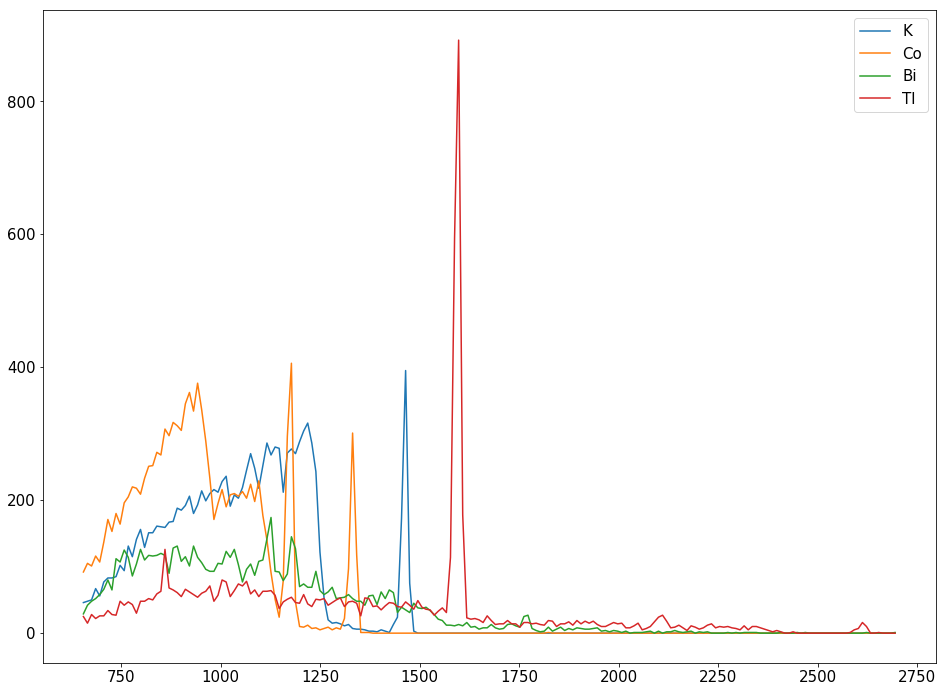

In [10]:
i = 0
for isotope in isotopes:
    h_ = histograms['E'][i]
    plt.plot(h_.bins, h_.hist, label=name[i])
    i += 1
    plt.legend()

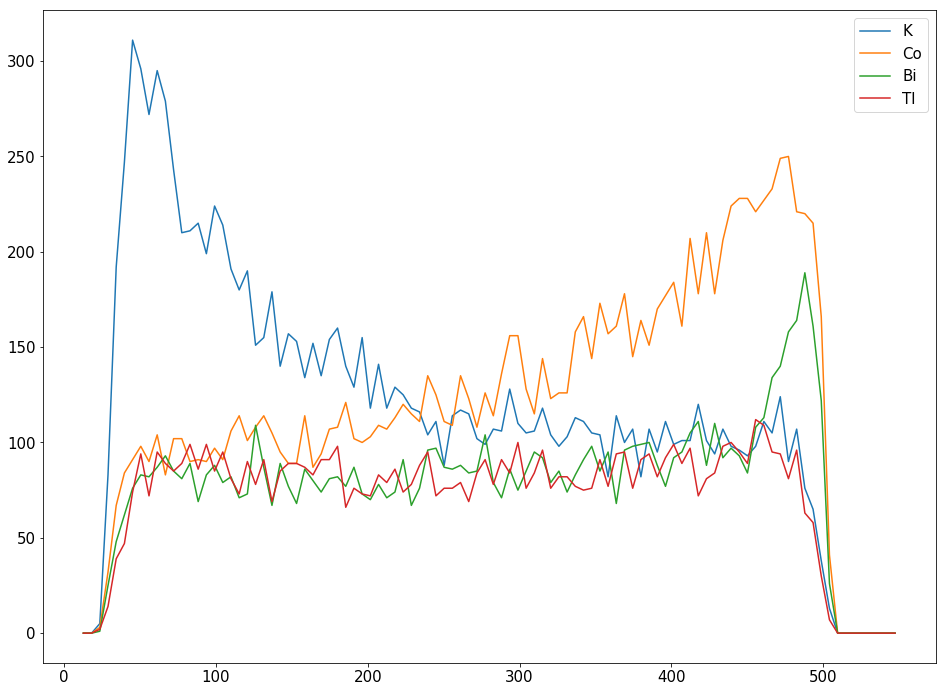

In [11]:
i = 0

for isotope in isotopes:
    h_ = histograms['z'][i]
    plt.plot(h_.bins, h_.hist, label=name[i])
    i += 1
plt.legend()

In [12]:
pdfs = {'E':[]}#, 'z':[]}

interpol = 'cubic'

pdfs['E'] = [PDF(h_, interpolation=interpol) for h_ in histograms['E']]
#pdfs['z'] = [PDF(h_, interpolation=interpol) for h_ in histograms['z']]

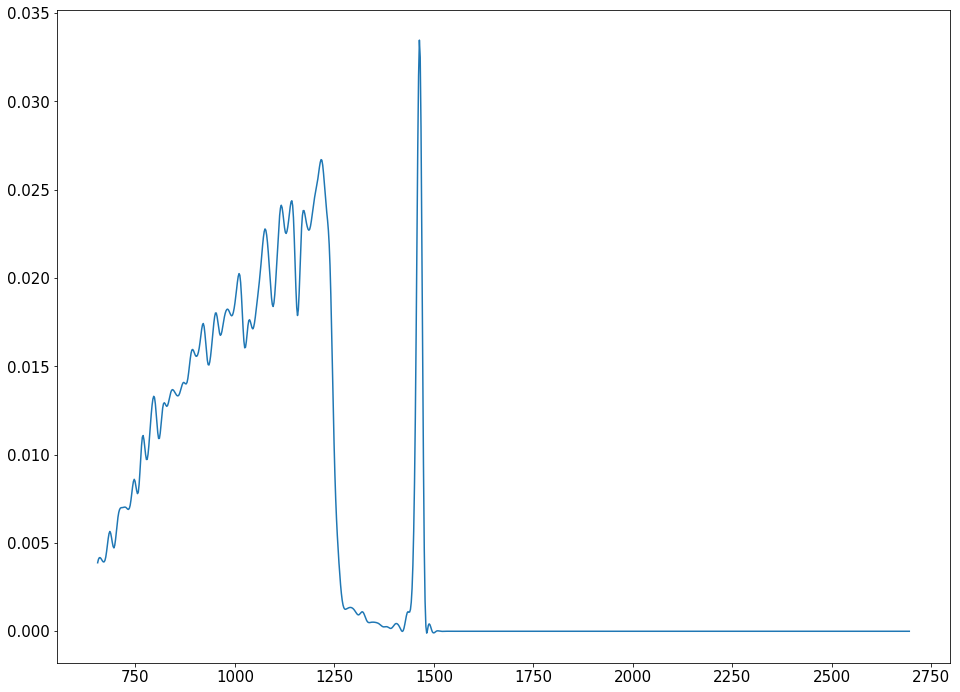

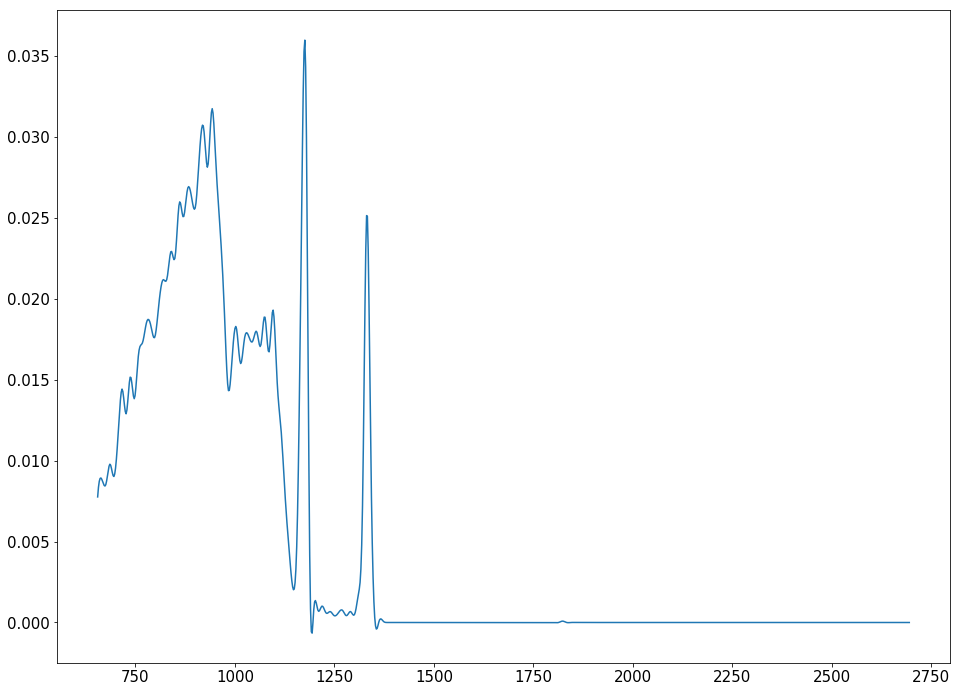

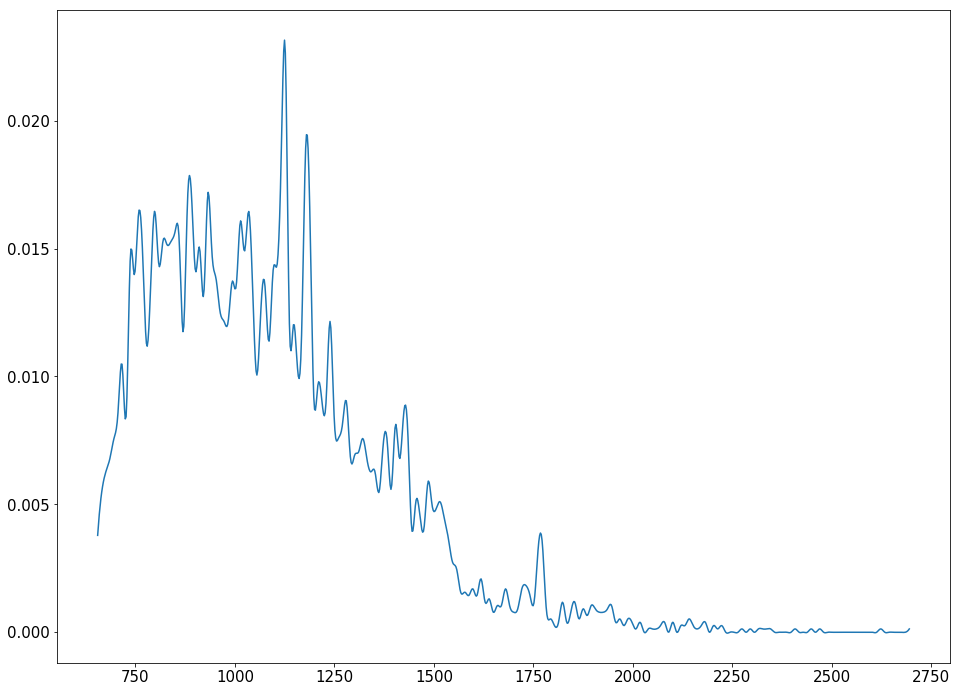

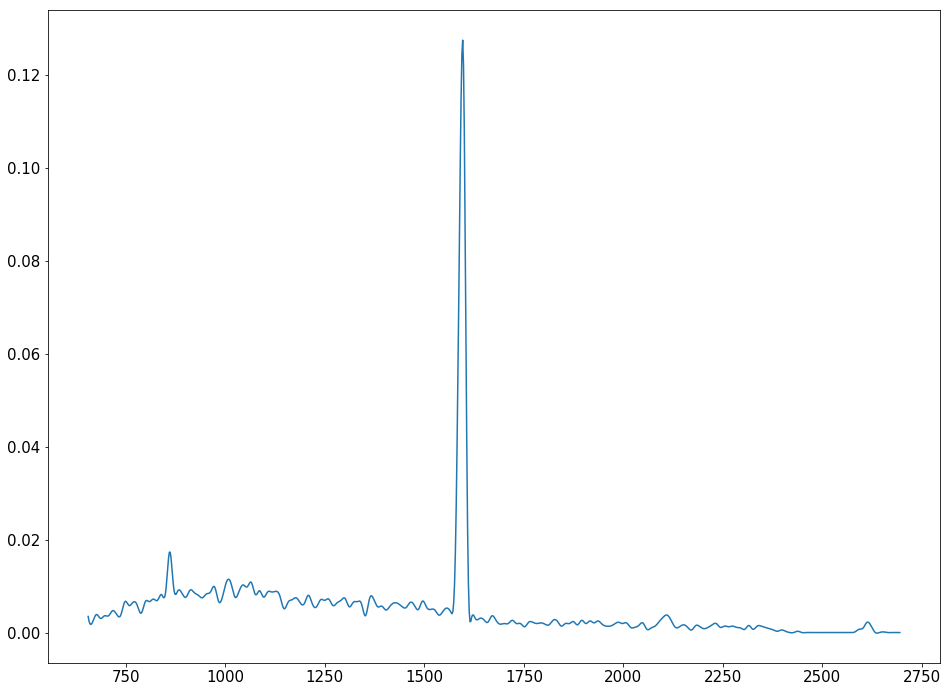

In [13]:
Ep = np.linspace(histograms['E'][0].bins[0],histograms['E'][0].bins[-1],1000)

for pdf in pdfs['E']:
    
    plt.figure()
    y = pdf.pdf(Ep)
    plt.plot(Ep, y)
    plt.show()

In [14]:
x_dict = {'E': histograms['E'][0].bins }#, 'z': histograms['z'][0].bins}

# "MC-Data reading"

## Bkg

In [15]:
f_data_b     = tb.open_file("../Data//new_MC_innercastle_Topology/topology_hits_MC_bkg_innercastle_energy_cut.hdf5", "r")
table_data_b = pd.DataFrame.from_records(f_data_b.root.dataframe.table.read())
table_data_b.head()

h_total_e_b = hist(table_data_b.energy, nbinE, minE, maxE)
h_total_z_b = hist(table_data_b.Zavg  , nbinZ, minZ, maxZ)

totals = {'E': h_total_e_b}#    , 'z': h_total_z_b  }

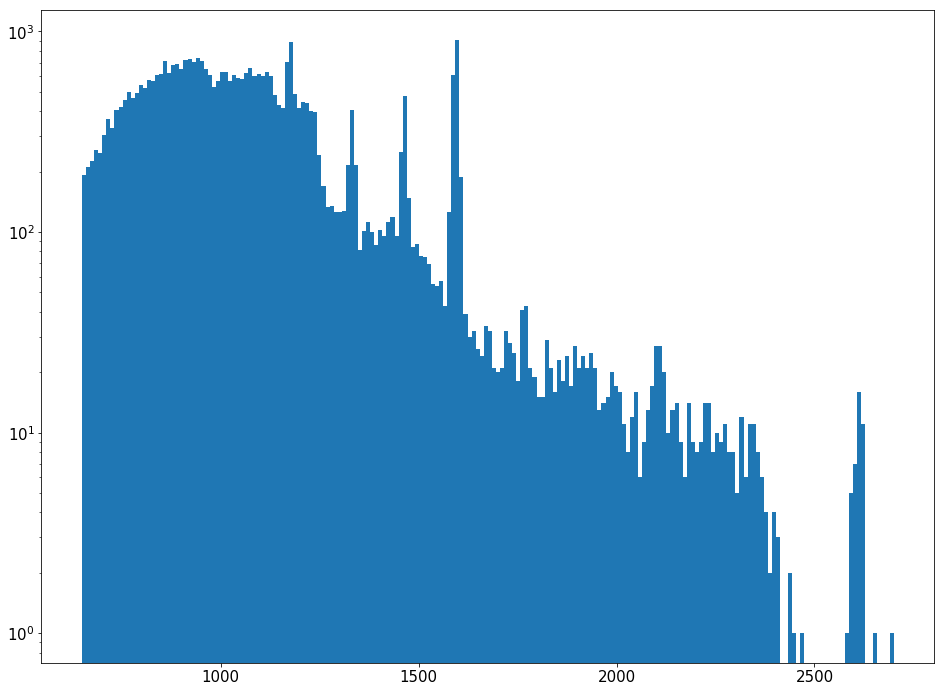

In [16]:
plt.hist(table_data_b.energy,nbinE,[minE,maxE]);
plt.yscale('log')

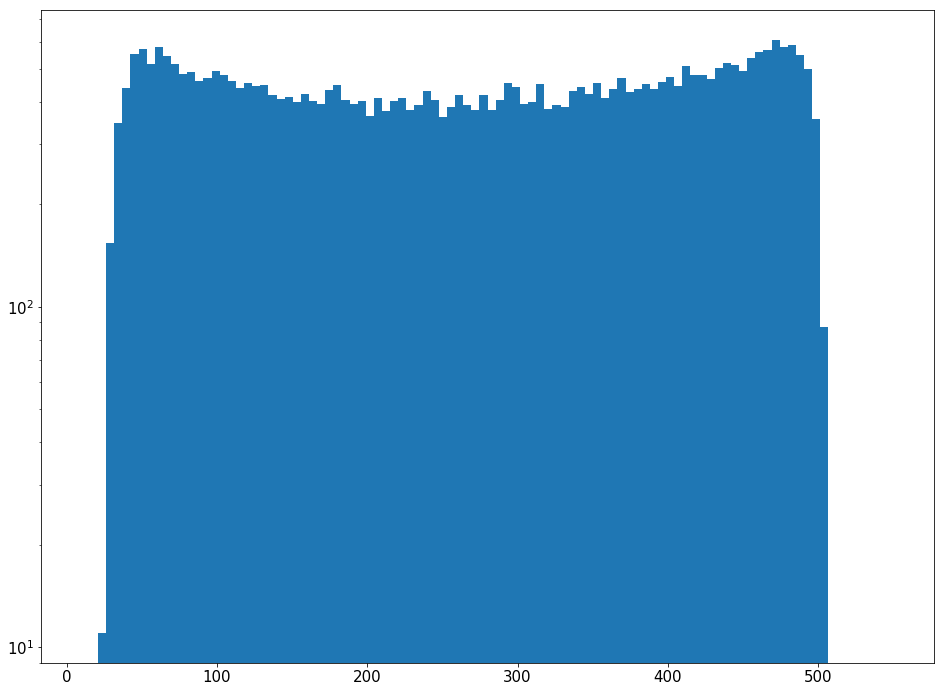

In [17]:
plt.hist(table_data_b.Zavg,nbinZ,[minZ,maxZ]);
plt.yscale('log')

## Signal

In [18]:
f_data_s     = tb.open_file("../Data/new_MC_innercastle_Topology/topology_hits_MC_xe2nu_energy_cut.hdf5", "r")
table_data_s = pd.DataFrame.from_records(f_data_s.root.dataframe.table.read())
table_data_s.head()

h_total_e_s = hist(table_data_s.energy, nbinE, minE, maxE)
h_total_z_s = hist(table_data_s.Zavg  , nbinZ, minZ, maxZ)

totals_s = {'E': h_total_e_s}#, 'z': h_total_z_s   }

#add signal pdf

interpol = 'cubic'

pdfs['E'] += [PDF(h_total_e_s, interpolation=interpol)]
#pdfs['z'] += [PDF(h_total_z_s, interpolation=interpol)]

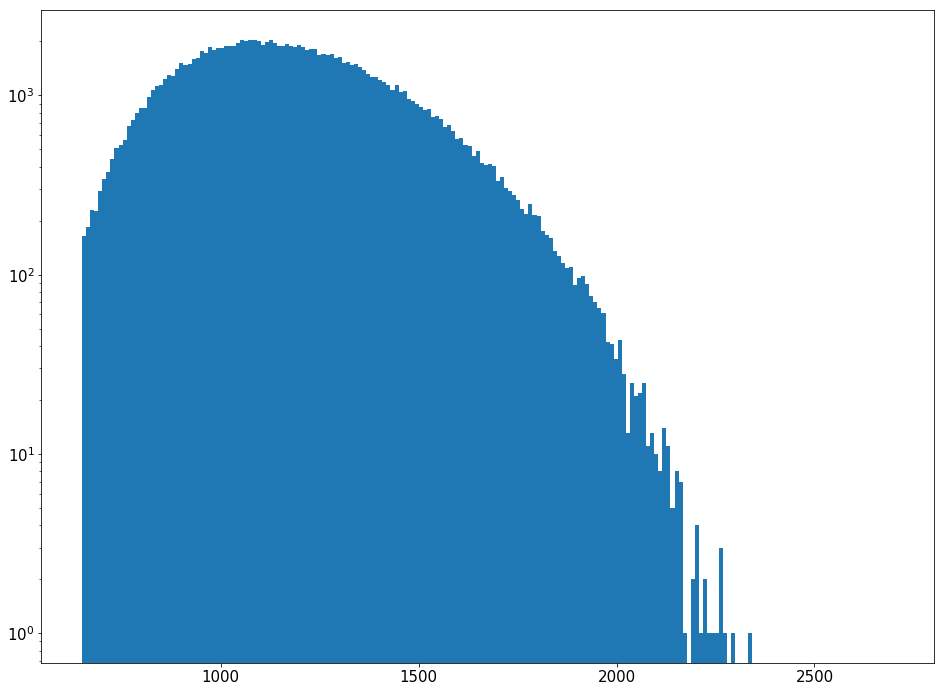

In [19]:
plt.hist(table_data_s.energy,nbinE,[minE,maxE]);
plt.yscale('log')

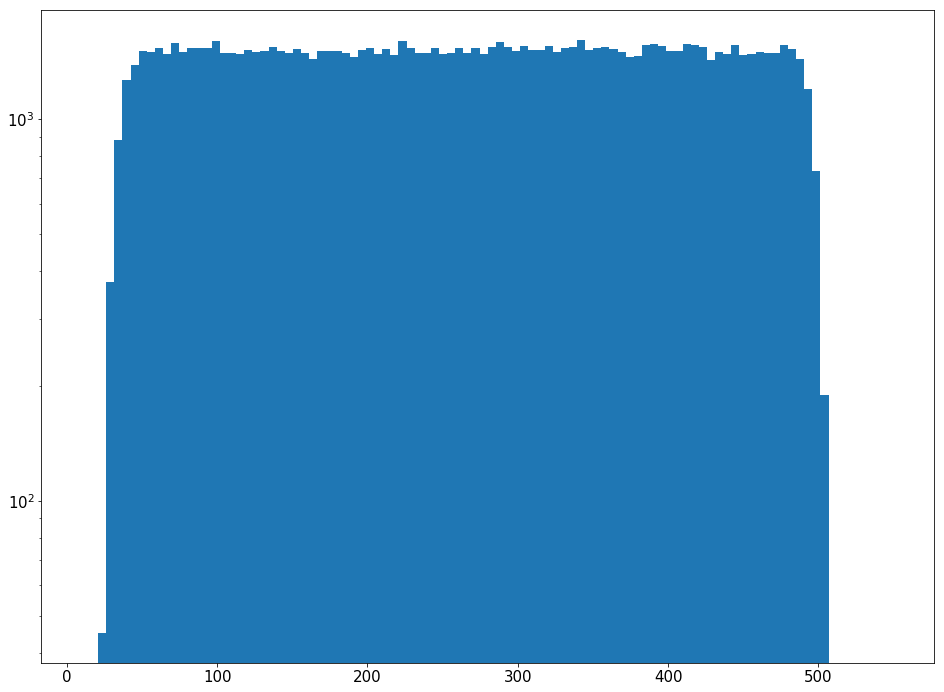

In [20]:
plt.hist(table_data_s.Zavg,nbinZ,[minZ,maxZ]);
plt.yscale('log')

# Exposure issues

In [21]:
#Pau normalization:
n_pau       = {} 
n_pau['K']  = 0.36
n_pau['Co'] = 4.38
n_pau['Bi'] = 1.69
n_pau['Tl'] = 1.55

In [22]:
expo_bb  = 223.970 #y
expo_bkg = 5.48    #y

In [23]:
N_K  = np.sum([len(mc_pdfs[region]['K'] .event.unique())  for region in regions])
N_Co = np.sum([len(mc_pdfs[region]['Co'].event.unique()) for region in regions])
N_Bi = np.sum([len(mc_pdfs[region]['Bi'].event.unique()) for region in regions])
N_Tl = np.sum([len(mc_pdfs[region]['Tl'].event.unique()) for region in regions])
N_bb = len(table_data_s.event.unique())

# Fitting

In [24]:
n_pau['K']  * days * N_K  / (expo_bkg * 365.24)*10

NameError: name 'days' is not defined

In [25]:
days=1./(24*3600)
n_exp = {}
n_exp['K']  = n_pau['K']  * days * N_K  / (expo_bkg * 365.24)
n_exp['Co'] = n_pau['Co'] * days * N_Co / (expo_bkg * 365.24)
n_exp['Bi'] = n_pau['Bi'] * days * N_Bi / (expo_bkg * 365.24)
n_exp['Tl'] = n_pau['Tl'] * days * N_Tl / (expo_bkg * 365.24)
n_exp['bb'] = days * N_bb / (expo_bb  * 365.24)
print(n_exp)

print(np.sum([n_exp[key] for key in n_exp.keys()]))

{'K': 2.5020627705783427e-05, 'Co': 0.0003073303609629788, 'Bi': 7.748764952338772e-05, 'Tl': 6.537697503334435e-05, 'bb': 1.8473598433104416e-05}
0.0004936892116585987


In [26]:
#As we don't care abour regions, data are considered just by isotope
mc_pdfs_noreg = {}

for isotope in isotopes:
    mc_pdfs_noreg[isotope] = pd.concat([mc_pdfs[region][isotope] for region in regions]) 


[ 64.85346701 796.60029562 200.84798756 169.45711929  47.88356714]
[ 102.40021107 1257.78994045  317.12840142  267.56387256   75.60563232]
[ 139.94695513 1718.97958528  433.40881527  365.67062583  103.32769751]
[ 177.49369919 2180.16923011  549.68922912  463.7773791   131.0497627 ]
[ 215.04044325 2641.35887494  665.96964298  561.88413237  158.77182788]
[ 252.58718732 3102.54851977  782.25005683  659.99088564  186.49389307]
[ 290.13393138 3563.7381646   898.53047068  758.09763891  214.21595825]
[ 327.68067544 4024.92780943 1014.81088454  856.20439218  241.93802344]
[ 365.2274195  4486.11745426 1131.09129839  954.31114546  269.66008862]
[ 402.77416356 4947.30709909 1247.37171224 1052.41789873  297.38215381]
[ 440.32090762 5408.49674392 1363.6521261  1150.524652    325.10421899]
[ 477.86765168 5869.68638875 1479.93253995 1248.63140527  352.82628418]
[ 515.41439574 6330.87603358 1596.2129538  1346.73815854  380.54834936]
[ 552.9611398  6792.06567841 1712.49336766 1444.84491181  408.2704145

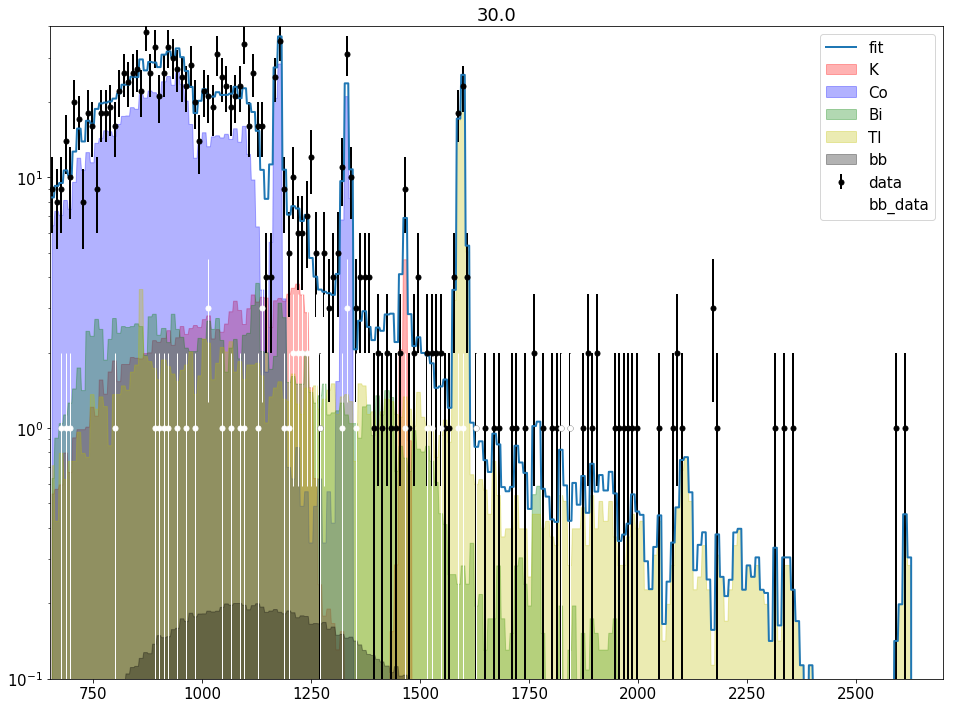

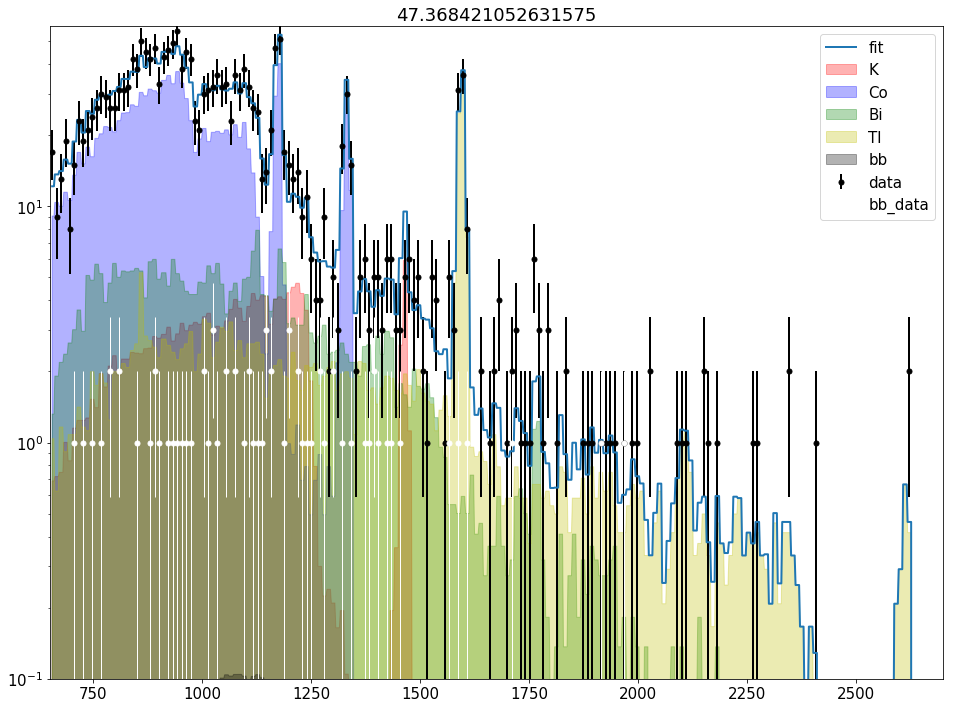

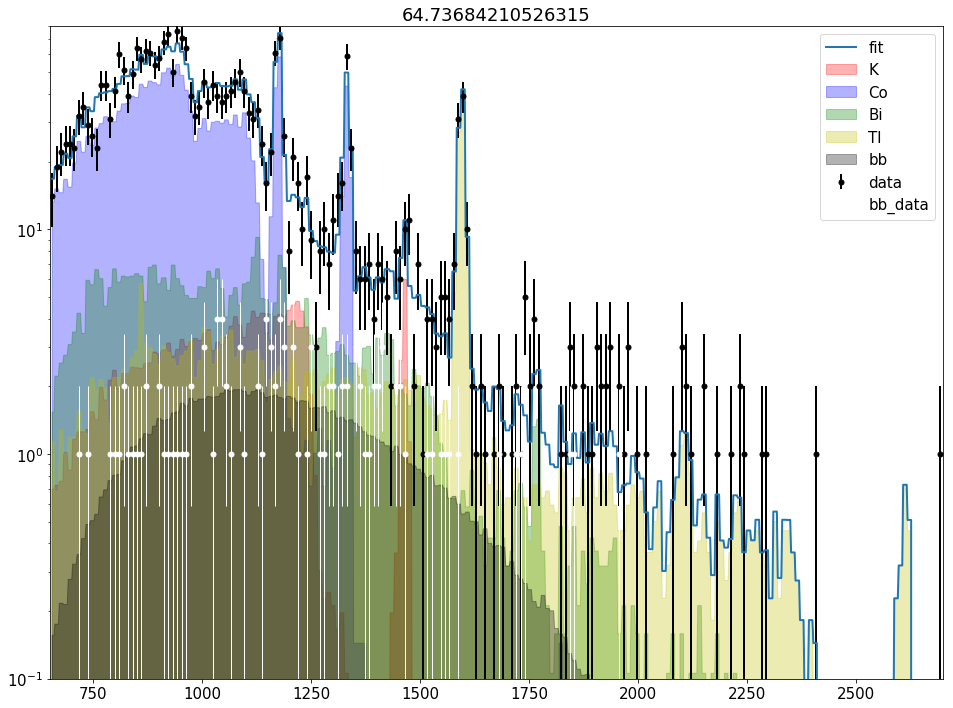

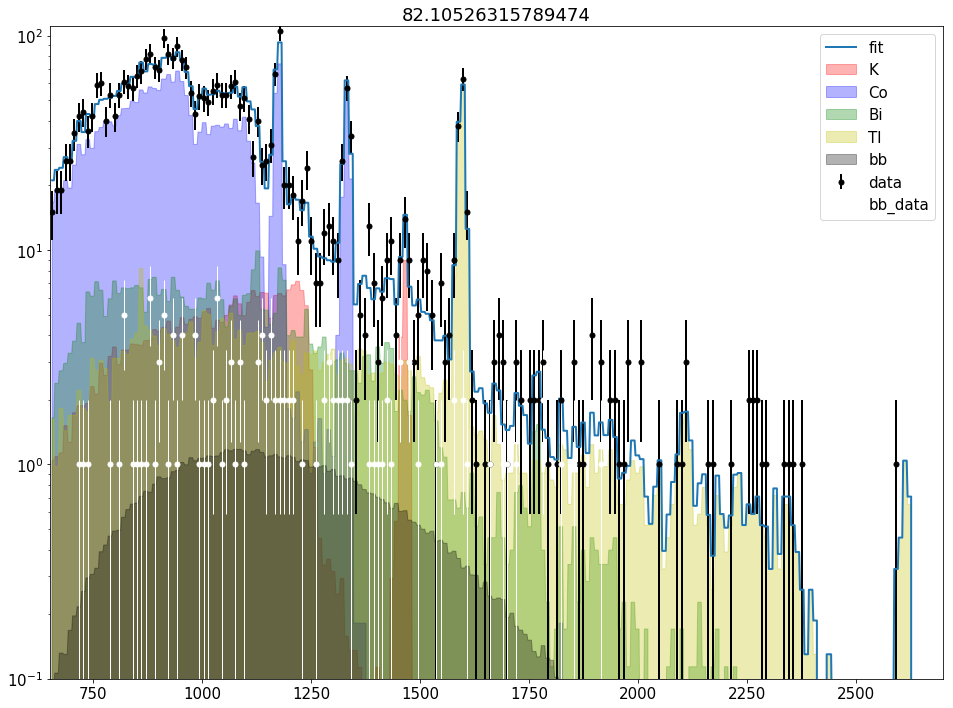

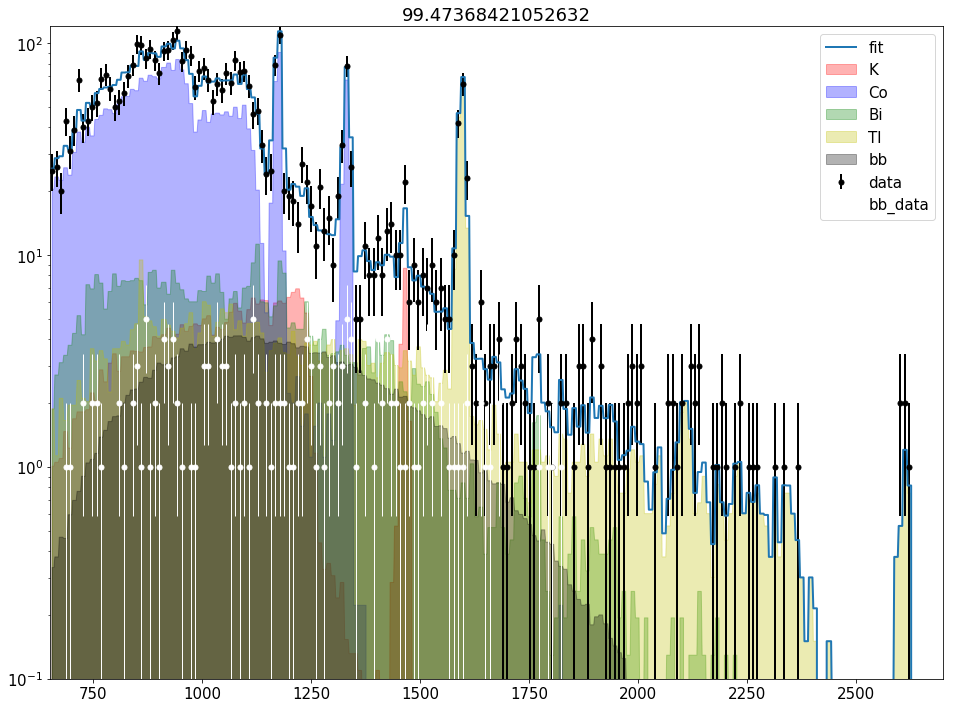

...

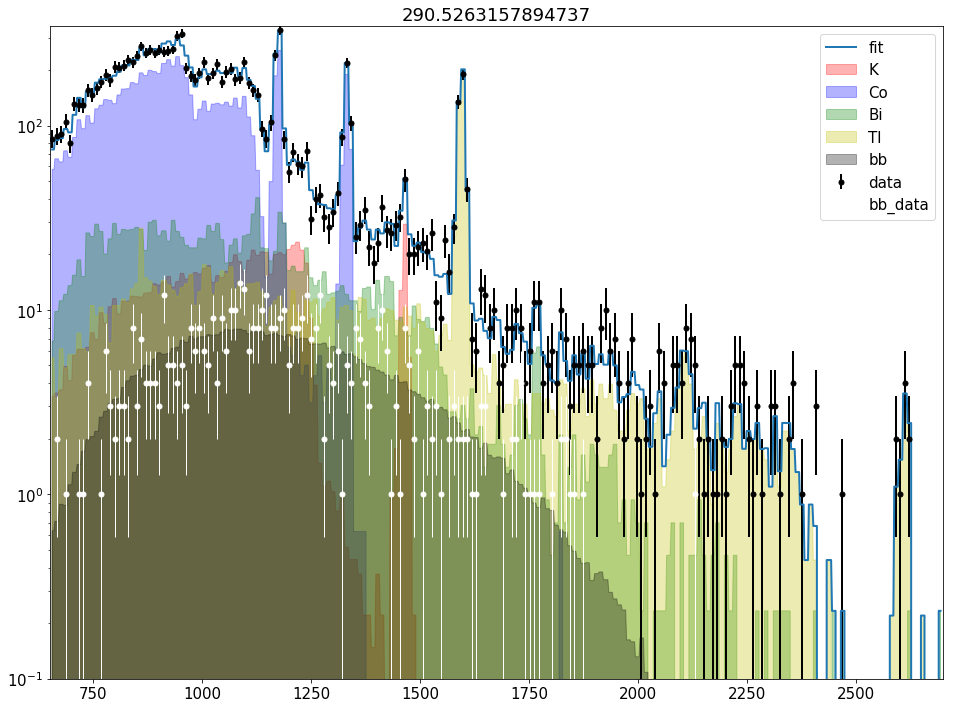

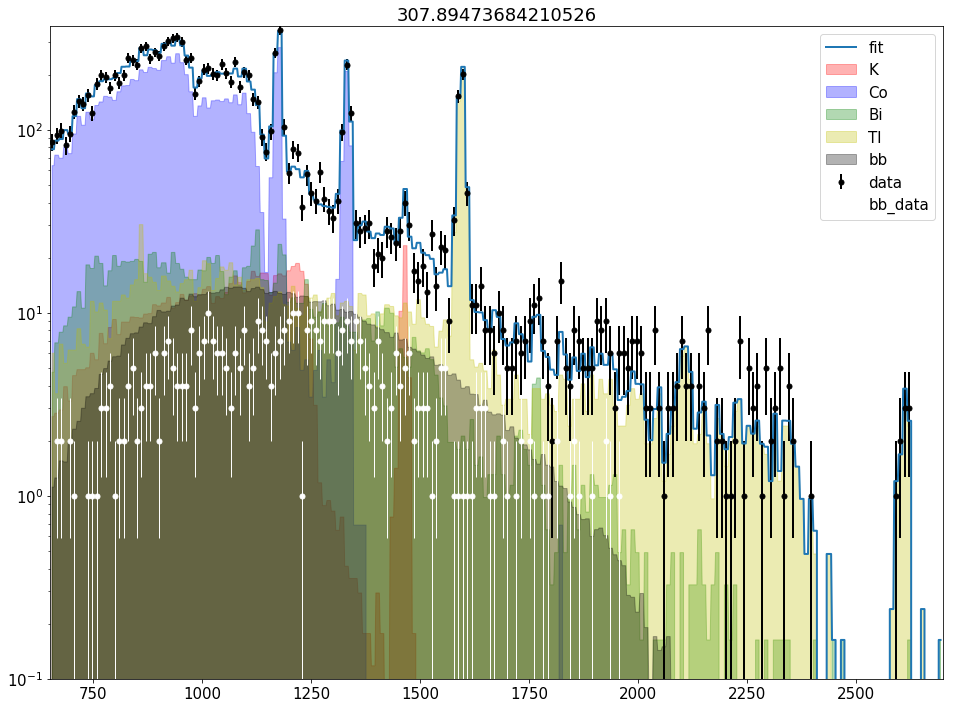

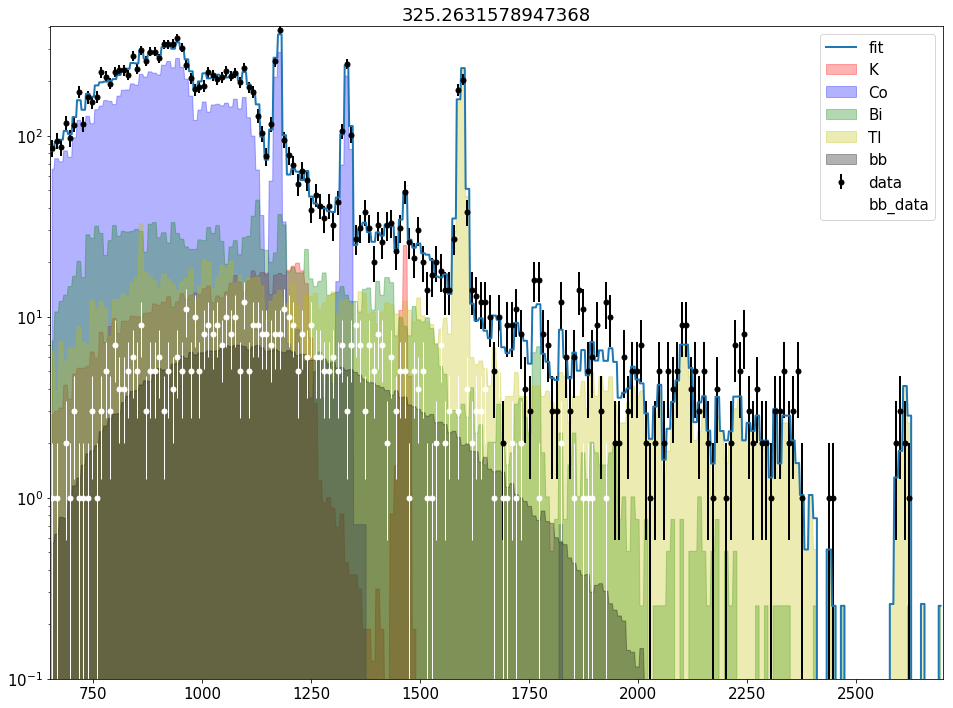

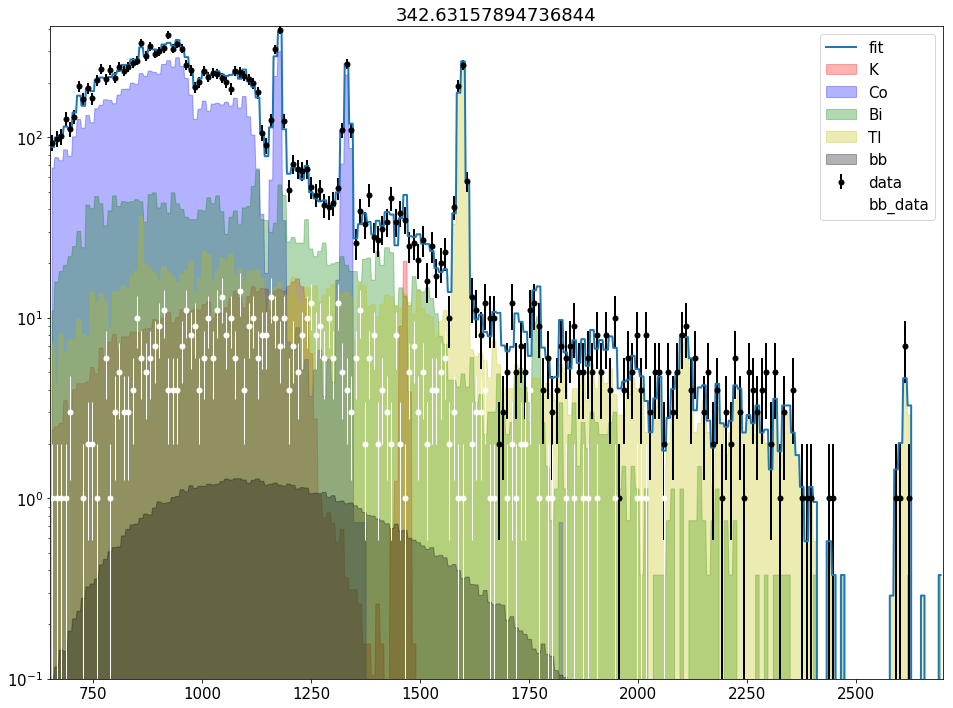

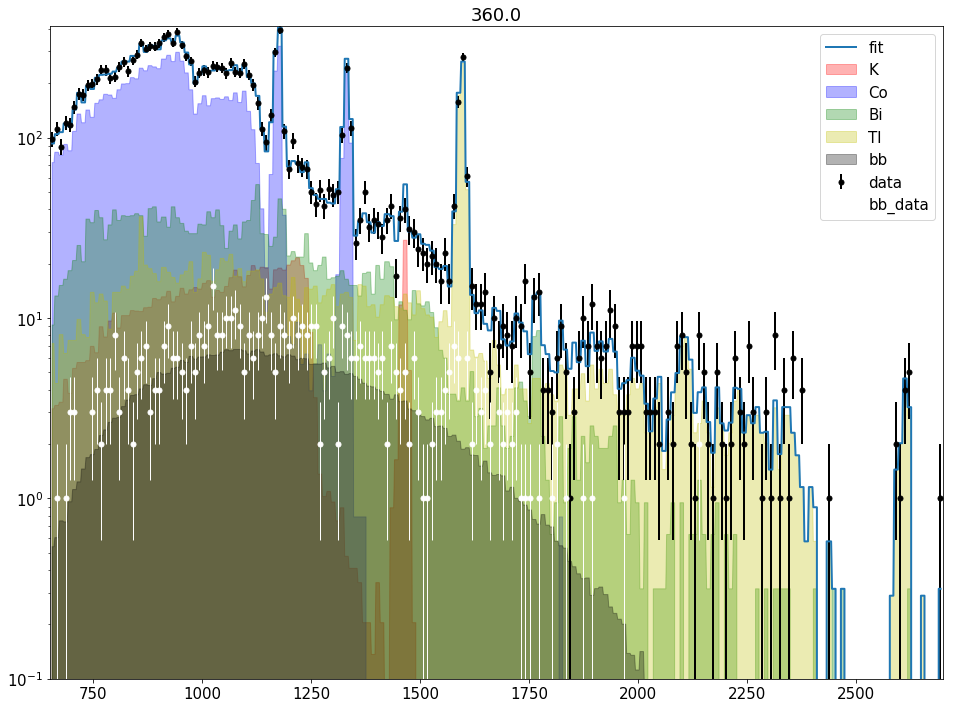

In [27]:
res_list = {}

for days in np.linspace(30, 360, 20):
    
    n_exp = {}
    n_exp['K']  = n_pau['K']  * days * N_K  / (expo_bkg * 365.24)
    n_exp['Co'] = n_pau['Co'] * days * N_Co / (expo_bkg * 365.24)
    n_exp['Bi'] = n_pau['Bi'] * days * N_Bi / (expo_bkg * 365.24)
    n_exp['Tl'] = n_pau['Tl'] * days * N_Tl / (expo_bkg * 365.24)
    n_exp['bb'] = days * N_bb / (expo_bb  * 365.24)
    
    total_data = []
    
    for isotope in isotopes:
        iso_e = np.random.choice(mc_pdfs_noreg[isotope].energy, int(np.random.poisson(n_exp[isotope])))
        total_data.append(iso_e)
    total_bb = np.random.choice(table_data_s.energy, int(np.random.poisson(n_exp['bb'])))
    total_data.append(total_bb)
    total_data = np.concatenate(total_data)
    h_total_e  = hist(total_data, nbinE, minE, maxE)
    h_total_bb = hist(total_bb  , nbinE, minE, maxE)

    
    N_0 = np.array([n_exp[key] for key in n_exp.keys()])
    print(N_0)
    totals = {'E': h_total_e}
    ratios = np.ones_like(N_0)
    bounds = [[0.5,1.5]]*len(N_0)
    fit = Fit(x_dict, totals, pdfs,N_0)
    
    res_ll = fit.FitLLM(ratios,tol=1e-12,options={"maxiter":10000,'ftol':1e-12}, bounds=bounds)
    
    res_list[days] = res_ll
    
    
    #plotting
    plt.figure()
    factors   = res_ll.x * N_0
    Ep = np.linspace(totals['E'].bins[0],totals['E'].bins[-1],1000)
    pdfs_plot = {'E':[]}
    interpol = 'nearest'
    pdfs_plot['E'] = [PDF(h_, factor=factors[i], 
                          interpolation=interpol) for h_, i in zip(histograms['E']+[h_total_e_s], 
                                                                   range(len(N_0)))]

    y_e = [pdf.pdf(Ep) for pdf in pdfs_plot['E']] 
    fittotal_e = np.sum(y_e, axis=0)
    K_e  = y_e[0] 
    Co_e = y_e[1]
    Bi_e = y_e[2]
    Tl_e = y_e[3]
    bb_e = y_e[4]
    
    plt.errorbar(totals['E'].bins, totals['E'].hist, yerr=np.sqrt(totals['E'].hist),
                 marker='.', markersize=10, elinewidth=2, linewidth=0,label='data',color='black')
    
    plt.errorbar(totals['E'].bins, h_total_bb.hist, yerr=np.sqrt(h_total_bb.hist),
                 marker='.', markersize=10, elinewidth=1, linewidth=0,label='bb_data',color='w')

    plt.plot(Ep, fittotal_e, label='fit', linewidth=2,)

    alfa = 0.3
    plt.fill_between(Ep, 0 , K_e  , label='K'  ,alpha=alfa,color='r')
    plt.fill_between(Ep, 0 , Co_e , label='Co' ,alpha=alfa,color='b')
    plt.fill_between(Ep, 0 , Bi_e , label='Bi' ,alpha=alfa,color='g')
    plt.fill_between(Ep, 0 , Tl_e , label='Tl' ,alpha=alfa,color='y')
    plt.fill_between(Ep, 0 , bb_e , label='bb' ,alpha=alfa,color='k')

    plt.xlim(minE, maxE)
    plt.ylim(   0.1, np.max(h_total_e.hist)*1.05)
    plt.legend()
    plt.yscale('log')
    plt.title(str(days))

In [28]:
from iminuit import Minuit as imin

In [29]:
res_list = {}

for days in np.linspace(30, 360, 20):
    
    n_exp = {}
    n_exp['K']  = n_pau['K']  * days * N_K  / (expo_bkg * 365.24)
    n_exp['Co'] = n_pau['Co'] * days * N_Co / (expo_bkg * 365.24)
    n_exp['Bi'] = n_pau['Bi'] * days * N_Bi / (expo_bkg * 365.24)
    n_exp['Tl'] = n_pau['Tl'] * days * N_Tl / (expo_bkg * 365.24)
    n_exp['bb'] = days * N_bb / (expo_bb  * 365.24)
    
    
    auxres = {'K':[], 'Co':[], 'Bi':[], 'Tl':[], 'bb':[]}
    auxerr = {'K':[], 'Co':[], 'Bi':[], 'Tl':[], 'bb':[]}
    
    for i in range(100):
        total_data = []
        for isotope in isotopes:
            iso_e = np.random.choice(mc_pdfs_noreg[isotope].energy, int(np.random.poisson(n_exp[isotope])))
            total_data.append(iso_e)
        total_bb = np.random.choice(table_data_s.energy, int(np.random.poisson(n_exp['bb'])))
        total_data.append(total_bb)
        total_data = np.concatenate(total_data)
        h_total_e  = hist(total_data, nbinE, minE, maxE)
        h_total_bb = hist(total_bb  , nbinE, minE, maxE)


        N_0 = np.array([n_exp[key] for key in n_exp.keys()])
        print(N_0)
        totals = {'E': h_total_e}
        ratios = np.ones_like(N_0)
        bounds = [[0.5,1.5]]*len(N_0)
        fit = Fit(x_dict, totals, pdfs,N_0)


        m = imin.from_array_func(fit.LLh, np.ones_like(N_0), 
                                 name=['K', 'Co', 'Bi', 'Tl', 'bb'], 
                                 limit=[[0,None]]*len(N_0))

        min_, res_ll = m.migrad()
        
        i_ = 0
        print(res_ll)
        for key in auxres.keys():
            auxres[key].append(res_ll[i_].value)
            auxerr[key].append(res_ll[i_].error)
            print(i_,key)
            i_+=1
   
    
    res_list[days] = {}
    res_list[days]['value'] = auxres
    res_list[days]['error'] = auxerr

    
    #plotting
    '''
    plt.figure()
    factors   = [i.value for i in res_ll[1]]* N_0
    Ep = np.linspace(totals['E'].bins[0],totals['E'].bins[-1],1000)
    pdfs_plot = {'E':[]}
    interpol = 'nearest'
    pdfs_plot['E'] = [PDF(h_, factor=factors[i], 
                          interpolation=interpol) for h_, i in zip(histograms['E']+[h_total_e_s], 
                                                                   range(len(N_0)))]

    y_e = [pdf.pdf(Ep) for pdf in pdfs_plot['E']] 
    fittotal_e = np.sum(y_e, axis=0)
    K_e  = y_e[0] 
    Co_e = y_e[1]
    Bi_e = y_e[2]
    Tl_e = y_e[3]
    bb_e = y_e[4]
    
    plt.errorbar(totals['E'].bins, totals['E'].hist, yerr=np.sqrt(totals['E'].hist),
                 marker='.', markersize=10, elinewidth=2, linewidth=0,label='data',color='black')
    
    plt.errorbar(totals['E'].bins, h_total_bb.hist, yerr=np.sqrt(h_total_bb.hist),
                 marker='.', markersize=10, elinewidth=1, linewidth=0,label='bb_data',color='w')

    plt.plot(Ep, fittotal_e, label='fit', linewidth=2,)

    alfa = 0.3
    plt.fill_between(Ep, 0 , K_e  , label='K'  ,alpha=alfa,color='r')
    plt.fill_between(Ep, 0 , Co_e , label='Co' ,alpha=alfa,color='b')
    plt.fill_between(Ep, 0 , Bi_e , label='Bi' ,alpha=alfa,color='g')
    plt.fill_between(Ep, 0 , Tl_e , label='Tl' ,alpha=alfa,color='y')
    plt.fill_between(Ep, 0 , bb_e , label='bb' ,alpha=alfa,color='k')

    plt.xlim(minE, maxE)
    plt.ylim(   0.1, np.max(h_total_e.hist)*1.05)
    plt.legend()
    plt.yscale('log')
    plt.title(str(days))
    '''

[ 64.85346701 796.60029562 200.84798756 169.45711929  47.88356714]


FCN = 582.7920898074117 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.966607528163314e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.4894,0.575448,,,0,,No
1,Co,0.903702,0.0660833,,,0,,No
2,Bi,1.08273,0.499724,,,0,,No
3,Tl,0.921098,0.13609,,,0,,No
4,bb,1.02202,1.26314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4893952267734596, 'error': 0.5754477864819105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9037024313708693, 'error': 0.06608327845545725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.082730209165717, 'error': 0.499724362522331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9210978213548524, 'error': 0.13609008231969277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0220195775979

FCN = 598.130640313018 
 TOTAL NCALL = 154 
 NCALLS = 154 
 
 
 EDM = 4.548954046949202e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29776,0.531174,,,0,,No
1,Co,0.930313,0.0556911,,,0,,No
2,Bi,1.17402,0.264552,,,0,,No
3,Tl,1.08047,0.143244,,,0,,No
4,bb,4.29716e-07,0.692581,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2977619263287021, 'error': 0.5311740427454965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9303131305851093, 'error': 0.05569112305429025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.174017882590892, 'error': 0.26455224557874346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0804652551983023, 'error': 0.14324385759307734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.29715542482

FCN = 610.9767803734012 
 TOTAL NCALL = 190 
 NCALLS = 190 
 
 
 EDM = 1.1353568099556141e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.50096,0.572274,,,0,,No
1,Co,0.959543,0.0563706,,,0,,No
2,Bi,1.06721,0.274653,,,0,,No
3,Tl,1.23325,0.151634,,,0,,No
4,bb,3.08062e-05,1.95575,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5009574804728572, 'error': 0.5722743935183242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9595431835114234, 'error': 0.05637062733887477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0672148203251086, 'error': 0.2746533849671535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.2332479091882744, 'error': 0.15163392281945587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.08062485447

FCN = 570.8517037730895 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 7.044202684952204e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.68916,0.565123,,,0,,No
1,Co,0.939697,0.0643651,,,0,,No
2,Bi,0.232936,0.425563,,,0,,No
3,Tl,1.02267,0.142262,,,0,,No
4,bb,2.36091,1.40771,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6891612532843312, 'error': 0.5651232878341634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9396966419029591, 'error': 0.06436507813532721, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.23293569168580586, 'error': 0.4255630047023178, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0226743076919704, 'error': 0.14226176980815086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.3609058991

FCN = 608.1652031136903 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 1.474768391290828e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.607646,0.517861,,,0,,No
1,Co,0.944215,0.0562653,,,0,,No
2,Bi,1.42876,0.280457,,,0,,No
3,Tl,1.07643,0.146146,,,0,,No
4,bb,2.40288e-05,1.33419,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6076461418040604, 'error': 0.5178605849726793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9442152335318617, 'error': 0.05626526250113939, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4287568469149807, 'error': 0.2804568782899688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0764318050067927, 'error': 0.146145810750133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.4028785397200

FCN = 609.0090725986607 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4134846145865008e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.955315,0.56232,,,0,,No
1,Co,0.974573,0.0659437,,,0,,No
2,Bi,1.00992,0.500534,,,0,,No
3,Tl,0.901119,0.135956,,,0,,No
4,bb,1.40322,1.37211,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9553145652146782, 'error': 0.5623204069989846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9745725251654236, 'error': 0.06594365646982736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0099207287658842, 'error': 0.5005342821705798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9011185601935654, 'error': 0.13595625401590772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.40321678051

FCN = 614.8580850839107 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.3814439121436282e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.89769,0.533869,,,0,,No
1,Co,0.989653,0.0641837,,,0,,No
2,Bi,0.343308,0.445981,,,0,,No
3,Tl,1.21891,0.159538,,,0,,No
4,bb,2.1701,1.39334,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8976898915446334, 'error': 0.5338686594874714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9896526936927081, 'error': 0.06418366881386994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.34330834364368434, 'error': 0.44598105839774327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.2189095716069946, 'error': 0.15953838373252505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.170097199

FCN = 570.6308375174058 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.304192034222141e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.52209,0.572539,,,0,,No
1,Co,0.988511,0.0683253,,,0,,No
2,Bi,0.99969,0.492237,,,0,,No
3,Tl,0.937838,0.139427,,,0,,No
4,bb,1.50922,1.37148,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5220900740097325, 'error': 0.5725386348581216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.988511254237012, 'error': 0.06832530164441952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9996896901662207, 'error': 0.4922368040813241, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9378377366843327, 'error': 0.13942742423520926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.509222958114

FCN = 583.7584226388838 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.504220358921994e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12536,0.522468,,,0,,No
1,Co,0.923645,0.0645006,,,0,,No
2,Bi,0.664011,0.472592,,,0,,No
3,Tl,1.04302,0.145772,,,0,,No
4,bb,1.61091,1.35923,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1253579324971241, 'error': 0.5224676054612112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.923644969612345, 'error': 0.06450055352101658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6640105178359659, 'error': 0.47259182829198476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0430213325281201, 'error': 0.1457723711057758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.610906483273

FCN = 567.7810144364646 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 5.461150907566933e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.437187,0.481597,,,0,,No
1,Co,0.943513,0.0543223,,,0,,No
2,Bi,1.24183,0.264739,,,0,,No
3,Tl,0.92492,0.134867,,,0,,No
4,bb,3.25926e-05,1.36461,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.437186644287912, 'error': 0.48159733640053215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.943513353566588, 'error': 0.054322311836922155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2418273948531993, 'error': 0.26473924738299137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9249203125081618, 'error': 0.1348668051232782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.25926383235

FCN = 592.1346752565663 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.4901397461962983e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29306,0.557709,,,0,,No
1,Co,0.891041,0.0660804,,,0,,No
2,Bi,1.36676,0.491269,,,0,,No
3,Tl,0.857945,0.134075,,,0,,No
4,bb,0.430412,0.887405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2930618356241133, 'error': 0.557709456529981, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8910411567538816, 'error': 0.06608035811174195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.366757037029863, 'error': 0.4912688215833454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8579448841598689, 'error': 0.13407503319378256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4304123569391

FCN = 606.0083498886556 
 TOTAL NCALL = 174 
 NCALLS = 174 
 
 
 EDM = 7.354260542456493e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20926,0.571859,,,0,,No
1,Co,1.03324,0.0648953,,,0,,No
2,Bi,0.0770802,0.631569,,,0,,No
3,Tl,0.862067,0.13446,,,0,,No
4,bb,4.07131,1.48951,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2092618035706835, 'error': 0.5718585673840865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0332427512491957, 'error': 0.06489525043823352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.07708017026135972, 'error': 0.6315690158501197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8620667596271876, 'error': 0.134459764017976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.071306774024

FCN = 608.5729821275489 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.059641014182783e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16888,0.52972,,,0,,No
1,Co,0.965885,0.0606044,,,0,,No
2,Bi,0.655106,0.40004,,,0,,No
3,Tl,1.14431,0.15309,,,0,,No
4,bb,1.94783,1.25224,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.168876717318439, 'error': 0.5297203264250052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9658851629632004, 'error': 0.060604360096721654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6551057805744311, 'error': 0.4000403383076242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1443121764837971, 'error': 0.15309039682806447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.94782971307

FCN = 609.4899695049078 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 3.14853968911005e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25561,0.54221,,,0,,No
1,Co,0.978703,0.0636797,,,0,,No
2,Bi,0.985583,0.467971,,,0,,No
3,Tl,1.00802,0.147761,,,0,,No
4,bb,0.191084,1.52798,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2556140294618783, 'error': 0.5422103696066082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9787031907673047, 'error': 0.06367965322860669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9855832517344807, 'error': 0.4679714974236301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.00802370623567, 'error': 0.14776084690209335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1910843755439

FCN = 593.376711246334 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.876145543727247e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.778201,0.524451,,,0,,No
1,Co,0.956536,0.0609624,,,0,,No
2,Bi,1.04452,0.441574,,,0,,No
3,Tl,0.838493,0.13433,,,0,,No
4,bb,0.851015,1.13772,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7782012918447294, 'error': 0.5244508546274173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9565355875035604, 'error': 0.060962445144664756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0445222572780266, 'error': 0.4415737423741378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8384931236295521, 'error': 0.13433013062811394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8510148165

FCN = 588.0321233220093 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010179283494923829 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.62028,0.539122,,,0,,No
1,Co,1.05272,0.0656894,,,0,,No
2,Bi,0.86046,0.476075,,,0,,No
3,Tl,0.935208,0.143911,,,0,,No
4,bb,1.31619,1.33692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6202759115928207, 'error': 0.5391222311268831, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0527176549894008, 'error': 0.0656894018362818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8604595534304835, 'error': 0.47607485978133834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9352077422671274, 'error': 0.14391140914879197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.31619295174

FCN = 596.0302351067387 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 3.922365750374624e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,3.08083,0.635835,,,0,,No
1,Co,0.940219,0.0583572,,,0,,No
2,Bi,0.947439,0.266144,,,0,,No
3,Tl,1.06113,0.142379,,,0,,No
4,bb,1.39265e-07,0.973192,,,0,,No


[{'number': 0, 'name': 'K', 'value': 3.080828374270868, 'error': 0.635835082835621, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9402187274456881, 'error': 0.05835722258549403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9474391085125182, 'error': 0.26614366007684487, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0611322477023113, 'error': 0.14237925538455454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.392651156617

FCN = 584.5110733241636 
 TOTAL NCALL = 173 
 NCALLS = 173 
 
 
 EDM = 1.987410020182694e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00355,0.507265,,,0,,No
1,Co,1.00772,0.0560955,,,0,,No
2,Bi,1.28871,0.253087,,,0,,No
3,Tl,0.804721,0.126348,,,0,,No
4,bb,1.89727e-07,0.719198,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0035545405941781, 'error': 0.5072652686247701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0077155483483002, 'error': 0.056095451921432726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2887095520433949, 'error': 0.25308671482799805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8047212150979968, 'error': 0.12634808937244024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.897268289

FCN = 566.735337431778 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.338883020753336e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.33903,0.543175,,,0,,No
1,Co,0.936057,0.0668919,,,0,,No
2,Bi,0.996391,0.527812,,,0,,No
3,Tl,0.771187,0.122988,,,0,,No
4,bb,0.996054,1.318,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3390301126043167, 'error': 0.5431753963014044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9360572919975323, 'error': 0.06689194021584322, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9963906438571202, 'error': 0.5278123820480755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7711872092505718, 'error': 0.12298836832800175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99605418199

FCN = 591.8373828906261 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 1.814530213838388e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36702,0.581656,,,0,,No
1,Co,0.938605,0.0566836,,,0,,No
2,Bi,1.43233,0.268918,,,0,,No
3,Tl,0.831793,0.12779,,,0,,No
4,bb,1.45938e-06,0.63611,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3670208286397645, 'error': 0.5816559344552733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9386048223586165, 'error': 0.05668356687545495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4323292279411977, 'error': 0.268917719855299, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8317926076131641, 'error': 0.1277897665667994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4593830097719

FCN = 575.9069260341038 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.986075361205606e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.976997,0.492775,,,0,,No
1,Co,1.03157,0.0650607,,,0,,No
2,Bi,1.01101,0.464955,,,0,,No
3,Tl,0.643042,0.117204,,,0,,No
4,bb,1.29202,1.2363,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9769969652290544, 'error': 0.49277485285164335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0315694152225827, 'error': 0.06506071643692568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.011012175986556, 'error': 0.4649552901638302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.6430420469538278, 'error': 0.11720438793231769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.29202070842

FCN = 616.9535828941634 
 TOTAL NCALL = 122 
 NCALLS = 122 
 
 
 EDM = 1.332099523745239e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.539865,0.50881,,,0,,No
1,Co,0.964782,0.0646924,,,0,,No
2,Bi,1.00526,0.482506,,,0,,No
3,Tl,1.11096,0.157348,,,0,,No
4,bb,1.42604,1.33977,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5398648337094909, 'error': 0.5088095297776005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9647818425225041, 'error': 0.06469240735823056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0052567884952164, 'error': 0.48250576758474606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1109570342467228, 'error': 0.1573477987491123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42603824646

FCN = 628.8261801255014 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 8.415414840054482e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.856459,0.488008,,,0,,No
1,Co,1.00716,0.059984,,,0,,No
2,Bi,0.992093,0.390048,,,0,,No
3,Tl,1.1144,0.14955,,,0,,No
4,bb,0.00301139,8.85892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8564594766526639, 'error': 0.4880082712768615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007155554599712, 'error': 0.059984032846497226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9920927895471092, 'error': 0.39004825501365026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1144010328374954, 'error': 0.14955001100437415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0030113907

FCN = 595.3339491206946 
 TOTAL NCALL = 215 
 NCALLS = 215 
 
 
 EDM = 5.8605033833819046e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.448973,0.459782,,,0,,No
1,Co,1.03814,0.0569397,,,0,,No
2,Bi,1.08826,0.297806,,,0,,No
3,Tl,1.08864,0.144309,,,0,,No
4,bb,0.000841629,5.78911,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4489733473380897, 'error': 0.4597823800726022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0381359653454032, 'error': 0.05693971804044273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0882601597370614, 'error': 0.29780605604601496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0886370024745209, 'error': 0.1443092573821838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.00084162850

FCN = 596.8221102629325 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.180799288040887e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.651327,0.511914,,,0,,No
1,Co,1.06425,0.067214,,,0,,No
2,Bi,1.06139,0.509832,,,0,,No
3,Tl,1.17666,0.156779,,,0,,No
4,bb,0.234804,1.50306,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6513270270708782, 'error': 0.5119141883018309, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0642543094394448, 'error': 0.0672139784458079, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0613896200409112, 'error': 0.5098320987248628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1766562779131489, 'error': 0.15677946569331658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.234804020585

FCN = 607.6667228271209 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.930787610432481e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.668942,0.478589,,,0,,No
1,Co,1.01565,0.0604893,,,0,,No
2,Bi,0.623543,0.408436,,,0,,No
3,Tl,0.926819,0.141135,,,0,,No
4,bb,1.52995,1.17067,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6689417954159318, 'error': 0.4785889458668734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0156494020313387, 'error': 0.060489344506242104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6235428087729236, 'error': 0.40843585931092474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9268189877039659, 'error': 0.1411346698019954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5299504857

FCN = 584.6924815469142 
 TOTAL NCALL = 194 
 NCALLS = 194 
 
 
 EDM = 0.00015332935406981162 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.318867,0.445779,,,0,,No
1,Co,1.03749,0.0559739,,,0,,No
2,Bi,1.53676,0.257399,,,0,,No
3,Tl,0.798602,0.121718,,,0,,No
4,bb,0.000376148,2.20655,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.31886698866132934, 'error': 0.44577915638568055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0374859964308039, 'error': 0.05597393510777027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5367600941487787, 'error': 0.2573985700077932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7986023100962036, 'error': 0.12171798877874418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.000376148

FCN = 605.0063880960453 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0966402598415915e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.68902,0.539267,,,0,,No
1,Co,1.06166,0.0551777,,,0,,No
2,Bi,0.721999,0.231374,,,0,,No
3,Tl,1.04292,0.13624,,,0,,No
4,bb,1.30579e-07,0.728852,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6890179396858431, 'error': 0.5392667249048864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0616615982409647, 'error': 0.055177684996903675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7219993078919686, 'error': 0.2313744938727842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042916694147964, 'error': 0.1362396522708197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.305789338879

FCN = 589.5716357705192 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.43771376007462e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.686678,0.496289,,,0,,No
1,Co,0.949218,0.0633734,,,0,,No
2,Bi,0.716567,0.472673,,,0,,No
3,Tl,1.11895,0.147725,,,0,,No
4,bb,1.14367,1.28259,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.686677860290823, 'error': 0.49628921477376586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.949218486977857, 'error': 0.06337342171215155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7165672443149047, 'error': 0.47267296022282723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.118953465325768, 'error': 0.14772510454479915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.143666162157

FCN = 579.3839294559975 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.0011466617980668e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.73245,0.577181,,,0,,No
1,Co,0.885863,0.0631527,,,0,,No
2,Bi,0.740585,0.465404,,,0,,No
3,Tl,1.06828,0.144941,,,0,,No
4,bb,0.672972,1.07019,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.7324481943637662, 'error': 0.5771813677770739, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.885862708550879, 'error': 0.0631527276615077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7405845343614104, 'error': 0.46540428318575555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0682784564790606, 'error': 0.1449410285744409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6729722367605

FCN = 607.1841600590827 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 5.0966481549470024e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,3.94898e-05,0.762969,,,0,,No
1,Co,1.06853,0.0645808,,,0,,No
2,Bi,0.371911,0.460731,,,0,,No
3,Tl,1.11511,0.155649,,,0,,No
4,bb,3.15726,1.4809,,,0,,No


[{'number': 0, 'name': 'K', 'value': 3.948982557822056e-05, 'error': 0.7629689721091297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0685327174798398, 'error': 0.06458078862979577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.37191133982546387, 'error': 0.4607311616865517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1151144001479172, 'error': 0.15564887220671408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.1572561

FCN = 574.7442418244453 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.005682077841554e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.742537,0.519938,,,0,,No
1,Co,0.996586,0.0647526,,,0,,No
2,Bi,1.13963,0.508595,,,0,,No
3,Tl,0.947956,0.137109,,,0,,No
4,bb,0.718216,1.1459,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7425366932628998, 'error': 0.5199380882547265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.996586146206071, 'error': 0.06475258400949446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1396264969105792, 'error': 0.5085947300817153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9479561944340014, 'error': 0.13710872314510425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.718215898403

FCN = 610.5871025788949 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.0245053117358793e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.651566,0.51726,,,0,,No
1,Co,1.00998,0.066284,,,0,,No
2,Bi,0.759507,0.504732,,,0,,No
3,Tl,0.881414,0.140136,,,0,,No
4,bb,2.88843,1.51209,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6515658614309392, 'error': 0.5172604038568012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0099750993444796, 'error': 0.06628403604870003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7595069793228284, 'error': 0.5047324151057604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8814137984895185, 'error': 0.14013647362314718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.88843019348

FCN = 605.6361276872736 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 3.0883913436342244e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.407666,0.505,,,0,,No
1,Co,0.945228,0.0650459,,,0,,No
2,Bi,1.38807,0.494898,,,0,,No
3,Tl,0.681393,0.122593,,,0,,No
4,bb,1.34383,1.30683,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4076658407191709, 'error': 0.50499967561812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9452276640431592, 'error': 0.06504591121291425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3880653797173474, 'error': 0.49489754651821594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.681393074555197, 'error': 0.12259330124274048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3438275095649

FCN = 575.9923465877893 
 TOTAL NCALL = 161 
 NCALLS = 161 
 
 
 EDM = 9.497918039940804e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02884,0.54189,,,0,,No
1,Co,0.95276,0.0564786,,,0,,No
2,Bi,1.38431,0.27284,,,0,,No
3,Tl,0.880477,0.133099,,,0,,No
4,bb,1.41812e-06,0.947866,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0288375847946059, 'error': 0.5418902414564718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9527603950534416, 'error': 0.05647861891707129, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.384312415660601, 'error': 0.27283970117743905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8804765796181506, 'error': 0.13309900216312676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.41811533072

FCN = 591.7026449367228 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.7316305063671083e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.830639,0.502716,,,0,,No
1,Co,0.970862,0.0622391,,,0,,No
2,Bi,0.475682,0.44238,,,0,,No
3,Tl,1.12427,0.14854,,,0,,No
4,bb,1.64493,1.29606,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8306394264561692, 'error': 0.5027164663689093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9708622823332176, 'error': 0.06223905744054592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.47568168323867677, 'error': 0.4423801336238007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1242690808607438, 'error': 0.14853978693159275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6449263700

FCN = 594.3688656627589 
 TOTAL NCALL = 169 
 NCALLS = 169 
 
 
 EDM = 2.7969830643255373e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43841,0.526116,,,0,,No
1,Co,0.977388,0.0558778,,,0,,No
2,Bi,1.19031,0.255047,,,0,,No
3,Tl,0.956519,0.135767,,,0,,No
4,bb,6.10735e-06,2.45724,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4384143888403154, 'error': 0.5261160118502458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.977387868277261, 'error': 0.05587775598876765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1903097593911038, 'error': 0.25504654156782613, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9565189926120179, 'error': 0.13576718818911648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 6.10735161044

FCN = 614.9247935422944 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4363755171487843e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.751296,0.5361,,,0,,No
1,Co,0.98539,0.0642772,,,0,,No
2,Bi,0.715311,0.482317,,,0,,No
3,Tl,0.894781,0.141006,,,0,,No
4,bb,2.56925,1.44848,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7512961260859785, 'error': 0.5360996471360304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9853904111339842, 'error': 0.06427722995530771, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.715311325129967, 'error': 0.4823167267814825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8947806878571576, 'error': 0.14100595378683423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.569250839944

FCN = 580.4396075284631 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.4826115484952234e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21688,0.545783,,,0,,No
1,Co,0.999961,0.0654467,,,0,,No
2,Bi,0.42021,0.478987,,,0,,No
3,Tl,0.995985,0.139168,,,0,,No
4,bb,1.88847,1.39271,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2168769451826962, 'error': 0.5457833061668982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9999612931344499, 'error': 0.06544673338809104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.42021004886305535, 'error': 0.4789865075832904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.995984932568863, 'error': 0.13916818707696454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.88847439638

FCN = 597.7229875961646 
 TOTAL NCALL = 179 
 NCALLS = 179 
 
 
 EDM = 2.2430378856202734e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,2.13268e-08,0.566107,,,0,,No
1,Co,1.05077,0.0624366,,,0,,No
2,Bi,0.520112,0.463989,,,0,,No
3,Tl,0.836128,0.13158,,,0,,No
4,bb,3.67461,1.44072,,,0,,No


[{'number': 0, 'name': 'K', 'value': 2.1326772348118084e-08, 'error': 0.5661067739088811, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0507707244175508, 'error': 0.06243662441824949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5201119486807304, 'error': 0.4639889608844604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8361278881072691, 'error': 0.1315797073803172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.67461320

FCN = 615.5981810558045 
 TOTAL NCALL = 147 
 NCALLS = 147 
 
 
 EDM = 1.4482007939055918e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00311,0.52816,,,0,,No
1,Co,1.02754,0.0642258,,,0,,No
2,Bi,0.197241,0.408485,,,0,,No
3,Tl,1.13349,0.151423,,,0,,No
4,bb,2.73009,1.36152,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0031137846824358, 'error': 0.5281599638522967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0275411751347798, 'error': 0.06422580632485697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.19724080837714042, 'error': 0.40848450259936697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1334924046865433, 'error': 0.1514232036287423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.7300894734

FCN = 617.1240996553931 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.4049148052111484e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.477366,0.56876,,,0,,No
1,Co,0.929683,0.0663889,,,0,,No
2,Bi,1.0439,0.527605,,,0,,No
3,Tl,1.04096,0.145428,,,0,,No
4,bb,2.40805,1.55159,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.47736606086205713, 'error': 0.5687598709543733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9296832759594218, 'error': 0.06638891528568558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.043900573810189, 'error': 0.527604875210638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.040959886465925, 'error': 0.1454283150167064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.40805003801603

FCN = 598.9716421382749 
 TOTAL NCALL = 240 
 NCALLS = 240 
 
 
 EDM = 3.073342352398255e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.870358,0.528278,,,0,,No
1,Co,0.924921,0.0559478,,,0,,No
2,Bi,1.45643,0.273397,,,0,,No
3,Tl,0.840222,0.128171,,,0,,No
4,bb,7.17395e-05,4.25255,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8703583915397752, 'error': 0.5282778854620368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.924921374454273, 'error': 0.05594782069665283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.456425545812709, 'error': 0.2733971966940689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8402218772265992, 'error': 0.12817114396965923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 7.1739516935620

FCN = 606.3958164946135 
 TOTAL NCALL = 167 
 NCALLS = 167 
 
 
 EDM = 1.3121307638982384e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.71051,0.499457,,,0,,No
1,Co,0.889128,0.0547706,,,0,,No
2,Bi,1.40533,0.259331,,,0,,No
3,Tl,0.99358,0.137819,,,0,,No
4,bb,3.38123e-05,1.56633,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7105104848431691, 'error': 0.49945717605765205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8891281872039161, 'error': 0.05477060137826484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4053294361226358, 'error': 0.259331451685866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.993579677623001, 'error': 0.13781892808882001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.381226965060

FCN = 608.8709637912059 
 TOTAL NCALL = 122 
 NCALLS = 122 
 
 
 EDM = 1.009398556688074e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43055,0.576794,,,0,,No
1,Co,0.887359,0.0673987,,,0,,No
2,Bi,0.932669,0.51041,,,0,,No
3,Tl,1.12271,0.153445,,,0,,No
4,bb,1.1441,1.33195,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4305466659262898, 'error': 0.5767941746441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8873589458729125, 'error': 0.06739873962383736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9326688004743988, 'error': 0.5104102859122128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1227079793786405, 'error': 0.1534448105996432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.144095796363652

FCN = 596.8902868373781 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.693745967738611e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42719,0.57921,,,0,,No
1,Co,0.883741,0.063307,,,0,,No
2,Bi,0.95031,0.462572,,,0,,No
3,Tl,0.836869,0.136435,,,0,,No
4,bb,2.10717,1.34328,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.42719116567782, 'error': 0.5792102469617342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8837414152237506, 'error': 0.06330703402292648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9503101567965222, 'error': 0.4625719520795837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8368685342703874, 'error': 0.1364351733394249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.10716650695345

FCN = 593.2435969497477 
 TOTAL NCALL = 168 
 NCALLS = 168 
 
 
 EDM = 4.2410413465689e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.82603,0.609359,,,0,,No
1,Co,0.86961,0.0566131,,,0,,No
2,Bi,1.32031,0.272029,,,0,,No
3,Tl,0.912622,0.132345,,,0,,No
4,bb,3.57401e-06,0.909832,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8260285387306725, 'error': 0.6093586743832913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8696095186825583, 'error': 0.0566130710825653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3203055816487117, 'error': 0.27202922075881286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9126215038103322, 'error': 0.13234461083483162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.57400521111

FCN = 596.6541697345011 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.0762198802644177e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22954,0.586658,,,0,,No
1,Co,0.994857,0.0642013,,,0,,No
2,Bi,0.655597,0.464825,,,0,,No
3,Tl,0.809726,0.134277,,,0,,No
4,bb,2.60776,1.41185,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.229544317242588, 'error': 0.5866582843709809, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9948573474658251, 'error': 0.06420125079912076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6555971178733249, 'error': 0.4648252580898342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8097260403755577, 'error': 0.134276681891502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.60775733225768

FCN = 593.9455207724752 
 TOTAL NCALL = 147 
 NCALLS = 147 
 
 
 EDM = 7.988059529984084e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.3243,0.40892,,,0,,No
1,Co,0.966544,0.0537773,,,0,,No
2,Bi,1.15042,0.249217,,,0,,No
3,Tl,1.05017,0.140705,,,0,,No
4,bb,3.08567e-11,0.406926,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3242995114688705, 'error': 0.4089202100936199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9665443941260099, 'error': 0.05377733494588666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.150421317492862, 'error': 0.24921681791918826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.050171539141973, 'error': 0.1407048093513722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.0856650568011

FCN = 584.7327716375721 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 2.975160507485952e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.49105,0.547578,,,0,,No
1,Co,1.0837,0.0670203,,,0,,No
2,Bi,0.202259,0.418095,,,0,,No
3,Tl,1.13906,0.151381,,,0,,No
4,bb,2.34793,1.42488,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4910519721100894, 'error': 0.5475779172271642, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0837048162129506, 'error': 0.06702028847707986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.20225869423282394, 'error': 0.4180952120080017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1390633052162573, 'error': 0.15138122528758802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.3479267376

FCN = 599.6354477953935 
 TOTAL NCALL = 173 
 NCALLS = 173 
 
 
 EDM = 7.246867734719635e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.516286,0.498387,,,0,,No
1,Co,1.01104,0.0612003,,,0,,No
2,Bi,0.120385,0.345875,,,0,,No
3,Tl,1.23542,0.157527,,,0,,No
4,bb,3.04059,1.42303,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5162856422683428, 'error': 0.49838693966837067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0110425645389305, 'error': 0.06120028462209781, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.12038521932447144, 'error': 0.3458754342101694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.235415565859633, 'error': 0.15752735710832488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.0405926989

FCN = 587.7239371731587 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.308911394372891e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.638082,0.507199,,,0,,No
1,Co,1.00168,0.0654437,,,0,,No
2,Bi,0.773417,0.482269,,,0,,No
3,Tl,0.982949,0.143687,,,0,,No
4,bb,1.70679,1.39242,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6380818921904203, 'error': 0.5071985966359545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0016791492446848, 'error': 0.0654436521246291, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7734172651352988, 'error': 0.48226925765105244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9829489681032979, 'error': 0.14368716519174785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.70679299716

FCN = 624.7825480408775 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.2399266573413024e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.920978,0.504758,,,0,,No
1,Co,0.995986,0.0642792,,,0,,No
2,Bi,0.884477,0.486876,,,0,,No
3,Tl,1.16983,0.153746,,,0,,No
4,bb,0.751803,1.15003,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9209777759054187, 'error': 0.5047576591660738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9959861876541207, 'error': 0.06427921384369628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8844765672284565, 'error': 0.4868761827937641, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1698345291410397, 'error': 0.15374607130068596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75180256379

FCN = 595.9911970164557 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 1.435192313971039e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.807969,0.526888,,,0,,No
1,Co,1.03119,0.0552104,,,0,,No
2,Bi,1.05207,0.259627,,,0,,No
3,Tl,0.896067,0.131018,,,0,,No
4,bb,1.64457e-11,0.377188,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8079689771925294, 'error': 0.5268882489741104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0311930180038718, 'error': 0.05521040075111627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0520708157983192, 'error': 0.2596273368504859, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8960672032663426, 'error': 0.13101847989769821, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.64457336637

FCN = 584.6201004785522 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.421126867331034e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01758,0.537546,,,0,,No
1,Co,1.05049,0.0684163,,,0,,No
2,Bi,1.10268,0.526401,,,0,,No
3,Tl,0.905175,0.135677,,,0,,No
4,bb,0.258296,1.41663,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0175848362932625, 'error': 0.5375455832439379, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0504883826356073, 'error': 0.06841633374311995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1026750512571977, 'error': 0.5264014933768966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.905174558811692, 'error': 0.13567654888023073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.258296225172

FCN = 605.5612832242753 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.641766253898498e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06728,0.514773,,,0,,No
1,Co,1.02191,0.0583767,,,0,,No
2,Bi,0.538552,0.35491,,,0,,No
3,Tl,1.14805,0.152279,,,0,,No
4,bb,1.79469,1.12605,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0672841799758426, 'error': 0.5147728157244008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0219141413508939, 'error': 0.05837673022109502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5385524172180154, 'error': 0.3549096636991462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1480532755235089, 'error': 0.15227870417255107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.79469191782

FCN = 571.9524121392371 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 3.789805287069523e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.69486,0.553527,,,0,,No
1,Co,0.962486,0.0600761,,,0,,No
2,Bi,0.202997,0.379826,,,0,,No
3,Tl,1.07469,0.147166,,,0,,No
4,bb,1.01225,1.19622,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6948558339419963, 'error': 0.553526684327619, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.962485555512193, 'error': 0.06007608130657027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.2029973410272632, 'error': 0.37982635736136483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0746912662553019, 'error': 0.147165850228148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01225353697074

FCN = 600.1667827152155 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.233807608406033e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05873,0.54086,,,0,,No
1,Co,1.00643,0.066208,,,0,,No
2,Bi,0.826962,0.501777,,,0,,No
3,Tl,1.18721,0.157812,,,0,,No
4,bb,0.779886,1.18093,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0587337123429332, 'error': 0.5408595788247785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0064298546629078, 'error': 0.06620797896297337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.826962155402293, 'error': 0.5017769857619394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1872074530422188, 'error': 0.15781166036673722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.779885808123

FCN = 623.6622949628851 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.838317698175307e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05619,0.536004,,,0,,No
1,Co,1.01909,0.0668994,,,0,,No
2,Bi,1.00686,0.514426,,,0,,No
3,Tl,0.91504,0.141848,,,0,,No
4,bb,1.41163,1.43688,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0561878659879635, 'error': 0.5360041990937557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0190936495924605, 'error': 0.06689943448645841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0068619164123795, 'error': 0.514425759936502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9150400895525779, 'error': 0.14184777020641814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.411626549366

FCN = 604.762287772032 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.2685880290577683e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04863,0.56537,,,0,,No
1,Co,0.90096,0.0669016,,,0,,No
2,Bi,1.46687,0.509916,,,0,,No
3,Tl,0.660608,0.119112,,,0,,No
4,bb,0.453939,0.911746,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0486302815845256, 'error': 0.5653697313646878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9009595822898853, 'error': 0.06690163739356758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4668730330340614, 'error': 0.5099158734899074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.6606081958854046, 'error': 0.11911185738209584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.45393939622

FCN = 626.3352483759489 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 7.480228836381074e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21048,0.577848,,,0,,No
1,Co,0.957973,0.0632066,,,0,,No
2,Bi,1.20228,0.46383,,,0,,No
3,Tl,1.01697,0.146723,,,0,,No
4,bb,0.244262,1.28364,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2104767900920579, 'error': 0.5778481011238543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.957972643776611, 'error': 0.06320656522153778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2022811939383313, 'error': 0.4638299652090805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.016971296525996, 'error': 0.1467225158499177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.24426210258864

FCN = 618.7142374213231 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.0931403423754983e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24207,0.524515,,,0,,No
1,Co,0.957854,0.0644701,,,0,,No
2,Bi,1.03586,0.489694,,,0,,No
3,Tl,0.932322,0.137528,,,0,,No
4,bb,0.42397,0.880488,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2420725825532375, 'error': 0.5245151755311913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9578538718619263, 'error': 0.0644701272054462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0358559956747158, 'error': 0.4896936468718526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9323218329232097, 'error': 0.13752836052900297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.423970417676

FCN = 619.740165936892 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 3.600092219900839e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31908,0.594078,,,0,,No
1,Co,1.0345,0.0583201,,,0,,No
2,Bi,1.17865,0.267095,,,0,,No
3,Tl,0.965817,0.137686,,,0,,No
4,bb,3.96117e-07,0.939919,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3190780081765592, 'error': 0.5940784719584309, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0344961915089468, 'error': 0.058320132616758724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1786538739589614, 'error': 0.267094604028551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9658167372480315, 'error': 0.13768576889429407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.96117070255

FCN = 595.3964851292137 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.827547247198372e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.651135,0.505066,,,0,,No
1,Co,1.07365,0.0619028,,,0,,No
2,Bi,0.716643,0.408398,,,0,,No
3,Tl,0.81261,0.132248,,,0,,No
4,bb,2.40207,1.23977,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6511348838822302, 'error': 0.505065794861761, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0736544368959513, 'error': 0.061902782875677076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7166433408507158, 'error': 0.408398284424796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8126104614024159, 'error': 0.13224768939000597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.402074180833

FCN = 554.7736369185305 
 TOTAL NCALL = 154 
 NCALLS = 154 
 
 
 EDM = 6.267951914413203e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00168,0.517029,,,0,,No
1,Co,0.995528,0.055601,,,0,,No
2,Bi,1.0734,0.266695,,,0,,No
3,Tl,0.924125,0.127248,,,0,,No
4,bb,2.67712e-05,2.11948,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0016805380854081, 'error': 0.5170292484134128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9955284837258658, 'error': 0.05560097615312132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.073404332711546, 'error': 0.26669497504399686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9241245931372672, 'error': 0.1272482338253772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.677119529859

FCN = 623.9855414492718 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.0720402635143845e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.494543,0.539377,,,0,,No
1,Co,0.895773,0.0656142,,,0,,No
2,Bi,1.19927,0.527803,,,0,,No
3,Tl,0.9405,0.137593,,,0,,No
4,bb,1.69437,1.47642,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4945432992197245, 'error': 0.5393773720481582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8957728042809987, 'error': 0.0656142252218167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1992679645109554, 'error': 0.5278033392212332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9405003250192523, 'error': 0.1375934783479047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6943723868400

FCN = 593.4347583964387 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 6.317648232045631e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,2.07079,0.588925,,,0,,No
1,Co,1.02209,0.0673697,,,0,,No
2,Bi,0.754574,0.499079,,,0,,No
3,Tl,1.0337,0.144802,,,0,,No
4,bb,0.431628,0.89471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 2.070785143134218, 'error': 0.5889252562068872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0220947692163302, 'error': 0.06736970100251505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7545742480008271, 'error': 0.4990794600385793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0337016119115812, 'error': 0.14480247292017945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.431627576145

FCN = 575.827898950606 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.289250167603612e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45571,0.584721,,,0,,No
1,Co,0.964019,0.0659193,,,0,,No
2,Bi,0.561586,0.487137,,,0,,No
3,Tl,0.899469,0.135893,,,0,,No
4,bb,2.26339,1.46391,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4557072877525226, 'error': 0.5847206126788647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964019343655153, 'error': 0.06591930800982715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5615859405926111, 'error': 0.48713712647593654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8994690095817512, 'error': 0.135892640782599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.2633900778223

FCN = 597.3226649229232 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 3.1675787184668724e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.404378,0.463967,,,0,,No
1,Co,0.995471,0.0550006,,,0,,No
2,Bi,1.06447,0.266434,,,0,,No
3,Tl,1.0796,0.142649,,,0,,No
4,bb,7.00198e-06,1.69757,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.40437809095156707, 'error': 0.46396679399016805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9954711049601013, 'error': 0.05500055390801961, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0644738117285684, 'error': 0.2664341415304069, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0796021329153596, 'error': 0.1426485979085056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 7.0019809281

FCN = 611.5165688770152 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.811896384994503e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.826663,0.56616,,,0,,No
1,Co,0.936938,0.0683435,,,0,,No
2,Bi,1.35365,0.539907,,,0,,No
3,Tl,1.0435,0.147556,,,0,,No
4,bb,0.573696,1.03478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8266632239680849, 'error': 0.5661604023669953, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9369382842046625, 'error': 0.06834347697405996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3536494325391044, 'error': 0.5399072444776769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0435046905899164, 'error': 0.1475557610207523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.573695817697

FCN = 618.2892796850044 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.042361018954083e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23905,0.58749,,,0,,No
1,Co,1.01999,0.0671065,,,0,,No
2,Bi,1.13364,0.5111,,,0,,No
3,Tl,0.991896,0.142141,,,0,,No
4,bb,0.634386,1.06862,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2390485399031284, 'error': 0.5874902755991198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0199889900016403, 'error': 0.06710647528653568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1336402717600316, 'error': 0.5110995536270508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.99189639286941, 'error': 0.14214089086306547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6343857898844

FCN = 594.0531392402495 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 0.00010064234679383561 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.803979,0.528214,,,0,,No
1,Co,0.907582,0.0549753,,,0,,No
2,Bi,1.44257,0.265814,,,0,,No
3,Tl,0.979475,0.133473,,,0,,No
4,bb,9.06323e-06,0.83196,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8039785815467957, 'error': 0.5282136106887675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9075822844622483, 'error': 0.05497525731571873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4425666923964129, 'error': 0.2658144582106081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9794753708240542, 'error': 0.1334731863219073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.063230983263

FCN = 630.9179843151828 
 TOTAL NCALL = 121 
 NCALLS = 121 
 
 
 EDM = 4.919710436204201e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.951317,0.543833,,,0,,No
1,Co,1.01092,0.0666359,,,0,,No
2,Bi,0.891458,0.492205,,,0,,No
3,Tl,0.938899,0.146431,,,0,,No
4,bb,1.25065,1.33975,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9513173902635814, 'error': 0.5438329127347454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0109155985975118, 'error': 0.06663594438622611, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8914581150326295, 'error': 0.4922049162204203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9388994838512945, 'error': 0.146430809477609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2506535205488

FCN = 611.4123946313558 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.6602255123757766e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.401581,0.471912,,,0,,No
1,Co,0.891029,0.0667344,,,0,,No
2,Bi,1.26145,0.517869,,,0,,No
3,Tl,1.05939,0.149748,,,0,,No
4,bb,1.00557,1.26282,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4015805860541328, 'error': 0.4719115522717121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.891028744206604, 'error': 0.06673443308332072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2614517705124895, 'error': 0.5178694676676245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.059388524028614, 'error': 0.14974765120595857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0055694276115

FCN = 637.9235532433547 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 9.377040492932205e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.948891,0.512691,,,0,,No
1,Co,1.01166,0.055954,,,0,,No
2,Bi,1.00535,0.282885,,,0,,No
3,Tl,1.25488,0.153816,,,0,,No
4,bb,0.000943803,4.25759,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9488913429655745, 'error': 0.5126911705413283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0116577336610528, 'error': 0.05595402993932841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0053518868336937, 'error': 0.2828853856290907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.2548772010190117, 'error': 0.1538159321157493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.000943802532

FCN = 591.7533742034233 
 TOTAL NCALL = 247 
 NCALLS = 247 
 
 
 EDM = 6.51868665049494e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,2.01152,0.570216,,,0,,No
1,Co,1.0468,0.0537431,,,0,,No
2,Bi,0.000306343,3.50514,,,0,,No
3,Tl,0.845711,0.132431,,,0,,No
4,bb,3.03605,0.868099,,,0,,No


[{'number': 0, 'name': 'K', 'value': 2.011521022883084, 'error': 0.5702161389232838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0468025271662595, 'error': 0.05374307507723475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.0003063426275755621, 'error': 3.5051362275557327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8457111526821721, 'error': 0.13243140475708615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.036045663

FCN = 607.7872901707606 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.8121540244334368e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36037,0.545153,,,0,,No
1,Co,0.904461,0.0631023,,,0,,No
2,Bi,1.00644,0.477382,,,0,,No
3,Tl,0.9889,0.142678,,,0,,No
4,bb,0.596408,1.01973,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3603734144223365, 'error': 0.5451530447445304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9044606268305322, 'error': 0.06310232193864429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0064411807921863, 'error': 0.47738238753495166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9889000413122975, 'error': 0.14267830765043343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5964084962

FCN = 590.1371791553559 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.697999283577916e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.556376,0.505202,,,0,,No
1,Co,1.04588,0.0645893,,,0,,No
2,Bi,0.701097,0.459752,,,0,,No
3,Tl,0.97782,0.144664,,,0,,No
4,bb,1.84287,1.31178,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5563757551559319, 'error': 0.5052024833730496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0458764565851606, 'error': 0.06458929510190448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7010970267879268, 'error': 0.45975193267759673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9778204128835026, 'error': 0.1446637104450026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.84286964954

FCN = 634.4074810764673 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.092436437736847e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.89092,0.543784,,,0,,No
1,Co,1.03644,0.0646706,,,0,,No
2,Bi,1.01054,0.485143,,,0,,No
3,Tl,0.965862,0.146852,,,0,,No
4,bb,1.06508,1.27437,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8909195261332847, 'error': 0.5437842714789648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0364407088382177, 'error': 0.06467064070024886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.010538839854199, 'error': 0.4851428948996249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9658623962608179, 'error': 0.14685158168525847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.065080274555

FCN = 637.6385886498575 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 3.7454600140594e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12028,0.522266,,,0,,No
1,Co,1.04486,0.0639269,,,0,,No
2,Bi,0.321685,0.442667,,,0,,No
3,Tl,1.31922,0.159965,,,0,,No
4,bb,2.50505,1.45012,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.12028095232048, 'error': 0.5222659867283524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0448583501475026, 'error': 0.06392690049777228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3216848745826273, 'error': 0.4426671679057569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.3192246053807164, 'error': 0.1599652244770191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.50504637178023

FCN = 585.916605823616 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.6554435250553332e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20235,0.608289,,,0,,No
1,Co,0.923174,0.0658033,,,0,,No
2,Bi,1.15962,0.501242,,,0,,No
3,Tl,0.715013,0.122671,,,0,,No
4,bb,1.84937,1.41289,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2023480462017928, 'error': 0.6082891921031032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.923174030012752, 'error': 0.06580334675737765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1596244858599207, 'error': 0.501241951544135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7150126033533184, 'error': 0.12267120724728597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8493683805962

FCN = 600.4498252889389 
 TOTAL NCALL = 194 
 NCALLS = 194 
 
 
 EDM = 7.775091024561697e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,3.22817e-08,0.611908,,,0,,No
1,Co,1.05758,0.0633414,,,0,,No
2,Bi,0.34207,0.449206,,,0,,No
3,Tl,1.04773,0.145113,,,0,,No
4,bb,3.51442,1.44891,,,0,,No


[{'number': 0, 'name': 'K', 'value': 3.22816853248753e-08, 'error': 0.6119083604310549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0575819867338931, 'error': 0.06334142189461167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3420699232745965, 'error': 0.44920590483465295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.047726160504384, 'error': 0.14511339118695388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.514416567

FCN = 614.8343114746625 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.2089332458630858e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.968387,0.518946,,,0,,No
1,Co,1.06671,0.0566099,,,0,,No
2,Bi,0.939678,0.252788,,,0,,No
3,Tl,1.08983,0.141036,,,0,,No
4,bb,2.9601e-05,1.09151,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9683871402326429, 'error': 0.5189455066302826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.066707660691908, 'error': 0.05660988756381702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9396782889518172, 'error': 0.2527884932493586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0898317225103464, 'error': 0.14103577001208756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.960104416827

FCN = 585.6056320543746 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.2442351100755305e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00866,0.520809,,,0,,No
1,Co,0.922996,0.0630863,,,0,,No
2,Bi,0.924756,0.493256,,,0,,No
3,Tl,0.963099,0.139202,,,0,,No
4,bb,0.593943,1.04449,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.00865818899918, 'error': 0.5208094178472461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9229964574774505, 'error': 0.06308626137141404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.924756026073283, 'error': 0.49325577200835047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.963098729731602, 'error': 0.13920158417983242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.59394306111964

FCN = 590.7748780768047 
 TOTAL NCALL = 159 
 NCALLS = 159 
 
 
 EDM = 1.1968526722818308e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.72513,0.577914,,,0,,No
1,Co,0.937848,0.0671561,,,0,,No
2,Bi,1.05836,0.487467,,,0,,No
3,Tl,1.16485,0.148319,,,0,,No
4,bb,0.0658809,2.53691,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.7251276470398347, 'error': 0.5779142445600307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9378475163459401, 'error': 0.06715612539342675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0583613945453036, 'error': 0.48746726360032533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1648502919239454, 'error': 0.14831917860039212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0658809405

FCN = 641.1315597957985 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.693149422628953e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.272,0.479722,,,0,,No
1,Co,1.04509,0.0673068,,,0,,No
2,Bi,1.44907,0.515709,,,0,,No
3,Tl,0.832389,0.128967,,,0,,No
4,bb,1.01979,1.30368,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.27200015228134355, 'error': 0.47972240614152784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0450924613209494, 'error': 0.06730677709849509, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4490694616341533, 'error': 0.5157086396429906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8323890063133821, 'error': 0.12896670859364345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.019785480

FCN = 596.4857166244153 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.771421281405434e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18233,0.526653,,,0,,No
1,Co,0.955169,0.0662576,,,0,,No
2,Bi,0.748918,0.506314,,,0,,No
3,Tl,1.13518,0.151415,,,0,,No
4,bb,1.246,1.34855,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.182330491983988, 'error': 0.5266533113885784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9551694477362536, 'error': 0.0662576092933922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7489176236561954, 'error': 0.5063138337584056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1351837287216981, 'error': 0.15141483496455055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2459983764155

FCN = 612.3034913710816 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 7.549444715030905e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30601,0.53964,,,0,,No
1,Co,0.915038,0.0561472,,,0,,No
2,Bi,1.40843,0.265527,,,0,,No
3,Tl,0.899942,0.133303,,,0,,No
4,bb,0.000376295,2.53688,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.30600824493016, 'error': 0.5396398948511445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9150382767138647, 'error': 0.0561471547267588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4084307053768046, 'error': 0.2655273843141732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.899941750965011, 'error': 0.13330270894187213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.000376295371568

FCN = 613.9735489317413 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 9.90211479846952e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.80393,0.596332,,,0,,No
1,Co,0.967625,0.0649882,,,0,,No
2,Bi,0.695371,0.460333,,,0,,No
3,Tl,1.11868,0.156027,,,0,,No
4,bb,0.980796,1.1944,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8039307824559785, 'error': 0.5963319002459992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9676248046749554, 'error': 0.06498820317577214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6953714067403476, 'error': 0.46033284218154946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1186801752871292, 'error': 0.15602675026218948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9807960879

FCN = 586.2057406368377 
 TOTAL NCALL = 147 
 NCALLS = 147 
 
 
 EDM = 9.396530244371464e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.960717,0.551741,,,0,,No
1,Co,1.00984,0.0628802,,,0,,No
2,Bi,0.264879,0.406772,,,0,,No
3,Tl,0.873876,0.13874,,,0,,No
4,bb,3.29908,1.4249,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9607168992556454, 'error': 0.5517413873222139, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0098370064537598, 'error': 0.06288021362136553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.2648791219483686, 'error': 0.4067721318837365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8738758799813193, 'error': 0.1387402730305195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.299079743146

FCN = 590.7444342782774 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00015643328205574945 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3539,0.545062,,,0,,No
1,Co,0.911676,0.068779,,,0,,No
2,Bi,1.31006,0.534101,,,0,,No
3,Tl,0.900166,0.139276,,,0,,No
4,bb,0.313969,1.22061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3539029137493115, 'error': 0.5450620230679872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9116755228200317, 'error': 0.06877898631025237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3100555512678134, 'error': 0.534100607028189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9001658386703602, 'error': 0.13927592401127098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.313969039362

FCN = 562.8011076993339 
 TOTAL NCALL = 267 
 NCALLS = 267 
 
 
 EDM = 6.255802886895765e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01278,0.530363,,,0,,No
1,Co,1.06588,0.053459,,,0,,No
2,Bi,0.000532861,3.69449,,,0,,No
3,Tl,0.786674,0.130835,,,0,,No
4,bb,4.11578,0.934032,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0127801491951773, 'error': 0.5303630752555479, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0658780359581392, 'error': 0.05345902465927144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.0005328608355876785, 'error': 3.6944905976587044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7866738357604939, 'error': 0.13083548477951779, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.11577619

FCN = 585.087090123908 
 TOTAL NCALL = 142 
 NCALLS = 142 
 
 
 EDM = 1.4176510113929888e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17333,0.530267,,,0,,No
1,Co,1.01161,0.0628783,,,0,,No
2,Bi,0.864843,0.440572,,,0,,No
3,Tl,0.787872,0.129439,,,0,,No
4,bb,0.769418,1.05947,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.173331800857409, 'error': 0.5302671411454632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0116117398047217, 'error': 0.06287832932718151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8648431768994433, 'error': 0.44057161700425596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7878718107042708, 'error': 0.12943928357235224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.76941814966

FCN = 615.0523952890832 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 8.445060220692034e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14435,0.576697,,,0,,No
1,Co,0.916104,0.0572534,,,0,,No
2,Bi,1.56159,0.274036,,,0,,No
3,Tl,0.993476,0.139279,,,0,,No
4,bb,8.26967e-06,1.21942,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1443544922433633, 'error': 0.5766967918361384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9161041636387282, 'error': 0.0572534097073889, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5615927163284633, 'error': 0.27403597469857877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.993475647101441, 'error': 0.1392793869853095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.2696663479264

FCN = 600.886203272474 
 TOTAL NCALL = 174 
 NCALLS = 174 
 
 
 EDM = 9.143251109355864e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.995921,0.617819,,,0,,No
1,Co,0.852641,0.0565469,,,0,,No
2,Bi,1.73248,0.283439,,,0,,No
3,Tl,0.63224,0.113019,,,0,,No
4,bb,9.1476e-06,0.830479,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.995921096664812, 'error': 0.617818724642175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8526409414217075, 'error': 0.056546878325537175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.7324825995901563, 'error': 0.28343933963265644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.6322399989621412, 'error': 0.11301860308324674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.14759595338

FCN = 614.5227634441001 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 8.149187541280388e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.686398,0.530197,,,0,,No
1,Co,0.934278,0.0651269,,,0,,No
2,Bi,1.05436,0.499451,,,0,,No
3,Tl,1.05202,0.146425,,,0,,No
4,bb,1.31983,1.36122,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6863983415848387, 'error': 0.5301971441884952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.934277525803114, 'error': 0.06512686185738714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0543643924622996, 'error': 0.4994506904286494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0520231761644014, 'error': 0.14642537572858183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.319833842242

FCN = 573.3564163311452 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 3.424891805819932e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.40906,0.553276,,,0,,No
1,Co,1.10372,0.0612555,,,0,,No
2,Bi,0.702783,0.383107,,,0,,No
3,Tl,0.965656,0.141021,,,0,,No
4,bb,0.285422,0.816005,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4090550612236803, 'error': 0.5532764668571833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.10371530939311, 'error': 0.06125548336262865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7027831425867348, 'error': 0.38310687213807304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9656563181860032, 'error': 0.14102063707846313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.285422007241

FCN = 593.7695385778777 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 4.297482503937475e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31457,0.543845,,,0,,No
1,Co,0.972041,0.0634179,,,0,,No
2,Bi,1.13449,0.459566,,,0,,No
3,Tl,0.736935,0.125845,,,0,,No
4,bb,0.662399,1.04531,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3145737252667353, 'error': 0.5438446404519506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9720410045973202, 'error': 0.06341792170969174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1344924204827311, 'error': 0.45956557239413853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7369353442926228, 'error': 0.12584546713475964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6623991077

FCN = 582.3241921655118 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.496669379948346e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.497969,0.501629,,,0,,No
1,Co,0.957765,0.0645565,,,0,,No
2,Bi,0.858802,0.47881,,,0,,No
3,Tl,1.05752,0.147956,,,0,,No
4,bb,1.77557,1.37569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.49796947608541386, 'error': 0.5016291385659801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9577645446384027, 'error': 0.06455650018183401, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.858801897027287, 'error': 0.478809637934159, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.05752280796285, 'error': 0.1479562140748395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.775566496266104

FCN = 584.6179896792673 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.248459086503754e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.838589,0.518045,,,0,,No
1,Co,0.951635,0.0627843,,,0,,No
2,Bi,0.689087,0.464845,,,0,,No
3,Tl,0.99592,0.143756,,,0,,No
4,bb,2.0139,1.40216,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8385892164226416, 'error': 0.5180447681253321, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9516346474915607, 'error': 0.06278434711506964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6890869301474942, 'error': 0.4648452628979074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9959204340718537, 'error': 0.1437559853751189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.013896833437

FCN = 704.9498555037271 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 7.781261448317422e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.825468,0.431377,,,0,,No
1,Co,1.0528,0.0521459,,,0,,No
2,Bi,0.466879,0.380848,,,0,,No
3,Tl,1.11567,0.119629,,,0,,No
4,bb,1.95253,1.09959,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8254682934006989, 'error': 0.4313773003314505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0528021427400063, 'error': 0.05214587839443752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4668792988788888, 'error': 0.3808482194339303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1156669957133403, 'error': 0.11962911570016055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.95252594713

FCN = 692.4329231516297 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.9853320892648025e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.733761,0.452954,,,0,,No
1,Co,1.02283,0.0520242,,,0,,No
2,Bi,1.044,0.393441,,,0,,No
3,Tl,0.670898,0.0991797,,,0,,No
4,bb,2.12761,1.12641,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.733760855357587, 'error': 0.45295449356911066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0228300010349605, 'error': 0.0520242322124399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0439997746927965, 'error': 0.39344063692103737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.6708983764035248, 'error': 0.09917972707412581, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.12760699188

FCN = 704.6172743302895 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 5.351395707449055e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.730049,0.430928,,,0,,No
1,Co,1.02266,0.0509867,,,0,,No
2,Bi,1.13421,0.383348,,,0,,No
3,Tl,0.828885,0.105755,,,0,,No
4,bb,1.4602,1.08402,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7300493056194046, 'error': 0.43092818596470495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0226593088090317, 'error': 0.050986697134781434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1342059126323534, 'error': 0.3833484077467393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.828884901120664, 'error': 0.10575486743805029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4602028390

FCN = 694.6660956819495 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.675777840176144e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27078,0.441286,,,0,,No
1,Co,0.964197,0.0512279,,,0,,No
2,Bi,0.550216,0.368219,,,0,,No
3,Tl,0.972323,0.111967,,,0,,No
4,bb,1.88577,1.05097,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2707837229011534, 'error': 0.44128643923419253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9641969199761988, 'error': 0.051227876781751, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5502160179431559, 'error': 0.36821858236932836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9723229495309691, 'error': 0.11196732551308941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.88576784691

FCN = 716.2988817621276 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.36675419202182e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.949359,0.454311,,,0,,No
1,Co,0.934004,0.0528444,,,0,,No
2,Bi,0.754965,0.402442,,,0,,No
3,Tl,0.934432,0.113625,,,0,,No
4,bb,2.71923,1.16996,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9493585039617267, 'error': 0.4543112753507985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.934003524912836, 'error': 0.05284440062609164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7549654691149079, 'error': 0.4024417601117567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9344316780043651, 'error': 0.11362545755595244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.719228814775

FCN = 690.2632371922215 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.076676274504296e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.63475,0.492152,,,0,,No
1,Co,0.995563,0.0539909,,,0,,No
2,Bi,0.728073,0.401601,,,0,,No
3,Tl,1.03394,0.117214,,,0,,No
4,bb,1.75776,1.1251,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6347475408802659, 'error': 0.49215165844402353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9955634269678642, 'error': 0.053990932581658546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7280726171676275, 'error': 0.40160104327139057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0339405624908378, 'error': 0.11721422391295777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.75776407

FCN = 669.244694732123 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.7238679112853637e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.352829,0.404338,,,0,,No
1,Co,1.03808,0.0517919,,,0,,No
2,Bi,1.03166,0.397786,,,0,,No
3,Tl,0.80416,0.101594,,,0,,No
4,bb,1.37675,1.09565,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.35282898410889585, 'error': 0.4043378348145603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0380838431339265, 'error': 0.05179185636979733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0316630548666228, 'error': 0.39778566549949423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8041595386544804, 'error': 0.10159372190522131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.376747407

FCN = 674.5498246065138 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 1.926677290519427e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06396,0.457211,,,0,,No
1,Co,0.935333,0.0544476,,,0,,No
2,Bi,1.48396,0.429976,,,0,,No
3,Tl,0.999785,0.114086,,,0,,No
4,bb,0.15213,1.53407,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0639566696226925, 'error': 0.45721068268994325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9353331122884612, 'error': 0.05444757846748127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4839593490259761, 'error': 0.42997563099214453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9997853941572521, 'error': 0.11408584906268815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.152129727

FCN = 670.2066050326283 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 1.097955591993174e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38502,0.432265,,,0,,No
1,Co,1.08334,0.0525101,,,0,,No
2,Bi,0.16021,0.331489,,,0,,No
3,Tl,1.05477,0.113633,,,0,,No
4,bb,2.32079,1.09445,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3850231651153577, 'error': 0.43226532261267503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0833369910594608, 'error': 0.05251012745500483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.16020957251966927, 'error': 0.331489009849519, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0547747305542012, 'error': 0.1136331785077529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.32078751181

FCN = 726.7801788579399 
 TOTAL NCALL = 133 
 NCALLS = 133 
 
 
 EDM = 2.8430754999841055e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00487,0.448849,,,0,,No
1,Co,0.934607,0.0520033,,,0,,No
2,Bi,1.17922,0.389831,,,0,,No
3,Tl,1.1094,0.122427,,,0,,No
4,bb,0.658015,0.959016,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.004866194876361, 'error': 0.44884884007766646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9346065460284196, 'error': 0.05200332353664727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1792163476545952, 'error': 0.3898305094726823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.109404134600069, 'error': 0.12242660359601987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.658014837314

FCN = 673.982569583819 
 TOTAL NCALL = 231 
 NCALLS = 231 
 
 
 EDM = 1.3432223736083747e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.714743,0.442522,,,0,,No
1,Co,1.0233,0.040337,,,0,,No
2,Bi,3.40095e-07,0.785795,,,0,,No
3,Tl,0.859871,0.109235,,,0,,No
4,bb,5.15541,0.661051,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7147428998264376, 'error': 0.44252236504719344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0232957348753282, 'error': 0.04033700675240237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 3.4009471638896116e-07, 'error': 0.7857946361745713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8598707158672787, 'error': 0.1092345717032126, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.1554131

FCN = 669.7209286483132 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011760652134435775 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27986,0.443395,,,0,,No
1,Co,1.00154,0.0447775,,,0,,No
2,Bi,0.955633,0.212443,,,0,,No
3,Tl,1.19998,0.117503,,,0,,No
4,bb,2.67225e-06,0.267692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2798642664251147, 'error': 0.44339514413684655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0015399664831421, 'error': 0.044777505660443584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9556328897474415, 'error': 0.21244324120869784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.199980170670655, 'error': 0.11750271658171418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.672253039

FCN = 673.6769991551868 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.1073894397536648e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38452,0.441621,,,0,,No
1,Co,1.02217,0.0511459,,,0,,No
2,Bi,0.236294,0.346873,,,0,,No
3,Tl,1.0065,0.113809,,,0,,No
4,bb,2.62317,1.1053,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3845163467269495, 'error': 0.4416208796923211, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.022169180691007, 'error': 0.05114592044553323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.23629366798543616, 'error': 0.34687294910191846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0065030426074921, 'error': 0.11380931223350665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.6231739188

FCN = 661.4749047931566 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.1311650158543916e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.57547,0.485362,,,0,,No
1,Co,0.951674,0.0526465,,,0,,No
2,Bi,0.802215,0.386849,,,0,,No
3,Tl,1.0151,0.113074,,,0,,No
4,bb,0.841754,1.00201,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5754663255515062, 'error': 0.48536155799403424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9516735122224638, 'error': 0.0526464847740622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8022152081304952, 'error': 0.38684925165011885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0151042643603172, 'error': 0.11307423961299357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8417536914

FCN = 683.6123873832875 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0635740189840761e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840289,0.453771,,,0,,No
1,Co,0.904211,0.05262,,,0,,No
2,Bi,1.49438,0.411158,,,0,,No
3,Tl,0.895081,0.112896,,,0,,No
4,bb,1.02273,1.07684,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8402892012490686, 'error': 0.45377119473479866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9042111892683384, 'error': 0.05262001573275377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4943801655380202, 'error': 0.41115776372864343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8950814085637624, 'error': 0.11289585549382786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.022725689

FCN = 661.0257117790791 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.487629517554146e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.964031,0.459747,,,0,,No
1,Co,0.94401,0.0548296,,,0,,No
2,Bi,1.09128,0.432212,,,0,,No
3,Tl,1.09155,0.120258,,,0,,No
4,bb,1.10849,1.15921,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9640306698712606, 'error': 0.459746583646399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9440101682277562, 'error': 0.05482961503925543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0912832622896342, 'error': 0.43221244024878136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.091550958843308, 'error': 0.12025798826988943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.108490406209

FCN = 712.8846410870879 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.6598314642180757e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.564233,0.401238,,,0,,No
1,Co,0.96166,0.052334,,,0,,No
2,Bi,1.20306,0.412506,,,0,,No
3,Tl,1.08382,0.120759,,,0,,No
4,bb,0.226468,1.0295,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5642330480510833, 'error': 0.40123776830465874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9616595290109691, 'error': 0.05233396973701132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2030550866993792, 'error': 0.4125063721402691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0838195163471647, 'error': 0.12075850554748868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2264682841

FCN = 690.4400513661601 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.927642127619393e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.227796,0.33762,,,0,,No
1,Co,1.01705,0.050857,,,0,,No
2,Bi,1.08816,0.376736,,,0,,No
3,Tl,0.996054,0.115762,,,0,,No
4,bb,0.685929,0.935478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.2277961449785797, 'error': 0.33762041220917827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.017051747141736, 'error': 0.05085700380865632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0881607260846722, 'error': 0.37673574421693035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9960535498651053, 'error': 0.1157616520649476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.68592875077

FCN = 677.6527840430549 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.080683623668004e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26899,0.426397,,,0,,No
1,Co,1.02755,0.0515835,,,0,,No
2,Bi,0.905404,0.381283,,,0,,No
3,Tl,0.885896,0.107864,,,0,,No
4,bb,0.246785,0.856548,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2689886896177462, 'error': 0.4263974209436432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0275540738870799, 'error': 0.0515834893643522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9054038858029338, 'error': 0.38128279738313886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8858959505021469, 'error': 0.1078644598789722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.246785293250

FCN = 700.4525805114523 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 7.359075440054479e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.441279,0.398951,,,0,,No
1,Co,0.959718,0.0535417,,,0,,No
2,Bi,1.19592,0.416973,,,0,,No
3,Tl,1.14359,0.121401,,,0,,No
4,bb,0.495176,0.889365,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.44127875568104935, 'error': 0.3989507351989763, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9597178154728649, 'error': 0.053541651297651094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1959217709579693, 'error': 0.41697270306831, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1435914920787842, 'error': 0.12140118314049198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.49517577879

FCN = 657.545245577331 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.018415943457352e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08678,0.413135,,,0,,No
1,Co,1.02715,0.0530337,,,0,,No
2,Bi,1.11756,0.39867,,,0,,No
3,Tl,0.938439,0.113443,,,0,,No
4,bb,0.851036,1.02755,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0867824102080559, 'error': 0.41313526748955787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.027149104341461, 'error': 0.05303366321055747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1175595553363107, 'error': 0.3986702265525426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9384385760000049, 'error': 0.11344337775530466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.85103560733

FCN = 639.5717481629035 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.1910476601717306e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.49174,0.40606,,,0,,No
1,Co,1.06626,0.0518871,,,0,,No
2,Bi,0.838192,0.397848,,,0,,No
3,Tl,0.835675,0.105123,,,0,,No
4,bb,1.52241,1.12812,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.49174003766726604, 'error': 0.4060595528349905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.066255179861313, 'error': 0.05188710418919795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8381915827192981, 'error': 0.3978478598751841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8356745755019064, 'error': 0.1051231457779177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.522413977758

FCN = 660.1810148898878 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.7704588219892183e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.545085,0.414609,,,0,,No
1,Co,0.975871,0.0508096,,,0,,No
2,Bi,1.20562,0.380458,,,0,,No
3,Tl,0.902325,0.110114,,,0,,No
4,bb,0.819832,1.00319,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5450853772935951, 'error': 0.41460882553594147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9758708361103394, 'error': 0.050809606014580955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2056210223350488, 'error': 0.3804584944186443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.902324592061774, 'error': 0.11011432618697725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8198315485

FCN = 671.8652392662062 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.455779038729116e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.50153,0.447452,,,0,,No
1,Co,0.947308,0.0523669,,,0,,No
2,Bi,0.854255,0.389339,,,0,,No
3,Tl,1.1192,0.120921,,,0,,No
4,bb,0.441436,0.824305,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5015250515231706, 'error': 0.4474516182979231, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9473084380687722, 'error': 0.0523669364294157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.854254689313501, 'error': 0.3893393648417003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1192049808723334, 'error': 0.12092110588400196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4414363773853

FCN = 682.9511329110071 
 TOTAL NCALL = 175 
 NCALLS = 175 
 
 
 EDM = 0.00018018778912166553 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.918244,0.433376,,,0,,No
1,Co,0.944797,0.0494549,,,0,,No
2,Bi,1.30936,0.351834,,,0,,No
3,Tl,0.891833,0.108049,,,0,,No
4,bb,0.0145362,4.33295,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9182442689339445, 'error': 0.4333764209086437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9447967912573239, 'error': 0.04945492459406953, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3093647085164588, 'error': 0.3518337520001167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8918332926651393, 'error': 0.10804939813510495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.01453621853

FCN = 677.8640773444008 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.418293285828368e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.519918,0.39161,,,0,,No
1,Co,1.0417,0.0514875,,,0,,No
2,Bi,0.645436,0.378284,,,0,,No
3,Tl,0.834862,0.106468,,,0,,No
4,bb,2.55972,1.10874,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5199182550488812, 'error': 0.39160993765491636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0416989325109327, 'error': 0.05148748415192028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6454356691840144, 'error': 0.37828421041563465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8348621645826242, 'error': 0.10646840214975928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.559717547

FCN = 667.1701955852899 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 1.5300047398468046e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.5903,0.422758,,,0,,No
1,Co,1.03444,0.051557,,,0,,No
2,Bi,0.389013,0.368202,,,0,,No
3,Tl,1.07103,0.116967,,,0,,No
4,bb,2.94317,1.11906,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5903001226409483, 'error': 0.4227576407801611, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0344445042153363, 'error': 0.05155704337208933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.38901273288960936, 'error': 0.3682020918993034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.071025963804042, 'error': 0.11696709789118176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.94316918383

FCN = 678.9068820822816 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.5073133665136794e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.810388,0.433488,,,0,,No
1,Co,1.02996,0.0511635,,,0,,No
2,Bi,0.820404,0.381503,,,0,,No
3,Tl,0.900387,0.109894,,,0,,No
4,bb,1.38251,1.08314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8103882514847367, 'error': 0.43348839136644957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0299565798076995, 'error': 0.051163531658099504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8204042998715129, 'error': 0.3815029111168222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9003870355710211, 'error': 0.10989353374340982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.382505784

FCN = 706.0186540422316 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 3.4527989751095465e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27905,0.432491,,,0,,No
1,Co,0.912566,0.0495745,,,0,,No
2,Bi,0.794728,0.352783,,,0,,No
3,Tl,1.0047,0.114863,,,0,,No
4,bb,1.0892,0.976139,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2790547608515235, 'error': 0.4324906593835246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9125661484673029, 'error': 0.04957453219515384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7947280901196618, 'error': 0.35278252677923083, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0046957939682546, 'error': 0.11486260541302595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0891958821

FCN = 697.675963007503 
 TOTAL NCALL = 187 
 NCALLS = 187 
 
 
 EDM = 2.662861697781802e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.974143,0.481379,,,0,,No
1,Co,0.942073,0.0455456,,,0,,No
2,Bi,1.51737,0.226615,,,0,,No
3,Tl,0.800358,0.101576,,,0,,No
4,bb,1.36239e-06,0.935282,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9741433930261203, 'error': 0.48137939917547756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9420729944986417, 'error': 0.045545587249919306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5173748800719196, 'error': 0.22661544733303174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8003575682417732, 'error': 0.10157569254967769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.36238918

FCN = 655.9487423208407 
 TOTAL NCALL = 173 
 NCALLS = 173 
 
 
 EDM = 5.892915462919757e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.748567,0.404592,,,0,,No
1,Co,1.02117,0.0445537,,,0,,No
2,Bi,1.3077,0.208028,,,0,,No
3,Tl,0.946622,0.10729,,,0,,No
4,bb,1.49784e-06,0.91479,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7485665473297987, 'error': 0.40459224375206293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0211716653278509, 'error': 0.04455369739563031, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3077019967713688, 'error': 0.20802798341572304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9466221818394245, 'error': 0.10728970637142432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.497844706

FCN = 675.7749109136877 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.109770561833805e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.48306,0.384179,,,0,,No
1,Co,1.0741,0.0513845,,,0,,No
2,Bi,0.516721,0.37003,,,0,,No
3,Tl,0.981352,0.113537,,,0,,No
4,bb,2.27399,1.08046,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.48305955613288876, 'error': 0.3841793685906233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.07410498658904, 'error': 0.05138449541151191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5167205101435997, 'error': 0.37002994300619096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9813524537761735, 'error': 0.1135366136873972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.273988260877

FCN = 687.5654092348639 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0354246557050487e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.425113,0.379727,,,0,,No
1,Co,0.941421,0.0490033,,,0,,No
2,Bi,1.0318,0.352636,,,0,,No
3,Tl,0.901012,0.109184,,,0,,No
4,bb,1.77289,1.05473,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.42511294360026364, 'error': 0.3797272046903829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.941420780007993, 'error': 0.049003335297859274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0318035013618116, 'error': 0.3526364999560405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9010117269035172, 'error': 0.10918428671838842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7728922598

FCN = 657.1816427582207 
 TOTAL NCALL = 154 
 NCALLS = 154 
 
 
 EDM = 9.854525903488593e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38504,0.442091,,,0,,No
1,Co,0.940055,0.0442182,,,0,,No
2,Bi,0.978171,0.209569,,,0,,No
3,Tl,1.07582,0.112955,,,0,,No
4,bb,4.15423e-06,0.471899,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.385037126275292, 'error': 0.44209088923649165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9400546385598296, 'error': 0.04421819829285334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9781708709746391, 'error': 0.20956878363257958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0758189067926915, 'error': 0.11295512347058212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.1542270323

FCN = 654.2742047227027 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.114563141568097e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.426081,0.402324,,,0,,No
1,Co,0.980157,0.0523503,,,0,,No
2,Bi,1.20325,0.404392,,,0,,No
3,Tl,0.871441,0.108056,,,0,,No
4,bb,1.18795,1.08675,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.42608135974358863, 'error': 0.40232407357694533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9801574700199789, 'error': 0.05235033300091463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2032456021086966, 'error': 0.40439227627043517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8714405072778333, 'error': 0.1080558347189764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.187949487

FCN = 720.7604887122591 
 TOTAL NCALL = 159 
 NCALLS = 159 
 
 
 EDM = 3.763200019962072e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.350585,0.423911,,,0,,No
1,Co,0.970513,0.0510533,,,0,,No
2,Bi,1.42126,0.394851,,,0,,No
3,Tl,1.11148,0.121154,,,0,,No
4,bb,0.294985,0.771559,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.350584700395443, 'error': 0.42391063128643314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9705126117826357, 'error': 0.05105327682248517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.42125942432307, 'error': 0.39485131453275635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1114814935782582, 'error': 0.12115449652885302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.294984887888

FCN = 675.8528403578637 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.9523422599905322e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09187,0.442871,,,0,,No
1,Co,1.00764,0.0452291,,,0,,No
2,Bi,1.03338,0.212277,,,0,,No
3,Tl,1.14768,0.114281,,,0,,No
4,bb,2.56098e-06,0.240362,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0918703552345992, 'error': 0.4428706455915602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0076399265514975, 'error': 0.04522908084318744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.033380969161524, 'error': 0.2122773093185757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1476816527201272, 'error': 0.11428146696654062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.560976099408

FCN = 658.1985051013692 
 TOTAL NCALL = 189 
 NCALLS = 189 
 
 
 EDM = 1.5355205766382582e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12389,0.419623,,,0,,No
1,Co,1.02252,0.0446575,,,0,,No
2,Bi,1.00006,0.211015,,,0,,No
3,Tl,1.0789,0.113294,,,0,,No
4,bb,5.90075e-05,2.26569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.123886785019673, 'error': 0.4196231960329059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0225163203176821, 'error': 0.04465754356921048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0000640996615475, 'error': 0.21101489020675335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0789042326595175, 'error': 0.11329375666602015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.90074984032

FCN = 654.4307134989083 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 8.540956605235714e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.58898,0.447875,,,0,,No
1,Co,0.965669,0.0450155,,,0,,No
2,Bi,1.09708,0.206887,,,0,,No
3,Tl,0.949444,0.104805,,,0,,No
4,bb,6.13146e-06,0.278744,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5889827920719988, 'error': 0.4478749634360897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9656689657907307, 'error': 0.045015452552258584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0970823517278943, 'error': 0.20688665388346394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9494437725140306, 'error': 0.10480451763794374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 6.131464926

FCN = 665.101725902817 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.274480180269563e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.681588,0.436226,,,0,,No
1,Co,0.971068,0.0525561,,,0,,No
2,Bi,0.873076,0.390475,,,0,,No
3,Tl,1.02043,0.116193,,,0,,No
4,bb,1.86349,1.12624,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6815883146733512, 'error': 0.43622614012093663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.971068327744341, 'error': 0.052556110667766776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8730759943470408, 'error': 0.3904752138702968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0204344944838133, 'error': 0.11619253225031567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8634896123

FCN = 653.2357895064283 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.6748408418422475e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.489635,0.380877,,,0,,No
1,Co,0.961964,0.0504592,,,0,,No
2,Bi,1.11947,0.378653,,,0,,No
3,Tl,0.839478,0.108029,,,0,,No
4,bb,0.944441,1.00844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4896350365997273, 'error': 0.38087721710309275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9619644341929006, 'error': 0.0504591881149119, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1194668505491427, 'error': 0.3786527313111745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8394778048516405, 'error': 0.10802941735011873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.94444107071

FCN = 686.4380790127465 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.947213235764752e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.63657,0.450307,,,0,,No
1,Co,0.96433,0.0529896,,,0,,No
2,Bi,1.10621,0.416834,,,0,,No
3,Tl,1.17356,0.124196,,,0,,No
4,bb,1.08589,1.14062,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6365703490937549, 'error': 0.4503066624195903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9643295204142126, 'error': 0.05298964512714277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1062052551165578, 'error': 0.41683356103645164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1735571188077842, 'error': 0.12419601742341846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0858904954

FCN = 709.6461349411644 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.219062949802636e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.649647,0.446391,,,0,,No
1,Co,1.01432,0.051022,,,0,,No
2,Bi,0.698699,0.386649,,,0,,No
3,Tl,0.923254,0.110398,,,0,,No
4,bb,1.66517,1.10912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6496473609754165, 'error': 0.4463905869003162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.014317498274636, 'error': 0.05102200168563886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6986987265469058, 'error': 0.38664853330109683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9232544847027302, 'error': 0.11039764408543007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.66517497932

FCN = 663.7739195409313 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 3.404041998766808e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.602197,0.42052,,,0,,No
1,Co,1.0302,0.0529047,,,0,,No
2,Bi,0.140851,0.340034,,,0,,No
3,Tl,0.899639,0.108966,,,0,,No
4,bb,4.24774,1.20502,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6021968723950479, 'error': 0.42051987978434424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0301994177662817, 'error': 0.05290474571264758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.14085082027180773, 'error': 0.34003418253426354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8996391142757967, 'error': 0.10896612925899862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.24773809

FCN = 668.9249028814615 
 TOTAL NCALL = 207 
 NCALLS = 207 
 
 
 EDM = 7.646940109785189e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19714,0.420788,,,0,,No
1,Co,1.0289,0.045419,,,0,,No
2,Bi,1.01652,0.246296,,,0,,No
3,Tl,0.963925,0.110479,,,0,,No
4,bb,0.00133856,5.39746,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1971430022228047, 'error': 0.4207881067133302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0288997966076723, 'error': 0.045418954612721274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0165240340614483, 'error': 0.24629617810805005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9639249221813513, 'error': 0.11047852641964151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.001338559

FCN = 709.0048488301957 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2119144163781473e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17317,0.438866,,,0,,No
1,Co,0.983234,0.0510428,,,0,,No
2,Bi,0.559469,0.37875,,,0,,No
3,Tl,1.04143,0.11789,,,0,,No
4,bb,2.18333,1.16221,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1731714108520892, 'error': 0.4388664572071578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9832343988283818, 'error': 0.05104283103797669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5594692285452012, 'error': 0.37875015805025636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0414301299647652, 'error': 0.11788992717515323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1833286304

FCN = 640.8610322120783 
 TOTAL NCALL = 160 
 NCALLS = 160 
 
 
 EDM = 4.107126487612097e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,2.00499,0.465941,,,0,,No
1,Co,0.986419,0.0518595,,,0,,No
2,Bi,0.264396,0.350471,,,0,,No
3,Tl,0.862602,0.10473,,,0,,No
4,bb,2.54477,1.1011,,,0,,No


[{'number': 0, 'name': 'K', 'value': 2.004992750824936, 'error': 0.4659406966759738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98641892114952, 'error': 0.05185945336673903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.2643959201431758, 'error': 0.3504708976471116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8626022136183218, 'error': 0.10472990679538918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.54477355227973

FCN = 670.5940079306422 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.3810179371290095e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.968666,0.424028,,,0,,No
1,Co,0.923407,0.0526552,,,0,,No
2,Bi,1.19066,0.400002,,,0,,No
3,Tl,0.863085,0.109243,,,0,,No
4,bb,1.5059,1.1289,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9686656063117396, 'error': 0.4240276756449991, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9234074862250292, 'error': 0.05265519503146188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1906574835226347, 'error': 0.40000189355028437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8630849687320914, 'error': 0.10924319502719249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5059034830

FCN = 684.7198820426755 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.41046655383632e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.922492,0.425819,,,0,,No
1,Co,0.890916,0.0516695,,,0,,No
2,Bi,1.14586,0.409921,,,0,,No
3,Tl,0.890737,0.107752,,,0,,No
4,bb,0.916836,1.05822,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9224921843684821, 'error': 0.4258191430393877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8909156779674916, 'error': 0.051669496674427884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1458569934985157, 'error': 0.40992138051338955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8907370880618588, 'error': 0.1077522758397349, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9168363445

FCN = 671.9667250469355 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 6.538392898117046e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.59268,0.463733,,,0,,No
1,Co,0.985536,0.0518895,,,0,,No
2,Bi,1.12674,0.365055,,,0,,No
3,Tl,0.852471,0.105555,,,0,,No
4,bb,1.12306,1.04317,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5926757275990222, 'error': 0.4637334792304302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9855359419622065, 'error': 0.05188953533095486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1267378840950886, 'error': 0.3650546901146474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8524711622303083, 'error': 0.1055550485996275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.123058736575

FCN = 675.1421494065694 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 1.3443527121112699e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874375,0.401856,,,0,,No
1,Co,1.00415,0.043988,,,0,,No
2,Bi,1.1195,0.20095,,,0,,No
3,Tl,1.05561,0.110363,,,0,,No
4,bb,2.18288e-05,1.1844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.874374521095473, 'error': 0.40185644965357026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0041491591723464, 'error': 0.043988003219339045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1195001357352172, 'error': 0.2009501335069398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0556071751828173, 'error': 0.11036285023903303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1828756826

FCN = 691.0789205576386 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.851996246130448e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.885287,0.423152,,,0,,No
1,Co,0.988117,0.0505853,,,0,,No
2,Bi,1.00555,0.384976,,,0,,No
3,Tl,1.00175,0.114964,,,0,,No
4,bb,0.801297,1.0047,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8852874027795261, 'error': 0.4231519177797498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9881174295774264, 'error': 0.050585278184230975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0055508725198274, 'error': 0.3849758377509188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0017478970404232, 'error': 0.11496427735303971, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8012974988

FCN = 679.9356868658605 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 4.2046092021711243e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35889,0.429111,,,0,,No
1,Co,0.969377,0.044396,,,0,,No
2,Bi,1.2017,0.205331,,,0,,No
3,Tl,0.999624,0.107773,,,0,,No
4,bb,4.72901e-08,0.324238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3588876857143952, 'error': 0.42911114165165865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9693767673119127, 'error': 0.04439599691847673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2017000183975939, 'error': 0.20533100976889962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9996239957672428, 'error': 0.10777320846260796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.729008762

FCN = 669.7589492158995 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8928465358586022e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792334,0.435769,,,0,,No
1,Co,0.978032,0.0528179,,,0,,No
2,Bi,0.635073,0.399443,,,0,,No
3,Tl,0.887426,0.109267,,,0,,No
4,bb,2.91032,1.16523,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7923338784079725, 'error': 0.4357694605378749, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9780324535841463, 'error': 0.052817884161797335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6350725368718784, 'error': 0.39944304900355376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8874259839728098, 'error': 0.10926749697221716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.910321715

FCN = 679.6568120037733 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 1.2571984393595521e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.793401,0.415085,,,0,,No
1,Co,0.975028,0.051268,,,0,,No
2,Bi,0.866017,0.379372,,,0,,No
3,Tl,1.06015,0.119002,,,0,,No
4,bb,1.23113,1.07202,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7934006389021429, 'error': 0.415084820549091, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750278358715443, 'error': 0.051268039511197516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8660173397068027, 'error': 0.37937200889172906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.060147989885603, 'error': 0.1190019243760474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.231125451672

FCN = 745.7627079209872 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 5.6297940846315684e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.51731,0.416928,,,0,,No
1,Co,1.04428,0.0450763,,,0,,No
2,Bi,0.859998,0.20192,,,0,,No
3,Tl,1.1313,0.11694,,,0,,No
4,bb,2.72873e-07,0.794082,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5173085540023359, 'error': 0.4169281767007753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.044282619569319, 'error': 0.045076338903778046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8599976970193663, 'error': 0.20191988049108744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1312980833668411, 'error': 0.11693960879524923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.7287321735

FCN = 688.0095511823539 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.624989166346692e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45027,0.427658,,,0,,No
1,Co,0.949152,0.0493143,,,0,,No
2,Bi,0.817992,0.347069,,,0,,No
3,Tl,1.06418,0.117722,,,0,,No
4,bb,0.772328,0.930126,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.450272708507411, 'error': 0.4276576498377678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9491518257029814, 'error': 0.049314342053479066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.817991710097252, 'error': 0.3470693550886039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0641765390682054, 'error': 0.11772239671037843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.772328220573

FCN = 679.4144298698337 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 2.1720365133238127e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.876226,0.434373,,,0,,No
1,Co,0.987646,0.0455257,,,0,,No
2,Bi,1.5387,0.218881,,,0,,No
3,Tl,0.9199,0.107555,,,0,,No
4,bb,1.26645e-06,1.13598,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8762260514372702, 'error': 0.4343732507067962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.987645786451028, 'error': 0.04552571487198798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.538698159535596, 'error': 0.21888128952994745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9199000404016053, 'error': 0.10755532326544048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.266448795833

FCN = 680.7382424238181 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.7306913087124469e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41004,0.435724,,,0,,No
1,Co,0.961809,0.051259,,,0,,No
2,Bi,0.776344,0.382264,,,0,,No
3,Tl,0.835217,0.109106,,,0,,No
4,bb,1.51069,1.0893,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4100430723818156, 'error': 0.4357236481085206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9618092119869421, 'error': 0.05125903476675697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7763444136558038, 'error': 0.3822642430045269, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8352167519756017, 'error': 0.10910557432965517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.51069399002

FCN = 701.6879400061277 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.469473718414852e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45298,0.480353,,,0,,No
1,Co,0.981405,0.0523986,,,0,,No
2,Bi,0.885286,0.395209,,,0,,No
3,Tl,1.05321,0.118017,,,0,,No
4,bb,0.996045,1.05038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4529805394857371, 'error': 0.48035320879898724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814048742243808, 'error': 0.05239864699007135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8852858463139432, 'error': 0.39520918285462014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0532135099804023, 'error': 0.11801702403756109, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.996045033

FCN = 663.2448107301947 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.429344978652655e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45559,0.435848,,,0,,No
1,Co,1.02886,0.0505167,,,0,,No
2,Bi,0.601431,0.365959,,,0,,No
3,Tl,0.924894,0.108851,,,0,,No
4,bb,0.823775,0.971974,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.455585215923851, 'error': 0.4358482854754244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.028860936265351, 'error': 0.05051672610427982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6014314911434988, 'error': 0.36595871643937217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9248939507864204, 'error': 0.10885053713548098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.823774945848

FCN = 698.7997397501197 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4266608411471064e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.44328,0.457369,,,0,,No
1,Co,0.977033,0.0506871,,,0,,No
2,Bi,0.641346,0.374215,,,0,,No
3,Tl,0.835393,0.105913,,,0,,No
4,bb,1.96184,1.10867,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4432774558027974, 'error': 0.45736929347793776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9770325448316324, 'error': 0.05068712547965115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6413463550849063, 'error': 0.3742148775586295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8353932512140627, 'error': 0.1059130712923727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.96183920199

FCN = 660.2203188151462 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.573679842901851e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10292,0.436639,,,0,,No
1,Co,0.999285,0.0514957,,,0,,No
2,Bi,0.730229,0.377688,,,0,,No
3,Tl,1.00763,0.115649,,,0,,No
4,bb,1.61359,1.06084,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1029185954049723, 'error': 0.4366388652551818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9992852294913994, 'error': 0.051495727264955105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7302286205865576, 'error': 0.377688158810496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0076300128985949, 'error': 0.11564922631085295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.61358862421

FCN = 710.8944379440277 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 1.8630586517628803e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.834052,0.390775,,,0,,No
1,Co,0.946102,0.0459663,,,0,,No
2,Bi,1.65355,0.224837,,,0,,No
3,Tl,0.965334,0.111864,,,0,,No
4,bb,5.75538e-05,3.00577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8340523384420813, 'error': 0.3907748055022052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9461018122733189, 'error': 0.045966262965908444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.6535516794713678, 'error': 0.22483680603890344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9653341494924892, 'error': 0.11186353841420804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.755384493

FCN = 704.1223765423649 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 8.448971060660121e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.404516,0.389714,,,0,,No
1,Co,0.926861,0.051517,,,0,,No
2,Bi,1.44804,0.398171,,,0,,No
3,Tl,0.997145,0.114051,,,0,,No
4,bb,0.486849,0.874858,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.40451633832771483, 'error': 0.3897139729228295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9268606405342341, 'error': 0.0515169503183861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4480444183480614, 'error': 0.3981709007392986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9971451416764827, 'error': 0.11405121301655496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.48684948408

FCN = 660.4374708974001 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.7121413151469265e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00975,0.400551,,,0,,No
1,Co,1.05794,0.0509627,,,0,,No
2,Bi,0.74485,0.379836,,,0,,No
3,Tl,1.1625,0.121951,,,0,,No
4,bb,0.340502,0.742371,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0097482024850821, 'error': 0.4005513784898217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0579406826436508, 'error': 0.050962703333089276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7448495484508297, 'error': 0.37983632047184623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1624988705503712, 'error': 0.12195055739290295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.340501820

FCN = 705.7747128731796 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.0249470161717352e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.693665,0.422945,,,0,,No
1,Co,0.974341,0.0507785,,,0,,No
2,Bi,1.05536,0.376472,,,0,,No
3,Tl,0.855488,0.107632,,,0,,No
4,bb,1.14894,1.03958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6936648271395938, 'error': 0.42294501480669777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743408629802481, 'error': 0.050778526632834775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0553578598930922, 'error': 0.3764723495520067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8554883074239004, 'error': 0.1076321437960216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1489424526

FCN = 725.4547589282191 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 8.29077065639408e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09273,0.443459,,,0,,No
1,Co,0.940144,0.052487,,,0,,No
2,Bi,0.799075,0.399518,,,0,,No
3,Tl,0.941026,0.112263,,,0,,No
4,bb,1.76357,1.14794,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0927343199940407, 'error': 0.4434587525297039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9401435444345223, 'error': 0.052487039819147596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7990753063014353, 'error': 0.39951840819950724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9410255058666848, 'error': 0.11226259804433858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.763574819

FCN = 661.736353244918 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.545269100803925e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.826336,0.429193,,,0,,No
1,Co,1.0111,0.0517587,,,0,,No
2,Bi,0.745561,0.384429,,,0,,No
3,Tl,0.924419,0.110105,,,0,,No
4,bb,1.5461,1.07765,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8263356096429373, 'error': 0.42919320853089526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0111013209202677, 'error': 0.051758677424326494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7455606832211121, 'error': 0.38442938616037736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.924418550419718, 'error': 0.1101054027216577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5461036760

FCN = 638.1446644188677 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001119085548694744 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.897633,0.436593,,,0,,No
1,Co,0.963247,0.0522501,,,0,,No
2,Bi,0.770045,0.400747,,,0,,No
3,Tl,0.933754,0.108102,,,0,,No
4,bb,1.36872,1.09908,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8976328070784025, 'error': 0.43659261210053135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.963247080818572, 'error': 0.05225007787047764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.770044806437592, 'error': 0.40074695918010694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9337540637292585, 'error': 0.10810188500620432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.36871712430

FCN = 682.7588941413655 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.94736191517094e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.918032,0.431908,,,0,,No
1,Co,0.912021,0.0530236,,,0,,No
2,Bi,1.28866,0.41407,,,0,,No
3,Tl,1.0554,0.117546,,,0,,No
4,bb,0.459334,0.85609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9180321715089315, 'error': 0.4319078225980587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9120212679294923, 'error': 0.05302364294661166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2886612522098417, 'error': 0.41407045238152673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0554011186849146, 'error': 0.11754583260040208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4593339530

FCN = 694.8971329223431 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5952527577730826e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07035,0.461897,,,0,,No
1,Co,0.955154,0.0525116,,,0,,No
2,Bi,0.939801,0.405184,,,0,,No
3,Tl,0.815697,0.108663,,,0,,No
4,bb,2.46943,1.18144,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0703456009192251, 'error': 0.461897160152101, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9551538540784834, 'error': 0.05251157105938564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9398009233723583, 'error': 0.4051844532385086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8156974263203554, 'error': 0.10866262000606419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.469433447054

FCN = 680.2508103404867 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.3951934272933695e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.545627,0.44028,,,0,,No
1,Co,0.967641,0.0523434,,,0,,No
2,Bi,1.10919,0.406926,,,0,,No
3,Tl,0.777606,0.10272,,,0,,No
4,bb,1.40473,1.11461,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5456269723904501, 'error': 0.440279749634799, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9676413233074597, 'error': 0.05234340524779235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1091895680389063, 'error': 0.4069261686746659, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7776059226230749, 'error': 0.10272037423744895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.404727865122

FCN = 677.3987646341138 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 6.167846211252112e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.505316,0.413322,,,0,,No
1,Co,1.00286,0.051206,,,0,,No
2,Bi,0.379615,0.375838,,,0,,No
3,Tl,0.972406,0.113982,,,0,,No
4,bb,2.82207,1.13609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5053155929739355, 'error': 0.4133220668473705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0028558557803873, 'error': 0.05120601860282492, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3796147407932646, 'error': 0.3758384219834936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9724055666014046, 'error': 0.11398150185516243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.82206602006

FCN = 649.0704096317073 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 5.139180632027503e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.923059,0.396879,,,0,,No
1,Co,1.02918,0.0489193,,,0,,No
2,Bi,0.793848,0.340708,,,0,,No
3,Tl,1.17504,0.121092,,,0,,No
4,bb,0.3688,0.748497,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9230594946430086, 'error': 0.3968789733634517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0291761321436708, 'error': 0.04891933869391707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7938475530396478, 'error': 0.34070824712531156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1750387099824322, 'error': 0.1210915504400929, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.36879976551

FCN = 655.5647048579903 
 TOTAL NCALL = 180 
 NCALLS = 180 
 
 
 EDM = 5.2481291040368076e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.87215,0.479204,,,0,,No
1,Co,0.844365,0.0534926,,,0,,No
2,Bi,1.25806,0.418946,,,0,,No
3,Tl,0.913769,0.111189,,,0,,No
4,bb,0.0501172,2.91092,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8721478280166437, 'error': 0.4792043580735348, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8443648412841112, 'error': 0.05349259043240928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2580641420959733, 'error': 0.41894609061684096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9137686244117755, 'error': 0.11118940801955635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0501172026

FCN = 682.8461092955653 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.15428600203172e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.691091,0.401383,,,0,,No
1,Co,1.01996,0.0523862,,,0,,No
2,Bi,0.722842,0.400058,,,0,,No
3,Tl,0.950904,0.112486,,,0,,No
4,bb,2.12436,1.17956,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6910908492987946, 'error': 0.4013827652437566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0199555717298, 'error': 0.05238624986417051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7228415350605595, 'error': 0.4000577302104966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.950904405004807, 'error': 0.11248604669207862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.124361598898898

FCN = 721.2646438871989 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.085080974547185e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06841,0.457826,,,0,,No
1,Co,1.02252,0.0511162,,,0,,No
2,Bi,0.76931,0.356278,,,0,,No
3,Tl,1.26565,0.124345,,,0,,No
4,bb,1.50568,1.01784,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0684074018375762, 'error': 0.45782595089050193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0225230179563463, 'error': 0.051116203701146556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7693096120746736, 'error': 0.35627797936044125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.2656476362077904, 'error': 0.12434484513355204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50568481

FCN = 699.4891522177714 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.9969849479824483e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04605,0.473001,,,0,,No
1,Co,1.01787,0.0508539,,,0,,No
2,Bi,0.680948,0.377085,,,0,,No
3,Tl,1.02106,0.116702,,,0,,No
4,bb,2.05605,1.10924,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0460491167918313, 'error': 0.4730006010155675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0178737179737092, 'error': 0.05085386734030006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6809477210144128, 'error': 0.37708531614459284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.021058909433529, 'error': 0.11670208225001522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.05605110753

FCN = 687.1378336006461 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 4.0844620997394685e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16325,0.444239,,,0,,No
1,Co,0.943124,0.0443577,,,0,,No
2,Bi,1.22427,0.210163,,,0,,No
3,Tl,1.01081,0.109053,,,0,,No
4,bb,3.9441e-07,0.846918,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1632456893864371, 'error': 0.44423912250254327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.943123625607289, 'error': 0.04435773715563085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2242665020481187, 'error': 0.21016283117816847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010814055553079, 'error': 0.10905326559827522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.94410013093

FCN = 663.7216247371175 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.266855531238659e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07422,0.41813,,,0,,No
1,Co,0.95096,0.0506872,,,0,,No
2,Bi,0.851631,0.387415,,,0,,No
3,Tl,0.872724,0.10842,,,0,,No
4,bb,0.930934,1.03668,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0742197847530859, 'error': 0.418130364234381, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9509604805004004, 'error': 0.05068715807820334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.851630727192525, 'error': 0.3874154744781185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8727238529573873, 'error': 0.10842011784348826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9309335062451

FCN = 707.4910531606841 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.4223679425150716e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41675,0.445779,,,0,,No
1,Co,0.972057,0.051247,,,0,,No
2,Bi,0.889773,0.369916,,,0,,No
3,Tl,0.955306,0.113442,,,0,,No
4,bb,1.36915,1.03504,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4167524050351474, 'error': 0.44577896233833747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.972057192404425, 'error': 0.05124701328300274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8897730306366092, 'error': 0.36991559501285054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9553059805554827, 'error': 0.11344204903081578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3691512249

FCN = 666.0650683006639 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 0.00010447291357560828 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.662078,0.410411,,,0,,No
1,Co,1.09453,0.0504889,,,0,,No
2,Bi,0.0265961,0.932995,,,0,,No
3,Tl,1.01155,0.114614,,,0,,No
4,bb,3.06555,1.12622,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6620783766788096, 'error': 0.41041083548237434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.094534530188481, 'error': 0.050488922230205846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.026596146405759802, 'error': 0.9329947054226069, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0115523996927114, 'error': 0.11461397068928547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.06554805

FCN = 690.0464736353077 
 TOTAL NCALL = 159 
 NCALLS = 159 
 
 
 EDM = 1.4358110350522024e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.72339,0.493365,,,0,,No
1,Co,0.904715,0.0533287,,,0,,No
2,Bi,1.3509,0.403371,,,0,,No
3,Tl,0.860757,0.103629,,,0,,No
4,bb,0.130976,1.36297,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.7233890733313362, 'error': 0.4933650758218677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9047145789288573, 'error': 0.0533286860512856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3508996586145092, 'error': 0.4033714033319512, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.860756681230554, 'error': 0.10362870310028582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1309761183851

FCN = 674.4994516807818 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.917406138748883e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.617478,0.395958,,,0,,No
1,Co,1.01228,0.0485896,,,0,,No
2,Bi,0.706968,0.331646,,,0,,No
3,Tl,0.908962,0.110081,,,0,,No
4,bb,1.81087,0.997731,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6174781054735148, 'error': 0.39595809915326585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0122812823562062, 'error': 0.04858961380061322, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7069677768862237, 'error': 0.3316458529674029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9089615213356996, 'error': 0.1100806346788723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.81087291033

FCN = 649.7985171151834 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.700159426494084e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.913129,0.39585,,,0,,No
1,Co,0.940815,0.0495092,,,0,,No
2,Bi,0.547698,0.356357,,,0,,No
3,Tl,0.796897,0.104848,,,0,,No
4,bb,2.46435,1.07673,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.913129144915791, 'error': 0.39585044750840725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9408147077814981, 'error': 0.04950918533248505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5476979483005473, 'error': 0.35635720282981365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7968968797540958, 'error': 0.1048478940400075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.46434648336

FCN = 661.1130919018651 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.030141856143993e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.267778,0.37825,,,0,,No
1,Co,1.01942,0.0516018,,,0,,No
2,Bi,1.04717,0.388318,,,0,,No
3,Tl,1.01386,0.114655,,,0,,No
4,bb,1.34943,1.0916,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.26777752796727206, 'error': 0.3782495189546442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0194151772021036, 'error': 0.05160177796966603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.047168078462629, 'error': 0.3883182740108645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0138593219306649, 'error': 0.11465530061860485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.34942841272

FCN = 671.9224347221609 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 1.2542930823770604e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.838852,0.440746,,,0,,No
1,Co,0.945968,0.0527562,,,0,,No
2,Bi,1.2708,0.410185,,,0,,No
3,Tl,0.88922,0.109493,,,0,,No
4,bb,0.679179,0.968737,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.838851642805563, 'error': 0.44074614874709184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9459678172456147, 'error': 0.05275621545897691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.27079944092573, 'error': 0.41018455496072315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8892200539669357, 'error': 0.10949287102416483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.679179494985

FCN = 686.88287652943 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 2.795345454156763e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26439,0.442064,,,0,,No
1,Co,0.966573,0.0443691,,,0,,No
2,Bi,1.18517,0.208528,,,0,,No
3,Tl,0.92305,0.104931,,,0,,No
4,bb,1.03654e-06,0.689299,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2643936526546153, 'error': 0.4420644268642927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9665728187199003, 'error': 0.04436910944906314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.185169573867722, 'error': 0.20852845879787463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9230496746324912, 'error': 0.10493107233622356, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.03654352900

FCN = 663.7761109929924 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 3.7178171876942544e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32715,0.441347,,,0,,No
1,Co,0.934095,0.0521511,,,0,,No
2,Bi,0.388703,0.383719,,,0,,No
3,Tl,1.0995,0.121231,,,0,,No
4,bb,2.58909,1.19421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3271493745125542, 'error': 0.4413465186362342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9340952183241911, 'error': 0.052151143584477366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.38870293479298446, 'error': 0.3837190574832684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0995034530380394, 'error': 0.121231433716246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.58908809901

FCN = 639.8099007049524 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.136004316282701e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00862,0.416722,,,0,,No
1,Co,0.963168,0.0520428,,,0,,No
2,Bi,0.889933,0.404282,,,0,,No
3,Tl,0.780589,0.100421,,,0,,No
4,bb,0.981797,1.06127,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0086218869936383, 'error': 0.4167221366999263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9631684304731385, 'error': 0.052042838909313716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8899325901222017, 'error': 0.4042817697489537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7805894223710916, 'error': 0.10042074679978463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9817972868

FCN = 678.3913994648949 
 TOTAL NCALL = 227 
 NCALLS = 227 
 
 
 EDM = 1.5785557360766012e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.517654,0.384642,,,0,,No
1,Co,1.12123,0.0390915,,,0,,No
2,Bi,5.96294e-07,0.798581,,,0,,No
3,Tl,1.14994,0.123815,,,0,,No
4,bb,2.76612,0.620645,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5176540724965601, 'error': 0.3846417745559292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.1212336985962068, 'error': 0.03909147658284429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 5.96294068344605e-07, 'error': 0.7985808624834941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1499439438057557, 'error': 0.12381503220232148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.766116752

FCN = 652.5245097756348 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.196764902251305e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.794854,0.418917,,,0,,No
1,Co,0.946379,0.0494753,,,0,,No
2,Bi,0.733694,0.366896,,,0,,No
3,Tl,0.978796,0.113311,,,0,,No
4,bb,1.5039,1.06628,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7948541450102162, 'error': 0.4189169998858401, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.946379218968439, 'error': 0.04947528434793458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7336937242027917, 'error': 0.3668957315039785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9787961624422095, 'error': 0.11331124767498368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.503904868730

FCN = 685.3404744909402 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 6.704543956891965e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.713435,0.410987,,,0,,No
1,Co,1.10567,0.0495883,,,0,,No
2,Bi,0.695668,0.339404,,,0,,No
3,Tl,0.927617,0.110303,,,0,,No
4,bb,1.56739,1.00489,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7134346468566266, 'error': 0.41098717171981225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.1056725724760126, 'error': 0.04958825042741588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.695667531456424, 'error': 0.33940425256265994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.927617013708854, 'error': 0.11030320477868805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.56739494747

FCN = 674.9308043870403 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 8.376773892776333e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07781,0.442468,,,0,,No
1,Co,1.05685,0.0498815,,,0,,No
2,Bi,0.584587,0.332607,,,0,,No
3,Tl,0.946794,0.109859,,,0,,No
4,bb,1.72891,0.97964,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0778056762425332, 'error': 0.442467928561582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0568498178705452, 'error': 0.04988153593210809, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5845869512419768, 'error': 0.3326072196726171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9467935179052664, 'error': 0.10985863318297961, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.728913785455

FCN = 654.6983930064154 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 6.018654197847764e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.843018,0.408878,,,0,,No
1,Co,0.952145,0.0439786,,,0,,No
2,Bi,1.38286,0.20921,,,0,,No
3,Tl,0.861349,0.102688,,,0,,No
4,bb,4.1671e-07,0.359814,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8430184150575488, 'error': 0.4088783349807861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9521454953128006, 'error': 0.043978600498191245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3828648647536288, 'error': 0.2092097562233448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8613485105282146, 'error': 0.10268823323841403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.1671037420

FCN = 679.1859208378288 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.342704142340434e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06863,0.417604,,,0,,No
1,Co,1.04136,0.051263,,,0,,No
2,Bi,0.886081,0.371798,,,0,,No
3,Tl,1.00215,0.114349,,,0,,No
4,bb,0.547986,0.877856,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0686324725631242, 'error': 0.4176044335529726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.041356682756688, 'error': 0.05126301636907682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8860808001051812, 'error': 0.37179760659543226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0021538641475307, 'error': 0.11434933092355881, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.54798602651

FCN = 685.53136451111 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 5.359706438228898e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28086,0.453712,,,0,,No
1,Co,0.880915,0.0534905,,,0,,No
2,Bi,1.65473,0.423094,,,0,,No
3,Tl,0.936024,0.11158,,,0,,No
4,bb,0.0605983,2.7262,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.28086102465188, 'error': 0.4537116158459259, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8809151622310636, 'error': 0.05349049366238101, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.6547345049360374, 'error': 0.42309368278284554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9360242965862327, 'error': 0.11158027975664975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.060598348724

FCN = 669.1665080919767 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 4.2025308365298375e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.839071,0.419327,,,0,,No
1,Co,0.915069,0.0447121,,,0,,No
2,Bi,1.59829,0.220255,,,0,,No
3,Tl,0.797879,0.10126,,,0,,No
4,bb,5.55059e-05,2.99145,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8390712254953365, 'error': 0.4193266994332271, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9150685775195764, 'error': 0.044712104589102575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5982909884960113, 'error': 0.22025477686362205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7978794147053165, 'error': 0.10126037669810195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.550590784

FCN = 673.6520895980004 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.9105082049660015e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19976,0.434859,,,0,,No
1,Co,0.982575,0.0527403,,,0,,No
2,Bi,0.832196,0.414088,,,0,,No
3,Tl,1.05641,0.115315,,,0,,No
4,bb,0.748142,1.02739,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1997636496069322, 'error': 0.43485852673916503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9825750015496173, 'error': 0.05274026712511104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8321964368494148, 'error': 0.41408839445212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0564102763162522, 'error': 0.11531485260396279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.748142010316

FCN = 746.6214730021645 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.4963851852910687e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.630306,0.373171,,,0,,No
1,Co,1.0518,0.0431834,,,0,,No
2,Bi,0.794638,0.315204,,,0,,No
3,Tl,1.08886,0.102065,,,0,,No
4,bb,1.70453,0.953159,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6303064215388747, 'error': 0.3731708623969284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0518007874082045, 'error': 0.04318335847351218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7946379108596666, 'error': 0.31520434319736523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0888589863323963, 'error': 0.10206505341478944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7045301843

FCN = 729.0768805874973 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 2.0124745230593235e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.279803,0.338274,,,0,,No
1,Co,0.944195,0.0448431,,,0,,No
2,Bi,1.51758,0.351006,,,0,,No
3,Tl,0.960953,0.0970717,,,0,,No
4,bb,0.171313,0.948413,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.279802847159736, 'error': 0.33827390692383896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9441950972104078, 'error': 0.0448431366698262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5175782744695305, 'error': 0.3510057035075351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9609526998146929, 'error': 0.09707166615132035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.171313259107

FCN = 754.6801936841091 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 0.00017587700036304017 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09231,0.362197,,,0,,No
1,Co,1.04472,0.043851,,,0,,No
2,Bi,0.208205,0.301281,,,0,,No
3,Tl,1.04073,0.100053,,,0,,No
4,bb,2.53037,0.9512,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.092311168067067, 'error': 0.3621972434906898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0447219701237542, 'error': 0.04385097613295508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.20820492222207454, 'error': 0.3012813306652027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.04073206495464, 'error': 0.10005324087358769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.5303670875120

FCN = 720.2783289124935 
 TOTAL NCALL = 194 
 NCALLS = 194 
 
 
 EDM = 1.691194795274028e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43795,0.383027,,,0,,No
1,Co,0.929906,0.0377484,,,0,,No
2,Bi,1.10652,0.177478,,,0,,No
3,Tl,0.992355,0.0936547,,,0,,No
4,bb,1.0679e-05,1.37105,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4379484329286325, 'error': 0.3830270320993048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9299064510793473, 'error': 0.03774835530403897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1065160412189337, 'error': 0.17747831213237464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9923554366205614, 'error': 0.09365468413890687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0679025096

FCN = 756.0668562026145 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 3.4630418619379355e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.87171,0.368169,,,0,,No
1,Co,0.996947,0.0392727,,,0,,No
2,Bi,1.3375,0.189787,,,0,,No
3,Tl,1.10926,0.0992162,,,0,,No
4,bb,1.1777e-06,0.382691,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8717096158825286, 'error': 0.3681694740509416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9969474765098703, 'error': 0.03927265843826255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3374959192903533, 'error': 0.18978708589610194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1092567928721793, 'error': 0.09921623527618584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1777023012

FCN = 755.2514625654296 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.3347765984855986e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.311287,0.353933,,,0,,No
1,Co,1.01213,0.0440614,,,0,,No
2,Bi,0.966829,0.34313,,,0,,No
3,Tl,0.95083,0.0964242,,,0,,No
4,bb,1.68203,0.97049,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3112870507194925, 'error': 0.3539333018027755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0121257637556593, 'error': 0.04406141843564093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9668287443611716, 'error': 0.3431303737335918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9508302430033175, 'error': 0.09642420703612065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.68203375339

FCN = 740.080734745924 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1723453111448264e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34862,0.388529,,,0,,No
1,Co,0.947415,0.044954,,,0,,No
2,Bi,1.11452,0.343239,,,0,,No
3,Tl,0.980414,0.0970155,,,0,,No
4,bb,0.619972,0.8415,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.348617355029647, 'error': 0.38852915263742627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9474147751558475, 'error': 0.04495395679663727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.114516751221731, 'error': 0.34323913876836654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9804135826768023, 'error': 0.09701551381599216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61997215023

FCN = 757.2444257572519 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 1.8651957606810893e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.42393,0.341086,,,0,,No
1,Co,1.0134,0.0448735,,,0,,No
2,Bi,0.539093,0.339256,,,0,,No
3,Tl,1.18736,0.107083,,,0,,No
4,bb,2.24197,1.0111,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.42393010831301803, 'error': 0.3410859144477334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0133976840204726, 'error': 0.044873477163283604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5390926333232822, 'error': 0.33925584511935136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1873640132915328, 'error': 0.1070826143003587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.241965306

FCN = 744.8943889417455 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.602322552213691e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.554329,0.342129,,,0,,No
1,Co,0.981884,0.0445086,,,0,,No
2,Bi,1.11065,0.339805,,,0,,No
3,Tl,0.97789,0.0995368,,,0,,No
4,bb,0.80871,0.904903,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5543291968828077, 'error': 0.34212861048558063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9818843319081978, 'error': 0.044508569113320795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1106469640838181, 'error': 0.3398048850496217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9778902601892729, 'error': 0.09953679500990631, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.808710217

FCN = 757.526298218575 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.628045716430977e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9549,0.367992,,,0,,No
1,Co,0.980744,0.0440503,,,0,,No
2,Bi,0.713187,0.325209,,,0,,No
3,Tl,1.11011,0.102846,,,0,,No
4,bb,1.40723,0.908206,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9548995283499799, 'error': 0.3679923670665942, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9807435653275252, 'error': 0.044050265167250746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7131867704765946, 'error': 0.3252089078919159, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1101095378958385, 'error': 0.10284587692769254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4072316361

FCN = 764.5046751297494 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 0.00014335155086914728 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.86233,0.382698,,,0,,No
1,Co,1.03286,0.0448561,,,0,,No
2,Bi,0.457313,0.325299,,,0,,No
3,Tl,1.07804,0.101955,,,0,,No
4,bb,2.62824,0.986147,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.862329943905078, 'error': 0.3826982569808559, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0328560363161907, 'error': 0.04485610796254935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.457313232745189, 'error': 0.3252992225627308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0780448806914387, 'error': 0.10195475709755775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.6282361877082

FCN = 719.8210936497624 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.245651988949088e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0568,0.364204,,,0,,No
1,Co,0.970744,0.0443289,,,0,,No
2,Bi,0.545725,0.331769,,,0,,No
3,Tl,0.882557,0.0933909,,,0,,No
4,bb,2.22487,0.983759,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0567977633936474, 'error': 0.36420350362600695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9707443719068334, 'error': 0.04432885415712662, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5457249265681878, 'error': 0.3317688605163981, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8825567715740654, 'error': 0.0933909482008517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.22487141004

FCN = 741.5577082095755 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.783736400480814e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.87933,0.405923,,,0,,No
1,Co,0.972568,0.0451085,,,0,,No
2,Bi,0.846006,0.332029,,,0,,No
3,Tl,0.821496,0.0908383,,,0,,No
4,bb,1.27824,0.918982,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8793310065152755, 'error': 0.40592307001958305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9725676281434992, 'error': 0.04510851555162776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8460058977434595, 'error': 0.3320290967740457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8214956325788103, 'error': 0.09083834804775115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2782438968

FCN = 759.6009141748847 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0279553690533158e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874398,0.379315,,,0,,No
1,Co,0.966132,0.0444132,,,0,,No
2,Bi,1.19438,0.332303,,,0,,No
3,Tl,0.901744,0.0937515,,,0,,No
4,bb,0.527985,0.790666,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.87439843047729, 'error': 0.3793149464097618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9661323678130307, 'error': 0.044413198256415765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1943751315784197, 'error': 0.33230262570374125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9017438607870363, 'error': 0.0937514555005885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.527984692909

FCN = 746.6034960730722 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.600605848545933e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.28374,0.339987,,,0,,No
1,Co,0.950636,0.04388,,,0,,No
2,Bi,1.08068,0.339543,,,0,,No
3,Tl,0.989823,0.0998422,,,0,,No
4,bb,1.44966,0.948146,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.28373990896028967, 'error': 0.3399872227238242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9506362670519777, 'error': 0.04388004598344586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0806843399714747, 'error': 0.339543474672482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9898231105625244, 'error': 0.09984216876159235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44966202861

FCN = 730.5319938162821 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 3.5713552393445825e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.559288,0.323016,,,0,,No
1,Co,1.01772,0.0429238,,,0,,No
2,Bi,1.0235,0.313573,,,0,,No
3,Tl,0.870597,0.0908701,,,0,,No
4,bb,0.700223,0.814325,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5592880189467482, 'error': 0.3230159584879648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.017718512227646, 'error': 0.04292381292134351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0234955218998842, 'error': 0.3135731990133138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8705972813989451, 'error': 0.09087005718270436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.700223124359

FCN = 767.3965389339266 
 TOTAL NCALL = 156 
 NCALLS = 156 
 
 
 EDM = 0.00010488984003974082 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.655721,0.356095,,,0,,No
1,Co,0.938149,0.0444307,,,0,,No
2,Bi,1.50375,0.348511,,,0,,No
3,Tl,1.00827,0.100548,,,0,,No
4,bb,0.0612055,2.05583,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6557210155715214, 'error': 0.35609460711612995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9381487588536628, 'error': 0.04443072683094196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.50374631619149, 'error': 0.3485110398202247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0082684063607168, 'error': 0.10054751971771292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.061205473684

FCN = 732.4843495754938 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.5759191084488882e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18414,0.360413,,,0,,No
1,Co,1.0306,0.0417221,,,0,,No
2,Bi,0.643597,0.286166,,,0,,No
3,Tl,0.950114,0.095612,,,0,,No
4,bb,1.01103,0.808615,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1841400108340734, 'error': 0.3604130060901357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0305992373185058, 'error': 0.04172207462729749, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6435968225415241, 'error': 0.2861655260907432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9501136346219352, 'error': 0.09561197573108371, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01102662652

FCN = 719.4613120406705 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 4.721398269993702e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37961,0.371411,,,0,,No
1,Co,1.02305,0.0444087,,,0,,No
2,Bi,0.431197,0.325484,,,0,,No
3,Tl,1.1018,0.100235,,,0,,No
4,bb,1.61179,0.96438,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.379608503092638, 'error': 0.37141098838578657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0230518636656174, 'error': 0.04440872878530189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4311966582986724, 'error': 0.32548388509586657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1018047939529554, 'error': 0.10023506282752304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6117910888

FCN = 731.7499000552101 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.4007432958547943e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12562,0.370893,,,0,,No
1,Co,0.903618,0.0454977,,,0,,No
2,Bi,1.14427,0.354056,,,0,,No
3,Tl,0.964422,0.0941098,,,0,,No
4,bb,0.519484,0.815531,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.125623251973615, 'error': 0.3708928610747364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9036175240654394, 'error': 0.04549771346794118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1442660964049383, 'error': 0.3540561763755744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9644218020018169, 'error': 0.09410980843374217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.519484446199

FCN = 704.8515282215883 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.41634730568092e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02219,0.388265,,,0,,No
1,Co,0.935727,0.045076,,,0,,No
2,Bi,1.24322,0.347916,,,0,,No
3,Tl,0.975674,0.0983729,,,0,,No
4,bb,0.124805,1.24075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0221864315222882, 'error': 0.3882645120946646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9357272223195636, 'error': 0.045076013374031665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2432154906990442, 'error': 0.3479163751821637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.975673634847793, 'error': 0.09837288571274538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.12480548036

FCN = 746.6600737507902 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.766378212237661e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27032,0.361363,,,0,,No
1,Co,1.04269,0.0434684,,,0,,No
2,Bi,0.739205,0.322783,,,0,,No
3,Tl,0.988326,0.0963029,,,0,,No
4,bb,0.842998,0.879146,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2703220931948414, 'error': 0.3613626910707699, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.042693950874038, 'error': 0.0434683748579906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7392050776317967, 'error': 0.32278285533409634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9883256098304842, 'error': 0.09630286742511551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.842997736381

FCN = 720.3096404239565 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.085503357760075e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.764124,0.347897,,,0,,No
1,Co,0.982284,0.0420928,,,0,,No
2,Bi,0.968083,0.303937,,,0,,No
3,Tl,0.961369,0.0966816,,,0,,No
4,bb,0.739536,0.827775,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7641236941798413, 'error': 0.347897367575298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9822836930520067, 'error': 0.0420928038612538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9680831805350585, 'error': 0.3039368900583652, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.961368812760018, 'error': 0.09668159478544514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73953587097470

FCN = 746.2119864034628 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.122362670398195e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.723867,0.369772,,,0,,No
1,Co,0.956255,0.0436221,,,0,,No
2,Bi,1.11985,0.326098,,,0,,No
3,Tl,0.938507,0.0946483,,,0,,No
4,bb,1.21274,0.920567,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7238673545231071, 'error': 0.36977191697471434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.956254826949565, 'error': 0.04362212448747427, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1198471090219893, 'error': 0.32609761408334137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9385069666079504, 'error': 0.09464830186421802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2127407207

FCN = 773.7484192166818 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 4.161452136670729e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13999,0.374462,,,0,,No
1,Co,1.04936,0.0440394,,,0,,No
2,Bi,0.662136,0.322506,,,0,,No
3,Tl,1.09093,0.100853,,,0,,No
4,bb,1.13169,0.912937,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1399900364703637, 'error': 0.37446185615984207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0493577469059523, 'error': 0.044039372384199416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6621362364734666, 'error': 0.3225062066612474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.090934703939769, 'error': 0.10085336386089849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1316883484

FCN = 745.3286914408858 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 1.5207734070613264e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07668,0.372699,,,0,,No
1,Co,0.910223,0.0448437,,,0,,No
2,Bi,1.17738,0.351483,,,0,,No
3,Tl,1.05803,0.101542,,,0,,No
4,bb,0.169558,1.02191,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0766815614697154, 'error': 0.37269880989672877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9102233865269869, 'error': 0.04484371911126128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1773792718912666, 'error': 0.3514825456180828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0580275881408974, 'error': 0.10154193932186173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1695578471

FCN = 733.11328394538 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 0.00019059823660157294 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.862402,0.342107,,,0,,No
1,Co,0.972993,0.0436218,,,0,,No
2,Bi,1.17629,0.324949,,,0,,No
3,Tl,0.990973,0.0974353,,,0,,No
4,bb,0.440365,0.759889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8624021064434981, 'error': 0.3421067828489047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9729930526891484, 'error': 0.04362184172319783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1762853969093205, 'error': 0.324948904122607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9909732840735239, 'error': 0.09743533524705617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.440365176984

FCN = 743.5452222992914 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 2.0717399657027292e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26381,0.392948,,,0,,No
1,Co,0.97032,0.0445824,,,0,,No
2,Bi,0.898224,0.332038,,,0,,No
3,Tl,1.00423,0.0968568,,,0,,No
4,bb,0.790332,0.887973,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2638050366469353, 'error': 0.39294837356217005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9703199253324715, 'error': 0.044582392097144985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8982239592070023, 'error': 0.3320377345317165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.004228069880479, 'error': 0.09685675002067562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7903322106

FCN = 742.0280989505709 
 TOTAL NCALL = 133 
 NCALLS = 133 
 
 
 EDM = 1.8628698226647146e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.730337,0.356848,,,0,,No
1,Co,1.01819,0.0442099,,,0,,No
2,Bi,0.550563,0.337818,,,0,,No
3,Tl,0.99028,0.0962792,,,0,,No
4,bb,2.71908,1.00898,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7303368944497628, 'error': 0.35684798825336494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.018189851749995, 'error': 0.04420992201111529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5505625736606607, 'error': 0.3378179110327595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9902797868588891, 'error': 0.0962791877030591, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.719075091171

FCN = 755.2953655819883 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.7459112373348381e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.72006,0.383086,,,0,,No
1,Co,0.945094,0.0451193,,,0,,No
2,Bi,0.820463,0.332827,,,0,,No
3,Tl,1.13249,0.103992,,,0,,No
4,bb,0.773927,0.87389,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.720062302379758, 'error': 0.3830855361130996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9450939282248731, 'error': 0.04511934961935682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8204632526672304, 'error': 0.33282663214789066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1324912349078953, 'error': 0.10399222679853937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.77392735604

FCN = 727.4541770802871 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.248524639794857e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.405538,0.339206,,,0,,No
1,Co,1.01753,0.045713,,,0,,No
2,Bi,1.18452,0.350135,,,0,,No
3,Tl,0.9917,0.0977086,,,0,,No
4,bb,0.591876,0.846521,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4055384135200548, 'error': 0.33920586436515676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0175303834745, 'error': 0.04571304037830004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.184524126200845, 'error': 0.3501353954339782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9916995414318737, 'error': 0.09770864749635655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.59187560701603

FCN = 714.9927732736548 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.779056117720448e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.844786,0.363914,,,0,,No
1,Co,0.959696,0.0436195,,,0,,No
2,Bi,1.05969,0.33894,,,0,,No
3,Tl,0.924884,0.0933824,,,0,,No
4,bb,0.732329,0.884092,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8447857700028025, 'error': 0.3639143109847506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9596955464744354, 'error': 0.043619519967489695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0596926368747916, 'error': 0.33894043271426955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9248835130569835, 'error': 0.09338237053318932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.732328724

FCN = 750.6714322099568 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.40219605060142e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16794,0.365616,,,0,,No
1,Co,1.05481,0.0441759,,,0,,No
2,Bi,0.556952,0.332669,,,0,,No
3,Tl,1.08777,0.100815,,,0,,No
4,bb,1.10773,0.92102,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1679366474776813, 'error': 0.36561627040815936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0548078673615868, 'error': 0.044175856023850324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5569519765873254, 'error': 0.33266860293067335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0877712262752084, 'error': 0.10081477288834872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10773446

FCN = 779.3724832124774 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.7361917155907588e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.263574,0.361979,,,0,,No
1,Co,0.911057,0.0437196,,,0,,No
2,Bi,1.40935,0.335929,,,0,,No
3,Tl,0.820843,0.0903227,,,0,,No
4,bb,1.5507,0.953131,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.26357409905664686, 'error': 0.36197939810780155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9110574591892628, 'error': 0.04371958450489277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4093510302368584, 'error': 0.33592896405718387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8208429577745768, 'error': 0.0903227267137473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.550704836

FCN = 745.2194313484772 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.459123415517271e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.402947,0.33892,,,0,,No
1,Co,1.0178,0.0423872,,,0,,No
2,Bi,0.729524,0.295241,,,0,,No
3,Tl,0.858723,0.0918542,,,0,,No
4,bb,2.44675,0.86754,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.40294655380146294, 'error': 0.338920047248086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0178008440055435, 'error': 0.042387181532723806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7295236085071861, 'error': 0.29524125663941614, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8587229939016914, 'error': 0.09185416993238626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.446748091

FCN = 725.4486329851625 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 1.08063816544245e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09285,0.372517,,,0,,No
1,Co,0.910558,0.0377986,,,0,,No
2,Bi,1.22391,0.185861,,,0,,No
3,Tl,1.16345,0.10148,,,0,,No
4,bb,8.2642e-06,2.03271,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0928464958850261, 'error': 0.37251672422663185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9105576509360285, 'error': 0.03779856238396051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2239140583344126, 'error': 0.18586101988828507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1634472856706046, 'error': 0.1014802982210119, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.2641950382

FCN = 781.4819524423541 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.6061741089944295e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20218,0.376788,,,0,,No
1,Co,1.00431,0.0424935,,,0,,No
2,Bi,0.280289,0.300995,,,0,,No
3,Tl,1.12609,0.104987,,,0,,No
4,bb,2.56712,0.947369,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2021766520846509, 'error': 0.37678831419417935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0043143913614352, 'error': 0.04249346523250441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.2802893258553094, 'error': 0.3009951129343509, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.126086570303003, 'error': 0.10498696550079245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.56712434527

FCN = 729.0037890829265 
 TOTAL NCALL = 161 
 NCALLS = 161 
 
 
 EDM = 3.247349561138514e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.831154,0.364048,,,0,,No
1,Co,0.992902,0.0383607,,,0,,No
2,Bi,1.22807,0.185915,,,0,,No
3,Tl,1.01302,0.0957599,,,0,,No
4,bb,3.47099e-06,0.63313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8311540476516996, 'error': 0.36404836488180836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9929024315662329, 'error': 0.038360669295983696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2280653348523654, 'error': 0.18591510697681768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0130156341302676, 'error': 0.0957599422454416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.470990025

FCN = 751.1732850043966 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 2.6341540830910926e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.74346,0.408958,,,0,,No
1,Co,0.954024,0.0463891,,,0,,No
2,Bi,1.16218,0.357556,,,0,,No
3,Tl,1.1058,0.0992012,,,0,,No
4,bb,0.107067,1.36841,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.7434568772727816, 'error': 0.4089581589249671, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9540238635597857, 'error': 0.04638909008142622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1621824624071548, 'error': 0.35755631141174815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1058007773284473, 'error': 0.09920121467234289, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1070671948

FCN = 754.1288810361718 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.991366775048851e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.52418,0.371509,,,0,,No
1,Co,0.961596,0.0445873,,,0,,No
2,Bi,1.12957,0.337564,,,0,,No
3,Tl,1.00488,0.0988191,,,0,,No
4,bb,0.171425,0.964363,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5241826301014676, 'error': 0.371509333993409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9615964437817315, 'error': 0.04458725636070304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.129566524871299, 'error': 0.33756398337194127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0048777151176895, 'error': 0.09881913463401082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.171425028940

FCN = 737.9326998890008 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 1.4539159130669695e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34088e-06,0.361852,,,0,,No
1,Co,0.951445,0.043925,,,0,,No
2,Bi,1.39333,0.341504,,,0,,No
3,Tl,0.919853,0.0947573,,,0,,No
4,bb,1.33759,0.967243,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3408765420219737e-06, 'error': 0.3618523926051045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9514451460644207, 'error': 0.04392500857995596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3933251945891207, 'error': 0.3415041736994646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9198527776360612, 'error': 0.09475726340743862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3375899

FCN = 692.749413951533 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00012388758150928695 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.715891,0.365059,,,0,,No
1,Co,1.01403,0.044628,,,0,,No
2,Bi,0.742702,0.338018,,,0,,No
3,Tl,0.969678,0.0961714,,,0,,No
4,bb,2.08906,1.00154,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7158913470741015, 'error': 0.36505937570585656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0140342503925943, 'error': 0.0446279857636358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7427024005575811, 'error': 0.3380175878168695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9696776956553224, 'error': 0.09617144240866848, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.08906322333

FCN = 734.2640429572223 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.41922348398775e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.772424,0.357567,,,0,,No
1,Co,1.02213,0.0438634,,,0,,No
2,Bi,1.25678,0.330126,,,0,,No
3,Tl,0.825415,0.090773,,,0,,No
4,bb,0.432853,0.741192,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7724236844376395, 'error': 0.35756721385240664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.022126963141487, 'error': 0.04386338438344739, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2567811611725945, 'error': 0.3301264923757933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8254154288562991, 'error': 0.09077299419207796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.43285333963

FCN = 739.4940387079087 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 8.263893984431875e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92488,0.373748,,,0,,No
1,Co,0.979595,0.0448186,,,0,,No
2,Bi,0.784354,0.338259,,,0,,No
3,Tl,1.16933,0.106576,,,0,,No
4,bb,0.930278,0.921563,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9248800268493615, 'error': 0.3737479908698248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9795950291274125, 'error': 0.044818626868730504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7843537296886174, 'error': 0.33825945613053887, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1693327859098797, 'error': 0.10657628579605016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.930277572

FCN = 744.6143772162172 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.749416675659593e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.4187,0.396418,,,0,,No
1,Co,0.947056,0.0444598,,,0,,No
2,Bi,0.861781,0.332977,,,0,,No
3,Tl,1.05741,0.103331,,,0,,No
4,bb,1.7548,0.966129,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4187037840361985, 'error': 0.3964175466301849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9470561063120195, 'error': 0.044459829883299995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8617805964138308, 'error': 0.3329770607654706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0574055064371914, 'error': 0.10333088292436121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7548021533

FCN = 728.5926073001974 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.775634513535031e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.54157,0.409325,,,0,,No
1,Co,0.875209,0.0444753,,,0,,No
2,Bi,1.14597,0.333774,,,0,,No
3,Tl,1.04731,0.100594,,,0,,No
4,bb,0.755738,0.882648,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.541566224195214, 'error': 0.4093245213000045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8752092358874906, 'error': 0.044475322211017354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.145965389652158, 'error': 0.33377402907788756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0473064010030635, 'error': 0.1005937072955414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.755738223817

FCN = 733.777914132954 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00010210401415636737 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.949222,0.370203,,,0,,No
1,Co,0.984627,0.0429947,,,0,,No
2,Bi,0.672256,0.314631,,,0,,No
3,Tl,0.901773,0.0946222,,,0,,No
4,bb,2.02632,0.920558,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.949221916900699, 'error': 0.3702027569811833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9846274661020036, 'error': 0.04299469684166268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6722564328627643, 'error': 0.3146307198729005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9017725606888678, 'error': 0.09462222694179301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.026320549881

FCN = 693.8974114522156 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.900718866450985e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18435,0.37737,,,0,,No
1,Co,0.98691,0.044447,,,0,,No
2,Bi,1.15514,0.334101,,,0,,No
3,Tl,0.85494,0.0909572,,,0,,No
4,bb,0.556783,0.81076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1843480717195907, 'error': 0.3773699116037147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9869102469725763, 'error': 0.04444700269910051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1551443231133423, 'error': 0.3341011329098814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8549401212555212, 'error': 0.09095719812527403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.55678329306

FCN = 714.1981302170358 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 8.058556371399594e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.653224,0.333153,,,0,,No
1,Co,0.948703,0.0443573,,,0,,No
2,Bi,1.23815,0.346212,,,0,,No
3,Tl,0.880295,0.0934252,,,0,,No
4,bb,0.0827902,1.67302,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6532238151818917, 'error': 0.333153346881884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.948702979519209, 'error': 0.04435731476132865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2381521514580478, 'error': 0.3462119571577039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8802950682197079, 'error': 0.0934252464152644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.08279016409866

FCN = 739.4148377184247 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.12183307934519e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.861026,0.372021,,,0,,No
1,Co,0.981428,0.0430146,,,0,,No
2,Bi,1.05838,0.315808,,,0,,No
3,Tl,1.04067,0.100924,,,0,,No
4,bb,0.370953,0.699255,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8610256834394077, 'error': 0.3720214720804318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814281006860164, 'error': 0.04301458198074348, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0583839972988884, 'error': 0.31580762693619135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0406749802356074, 'error': 0.1009237236805931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.37095330409

FCN = 713.5024453156325 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 5.445507959453808e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956156,0.378365,,,0,,No
1,Co,0.999465,0.0448231,,,0,,No
2,Bi,0.839044,0.33723,,,0,,No
3,Tl,1.00106,0.0979579,,,0,,No
4,bb,1.40705,0.964083,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9561556355118432, 'error': 0.37836532778848486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9994648629331844, 'error': 0.044823068332498384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8390444619271562, 'error': 0.33722956959181405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.001062556884769, 'error': 0.09795794465353558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.407045246

FCN = 703.041051631243 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.2043839698898947e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.735027,0.350072,,,0,,No
1,Co,1.00978,0.0434687,,,0,,No
2,Bi,0.380063,0.32158,,,0,,No
3,Tl,0.969135,0.0969568,,,0,,No
4,bb,2.60572,0.967295,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7350265270185228, 'error': 0.350072132951021, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0097830569567114, 'error': 0.04346868062569409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.380062877838409, 'error': 0.32157977327033593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9691345800733415, 'error': 0.09695677538766811, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.605715189624

FCN = 771.1719208711208 
 TOTAL NCALL = 147 
 NCALLS = 147 
 
 
 EDM = 3.0901938740243955e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.67197,0.391564,,,0,,No
1,Co,0.905557,0.044049,,,0,,No
2,Bi,1.03426,0.32901,,,0,,No
3,Tl,1.033,0.0995404,,,0,,No
4,bb,0.323395,0.669914,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6719654076982025, 'error': 0.39156416030833197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9055572199596309, 'error': 0.044049041338483974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0342582939069427, 'error': 0.32901009297452033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.03300263176759, 'error': 0.09954044068863555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3233954516

FCN = 732.7500334247718 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.058068434777943e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.827815,0.396681,,,0,,No
1,Co,0.983536,0.0454217,,,0,,No
2,Bi,1.0333,0.34731,,,0,,No
3,Tl,0.915249,0.094314,,,0,,No
4,bb,1.64454,0.980188,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8278153115386975, 'error': 0.39668103385891096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9835358441048558, 'error': 0.04542172460119609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0333048926388435, 'error': 0.34731021710263954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9152492631843498, 'error': 0.0943139675829805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6445433657

FCN = 690.9995009721093 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 2.068443339487361e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31939,0.378987,,,0,,No
1,Co,0.938145,0.0438714,,,0,,No
2,Bi,0.960606,0.335045,,,0,,No
3,Tl,0.910063,0.0932969,,,0,,No
4,bb,0.992938,0.932071,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.319386711658904, 'error': 0.3789865061136609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.938145476696437, 'error': 0.04387141381631321, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9606059272723007, 'error': 0.3350447888598219, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9100628646738647, 'error': 0.09329692108515286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9929375449521

FCN = 743.2898804218747 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 4.067673698054578e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10214,0.362561,,,0,,No
1,Co,1.00481,0.0448554,,,0,,No
2,Bi,0.977041,0.334288,,,0,,No
3,Tl,1.04754,0.100217,,,0,,No
4,bb,0.174349,0.896146,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.102144763839756, 'error': 0.3625614767819597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0048085420829937, 'error': 0.04485543875951015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9770410288698732, 'error': 0.33428750329903534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0475423690986023, 'error': 0.1002169674990141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.174349048708

FCN = 748.380900940913 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 3.45550747961753e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.354001,0.308953,,,0,,No
1,Co,0.934144,0.0377962,,,0,,No
2,Bi,1.39675,0.18128,,,0,,No
3,Tl,1.04546,0.0975451,,,0,,No
4,bb,1.54971e-05,0.57689,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3540007831567533, 'error': 0.30895307766449576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9341435095472912, 'error': 0.03779617821933834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3967499579657905, 'error': 0.18127959052226172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0454559515654842, 'error': 0.09754512595342368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.549714107

FCN = 721.8172490398476 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.8207031413056327e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00042,0.382194,,,0,,No
1,Co,1.00522,0.0444144,,,0,,No
2,Bi,0.393297,0.328761,,,0,,No
3,Tl,1.10183,0.101861,,,0,,No
4,bb,2.25229,0.979609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0004169373999248, 'error': 0.3821936873977463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0052204107958769, 'error': 0.0444144130997437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3932970211314417, 'error': 0.32876067800331765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1018315558467435, 'error': 0.10186110545889648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.25229290731

FCN = 709.4557192185878 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.57632969486515e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22808,0.382622,,,0,,No
1,Co,1.02253,0.0450778,,,0,,No
2,Bi,0.69246,0.341879,,,0,,No
3,Tl,1.06218,0.0990058,,,0,,No
4,bb,1.27607,0.969368,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2280844978948622, 'error': 0.3826217183914782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0225262530953874, 'error': 0.04507779636846998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6924600801306773, 'error': 0.3418791268840229, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0621769352318569, 'error': 0.09900580551585181, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.27606541082

FCN = 725.1189997597676 
 TOTAL NCALL = 173 
 NCALLS = 173 
 
 
 EDM = 5.649596344635926e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13551,0.371359,,,0,,No
1,Co,0.974087,0.0375292,,,0,,No
2,Bi,0.901769,0.177231,,,0,,No
3,Tl,1.13212,0.0988358,,,0,,No
4,bb,4.75134e-06,0.823733,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1355087400484516, 'error': 0.37135865425827297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9740868763719039, 'error': 0.03752915023891268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9017687153426899, 'error': 0.17723066686016276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.132121529501192, 'error': 0.09883582748311337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.7513394039

FCN = 731.1934424482458 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.7903056065924702e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08952,0.386883,,,0,,No
1,Co,1.01095,0.0454682,,,0,,No
2,Bi,0.81814,0.33922,,,0,,No
3,Tl,1.01399,0.0979262,,,0,,No
4,bb,1.19399,0.94469,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.08951905727257, 'error': 0.3868828545106896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0109464363333722, 'error': 0.04546817580644125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8181401447212979, 'error': 0.3392196137485749, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0139925791632285, 'error': 0.09792621853953698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1939884139975

FCN = 752.3610700312902 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.538508236981374e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.796045,0.347744,,,0,,No
1,Co,0.95539,0.0440794,,,0,,No
2,Bi,1.19543,0.332162,,,0,,No
3,Tl,0.943658,0.0951799,,,0,,No
4,bb,0.737151,0.870121,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7960451037886689, 'error': 0.34774395992336593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9553899423318417, 'error': 0.044079357356016535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1954316291284282, 'error': 0.33216158774713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9436582866546002, 'error': 0.09517987428176777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73715113978

FCN = 724.852530634989 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.714183682395637e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07225,0.376575,,,0,,No
1,Co,0.941407,0.0439208,,,0,,No
2,Bi,1.29536,0.327021,,,0,,No
3,Tl,0.830466,0.0899706,,,0,,No
4,bb,0.346469,0.693137,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0722543891443204, 'error': 0.376575163934595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9414066207270579, 'error': 0.043920752241870864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2953628173492482, 'error': 0.3270205012795898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8304657892375895, 'error': 0.08997062780044007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.34646882088

FCN = 723.2026985313016 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.943526310554457e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9635,0.381997,,,0,,No
1,Co,1.01413,0.0449184,,,0,,No
2,Bi,0.582282,0.340361,,,0,,No
3,Tl,0.961624,0.0958804,,,0,,No
4,bb,2.14599,0.970841,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9634999924434942, 'error': 0.38199658160634153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0141284810707392, 'error': 0.04491843692393227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5822816325724862, 'error': 0.34036072387065064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.961624001052968, 'error': 0.09588036680834444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1459903598

FCN = 714.2996390525353 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.1441782822313536e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.49297,0.404724,,,0,,No
1,Co,0.967069,0.0440871,,,0,,No
2,Bi,0.528004,0.322831,,,0,,No
3,Tl,1.04411,0.0986985,,,0,,No
4,bb,1.92702,0.939507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.492971596201368, 'error': 0.4047244354628261, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9670685271771793, 'error': 0.04408706607974211, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5280036302367719, 'error': 0.3228309061438971, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.044113980237706, 'error': 0.09869850975784078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9270207792166

FCN = 733.7736854272569 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0369536251220085e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.688527,0.383444,,,0,,No
1,Co,0.93171,0.0451286,,,0,,No
2,Bi,1.23734,0.351753,,,0,,No
3,Tl,1.03158,0.0997763,,,0,,No
4,bb,1.04067,0.960786,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6885274015177558, 'error': 0.38344390811684015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9317096912118801, 'error': 0.04512858241213025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2373418839362955, 'error': 0.351752813973097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0315816686600856, 'error': 0.09977626413845686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04067006759

FCN = 750.646912762423 
 TOTAL NCALL = 207 
 NCALLS = 207 
 
 
 EDM = 7.854619029645243e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.96709,0.408903,,,0,,No
1,Co,0.878182,0.0386389,,,0,,No
2,Bi,1.22758,0.189161,,,0,,No
3,Tl,0.955585,0.092718,,,0,,No
4,bb,0.000296159,3.02976,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.9670915239188753, 'error': 0.4089025141653093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8781824766123525, 'error': 0.038638859680859006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2275761023014007, 'error': 0.18916129778657775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.95558483423436, 'error': 0.09271801672749247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.00029615885

FCN = 701.213015280578 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2913712465076383e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03526,0.363524,,,0,,No
1,Co,0.949214,0.042612,,,0,,No
2,Bi,0.971624,0.318658,,,0,,No
3,Tl,0.990767,0.0965845,,,0,,No
4,bb,0.408104,0.727406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.035255121022197, 'error': 0.36352364940660864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9492142494609077, 'error': 0.0426120362448803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9716238455692834, 'error': 0.31865843610214095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9907665232917724, 'error': 0.09658446716060531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.40810423951

FCN = 695.8700873863457 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.14152558301073e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1376,0.368065,,,0,,No
1,Co,0.985569,0.0430895,,,0,,No
2,Bi,1.1398,0.317499,,,0,,No
3,Tl,0.81647,0.0881553,,,0,,No
4,bb,0.619576,0.817136,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1376039185626245, 'error': 0.3680645506415926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9855692545109522, 'error': 0.04308948439383975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1397959599928673, 'error': 0.3174986355664944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8164701721550163, 'error': 0.08815529879830841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61957639482

FCN = 737.0086581561237 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 0.0001014522526357565 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.57348,0.394583,,,0,,No
1,Co,0.915443,0.0441605,,,0,,No
2,Bi,0.925095,0.326921,,,0,,No
3,Tl,1.0228,0.0995059,,,0,,No
4,bb,1.10519,0.929339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.573475819518174, 'error': 0.39458314825155116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9154429275793059, 'error': 0.044160544633225496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9250948363584581, 'error': 0.32692113970633896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0227963898436956, 'error': 0.09950590926896707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.105188853

FCN = 726.6694538942727 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1081447532510343e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.73247,0.361537,,,0,,No
1,Co,0.990592,0.0443866,,,0,,No
2,Bi,0.646905,0.334153,,,0,,No
3,Tl,1.0015,0.0989849,,,0,,No
4,bb,2.34222,0.99421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7324701940714455, 'error': 0.36153686624843784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9905915861304473, 'error': 0.044386568595159104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.646904729849088, 'error': 0.3341527150589305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.001504007165574, 'error': 0.09898485664535173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.34221854735

FCN = 760.89653584766 
 TOTAL NCALL = 115 
 NCALLS = 115 
 
 
 EDM = 5.622766753504466e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13747,0.368869,,,0,,No
1,Co,1.00033,0.0439498,,,0,,No
2,Bi,0.857254,0.31431,,,0,,No
3,Tl,0.982287,0.0981721,,,0,,No
4,bb,1.55083,0.883866,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1374747722478986, 'error': 0.36886883347329924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0003301425503657, 'error': 0.04394983276903086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8572542243477668, 'error': 0.3143104671634286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.982287482572628, 'error': 0.0981721288139864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.550832720267

FCN = 705.3027570761601 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.369535027452768e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.647343,0.345541,,,0,,No
1,Co,1.00916,0.0421325,,,0,,No
2,Bi,0.528475,0.293561,,,0,,No
3,Tl,0.961225,0.0972363,,,0,,No
4,bb,2.45252,0.904854,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6473431975888122, 'error': 0.34554062824116005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0091577967129703, 'error': 0.042132538862911795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5284745137896629, 'error': 0.2935607749888033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9612254433216361, 'error': 0.09723634647277579, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.452520795

FCN = 790.8556630878364 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 6.464741534964084e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.832529,0.342929,,,0,,No
1,Co,0.957524,0.0449464,,,0,,No
2,Bi,1.14498,0.35834,,,0,,No
3,Tl,1.13605,0.105981,,,0,,No
4,bb,0.0555428,2.32061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8325286036745909, 'error': 0.34292925667790586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9575236623848813, 'error': 0.04494643349303784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1449814008767043, 'error': 0.3583401388802194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1360531224990593, 'error': 0.10598061376213419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0555427633

FCN = 758.9280270622936 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.326131287100937e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.632632,0.346947,,,0,,No
1,Co,1.04439,0.0437034,,,0,,No
2,Bi,0.788694,0.326007,,,0,,No
3,Tl,1.1268,0.105185,,,0,,No
4,bb,1.27942,0.938086,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6326324441439721, 'error': 0.3469467599282904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0443932450311366, 'error': 0.043703357550991306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7886936194266694, 'error': 0.3260068426922541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1267983402213635, 'error': 0.10518511516064954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2794172807

FCN = 753.5282504052642 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 5.301856502337634e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01693,0.384382,,,0,,No
1,Co,0.964487,0.0450461,,,0,,No
2,Bi,0.957258,0.339713,,,0,,No
3,Tl,0.989321,0.0956572,,,0,,No
4,bb,1.09462,0.933169,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0169312457614845, 'error': 0.3843818055389029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964487491711773, 'error': 0.0450460747385697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9572575800647483, 'error': 0.3397129945668417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9893213848482072, 'error': 0.09565724603223358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0946235897255

FCN = 709.5098893550181 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.610478195913376e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.49061,0.396146,,,0,,No
1,Co,0.93669,0.0448567,,,0,,No
2,Bi,0.996554,0.339152,,,0,,No
3,Tl,1.21767,0.105941,,,0,,No
4,bb,0.407584,0.754026,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.490612988557701, 'error': 0.3961458250348142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9366896042566522, 'error': 0.044856715214058984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.996553820990292, 'error': 0.33915226339552673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.217667375579354, 'error': 0.10594077049634154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.407584404361

FCN = 725.1056525218974 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 1.7382565881171817e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12995,0.384623,,,0,,No
1,Co,0.931098,0.039139,,,0,,No
2,Bi,1.38745,0.189895,,,0,,No
3,Tl,1.04241,0.0966839,,,0,,No
4,bb,3.48093e-05,3.12284,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1299518346711332, 'error': 0.3846228434995719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9310976048361659, 'error': 0.03913897838300129, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3874518912482352, 'error': 0.18989462118161549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0424071708221936, 'error': 0.09668388900694525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.4809255989

FCN = 718.7368865986917 
 TOTAL NCALL = 210 
 NCALLS = 210 
 
 
 EDM = 4.761326062797793e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.84273,0.351066,,,0,,No
1,Co,0.947819,0.0379201,,,0,,No
2,Bi,1.21628,0.196596,,,0,,No
3,Tl,0.943089,0.0931069,,,0,,No
4,bb,0.000487511,4.45503,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8427303817192837, 'error': 0.3510662266607625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9478185795004677, 'error': 0.03792006615565169, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.216278407838534, 'error': 0.19659636698494443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9430887700492903, 'error': 0.09310685169170818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.00048751114

FCN = 722.9686742409551 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1560515691209371e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16219,0.362126,,,0,,No
1,Co,0.999753,0.0433958,,,0,,No
2,Bi,0.505152,0.317428,,,0,,No
3,Tl,0.899133,0.0921406,,,0,,No
4,bb,1.96608,0.922537,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.162189810022864, 'error': 0.3621264287473577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9997527643116146, 'error': 0.04339578773976305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5051521119639897, 'error': 0.317427948936549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8991328697434742, 'error': 0.09214055596113047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9660809137470

FCN = 736.5458795666896 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.5938707217652502e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37921,0.39265,,,0,,No
1,Co,0.975949,0.0450287,,,0,,No
2,Bi,0.453426,0.334551,,,0,,No
3,Tl,0.976876,0.0975261,,,0,,No
4,bb,2.59008,0.979,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.379209706412706, 'error': 0.3926502457946892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9759485348894585, 'error': 0.04502872607361674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.45342600612845785, 'error': 0.3345510002124594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.976875636509914, 'error': 0.09752606657791041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.590077652764

FCN = 736.2118711032192 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 1.3423898358069557e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09109,0.370388,,,0,,No
1,Co,0.967394,0.0376804,,,0,,No
2,Bi,1.14656,0.18021,,,0,,No
3,Tl,0.906507,0.0901158,,,0,,No
4,bb,3.97002e-07,0.594093,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0910944024703668, 'error': 0.3703876177422657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9673938592203395, 'error': 0.0376803690642199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1465560028489281, 'error': 0.1802104389243272, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9065065018176752, 'error': 0.0901157868505883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.9700247578267

FCN = 720.7584298684379 
 TOTAL NCALL = 231 
 NCALLS = 231 
 
 
 EDM = 1.0749702628628052e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.751802,0.367568,,,0,,No
1,Co,1.09034,0.0346323,,,0,,No
2,Bi,4.96119e-06,0.711031,,,0,,No
3,Tl,0.892026,0.0929152,,,0,,No
4,bb,3.93264,0.532348,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7518022722976765, 'error': 0.3675683977169423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0903432595657478, 'error': 0.03463229375002386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 4.9611851278275054e-06, 'error': 0.711031371021568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8920262392355076, 'error': 0.09291519568642503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.93263573

FCN = 708.7726120325294 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.066613166053702e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26382,0.372624,,,0,,No
1,Co,0.959507,0.0441526,,,0,,No
2,Bi,0.866957,0.329007,,,0,,No
3,Tl,0.988995,0.0970094,,,0,,No
4,bb,1.01019,0.897396,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2638150210459669, 'error': 0.3726243414887034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9595069329629533, 'error': 0.0441525979959545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8669568732577047, 'error': 0.3290065483571144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9889949329592769, 'error': 0.09700944947512524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.010188968619

FCN = 756.4743940403531 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.197650169108044e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11123,0.387344,,,0,,No
1,Co,0.984594,0.0455792,,,0,,No
2,Bi,0.975741,0.343217,,,0,,No
3,Tl,0.947249,0.093394,,,0,,No
4,bb,0.752574,0.868853,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1112271715576139, 'error': 0.3873440016262082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9845940028156022, 'error': 0.045579217405177896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9757414810176157, 'error': 0.3432171875769383, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9472485571452907, 'error': 0.09339404784419914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7525744245

FCN = 780.3533261831984 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00010939196223908908 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.463474,0.376359,,,0,,No
1,Co,1.00605,0.0452512,,,0,,No
2,Bi,0.97696,0.352484,,,0,,No
3,Tl,0.984714,0.0970114,,,0,,No
4,bb,1.61058,1.00314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4634735850569103, 'error': 0.3763587931512441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0060506293373899, 'error': 0.0452511692752221, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.976959911828617, 'error': 0.35248362493541874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.984714255156492, 'error': 0.09701141076580977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6105827076215

FCN = 732.8912470778571 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 5.562228171990821e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.284219,0.343808,,,0,,No
1,Co,0.94991,0.044431,,,0,,No
2,Bi,1.25776,0.340632,,,0,,No
3,Tl,0.85965,0.0933108,,,0,,No
4,bb,0.927638,0.908208,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.2842189141476732, 'error': 0.3438077957136132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9499102833591606, 'error': 0.04443101341430988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2577583408743425, 'error': 0.3406319083231353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8596502645445743, 'error': 0.09331084991490846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92763769529

FCN = 744.800148228785 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 4.1648689224463876e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.768532,0.38661,,,0,,No
1,Co,1.00774,0.0448094,,,0,,No
2,Bi,1.04905,0.334872,,,0,,No
3,Tl,1.10285,0.101377,,,0,,No
4,bb,0.928822,0.89958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7685317729306858, 'error': 0.38661022981463167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0077374982024887, 'error': 0.04480938685197122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.049051516388126, 'error': 0.3348716989516374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1028465746122746, 'error': 0.10137664907299437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92882223202

FCN = 738.1138336117912 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.320198178900946e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.86028,0.366922,,,0,,No
1,Co,0.942111,0.0437336,,,0,,No
2,Bi,0.91361,0.327102,,,0,,No
3,Tl,0.97725,0.096976,,,0,,No
4,bb,1.19816,0.911781,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8602804722879991, 'error': 0.3669219734819762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9421114676851874, 'error': 0.04373358476211009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9136098171054103, 'error': 0.32710243227886304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9772502845957276, 'error': 0.09697599856229189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1981559488

FCN = 744.3624801493086 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.295419831677803e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32756,0.401183,,,0,,No
1,Co,0.944401,0.0443485,,,0,,No
2,Bi,0.846582,0.335993,,,0,,No
3,Tl,0.997873,0.0984612,,,0,,No
4,bb,1.54826,0.964756,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3275556744074581, 'error': 0.4011831881353445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9444010974535835, 'error': 0.044348493273248524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8465821666277213, 'error': 0.33599282277329845, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9978729025360709, 'error': 0.09846116505696367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.548256677

FCN = 719.2859133684157 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 6.747129019831538e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.374569,0.368839,,,0,,No
1,Co,0.946524,0.0459508,,,0,,No
2,Bi,1.64745,0.353708,,,0,,No
3,Tl,0.922489,0.0951053,,,0,,No
4,bb,0.214504,0.808555,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.37456928321579097, 'error': 0.368838753248394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.946523669820803, 'error': 0.045950758850633155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.647454815002345, 'error': 0.3537076972094475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9224889672888725, 'error': 0.09510533564338353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.214503845490

FCN = 715.530150980948 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 9.921552242366057e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.58158,0.367118,,,0,,No
1,Co,1.01005,0.0435798,,,0,,No
2,Bi,0.232936,0.309834,,,0,,No
3,Tl,1.07782,0.0988476,,,0,,No
4,bb,1.36744,0.918165,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.581576148039475, 'error': 0.36711817732607077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0100532096201595, 'error': 0.04357975913414347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.23293583806127693, 'error': 0.30983377559497605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.077821351573116, 'error': 0.09884760006627524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3674370675

FCN = 744.4811723800013 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.9447685230122032e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07247,0.381349,,,0,,No
1,Co,0.976808,0.0440964,,,0,,No
2,Bi,0.7031,0.331634,,,0,,No
3,Tl,1.13525,0.10157,,,0,,No
4,bb,1.19886,0.934249,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0724673643722191, 'error': 0.38134906791832446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9768082823504252, 'error': 0.04409636382499005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.703099512935806, 'error': 0.3316339983947083, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1352460276693228, 'error': 0.1015704512924609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.198857977781

FCN = 740.1196283259037 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9393704253750754e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956648,0.389001,,,0,,No
1,Co,0.948801,0.0441664,,,0,,No
2,Bi,0.890257,0.332317,,,0,,No
3,Tl,0.90231,0.0951371,,,0,,No
4,bb,2.0263,0.954451,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9566480993455886, 'error': 0.38900053395364176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9488005055657263, 'error': 0.04416644128256386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8902567916095085, 'error': 0.33231748434667874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9023095895295241, 'error': 0.09513709923168956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.026297681

FCN = 729.8025044356131 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.899645626626095e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.847316,0.351673,,,0,,No
1,Co,1.00983,0.04089,,,0,,No
2,Bi,0.675351,0.282099,,,0,,No
3,Tl,0.936078,0.0946437,,,0,,No
4,bb,1.15761,0.823998,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8473155533744106, 'error': 0.3516728307965833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0098290625128623, 'error': 0.040890043866513404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.675351189536068, 'error': 0.28209898741480155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9360781095802972, 'error': 0.09464368217825014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1576137192

FCN = 746.7014983582123 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 0.0001771542158035123 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.80243,0.406917,,,0,,No
1,Co,0.940855,0.0464991,,,0,,No
2,Bi,1.19238,0.363613,,,0,,No
3,Tl,0.996618,0.0963614,,,0,,No
4,bb,0.184759,1.01381,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8024323309580055, 'error': 0.4069171205542985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9408550839557823, 'error': 0.04649907825634325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1923769222541662, 'error': 0.3636126864090117, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9966184356705763, 'error': 0.09636136277448404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.18475907427

FCN = 748.1584817571415 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 9.938882203022354e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.799436,0.338083,,,0,,No
1,Co,1.02875,0.0464359,,,0,,No
2,Bi,1.07125,0.366606,,,0,,No
3,Tl,1.06443,0.100939,,,0,,No
4,bb,0.125659,1.38546,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7994358800334274, 'error': 0.33808338700203155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.028746591890143, 'error': 0.046435949945460964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0712483092693734, 'error': 0.36660582914358253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0644277534873727, 'error': 0.10093907958149673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.125658784

FCN = 746.103317286877 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.884676128830301e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36346,0.375229,,,0,,No
1,Co,1.02127,0.0446982,,,0,,No
2,Bi,0.663009,0.330426,,,0,,No
3,Tl,1.07303,0.0993306,,,0,,No
4,bb,1.32543,0.916325,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3634649971748836, 'error': 0.37522880592165586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.021267802341904, 'error': 0.04469823793482042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.663009468044339, 'error': 0.3304260977187281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0730299542749622, 'error': 0.09933062005728555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.325432423071

FCN = 774.7984418238093 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.204445210939419e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25953,0.400113,,,0,,No
1,Co,0.911336,0.0445902,,,0,,No
2,Bi,0.806218,0.337008,,,0,,No
3,Tl,1.24346,0.108315,,,0,,No
4,bb,1.0654,0.912045,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2595316471551263, 'error': 0.40011345520696906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9113359209704128, 'error': 0.04459019863959235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8062176733493238, 'error': 0.3370081253525331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.243459089023724, 'error': 0.10831545767445538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06539510840

FCN = 718.2185663234778 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.7548571162590025e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.857309,0.366775,,,0,,No
1,Co,1.01142,0.0443742,,,0,,No
2,Bi,0.864799,0.338338,,,0,,No
3,Tl,1.11281,0.101787,,,0,,No
4,bb,0.821149,0.917352,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8573089146490009, 'error': 0.36677504797277394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0114205633795241, 'error': 0.04437424061443551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8647990678154887, 'error': 0.33833795403510014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1128065773195068, 'error': 0.10178652944313238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.821148524

FCN = 781.6906438790274 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.544878415885504e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3888,0.344738,,,0,,No
1,Co,0.947588,0.0395727,,,0,,No
2,Bi,1.0132,0.304315,,,0,,No
3,Tl,1.04844,0.0893479,,,0,,No
4,bb,0.621446,0.78397,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3887971755449815, 'error': 0.34473764662300255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9475878841283021, 'error': 0.03957274232873653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0132033543337582, 'error': 0.3043146492241886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0484390599056885, 'error': 0.08934793209574565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6214457384

FCN = 774.279589509715 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.7823486505955032e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02859,0.320843,,,0,,No
1,Co,0.989113,0.038742,,,0,,No
2,Bi,0.601487,0.289869,,,0,,No
3,Tl,0.971507,0.0849588,,,0,,No
4,bb,1.45649,0.826879,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0285895982194782, 'error': 0.3208434591119693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9891126292572985, 'error': 0.03874199579545168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6014868519477614, 'error': 0.2898688335012577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9715066972303064, 'error': 0.0849587621604434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.456493823599

FCN = 759.5285452398138 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.482759535460131e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.652711,0.315821,,,0,,No
1,Co,1.00721,0.0384032,,,0,,No
2,Bi,0.491947,0.281594,,,0,,No
3,Tl,0.886139,0.0819345,,,0,,No
4,bb,2.82968,0.844126,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6527113849227577, 'error': 0.3158213699874428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0072080526816696, 'error': 0.038403214034442024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.491946909753477, 'error': 0.2815939085922815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8861385710272194, 'error': 0.08193453185604671, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.82968371896

FCN = 762.5705759195562 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 4.564466182710991e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01879,0.322092,,,0,,No
1,Co,0.979122,0.0396038,,,0,,No
2,Bi,1.04778,0.303062,,,0,,No
3,Tl,0.964385,0.0849779,,,0,,No
4,bb,0.902749,0.846332,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0187874320819894, 'error': 0.3220923538448818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9791216698323462, 'error': 0.039603832762519664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0477847277023713, 'error': 0.30306187040093213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.964384522966852, 'error': 0.0849778633825029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90274949228

FCN = 781.1010277822681 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 3.032797169307618e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.972238,0.309601,,,0,,No
1,Co,0.997286,0.0397324,,,0,,No
2,Bi,0.943075,0.303141,,,0,,No
3,Tl,0.965367,0.0846212,,,0,,No
4,bb,0.73312,0.800038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9722376786845168, 'error': 0.3096006895756229, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9972859018300069, 'error': 0.039732397283998355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9430753220937342, 'error': 0.30314103615875476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9653673772843725, 'error': 0.084621174864428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73311968257

FCN = 759.7692672815995 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.8288653352865418e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41801,0.35741,,,0,,No
1,Co,0.940206,0.0398512,,,0,,No
2,Bi,0.769028,0.305811,,,0,,No
3,Tl,1.00746,0.0867617,,,0,,No
4,bb,1.4081,0.851671,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4180120345290232, 'error': 0.35740969178934723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9402063743160436, 'error': 0.039851216619993246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7690279745386481, 'error': 0.3058114594432424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0074613720929344, 'error': 0.08676174215331867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.408096231

FCN = 807.82868034342 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 8.94905402579509e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.479938,0.307674,,,0,,No
1,Co,0.976794,0.0404954,,,0,,No
2,Bi,1.44242,0.311746,,,0,,No
3,Tl,0.926639,0.085096,,,0,,No
4,bb,0.265122,0.609258,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.47993756472621363, 'error': 0.3076743549652212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9767935885206933, 'error': 0.040495431000716064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.442418443408918, 'error': 0.3117456125341871, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9266387957540025, 'error': 0.08509599403226564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2651215391

FCN = 767.937525927132 
 TOTAL NCALL = 224 
 NCALLS = 224 
 
 
 EDM = 8.338840569728138e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.61103,0.335857,,,0,,No
1,Co,0.958115,0.0463748,,,0,,No
2,Bi,0.977362,0.416551,,,0,,No
3,Tl,1.03859,0.0928741,,,0,,No
4,bb,0.0104163,7.6471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6110324623679544, 'error': 0.3358571583707306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581153308407886, 'error': 0.04637483600047898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9773618783648272, 'error': 0.41655060882315753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0385884666279952, 'error': 0.0928741239944445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.01041625402

FCN = 799.9667309041664 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8290110196286992e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06211,0.338708,,,0,,No
1,Co,0.969676,0.0400943,,,0,,No
2,Bi,1.22632,0.302434,,,0,,No
3,Tl,0.971402,0.0862504,,,0,,No
4,bb,0.570476,0.756082,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0621148298437464, 'error': 0.33870755938949537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9696755066332066, 'error': 0.04009427298222401, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2263183588517643, 'error': 0.3024339670814674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9714020283129841, 'error': 0.08625043489836459, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5704763273

FCN = 779.9126775597337 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.1931126867282093e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.845781,0.335065,,,0,,No
1,Co,0.945028,0.0393898,,,0,,No
2,Bi,1.15898,0.29709,,,0,,No
3,Tl,1.00042,0.086441,,,0,,No
4,bb,0.736946,0.790872,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8457811497951795, 'error': 0.3350646973769138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9450275759786786, 'error': 0.03938979911855278, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1589822976789104, 'error': 0.2970904041337995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0004225572735534, 'error': 0.08644099132404359, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73694573029

FCN = 777.0578570991651 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.415595467213094e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10377,0.325018,,,0,,No
1,Co,1.01331,0.0388975,,,0,,No
2,Bi,0.694269,0.284988,,,0,,No
3,Tl,0.898778,0.0830703,,,0,,No
4,bb,1.88127,0.824963,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1037663162441933, 'error': 0.3250175459670833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0133101226981491, 'error': 0.03889749397008235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6942694473284945, 'error': 0.2849877884477914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8987784591748365, 'error': 0.08307030368133206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.88127484754

FCN = 776.2413804838161 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 2.0640513640427413e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.57746,0.331752,,,0,,No
1,Co,1.04229,0.0369947,,,0,,No
2,Bi,0.484778,0.246919,,,0,,No
3,Tl,0.927909,0.0833995,,,0,,No
4,bb,1.47167,0.744362,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5774598643438935, 'error': 0.331751503739518, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0422928209570235, 'error': 0.036994690682004006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.48477839092782427, 'error': 0.24691869928731025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9279088943189384, 'error': 0.08339952602471923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.471673628

FCN = 788.1543240286537 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 6.152320695846267e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.420752,0.311758,,,0,,No
1,Co,1.08788,0.0392166,,,0,,No
2,Bi,0.482609,0.290088,,,0,,No
3,Tl,1.07692,0.0899783,,,0,,No
4,bb,2.04137,0.869839,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.42075186021454236, 'error': 0.3117579819886993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0878821600514277, 'error': 0.03921656296363163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4826090750812597, 'error': 0.2900882498988364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0769210504345508, 'error': 0.08997826250787355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.0413694829

FCN = 774.8243957486295 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0524226340900603e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45768,0.358421,,,0,,No
1,Co,1.03267,0.0390433,,,0,,No
2,Bi,0.710176,0.281963,,,0,,No
3,Tl,0.935581,0.0836424,,,0,,No
4,bb,1.22664,0.813406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4576785322628139, 'error': 0.3584208256548156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0326744893904665, 'error': 0.03904327126179952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7101760611783934, 'error': 0.28196322211069447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9355813799657036, 'error': 0.08364240028593684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2266423460

FCN = 790.5086855211978 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.348449340402623e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.513357,0.325918,,,0,,No
1,Co,1.01289,0.0394827,,,0,,No
2,Bi,0.70143,0.297182,,,0,,No
3,Tl,1.11876,0.0913788,,,0,,No
4,bb,1.95306,0.8695,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5133565852766684, 'error': 0.32591811687520467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0128898561533286, 'error': 0.03948273028035165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7014299352938536, 'error': 0.2971820994749952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1187561106602026, 'error': 0.09137882321913793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9530621997

FCN = 758.8768991953795 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 0.0001888673982501958 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858401,0.33001,,,0,,No
1,Co,1.01476,0.0395726,,,0,,No
2,Bi,0.713989,0.304916,,,0,,No
3,Tl,0.998023,0.0871275,,,0,,No
4,bb,1.51257,0.890515,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.858400846713222, 'error': 0.3300097869811335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0147562244636092, 'error': 0.03957261391892286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7139891296043139, 'error': 0.30491571018938424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9980230697113635, 'error': 0.08712751722317558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.51257286514

FCN = 778.4544932456719 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 0.00013543411877326442 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.564436,0.303286,,,0,,No
1,Co,1.07903,0.0396835,,,0,,No
2,Bi,0.549679,0.289989,,,0,,No
3,Tl,0.968667,0.0856562,,,0,,No
4,bb,2.20832,0.858399,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5644364490268767, 'error': 0.3032856685672163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0790297254421986, 'error': 0.03968346363480335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5496785088920564, 'error': 0.28998936898032013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9686666114039917, 'error': 0.08565621616210095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.2083175125

FCN = 781.763650253861 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.3304306801693374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32428,0.335545,,,0,,No
1,Co,1.00757,0.0391076,,,0,,No
2,Bi,0.688499,0.291891,,,0,,No
3,Tl,1.00437,0.0867313,,,0,,No
4,bb,1.47353,0.836821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.324282406415811, 'error': 0.3355446249521159, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0075701240915378, 'error': 0.03910763454580468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6884991337747195, 'error': 0.2918910350721833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.004374476742675, 'error': 0.08673132894455637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4735334227671

FCN = 814.1361778422247 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0498588694645295e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.48016,0.33943,,,0,,No
1,Co,0.978003,0.0397657,,,0,,No
2,Bi,1.05412,0.30081,,,0,,No
3,Tl,0.974334,0.0843087,,,0,,No
4,bb,0.403686,0.694445,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4801601360818855, 'error': 0.3394295811737509, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9780030393247805, 'error': 0.0397657046701011, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.054117794143166, 'error': 0.3008099550475358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9743342456085378, 'error': 0.08430874256646992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4036858778208

FCN = 781.857612781051 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011734902563105857 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2671,0.327143,,,0,,No
1,Co,0.981585,0.0388121,,,0,,No
2,Bi,1.00137,0.29158,,,0,,No
3,Tl,0.955246,0.0851411,,,0,,No
4,bb,0.425871,0.699206,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2670981734804339, 'error': 0.3271427915953955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.981585271274835, 'error': 0.0388121137470846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.001368239654008, 'error': 0.2915800965837617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9552464726009335, 'error': 0.08514110824050214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.42587144284189

FCN = 785.7238674474524 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.42425560290394e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07224,0.328756,,,0,,No
1,Co,0.931949,0.0401044,,,0,,No
2,Bi,1.28617,0.306044,,,0,,No
3,Tl,0.939601,0.0851893,,,0,,No
4,bb,0.427592,0.71267,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0722363850295995, 'error': 0.3287556496191236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9319491928004, 'error': 0.04010437843667969, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2861663034199644, 'error': 0.3060439175139471, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.939601020161114, 'error': 0.08518926063989152, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.427591584921610

FCN = 743.0950526909155 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.871109171624739e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34804,0.340419,,,0,,No
1,Co,0.965154,0.0403112,,,0,,No
2,Bi,0.92332,0.314837,,,0,,No
3,Tl,1.03982,0.0873203,,,0,,No
4,bb,0.578425,0.788539,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.348044541845082, 'error': 0.3404186908543041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9651543543909484, 'error': 0.04031120163188551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9233197647360336, 'error': 0.314837151628104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.039815292000195, 'error': 0.08732025315094316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.57842478179367

FCN = 802.9330065241154 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 2.702501793263119e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09853,0.315925,,,0,,No
1,Co,1.03113,0.0387047,,,0,,No
2,Bi,0.810614,0.277989,,,0,,No
3,Tl,0.927138,0.0849178,,,0,,No
4,bb,1.36865,0.783711,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0985314835829962, 'error': 0.3159252089039536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0311271069189836, 'error': 0.03870472187641416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8106137001838021, 'error': 0.2779885714358218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.927138140080372, 'error': 0.08491780369388902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.368647660668

FCN = 746.0903458886933 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 4.203819304514792e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.687834,0.3192,,,0,,No
1,Co,0.95979,0.0336157,,,0,,No
2,Bi,1.45292,0.159389,,,0,,No
3,Tl,0.911528,0.0800118,,,0,,No
4,bb,1.94251e-06,0.38554,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6878342896513008, 'error': 0.3191997083159097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9597901824810169, 'error': 0.03361568027631212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4529160577746443, 'error': 0.15938938708533312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9115279695842295, 'error': 0.08001178277567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9425128046091

FCN = 800.7607889323172 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.3377585080277063e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.401288,0.31291,,,0,,No
1,Co,0.985467,0.0387394,,,0,,No
2,Bi,0.815719,0.300519,,,0,,No
3,Tl,0.93689,0.0858776,,,0,,No
4,bb,2.16211,0.888246,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.40128771143332886, 'error': 0.312910466471767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9854665545528891, 'error': 0.03873935403255335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.81571915423719, 'error': 0.3005194108796896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9368897985396185, 'error': 0.08587763048884367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1621068006394

FCN = 770.8624497369694 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 1.4517820839210405e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.351424,0.305095,,,0,,No
1,Co,0.905985,0.0386604,,,0,,No
2,Bi,0.81106,0.297763,,,0,,No
3,Tl,0.960455,0.0865159,,,0,,No
4,bb,2.59533,0.868659,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3514238411159658, 'error': 0.30509547547741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9059852786448053, 'error': 0.03866038836830177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8110596885931316, 'error': 0.2977629915625104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9604551085710449, 'error': 0.0865158615531928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.59533304748529

FCN = 787.6813498133984 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.353869791010502e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.46682,0.350286,,,0,,No
1,Co,0.912297,0.0395848,,,0,,No
2,Bi,1.06342,0.29963,,,0,,No
3,Tl,1.00731,0.0876995,,,0,,No
4,bb,0.915455,0.834824,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.46681545030011, 'error': 0.3502855497411692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9122966717719405, 'error': 0.03958479496926659, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0634227466347674, 'error': 0.2996299502550962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0073070828070194, 'error': 0.08769949946753264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9154554171767

FCN = 773.5192048144095 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 2.6522897301025247e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.53249,0.342025,,,0,,No
1,Co,0.916843,0.0337751,,,0,,No
2,Bi,1.18947,0.161584,,,0,,No
3,Tl,1.05501,0.084893,,,0,,No
4,bb,1.98246e-06,0.702719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.532489116853525, 'error': 0.34202450742461754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9168431912988813, 'error': 0.033775081711301835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1894739375949293, 'error': 0.16158419646792388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0550067786752813, 'error': 0.0848929813932906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9824619190

FCN = 792.0737060967497 
 TOTAL NCALL = 175 
 NCALLS = 175 
 
 
 EDM = 3.135127350021518e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.843141,0.325113,,,0,,No
1,Co,0.941919,0.0336763,,,0,,No
2,Bi,1.35805,0.166409,,,0,,No
3,Tl,0.893374,0.0801884,,,0,,No
4,bb,4.8432e-07,0.625014,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8431413742131766, 'error': 0.3251127522103837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9419185953239095, 'error': 0.0336763059849593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3580502751510846, 'error': 0.16640929697764872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8933738166738221, 'error': 0.08018840758298729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.84320489935

FCN = 784.4832216438654 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.1262789304943495e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00787,0.340503,,,0,,No
1,Co,0.90961,0.0396401,,,0,,No
2,Bi,1.05906,0.294776,,,0,,No
3,Tl,1.01682,0.0874947,,,0,,No
4,bb,1.03987,0.813476,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0078680594347325, 'error': 0.34050277920320116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9096097821524312, 'error': 0.03964009354048881, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0590591042666455, 'error': 0.2947763982055974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0168203650329253, 'error': 0.0874947412797108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.03986906146

FCN = 784.1547576107354 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.0743595750004435e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.760463,0.312801,,,0,,No
1,Co,1.0268,0.0379363,,,0,,No
2,Bi,1.05246,0.275095,,,0,,No
3,Tl,0.927254,0.0839738,,,0,,No
4,bb,0.533061,0.705981,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7604629914818262, 'error': 0.3128005285259885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.026802221518603, 'error': 0.03793630204932963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0524610396101535, 'error': 0.27509480804601905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9272542963281099, 'error': 0.08397383886238019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.53306104397

FCN = 757.3431451001958 
 TOTAL NCALL = 190 
 NCALLS = 190 
 
 
 EDM = 7.540278468767601e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.782542,0.322663,,,0,,No
1,Co,0.986495,0.0339589,,,0,,No
2,Bi,1.23957,0.162339,,,0,,No
3,Tl,0.949316,0.0817988,,,0,,No
4,bb,1.60938e-05,1.44609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7825423775357763, 'error': 0.32266321573762424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9864949047920291, 'error': 0.033958915266601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2395742278023443, 'error': 0.16233918802406033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9493159715084833, 'error': 0.08179882548948325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.60937567454

FCN = 798.5056126697011 
 TOTAL NCALL = 122 
 NCALLS = 122 
 
 
 EDM = 0.00012081486411600776 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.903994,0.33086,,,0,,No
1,Co,1.04147,0.0384192,,,0,,No
2,Bi,0.638402,0.289648,,,0,,No
3,Tl,1.00673,0.0880865,,,0,,No
4,bb,2.01242,0.864627,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9039943029713056, 'error': 0.3308601570459886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.041473164630661, 'error': 0.03841916393799627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6384019657044544, 'error': 0.28964766158202493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0067297839895617, 'error': 0.08808645266344639, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.01241713302

FCN = 773.9395831305235 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.749482067340045e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14838,0.34586,,,0,,No
1,Co,0.968858,0.0403794,,,0,,No
2,Bi,1.07328,0.309283,,,0,,No
3,Tl,1.04751,0.0880009,,,0,,No
4,bb,0.504497,0.744774,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.148381966264394, 'error': 0.3458595847264888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9688577619276109, 'error': 0.04037939162978954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.073284170826887, 'error': 0.3092834420982201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0475142324021407, 'error': 0.08800094587710194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5044971216506

FCN = 747.8634005246283 
 TOTAL NCALL = 173 
 NCALLS = 173 
 
 
 EDM = 5.056835399666858e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.734257,0.332293,,,0,,No
1,Co,0.965341,0.0341171,,,0,,No
2,Bi,1.32209,0.16318,,,0,,No
3,Tl,0.981728,0.0823881,,,0,,No
4,bb,4.4729e-05,0.779719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.734256558241744, 'error': 0.3322929486327052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653411160990972, 'error': 0.03411713098337166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3220919401400675, 'error': 0.16318031250129628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9817278141477488, 'error': 0.08238814662107163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.47290286706

FCN = 772.2710430716049 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.1315369463022819e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37557,0.34299,,,0,,No
1,Co,0.9949,0.0391378,,,0,,No
2,Bi,0.85367,0.287923,,,0,,No
3,Tl,1.04439,0.0886612,,,0,,No
4,bb,1.19137,0.816926,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3755727798343038, 'error': 0.34299000260429846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9949001099474553, 'error': 0.039137806237524386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8536695546583728, 'error': 0.2879229602739457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.044390551850105, 'error': 0.0886611676718213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.19136873230

FCN = 774.8438558047002 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 9.91213092479224e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34716,0.320819,,,0,,No
1,Co,0.949489,0.0400865,,,0,,No
2,Bi,1.26648,0.312422,,,0,,No
3,Tl,0.951035,0.0841334,,,0,,No
4,bb,0.0223298,3.29118,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3471577991329626, 'error': 0.32081890231382215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9494892854657733, 'error': 0.04008650741372499, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2664826816753383, 'error': 0.31242211684201604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9510348180648034, 'error': 0.08413338249525804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.022329767

FCN = 802.4927769576499 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.0426781816689066e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22024,0.328266,,,0,,No
1,Co,0.998817,0.0396969,,,0,,No
2,Bi,0.673685,0.299674,,,0,,No
3,Tl,1.11461,0.091739,,,0,,No
4,bb,1.33806,0.859734,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.22023759308107, 'error': 0.32826645999538917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9988166813225305, 'error': 0.03969693705653521, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.673685132604698, 'error': 0.29967448894209947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1146148537282405, 'error': 0.09173903421103757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.338057544266

FCN = 773.5508799458594 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 1.9089607631651246e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.56172,0.366245,,,0,,No
1,Co,0.944369,0.0346395,,,0,,No
2,Bi,1.35324,0.166979,,,0,,No
3,Tl,0.879757,0.0797557,,,0,,No
4,bb,1.04574e-05,0.703654,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5617170776411422, 'error': 0.3662448166203649, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9443690056391143, 'error': 0.03463947187438943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3532369686703394, 'error': 0.16697931854379577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8797568907910136, 'error': 0.07975574350303771, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0457373323

FCN = 764.5805370748639 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.099987495353608e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03994,0.321942,,,0,,No
1,Co,0.951963,0.0374468,,,0,,No
2,Bi,1.0344,0.276911,,,0,,No
3,Tl,0.945597,0.0849424,,,0,,No
4,bb,0.441583,0.677175,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0399435854957977, 'error': 0.32194183928996334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9519628221014333, 'error': 0.03744684210358329, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0343950551534529, 'error': 0.2769112404059898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9455968169803302, 'error': 0.08494238064769455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4415826531

FCN = 777.016551916686 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.0001721733567255957 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08657,0.336556,,,0,,No
1,Co,0.946151,0.0406515,,,0,,No
2,Bi,1.27441,0.317198,,,0,,No
3,Tl,0.993337,0.0872415,,,0,,No
4,bb,0.243246,0.613601,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0865655421644491, 'error': 0.3365559319885244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9461514284154879, 'error': 0.04065152310093989, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2744059109344552, 'error': 0.3171984975768549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9933370110941984, 'error': 0.08724145510794423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.24324581378

FCN = 756.1477136410646 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.118289479982986e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41927,0.333925,,,0,,No
1,Co,1.01146,0.0388929,,,0,,No
2,Bi,1.06261,0.287134,,,0,,No
3,Tl,0.850127,0.0805085,,,0,,No
4,bb,0.296357,0.618412,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4192737990887867, 'error': 0.33392465027950746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0114629275618774, 'error': 0.03889286200739428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0626073206646351, 'error': 0.28713411056872995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8501267412835709, 'error': 0.08050853077901743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.296357284

FCN = 771.403008132518 
 TOTAL NCALL = 166 
 NCALLS = 166 
 
 
 EDM = 4.649480523769731e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.784511,0.314069,,,0,,No
1,Co,0.937442,0.0334479,,,0,,No
2,Bi,1.29719,0.162169,,,0,,No
3,Tl,0.981127,0.0840143,,,0,,No
4,bb,5.27267e-12,0.370889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7845113629914107, 'error': 0.3140691355488624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.937441701520431, 'error': 0.03344785959798724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2971876506478877, 'error': 0.16216912646869064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9811268714563444, 'error': 0.08401425543426133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.27267118854

FCN = 767.6820121317435 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.411940694175956e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1698,0.305223,,,0,,No
1,Co,1.03627,0.0376072,,,0,,No
2,Bi,0.742458,0.264592,,,0,,No
3,Tl,0.83955,0.0794692,,,0,,No
4,bb,0.659908,0.721721,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1698006327483355, 'error': 0.3052226560029815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0362747702277457, 'error': 0.037607204390965654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7424579070317767, 'error': 0.26459177338307915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8395499430629529, 'error': 0.07946916012870986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.659907881

FCN = 754.7592964947803 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.1693950744306276e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.59053,0.324925,,,0,,No
1,Co,0.959986,0.0403385,,,0,,No
2,Bi,1.34527,0.317996,,,0,,No
3,Tl,0.952023,0.0854838,,,0,,No
4,bb,0.208254,0.720705,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5905295757242808, 'error': 0.3249247989306394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9599856532217679, 'error': 0.040338464985701816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3452700711518726, 'error': 0.31799603713496527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9520225323972031, 'error': 0.08548378173254445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.208253580

FCN = 809.4702651005173 
 TOTAL NCALL = 169 
 NCALLS = 169 
 
 
 EDM = 1.9466826346924925e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.501816,0.322525,,,0,,No
1,Co,0.935263,0.0392557,,,0,,No
2,Bi,1.47659,0.307961,,,0,,No
3,Tl,1.03897,0.08866,,,0,,No
4,bb,0.140658,0.977475,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5018156642962368, 'error': 0.3225246666428655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9352626463284124, 'error': 0.03925565216191529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4765890644187913, 'error': 0.30796064619703345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0389683779982102, 'error': 0.08866000047731226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1406580583

FCN = 788.4700350954836 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.257745719575959e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22079,0.327555,,,0,,No
1,Co,1.04312,0.0406008,,,0,,No
2,Bi,0.585501,0.305787,,,0,,No
3,Tl,1.10515,0.0905283,,,0,,No
4,bb,1.18866,0.852754,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2207936436239395, 'error': 0.3275551639274823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.043121920246901, 'error': 0.0406007535999755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5855011261366134, 'error': 0.30578745510057603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1051485965389736, 'error': 0.09052832504600605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.188658064339

FCN = 802.2390910796335 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.6886151841485857e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02789,0.338454,,,0,,No
1,Co,0.958095,0.0391482,,,0,,No
2,Bi,0.876215,0.299316,,,0,,No
3,Tl,1.22232,0.0946264,,,0,,No
4,bb,0.658041,0.807361,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0278943104150522, 'error': 0.3384542232823424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9580946103207015, 'error': 0.03914817753171873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8762153270004969, 'error': 0.2993158242567574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.222324317269254, 'error': 0.09462638834763903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.658040981179

FCN = 761.5608767114787 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 6.021800993247566e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.78781,0.347254,,,0,,No
1,Co,0.967416,0.039142,,,0,,No
2,Bi,0.636747,0.284901,,,0,,No
3,Tl,1.07103,0.0905978,,,0,,No
4,bb,0.884622,0.789386,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.7878098198679568, 'error': 0.3472535504230485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9674156114137402, 'error': 0.03914203782548764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6367470341630326, 'error': 0.28490108503677813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0710251442737357, 'error': 0.09059778138863006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8846220719

FCN = 788.9633111341491 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3500046144455894e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00679,0.324431,,,0,,No
1,Co,1.05071,0.0387028,,,0,,No
2,Bi,0.567668,0.284304,,,0,,No
3,Tl,1.06244,0.0904091,,,0,,No
4,bb,1.74458,0.83275,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0067878864633477, 'error': 0.32443122868393204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.050710420135108, 'error': 0.03870275880422036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.567667542588685, 'error': 0.2843035208600373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0624402847307572, 'error': 0.09040910364995403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.744582233958

FCN = 759.9531909553593 
 TOTAL NCALL = 155 
 NCALLS = 155 
 
 
 EDM = 3.3209342439090566e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.930499,0.312996,,,0,,No
1,Co,1.01403,0.0403547,,,0,,No
2,Bi,1.12109,0.314876,,,0,,No
3,Tl,0.953423,0.0850356,,,0,,No
4,bb,0.127609,1.04252,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.930498606977467, 'error': 0.31299591693226125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0140253622876743, 'error': 0.04035467937011861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1210852040537418, 'error': 0.31487604739609776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9534230000517838, 'error': 0.08503564755590742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1276085729

FCN = 744.6935599483061 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 2.5187785386805786e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38958,0.347597,,,0,,No
1,Co,0.941723,0.0334649,,,0,,No
2,Bi,1.13491,0.158572,,,0,,No
3,Tl,0.870338,0.0789385,,,0,,No
4,bb,5.21134e-06,1.12869,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3895771904259617, 'error': 0.34759663699470655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9417233091684127, 'error': 0.03346488573435791, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1349105416383094, 'error': 0.15857162681237835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8703378625667775, 'error': 0.0789384746251599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.2113377984

FCN = 772.3953080268466 
 TOTAL NCALL = 143 
 NCALLS = 143 
 
 
 EDM = 3.6578752052050545e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.612155,0.316085,,,0,,No
1,Co,0.934474,0.0337887,,,0,,No
2,Bi,1.48863,0.168211,,,0,,No
3,Tl,0.902774,0.0808315,,,0,,No
4,bb,2.9488e-06,0.288243,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6121546003719678, 'error': 0.31608494377647167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.93447442207589, 'error': 0.03378865310519574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4886310974376662, 'error': 0.16821073192524105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9027741738094619, 'error': 0.08083148067175072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.94879518691

FCN = 748.3411963728324 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 2.858627360566891e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.804851,0.352654,,,0,,No
1,Co,0.958451,0.0391047,,,0,,No
2,Bi,0.79862,0.300814,,,0,,No
3,Tl,0.866674,0.0805318,,,0,,No
4,bb,2.04973,0.866238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8048514599952796, 'error': 0.3526540172390552, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9584514734926117, 'error': 0.03910467835872722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7986195176001567, 'error': 0.3008141266744282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.866673560426864, 'error': 0.08053182577333395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.049727768759

FCN = 785.3329100478036 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 0.00017623693045594393 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.876365,0.326148,,,0,,No
1,Co,0.994752,0.0397817,,,0,,No
2,Bi,0.852152,0.304265,,,0,,No
3,Tl,0.968822,0.084303,,,0,,No
4,bb,1.09934,0.844839,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8763654932425597, 'error': 0.32614793241013806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9947524986195406, 'error': 0.039781675272061334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8521519079674766, 'error': 0.30426450761160295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9688220838293642, 'error': 0.08430297016753119, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.09933960

FCN = 767.3240119078108 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.343522408943024e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.734055,0.308868,,,0,,No
1,Co,0.975099,0.0394258,,,0,,No
2,Bi,1.0383,0.304543,,,0,,No
3,Tl,1.03252,0.0882257,,,0,,No
4,bb,0.620188,0.793749,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7340548438416636, 'error': 0.30886765007798145, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750985042746534, 'error': 0.039425841594871947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0382993703813685, 'error': 0.3045427784642507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0325167346527815, 'error': 0.08822570089699722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.620187591

FCN = 740.4516170662682 
 TOTAL NCALL = 193 
 NCALLS = 193 
 
 
 EDM = 4.196280895724765e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22612,0.338914,,,0,,No
1,Co,0.951807,0.0335503,,,0,,No
2,Bi,1.15445,0.160267,,,0,,No
3,Tl,1.02795,0.0839975,,,0,,No
4,bb,4.66861e-06,1.86624,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2261167829200406, 'error': 0.33891409484403123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9518072854335466, 'error': 0.03355033255533213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.15444533797382, 'error': 0.16026671755315702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0279502345544995, 'error': 0.08399748957756459, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.66861070935

FCN = 776.9246289437225 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.1657607026225092e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.810422,0.320756,,,0,,No
1,Co,0.952979,0.0398614,,,0,,No
2,Bi,1.33247,0.308478,,,0,,No
3,Tl,0.906073,0.0827733,,,0,,No
4,bb,0.481106,0.735152,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8104224692489661, 'error': 0.32075575794009703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9529785140874034, 'error': 0.039861372592801314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3324719082171383, 'error': 0.3084783773399713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9060725152260118, 'error': 0.08277328907436976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.481106063

FCN = 801.9522116822753 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0288524124395866e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.674925,0.30591,,,0,,No
1,Co,1.0022,0.0383661,,,0,,No
2,Bi,1.02538,0.283078,,,0,,No
3,Tl,1.04236,0.0890161,,,0,,No
4,bb,0.671523,0.759566,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6749254988947124, 'error': 0.30590955142417275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0022045271192535, 'error': 0.03836611256598055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0253786249348815, 'error': 0.2830777035492623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0423635189191085, 'error': 0.08901608341351042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6715228208

FCN = 791.1541413896024 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.849627319304442e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.970133,0.324686,,,0,,No
1,Co,0.951771,0.0381234,,,0,,No
2,Bi,1.00123,0.28875,,,0,,No
3,Tl,1.01916,0.0875533,,,0,,No
4,bb,0.814665,0.816216,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9701325840288444, 'error': 0.32468567277246374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517712433353425, 'error': 0.03812339667042741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.001234903798446, 'error': 0.2887500752464792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0191594356323233, 'error': 0.08755334295649764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.81466522872

FCN = 767.7461604137725 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.7638689402024874e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.445905,0.311305,,,0,,No
1,Co,0.992825,0.0391947,,,0,,No
2,Bi,0.843127,0.296127,,,0,,No
3,Tl,0.889407,0.0850344,,,0,,No
4,bb,2.51288,0.865834,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4459047612930509, 'error': 0.3113045789439878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9928246830146852, 'error': 0.03919465415652856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8431269359850604, 'error': 0.296127214336109, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8894070625521648, 'error': 0.08503439532416435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.512876738695

FCN = 754.361499595534 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.4104930255352143e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.634036,0.304915,,,0,,No
1,Co,1.03699,0.0375313,,,0,,No
2,Bi,0.813096,0.276254,,,0,,No
3,Tl,0.942503,0.0848008,,,0,,No
4,bb,1.31729,0.79477,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6340359927396522, 'error': 0.30491535156648175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0369868398423265, 'error': 0.03753126572591037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8130958811495541, 'error': 0.27625431562335656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9425026821176115, 'error': 0.08480080275540725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.317289305

FCN = 778.0541518958689 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 3.750675855165424e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.63836,0.344259,,,0,,No
1,Co,0.988267,0.0381452,,,0,,No
2,Bi,0.445321,0.27133,,,0,,No
3,Tl,0.9464,0.0845165,,,0,,No
4,bb,1.70837,0.813195,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.63835604191169, 'error': 0.3442591726894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9882672765534626, 'error': 0.03814521774478252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4453210623141346, 'error': 0.27133016485657113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9463999315693821, 'error': 0.08451650457828574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.708368094498723

FCN = 757.5461652046678 
 TOTAL NCALL = 122 
 NCALLS = 122 
 
 
 EDM = 1.4308888690927404e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.878862,0.333075,,,0,,No
1,Co,1.01217,0.039876,,,0,,No
2,Bi,1.13036,0.300442,,,0,,No
3,Tl,0.900035,0.0828025,,,0,,No
4,bb,0.813365,0.799599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8788618789593245, 'error': 0.3330751010467172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0121670307523631, 'error': 0.03987600523850565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1303591727452438, 'error': 0.30044176511066034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9000354919047167, 'error': 0.08280248598184525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8133654435

FCN = 743.8672580524885 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.2464982291393978e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28483,0.340032,,,0,,No
1,Co,0.987479,0.0401795,,,0,,No
2,Bi,1.05816,0.299737,,,0,,No
3,Tl,1.02203,0.0868612,,,0,,No
4,bb,0.644361,0.779662,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2848306541164636, 'error': 0.34003182033600066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9874790600508849, 'error': 0.0401795240569357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0581609494623567, 'error': 0.2997365754491219, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0220305193696029, 'error': 0.08686118930092435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64436101917

FCN = 791.9693212159907 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 3.7412983931070244e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37128,0.33823,,,0,,No
1,Co,0.970056,0.0402633,,,0,,No
2,Bi,1.02105,0.318418,,,0,,No
3,Tl,1.04662,0.0893387,,,0,,No
4,bb,0.0841003,1.48568,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3712843649987354, 'error': 0.33823046984353855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9700560469965287, 'error': 0.04026334365428463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0210504777910296, 'error': 0.3184180475330376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0466188873790498, 'error': 0.08933868222612062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0841003403

FCN = 764.3847784167042 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 9.917656650251453e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.920495,0.332501,,,0,,No
1,Co,0.968378,0.0399211,,,0,,No
2,Bi,1.03209,0.305866,,,0,,No
3,Tl,1.03364,0.0880892,,,0,,No
4,bb,1.10411,0.849026,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9204948359170517, 'error': 0.3325009695670371, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9683777600470074, 'error': 0.039921142251354236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0320914814000295, 'error': 0.30586649039797087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.033636907114872, 'error': 0.08808915683880458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1041090663

FCN = 785.7056840311056 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.3693590728750105e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.428961,0.308606,,,0,,No
1,Co,0.97627,0.04008,,,0,,No
2,Bi,1.12518,0.30725,,,0,,No
3,Tl,1.13133,0.09236,,,0,,No
4,bb,0.727777,0.812489,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4289613219190138, 'error': 0.30860569099491153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.976270021137269, 'error': 0.040080013042645746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1251824031257893, 'error': 0.30724994386098736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1313272243806067, 'error': 0.09235996746579533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.727777109

FCN = 799.4392532347806 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.680017026004654e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11073,0.335985,,,0,,No
1,Co,0.955461,0.0401598,,,0,,No
2,Bi,1.27242,0.306765,,,0,,No
3,Tl,0.862141,0.0821569,,,0,,No
4,bb,0.386248,0.687205,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.110725989388571, 'error': 0.3359849035547209, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.955461426581893, 'error': 0.04015980600080871, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.272415376268674, 'error': 0.3067649356375327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.862140644279269, 'error': 0.08215692187624424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.386247557948498

FCN = 780.4024511216395 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 4.62655691970912e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16384,0.31465,,,0,,No
1,Co,1.03752,0.0395284,,,0,,No
2,Bi,0.240854,0.280861,,,0,,No
3,Tl,1.15171,0.0929603,,,0,,No
4,bb,2.41975,0.855381,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.16383762577418, 'error': 0.31465021268382976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.037521262237072, 'error': 0.03952840707819416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.24085352018189377, 'error': 0.2808609393234396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1517085220468681, 'error': 0.09296026062116036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.419747184448

FCN = 769.9782655578133 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.37742020404087e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07179,0.337495,,,0,,No
1,Co,1.01297,0.0376292,,,0,,No
2,Bi,0.641707,0.26306,,,0,,No
3,Tl,1.14884,0.0923225,,,0,,No
4,bb,1.37879,0.777219,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0717893513987877, 'error': 0.33749510196503263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0129712589308744, 'error': 0.0376292416634767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6417065172610752, 'error': 0.26306027791007647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1488409539655793, 'error': 0.09232252534578222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3787905536

FCN = 781.3956492290553 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0913262200192015e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.882035,0.324103,,,0,,No
1,Co,0.95821,0.0384137,,,0,,No
2,Bi,0.70458,0.284343,,,0,,No
3,Tl,0.998065,0.0869754,,,0,,No
4,bb,1.45927,0.819912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8820354616769994, 'error': 0.3241028637266823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582095707073919, 'error': 0.038413744095495916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7045797647814809, 'error': 0.2843425667621293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9980651869113131, 'error': 0.08697536821715834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4592734302

FCN = 786.0949757080374 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 4.387419948005772e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09807,0.316851,,,0,,No
1,Co,0.972061,0.0366764,,,0,,No
2,Bi,1.22587,0.231705,,,0,,No
3,Tl,0.98364,0.0846092,,,0,,No
4,bb,0.000629542,8.18762,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0980727626962024, 'error': 0.3168506379667323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9720614224435138, 'error': 0.03667644654427249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.225866842983511, 'error': 0.23170501790584663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9836400753979835, 'error': 0.08460921962762491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.00062954228

FCN = 762.2943582599194 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.3387171494453284e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.709499,0.349032,,,0,,No
1,Co,0.978904,0.0408721,,,0,,No
2,Bi,1.17818,0.318357,,,0,,No
3,Tl,0.888642,0.082814,,,0,,No
4,bb,1.32878,0.886798,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7094989570317409, 'error': 0.3490315280862134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789044110848348, 'error': 0.0408720869280379, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1781803056386293, 'error': 0.31835678400381207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8886417773184332, 'error': 0.08281401124717469, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.32878454910

FCN = 780.9022261673985 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.7572908055056624e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3157,0.337665,,,0,,No
1,Co,0.971634,0.0395913,,,0,,No
2,Bi,0.829937,0.299205,,,0,,No
3,Tl,0.996599,0.0853684,,,0,,No
4,bb,0.822171,0.804014,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3156974689763041, 'error': 0.3376653709329124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9716342116304244, 'error': 0.039591308017163374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8299372936588167, 'error': 0.2992045941146444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9965987618139962, 'error': 0.0853683988030226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.82217144533

FCN = 794.6376009157424 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.7464732486362743e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.425438,0.31093,,,0,,No
1,Co,1.01598,0.038513,,,0,,No
2,Bi,0.926044,0.282889,,,0,,No
3,Tl,0.961797,0.0862029,,,0,,No
4,bb,1.74268,0.824921,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4254380575903447, 'error': 0.31092998495541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.015977436506183, 'error': 0.03851298186412899, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9260435471212101, 'error': 0.2828887983615501, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9617972586359886, 'error': 0.08620289068676112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.74268438553373

FCN = 750.6734950011855 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.900380570297515e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.860984,0.318425,,,0,,No
1,Co,0.997276,0.0391263,,,0,,No
2,Bi,0.810479,0.293986,,,0,,No
3,Tl,0.960752,0.0851885,,,0,,No
4,bb,1.25068,0.828309,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.860983753619164, 'error': 0.3184248687624329, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9972759763989709, 'error': 0.039126252289943486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8104793823716714, 'error': 0.2939864369883388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9607516819823034, 'error': 0.08518848470009788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.25068395607

FCN = 765.9051238707799 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 7.596425543119232e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3553,0.343989,,,0,,No
1,Co,0.922571,0.0341489,,,0,,No
2,Bi,1.34881,0.163005,,,0,,No
3,Tl,0.932664,0.0813071,,,0,,No
4,bb,8.27728e-06,0.194231,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3553018376674775, 'error': 0.3439887884023707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9225705630887004, 'error': 0.034148944740004517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3488125192939386, 'error': 0.16300518902217265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.932663547328137, 'error': 0.08130712040430921, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.2772788774

FCN = 790.6221069849212 
 TOTAL NCALL = 205 
 NCALLS = 205 
 
 
 EDM = 0.00013067377728915704 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.247609,0.304392,,,0,,No
1,Co,0.951951,0.0407842,,,0,,No
2,Bi,1.43554,0.325984,,,0,,No
3,Tl,1.02833,0.0880984,,,0,,No
4,bb,0.023795,3.28749,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.2476092410689592, 'error': 0.30439219638122594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.95195129505751, 'error': 0.04078415539242208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.435539080510369, 'error': 0.3259843442189032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0283323903481474, 'error': 0.08809842105734245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0237950183000

FCN = 795.5778180318048 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2035047433987219e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.746531,0.324061,,,0,,No
1,Co,0.989063,0.0391171,,,0,,No
2,Bi,0.790195,0.295821,,,0,,No
3,Tl,1.01073,0.0876716,,,0,,No
4,bb,1.19124,0.839266,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7465306311730648, 'error': 0.3240609928930449, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890632883514217, 'error': 0.039117094585858214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7901950750249807, 'error': 0.2958208231961129, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0107314689942988, 'error': 0.08767155591039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1912416546228

FCN = 763.1477722505194 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.0142741306512978e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.619124,0.320119,,,0,,No
1,Co,1.01367,0.0393622,,,0,,No
2,Bi,1.15102,0.299514,,,0,,No
3,Tl,1.02619,0.088203,,,0,,No
4,bb,0.720659,0.791478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.619123553281139, 'error': 0.32011891919669744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0136659501669376, 'error': 0.03936224601992455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1510249099145122, 'error': 0.29951400872155476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.026193728358805, 'error': 0.08820295585633353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.72065946595

FCN = 776.0175136871574 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.089353747488752e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21211,0.324897,,,0,,No
1,Co,0.923284,0.0385672,,,0,,No
2,Bi,1.07594,0.291651,,,0,,No
3,Tl,0.980098,0.084875,,,0,,No
4,bb,0.497613,0.726784,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2121101828049974, 'error': 0.32489678079929285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9232838369602228, 'error': 0.03856715930538679, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0759432327761749, 'error': 0.29165121682541384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9800979274576243, 'error': 0.08487495994367356, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.497612743

FCN = 804.4452845640064 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.196545775266419e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.34208,0.307971,,,0,,No
1,Co,1.00042,0.0393459,,,0,,No
2,Bi,0.92235,0.296684,,,0,,No
3,Tl,1.017,0.0883567,,,0,,No
4,bb,1.75122,0.839287,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3420798211375038, 'error': 0.30797052788332724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0004192383145787, 'error': 0.0393458650806362, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9223498997358723, 'error': 0.2966841623399731, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.017001600328535, 'error': 0.08835665254976122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.751219262322

FCN = 786.1014010360859 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.9382762774500126e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35387,0.351564,,,0,,No
1,Co,1.01452,0.0397223,,,0,,No
2,Bi,0.871142,0.298479,,,0,,No
3,Tl,0.980361,0.0850369,,,0,,No
4,bb,0.773531,0.806234,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3538691292114597, 'error': 0.3515644535006064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0145151257413123, 'error': 0.039722274417097414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8711422038476027, 'error': 0.2984786251050201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9803612793683787, 'error': 0.08503685697779306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7735307558

FCN = 777.3865430320116 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8496779701854924e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17875,0.343567,,,0,,No
1,Co,0.938966,0.0384263,,,0,,No
2,Bi,1.10133,0.289123,,,0,,No
3,Tl,0.964481,0.085349,,,0,,No
4,bb,0.473812,0.710125,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1787524889429797, 'error': 0.3435673190270403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.938966042824352, 'error': 0.038426337676231825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1013338123214593, 'error': 0.2891230739040134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9644813822993084, 'error': 0.08534902488488683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.47381204378

FCN = 771.4270714808163 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.079966594960977e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30531,0.347343,,,0,,No
1,Co,1.03205,0.0410401,,,0,,No
2,Bi,0.620692,0.312019,,,0,,No
3,Tl,1.19788,0.0940936,,,0,,No
4,bb,1.18848,0.869296,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3053084259062002, 'error': 0.34734311328945655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0320458038948281, 'error': 0.04104006217545575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6206916819872812, 'error': 0.3120192606217951, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.197879482715571, 'error': 0.09409357566197385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.18847537300

FCN = 810.817377851472 
 TOTAL NCALL = 147 
 NCALLS = 147 
 
 
 EDM = 1.2583521977852332e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.373575,0.304844,,,0,,No
1,Co,1.06559,0.0395853,,,0,,No
2,Bi,0.775507,0.294775,,,0,,No
3,Tl,1.06709,0.0899374,,,0,,No
4,bb,1.91003,0.8579,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.37357503750549714, 'error': 0.30484425019217654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.065588396348696, 'error': 0.03958530999651355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.775506659262752, 'error': 0.29477484472359494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0670867167452323, 'error': 0.0899373963575526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.91002748351

FCN = 767.4036641693859 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.0306796957730363e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.682629,0.30463,,,0,,No
1,Co,0.981648,0.0389094,,,0,,No
2,Bi,0.943103,0.298909,,,0,,No
3,Tl,1.10256,0.0900629,,,0,,No
4,bb,0.50316,0.735076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6826291607012915, 'error': 0.30462998164284905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9816476022683243, 'error': 0.038909440754647195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9431026966036933, 'error': 0.2989093898329075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1025580568973115, 'error': 0.09006286630694538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.503159583

FCN = 776.0958011090303 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 2.6477426697496973e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04175,0.321495,,,0,,No
1,Co,1.09982,0.0345636,,,0,,No
2,Bi,0.255434,0.187929,,,0,,No
3,Tl,1.06834,0.0885592,,,0,,No
4,bb,2.22393,0.654221,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0417469163477917, 'error': 0.3214949652968445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0998189321667113, 'error': 0.03456355064034833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.25543376812682106, 'error': 0.18792902982890902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0683419287003875, 'error': 0.08855916236560679, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.223925440

FCN = 775.2905081822307 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 1.42146059214838e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.85049,0.328173,,,0,,No
1,Co,0.981462,0.0337319,,,0,,No
2,Bi,1.256,0.164591,,,0,,No
3,Tl,1.01314,0.08404,,,0,,No
4,bb,5.72587e-07,0.366286,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8504900807117637, 'error': 0.3281734058270276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814617675072275, 'error': 0.03373188205106359, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2559962230436938, 'error': 0.16459050075864567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0131443288098905, 'error': 0.08404002020202228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.7258671692

FCN = 791.6359552004125 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.069088114266842e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21953,0.359187,,,0,,No
1,Co,1.00982,0.0406869,,,0,,No
2,Bi,0.945111,0.3076,,,0,,No
3,Tl,0.995216,0.0882361,,,0,,No
4,bb,1.2358,0.85433,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2195250646495288, 'error': 0.3591872024265329, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0098217941899246, 'error': 0.04068689543004289, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9451109874632846, 'error': 0.30760032213630806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9952162927558343, 'error': 0.08823608239316505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2357967613

FCN = 772.8442851958218 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 5.523141466652204e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18837,0.337007,,,0,,No
1,Co,0.893464,0.0334263,,,0,,No
2,Bi,1.09677,0.166867,,,0,,No
3,Tl,1.1937,0.0908037,,,0,,No
4,bb,8.07007e-05,2.78294,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1883661072091347, 'error': 0.33700668427004565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.893463515206723, 'error': 0.03342628415750015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0967678150786098, 'error': 0.16686737625933667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1937032570137212, 'error': 0.09080370824732897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.0700741829

FCN = 784.6219806599636 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.9382318185772253e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27907,0.320938,,,0,,No
1,Co,1.01628,0.0396362,,,0,,No
2,Bi,0.797394,0.302742,,,0,,No
3,Tl,1.10612,0.090645,,,0,,No
4,bb,0.428589,0.72103,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2790688628078173, 'error': 0.32093752718574453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0162762180048475, 'error': 0.03963622282746948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7973936215264541, 'error': 0.3027416622814979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1061225540993749, 'error': 0.09064495152173024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4285891726

FCN = 752.5946277570923 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00017677613758883124 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07133,0.33097,,,0,,No
1,Co,1.01694,0.0401367,,,0,,No
2,Bi,0.735702,0.302177,,,0,,No
3,Tl,0.932779,0.0845008,,,0,,No
4,bb,1.70707,0.8695,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0713308085152233, 'error': 0.33097021728249076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0169435159382076, 'error': 0.040136682238570476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7357020521202944, 'error': 0.3021766781247026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9327786647111902, 'error': 0.08450079498737584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.707073833

FCN = 804.2722971680985 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 7.18918317513648e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.52566,0.357141,,,0,,No
1,Co,0.903363,0.0342359,,,0,,No
2,Bi,1.34423,0.161942,,,0,,No
3,Tl,0.88819,0.0792643,,,0,,No
4,bb,4.46813e-07,1.10666,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5256550875615598, 'error': 0.3571411632018433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9033630949584432, 'error': 0.03423586146295998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3442345072668602, 'error': 0.16194214404955098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8881896388224575, 'error': 0.0792642834280759, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.46812520538

FCN = 829.2851889903195 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.571697502610329e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.863839,0.358321,,,0,,No
1,Co,0.95242,0.0393809,,,0,,No
2,Bi,0.581376,0.302277,,,0,,No
3,Tl,1.1812,0.0948533,,,0,,No
4,bb,3.04472,0.930635,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8638391177715956, 'error': 0.358320887266943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.952420099558434, 'error': 0.03938092170471674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5813763885398051, 'error': 0.302277353185188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1812019136128638, 'error': 0.09485328129041593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.04472077028864

FCN = 773.1323949924375 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.128164853044627e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.668808,0.313905,,,0,,No
1,Co,0.960286,0.0384809,,,0,,No
2,Bi,1.22849,0.289189,,,0,,No
3,Tl,1.05232,0.0901729,,,0,,No
4,bb,0.604938,0.757574,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6688077232194807, 'error': 0.31390459287421235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9602856914085309, 'error': 0.03848093327596602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2284880184160198, 'error': 0.28918892407152863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0523178970737215, 'error': 0.09017290040352754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.604938292

FCN = 789.8704428492217 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.230428366399324e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.650645,0.316438,,,0,,No
1,Co,0.999674,0.0391679,,,0,,No
2,Bi,0.714081,0.304421,,,0,,No
3,Tl,0.977537,0.0847496,,,0,,No
4,bb,1.85622,0.887775,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6506449619950923, 'error': 0.31643842700000047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9996741586931608, 'error': 0.039167943353824675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.714080687259721, 'error': 0.30442080236779434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9775371508054023, 'error': 0.08474956334185424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.856224420

FCN = 789.4969930409845 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2509245419996542e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.4634,0.334917,,,0,,No
1,Co,1.00384,0.0388856,,,0,,No
2,Bi,0.978797,0.280967,,,0,,No
3,Tl,0.901623,0.0830452,,,0,,No
4,bb,0.477406,0.694701,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4633956465445186, 'error': 0.3349173223707933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0038381065980206, 'error': 0.038885581178900175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9787973529682252, 'error': 0.2809670136007898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9016225562495899, 'error': 0.0830452033835618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.47740585969

FCN = 810.7299661084028 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.301287442940602e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.678003,0.309631,,,0,,No
1,Co,1.00757,0.0391535,,,0,,No
2,Bi,0.884673,0.299394,,,0,,No
3,Tl,1.06484,0.0905242,,,0,,No
4,bb,0.996377,0.834652,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6780027575030689, 'error': 0.30963121524175485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007569186773405, 'error': 0.03915352820644147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8846725314355064, 'error': 0.2993942442765801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0648447150981792, 'error': 0.09052423631321416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99637740166

FCN = 815.4352796102373 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.5693919893209964e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792606,0.294188,,,0,,No
1,Co,0.962595,0.0357075,,,0,,No
2,Bi,0.947254,0.273694,,,0,,No
3,Tl,1.05472,0.0807487,,,0,,No
4,bb,1.15596,0.782287,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7926056096294745, 'error': 0.2941880561329989, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9625948155769919, 'error': 0.035707523181957024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9472540429889258, 'error': 0.2736941434025113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0547223456600916, 'error': 0.0807486972529794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15595611941

FCN = 821.7182177753896 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 9.869912812053867e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.431015,0.263229,,,0,,No
1,Co,0.975733,0.0353658,,,0,,No
2,Bi,1.41259,0.266157,,,0,,No
3,Tl,0.938169,0.0757268,,,0,,No
4,bb,0.147959,0.714629,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4310153538668493, 'error': 0.26322872703625977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9757326105113682, 'error': 0.035365838232596425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4125864512301214, 'error': 0.266156589870042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9381689981678951, 'error': 0.07572679027992812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1479588533

FCN = 814.8112913593933 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.7247490483730405e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.770878,0.289779,,,0,,No
1,Co,0.93776,0.0354971,,,0,,No
2,Bi,0.978808,0.270326,,,0,,No
3,Tl,1.12916,0.0841567,,,0,,No
4,bb,1.12716,0.76133,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7708778049818759, 'error': 0.28977857166401577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9377603615162944, 'error': 0.03549710204507206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9788078054446705, 'error': 0.27032551102739777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1291607965297952, 'error': 0.08415666067686489, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.127156925

FCN = 845.4637323512832 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8428774293334297e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08326,0.309193,,,0,,No
1,Co,0.9609,0.0353722,,,0,,No
2,Bi,0.599333,0.264294,,,0,,No
3,Tl,0.95302,0.0779693,,,0,,No
4,bb,2.45984,0.780371,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.083259758595951, 'error': 0.3091931564880157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9608995791928754, 'error': 0.03537224412641249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5993331619744293, 'error': 0.2642937439007923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9530201901473148, 'error': 0.07796929765866534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.459844798771

FCN = 811.5740439772067 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.066773754158325e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.894075,0.299073,,,0,,No
1,Co,1.03065,0.0355187,,,0,,No
2,Bi,0.451357,0.263179,,,0,,No
3,Tl,1.03532,0.0800364,,,0,,No
4,bb,2.37586,0.792723,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8940750228195895, 'error': 0.29907349093127067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0306455700186525, 'error': 0.03551874309122238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4513569407815403, 'error': 0.26317867388597604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0353177376148341, 'error': 0.08003640277822377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.375863763

FCN = 826.7490929352795 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.1013074623953847e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37246,0.311968,,,0,,No
1,Co,0.996285,0.0341369,,,0,,No
2,Bi,0.651492,0.238876,,,0,,No
3,Tl,0.974917,0.0793371,,,0,,No
4,bb,1.50349,0.703464,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3724647349165973, 'error': 0.3119684018462323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9962847848463603, 'error': 0.03413689448622015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6514920218186022, 'error': 0.238876215948866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9749174954512894, 'error': 0.07933708939371964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.503488445332

FCN = 848.0648470150508 
 TOTAL NCALL = 189 
 NCALLS = 189 
 
 
 EDM = 7.571500118792144e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.562261,0.295234,,,0,,No
1,Co,0.945349,0.0314485,,,0,,No
2,Bi,1.68501,0.159672,,,0,,No
3,Tl,0.956225,0.0768929,,,0,,No
4,bb,2.59754e-06,1.0922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5622609870887463, 'error': 0.29523393708179735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9453492423032497, 'error': 0.03144850682350919, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.6850085022062617, 'error': 0.15967214835755317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9562251120253569, 'error': 0.07689293358726979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.597535911

FCN = 819.6430751933646 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.5028556295262614e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.986525,0.300136,,,0,,No
1,Co,0.955463,0.0363907,,,0,,No
2,Bi,1.27014,0.282807,,,0,,No
3,Tl,1.03778,0.0804905,,,0,,No
4,bb,0.196207,0.607757,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9865247506596451, 'error': 0.3001355428940292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9554632847835611, 'error': 0.0363906748321805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2701391056913507, 'error': 0.28280718005110683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0377752853647468, 'error': 0.08049046101665847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.19620668897

FCN = 786.2738491001538 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 0.00011537719924169354 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13588,0.295327,,,0,,No
1,Co,0.9834,0.0353112,,,0,,No
2,Bi,1.07512,0.261653,,,0,,No
3,Tl,0.920227,0.0764264,,,0,,No
4,bb,0.297107,0.589328,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.135877688144697, 'error': 0.29532731391949585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9834004200578934, 'error': 0.03531121776525792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.075118631695259, 'error': 0.2616534970179861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9202272391168587, 'error': 0.07642637878310443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.297107420190

FCN = 794.3888332277777 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.96424572231312e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24055,0.307729,,,0,,No
1,Co,0.990147,0.0352277,,,0,,No
2,Bi,0.861142,0.261401,,,0,,No
3,Tl,0.864591,0.0734565,,,0,,No
4,bb,1.2243,0.743527,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2405532862679567, 'error': 0.30772934110531225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9901470754991859, 'error': 0.03522773588347572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8611421423909495, 'error': 0.26140135837301703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8645905289697489, 'error': 0.0734564535339054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2243021366

FCN = 804.0022951791511 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0694580254872152e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0696,0.307404,,,0,,No
1,Co,0.992766,0.0359572,,,0,,No
2,Bi,0.740455,0.27554,,,0,,No
3,Tl,1.02677,0.0801119,,,0,,No
4,bb,1.32101,0.784445,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0695996497225218, 'error': 0.3074041107406924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9927663137365081, 'error': 0.03595715265206534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7404547153566898, 'error': 0.27553958563237924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0267717277872728, 'error': 0.08011193926791205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3210122911

FCN = 814.7346983887135 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.887916515505089e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28857,0.307488,,,0,,No
1,Co,0.964526,0.0351139,,,0,,No
2,Bi,1.05401,0.256931,,,0,,No
3,Tl,1.00549,0.0788846,,,0,,No
4,bb,0.234936,0.540076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2885682671012142, 'error': 0.3074880712023693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9645256539742388, 'error': 0.03511387814734601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0540052511255182, 'error': 0.25693120573991746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0054868398858714, 'error': 0.0788846381731888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.23493582000

FCN = 815.6308877260327 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.4397072979723134e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.785303,0.290105,,,0,,No
1,Co,0.982256,0.0346318,,,0,,No
2,Bi,0.927712,0.257413,,,0,,No
3,Tl,0.974604,0.0776327,,,0,,No
4,bb,0.952274,0.723483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7853033386085149, 'error': 0.2901049267472522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9822558232277303, 'error': 0.03463178920778165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9277117945713733, 'error': 0.257413043497395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9746041824018294, 'error': 0.07763271115307468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.952273761564

FCN = 839.9243453044415 
 TOTAL NCALL = 166 
 NCALLS = 166 
 
 
 EDM = 3.276476619420695e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21105,0.310707,,,0,,No
1,Co,0.941211,0.0308893,,,0,,No
2,Bi,1.21785,0.148617,,,0,,No
3,Tl,1.02599,0.0768992,,,0,,No
4,bb,2.65147e-05,0.656657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2110507885450037, 'error': 0.31070711193575273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9412106951590062, 'error': 0.030889279985569007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2178454165567478, 'error': 0.14861707404735647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0259867233519353, 'error': 0.07689918093880888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.65146743

FCN = 802.5692174831788 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.371004359731085e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.661847,0.299589,,,0,,No
1,Co,0.992256,0.0365702,,,0,,No
2,Bi,1.14114,0.276307,,,0,,No
3,Tl,0.948703,0.0777377,,,0,,No
4,bb,1.10438,0.762909,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.661846914338599, 'error': 0.2995890915238296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9922556117983266, 'error': 0.0365701759638305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1411403435905156, 'error': 0.2763066669175248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9487028257855346, 'error': 0.07773769206915804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1043788276218

FCN = 795.8263492417664 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.664254589977099e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02614,0.309846,,,0,,No
1,Co,0.922195,0.0359333,,,0,,No
2,Bi,1.29538,0.270319,,,0,,No
3,Tl,0.904278,0.0743775,,,0,,No
4,bb,0.844308,0.735928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0261371875094292, 'error': 0.30984557525552714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9221947422440329, 'error': 0.035933348182864866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2953784359364664, 'error': 0.27031887340515937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9042776996611763, 'error': 0.07437753107126854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84430818

FCN = 827.3473925613193 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.771935513677518e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14508,0.299156,,,0,,No
1,Co,1.01204,0.0354117,,,0,,No
2,Bi,0.483625,0.260745,,,0,,No
3,Tl,0.887131,0.0750932,,,0,,No
4,bb,2.45432,0.766597,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1450795809384058, 'error': 0.29915580827751675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0120398649989495, 'error': 0.03541170391605275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4836249605354017, 'error': 0.260745398366405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8871307725977942, 'error': 0.07509324722669009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.45432129046

FCN = 783.6032230385114 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.8379531521133025e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29892,0.309118,,,0,,No
1,Co,0.939762,0.0360268,,,0,,No
2,Bi,1.04921,0.271519,,,0,,No
3,Tl,0.806732,0.0720187,,,0,,No
4,bb,0.991258,0.749879,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2989183014999708, 'error': 0.3091177000576696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9397620871257355, 'error': 0.03602680774987488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0492086528390554, 'error': 0.2715192669204205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8067315065209995, 'error': 0.07201868256469701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99125841194

FCN = 818.5153911172138 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 1.3056673183142273e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.985815,0.303614,,,0,,No
1,Co,0.996447,0.0354693,,,0,,No
2,Bi,0.775868,0.265752,,,0,,No
3,Tl,0.998973,0.0793036,,,0,,No
4,bb,1.61905,0.768404,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9858150096722254, 'error': 0.30361396492002346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9964468334149512, 'error': 0.03546931379501472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7758678827215229, 'error': 0.26575213385440666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9989725004233962, 'error': 0.0793035909205787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6190454408

FCN = 823.4887785291321 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 5.404358355464466e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.662068,0.30827,,,0,,No
1,Co,0.925399,0.0364944,,,0,,No
2,Bi,1.36005,0.288236,,,0,,No
3,Tl,1.01283,0.0787659,,,0,,No
4,bb,0.425007,0.677068,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6620683337744786, 'error': 0.30827044482416344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9253994724395789, 'error': 0.03649438447361153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3600514225173734, 'error': 0.2882364706316196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0128250684695566, 'error': 0.07876586891387694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4250070426

FCN = 811.4683936301403 
 TOTAL NCALL = 143 
 NCALLS = 143 
 
 
 EDM = 5.2907395462537014e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36369,0.306952,,,0,,No
1,Co,0.995059,0.0353966,,,0,,No
2,Bi,0.899099,0.26338,,,0,,No
3,Tl,0.981461,0.0788617,,,0,,No
4,bb,0.53664,0.693466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3636944212391695, 'error': 0.30695227767752065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9950591858001048, 'error': 0.03539655358252569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8990991830925124, 'error': 0.26337993999404985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9814609529677549, 'error': 0.07886173617191583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.536640154

FCN = 797.4666483654757 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.839226296614327e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.870028,0.300831,,,0,,No
1,Co,0.97697,0.0353364,,,0,,No
2,Bi,0.814723,0.271902,,,0,,No
3,Tl,0.904201,0.0750728,,,0,,No
4,bb,1.4907,0.784712,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8700283543109433, 'error': 0.3008306211844046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9769697514105011, 'error': 0.0353363782480437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8147228801911794, 'error': 0.2719018391048449, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9042006115044554, 'error': 0.075072829772454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.49069916464239

FCN = 775.1693482775552 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4795023368452308e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1936,0.315441,,,0,,No
1,Co,0.941827,0.036017,,,0,,No
2,Bi,0.952078,0.275458,,,0,,No
3,Tl,0.92194,0.0773002,,,0,,No
4,bb,1.57779,0.77805,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1936002004086124, 'error': 0.3154405590565841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9418271328460917, 'error': 0.03601701497377341, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9520783515392075, 'error': 0.2754582504637453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9219400794612467, 'error': 0.07730022360596511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.57779055911

FCN = 803.3751222256215 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.843948033861593e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.748096,0.304094,,,0,,No
1,Co,0.971932,0.0363667,,,0,,No
2,Bi,1.14259,0.279387,,,0,,No
3,Tl,1.05717,0.0813509,,,0,,No
4,bb,1.21294,0.788245,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7480957528517531, 'error': 0.30409441438471296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719323247629976, 'error': 0.03636670469757086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1425936115784552, 'error': 0.2793874905651338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0571690894873447, 'error': 0.08135092385070675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2129424535

FCN = 855.2340105044168 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8399015065272974e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978361,0.307547,,,0,,No
1,Co,0.968382,0.0351953,,,0,,No
2,Bi,0.786016,0.268098,,,0,,No
3,Tl,1.00739,0.0789679,,,0,,No
4,bb,1.45068,0.763053,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9783606155563873, 'error': 0.3075474355050335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9683818951198895, 'error': 0.03519527755288232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7860164776020802, 'error': 0.2680980749373445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0073884412390819, 'error': 0.078967906830401, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4506785737685

FCN = 809.7473747060741 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.278530755469936e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17697,0.29613,,,0,,No
1,Co,0.983644,0.0356007,,,0,,No
2,Bi,0.778632,0.274214,,,0,,No
3,Tl,1.01803,0.0791701,,,0,,No
4,bb,0.996631,0.759478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1769697707195301, 'error': 0.296129517489505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.983643993592235, 'error': 0.035600738094285544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7786318488966508, 'error': 0.27421430897798627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0180281921923746, 'error': 0.07917010276653613, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99663120082

FCN = 842.0517547644351 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.115875978748735e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.582495,0.286241,,,0,,No
1,Co,0.980813,0.0355008,,,0,,No
2,Bi,1.20812,0.27266,,,0,,No
3,Tl,0.865439,0.0741391,,,0,,No
4,bb,0.86421,0.741319,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.582494627362705, 'error': 0.28624120357650074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9808129393141709, 'error': 0.035500844189430225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2081173376374745, 'error': 0.2726601411006486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8654392164842599, 'error': 0.07413905769596096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8642098188

FCN = 795.796751172656 
 TOTAL NCALL = 174 
 NCALLS = 174 
 
 
 EDM = 3.086965716832249e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.865886,0.289871,,,0,,No
1,Co,0.995518,0.0303887,,,0,,No
2,Bi,1.14556,0.143361,,,0,,No
3,Tl,1.00301,0.075761,,,0,,No
4,bb,8.87698e-06,0.888115,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8658858134945848, 'error': 0.289870502822151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9955177907059569, 'error': 0.030388696524584646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1455562166571371, 'error': 0.1433607137150652, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0030127738636452, 'error': 0.0757610494503913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.876977642735

FCN = 811.0238592499184 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.8431475410760995e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.76224,0.284809,,,0,,No
1,Co,1.01053,0.0361368,,,0,,No
2,Bi,1.01013,0.269692,,,0,,No
3,Tl,0.95906,0.0798107,,,0,,No
4,bb,1.04755,0.756189,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7622400401867155, 'error': 0.2848085516803215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0105290960623607, 'error': 0.036136758669808255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0101338692723028, 'error': 0.26969213780294876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9590600483932206, 'error': 0.07981070022389924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.047553762

FCN = 801.0633532181484 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.4484384099616087e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.684549,0.297272,,,0,,No
1,Co,0.992257,0.0360065,,,0,,No
2,Bi,0.701947,0.274598,,,0,,No
3,Tl,1.04778,0.0808327,,,0,,No
4,bb,1.97503,0.796149,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6845489568504741, 'error': 0.2972718915298008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9922565433803232, 'error': 0.03600646700708032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7019468608672923, 'error': 0.27459821460785583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0477841565021881, 'error': 0.08083271262222969, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9750250785

FCN = 807.4540678557485 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0928672670182144e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28341,0.285096,,,0,,No
1,Co,1.03019,0.0333198,,,0,,No
2,Bi,0.448221,0.225254,,,0,,No
3,Tl,1.01013,0.0789068,,,0,,No
4,bb,1.44794,0.677038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2834121272414647, 'error': 0.28509640049926976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0301933304769308, 'error': 0.033319758670903865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4482205005993185, 'error': 0.22525430805638957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010133775645221, 'error': 0.07890677105205457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.447938972

FCN = 853.6292876203263 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.0728284867622336e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10249,0.315492,,,0,,No
1,Co,1.00224,0.0359636,,,0,,No
2,Bi,0.917906,0.271713,,,0,,No
3,Tl,0.974706,0.0782073,,,0,,No
4,bb,1.08134,0.775421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1024921363937632, 'error': 0.31549232150575557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0022379455520252, 'error': 0.03596357102694381, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9179058935875677, 'error': 0.2717130655224532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9747056926905797, 'error': 0.07820728521566389, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0813403344

FCN = 789.974593200335 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.552263860368693e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.484221,0.290316,,,0,,No
1,Co,0.955289,0.0364456,,,0,,No
2,Bi,1.1707,0.285252,,,0,,No
3,Tl,0.873357,0.0740244,,,0,,No
4,bb,1.50052,0.807534,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.48422057793393414, 'error': 0.29031563105391733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552886562134493, 'error': 0.03644564919373694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.17069936788051, 'error': 0.2852515237455876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8733574113076377, 'error': 0.07402444725316815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50052286334

FCN = 792.1932189445026 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.915102551857439e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20833,0.30671,,,0,,No
1,Co,0.967292,0.0358971,,,0,,No
2,Bi,0.774615,0.272298,,,0,,No
3,Tl,1.0242,0.0795491,,,0,,No
4,bb,1.46687,0.781771,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.208333015092221, 'error': 0.306709654956141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9672916523398245, 'error': 0.03589706520268354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7746147732640254, 'error': 0.27229824189911656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.024204237703179, 'error': 0.07954906999408773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4668673297652

FCN = 842.1674492580967 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 0.00012449762082669523 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.772811,0.275171,,,0,,No
1,Co,0.969574,0.0353861,,,0,,No
2,Bi,1.09889,0.269613,,,0,,No
3,Tl,1.00633,0.0793881,,,0,,No
4,bb,0.099022,0.993903,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7728110729917737, 'error': 0.275170741975417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9695742804958596, 'error': 0.03538612360538318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0988940755703225, 'error': 0.2696126646625673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.006326809463101, 'error': 0.0793881199636981, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.09902199736807

FCN = 823.5035808804257 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.33041258551408e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.883691,0.313682,,,0,,No
1,Co,0.947146,0.0362191,,,0,,No
2,Bi,1.16421,0.274434,,,0,,No
3,Tl,0.936002,0.0766382,,,0,,No
4,bb,0.736931,0.729716,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8836907787067105, 'error': 0.31368184482041617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9471458252044562, 'error': 0.03621912119001902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1642093883173974, 'error': 0.2744340515193854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9360023463238083, 'error': 0.0766381511619656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73693072804

FCN = 850.6130044186621 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.791717691933916e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26913,0.314267,,,0,,No
1,Co,0.98906,0.0357928,,,0,,No
2,Bi,0.863018,0.261987,,,0,,No
3,Tl,1.14172,0.0846565,,,0,,No
4,bb,0.997362,0.73359,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2691297553957686, 'error': 0.3142668862411544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890596537008698, 'error': 0.03579278669318997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8630178312850998, 'error': 0.26198749654279285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1417175467211451, 'error': 0.08465652875098106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9973615167

FCN = 807.7088692896576 
 TOTAL NCALL = 161 
 NCALLS = 161 
 
 
 EDM = 1.0525031879220233e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.547655,0.283318,,,0,,No
1,Co,0.94443,0.0362296,,,0,,No
2,Bi,1.46063,0.2848,,,0,,No
3,Tl,0.877947,0.0743762,,,0,,No
4,bb,0.118106,0.953924,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5476545707537908, 'error': 0.2833178836936241, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9444297413781986, 'error': 0.036229562051795616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4606339426827395, 'error': 0.2847999958435177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8779469011809431, 'error': 0.07437620754838425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1181055429

FCN = 778.0575798449231 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 2.1003290780128015e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.497444,0.277285,,,0,,No
1,Co,0.925945,0.0351641,,,0,,No
2,Bi,1.19619,0.273442,,,0,,No
3,Tl,0.954963,0.077724,,,0,,No
4,bb,0.573765,0.708202,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.49744402755532735, 'error': 0.27728507496916066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9259452987916736, 'error': 0.035164112591826724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1961878596065039, 'error': 0.27344205407470645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9549630674852254, 'error': 0.07772399369478877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5737645

FCN = 855.2461458790456 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1603216482795477e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28737,0.307498,,,0,,No
1,Co,1.00444,0.035129,,,0,,No
2,Bi,0.621318,0.253749,,,0,,No
3,Tl,0.932282,0.0768479,,,0,,No
4,bb,2.3269,0.75889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.287367998886828, 'error': 0.3074983040648597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0044421750166634, 'error': 0.03512899525895208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6213179379304072, 'error': 0.2537493703572945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9322815196331513, 'error': 0.07684785146882389, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.326900620084

FCN = 775.4096613280745 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 8.178045552732426e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.848783,0.289401,,,0,,No
1,Co,1.01429,0.0352784,,,0,,No
2,Bi,0.387078,0.261507,,,0,,No
3,Tl,0.923527,0.0754423,,,0,,No
4,bb,2.4344,0.779589,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8487825021797553, 'error': 0.2894006705711646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.014291214523555, 'error': 0.035278358031385904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.38707830089817286, 'error': 0.2615073486601286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9235273259671262, 'error': 0.07544231931582968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.4343998002

FCN = 800.7940382176453 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 1.580756009465054e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.671635,0.282933,,,0,,No
1,Co,0.975796,0.0358919,,,0,,No
2,Bi,1.16698,0.274509,,,0,,No
3,Tl,0.992649,0.0779317,,,0,,No
4,bb,0.303552,0.605347,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6716348417680811, 'error': 0.282933228633258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9757960867081716, 'error': 0.035891853871986235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1669797600763063, 'error': 0.2745085972482372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.992648670280529, 'error': 0.07793174406480452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.303552425948

FCN = 805.5543595032038 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.76433859390162e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27463,0.304927,,,0,,No
1,Co,0.957793,0.035871,,,0,,No
2,Bi,0.816669,0.270392,,,0,,No
3,Tl,1.01414,0.0793444,,,0,,No
4,bb,1.40672,0.783318,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.274627315462637, 'error': 0.3049272962190511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.957793302147055, 'error': 0.03587099257072146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8166685984108311, 'error': 0.27039243957155645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0141351550610835, 'error': 0.07934436055282312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.406718704428

FCN = 833.262541540869 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.3968536018239786e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.749641,0.295567,,,0,,No
1,Co,0.947951,0.0357672,,,0,,No
2,Bi,1.25525,0.272964,,,0,,No
3,Tl,1.03254,0.081207,,,0,,No
4,bb,0.778212,0.731277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7496410209350814, 'error': 0.2955674836669011, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9479511388245447, 'error': 0.03576724835738221, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2552531899569175, 'error': 0.27296386407420725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0325430833420621, 'error': 0.08120699084601346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7782122095

FCN = 826.8371837348122 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1945137764738946e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04508,0.30389,,,0,,No
1,Co,0.959808,0.0361287,,,0,,No
2,Bi,1.11167,0.279234,,,0,,No
3,Tl,0.93079,0.0764802,,,0,,No
4,bb,1.03139,0.776844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0450788633677264, 'error': 0.3038903630418137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9598075769038745, 'error': 0.036128710297168576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1116691341642198, 'error': 0.27923358845500346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9307896850010455, 'error': 0.07648021351095757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.031387034

FCN = 778.6770426114324 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8436887635128855e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05761,0.2983,,,0,,No
1,Co,1.01542,0.0352672,,,0,,No
2,Bi,0.517042,0.264098,,,0,,No
3,Tl,0.894913,0.0748699,,,0,,No
4,bb,2.14475,0.769826,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0576117620533618, 'error': 0.29829994895991385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.015418315556063, 'error': 0.03526719011942736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5170418780705854, 'error': 0.264098427380265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8949130364790117, 'error': 0.07486994341085529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.144748026829

FCN = 812.2417358162795 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.298480591078461e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11308,0.304199,,,0,,No
1,Co,1.0271,0.0357941,,,0,,No
2,Bi,0.798533,0.262452,,,0,,No
3,Tl,0.917675,0.075865,,,0,,No
4,bb,1.14846,0.736548,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1130816269511952, 'error': 0.30419851747205406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0271047999701928, 'error': 0.035794111375674675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7985326790701166, 'error': 0.26245217351431327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9176745675606284, 'error': 0.0758649981210534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.148459080

FCN = 799.9656450364151 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.1354232552152236e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.952256,0.311238,,,0,,No
1,Co,1.02104,0.0349695,,,0,,No
2,Bi,0.436066,0.257534,,,0,,No
3,Tl,0.989561,0.0787362,,,0,,No
4,bb,2.06437,0.75917,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9522562899031151, 'error': 0.3112384480529128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0210447059069012, 'error': 0.03496948616524076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4360655465292198, 'error': 0.25753420844212993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9895605259949853, 'error': 0.07873617618959505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.0643681370

FCN = 847.6322272890357 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.9667099982797648e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.631796,0.287298,,,0,,No
1,Co,1.00845,0.034219,,,0,,No
2,Bi,0.681803,0.243066,,,0,,No
3,Tl,0.988591,0.0788603,,,0,,No
4,bb,1.94003,0.715733,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6317958537313555, 'error': 0.2872981963299719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.008450309316471, 'error': 0.03421902126807075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6818026598874751, 'error': 0.24306638386976143, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.988590738533631, 'error': 0.07886028814847645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.940026289006

FCN = 825.0800902882162 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.079385327023671e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08188,0.309792,,,0,,No
1,Co,0.992778,0.0355864,,,0,,No
2,Bi,0.826897,0.268698,,,0,,No
3,Tl,1.02381,0.0790155,,,0,,No
4,bb,1.17159,0.754856,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0818757371122754, 'error': 0.3097917028460341, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9927784056687246, 'error': 0.035586381357263996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8268974002159941, 'error': 0.26869822584404135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0238095968576846, 'error': 0.07901552392059075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.171587939

FCN = 840.2940429944733 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.61757766518369e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.984338,0.303628,,,0,,No
1,Co,0.924847,0.0356609,,,0,,No
2,Bi,1.18142,0.26865,,,0,,No
3,Tl,0.960958,0.0779592,,,0,,No
4,bb,0.653767,0.723344,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9843378332908936, 'error': 0.3036279047847734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9248471231836761, 'error': 0.0356609229463849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1814187004745915, 'error': 0.2686500394851348, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9609580814487213, 'error': 0.07795916823715898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.653766993870

FCN = 832.6074672425962 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.343563817138114e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21284,0.307531,,,0,,No
1,Co,0.999719,0.0356408,,,0,,No
2,Bi,0.691672,0.27049,,,0,,No
3,Tl,1.02235,0.0790425,,,0,,No
4,bb,1.75181,0.804075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2128389335548326, 'error': 0.3075309140446266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9997186100050013, 'error': 0.035640845723363346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6916724296336356, 'error': 0.27048979022779374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.022348364846359, 'error': 0.07904253071782408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7518099860

FCN = 849.8326324641339 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 7.943521383191942e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.51304,0.304818,,,0,,No
1,Co,0.93212,0.0309847,,,0,,No
2,Bi,1.12477,0.147744,,,0,,No
3,Tl,1.01008,0.0759352,,,0,,No
4,bb,1.90288e-07,0.533928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5130388313935392, 'error': 0.3048182476391572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9321200224990587, 'error': 0.030984670691680205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.124766427373138, 'error': 0.14774390463692866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0100784241600116, 'error': 0.07593520829796918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9028773601

FCN = 821.6650189955758 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.701878701672893e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35946,0.288342,,,0,,No
1,Co,0.984106,0.0356006,,,0,,No
2,Bi,0.918272,0.266556,,,0,,No
3,Tl,1.04397,0.0813576,,,0,,No
4,bb,0.296952,0.598229,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3594645942468238, 'error': 0.2883415599227599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9841058887347169, 'error': 0.035600552542162434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9182715221375228, 'error': 0.2665560326061742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0439712012377633, 'error': 0.08135760855408469, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2969517172

FCN = 798.7315409460391 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.4062958318000944e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17874,0.290999,,,0,,No
1,Co,1.00622,0.0356636,,,0,,No
2,Bi,0.737623,0.266419,,,0,,No
3,Tl,1.03415,0.0804338,,,0,,No
4,bb,1.24989,0.754802,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1787440833223766, 'error': 0.29099940714657224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0062231339238799, 'error': 0.03566363280287643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7376230926909428, 'error': 0.2664190865281748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0341518173587434, 'error': 0.08043379886579927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2498945487

FCN = 790.362900907121 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.229463638929604e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06595,0.308855,,,0,,No
1,Co,0.989346,0.0355674,,,0,,No
2,Bi,0.85555,0.264443,,,0,,No
3,Tl,0.871384,0.0752903,,,0,,No
4,bb,1.67021,0.759886,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0659505752797651, 'error': 0.3088551581932224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9893455830607096, 'error': 0.0355673983503324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.855550406997587, 'error': 0.2644430120657244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8713841600281149, 'error': 0.07529034357185993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6702081190213

FCN = 835.4907155888517 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 2.810913917479739e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0439,0.307007,,,0,,No
1,Co,0.970333,0.0374038,,,0,,No
2,Bi,1.43,0.291949,,,0,,No
3,Tl,1.02977,0.081181,,,0,,No
4,bb,0.255485,0.593756,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0438955149419225, 'error': 0.30700696506790737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9703327152346546, 'error': 0.0374038179231142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4300024378388052, 'error': 0.29194850507050996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0297720184923955, 'error': 0.08118095090609911, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2554849225

FCN = 784.1781989029855 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6624091792223967e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03823,0.309661,,,0,,No
1,Co,0.953403,0.036741,,,0,,No
2,Bi,1.14702,0.28784,,,0,,No
3,Tl,0.943682,0.0775289,,,0,,No
4,bb,0.953957,0.792479,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0382339191521455, 'error': 0.3096610287579318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9534032831180397, 'error': 0.036741039408831555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1470156488829044, 'error': 0.28784006506609505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9436818607242785, 'error': 0.0775289248245894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9539572977

FCN = 812.6391896227667 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.113122174073568e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23923,0.290793,,,0,,No
1,Co,0.99021,0.0356913,,,0,,No
2,Bi,0.789994,0.274065,,,0,,No
3,Tl,0.931255,0.0760732,,,0,,No
4,bb,1.25142,0.787036,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2392335994672252, 'error': 0.2907929374738123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9902097316031349, 'error': 0.035691348190683536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7899941691178805, 'error': 0.27406460509996244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9312551417755335, 'error': 0.07607316692226807, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.251418764

FCN = 829.6286250944504 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 6.749542261247094e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.800534,0.287131,,,0,,No
1,Co,0.963365,0.0358263,,,0,,No
2,Bi,0.989502,0.266434,,,0,,No
3,Tl,1.09002,0.0834145,,,0,,No
4,bb,1.16376,0.749935,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8005337516319595, 'error': 0.28713149586416864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9633649977320045, 'error': 0.035826303435726015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9895017121570284, 'error': 0.26643394784524266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0900241799028585, 'error': 0.08341446471434755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.16376459

FCN = 798.8452822498832 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 4.2369556821616946e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34603,0.303298,,,0,,No
1,Co,0.955785,0.0360427,,,0,,No
2,Bi,1.04908,0.275737,,,0,,No
3,Tl,0.969802,0.0786347,,,0,,No
4,bb,0.210898,0.542253,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3460338207858062, 'error': 0.30329777442720696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9557850704228252, 'error': 0.03604274178657052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0490764098692562, 'error': 0.2757374788601289, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9698021058361315, 'error': 0.07863473997289583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2108977384

FCN = 838.6327787635837 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.5248090794972706e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.696997,0.301305,,,0,,No
1,Co,1.00364,0.0361449,,,0,,No
2,Bi,1.00705,0.274759,,,0,,No
3,Tl,0.911251,0.0761557,,,0,,No
4,bb,1.16184,0.76577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6969970100127254, 'error': 0.30130542974330266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0036406715820778, 'error': 0.036144869845785244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.007049445724813, 'error': 0.27475932869531217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9112507217610397, 'error': 0.07615570799513194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.161835047

FCN = 798.2209756114589 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 5.232715084719531e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12452,0.310399,,,0,,No
1,Co,0.977671,0.0355806,,,0,,No
2,Bi,1.12244,0.266959,,,0,,No
3,Tl,0.916811,0.0755386,,,0,,No
4,bb,0.751565,0.720358,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1245198139924475, 'error': 0.31039870450605156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9776706908980841, 'error': 0.03558055381210601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1224432709603938, 'error': 0.26695867891789593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9168111175312041, 'error': 0.0755385956044875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7515653878

FCN = 795.2852214996385 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.078790094033838e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.795663,0.283092,,,0,,No
1,Co,0.991067,0.0344899,,,0,,No
2,Bi,0.818744,0.249471,,,0,,No
3,Tl,1.06239,0.0792287,,,0,,No
4,bb,0.711264,0.685646,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.795663256307219, 'error': 0.28309198188657414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9910665574353721, 'error': 0.034489934123849375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.818743823571793, 'error': 0.24947085358988508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0623924443821782, 'error': 0.07922865470106943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7112636784

FCN = 819.3363928761835 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 1.1592199061835254e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.749436,0.298395,,,0,,No
1,Co,0.992913,0.0361027,,,0,,No
2,Bi,1.05344,0.273981,,,0,,No
3,Tl,1.00991,0.0803849,,,0,,No
4,bb,1.31126,0.789471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7494357559134008, 'error': 0.29839453129841653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9929133675653452, 'error': 0.036102718987813254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0534359794476171, 'error': 0.27398064029751934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0099139804809125, 'error': 0.08038486946588108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.31125735

FCN = 825.6411983972446 
 TOTAL NCALL = 161 
 NCALLS = 161 
 
 
 EDM = 3.466960777706225e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11643,0.297709,,,0,,No
1,Co,0.950139,0.0355902,,,0,,No
2,Bi,0.963968,0.270397,,,0,,No
3,Tl,1.23511,0.0877781,,,0,,No
4,bb,0.122056,0.882107,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1164335455091248, 'error': 0.2977085766435287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9501393691869946, 'error': 0.03559016173677121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9639677368305408, 'error': 0.27039688868805123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.2351118257311016, 'error': 0.08777810892442917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1220556718

FCN = 817.73917761253 
 TOTAL NCALL = 145 
 NCALLS = 145 
 
 
 EDM = 2.2728908668463007e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.800036,0.307867,,,0,,No
1,Co,0.947979,0.0356226,,,0,,No
2,Bi,0.932075,0.267083,,,0,,No
3,Tl,0.990193,0.0770602,,,0,,No
4,bb,1.18344,0.747983,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8000357869125534, 'error': 0.3078673950111701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9479793183157745, 'error': 0.03562257202265151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9320750566316909, 'error': 0.26708251917823234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9901933258986373, 'error': 0.07706017609621685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1834442110

FCN = 830.1840158503657 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.798260390178617e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23228,0.30774,,,0,,No
1,Co,0.941438,0.0352794,,,0,,No
2,Bi,1.00464,0.262754,,,0,,No
3,Tl,1.01636,0.0806987,,,0,,No
4,bb,0.838942,0.719857,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2322801012598976, 'error': 0.30773974334600196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9414377230547821, 'error': 0.03527936429933809, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0046386424808023, 'error': 0.26275395605427376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0163641682537201, 'error': 0.08069870232439547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.838942423

FCN = 799.8782435558401 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.9838036819302377e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.705058,0.303497,,,0,,No
1,Co,0.932879,0.0355963,,,0,,No
2,Bi,1.15796,0.270663,,,0,,No
3,Tl,0.809696,0.073155,,,0,,No
4,bb,1.45591,0.776062,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7050577872026715, 'error': 0.3034970399590491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9328791574601603, 'error': 0.03559633918570215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1579637959025066, 'error': 0.2706633360951338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8096963423142263, 'error': 0.07315495806823391, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.45590759137

FCN = 832.2537688381404 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4927060586335523e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.816167,0.277885,,,0,,No
1,Co,0.997033,0.0353382,,,0,,No
2,Bi,1.14686,0.261528,,,0,,No
3,Tl,0.998366,0.079518,,,0,,No
4,bb,0.662768,0.707474,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.816167244347767, 'error': 0.27788535239229684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9970334529621241, 'error': 0.03533820003727317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1468563478359783, 'error': 0.2615275870110937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9983658348150275, 'error': 0.07951802139851472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.66276840292

FCN = 821.2755283271044 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 0.00010800921619263629 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.588894,0.292415,,,0,,No
1,Co,0.958818,0.0375462,,,0,,No
2,Bi,1.47332,0.30314,,,0,,No
3,Tl,0.965828,0.0771461,,,0,,No
4,bb,0.033565,2.46142,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5888941664658924, 'error': 0.29241469975984946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9588179973879698, 'error': 0.037546237351663736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4733187041297686, 'error': 0.3031402682932218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9658284631845253, 'error': 0.07714613910140689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.033564975

FCN = 795.6516879394584 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.447752614636553e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05308,0.296729,,,0,,No
1,Co,0.968261,0.035914,,,0,,No
2,Bi,0.944146,0.272436,,,0,,No
3,Tl,0.899446,0.0748033,,,0,,No
4,bb,1.10141,0.760548,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.053079830714171, 'error': 0.296728853353732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9682613376101237, 'error': 0.03591395274136722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9441463566188228, 'error': 0.27243648817168153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8994462851857541, 'error': 0.0748033169907012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1014143850205

FCN = 787.6526379815646 
 TOTAL NCALL = 153 
 NCALLS = 153 
 
 
 EDM = 1.1038148974951316e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28971,0.306136,,,0,,No
1,Co,0.949525,0.0353565,,,0,,No
2,Bi,1.02152,0.268534,,,0,,No
3,Tl,0.987453,0.0780079,,,0,,No
4,bb,0.204117,0.52883,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2897131345355533, 'error': 0.3061364769270297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9495253881234074, 'error': 0.03535654082732742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0215165879295736, 'error': 0.2685341902179854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9874529754272152, 'error': 0.07800787983033486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.20411672914

FCN = 807.8807898213587 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.0784854671460702e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.412989,0.295863,,,0,,No
1,Co,0.979183,0.0358978,,,0,,No
2,Bi,0.973734,0.272793,,,0,,No
3,Tl,0.773915,0.0726265,,,0,,No
4,bb,2.55366,0.801458,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4129888347240296, 'error': 0.295863230127717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9791826174869052, 'error': 0.035897826542842015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9737335469808661, 'error': 0.2727925960371482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7739147608781882, 'error': 0.07262654835387672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.55366256718

FCN = 818.0795586223585 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.486356197573121e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04541,0.288019,,,0,,No
1,Co,0.976714,0.0351719,,,0,,No
2,Bi,1.14215,0.256188,,,0,,No
3,Tl,1.04578,0.0814187,,,0,,No
4,bb,0.285996,0.579606,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0454080456936192, 'error': 0.2880189779691351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9767137454506472, 'error': 0.035171895658367314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1421528464392843, 'error': 0.256188204151817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0457808287390313, 'error': 0.08141866676938658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.28599556766

FCN = 793.4305602561217 
 TOTAL NCALL = 179 
 NCALLS = 179 
 
 
 EDM = 3.6921242353084696e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.820077,0.287409,,,0,,No
1,Co,0.96894,0.0372254,,,0,,No
2,Bi,1.23724,0.308753,,,0,,No
3,Tl,0.923097,0.0771157,,,0,,No
4,bb,0.0484832,2.08928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8200768694383267, 'error': 0.2874091682730533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9689403122751785, 'error': 0.03722544393061167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2372372100904987, 'error': 0.3087525003448157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9230972048031767, 'error': 0.07711568350676001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.04848323556

FCN = 790.0034651847133 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.650622468812981e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.753412,0.306766,,,0,,No
1,Co,0.955666,0.036219,,,0,,No
2,Bi,1.11403,0.278827,,,0,,No
3,Tl,0.914954,0.0772938,,,0,,No
4,bb,1.41443,0.795177,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7534121436099239, 'error': 0.3067657222941996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9556659161504397, 'error': 0.0362190257794307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1140310720041402, 'error': 0.2788270313916358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9149539486131637, 'error': 0.0772938176810043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4144283088408

FCN = 806.646684339888 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.3697826730174942e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.700196,0.294119,,,0,,No
1,Co,1.00233,0.0357385,,,0,,No
2,Bi,0.614071,0.26666,,,0,,No
3,Tl,0.975621,0.0791815,,,0,,No
4,bb,2.27894,0.773913,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7001960194397752, 'error': 0.2941186945559089, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.002325729154658, 'error': 0.03573853866519405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6140708992814525, 'error': 0.26666040849870265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9756212813902485, 'error': 0.07918146636513057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.27893774780

FCN = 789.3632828718673 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.0362050567217896e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00353,0.296264,,,0,,No
1,Co,1.00728,0.0363431,,,0,,No
2,Bi,0.860911,0.275551,,,0,,No
3,Tl,0.83564,0.0736044,,,0,,No
4,bb,1.59214,0.780048,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.003525572445918, 'error': 0.29626383360423025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0072796811803162, 'error': 0.036343082512532265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.860911238973243, 'error': 0.27555124420697164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.835640374584389, 'error': 0.07360441762718428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.59213756261

FCN = 803.3351679951626 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 5.72215417954542e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.83467,0.323043,,,0,,No
1,Co,0.995283,0.0354206,,,0,,No
2,Bi,0.499673,0.257177,,,0,,No
3,Tl,0.931742,0.0763094,,,0,,No
4,bb,1.97947,0.761774,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.8346733001971667, 'error': 0.32304275803178717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9952831057272284, 'error': 0.03542057709448998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.49967342830447636, 'error': 0.2571773694051227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9317423335489456, 'error': 0.07630942406846941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.979467139

FCN = 834.1757707933245 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0909990552744064e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43617,0.317088,,,0,,No
1,Co,0.970834,0.0363352,,,0,,No
2,Bi,0.71278,0.276248,,,0,,No
3,Tl,1.14595,0.0840281,,,0,,No
4,bb,1.58326,0.786414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4361737479586112, 'error': 0.3170879652315246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9708336998927436, 'error': 0.03633524369611063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7127803843559015, 'error': 0.2762483250905001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1459481551879587, 'error': 0.08402806080729541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.58325999458

FCN = 794.9620928735377 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.11977498823115e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.46299,0.306862,,,0,,No
1,Co,0.935306,0.0354353,,,0,,No
2,Bi,0.800395,0.262781,,,0,,No
3,Tl,0.973402,0.077887,,,0,,No
4,bb,0.931686,0.732872,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4629938982622441, 'error': 0.30686178920467944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9353059352960511, 'error': 0.03543525730103081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8003947462366889, 'error': 0.2627806429913122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9734019144077419, 'error': 0.07788700971256801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9316862574

FCN = 831.9570791842679 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.026558366500247e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.896518,0.300983,,,0,,No
1,Co,1.0078,0.0360525,,,0,,No
2,Bi,0.862049,0.274102,,,0,,No
3,Tl,0.967417,0.0773055,,,0,,No
4,bb,1.49661,0.786914,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8965179846722642, 'error': 0.30098306414849574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0077959770207396, 'error': 0.03605254604840358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8620487102171817, 'error': 0.27410213391167415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9674169215467412, 'error': 0.07730545470532424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.496608664

FCN = 777.29820306584 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.4995546822575246e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13602,0.300821,,,0,,No
1,Co,0.975044,0.0348263,,,0,,No
2,Bi,0.682131,0.254265,,,0,,No
3,Tl,0.951904,0.0775707,,,0,,No
4,bb,1.59474,0.74954,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1360171669619539, 'error': 0.3008205355880814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750435134287798, 'error': 0.034826318939157774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6821306716379798, 'error': 0.25426507565993794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9519039686490216, 'error': 0.07757071982454278, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.594741120

FCN = 830.2820034494553 
 TOTAL NCALL = 166 
 NCALLS = 166 
 
 
 EDM = 1.7131133820441994e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.799595,0.285114,,,0,,No
1,Co,0.93481,0.0305583,,,0,,No
2,Bi,1.33357,0.148486,,,0,,No
3,Tl,1.0373,0.0773629,,,0,,No
4,bb,7.45965e-06,0.497939,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7995951615556478, 'error': 0.28511443619734267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9348098769305189, 'error': 0.03055828647777259, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3335729751139942, 'error': 0.14848646941124244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0372971150831427, 'error': 0.077362920038474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 7.45964534742

FCN = 806.864513450982 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.123604654931266e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.950443,0.306177,,,0,,No
1,Co,0.92174,0.0361761,,,0,,No
2,Bi,1.13544,0.276609,,,0,,No
3,Tl,0.870839,0.0745494,,,0,,No
4,bb,1.17989,0.77751,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9504425027352132, 'error': 0.30617721074757387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9217396318916407, 'error': 0.036176133546684475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1354447517346715, 'error': 0.2766090773936709, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8708385080980039, 'error': 0.07454935051990985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.179891665

FCN = 813.0721998169332 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.8295429959769546e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45825,0.314655,,,0,,No
1,Co,0.949408,0.0359203,,,0,,No
2,Bi,0.593389,0.269526,,,0,,No
3,Tl,1.01272,0.0786366,,,0,,No
4,bb,1.62054,0.769569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4582454385093078, 'error': 0.31465530686492427, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9494078906318972, 'error': 0.03592028874379238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5933889756521256, 'error': 0.26952628039729876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012717773257283, 'error': 0.07863660198646938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6205437840

FCN = 782.6181808840121 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.6314549175774924e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.380444,0.276916,,,0,,No
1,Co,0.999186,0.0354709,,,0,,No
2,Bi,0.93053,0.267345,,,0,,No
3,Tl,0.815627,0.0710245,,,0,,No
4,bb,1.89487,0.769316,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.38044418016677684, 'error': 0.2769160119342773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.99918576156822, 'error': 0.03547086748695938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9305304633947937, 'error': 0.26734488621890184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8156265877421904, 'error': 0.07102453982754442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.89487407408

FCN = 815.9389664254863 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.2175561341060315e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.393306,0.292648,,,0,,No
1,Co,0.982159,0.0357064,,,0,,No
2,Bi,1.03747,0.272452,,,0,,No
3,Tl,0.891494,0.0761754,,,0,,No
4,bb,1.74057,0.770578,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3933063656632252, 'error': 0.2926484107082893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9821592721346031, 'error': 0.03570642958646053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0374668147318404, 'error': 0.2724517037492188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.891493854954724, 'error': 0.07617539558274533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.740574099323

FCN = 825.8069388888506 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.5880576818398513e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.589378,0.311345,,,0,,No
1,Co,0.943161,0.0357412,,,0,,No
2,Bi,1.15676,0.271612,,,0,,No
3,Tl,1.08451,0.0823268,,,0,,No
4,bb,0.958609,0.745535,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5893780234781194, 'error': 0.3113445900724311, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9431609266108243, 'error': 0.03574123165169296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1567639735537947, 'error': 0.27161178962202226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0845052058028597, 'error': 0.08232677639007058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9586094007

FCN = 834.0654715148623 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.3401968248062945e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.705492,0.295315,,,0,,No
1,Co,1.0273,0.0361241,,,0,,No
2,Bi,0.725627,0.277194,,,0,,No
3,Tl,1.01523,0.0795794,,,0,,No
4,bb,1.56226,0.78996,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7054916373850442, 'error': 0.2953152816423321, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0272973875384075, 'error': 0.03612413742875564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7256269797910067, 'error': 0.2771937930193423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0152318831775085, 'error': 0.07957943717311511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.56225522858

FCN = 794.6135527384747 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 0.00013904570464306237 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23586,0.299049,,,0,,No
1,Co,0.942795,0.0360066,,,0,,No
2,Bi,1.1838,0.278735,,,0,,No
3,Tl,0.983278,0.0779089,,,0,,No
4,bb,0.168232,0.721493,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.235855786463405, 'error': 0.299048888677822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9427948592564497, 'error': 0.0360066279623843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1838018254404363, 'error': 0.2787345825521599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9832782543840313, 'error': 0.07790894837964413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.16823158646826

FCN = 781.9391501563443 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 5.920484902675332e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.426453,0.268781,,,0,,No
1,Co,1.06253,0.0343887,,,0,,No
2,Bi,0.789178,0.254991,,,0,,No
3,Tl,0.88658,0.0737683,,,0,,No
4,bb,1.2474,0.730926,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.42645331898480743, 'error': 0.2687808259037544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.062531343959694, 'error': 0.03438874549046589, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.789178271501652, 'error': 0.25499099809709835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8865800362126073, 'error': 0.07376831259343941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.24740096402

FCN = 811.4225367852368 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.1421000262848526e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.561957,0.29855,,,0,,No
1,Co,1.00443,0.0366627,,,0,,No
2,Bi,0.798469,0.280973,,,0,,No
3,Tl,0.958937,0.078268,,,0,,No
4,bb,2.19554,0.827715,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5619568399964991, 'error': 0.2985503583992074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0044276965464962, 'error': 0.03666266809662011, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7984691074557817, 'error': 0.28097301548444875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9589370544808362, 'error': 0.07826799475339619, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1955449393

FCN = 817.9316287498795 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.0191215304140594e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03236,0.289804,,,0,,No
1,Co,0.977467,0.0352386,,,0,,No
2,Bi,0.971602,0.267834,,,0,,No
3,Tl,1.04722,0.0796034,,,0,,No
4,bb,0.377659,0.639807,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.032357992193556, 'error': 0.28980381542350975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9774669930589754, 'error': 0.03523858059870977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9716015883340321, 'error': 0.2678338430919367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.047218826966379, 'error': 0.07960337598910738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.377658728840

FCN = 830.1360111818587 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.1624061100586524e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.850552,0.293724,,,0,,No
1,Co,1.0222,0.0354139,,,0,,No
2,Bi,0.77753,0.265965,,,0,,No
3,Tl,0.969473,0.077675,,,0,,No
4,bb,1.43334,0.769616,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8505515594841047, 'error': 0.2937236741428675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0221988834249638, 'error': 0.03541385453412449, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7775300788410464, 'error': 0.26596526287182787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9694733868300376, 'error': 0.0776749626314881, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43334430309

FCN = 847.8232061111596 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 2.0080570035965077e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.918341,0.315697,,,0,,No
1,Co,0.990091,0.03692,,,0,,No
2,Bi,1.03312,0.289663,,,0,,No
3,Tl,1.13205,0.0839441,,,0,,No
4,bb,1.04694,0.803958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9183409672818017, 'error': 0.3156971631101374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9900906300884973, 'error': 0.03691996965736932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.033124518417635, 'error': 0.28966302828500046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1320534892156098, 'error': 0.08394414729629873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04694196755

FCN = 851.2678344224071 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 6.248828719713413e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.744427,0.28657,,,0,,No
1,Co,1.03872,0.0356806,,,0,,No
2,Bi,1.20204,0.267105,,,0,,No
3,Tl,0.928393,0.0754275,,,0,,No
4,bb,0.2267,0.545698,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7444273173502229, 'error': 0.28656982369193307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0387245957169915, 'error': 0.035680569269235685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2020373830175592, 'error': 0.267104747853218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9283928769785164, 'error': 0.07542748760190687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2266997970

FCN = 806.8479082308108 
 TOTAL NCALL = 153 
 NCALLS = 153 
 
 
 EDM = 5.133723827392153e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.973383,0.293036,,,0,,No
1,Co,0.988686,0.0362968,,,0,,No
2,Bi,1.24097,0.272905,,,0,,No
3,Tl,0.970419,0.0777079,,,0,,No
4,bb,0.116946,0.893227,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.973382791787391, 'error': 0.29303607029190737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9886859464618942, 'error': 0.036296805475739435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2409683415231432, 'error': 0.2729051745045098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9704187997232792, 'error': 0.07770791098818464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1169463137

FCN = 805.8721391371902 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001350325465162258 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840769,0.309393,,,0,,No
1,Co,1.0089,0.0364407,,,0,,No
2,Bi,0.811411,0.276128,,,0,,No
3,Tl,0.956371,0.0775191,,,0,,No
4,bb,1.41553,0.771037,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8407689689246198, 'error': 0.30939301356716387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0089025470021404, 'error': 0.03644065828039644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8114108973014198, 'error': 0.2761277896143137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9563705245003664, 'error': 0.07751912433412911, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4155342111

FCN = 860.8055126766078 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.118996492312352e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958218,0.298943,,,0,,No
1,Co,0.97092,0.032692,,,0,,No
2,Bi,0.963428,0.238996,,,0,,No
3,Tl,0.946383,0.0715505,,,0,,No
4,bb,1.57881,0.687397,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9582179282326215, 'error': 0.29894331530136553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9709195488454743, 'error': 0.03269200864838828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9634281201671877, 'error': 0.23899577378150805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9463828267728123, 'error': 0.07155049806191538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.578807474

FCN = 827.7122907658656 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 0.00011210569013005004 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.91825,0.272909,,,0,,No
1,Co,0.95388,0.0334294,,,0,,No
2,Bi,1.23743,0.257755,,,0,,No
3,Tl,0.978035,0.0719419,,,0,,No
4,bb,0.172044,0.572039,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9182502797858048, 'error': 0.27290922825510733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.953880262489986, 'error': 0.03342942871283028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2374303817527057, 'error': 0.2577549707636825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9780352515440993, 'error': 0.07194192734807914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.17204395623

FCN = 839.2100110090664 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.8220750419210756e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792676,0.280484,,,0,,No
1,Co,0.985246,0.0333594,,,0,,No
2,Bi,0.915032,0.256738,,,0,,No
3,Tl,1.00892,0.0721613,,,0,,No
4,bb,1.27141,0.720209,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7926757832846447, 'error': 0.2804837149058247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9852463087546222, 'error': 0.033359357134573386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9150318795964154, 'error': 0.25673827447167263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.008921798766166, 'error': 0.07216131561213635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2714063818

FCN = 835.1728905102196 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.089572820762896e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.56745,0.278022,,,0,,No
1,Co,1.01375,0.0332388,,,0,,No
2,Bi,1.11259,0.250654,,,0,,No
3,Tl,1.03572,0.0739233,,,0,,No
4,bb,0.555092,0.65116,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5674498448335108, 'error': 0.27802203463190156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013753984789683, 'error': 0.03323882509692344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1125939402850111, 'error': 0.2506544008942416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0357161176765861, 'error': 0.07392334763298614, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.55509239707

FCN = 827.6041219866345 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.439493237950855e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.66118,0.269732,,,0,,No
1,Co,0.97674,0.0321028,,,0,,No
2,Bi,0.665488,0.232439,,,0,,No
3,Tl,0.972065,0.0725814,,,0,,No
4,bb,2.01409,0.679076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.661179820490525, 'error': 0.26973247724732596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9767402297226826, 'error': 0.0321027884787628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6654877760519224, 'error': 0.23243899957751835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9720651241077554, 'error': 0.07258136109169622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.01408604540

FCN = 821.3325236605016 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2131097513376339e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.846186,0.262112,,,0,,No
1,Co,1.02559,0.0327677,,,0,,No
2,Bi,0.775692,0.241896,,,0,,No
3,Tl,0.947975,0.0722091,,,0,,No
4,bb,1.43667,0.682758,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8461856213426839, 'error': 0.2621117901717186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0255890062001383, 'error': 0.03276769902624843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7756922460003142, 'error': 0.2418957196231457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9479747479727862, 'error': 0.07220911502230931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43666659383

FCN = 808.6291654649001 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.262237254891763e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27002,0.283031,,,0,,No
1,Co,0.985088,0.0327639,,,0,,No
2,Bi,0.773654,0.244125,,,0,,No
3,Tl,1.13247,0.0759901,,,0,,No
4,bb,0.821914,0.680508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2700188241451582, 'error': 0.2830308654239615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9850878300029906, 'error': 0.032763915546582756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7736538615980808, 'error': 0.24412500805656467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1324654556689207, 'error': 0.07599006910481743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.821913641

FCN = 850.9774411289693 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.364571389399306e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.4575,0.28753,,,0,,No
1,Co,0.976299,0.0334452,,,0,,No
2,Bi,1.01152,0.255118,,,0,,No
3,Tl,1.03646,0.0744694,,,0,,No
4,bb,0.265424,0.557131,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4574982282519273, 'error': 0.2875302022178461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9762991425438563, 'error': 0.03344521902608533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.011515915884761, 'error': 0.255117712590347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0364595100521088, 'error': 0.07446941992760003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2654238596679

FCN = 875.8892148935746 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.6187552957301007e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.49582,0.278948,,,0,,No
1,Co,1.05558,0.0308072,,,0,,No
2,Bi,0.387672,0.202767,,,0,,No
3,Tl,1.13201,0.0765936,,,0,,No
4,bb,1.37608,0.612545,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4958234225475362, 'error': 0.278948334938393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0555807800924404, 'error': 0.03080715166174741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.38767215764150076, 'error': 0.20276680133992864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1320062863426905, 'error': 0.07659362296334438, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3760797734

FCN = 860.9328277454989 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.0566183802876324e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11098,0.273772,,,0,,No
1,Co,0.969818,0.0335732,,,0,,No
2,Bi,0.840747,0.255804,,,0,,No
3,Tl,0.970277,0.0723581,,,0,,No
4,bb,1.60204,0.723335,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1109796855208405, 'error': 0.27377171622088525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9698175239757614, 'error': 0.033573176064126686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8407473552564326, 'error': 0.2558039892660444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9702768633085659, 'error': 0.0723580572824214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6020399058

FCN = 833.8373816240359 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 2.5001048226903957e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.836078,0.278031,,,0,,No
1,Co,0.963408,0.0330626,,,0,,No
2,Bi,1.31006,0.256854,,,0,,No
3,Tl,1.01337,0.0730472,,,0,,No
4,bb,0.15115,0.659759,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.83607790903181, 'error': 0.27803144806882385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9634079455952504, 'error': 0.03306263773183005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3100645722884257, 'error': 0.256854317766984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0133730613564715, 'error': 0.07304715085002722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1511497848631

FCN = 797.6360252980505 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.106161895479917e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.988429,0.270338,,,0,,No
1,Co,1.00479,0.0329774,,,0,,No
2,Bi,0.568822,0.246365,,,0,,No
3,Tl,0.910661,0.0695389,,,0,,No
4,bb,2.05865,0.715225,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9884290452564568, 'error': 0.27033765349287764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0047916169766364, 'error': 0.032977435689912515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5688218972021235, 'error': 0.24636507264375118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9106605225639086, 'error': 0.06953888209907988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.05864921

FCN = 817.432410139535 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 8.364263745748506e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895658,0.271342,,,0,,No
1,Co,0.970051,0.0328877,,,0,,No
2,Bi,1.08356,0.250031,,,0,,No
3,Tl,0.839551,0.0674985,,,0,,No
4,bb,0.962026,0.689279,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8956577251258528, 'error': 0.27134154405861144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9700514346194522, 'error': 0.032887668334374065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.083561075466252, 'error': 0.25003112900784996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.839550854269316, 'error': 0.06749850914998468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9620258165

FCN = 837.1816476820345 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.561807851563508e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1124,0.276425,,,0,,No
1,Co,1.0148,0.0320845,,,0,,No
2,Bi,0.858023,0.233492,,,0,,No
3,Tl,0.954382,0.0712814,,,0,,No
4,bb,0.989435,0.659067,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1124016188008827, 'error': 0.27642519922185393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.014795403945659, 'error': 0.03208450991538303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8580233191651014, 'error': 0.2334918344976331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9543817788847262, 'error': 0.07128139860964411, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98943532462

FCN = 878.0985277011939 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 9.52104539107384e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21967,0.294536,,,0,,No
1,Co,0.954262,0.0329409,,,0,,No
2,Bi,1.1247,0.250005,,,0,,No
3,Tl,1.01339,0.0740973,,,0,,No
4,bb,0.528561,0.642572,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2196697287653504, 'error': 0.29453552516835624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9542621376060336, 'error': 0.032940860939838945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.124698224701111, 'error': 0.2500050519663719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0133891598443152, 'error': 0.0740972848934155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.52856129115

FCN = 827.8951566756913 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.1966626777106285e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31967,0.287669,,,0,,No
1,Co,0.977072,0.0327707,,,0,,No
2,Bi,1.13061,0.240159,,,0,,No
3,Tl,0.89853,0.0694037,,,0,,No
4,bb,0.88946,0.670343,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3196717588497213, 'error': 0.28766935554443473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9770717881063904, 'error': 0.0327707407921809, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.130606008870362, 'error': 0.24015945263191663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8985298304288794, 'error': 0.06940369602225038, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88946039368

FCN = 822.5948922158609 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.164888522307612e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.806992,0.268523,,,0,,No
1,Co,0.971634,0.0329358,,,0,,No
2,Bi,1.09456,0.257215,,,0,,No
3,Tl,0.935145,0.070508,,,0,,No
4,bb,0.494672,0.666082,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8069918459249894, 'error': 0.26852291876569057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9716344163613964, 'error': 0.03293581619386954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0945576985225607, 'error': 0.25721475434430663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9351454108035606, 'error': 0.07050804644853403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.494671583

FCN = 826.1676222349479 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.385117971822361e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34884,0.288354,,,0,,No
1,Co,1.02976,0.0318414,,,0,,No
2,Bi,0.477088,0.217275,,,0,,No
3,Tl,0.905509,0.0698946,,,0,,No
4,bb,2.1883,0.647301,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3488441872122605, 'error': 0.2883541653460999, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.029760035877083, 'error': 0.031841435102104576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4770879619386279, 'error': 0.21727515583670853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9055091195141283, 'error': 0.06989456914350389, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1883006278

FCN = 858.0237707281486 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.4686431914772974e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.52038,0.248477,,,0,,No
1,Co,1.0166,0.0331711,,,0,,No
2,Bi,1.0518,0.258175,,,0,,No
3,Tl,1.0111,0.0730261,,,0,,No
4,bb,0.774773,0.726693,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.520380064352387, 'error': 0.2484774709628207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0166047903564897, 'error': 0.03317105553524169, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0518044241524178, 'error': 0.2581745337733591, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0110959860082906, 'error': 0.07302607935183592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.774772854666

FCN = 864.8224271794268 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.76104452494186e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.680264,0.265439,,,0,,No
1,Co,0.967964,0.0328029,,,0,,No
2,Bi,0.951783,0.243393,,,0,,No
3,Tl,0.936283,0.0712956,,,0,,No
4,bb,1.48154,0.693466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6802640195017258, 'error': 0.26543878739118765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9679635424129565, 'error': 0.03280287898298195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9517827643985766, 'error': 0.2433933914874823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9362833501877712, 'error': 0.07129563188208055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4815359104

FCN = 807.2695573312319 
 TOTAL NCALL = 186 
 NCALLS = 186 
 
 
 EDM = 3.3818616277879627e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.582674,0.265411,,,0,,No
1,Co,1.00986,0.0282689,,,0,,No
2,Bi,1.24099,0.133506,,,0,,No
3,Tl,0.954628,0.0679762,,,0,,No
4,bb,9.67743e-07,0.692409,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5826736099736198, 'error': 0.26541079550830726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0098641816239469, 'error': 0.028268869100203764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2409887401495703, 'error': 0.13350598056136476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.954628128079241, 'error': 0.06797621278392796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.677429584

FCN = 862.7419315198938 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.5106096222058685e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20418,0.303007,,,0,,No
1,Co,1.0174,0.0344193,,,0,,No
2,Bi,0.78713,0.262906,,,0,,No
3,Tl,0.921622,0.070263,,,0,,No
4,bb,1.81372,0.738963,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2041774873650235, 'error': 0.30300723505505667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0173992155540588, 'error': 0.034419307625844664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7871296596680413, 'error': 0.2629061668443141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9216215107677044, 'error': 0.07026302995253131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.813719544

FCN = 837.526731528555 
 TOTAL NCALL = 157 
 NCALLS = 157 
 
 
 EDM = 6.035131030822089e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.872924,0.272983,,,0,,No
1,Co,0.985701,0.0286012,,,0,,No
2,Bi,1.22703,0.138774,,,0,,No
3,Tl,1.15668,0.0743538,,,0,,No
4,bb,1.54007e-05,0.283653,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8729235917621325, 'error': 0.2729826818717276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9857013556494789, 'error': 0.028601163720483602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2270349115136883, 'error': 0.13877362513929148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1566836068058644, 'error': 0.07435376756322509, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.540067228

FCN = 871.4951512772831 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.70658088988193e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.541692,0.266205,,,0,,No
1,Co,1.02716,0.0329449,,,0,,No
2,Bi,0.808055,0.250387,,,0,,No
3,Tl,1.06561,0.0749982,,,0,,No
4,bb,1.42094,0.727666,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5416915507750584, 'error': 0.26620471958407166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0271564194353346, 'error': 0.032944932855512477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8080554023697724, 'error': 0.2503866645164574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0656096205727108, 'error': 0.0749981536974551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4209432090

FCN = 847.8527050555039 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.2646973976395545e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.071,0.272934,,,0,,No
1,Co,0.980288,0.0329634,,,0,,No
2,Bi,1.07307,0.248263,,,0,,No
3,Tl,0.992037,0.0723363,,,0,,No
4,bb,0.375228,0.606569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0710026152912797, 'error': 0.27293374341031296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9802876398579354, 'error': 0.032963388600949384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.073072905291804, 'error': 0.2482628959687685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9920366967938352, 'error': 0.07233631720281264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3752281751

FCN = 818.3909553384383 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.904877039221983e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.846408,0.253074,,,0,,No
1,Co,1.04607,0.0321594,,,0,,No
2,Bi,0.839422,0.241971,,,0,,No
3,Tl,0.963568,0.0718535,,,0,,No
4,bb,0.681942,0.66785,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8464080580212681, 'error': 0.25307420180104745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.046069940022027, 'error': 0.03215941017559776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8394223495429081, 'error': 0.2419712562603552, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9635675500018033, 'error': 0.07185348790240442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.68194164111

FCN = 833.8152227885101 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.3926727382040155e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840715,0.267991,,,0,,No
1,Co,0.99503,0.0337409,,,0,,No
2,Bi,1.11734,0.264135,,,0,,No
3,Tl,0.967094,0.0716769,,,0,,No
4,bb,0.569787,0.685519,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.840714784146223, 'error': 0.26799103343563957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9950303470393285, 'error': 0.03374090493364279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1173396035576286, 'error': 0.26413538452476526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9670936713878222, 'error': 0.07167691525676734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5697867777

FCN = 854.0570098991341 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.241601237473431e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.860315,0.281463,,,0,,No
1,Co,0.971677,0.0329762,,,0,,No
2,Bi,1.32239,0.248319,,,0,,No
3,Tl,0.955193,0.0715053,,,0,,No
4,bb,0.438627,0.631235,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8603152669856802, 'error': 0.28146336819928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9716773705993429, 'error': 0.03297620123725287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3223922282902185, 'error': 0.24831932530022915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.95519335939219, 'error': 0.0715052983405583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.438626822584017

FCN = 855.5720035714141 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.990655502950375e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.60814,0.267645,,,0,,No
1,Co,1.00091,0.033187,,,0,,No
2,Bi,1.08911,0.24813,,,0,,No
3,Tl,1.08472,0.076263,,,0,,No
4,bb,0.62801,0.656942,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6081397459294651, 'error': 0.2676445350010179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0009113080744414, 'error': 0.0331870475448226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0891108353774328, 'error': 0.24812972732987304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0847190642846338, 'error': 0.07626301164860161, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62800975101

FCN = 846.7870409130223 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.865955769117346e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.607179,0.266532,,,0,,No
1,Co,1.01505,0.0325882,,,0,,No
2,Bi,0.64823,0.248115,,,0,,No
3,Tl,1.09465,0.0763436,,,0,,No
4,bb,1.54716,0.709405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6071786119930915, 'error': 0.2665315303890049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0150535124726723, 'error': 0.032588151774724405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6482297877642316, 'error': 0.24811484386318416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0946470543927904, 'error': 0.07634358025684906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.547159435

FCN = 831.3929425812893 
 TOTAL NCALL = 143 
 NCALLS = 143 
 
 
 EDM = 4.485720997653115e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13172,0.290518,,,0,,No
1,Co,0.926659,0.0332527,,,0,,No
2,Bi,0.96084,0.253598,,,0,,No
3,Tl,0.960836,0.0718526,,,0,,No
4,bb,1.33184,0.717156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.131719189065568, 'error': 0.2905175139133397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9266585825650124, 'error': 0.03325269360378269, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9608400892405644, 'error': 0.25359780662286535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9608360851519693, 'error': 0.07185263089536909, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.33183620494

FCN = 870.9596993764505 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1997726416098621e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.495095,0.260928,,,0,,No
1,Co,0.984533,0.0327261,,,0,,No
2,Bi,0.92256,0.246047,,,0,,No
3,Tl,1.03437,0.0742966,,,0,,No
4,bb,1.26549,0.693692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4950950059803776, 'error': 0.26092790251179765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9845332850018371, 'error': 0.03272608409070865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.922560118767294, 'error': 0.24604671192896233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.03436524052618, 'error': 0.07429657983212035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.265494271943

FCN = 837.1179752925465 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.43946825571329e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.766966,0.262102,,,0,,No
1,Co,1.00605,0.0331504,,,0,,No
2,Bi,1.07432,0.252316,,,0,,No
3,Tl,0.953045,0.0712266,,,0,,No
4,bb,0.700377,0.682763,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7669658118732097, 'error': 0.2621016190090878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0060533741469437, 'error': 0.03315035826395607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0743227975961736, 'error': 0.25231605361591025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.953044723630478, 'error': 0.07122664946722823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70037703533

FCN = 823.736490050607 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.394280704981921e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20104,0.275914,,,0,,No
1,Co,0.938258,0.0325373,,,0,,No
2,Bi,1.14506,0.243839,,,0,,No
3,Tl,0.975343,0.0727483,,,0,,No
4,bb,0.188754,0.493476,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2010418497387247, 'error': 0.27591381035005713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9382575786266985, 'error': 0.032537313979103866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1450611519691454, 'error': 0.2438393749155744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.975343131246674, 'error': 0.07274826240220866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1887538781

FCN = 849.3971612352598 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1250463326550971e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19887,0.287244,,,0,,No
1,Co,0.961554,0.03258,,,0,,No
2,Bi,0.746216,0.237614,,,0,,No
3,Tl,0.99239,0.0728504,,,0,,No
4,bb,1.73873,0.68625,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1988668676437033, 'error': 0.2872443291832457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9615541829361363, 'error': 0.0325799885983421, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7462158641829388, 'error': 0.23761414759216204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.992390289164955, 'error': 0.07285039846960795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.738731724793

FCN = 835.6987257112066 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.842614856691673e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.88837,0.273642,,,0,,No
1,Co,0.961827,0.0324633,,,0,,No
2,Bi,1.07796,0.237853,,,0,,No
3,Tl,0.8342,0.0683188,,,0,,No
4,bb,1.23168,0.677707,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8883700062918418, 'error': 0.27364231337235245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9618271727430245, 'error': 0.03246330879441672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.077960539818224, 'error': 0.2378526494446489, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8341995842832908, 'error': 0.0683188351421139, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.231681744574

FCN = 884.7828135770985 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.809780549449123e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.60145,0.277943,,,0,,No
1,Co,1.00089,0.0318519,,,0,,No
2,Bi,0.584658,0.224756,,,0,,No
3,Tl,1.09044,0.0756224,,,0,,No
4,bb,1.37282,0.65474,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6014543094422091, 'error': 0.2779431938362271, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0008936043018122, 'error': 0.03185187508857912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5846576148758353, 'error': 0.22475595929514558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0904386196564149, 'error': 0.07562240392184783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3728249649

FCN = 849.9063864218583 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.430222491616618e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11985,0.275308,,,0,,No
1,Co,0.978917,0.0326975,,,0,,No
2,Bi,0.804609,0.240313,,,0,,No
3,Tl,1.02284,0.0744776,,,0,,No
4,bb,1.10659,0.680384,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1198496556210538, 'error': 0.27530753188802937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789170810972523, 'error': 0.03269745720429307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8046092673082397, 'error': 0.240312936221719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.022844610726691, 'error': 0.0744775785817342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1065858173371

FCN = 851.111593562754 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.5793368464167435e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.629855,0.267151,,,0,,No
1,Co,1.01643,0.0338641,,,0,,No
2,Bi,1.11454,0.265172,,,0,,No
3,Tl,1.13704,0.0762279,,,0,,No
4,bb,0.434674,0.65995,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6298547215744863, 'error': 0.2671514701024922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0164283708456545, 'error': 0.03386413321390036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1145358440059523, 'error': 0.265171564809779, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1370373656177688, 'error': 0.07622794305761116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.434674261555

FCN = 836.9127631649583 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.86367920234701e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05612,0.26979,,,0,,No
1,Co,0.950841,0.0318972,,,0,,No
2,Bi,0.932156,0.231575,,,0,,No
3,Tl,0.955458,0.0722375,,,0,,No
4,bb,1.40729,0.669821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0561192544206013, 'error': 0.26979041301309037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9508409281277894, 'error': 0.031897218226281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9321561415864372, 'error': 0.23157477472782284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9554576628757163, 'error': 0.07223747348501641, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.40729460723

FCN = 828.3994096247802 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2143985616327318e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.33497,0.292536,,,0,,No
1,Co,0.943917,0.0337087,,,0,,No
2,Bi,1.1566,0.25724,,,0,,No
3,Tl,1.0085,0.0729935,,,0,,No
4,bb,0.455141,0.633214,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.334971165721405, 'error': 0.29253571926106425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.943917254476915, 'error': 0.03370872585548723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1565999865809613, 'error': 0.2572404087850776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0085016902841337, 'error': 0.07299349751489748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.455141061012

FCN = 837.905463683646 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.3935329121523913e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0936,0.267629,,,0,,No
1,Co,1.00863,0.0332045,,,0,,No
2,Bi,0.989529,0.253731,,,0,,No
3,Tl,0.943234,0.070374,,,0,,No
4,bb,0.567844,0.660058,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0935989076031594, 'error': 0.267628557382126, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.00862624187508, 'error': 0.03320448349215177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9895292011766588, 'error': 0.2537305235132026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9432340901756755, 'error': 0.07037397304975201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56784420214863

FCN = 832.0313710062729 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1038543980737901e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.69251,0.277914,,,0,,No
1,Co,0.957574,0.0333311,,,0,,No
2,Bi,1.33641,0.256388,,,0,,No
3,Tl,0.996612,0.0733314,,,0,,No
4,bb,0.525512,0.657481,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6925104855106692, 'error': 0.27791418233691256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9575744711679455, 'error': 0.033331068964172705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.336411018087313, 'error': 0.25638778884854174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9966118815973217, 'error': 0.07333141113137165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.525512011

FCN = 865.174418436739 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.948313294957925e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.87111,0.272467,,,0,,No
1,Co,0.996677,0.03275,,,0,,No
2,Bi,1.13394,0.253904,,,0,,No
3,Tl,1.02974,0.0733128,,,0,,No
4,bb,0.224342,0.53375,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8711104036056987, 'error': 0.27246746604864136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.996677367673803, 'error': 0.03275002098258539, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1339440229299456, 'error': 0.25390379132120156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0297448813768213, 'error': 0.07331276403635323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2243418469

FCN = 863.9106910332679 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.200813425028748e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.918118,0.27319,,,0,,No
1,Co,0.99551,0.0326298,,,0,,No
2,Bi,0.960487,0.2462,,,0,,No
3,Tl,0.98195,0.0730387,,,0,,No
4,bb,1.02986,0.697944,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9181176620280262, 'error': 0.27319043380954067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9955099120577173, 'error': 0.0326298303005248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9604870144609496, 'error': 0.24619991249411888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9819500450861058, 'error': 0.0730387328060692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02985952035

FCN = 870.6924000441484 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8543770782774012e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.795097,0.26213,,,0,,No
1,Co,0.997396,0.0320172,,,0,,No
2,Bi,0.76952,0.233971,,,0,,No
3,Tl,0.977103,0.0725892,,,0,,No
4,bb,1.53858,0.678075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7950967056768925, 'error': 0.2621295482084106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9973958778520593, 'error': 0.03201716401999766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7695198278222992, 'error': 0.2339706804161793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9771033422931055, 'error': 0.072589199003666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5385793902158

FCN = 868.3159632211338 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.013771233961212e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.946002,0.274433,,,0,,No
1,Co,0.983654,0.0329104,,,0,,No
2,Bi,0.775993,0.247089,,,0,,No
3,Tl,0.996496,0.073028,,,0,,No
4,bb,1.35965,0.702012,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.946002194910494, 'error': 0.27443293099161836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9836540680659442, 'error': 0.03291044117977926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7759926750127959, 'error': 0.2470890528175157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9964962717958326, 'error': 0.0730280391917707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.359645905578

FCN = 840.6189685559931 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.064860451604274e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.966059,0.262935,,,0,,No
1,Co,0.98906,0.0335479,,,0,,No
2,Bi,0.902641,0.257719,,,0,,No
3,Tl,0.920834,0.0705778,,,0,,No
4,bb,1.274,0.718692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9660590317973479, 'error': 0.26293511251559465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890601188338595, 'error': 0.033547869937637254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9026410082895813, 'error': 0.2577194635313068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.920833908361935, 'error': 0.07057778205752918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2739988344

FCN = 826.3051629890631 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.494682582105571e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07002,0.282083,,,0,,No
1,Co,0.982469,0.0326843,,,0,,No
2,Bi,0.685114,0.242479,,,0,,No
3,Tl,0.941302,0.0710869,,,0,,No
4,bb,1.6485,0.692427,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0700249135537705, 'error': 0.28208325644200605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9824691020041194, 'error': 0.03268425638497441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6851144790732693, 'error': 0.24247874514833545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9413018889740519, 'error': 0.07108693730550963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.648499352

FCN = 854.3839290316006 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 2.512506625989783e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.405613,0.254039,,,0,,No
1,Co,0.930199,0.0332925,,,0,,No
2,Bi,1.48155,0.263029,,,0,,No
3,Tl,0.960286,0.0721081,,,0,,No
4,bb,0.166922,0.635244,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.40561338154428817, 'error': 0.25403927248232927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9301989313097279, 'error': 0.03329245720968643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4815455207249535, 'error': 0.2630291050958877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9602856452372475, 'error': 0.07210806564481398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.166921884

FCN = 812.3905201148423 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.730044882146558e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1041,0.288052,,,0,,No
1,Co,0.951139,0.0321986,,,0,,No
2,Bi,0.828259,0.244839,,,0,,No
3,Tl,0.86882,0.0681216,,,0,,No
4,bb,1.62919,0.70264,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1041007415488315, 'error': 0.28805216433960856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.951139378488723, 'error': 0.03219856668095522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8282588079997903, 'error': 0.24483888306296586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8688203493033928, 'error': 0.06812157569637223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6291895270

FCN = 856.653982342764 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.1849323254872825e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.974875,0.279005,,,0,,No
1,Co,0.981585,0.0325757,,,0,,No
2,Bi,1.01583,0.239591,,,0,,No
3,Tl,0.965093,0.0718557,,,0,,No
4,bb,1.00676,0.664878,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9748749060172008, 'error': 0.27900546990968333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9815850367328554, 'error': 0.03257571153337868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0158348941422846, 'error': 0.23959093300995682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9650927570452905, 'error': 0.07185567400751403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.006755729

FCN = 799.1720349682487 
 TOTAL NCALL = 191 
 NCALLS = 191 
 
 
 EDM = 2.1985199358890436e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12821,0.270173,,,0,,No
1,Co,0.986623,0.0281141,,,0,,No
2,Bi,1.04916,0.131591,,,0,,No
3,Tl,1.08701,0.0715932,,,0,,No
4,bb,1.05428e-06,1.03827,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1282058755817195, 'error': 0.27017314906434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.986623034021133, 'error': 0.028114139801795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0491622725540668, 'error': 0.13159117733212577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0870085905248725, 'error': 0.07159315977092762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.054279082257636

FCN = 813.1359239865964 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.022164701741387e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.769752,0.274737,,,0,,No
1,Co,0.917556,0.0327863,,,0,,No
2,Bi,1.29717,0.25161,,,0,,No
3,Tl,0.922085,0.0701651,,,0,,No
4,bb,0.401885,0.611933,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7697521753275518, 'error': 0.2747370513575932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9175557970598134, 'error': 0.03278627359680941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2971660735175772, 'error': 0.2516098613385609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9220848627126998, 'error': 0.0701651289802464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.401885384785

FCN = 844.896077202902 
 TOTAL NCALL = 161 
 NCALLS = 161 
 
 
 EDM = 2.939687828349785e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05076,0.278624,,,0,,No
1,Co,0.90895,0.0286366,,,0,,No
2,Bi,1.50852,0.135517,,,0,,No
3,Tl,0.896098,0.0664105,,,0,,No
4,bb,2.01808e-06,0.376321,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0507605795092574, 'error': 0.27862415538425955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9089498578436259, 'error': 0.028636602670744304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5085201564613757, 'error': 0.13551742105751186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8960984780761261, 'error': 0.06641047012722479, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.01807780

FCN = 858.8598424989019 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.863571715345994e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.902592,0.277964,,,0,,No
1,Co,0.961365,0.0333632,,,0,,No
2,Bi,1.02775,0.252725,,,0,,No
3,Tl,1.03438,0.073913,,,0,,No
4,bb,0.83826,0.686514,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9025924596703778, 'error': 0.27796394979918637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9613648998250868, 'error': 0.033363246147589565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0277477746668193, 'error': 0.25272533387768203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0343803911105764, 'error': 0.07391300299275416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.83825962

FCN = 853.7265308108254 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.6082377685862598e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11275,0.27368,,,0,,No
1,Co,0.963369,0.0328967,,,0,,No
2,Bi,0.874981,0.25521,,,0,,No
3,Tl,1.06043,0.0746251,,,0,,No
4,bb,1.12449,0.715903,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1127488007580286, 'error': 0.2736795048460706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9633693070745308, 'error': 0.0328967436030162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8749810036330952, 'error': 0.25521028591750605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0604318024687345, 'error': 0.07462511773644398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12449241727

FCN = 889.9170723069411 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 1.7841228038624644e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21663,0.273267,,,0,,No
1,Co,1.00913,0.0315573,,,0,,No
2,Bi,0.733063,0.223082,,,0,,No
3,Tl,1.30735,0.0829289,,,0,,No
4,bb,0.458981,0.593531,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2166297566688353, 'error': 0.27326739279680656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0091332470122518, 'error': 0.031557252665825986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7330625968644202, 'error': 0.22308194238604195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.3073532585182925, 'error': 0.08292887423465478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.45898080

FCN = 814.5037164278376 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.772477562337461e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17433,0.277118,,,0,,No
1,Co,0.975088,0.0324186,,,0,,No
2,Bi,0.750337,0.240114,,,0,,No
3,Tl,0.99428,0.0725391,,,0,,No
4,bb,1.15305,0.68526,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1743285982921674, 'error': 0.27711817360251056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750883366791641, 'error': 0.032418590138944436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7503367901117732, 'error': 0.24011363681829023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9942798638579535, 'error': 0.07253912046977684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15304742

FCN = 821.8077764312916 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.728279383095914e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37383,0.284134,,,0,,No
1,Co,1.01285,0.033056,,,0,,No
2,Bi,0.498741,0.243015,,,0,,No
3,Tl,0.964237,0.0712085,,,0,,No
4,bb,1.84637,0.696599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3738308514094606, 'error': 0.2841337302562976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0128504877339553, 'error': 0.03305603485884556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4987413786557098, 'error': 0.24301547096721354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9642374007361638, 'error': 0.07120852714131498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8463655558

FCN = 856.7434939796296 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2568578860996298e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.983066,0.275556,,,0,,No
1,Co,0.994365,0.0321819,,,0,,No
2,Bi,0.663439,0.23925,,,0,,No
3,Tl,1.07621,0.0763162,,,0,,No
4,bb,1.4875,0.68557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.983065908351946, 'error': 0.2755556175351419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.994365476531136, 'error': 0.032181949991581305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6634388616844469, 'error': 0.23924988424377525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0762070132885362, 'error': 0.07631618182874877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.48749624852

FCN = 858.0984784342961 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.4715929030908815e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.804318,0.277334,,,0,,No
1,Co,0.998483,0.0334855,,,0,,No
2,Bi,0.774723,0.256937,,,0,,No
3,Tl,1.08149,0.0757278,,,0,,No
4,bb,1.50224,0.744675,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.804318420616327, 'error': 0.2773336848689554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9984832433059838, 'error': 0.03348552505133129, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7747225793683175, 'error': 0.256937085941792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.081485709092397, 'error': 0.07572781446936849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50223959365350

FCN = 826.1727773119962 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 8.504486262825628e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.965581,0.281252,,,0,,No
1,Co,1.00501,0.0336266,,,0,,No
2,Bi,0.836451,0.252516,,,0,,No
3,Tl,1.00283,0.0743217,,,0,,No
4,bb,1.61856,0.731135,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.965580867324314, 'error': 0.2812521439496094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0050081296846645, 'error': 0.03362663223049012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8364511700702302, 'error': 0.2525164779072434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.002826432622126, 'error': 0.07432169411965683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6185563164007

FCN = 852.0870730490267 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.206433019196883e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04099,0.280126,,,0,,No
1,Co,0.960416,0.0327642,,,0,,No
2,Bi,0.845805,0.249932,,,0,,No
3,Tl,1.13147,0.0774345,,,0,,No
4,bb,1.37299,0.728768,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.040985013820661, 'error': 0.28012583907681166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9604155790896283, 'error': 0.032764242094328155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8458053695153933, 'error': 0.24993205499411952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.131473120152073, 'error': 0.07743449820915416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3729918358

FCN = 811.5838594783506 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1151570408240647e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39696,0.284597,,,0,,No
1,Co,0.98887,0.0323259,,,0,,No
2,Bi,0.7543,0.236001,,,0,,No
3,Tl,0.945356,0.0714228,,,0,,No
4,bb,1.16972,0.672963,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3969571684078734, 'error': 0.28459653596291923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9888695205216371, 'error': 0.032325879069475594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7543004977702787, 'error': 0.23600057475807978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9453562650782807, 'error': 0.07142275454251545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.16972091

FCN = 839.6318616576737 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.052024076221897e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.191793,0.240353,,,0,,No
1,Co,1.01099,0.0334416,,,0,,No
2,Bi,1.10178,0.262594,,,0,,No
3,Tl,0.964354,0.0721104,,,0,,No
4,bb,1.18285,0.729381,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.1917927112351998, 'error': 0.24035328657655697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0109940005323188, 'error': 0.03344163521770971, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.101782723835349, 'error': 0.2625938513895766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9643538894181742, 'error': 0.07211039452407741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.18284584072

FCN = 863.8774341118038 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6044151057308167e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08208,0.283748,,,0,,No
1,Co,0.955515,0.0327883,,,0,,No
2,Bi,1.10599,0.243227,,,0,,No
3,Tl,0.937806,0.0714944,,,0,,No
4,bb,1.07844,0.6892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.082083429841234, 'error': 0.28374750055087516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9555146411373598, 'error': 0.03278831247730685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1059948358561633, 'error': 0.24322729524423914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9378058898271957, 'error': 0.07149437624443378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0784387978

FCN = 868.889294421769 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.105790041079359e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.594595,0.252181,,,0,,No
1,Co,1.06572,0.032784,,,0,,No
2,Bi,0.885705,0.2444,,,0,,No
3,Tl,1.09894,0.0755124,,,0,,No
4,bb,0.816705,0.685119,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5945949968709046, 'error': 0.25218052515898914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.065724271464235, 'error': 0.03278400276246196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8857047572392656, 'error': 0.2444003610902884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0989422344523119, 'error': 0.07551240837922468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.81670476185

FCN = 855.9715354635573 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.107833414162661e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.679587,0.27241,,,0,,No
1,Co,0.99799,0.0330378,,,0,,No
2,Bi,0.922031,0.251251,,,0,,No
3,Tl,1.09903,0.0771375,,,0,,No
4,bb,1.14428,0.70887,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6795870183365131, 'error': 0.2724101291616513, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9979902332974211, 'error': 0.033037845128198406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9220314931127049, 'error': 0.2512513544102254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.099031720948905, 'error': 0.07713746849814695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.14428134303

FCN = 839.2088671197566 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2666834523773186e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.661374,0.255504,,,0,,No
1,Co,0.995326,0.0319104,,,0,,No
2,Bi,0.845718,0.231283,,,0,,No
3,Tl,0.801506,0.0657865,,,0,,No
4,bb,1.76098,0.664693,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6613738061539896, 'error': 0.2555041858155268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9953259388647262, 'error': 0.031910438977934885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8457180526980232, 'error': 0.23128258274966063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8015056014425399, 'error': 0.0657864507711059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7609803700

FCN = 856.4191910445104 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.17800146000519e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27936,0.279776,,,0,,No
1,Co,0.965349,0.0328533,,,0,,No
2,Bi,1.14527,0.247944,,,0,,No
3,Tl,0.980814,0.0714733,,,0,,No
4,bb,0.370449,0.60993,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2793638111749992, 'error': 0.279775521375901, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653494318627232, 'error': 0.03285329387442759, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1452656859112258, 'error': 0.2479437333520529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.980814240069227, 'error': 0.07147334128560101, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3704490145514

FCN = 834.3292026284669 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.5811125460512118e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2571,0.273745,,,0,,No
1,Co,0.946045,0.0319526,,,0,,No
2,Bi,1.06937,0.236071,,,0,,No
3,Tl,0.977454,0.0725175,,,0,,No
4,bb,0.330755,0.562175,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2570975188346347, 'error': 0.27374507727843855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9460448937903021, 'error': 0.03195259478853252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.069374819798393, 'error': 0.2360707859225094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9774535996777938, 'error': 0.0725174579376695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.330754965621

FCN = 828.334224456579 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.33097214975146e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14844,0.278343,,,0,,No
1,Co,0.989095,0.0329542,,,0,,No
2,Bi,0.814727,0.247114,,,0,,No
3,Tl,0.945427,0.0708391,,,0,,No
4,bb,1.18406,0.697787,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1484433951901054, 'error': 0.27834306774283835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890954003405823, 'error': 0.03295418571738418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8147266294739999, 'error': 0.24711398580073163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9454270223975505, 'error': 0.0708391067156049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1840618847

FCN = 877.269959339756 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.14235519390771e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.836483,0.273759,,,0,,No
1,Co,0.963062,0.0329382,,,0,,No
2,Bi,1.06231,0.248871,,,0,,No
3,Tl,0.998059,0.0724661,,,0,,No
4,bb,0.878807,0.681681,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8364834995835724, 'error': 0.27375872072597085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9630623021528348, 'error': 0.03293816767814495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0623136051154747, 'error': 0.24887079275542767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9980589922799523, 'error': 0.07246609068286702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.878806591

FCN = 823.4465058694292 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.988353779703677e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.592475,0.267131,,,0,,No
1,Co,0.999155,0.0323984,,,0,,No
2,Bi,0.951372,0.245979,,,0,,No
3,Tl,0.955727,0.0716424,,,0,,No
4,bb,1.16374,0.696673,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5924754221156243, 'error': 0.2671313269806054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9991546767825168, 'error': 0.03239840579055897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9513716269200432, 'error': 0.24597868460694627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9557273742792223, 'error': 0.07164241187814813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1637404350

FCN = 860.8817956318985 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.919383088801096e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.496154,0.26784,,,0,,No
1,Co,1.04925,0.0324758,,,0,,No
2,Bi,1.03929,0.244072,,,0,,No
3,Tl,0.901484,0.0699547,,,0,,No
4,bb,1.02102,0.685535,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.49615389985106684, 'error': 0.2678402616529225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.049250321314176, 'error': 0.032475782396093056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0392907779205665, 'error': 0.24407218418253473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9014835456490138, 'error': 0.06995473109338624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.021024044

FCN = 829.8705592803021 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.068722155842796e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.852849,0.292202,,,0,,No
1,Co,0.94291,0.0337787,,,0,,No
2,Bi,1.32412,0.264982,,,0,,No
3,Tl,0.942888,0.0706628,,,0,,No
4,bb,0.767054,0.719126,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8528490649395475, 'error': 0.2922017300327042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9429103099119927, 'error': 0.033778667439752885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3241230492898075, 'error': 0.2649816089123689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9428882859574663, 'error': 0.07066284019756419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7670541696

FCN = 808.0315477547214 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.3245727086012522e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.885178,0.258492,,,0,,No
1,Co,1.07451,0.0324572,,,0,,No
2,Bi,0.397993,0.238364,,,0,,No
3,Tl,1.03203,0.0730183,,,0,,No
4,bb,1.89934,0.712144,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8851784785896615, 'error': 0.2584921494264595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0745098237980266, 'error': 0.03245717296014017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.39799310841172764, 'error': 0.2383640016681876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0320260419053096, 'error': 0.07301832228792093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8993370221

FCN = 844.237806867714 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.0541005874802904e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21088,0.274803,,,0,,No
1,Co,0.99801,0.0323673,,,0,,No
2,Bi,0.696131,0.242764,,,0,,No
3,Tl,1.08429,0.0749526,,,0,,No
4,bb,1.0642,0.692908,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.21087923178733, 'error': 0.274803305861535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9980103555349393, 'error': 0.032367334963945726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6961308030080509, 'error': 0.24276399814198912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0842921884367356, 'error': 0.07495259311269975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.064204290529

FCN = 856.4319396036789 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.3228285716202475e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42521,0.280283,,,0,,No
1,Co,0.942262,0.0318613,,,0,,No
2,Bi,0.821196,0.228108,,,0,,No
3,Tl,1.06022,0.0751479,,,0,,No
4,bb,0.705128,0.645825,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4252132392574608, 'error': 0.28028340506613314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.942262290910644, 'error': 0.03186127574637787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8211958745132402, 'error': 0.22810814857895456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.060216309495059, 'error': 0.07514790179470743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70512824560

FCN = 847.889804064434 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.656528625342635e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30609,0.269086,,,0,,No
1,Co,1.02907,0.0324112,,,0,,No
2,Bi,0.770487,0.234101,,,0,,No
3,Tl,0.985577,0.0717185,,,0,,No
4,bb,0.499923,0.613922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.306088924403333, 'error': 0.26908563166305743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0290700098291024, 'error': 0.03241116857811832, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7704867666314423, 'error': 0.23410078653807687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.98557694372939, 'error': 0.07171853859555544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.499923393566

FCN = 842.2542828300989 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.025080020846451e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978703,0.266965,,,0,,No
1,Co,0.97515,0.0326577,,,0,,No
2,Bi,1.08307,0.246389,,,0,,No
3,Tl,0.911384,0.0704997,,,0,,No
4,bb,0.727784,0.672132,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9787030394974829, 'error': 0.26696509036296423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9751499174610345, 'error': 0.032657663387093194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0830742048065969, 'error': 0.24638856012395405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.911384358340446, 'error': 0.07049974437474227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.727784060

FCN = 859.8915267854723 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.384458296899286e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.940095,0.284778,,,0,,No
1,Co,1.00793,0.0335268,,,0,,No
2,Bi,0.882229,0.252258,,,0,,No
3,Tl,0.9402,0.0705457,,,0,,No
4,bb,1.71645,0.713821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9400951345703779, 'error': 0.2847778990233353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007933707880155, 'error': 0.033526758358538244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8822294230430427, 'error': 0.25225755687290796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9402004745369947, 'error': 0.07054569568669666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7164529657

FCN = 833.2746947624753 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.686117211110634e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.610161,0.265824,,,0,,No
1,Co,1.01143,0.0324286,,,0,,No
2,Bi,0.719165,0.237882,,,0,,No
3,Tl,0.969127,0.0715107,,,0,,No
4,bb,2.08438,0.696127,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6101611848583535, 'error': 0.2658240016838943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0114273159348377, 'error': 0.032428575354717215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7191651361054763, 'error': 0.23788151017082582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9691266836533103, 'error': 0.0715106544477272, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.0843803617

FCN = 851.2971517338333 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 4.5106979583916745e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.911899,0.264172,,,0,,No
1,Co,1.07081,0.0334648,,,0,,No
2,Bi,0.467688,0.254633,,,0,,No
3,Tl,1.03524,0.0732474,,,0,,No
4,bb,1.81951,0.745993,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9118987471303048, 'error': 0.2641716249181353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.070808719219987, 'error': 0.033464830267681434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.46768800445922154, 'error': 0.2546329431109682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0352354424903512, 'error': 0.07324744294168384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8195109749

FCN = 837.113035708399 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.0913245539444807e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22281,0.290485,,,0,,No
1,Co,1.01457,0.0332128,,,0,,No
2,Bi,0.660896,0.255214,,,0,,No
3,Tl,1.03843,0.0735673,,,0,,No
4,bb,1.2925,0.735549,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.222807955545461, 'error': 0.29048457246279635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0145657558870282, 'error': 0.03321281408224053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6608955907664182, 'error': 0.25521390831867996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0384318126914014, 'error': 0.07356730535102662, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2924999637

FCN = 862.4353245060671 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 4.4176597063890826e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.763331,0.273467,,,0,,No
1,Co,0.952327,0.0343713,,,0,,No
2,Bi,1.33819,0.274274,,,0,,No
3,Tl,1.06674,0.0752522,,,0,,No
4,bb,0.225557,0.549284,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7633310042357142, 'error': 0.2734667076975035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.952327487909356, 'error': 0.03437127119233074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3381915563770153, 'error': 0.2742736952744156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.066739593763173, 'error': 0.07525223976370399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2255566096205

FCN = 815.0022531869386 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.601794406678615e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07612,0.270863,,,0,,No
1,Co,0.995031,0.0319318,,,0,,No
2,Bi,0.817589,0.230157,,,0,,No
3,Tl,0.966448,0.0713546,,,0,,No
4,bb,1.04853,0.658672,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0761166820580108, 'error': 0.2708629208610167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9950311511644969, 'error': 0.03193179195797147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8175887947657121, 'error': 0.23015666893745113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9664477222702135, 'error': 0.07135464111307332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0485283215

FCN = 817.9917062782258 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.156894318292863e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.61786,0.298301,,,0,,No
1,Co,0.97429,0.0319283,,,0,,No
2,Bi,0.610754,0.218094,,,0,,No
3,Tl,0.936229,0.0700038,,,0,,No
4,bb,2.038,0.661746,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6178581862290615, 'error': 0.2983009054362922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9742903203276485, 'error': 0.03192825584283088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6107543286985742, 'error': 0.2180938687025451, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9362291500210238, 'error': 0.07000382586034481, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.03799640687

FCN = 871.5250151423282 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.4127299563514516e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07077,0.265237,,,0,,No
1,Co,0.97659,0.0325702,,,0,,No
2,Bi,0.99529,0.247263,,,0,,No
3,Tl,1.1159,0.0761334,,,0,,No
4,bb,0.391298,0.611428,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0707702835951936, 'error': 0.2652365783766537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9765903360671708, 'error': 0.03257024590134239, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9952895548674512, 'error': 0.2472628517768265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1158953634389364, 'error': 0.07613341690582498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.39129806066

FCN = 867.0404592623137 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.149794794823278e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.674254,0.289871,,,0,,No
1,Co,0.979387,0.0334805,,,0,,No
2,Bi,1.0242,0.258561,,,0,,No
3,Tl,0.830342,0.0676973,,,0,,No
4,bb,2.01574,0.743525,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6742543524985758, 'error': 0.28987055085373625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793870009634238, 'error': 0.033480508719640256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.024198076389283, 'error': 0.2585614270636525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8303418681069241, 'error': 0.0676972919295934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.01573754222

FCN = 828.4603844822205 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.000832565846591e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.334338,0.26829,,,0,,No
1,Co,0.987289,0.0336378,,,0,,No
2,Bi,1.3236,0.257303,,,0,,No
3,Tl,0.954435,0.0715212,,,0,,No
4,bb,0.649206,0.686734,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.3343384522047905, 'error': 0.2682899899494602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9872886871976163, 'error': 0.033637775921317115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3236001161237128, 'error': 0.25730348605941966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9544348709396133, 'error': 0.07152121125237376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.649205837

FCN = 848.2610916850797 
 TOTAL NCALL = 174 
 NCALLS = 174 
 
 
 EDM = 3.898783545252653e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.730047,0.26639,,,0,,No
1,Co,0.997688,0.0281091,,,0,,No
2,Bi,1.08939,0.134452,,,0,,No
3,Tl,1.09421,0.0729764,,,0,,No
4,bb,2.70874e-06,0.736416,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7300473930854405, 'error': 0.26639030795457097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9976883295760677, 'error': 0.02810907328536827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0893894327064384, 'error': 0.13445199754540849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0942103254045015, 'error': 0.07297637444940142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.708738315

FCN = 857.0754014420697 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.7351060927543746e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.912705,0.277633,,,0,,No
1,Co,0.982382,0.0333144,,,0,,No
2,Bi,1.03174,0.256469,,,0,,No
3,Tl,1.06511,0.0743656,,,0,,No
4,bb,0.42304,0.638456,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.912704698775592, 'error': 0.2776326817662975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9823823772577671, 'error': 0.03331438439219281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0317394153113981, 'error': 0.2564693857178537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0651122773730899, 'error': 0.07436563460348311, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.423039887537

FCN = 863.9131572936209 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.3814097243823439e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07209,0.264793,,,0,,No
1,Co,0.96224,0.0324086,,,0,,No
2,Bi,1.24684,0.23843,,,0,,No
3,Tl,0.906997,0.0707435,,,0,,No
4,bb,0.331893,0.570406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0720931682747432, 'error': 0.2647926472330371, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9622400213818318, 'error': 0.032408619093401314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2468389602880525, 'error': 0.2384304252244942, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9069974829152112, 'error': 0.0707435103646813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.33189314061

FCN = 841.6868568945318 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.1587204061515e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.988298,0.281378,,,0,,No
1,Co,0.958142,0.0328195,,,0,,No
2,Bi,0.698932,0.246132,,,0,,No
3,Tl,0.971765,0.0729601,,,0,,No
4,bb,2.03049,0.718095,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9882978682960133, 'error': 0.28137807909633106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581420688800706, 'error': 0.0328195063616612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6989315349724976, 'error': 0.24613173539511368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9717646086311167, 'error': 0.07296014303549403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.0304925333

FCN = 822.0236743857093 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.474493996081766e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.823611,0.263469,,,0,,No
1,Co,1.04246,0.032922,,,0,,No
2,Bi,0.60986,0.244694,,,0,,No
3,Tl,0.858249,0.0684634,,,0,,No
4,bb,2.12021,0.704306,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8236112311741328, 'error': 0.26346857566154913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.042463624228894, 'error': 0.03292204108588237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6098604828856384, 'error': 0.24469445016713975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8582491281940869, 'error': 0.0684633561125304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.12020783538

FCN = 839.3613218567359 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.385444650278253e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.831383,0.283399,,,0,,No
1,Co,0.929645,0.0334433,,,0,,No
2,Bi,1.30489,0.258599,,,0,,No
3,Tl,1.02054,0.0743115,,,0,,No
4,bb,0.688656,0.699523,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8313831497672428, 'error': 0.2833990889416076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9296449928449781, 'error': 0.03344330946488583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3048936936863247, 'error': 0.2585991471879041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0205350453884936, 'error': 0.07431146847459769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.68865618610

FCN = 864.8639661664015 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 6.096101521842079e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.805411,0.28382,,,0,,No
1,Co,0.884522,0.0330472,,,0,,No
2,Bi,1.30931,0.253768,,,0,,No
3,Tl,1.14135,0.0782643,,,0,,No
4,bb,0.341144,0.602414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8054107569889806, 'error': 0.28382020273388575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8845221057487835, 'error': 0.03304716175787592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3093070250539762, 'error': 0.2537675602147116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.141349875149626, 'error': 0.07826430202371837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.34114395670

FCN = 848.3542208165502 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.3593047845169507e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32504,0.284954,,,0,,No
1,Co,0.894264,0.0330972,,,0,,No
2,Bi,1.14148,0.253999,,,0,,No
3,Tl,0.923017,0.0704629,,,0,,No
4,bb,0.915952,0.704016,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.325035802446072, 'error': 0.28495362698096627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.8942638616215577, 'error': 0.033097235229666566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1414834580100912, 'error': 0.2539985904964801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9230166150737023, 'error': 0.07046291885785283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9159520576

FCN = 890.8647494685655 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 8.147723659972428e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10562,0.268983,,,0,,No
1,Co,0.977406,0.0302091,,,0,,No
2,Bi,0.90308,0.219608,,,0,,No
3,Tl,0.940658,0.0666961,,,0,,No
4,bb,1.36608,0.637143,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1056178412863473, 'error': 0.2689825984928176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9774057843924457, 'error': 0.030209135136260445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9030801527826859, 'error': 0.21960787073254773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9406579091329395, 'error': 0.06669614351516873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.366075559

FCN = 864.828506225835 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.468115500327018e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.630587,0.250237,,,0,,No
1,Co,0.997803,0.0305667,,,0,,No
2,Bi,0.836872,0.233313,,,0,,No
3,Tl,0.909083,0.0658732,,,0,,No
4,bb,1.79272,0.66764,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6305870324114182, 'error': 0.2502365920165672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9978031858521521, 'error': 0.03056670713234566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8368717793919382, 'error': 0.2333130051026998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.909082506613748, 'error': 0.06587317821883998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.792719464909

FCN = 890.5732473487324 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.053090003172828e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21866,0.251909,,,0,,No
1,Co,0.966774,0.0309161,,,0,,No
2,Bi,0.856171,0.234178,,,0,,No
3,Tl,1.0085,0.0684451,,,0,,No
4,bb,0.953781,0.65978,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2186574183325405, 'error': 0.25190928382566535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.966773654539125, 'error': 0.030916122827259307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8561711972814283, 'error': 0.23417830571383136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0084977046542454, 'error': 0.06844508972590657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.953780632

FCN = 887.8289234018403 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.584580635774974e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02388,0.250743,,,0,,No
1,Co,0.969559,0.0299228,,,0,,No
2,Bi,0.792481,0.223538,,,0,,No
3,Tl,0.988774,0.0680777,,,0,,No
4,bb,1.5547,0.651556,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0238848737193913, 'error': 0.25074345385071517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9695589082859926, 'error': 0.02992282009769731, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7924812478839875, 'error': 0.22353769214940833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9887744656654951, 'error': 0.06807773759059643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.554704339

FCN = 871.2115306691438 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.6929315167565107e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.601343,0.262154,,,0,,No
1,Co,0.961422,0.0311606,,,0,,No
2,Bi,1.12251,0.241462,,,0,,No
3,Tl,0.98142,0.0681543,,,0,,No
4,bb,1.36607,0.683668,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6013429410676827, 'error': 0.26215390639460223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.961422404643542, 'error': 0.03116056482323326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1225062269063737, 'error': 0.24146236766216977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.981420233497249, 'error': 0.06815431830035978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.36607210359

FCN = 866.7538859877532 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.9103617121001703e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.923099,0.260786,,,0,,No
1,Co,0.984043,0.030769,,,0,,No
2,Bi,0.824957,0.237746,,,0,,No
3,Tl,0.995272,0.0673113,,,0,,No
4,bb,1.50576,0.692494,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9230990988879351, 'error': 0.26078550325046357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9840425732578997, 'error': 0.030768964390142872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8249571652952965, 'error': 0.23774557969783128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9952722405089511, 'error': 0.06731126038973523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50576468

FCN = 908.1151984171988 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.737521304667335e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.807817,0.24919,,,0,,No
1,Co,0.955184,0.0294963,,,0,,No
2,Bi,0.801037,0.217133,,,0,,No
3,Tl,1.01962,0.068849,,,0,,No
4,bb,1.76863,0.64782,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8078166230635087, 'error': 0.2491903372899974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9551841816682372, 'error': 0.029496327497671504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8010374602764325, 'error': 0.21713262132892697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0196212054936007, 'error': 0.06884903803564124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.768633912

FCN = 884.880985989886 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.8905967650282255e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29597,0.267847,,,0,,No
1,Co,0.955269,0.030716,,,0,,No
2,Bi,1.0228,0.231125,,,0,,No
3,Tl,0.878507,0.0644521,,,0,,No
4,bb,1.0891,0.653494,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2959709132932393, 'error': 0.2678469010992155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552689003039994, 'error': 0.030715985975012905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0228022442216758, 'error': 0.2311249772117061, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.878506599520728, 'error': 0.06445209066551572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.08909813433

FCN = 893.9933120288687 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 2.9380634553905783e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.952045,0.249715,,,0,,No
1,Co,0.956446,0.0266364,,,0,,No
2,Bi,1.23738,0.129679,,,0,,No
3,Tl,1.09157,0.0676881,,,0,,No
4,bb,4.73727e-07,0.375167,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9520454015820976, 'error': 0.24971542523445045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9564455953762374, 'error': 0.026636402589489183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2373803671088477, 'error': 0.12967865907908815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0915670547559588, 'error': 0.06768810328219632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.73726708

FCN = 864.884413865824 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 7.364665807550772e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39492,0.266637,,,0,,No
1,Co,0.93424,0.0308544,,,0,,No
2,Bi,1.2337,0.238394,,,0,,No
3,Tl,0.857204,0.063766,,,0,,No
4,bb,0.350146,0.580728,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3949242045116415, 'error': 0.26663670050490196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9342402374363874, 'error': 0.03085441197288319, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2337044382415479, 'error': 0.23839445478252863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8572043819172388, 'error': 0.06376598951436441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.350145556

FCN = 886.7448647256651 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1864498293449575e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.828333,0.254519,,,0,,No
1,Co,0.992504,0.0303202,,,0,,No
2,Bi,1.04077,0.226474,,,0,,No
3,Tl,0.928108,0.0656835,,,0,,No
4,bb,1.06931,0.647366,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8283330351890184, 'error': 0.25451934067734827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9925037276943103, 'error': 0.030320222316390755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0407711387364325, 'error': 0.22647382255901882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9281084123330574, 'error': 0.06568351484453472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06930950

FCN = 885.57528621798 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.907011985863766e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.667369,0.246165,,,0,,No
1,Co,0.996451,0.0304707,,,0,,No
2,Bi,0.930175,0.228123,,,0,,No
3,Tl,0.928033,0.0653883,,,0,,No
4,bb,1.19044,0.650066,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6673690620717685, 'error': 0.24616499390010105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9964506869555243, 'error': 0.030470691990518106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9301745817045535, 'error': 0.2281233276870004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9280330349682333, 'error': 0.06538833498298768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.190443071

FCN = 875.4539688325253 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.107752997036322e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.784034,0.255523,,,0,,No
1,Co,0.954492,0.0309692,,,0,,No
2,Bi,1.04378,0.236689,,,0,,No
3,Tl,0.953941,0.0678701,,,0,,No
4,bb,1.21253,0.664015,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7840337288561021, 'error': 0.2555231169495302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9544922428055671, 'error': 0.030969221037326244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.043781608616491, 'error': 0.23668933956268035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9539414694482926, 'error': 0.06787012179838947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2125312425

FCN = 869.4790581578311 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 2.202578369929307e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.44124,0.274745,,,0,,No
1,Co,0.922721,0.0308622,,,0,,No
2,Bi,1.12969,0.240941,,,0,,No
3,Tl,1.11108,0.0716279,,,0,,No
4,bb,0.14985,0.608776,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4412359296127235, 'error': 0.2747451416397588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9227207945846498, 'error': 0.030862172082972594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1296920672501418, 'error': 0.24094065087679495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1110815663433944, 'error': 0.0716278619631463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1498498098

FCN = 888.0357778879923 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00012547439037638368 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.939879,0.260477,,,0,,No
1,Co,1.01095,0.0301855,,,0,,No
2,Bi,0.646175,0.221758,,,0,,No
3,Tl,1.01582,0.068098,,,0,,No
4,bb,1.76849,0.642978,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9398794327694657, 'error': 0.26047746266622385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0109520619810928, 'error': 0.030185497067158673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6461750500505437, 'error': 0.22175834867195765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0158196484729562, 'error': 0.0680979528528518, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.768493814

FCN = 876.1705780032648 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.3489600337146278e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.799312,0.247735,,,0,,No
1,Co,0.972149,0.0300613,,,0,,No
2,Bi,1.15559,0.22005,,,0,,No
3,Tl,0.796559,0.0617439,,,0,,No
4,bb,0.758149,0.596064,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7993122451089472, 'error': 0.2477345771948276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9721492203408371, 'error': 0.03006126766258077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1555851145550435, 'error': 0.2200497801923934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7965591817123339, 'error': 0.06174393788043875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75814932017

FCN = 878.6334553929732 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.680881858318289e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00987,0.255233,,,0,,No
1,Co,0.967884,0.0305164,,,0,,No
2,Bi,0.919103,0.229828,,,0,,No
3,Tl,0.895151,0.065154,,,0,,No
4,bb,1.42055,0.659179,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.009871236206766, 'error': 0.25523306733618567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.967883517032661, 'error': 0.030516406714075295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9191028776000933, 'error': 0.22982798514774627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.895151218745035, 'error': 0.06515399342992323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42054844440

FCN = 889.9938571042429 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8222880919158263e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956282,0.256134,,,0,,No
1,Co,1.0035,0.0308955,,,0,,No
2,Bi,1.09048,0.229228,,,0,,No
3,Tl,0.87566,0.0651389,,,0,,No
4,bb,1.10537,0.643745,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9562817916285853, 'error': 0.25613432410420944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.003495888469875, 'error': 0.030895494273783575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0904798012960293, 'error': 0.22922845758986055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8756602399627573, 'error': 0.06513888966509185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.105368327

FCN = 851.5615800324028 
 TOTAL NCALL = 102 
 NCALLS = 102 
 
 
 EDM = 7.17699551357663e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14766,0.261343,,,0,,No
1,Co,0.994187,0.0311055,,,0,,No
2,Bi,0.952193,0.234815,,,0,,No
3,Tl,1.00733,0.0684249,,,0,,No
4,bb,0.829476,0.656485,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1476562141922915, 'error': 0.2613431507146551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9941874760663285, 'error': 0.031105536895681407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9521934231653857, 'error': 0.23481480123077325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0073262087430566, 'error': 0.06842493871869182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.829476311

FCN = 894.3029436843361 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.0195361279481003e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1511,0.271942,,,0,,No
1,Co,0.929541,0.0308886,,,0,,No
2,Bi,1.04006,0.234332,,,0,,No
3,Tl,1.05644,0.0699503,,,0,,No
4,bb,1.02234,0.661445,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1510999583120887, 'error': 0.27194233206139484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9295412746797198, 'error': 0.030888632777747893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0400569291378963, 'error': 0.23433153007338414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0564363174634699, 'error': 0.06995029360959559, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02233521

FCN = 877.5714108194854 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.565827418135911e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18594,0.260116,,,0,,No
1,Co,0.961688,0.0310406,,,0,,No
2,Bi,1.12163,0.236773,,,0,,No
3,Tl,0.947037,0.0664763,,,0,,No
4,bb,0.68847,0.64676,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.185942467185848, 'error': 0.26011620800032687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9616882726908345, 'error': 0.031040587937531172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1216335444099128, 'error': 0.23677290535680207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9470368447054438, 'error': 0.06647627765588959, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.688470008

FCN = 897.1619316836357 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.989438695021374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.894082,0.243063,,,0,,No
1,Co,0.970097,0.0298263,,,0,,No
2,Bi,0.906068,0.22233,,,0,,No
3,Tl,0.948389,0.066493,,,0,,No
4,bb,1.29521,0.641774,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8940816701281142, 'error': 0.24306251673519752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9700972060355273, 'error': 0.029826319699340686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9060680893165147, 'error': 0.2223298527742522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9483887126155535, 'error': 0.06649297655307829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.295212430

FCN = 854.1031092699039 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.814838607621822e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12702,0.261997,,,0,,No
1,Co,0.963011,0.0315048,,,0,,No
2,Bi,1.06802,0.243626,,,0,,No
3,Tl,0.931341,0.0658566,,,0,,No
4,bb,0.775714,0.668512,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.127021123118062, 'error': 0.2619973168991928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9630108973288063, 'error': 0.03150478852472227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0680185071490715, 'error': 0.24362620090787024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9313409576070204, 'error': 0.06585657332785855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.77571436282

FCN = 877.0421321521272 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.115572187516854e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01067,0.255537,,,0,,No
1,Co,0.998529,0.0303315,,,0,,No
2,Bi,0.833256,0.225227,,,0,,No
3,Tl,1.06523,0.0698161,,,0,,No
4,bb,0.966463,0.637098,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.010666041085317, 'error': 0.25553689789875733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9985293886664599, 'error': 0.03033145099263712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8332555811617326, 'error': 0.22522723182564253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0652325846803792, 'error': 0.06981611500924001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9664629968

FCN = 865.6393290201981 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.53791766654313e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22212,0.250317,,,0,,No
1,Co,0.982075,0.0301359,,,0,,No
2,Bi,0.946651,0.225815,,,0,,No
3,Tl,1.05878,0.0693133,,,0,,No
4,bb,0.258712,0.521593,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2221229142334784, 'error': 0.25031694967074813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820750151602518, 'error': 0.030135861857688795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9466507286037353, 'error': 0.22581533303364743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0587774957422589, 'error': 0.06931328589125374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.25871194

FCN = 909.7811490977834 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.266664984530674e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.943001,0.263629,,,0,,No
1,Co,0.980726,0.0307135,,,0,,No
2,Bi,0.771705,0.232465,,,0,,No
3,Tl,1.05836,0.0703026,,,0,,No
4,bb,1.77674,0.667632,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9430011925115096, 'error': 0.26362939909837024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9807263945910556, 'error': 0.030713462060558583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7717045819902453, 'error': 0.23246495160440106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.058357057917513, 'error': 0.07030259194638888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.776743616

FCN = 858.9663656846944 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.6169037860932698e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31169,0.270868,,,0,,No
1,Co,0.974052,0.0308446,,,0,,No
2,Bi,0.935259,0.229806,,,0,,No
3,Tl,1.08598,0.0711515,,,0,,No
4,bb,1.01074,0.6632,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3116895215877014, 'error': 0.27086751764228123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9740519760556321, 'error': 0.03084459842301812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9352592938889557, 'error': 0.2298056410155218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0859841271353816, 'error': 0.07115154079062425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0107448857

FCN = 906.95929363244 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.283492270590336e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24678,0.259158,,,0,,No
1,Co,0.940094,0.0305874,,,0,,No
2,Bi,0.979086,0.233732,,,0,,No
3,Tl,1.05015,0.0699487,,,0,,No
4,bb,0.897039,0.653013,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.246779282766775, 'error': 0.2591582929248989, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9400935917775659, 'error': 0.03058737999565808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9790864295869144, 'error': 0.23373167795624228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0501455141240923, 'error': 0.06994866204009165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89703939675

FCN = 867.9188183991531 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2114194626163924e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25382,0.251297,,,0,,No
1,Co,0.989633,0.0302837,,,0,,No
2,Bi,0.912628,0.227885,,,0,,No
3,Tl,0.996128,0.0678843,,,0,,No
4,bb,0.519317,0.600031,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.253818327484407, 'error': 0.25129710889408274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9896330250650802, 'error': 0.030283694232077885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9126277923608301, 'error': 0.22788546083643246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9961278010934318, 'error': 0.0678843336836702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5193172045

FCN = 861.6034571703645 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.3126838463603151e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27947,0.261135,,,0,,No
1,Co,0.985131,0.0305564,,,0,,No
2,Bi,0.684031,0.224908,,,0,,No
3,Tl,0.999244,0.0683841,,,0,,No
4,bb,1.4329,0.64613,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2794742985798666, 'error': 0.26113453198141046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9851306894364449, 'error': 0.03055639376224817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6840307996911903, 'error': 0.22490791219978923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9992442158773898, 'error': 0.0683840904695241, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4328964140

FCN = 874.8907713095177 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.660250970401344e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10438,0.249056,,,0,,No
1,Co,0.989498,0.0304188,,,0,,No
2,Bi,0.749125,0.228727,,,0,,No
3,Tl,0.88992,0.0646645,,,0,,No
4,bb,1.57997,0.656276,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1043754190332056, 'error': 0.24905605130244945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9894979801561412, 'error': 0.030418764271212928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7491251399062835, 'error': 0.22872677041973732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8899203841756831, 'error': 0.06466448675870717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.57997284

FCN = 873.7564069421805 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.738858037252578e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.905131,0.261221,,,0,,No
1,Co,0.970732,0.0306741,,,0,,No
2,Bi,0.855893,0.234866,,,0,,No
3,Tl,1.12732,0.0718902,,,0,,No
4,bb,1.25242,0.678215,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9051309249730948, 'error': 0.26122127509720905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9707324920014446, 'error': 0.03067408461953247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.855892746353093, 'error': 0.2348656348992726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1273222680497317, 'error': 0.07189018872339825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.25241695894

FCN = 880.5820489222253 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5630160920405254e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.709936,0.25098,,,0,,No
1,Co,0.997985,0.0306148,,,0,,No
2,Bi,0.9973,0.231989,,,0,,No
3,Tl,1.02852,0.0688911,,,0,,No
4,bb,0.870087,0.647222,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.709936150992406, 'error': 0.25097981264799507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9979851071321777, 'error': 0.030614776191929538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9973004605888005, 'error': 0.23198884026842692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0285208091510318, 'error': 0.06889107348197032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.870087071

FCN = 875.2601300309307 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.591065978232467e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.72341,0.25125,,,0,,No
1,Co,0.999517,0.0304803,,,0,,No
2,Bi,0.933554,0.229263,,,0,,No
3,Tl,0.884501,0.0645088,,,0,,No
4,bb,1.3618,0.651135,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7234100019797629, 'error': 0.2512500562222836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.99951719934392, 'error': 0.03048030568604343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9335535384070728, 'error': 0.2292634981448155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8845009983714747, 'error': 0.06450881433261257, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3617991934401

FCN = 866.3525551486617 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.382663132768728e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92973,0.255868,,,0,,No
1,Co,0.979991,0.0313771,,,0,,No
2,Bi,1.00578,0.239515,,,0,,No
3,Tl,0.897766,0.0643835,,,0,,No
4,bb,1.37617,0.673001,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9297300727482516, 'error': 0.25586790942311954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9799905626334569, 'error': 0.031377093473080375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.005778986176975, 'error': 0.2395149436992805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8977657230010079, 'error': 0.06438350481577693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3761698326

FCN = 864.3332988399725 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.806800165899999e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1215,0.260819,,,0,,No
1,Co,0.978215,0.0307788,,,0,,No
2,Bi,0.813047,0.231332,,,0,,No
3,Tl,1.01014,0.0694449,,,0,,No
4,bb,1.58293,0.666846,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1215037881882615, 'error': 0.260818765262949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9782151772746046, 'error': 0.030778845227233176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.813047070085468, 'error': 0.23133216076226004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0101388850343875, 'error': 0.06944489567019918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.58292586955

FCN = 889.4757408567499 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.203810081606676e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10657,0.258825,,,0,,No
1,Co,1.04901,0.0304538,,,0,,No
2,Bi,0.346689,0.228168,,,0,,No
3,Tl,1.0026,0.0673204,,,0,,No
4,bb,2.14732,0.670201,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1065701194198727, 'error': 0.2588246084801179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0490119368568278, 'error': 0.030453776819497902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3466891101344638, 'error': 0.228167741768191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.00260448409164, 'error': 0.06732036967173671, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1473153975905

FCN = 848.2319226363122 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.831596707421524e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.681753,0.260089,,,0,,No
1,Co,1.00604,0.0316199,,,0,,No
2,Bi,0.737274,0.243909,,,0,,No
3,Tl,0.929358,0.0655873,,,0,,No
4,bb,2.19355,0.702941,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.681753181029537, 'error': 0.26008884892013984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0060393521845241, 'error': 0.03161989142412258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.737273921645113, 'error': 0.24390852661802764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9293581083409514, 'error': 0.06558734398767507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.19355186422

FCN = 838.7044089100566 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.230996324601707e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00743,0.262195,,,0,,No
1,Co,0.986601,0.0306855,,,0,,No
2,Bi,0.570664,0.231468,,,0,,No
3,Tl,1.06737,0.0699195,,,0,,No
4,bb,2.08974,0.672043,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.007432726581186, 'error': 0.262195419165171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9866012219964044, 'error': 0.030685544516660612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5706639615189917, 'error': 0.2314681182616527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0673729641758452, 'error': 0.06991953970713582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.089736854270

FCN = 852.8053529871997 
 TOTAL NCALL = 110 
 NCALLS = 110 
 
 
 EDM = 2.7914981451169366e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0782,0.262782,,,0,,No
1,Co,0.950638,0.03072,,,0,,No
2,Bi,0.978789,0.233736,,,0,,No
3,Tl,0.902747,0.064722,,,0,,No
4,bb,1.18345,0.654507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0782002716665322, 'error': 0.2627818071293899, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9506381769991952, 'error': 0.030719950212335978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9787891849592343, 'error': 0.2337361259296571, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9027470138244724, 'error': 0.06472199208595353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1834454591

FCN = 890.3493559001184 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 5.6379651166651565e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11128,0.257164,,,0,,No
1,Co,0.974987,0.026458,,,0,,No
2,Bi,1.16806,0.125318,,,0,,No
3,Tl,0.997813,0.0655043,,,0,,No
4,bb,1.28823e-06,0.697639,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1112848674703577, 'error': 0.2571644116267059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9749874062404047, 'error': 0.02645804995679968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.168058654341284, 'error': 0.12531770781931417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9978126610280269, 'error': 0.06550431848845761, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.28822535083

FCN = 881.3177686631311 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.673947386135217e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06751,0.262707,,,0,,No
1,Co,1.01323,0.0304821,,,0,,No
2,Bi,0.758861,0.222053,,,0,,No
3,Tl,1.00278,0.0674383,,,0,,No
4,bb,1.13134,0.62904,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0675050367013323, 'error': 0.2627067192673128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013232808137098, 'error': 0.03048214714684283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7588608064673943, 'error': 0.22205289267080497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.00278017667442, 'error': 0.06743833843904312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1313386203311

FCN = 867.465476590217 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 2.3465012637059617e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.538514,0.244569,,,0,,No
1,Co,0.99711,0.0308174,,,0,,No
2,Bi,1.25866,0.237608,,,0,,No
3,Tl,0.934144,0.065489,,,0,,No
4,bb,0.225053,0.507943,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5385138500795803, 'error': 0.24456918216978618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9971096085614126, 'error': 0.030817379427577896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2586591416541104, 'error': 0.23760829522331584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9341439746011571, 'error': 0.0654890113894484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.225052829

FCN = 888.6952078602632 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 4.902731650677504e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.810579,0.244291,,,0,,No
1,Co,1.00878,0.0309671,,,0,,No
2,Bi,1.0559,0.234455,,,0,,No
3,Tl,1.0644,0.0699844,,,0,,No
4,bb,0.149938,0.57698,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8105787936228235, 'error': 0.24429140355493917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0087814769801322, 'error': 0.030967083178163213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.055904202218247, 'error': 0.2344553863329235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0644011495339423, 'error': 0.06998442797950144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1499377942

FCN = 877.7323625368047 
 TOTAL NCALL = 182 
 NCALLS = 182 
 
 
 EDM = 6.35537717432103e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.5783,0.259625,,,0,,No
1,Co,0.981979,0.0262391,,,0,,No
2,Bi,0.874788,0.123634,,,0,,No
3,Tl,1.06953,0.0676598,,,0,,No
4,bb,9.33224e-05,1.40561,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5783001689607725, 'error': 0.25962530363223957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9819794697087434, 'error': 0.026239056740220423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.874787973817643, 'error': 0.12363421512979256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0695289601316138, 'error': 0.06765979250326759, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.332240230

FCN = 900.3056792396292 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.406004564365403e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.995436,0.261705,,,0,,No
1,Co,0.956379,0.0305859,,,0,,No
2,Bi,0.881624,0.234006,,,0,,No
3,Tl,1.04073,0.0691042,,,0,,No
4,bb,1.03048,0.660697,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9954361254013369, 'error': 0.2617046708224433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9563791002619741, 'error': 0.030585864961818587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8816238576522317, 'error': 0.23400634173425472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0407274531481496, 'error': 0.06910416041475531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.030476747

FCN = 884.6412853343453 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.002224802698683e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.997647,0.251947,,,0,,No
1,Co,0.990288,0.0301005,,,0,,No
2,Bi,0.772667,0.223383,,,0,,No
3,Tl,0.941676,0.0656256,,,0,,No
4,bb,1.62977,0.652185,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9976465175492355, 'error': 0.251947234425545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9902879044914832, 'error': 0.030100454683289368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7726673514038307, 'error': 0.22338252174757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9416763218263509, 'error': 0.06562563196068949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6297749915832

FCN = 862.6125238723288 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.7436155635545865e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.46792,0.260572,,,0,,No
1,Co,0.981161,0.0301487,,,0,,No
2,Bi,0.601579,0.221513,,,0,,No
3,Tl,0.983012,0.0674143,,,0,,No
4,bb,1.43697,0.640577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.467918690477235, 'error': 0.26057155560677536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9811607854162419, 'error': 0.03014873356388459, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6015794312025724, 'error': 0.22151326653751036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9830119662144925, 'error': 0.06741425389224553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4369652161

FCN = 848.4305099299063 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.077472272852134e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.730773,0.261829,,,0,,No
1,Co,1.0076,0.0312135,,,0,,No
2,Bi,0.915668,0.240031,,,0,,No
3,Tl,0.960185,0.0665568,,,0,,No
4,bb,1.30889,0.686408,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7307734025627977, 'error': 0.26182902513866824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0075988366654811, 'error': 0.031213510373512277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9156679747196257, 'error': 0.24003086032077614, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9601854381672759, 'error': 0.06655684288755925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.30889438

FCN = 878.3078897039384 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 3.8630739247550644e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2308,0.25919,,,0,,No
1,Co,0.971243,0.0265709,,,0,,No
2,Bi,1.1747,0.124759,,,0,,No
3,Tl,0.984241,0.0652147,,,0,,No
4,bb,1.60054e-07,0.612244,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2307979448719686, 'error': 0.2591903684106621, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9712427426531176, 'error': 0.026570939696302198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1747004361190982, 'error': 0.12475874402841769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9842412046984996, 'error': 0.06521471862426653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.600539625

FCN = 861.3459005708826 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.0365305002716322e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.98832,0.252872,,,0,,No
1,Co,0.973966,0.0307694,,,0,,No
2,Bi,0.564411,0.23815,,,0,,No
3,Tl,1.09585,0.0706105,,,0,,No
4,bb,1.73394,0.691206,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9883201526006018, 'error': 0.25287242837448254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9739659526300306, 'error': 0.030769350491336334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5644108963563128, 'error': 0.23815038492768326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0958451414233754, 'error': 0.07061052484159092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.73393813

FCN = 881.1588899746823 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 0.00014082529037336605 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.793422,0.252592,,,0,,No
1,Co,1.01438,0.0306352,,,0,,No
2,Bi,0.915465,0.229295,,,0,,No
3,Tl,1.18807,0.0733552,,,0,,No
4,bb,0.0552227,1.22779,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.793421999115743, 'error': 0.25259182773840794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0143798751250634, 'error': 0.030635218037230794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9154653561737862, 'error': 0.2292951172840627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.188073091541379, 'error': 0.0733552126079664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.055222703422

FCN = 910.6594567207119 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.341651047314554e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.946177,0.256481,,,0,,No
1,Co,0.999201,0.0304864,,,0,,No
2,Bi,0.667696,0.22613,,,0,,No
3,Tl,0.987677,0.0681558,,,0,,No
4,bb,1.97868,0.648669,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9461765934573256, 'error': 0.2564811946793014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.999201428121254, 'error': 0.030486435370369214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6676956117298143, 'error': 0.2261299990859943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.987676606407746, 'error': 0.06815576828293546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.978680803810

FCN = 881.8578269307304 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 7.000528772370893e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92033,0.252578,,,0,,No
1,Co,1.02313,0.0310334,,,0,,No
2,Bi,1.00268,0.232314,,,0,,No
3,Tl,0.937391,0.0664633,,,0,,No
4,bb,0.892946,0.638511,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9203297799630787, 'error': 0.25257832806847824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.023128350227239, 'error': 0.03103335061442769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0026813607261933, 'error': 0.23231427078798605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9373905108120069, 'error': 0.0664633106484912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89294556151

FCN = 858.5980857182055 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.647764605438733e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05444,0.263868,,,0,,No
1,Co,0.965594,0.0302912,,,0,,No
2,Bi,0.895663,0.227624,,,0,,No
3,Tl,1.06005,0.068629,,,0,,No
4,bb,0.959456,0.645971,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0544428929047687, 'error': 0.26386813080520655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.965593929734397, 'error': 0.030291163020476963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8956634120364888, 'error': 0.2276244464673094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.060046750448174, 'error': 0.06862900299989227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.95945596157

FCN = 871.4472213441065 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 6.67745146033605e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.930302,0.258463,,,0,,No
1,Co,0.946769,0.0318644,,,0,,No
2,Bi,1.32141,0.259896,,,0,,No
3,Tl,1.05266,0.0699097,,,0,,No
4,bb,0.0604094,1.3827,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9303024498935575, 'error': 0.25846293556726485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9467691888756673, 'error': 0.0318643983497634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.321413278825196, 'error': 0.25989573291214607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0526609998066907, 'error': 0.06990974982591991, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.06040936763

FCN = 861.5934683942368 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 1.93007702934484e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.617282,0.252862,,,0,,No
1,Co,1.02978,0.0311873,,,0,,No
2,Bi,0.714381,0.236563,,,0,,No
3,Tl,0.916594,0.0656002,,,0,,No
4,bb,2.23329,0.681825,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6172818617763958, 'error': 0.25286249868690935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0297764938745892, 'error': 0.03118729247755625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7143810403245965, 'error': 0.23656260241071492, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9165936166168323, 'error': 0.06560015892419868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.233293460

FCN = 858.3034900721332 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.411095201056412e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.634686,0.254665,,,0,,No
1,Co,0.978341,0.0307943,,,0,,No
2,Bi,1.22218,0.239859,,,0,,No
3,Tl,0.915675,0.0648918,,,0,,No
4,bb,0.578648,0.63937,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6346857244141677, 'error': 0.2546654903506653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9783414551384715, 'error': 0.03079425098562516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2221799653647913, 'error': 0.23985880117211977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9156747791157895, 'error': 0.06489179865122707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5786483960

FCN = 870.3546311392989 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4520664656050014e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09199,0.263221,,,0,,No
1,Co,1.00956,0.0311049,,,0,,No
2,Bi,0.748725,0.234739,,,0,,No
3,Tl,1.04551,0.0694694,,,0,,No
4,bb,1.34424,0.668185,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0919873913597793, 'error': 0.263221451712373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0095644888447541, 'error': 0.031104919563652356, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7487246504978344, 'error': 0.23473851316267547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0455096697044106, 'error': 0.06946935153018186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3442419385

FCN = 851.8803152854575 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.350178106635716e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45747,0.259781,,,0,,No
1,Co,0.941161,0.030207,,,0,,No
2,Bi,0.971427,0.221593,,,0,,No
3,Tl,0.998547,0.0677076,,,0,,No
4,bb,0.501019,0.580785,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4574667470692777, 'error': 0.25978130983793357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9411612744950519, 'error': 0.030207006946084358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9714267574033417, 'error': 0.2215925083689283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9985468991212507, 'error': 0.06770760719989144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.501018515

FCN = 859.3176444589241 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.823206495899731e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25582,0.262052,,,0,,No
1,Co,0.971521,0.0313629,,,0,,No
2,Bi,0.910859,0.239337,,,0,,No
3,Tl,1.00944,0.0688356,,,0,,No
4,bb,0.974068,0.660857,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.255824120951718, 'error': 0.2620517265834097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9715205413707961, 'error': 0.03136289927617175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9108588945446832, 'error': 0.23933703124362016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0094435250410463, 'error': 0.06883562525711506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.97406797131

FCN = 882.3358893073035 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8860773413959716e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.46431,0.266694,,,0,,No
1,Co,0.964517,0.0309653,,,0,,No
2,Bi,0.852257,0.235629,,,0,,No
3,Tl,0.932172,0.0664775,,,0,,No
4,bb,1.28596,0.679235,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4643073004365559, 'error': 0.26669383457280715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964517418970773, 'error': 0.0309653327066286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.852257205995806, 'error': 0.2356285800876804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9321720650070024, 'error': 0.06647751913471167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2859636769178

FCN = 865.2152868499385 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.1062190388118926e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9898,0.252253,,,0,,No
1,Co,0.991054,0.0305028,,,0,,No
2,Bi,1.02573,0.230279,,,0,,No
3,Tl,1.04215,0.0685262,,,0,,No
4,bb,0.215804,0.499922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9897996970170426, 'error': 0.2522529837040163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9910537628610769, 'error': 0.030502806920065018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0257254589032234, 'error': 0.2302791862721203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0421516738810306, 'error': 0.06852620033472134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2158042686

FCN = 918.5715361337128 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 6.0419678665273365e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34602,0.261127,,,0,,No
1,Co,0.915892,0.0266089,,,0,,No
2,Bi,1.27658,0.129119,,,0,,No
3,Tl,1.07298,0.0679638,,,0,,No
4,bb,9.67699e-07,0.309076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3460232534634158, 'error': 0.26112682176076496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9158919276459645, 'error': 0.026608896717899344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2765776907101554, 'error': 0.12911946215128234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0729755312215485, 'error': 0.06796381287140951, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.67699318

FCN = 864.1890884571391 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.712250899730841e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.543642,0.235627,,,0,,No
1,Co,0.972528,0.0303248,,,0,,No
2,Bi,1.10592,0.231633,,,0,,No
3,Tl,0.912133,0.065877,,,0,,No
4,bb,1.1726,0.664499,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5436421112815029, 'error': 0.2356270920668072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9725277451877683, 'error': 0.03032482800439451, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1059239854767635, 'error': 0.2316327061033021, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9121329048289273, 'error': 0.06587699439894823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.17259785655

FCN = 885.2181044850548 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.9990113461314374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.583307,0.245268,,,0,,No
1,Co,0.96273,0.0305127,,,0,,No
2,Bi,0.601204,0.227351,,,0,,No
3,Tl,1.00553,0.0678502,,,0,,No
4,bb,2.35446,0.650928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5833065036376364, 'error': 0.24526753181408667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9627301986171586, 'error': 0.030512722537423098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6012036812223802, 'error': 0.2273509185791831, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0055325246482947, 'error': 0.06785024636356363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.354455130

FCN = 879.0300009672542 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0202817676468007e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.873354,0.248592,,,0,,No
1,Co,1.02405,0.0308205,,,0,,No
2,Bi,0.824796,0.230957,,,0,,No
3,Tl,0.942524,0.0665515,,,0,,No
4,bb,1.35656,0.658629,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8733542101711256, 'error': 0.24859225180865197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0240506840969776, 'error': 0.03082052222123466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8247957950258695, 'error': 0.23095682679218277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9425242930906552, 'error': 0.06655147829195518, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.356562009

FCN = 862.160701513439 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.2129365379802255e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19745,0.256743,,,0,,No
1,Co,0.974974,0.0313022,,,0,,No
2,Bi,1.00279,0.240289,,,0,,No
3,Tl,1.0321,0.0689038,,,0,,No
4,bb,0.712168,0.658483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1974537385056818, 'error': 0.2567426878365259, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.974974498337011, 'error': 0.031302249100170654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.00278905839795, 'error': 0.24028858588687796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0321041082722378, 'error': 0.06890378659624574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.712168110006

FCN = 891.5356357679107 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.8012278088876763e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23046,0.280275,,,0,,No
1,Co,0.972002,0.0308619,,,0,,No
2,Bi,0.89947,0.23046,,,0,,No
3,Tl,0.986207,0.0674034,,,0,,No
4,bb,1.44312,0.659173,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2304618201689679, 'error': 0.28027504412645265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9720015880764827, 'error': 0.030861921268943382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8994699310694514, 'error': 0.2304604453330502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9862066432113106, 'error': 0.06740336037734829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.443121815

FCN = 857.1269565736316 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.936041799729444e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12841,0.267597,,,0,,No
1,Co,1.02482,0.0309852,,,0,,No
2,Bi,0.605599,0.230934,,,0,,No
3,Tl,0.930037,0.0666472,,,0,,No
4,bb,2.25852,0.665927,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1284132062876386, 'error': 0.26759701637252975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0248164673663323, 'error': 0.0309852454065791, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.605599236765092, 'error': 0.2309338637326116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9300366863408787, 'error': 0.06664720264646395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.258519861125

FCN = 853.6038268707761 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00016763114754251402 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11647,0.264976,,,0,,No
1,Co,0.936296,0.0306916,,,0,,No
2,Bi,1.24093,0.232069,,,0,,No
3,Tl,0.918719,0.0652246,,,0,,No
4,bb,0.319362,0.551523,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1164705775332764, 'error': 0.264976092366042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9362958294975026, 'error': 0.03069155330280693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2409253677268484, 'error': 0.23206911587192236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9187194765040152, 'error': 0.06522464302578457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.31936230521

FCN = 864.0743815346232 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1113209512093886e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43267,0.271138,,,0,,No
1,Co,0.916601,0.0307344,,,0,,No
2,Bi,0.900045,0.231252,,,0,,No
3,Tl,0.851948,0.06292,,,0,,No
4,bb,1.43504,0.66289,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.432670335849251, 'error': 0.2711380031320827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9166012679939983, 'error': 0.03073436681210029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9000449629254417, 'error': 0.23125175495982508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8519480915793511, 'error': 0.06291998853614167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43504046836

FCN = 854.8769809719879 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 2.8995953266967066e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.614333,0.251172,,,0,,No
1,Co,0.905768,0.0308177,,,0,,No
2,Bi,1.37606,0.23784,,,0,,No
3,Tl,0.92271,0.066095,,,0,,No
4,bb,0.648338,0.631831,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6143329369657955, 'error': 0.25117243323244987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9057683079021448, 'error': 0.030817734628291626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.376062400680619, 'error': 0.23784036522488594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9227098936130103, 'error': 0.06609504832728719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.648337776

FCN = 866.7956332687035 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.5872388543015608e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38109,0.275008,,,0,,No
1,Co,0.920858,0.0307807,,,0,,No
2,Bi,1.11927,0.234195,,,0,,No
3,Tl,0.927093,0.0662134,,,0,,No
4,bb,0.71952,0.640695,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3810911022159993, 'error': 0.2750075659649982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9208580846938794, 'error': 0.030780693842500484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1192739488148513, 'error': 0.23419455758708008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9270933505648773, 'error': 0.066213397548465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.71951993637

FCN = 899.9832595255323 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00012084054090588967 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.933363,0.261125,,,0,,No
1,Co,0.986535,0.0307791,,,0,,No
2,Bi,0.775213,0.232188,,,0,,No
3,Tl,0.990287,0.0680277,,,0,,No
4,bb,1.7236,0.67398,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9333632225307822, 'error': 0.26112456420172137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9865353759129591, 'error': 0.030779110764475925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7752133485239276, 'error': 0.23218762005637317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9902871624229952, 'error': 0.06802770820897086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.72359942

FCN = 873.771933107643 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.7733687926060475e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.800972,0.246416,,,0,,No
1,Co,0.993272,0.0304902,,,0,,No
2,Bi,1.08046,0.230162,,,0,,No
3,Tl,0.967476,0.0672504,,,0,,No
4,bb,0.712298,0.628035,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.800971651462203, 'error': 0.24641628851623631, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9932721747546271, 'error': 0.030490219336244295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0804570753874145, 'error': 0.23016200692637123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9674757315150437, 'error': 0.06725038731499577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.712297803

FCN = 870.2773773857537 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3973799450874584e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.82719,0.249276,,,0,,No
1,Co,1.01394,0.0300402,,,0,,No
2,Bi,0.761922,0.216937,,,0,,No
3,Tl,0.941331,0.0674699,,,0,,No
4,bb,1.60777,0.621799,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8271899957955973, 'error': 0.2492760140136877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013936542549041, 'error': 0.030040166265631663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7619221071987567, 'error': 0.21693721495784257, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9413311869038565, 'error': 0.06746994164929432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6077726413

FCN = 827.8883494929261 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.635922848156015e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14195,0.252809,,,0,,No
1,Co,1.02304,0.0303929,,,0,,No
2,Bi,0.722284,0.221764,,,0,,No
3,Tl,0.896207,0.0642827,,,0,,No
4,bb,1.46003,0.644017,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.141945905316521, 'error': 0.25280860556874774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0230396408367737, 'error': 0.030392927009696424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7222841241012734, 'error': 0.2217642419278837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8962067424476099, 'error': 0.06428266680874284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4600298235

FCN = 881.6956216678361 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.506231451169626e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.970269,0.266691,,,0,,No
1,Co,0.946978,0.0311192,,,0,,No
2,Bi,1.23257,0.238125,,,0,,No
3,Tl,0.920285,0.0653841,,,0,,No
4,bb,0.810855,0.654029,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9702686106147176, 'error': 0.2666909050474777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9469777926228209, 'error': 0.03111918151846793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.232572418064989, 'error': 0.2381250890255805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9202849530747153, 'error': 0.06538413490113726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.810855015811

FCN = 902.1802330321626 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0543771314413754e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.896845,0.272328,,,0,,No
1,Co,1.00252,0.0301347,,,0,,No
2,Bi,0.69974,0.224956,,,0,,No
3,Tl,1.03115,0.0688318,,,0,,No
4,bb,1.60492,0.652884,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8968445576792843, 'error': 0.27232765220968935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0025181794530127, 'error': 0.03013469895552978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6997397214356473, 'error': 0.22495587402903316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0311522136661404, 'error': 0.06883180973347747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.604920244

FCN = 866.7960990624183 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.500453367935994e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.61631,0.241456,,,0,,No
1,Co,0.958126,0.0301644,,,0,,No
2,Bi,1.08077,0.226602,,,0,,No
3,Tl,0.89109,0.065326,,,0,,No
4,bb,0.956097,0.631189,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.616309522961497, 'error': 0.24145596805257352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581261288192768, 'error': 0.030164384827775725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.080769265800893, 'error': 0.22660204962798547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8910904851183286, 'error': 0.06532602526202191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9560971451

FCN = 883.1971368166232 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.5276666723709045e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25344,0.264548,,,0,,No
1,Co,0.990651,0.0311285,,,0,,No
2,Bi,0.806163,0.237747,,,0,,No
3,Tl,1.0179,0.0684902,,,0,,No
4,bb,1.11031,0.661864,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2534361773592222, 'error': 0.2645483252233315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.990650892799354, 'error': 0.031128468966611478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8061626535025854, 'error': 0.23774665313684984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0179006872012697, 'error': 0.06849015104459455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1103111767

FCN = 877.3083670896931 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.63871312695407e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.928078,0.255641,,,0,,No
1,Co,0.961439,0.0310646,,,0,,No
2,Bi,1.2399,0.240656,,,0,,No
3,Tl,0.947505,0.065975,,,0,,No
4,bb,0.436957,0.601932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9280780800747956, 'error': 0.2556410128445007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9614386878981753, 'error': 0.031064645656399215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2398997308099786, 'error': 0.24065586066873812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9475048925204019, 'error': 0.0659749947189987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4369571242

FCN = 870.37121674389 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9160116596688655e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42309,0.277909,,,0,,No
1,Co,1.01017,0.0308194,,,0,,No
2,Bi,0.752128,0.225419,,,0,,No
3,Tl,0.848425,0.0623624,,,0,,No
4,bb,1.49014,0.631421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4230876474680567, 'error': 0.2779089064852085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0101682986876068, 'error': 0.0308194054374904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7521281688392831, 'error': 0.2254190487937754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8484246616115501, 'error': 0.06236242422499061, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.490139769016

FCN = 895.7047941820722 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 2.559713117606332e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.625193,0.239502,,,0,,No
1,Co,1.01605,0.0262658,,,0,,No
2,Bi,1.27052,0.124101,,,0,,No
3,Tl,1.02538,0.0658908,,,0,,No
4,bb,1.62753e-08,0.525571,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6251929269701462, 'error': 0.23950240754939145, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0160463036335887, 'error': 0.02626582743324879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.270519915119682, 'error': 0.12410116176894648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.025378865013284, 'error': 0.0658907908638584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.627528201098

FCN = 847.3536787960396 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.3553479111929935e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20312,0.260299,,,0,,No
1,Co,0.972538,0.0304775,,,0,,No
2,Bi,0.744031,0.229086,,,0,,No
3,Tl,0.845234,0.0624845,,,0,,No
4,bb,1.78204,0.663431,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.203124366184014, 'error': 0.26029895555816873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9725381695073023, 'error': 0.03047749854074433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7440308211079965, 'error': 0.22908551540575983, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8452335062544791, 'error': 0.06248446454903622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7820354784

FCN = 858.6055521907776 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.5215094214546493e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.583498,0.23253,,,0,,No
1,Co,1.01066,0.0304036,,,0,,No
2,Bi,0.940612,0.227598,,,0,,No
3,Tl,0.975197,0.0668129,,,0,,No
4,bb,0.889366,0.643659,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5834979009593986, 'error': 0.23253041543274833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0106629845740795, 'error': 0.03040356974172842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9406117017052045, 'error': 0.22759773685535611, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9751970735882489, 'error': 0.0668129389746912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8893658250

FCN = 866.4426226220135 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.796629218329102e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.935999,0.255717,,,0,,No
1,Co,0.943719,0.030477,,,0,,No
2,Bi,0.940482,0.23133,,,0,,No
3,Tl,0.919562,0.0651695,,,0,,No
4,bb,1.40536,0.665081,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9359989654486081, 'error': 0.25571697639678137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9437189307750733, 'error': 0.03047702332082447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9404815374142275, 'error': 0.23133017716558146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9195615051777795, 'error': 0.06516950827511014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.405364862

FCN = 878.9346254037813 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.8219568218861495e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03709,0.254296,,,0,,No
1,Co,0.934022,0.0308442,,,0,,No
2,Bi,1.16607,0.240019,,,0,,No
3,Tl,0.977424,0.0675576,,,0,,No
4,bb,0.433261,0.612042,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0370896246166392, 'error': 0.25429598150470334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9340224096096141, 'error': 0.030844153469019475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1660658367460823, 'error': 0.2400189835745692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9774239769612494, 'error': 0.06755759039346287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.433260645

FCN = 839.5661371409565 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.889009217332087e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.777783,0.249923,,,0,,No
1,Co,0.997319,0.0307191,,,0,,No
2,Bi,1.11232,0.236608,,,0,,No
3,Tl,0.915919,0.0648242,,,0,,No
4,bb,0.846574,0.663885,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7777828352277047, 'error': 0.24992258704152226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9973189447321931, 'error': 0.03071911275426098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.112316375712564, 'error': 0.2366080243920452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9159188046429085, 'error': 0.06482415514241557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84657360059

FCN = 861.1342919491688 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.4569782245002084e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26377,0.255804,,,0,,No
1,Co,0.973418,0.0306459,,,0,,No
2,Bi,0.825296,0.22928,,,0,,No
3,Tl,0.863762,0.064704,,,0,,No
4,bb,1.38114,0.649141,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2637735260187974, 'error': 0.2558044795662924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9734180568605424, 'error': 0.03064592812710054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8252963374276345, 'error': 0.229279892930758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8637620721769079, 'error': 0.06470403263413516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.381138145002

FCN = 867.8610483133793 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.9966986117351134e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36059,0.266087,,,0,,No
1,Co,0.932308,0.0311097,,,0,,No
2,Bi,0.991982,0.237891,,,0,,No
3,Tl,1.04049,0.0685636,,,0,,No
4,bb,0.642565,0.630276,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3605883486903072, 'error': 0.2660869113804465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.932307880751847, 'error': 0.03110965745971317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9919816591730792, 'error': 0.23789073113524895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0404903377712382, 'error': 0.06856361365030872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64256477640

FCN = 867.9909579415448 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.383159988763556e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25952,0.275473,,,0,,No
1,Co,0.953891,0.0307196,,,0,,No
2,Bi,0.671113,0.23556,,,0,,No
3,Tl,0.988289,0.0679002,,,0,,No
4,bb,1.72368,0.682657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.259523335177235, 'error': 0.2754733499833363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9538911933141514, 'error': 0.03071962847681131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6711129745049318, 'error': 0.23555953337620938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9882894924977459, 'error': 0.067900151924293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7236756740852

FCN = 867.6165306511239 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001378107169214207 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10305,0.250022,,,0,,No
1,Co,0.951937,0.030477,,,0,,No
2,Bi,1.06597,0.228818,,,0,,No
3,Tl,0.890917,0.0640776,,,0,,No
4,bb,0.82204,0.638658,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1030538887952916, 'error': 0.25002244409690355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.951937171635244, 'error': 0.030476968196533227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0659732720242139, 'error': 0.22881828143815752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8909172730604262, 'error': 0.0640776055828628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8220404504

FCN = 868.8992305049874 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.679506564554872e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.817641,0.270487,,,0,,No
1,Co,0.966491,0.030949,,,0,,No
2,Bi,0.978413,0.236194,,,0,,No
3,Tl,0.897171,0.0652693,,,0,,No
4,bb,1.63487,0.674322,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.817640977243145, 'error': 0.27048657875489823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9664910837111438, 'error': 0.030948976315337773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9784126904132713, 'error': 0.2361941399328863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8971714940454241, 'error': 0.06526930593270963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6348738424

FCN = 849.0079477388837 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.6524056577311967e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26006,0.263469,,,0,,No
1,Co,0.970893,0.0305002,,,0,,No
2,Bi,0.675916,0.223413,,,0,,No
3,Tl,0.951025,0.0664492,,,0,,No
4,bb,1.55999,0.633758,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2600608869368508, 'error': 0.2634690284025778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9708925402981294, 'error': 0.030500248102800498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6759158239807419, 'error': 0.2234133471530313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9510254134504674, 'error': 0.06644919324194498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5599860793

FCN = 865.2485793203386 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0797586246912831e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.80478,0.256254,,,0,,No
1,Co,0.948004,0.0307091,,,0,,No
2,Bi,0.980971,0.230443,,,0,,No
3,Tl,0.939237,0.0667288,,,0,,No
4,bb,1.62263,0.647975,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8047802529811114, 'error': 0.2562535623478941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9480044141053132, 'error': 0.030709115109609275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9809710935959703, 'error': 0.23044304675285754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9392369300522379, 'error': 0.06672884479506103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.622633981

FCN = 894.432257072252 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.203419678822409e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.770237,0.247466,,,0,,No
1,Co,0.990114,0.0307557,,,0,,No
2,Bi,1.08687,0.234041,,,0,,No
3,Tl,1.06183,0.0704602,,,0,,No
4,bb,0.8474,0.656823,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7702368229488661, 'error': 0.24746644420141717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9901140632455308, 'error': 0.030755682669712292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.086865777722004, 'error': 0.23404073070302733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0618325823794312, 'error': 0.07046022437151533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.847399633

FCN = 865.2983217503471 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 7.602899839212185e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.82775,0.252064,,,0,,No
1,Co,0.966635,0.0308423,,,0,,No
2,Bi,1.09806,0.236314,,,0,,No
3,Tl,1.00404,0.0688771,,,0,,No
4,bb,1.03578,0.656077,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8277502878414669, 'error': 0.2520638970328569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9666347866759775, 'error': 0.030842322896879826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0980569906383177, 'error': 0.23631394576970444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0040387013049243, 'error': 0.06887713375935411, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.035779316

FCN = 863.3994588270332 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2657574272155441e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.701786,0.254468,,,0,,No
1,Co,0.978887,0.0309748,,,0,,No
2,Bi,1.1345,0.24259,,,0,,No
3,Tl,0.979914,0.0673598,,,0,,No
4,bb,0.647571,0.651712,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7017861399706184, 'error': 0.25446778449661545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9788868375662032, 'error': 0.030974830565544065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1345002306362066, 'error': 0.24258991134968866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9799143774668335, 'error': 0.06735978399204157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64757050

FCN = 875.806886037299 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.8515088900620275e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.925502,0.238847,,,0,,No
1,Co,1.00434,0.0287302,,,0,,No
2,Bi,0.701337,0.213172,,,0,,No
3,Tl,1.08479,0.0667642,,,0,,No
4,bb,1.67682,0.626071,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9255015737630352, 'error': 0.2388466691562361, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0043398961239816, 'error': 0.028730195273646397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7013372740034931, 'error': 0.21317150221044667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0847883746384595, 'error': 0.06676422832489526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.676819702

FCN = 872.8427592454392 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.911189375081627e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18056,0.252152,,,0,,No
1,Co,0.970568,0.0288988,,,0,,No
2,Bi,0.946386,0.218934,,,0,,No
3,Tl,0.913855,0.0615179,,,0,,No
4,bb,1.20179,0.618031,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.18056411095302, 'error': 0.25215216073180313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9705677242715363, 'error': 0.028898765302176943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.946386449117838, 'error': 0.21893421933683366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9138554837596438, 'error': 0.061517899158997746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2017882454

FCN = 930.3003374238803 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.5225601404180765e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04986,0.246229,,,0,,No
1,Co,0.980153,0.0289428,,,0,,No
2,Bi,1.06185,0.220071,,,0,,No
3,Tl,0.999774,0.0640069,,,0,,No
4,bb,0.646139,0.599084,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0498645547674612, 'error': 0.24622897245380249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9801527666178638, 'error': 0.028942772242613324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0618461220368012, 'error': 0.22007085195796816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9997743184810481, 'error': 0.06400693430830351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64613943

FCN = 911.8665518599481 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.963742284624075e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0523,0.23703,,,0,,No
1,Co,0.990745,0.0283238,,,0,,No
2,Bi,0.811265,0.20841,,,0,,No
3,Tl,1.07844,0.0657953,,,0,,No
4,bb,0.615185,0.563242,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.052300325926335, 'error': 0.2370303286395642, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9907453857015673, 'error': 0.028323768271899197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8112651288264654, 'error': 0.2084104128178661, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0784402333002663, 'error': 0.06579529836364628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61518450201

FCN = 920.5274163103612 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.78643328815556e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.982647,0.22951,,,0,,No
1,Co,1.01256,0.0280836,,,0,,No
2,Bi,0.499607,0.20536,,,0,,No
3,Tl,0.960353,0.062431,,,0,,No
4,bb,2.14215,0.601832,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9826471816537397, 'error': 0.22950997261652428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0125584076689065, 'error': 0.028083571420224773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4996070276270146, 'error': 0.20535958111924368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9603526570490639, 'error': 0.06243096822977956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.14214673

FCN = 924.9220842184432 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.2190250946618135e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20321,0.257707,,,0,,No
1,Co,0.941595,0.0290731,,,0,,No
2,Bi,0.837783,0.214669,,,0,,No
3,Tl,0.985379,0.0638785,,,0,,No
4,bb,1.76919,0.611437,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2032127808315458, 'error': 0.2577065050027929, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9415951162867866, 'error': 0.029073077465526564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8377830454380486, 'error': 0.21466903223166212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9853786953000934, 'error': 0.06387851134276779, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.769186515

FCN = 901.2034701822962 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 8.447776401418731e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17631,0.243735,,,0,,No
1,Co,0.987015,0.0281499,,,0,,No
2,Bi,0.942521,0.20671,,,0,,No
3,Tl,0.898889,0.0608063,,,0,,No
4,bb,0.813328,0.583339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1763124054173306, 'error': 0.24373526879316443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9870147622567902, 'error': 0.028149883111592944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.942521014537786, 'error': 0.20670988394884515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8988894363111803, 'error': 0.060806280944357693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.81332811

FCN = 912.521690808007 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.953319317740114e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.33839,0.247871,,,0,,No
1,Co,0.943816,0.0287422,,,0,,No
2,Bi,0.828244,0.215172,,,0,,No
3,Tl,0.934934,0.0630509,,,0,,No
4,bb,1.33693,0.609625,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3383928264637617, 'error': 0.24787114102293728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9438161584097822, 'error': 0.02874215399836344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8282436468067205, 'error': 0.21517181679410358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9349338905854168, 'error': 0.0630508621045609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3369279839

FCN = 880.4044146861437 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.414076346850008e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.880819,0.238968,,,0,,No
1,Co,1.01951,0.0278131,,,0,,No
2,Bi,0.654779,0.199374,,,0,,No
3,Tl,0.868039,0.0604724,,,0,,No
4,bb,1.99523,0.594238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8808194206336588, 'error': 0.2389681123464028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0195056460990233, 'error': 0.027813137037764224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6547789890642493, 'error': 0.1993735718246733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8680386635863935, 'error': 0.060472374942592055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.995225980

FCN = 887.0807807986508 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.347492574465151e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907274,0.243541,,,0,,No
1,Co,0.93274,0.0286332,,,0,,No
2,Bi,1.1687,0.21549,,,0,,No
3,Tl,0.874536,0.0603153,,,0,,No
4,bb,0.738904,0.588249,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9072742055124723, 'error': 0.24354146961887202, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9327400728618236, 'error': 0.02863324900284958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.168704421714423, 'error': 0.21548955037223338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8745359166738877, 'error': 0.060315338371779936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.738903514

FCN = 885.8960497996322 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.9019627743073724e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03109,0.248526,,,0,,No
1,Co,0.981448,0.0288701,,,0,,No
2,Bi,0.849193,0.216819,,,0,,No
3,Tl,1.02724,0.0652148,,,0,,No
4,bb,1.49859,0.633975,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0310862294972347, 'error': 0.24852625562896236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814480803964083, 'error': 0.02887006962493932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8491928126330246, 'error': 0.21681924679779252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.027241667841818, 'error': 0.06521483911784665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4985897412

FCN = 915.7638785097934 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.498397140092919e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.674904,0.247787,,,0,,No
1,Co,0.952695,0.0290911,,,0,,No
2,Bi,1.25034,0.221881,,,0,,No
3,Tl,0.966349,0.0623186,,,0,,No
4,bb,0.584841,0.593134,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6749036540081732, 'error': 0.24778654677442524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9526949153057669, 'error': 0.02909108821590889, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2503398331352433, 'error': 0.221881180334764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9663492288939148, 'error': 0.0623186233772709, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.584841291279

FCN = 884.8450392501418 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4867425352501622e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20532,0.249428,,,0,,No
1,Co,1.02538,0.0277893,,,0,,No
2,Bi,0.451504,0.193845,,,0,,No
3,Tl,1.03832,0.0654678,,,0,,No
4,bb,2.17253,0.587501,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2053223250471117, 'error': 0.24942774525814682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0253848718137148, 'error': 0.027789269664919236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.45150358870683016, 'error': 0.19384520837603136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.038323583828836, 'error': 0.06546782549291419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.17253002

FCN = 885.598105652713 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.7002109173054725e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42369,0.247281,,,0,,No
1,Co,0.974044,0.0289719,,,0,,No
2,Bi,0.996571,0.212072,,,0,,No
3,Tl,1.01044,0.0637827,,,0,,No
4,bb,0.37012,0.53143,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4236932007708178, 'error': 0.2472812072336179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9740443563791896, 'error': 0.02897193949086485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9965705792414128, 'error': 0.2120720395276381, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0104379702543733, 'error': 0.06378268550025201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.37012006941

FCN = 877.5130049233398 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.9474430432220845e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.44192,0.25144,,,0,,No
1,Co,0.94266,0.0289817,,,0,,No
2,Bi,1.13839,0.219721,,,0,,No
3,Tl,0.964957,0.0630261,,,0,,No
4,bb,0.235486,0.49792,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4419201865628444, 'error': 0.2514404209275072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9426598370161523, 'error': 0.028981654278826374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1383875745457437, 'error': 0.21972059948892242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9649568116076908, 'error': 0.06302614013679497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.235486385

FCN = 894.6376083054004 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.388228005756447e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2938,0.243408,,,0,,No
1,Co,1.00234,0.028913,,,0,,No
2,Bi,0.666736,0.214766,,,0,,No
3,Tl,1.00124,0.0644876,,,0,,No
4,bb,1.22759,0.613862,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.293804927071697, 'error': 0.2434075425145812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0023381011473047, 'error': 0.02891301431324189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6667362981280764, 'error': 0.21476627570340368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0012381943481845, 'error': 0.06448758941883903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.22759254710

FCN = 875.0653140760074 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2371138554532034e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.987779,0.235696,,,0,,No
1,Co,1.02234,0.0286345,,,0,,No
2,Bi,0.638544,0.213681,,,0,,No
3,Tl,1.04759,0.0653138,,,0,,No
4,bb,1.20079,0.606255,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9877787830757097, 'error': 0.2356960492877338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0223398608495717, 'error': 0.028634485046527214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6385438276277355, 'error': 0.21368078170715865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0475945252932335, 'error': 0.06531381531766067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.200789699

FCN = 898.3362351908627 
 TOTAL NCALL = 224 
 NCALLS = 224 
 
 
 EDM = 2.9699312750908838e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.44781,0.256712,,,0,,No
1,Co,0.985083,0.0256126,,,0,,No
2,Bi,1.10849,0.126975,,,0,,No
3,Tl,1.09661,0.0643923,,,0,,No
4,bb,0.000143924,2.91707,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4478108462922248, 'error': 0.2567123015852377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9850826299693565, 'error': 0.025612582469895173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1084928011444601, 'error': 0.12697456500433435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.096613874137323, 'error': 0.06439228582327794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0001439239

FCN = 869.9695167538358 
 TOTAL NCALL = 114 
 NCALLS = 114 
 
 
 EDM = 0.00010653079528443595 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.879263,0.23907,,,0,,No
1,Co,0.996452,0.0291898,,,0,,No
2,Bi,0.833154,0.225453,,,0,,No
3,Tl,0.975438,0.0626459,,,0,,No
4,bb,1.15083,0.6338,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8792625303604014, 'error': 0.23907017161132926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9964515179782771, 'error': 0.029189753282886644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8331544366805945, 'error': 0.22545349732738296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9754375852890107, 'error': 0.06264592516975742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15083118

FCN = 894.1226949244224 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.237584321523181e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96415,0.255108,,,0,,No
1,Co,1.03386,0.0292785,,,0,,No
2,Bi,0.739757,0.223448,,,0,,No
3,Tl,0.843957,0.0591472,,,0,,No
4,bb,1.93231,0.649431,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.964150053222322, 'error': 0.2551083245164729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0338584652262508, 'error': 0.02927854554367415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7397567274668513, 'error': 0.22344773261185602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8439570645974579, 'error': 0.05914716162726985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.93230697032

FCN = 906.8777686778105 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.112775610744619e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25477,0.243222,,,0,,No
1,Co,0.947079,0.0286225,,,0,,No
2,Bi,0.959463,0.211805,,,0,,No
3,Tl,0.949196,0.062349,,,0,,No
4,bb,0.667699,0.573819,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2547737381342232, 'error': 0.2432223939174194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9470793535480595, 'error': 0.028622497728080676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9594634945119744, 'error': 0.21180464353507145, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9491962826440374, 'error': 0.06234900259039167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.667698887

FCN = 907.1977637902808 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.7482480900069556e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.690501,0.240645,,,0,,No
1,Co,0.956056,0.0292135,,,0,,No
2,Bi,1.15159,0.221856,,,0,,No
3,Tl,1.04022,0.0661405,,,0,,No
4,bb,1.24563,0.628088,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6905011572502369, 'error': 0.2406445719049134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9560562860436121, 'error': 0.029213489478077448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1515866249872992, 'error': 0.22185626857226637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.040217497096903, 'error': 0.06614045717966277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2456311517

FCN = 905.7716758949061 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011375306728078792 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.930248,0.237784,,,0,,No
1,Co,1.01346,0.0284204,,,0,,No
2,Bi,0.755439,0.205387,,,0,,No
3,Tl,0.963868,0.0633343,,,0,,No
4,bb,1.56514,0.587466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9302477929951971, 'error': 0.23778443274008965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0134587162471873, 'error': 0.0284204270228946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7554385594545565, 'error': 0.20538703572799732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9638682847791116, 'error': 0.06333427451268836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5651434380

FCN = 899.3493499881145 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.312627607245716e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13355,0.245382,,,0,,No
1,Co,0.967228,0.0290082,,,0,,No
2,Bi,1.10082,0.218551,,,0,,No
3,Tl,0.910181,0.0617357,,,0,,No
4,bb,0.847684,0.599262,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.133552572787067, 'error': 0.24538209163383884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9672284630086603, 'error': 0.029008181974763736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.100823957829641, 'error': 0.21855126643327694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9101806559535097, 'error': 0.06173570824419461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8476838364

FCN = 901.3638267888252 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.214174296522461e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.806329,0.235906,,,0,,No
1,Co,0.983164,0.0292521,,,0,,No
2,Bi,1.1721,0.223112,,,0,,No
3,Tl,1.01851,0.0643236,,,0,,No
4,bb,0.620567,0.602884,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8063291807390678, 'error': 0.23590578415407326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9831638945216541, 'error': 0.029252102924617884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1720960532949962, 'error': 0.22311233263430752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0185118953670051, 'error': 0.06432363867130897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62056676

FCN = 910.6517540067521 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7614285087261728e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3329,0.251643,,,0,,No
1,Co,0.980135,0.028241,,,0,,No
2,Bi,0.607725,0.208496,,,0,,No
3,Tl,0.983834,0.0629351,,,0,,No
4,bb,1.90222,0.624425,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.332902286424352, 'error': 0.2516428246266531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9801345675276718, 'error': 0.028240978205600564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.607724730843189, 'error': 0.20849636256446547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9838341957765668, 'error': 0.06293510858441287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.90221642170

FCN = 912.4644870038642 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 7.396958807386113e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07723,0.242804,,,0,,No
1,Co,0.9619,0.0249471,,,0,,No
2,Bi,1.23341,0.119193,,,0,,No
3,Tl,1.013,0.0620718,,,0,,No
4,bb,3.437e-07,0.319497,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.077232357120891, 'error': 0.24280407430208573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9618996419803285, 'error': 0.024947065676614533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2334094481702995, 'error': 0.119193308190217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012996779612151, 'error': 0.06207180174004534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.436999251871

FCN = 871.7743961933122 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.9168234867757294e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.778303,0.237807,,,0,,No
1,Co,1.00322,0.0289202,,,0,,No
2,Bi,1.03947,0.214903,,,0,,No
3,Tl,0.788818,0.0581726,,,0,,No
4,bb,1.20216,0.590844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7783028930794296, 'error': 0.23780695185385692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0032150829178659, 'error': 0.028920195403660975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.039468184648725, 'error': 0.21490304576879304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.7888179335207333, 'error': 0.05817260181321149, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.202162510

FCN = 889.7224511628121 
 TOTAL NCALL = 211 
 NCALLS = 211 
 
 
 EDM = 4.79117710503415e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14067,0.246478,,,0,,No
1,Co,0.910741,0.0296425,,,0,,No
2,Bi,1.24079,0.235633,,,0,,No
3,Tl,1.05335,0.0658469,,,0,,No
4,bb,0.0603603,1.20311,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1406682369553, 'error': 0.24647817840122965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9107410638592524, 'error': 0.02964252425450098, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2407866378675605, 'error': 0.2356329154851895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0533455818557718, 'error': 0.06584692341860254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0603603150347

FCN = 873.8953192486979 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 4.244114122369398e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.882763,0.237829,,,0,,No
1,Co,0.995096,0.0288734,,,0,,No
2,Bi,0.972276,0.214517,,,0,,No
3,Tl,0.98157,0.063642,,,0,,No
4,bb,1.13845,0.610141,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8827628582660372, 'error': 0.23782881415309154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995096147300967, 'error': 0.02887335805422564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9722761485078257, 'error': 0.2145172198259474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9815704406992523, 'error': 0.06364199349192767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.13844952374

FCN = 898.876927326894 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.287277036055974e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18626,0.248462,,,0,,No
1,Co,0.983974,0.0290965,,,0,,No
2,Bi,0.86247,0.218316,,,0,,No
3,Tl,1.0167,0.0652179,,,0,,No
4,bb,0.9386,0.602832,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1862639579710472, 'error': 0.24846217669906068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9839740593962376, 'error': 0.029096462023527225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8624697709387346, 'error': 0.21831615259125614, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0167027687677783, 'error': 0.06521789252106502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.93860025

FCN = 928.1643438238851 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6599750563837886e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28534,0.253104,,,0,,No
1,Co,0.987398,0.0291276,,,0,,No
2,Bi,0.826154,0.215215,,,0,,No
3,Tl,1.06455,0.0668565,,,0,,No
4,bb,1.21427,0.608285,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2853353042842297, 'error': 0.2531041984205584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9873979998646749, 'error': 0.029127616538018763, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8261535617836455, 'error': 0.2152153472150351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0645498669440223, 'error': 0.0668565237540385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.21427478056

FCN = 873.5830087370811 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00010750095380662964 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.936561,0.246634,,,0,,No
1,Co,1.00714,0.0289902,,,0,,No
2,Bi,0.651406,0.216799,,,0,,No
3,Tl,0.944837,0.0625706,,,0,,No
4,bb,2.00047,0.623114,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9365611847356639, 'error': 0.24663362894580965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0071351342386428, 'error': 0.02899024154321428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6514058418430497, 'error': 0.2167986434864394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9448371255929482, 'error': 0.06257059391937236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.0004675108

FCN = 932.4226979977625 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 4.013853825047535e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.902318,0.245319,,,0,,No
1,Co,0.951759,0.0294236,,,0,,No
2,Bi,1.22905,0.228986,,,0,,No
3,Tl,1.09029,0.0674358,,,0,,No
4,bb,0.168309,0.485038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9023184424570085, 'error': 0.2453192366610899, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517593930018782, 'error': 0.029423572888378158, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2290466091249206, 'error': 0.22898626188936766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0902890185637713, 'error': 0.06743583820547294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.168309441

FCN = 875.357248975558 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.8504512842330224e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.684477,0.232061,,,0,,No
1,Co,0.969818,0.0286087,,,0,,No
2,Bi,0.6943,0.217273,,,0,,No
3,Tl,0.955335,0.0629077,,,0,,No
4,bb,1.9429,0.632005,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.684477340097039, 'error': 0.23206067059594626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9698178217444875, 'error': 0.02860869899720908, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6943003291066792, 'error': 0.21727285383200068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9553350640721143, 'error': 0.06290774088450102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9429012517

FCN = 903.4750167412051 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.776018156016498e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16341,0.245827,,,0,,No
1,Co,0.964132,0.0296214,,,0,,No
2,Bi,0.953607,0.230116,,,0,,No
3,Tl,1.11065,0.0669091,,,0,,No
4,bb,0.696478,0.625589,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.163414548129455, 'error': 0.24582748416848588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9641318981476545, 'error': 0.029621445243606104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9536069250049926, 'error': 0.23011621299689122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1106473892817847, 'error': 0.0669091425077839, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6964776265

FCN = 895.1455648244582 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 1.6029199210169558e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96996,0.243825,,,0,,No
1,Co,1.0196,0.0289803,,,0,,No
2,Bi,0.355005,0.220779,,,0,,No
3,Tl,1.04335,0.06502,,,0,,No
4,bb,2.53762,0.647509,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9699601064840657, 'error': 0.24382451797383742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.019600684428712, 'error': 0.028980284895130937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.35500456800914026, 'error': 0.2207786278389986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0433489533062321, 'error': 0.06501995367281077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.537620467

FCN = 873.2521214503427 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.1516637501138852e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36265,0.239675,,,0,,No
1,Co,0.992995,0.0279299,,,0,,No
2,Bi,0.779905,0.201425,,,0,,No
3,Tl,0.915924,0.0611484,,,0,,No
4,bb,0.996316,0.578355,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3626482890460019, 'error': 0.23967538071935413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9929951726494346, 'error': 0.02792989876536678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7799050461255588, 'error': 0.20142459165872273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.915923611235675, 'error': 0.061148387618253364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.996316011

FCN = 904.6794415443783 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.134939021946957e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01477,0.245941,,,0,,No
1,Co,0.970483,0.0289936,,,0,,No
2,Bi,1.00081,0.217979,,,0,,No
3,Tl,0.979925,0.0633564,,,0,,No
4,bb,0.738649,0.592388,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0147679401670886, 'error': 0.24594105111676867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9704833773336181, 'error': 0.028993551334109635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0008061514742925, 'error': 0.21797887450821907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9799248785513333, 'error': 0.06335641695212524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73864913

FCN = 901.1717574546573 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 7.059867765575268e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.811844,0.241489,,,0,,No
1,Co,0.991265,0.0290173,,,0,,No
2,Bi,0.83932,0.222202,,,0,,No
3,Tl,1.03621,0.0646529,,,0,,No
4,bb,1.34425,0.636998,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8118440199133425, 'error': 0.24148946576612873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9912645406139893, 'error': 0.02901732049091077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8393198218796367, 'error': 0.22220216689443395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.03620824532265, 'error': 0.0646528637375573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.344249757023

FCN = 888.5268793880605 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 8.992474044080932e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792354,0.238596,,,0,,No
1,Co,0.97843,0.029416,,,0,,No
2,Bi,1.2291,0.227689,,,0,,No
3,Tl,0.944791,0.0620647,,,0,,No
4,bb,0.756352,0.627687,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7923541594298904, 'error': 0.23859613885769382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9784297401166795, 'error': 0.02941600381570586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2290983658294188, 'error': 0.2276888322872903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9447908923920649, 'error': 0.0620647127926528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75635184089

FCN = 909.1469397734604 
 TOTAL NCALL = 129 
 NCALLS = 129 
 
 
 EDM = 6.803351232518037e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.982446,0.246145,,,0,,No
1,Co,0.999594,0.0294422,,,0,,No
2,Bi,0.954668,0.222972,,,0,,No
3,Tl,1.02558,0.0643211,,,0,,No
4,bb,0.958307,0.615158,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9824460951231377, 'error': 0.24614500098039604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9995938896709635, 'error': 0.029442243034671356, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9546682486735485, 'error': 0.22297227054181157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0255804843417087, 'error': 0.06432114591027016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.95830681

FCN = 907.8306601275983 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 2.5021705627772067e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.941871,0.238704,,,0,,No
1,Co,0.940445,0.0292406,,,0,,No
2,Bi,1.35971,0.228711,,,0,,No
3,Tl,0.940593,0.0616671,,,0,,No
4,bb,0.160235,0.519355,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9418710848940552, 'error': 0.2387044262514434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9404448818791016, 'error': 0.02924058311493294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3597144215034764, 'error': 0.22871086769565663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.940593391460639, 'error': 0.061667055867312914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1602352571

FCN = 933.804822589322 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 1.5051750969176412e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31367,0.253802,,,0,,No
1,Co,0.912007,0.029402,,,0,,No
2,Bi,1.23061,0.221762,,,0,,No
3,Tl,1.06846,0.0660747,,,0,,No
4,bb,0.223739,0.482751,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3136653772380416, 'error': 0.25380232389971713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.912006870058911, 'error': 0.02940201483450855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2306129882499124, 'error': 0.22176212772558013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0684584695532569, 'error': 0.06607465752360397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2237390664

FCN = 894.7805518877136 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.702196371893244e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23142,0.242958,,,0,,No
1,Co,0.964731,0.0290145,,,0,,No
2,Bi,0.989699,0.220786,,,0,,No
3,Tl,0.994918,0.0632811,,,0,,No
4,bb,0.414156,0.553028,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2314193287032746, 'error': 0.24295829122020018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9647310827876887, 'error': 0.029014495034995758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9896988268144058, 'error': 0.22078637713981153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9949183469063019, 'error': 0.0632811213368939, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.414156104

FCN = 880.5668478135219 
 TOTAL NCALL = 174 
 NCALLS = 174 
 
 
 EDM = 4.6163444048686877e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2914,0.245608,,,0,,No
1,Co,0.947232,0.0250519,,,0,,No
2,Bi,1.2471,0.118007,,,0,,No
3,Tl,0.993616,0.0614217,,,0,,No
4,bb,8.33376e-08,0.309844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2913989392171112, 'error': 0.24560823589832514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9472323130692784, 'error': 0.02505193592147026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2471032564365472, 'error': 0.11800680624675786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9936158454619741, 'error': 0.06142166509526947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 8.333759704

FCN = 908.2012369183075 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 1.4589997400359998e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1797,0.246452,,,0,,No
1,Co,0.975064,0.0290337,,,0,,No
2,Bi,0.891777,0.217865,,,0,,No
3,Tl,1.1458,0.0681375,,,0,,No
4,bb,0.718878,0.609711,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1797029723708894, 'error': 0.24645235201108673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750643959288423, 'error': 0.02903366592605605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8917768977667337, 'error': 0.21786486598334798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1457962444113958, 'error': 0.06813749628743104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.718877790

FCN = 900.4269918369872 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.568725596113663e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2375,0.246372,,,0,,No
1,Co,0.997602,0.028566,,,0,,No
2,Bi,0.713466,0.210481,,,0,,No
3,Tl,0.938452,0.062474,,,0,,No
4,bb,1.30553,0.60421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2374975354810176, 'error': 0.24637241526738962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9976021653725118, 'error': 0.028566004961199765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7134655698217314, 'error': 0.21048107403460858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9384520924730906, 'error': 0.062473997972468776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3055251

FCN = 865.238810391931 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.4609159733470027e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.7454,0.233508,,,0,,No
1,Co,0.997712,0.029383,,,0,,No
2,Bi,1.12576,0.223697,,,0,,No
3,Tl,0.930943,0.0624057,,,0,,No
4,bb,1.21016,0.640313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7453998467475393, 'error': 0.2335083679301232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9977122646538314, 'error': 0.02938304618218701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1257568845737453, 'error': 0.22369724352631948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9309425118730699, 'error': 0.062405679952270976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.210158301

FCN = 906.9357030648915 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.782465495221999e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23676,0.246502,,,0,,No
1,Co,0.992452,0.028777,,,0,,No
2,Bi,0.684744,0.210806,,,0,,No
3,Tl,1.11612,0.0674681,,,0,,No
4,bb,1.47848,0.616352,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2367554263028682, 'error': 0.24650171744080795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9924523523383013, 'error': 0.028777010185019436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6847435850192212, 'error': 0.2108060926496821, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.11611516666837, 'error': 0.06746808334657373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.47848234928

FCN = 895.2771246276955 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011204341662197373 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.456991,0.224276,,,0,,No
1,Co,1.00285,0.028008,,,0,,No
2,Bi,0.967184,0.206706,,,0,,No
3,Tl,0.924073,0.061869,,,0,,No
4,bb,1.30828,0.604339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4569909716319256, 'error': 0.224276269343625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.002851032118656, 'error': 0.02800798659058723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9671838316072763, 'error': 0.20670577280001934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.924073114345606, 'error': 0.06186904820636008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3082778996666

FCN = 896.8813930015169 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 3.3451661673545565e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05665,0.254793,,,0,,No
1,Co,0.923474,0.0251967,,,0,,No
2,Bi,1.40903,0.123894,,,0,,No
3,Tl,0.984484,0.0617375,,,0,,No
4,bb,5.73006e-07,0.380717,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0566549910633989, 'error': 0.254792592150325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9234736161265134, 'error': 0.025196663767723115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.409033364028633, 'error': 0.12389386674548009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.984483937051098, 'error': 0.06173749189706634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 5.730063517006

FCN = 864.0831709279125 
 TOTAL NCALL = 131 
 NCALLS = 131 
 
 
 EDM = 6.289099498134072e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.797072,0.238073,,,0,,No
1,Co,1.00668,0.0293518,,,0,,No
2,Bi,1.07756,0.223293,,,0,,No
3,Tl,1.0037,0.0646127,,,0,,No
4,bb,0.89322,0.615517,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7970719595433653, 'error': 0.2380732994758462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006679177992877, 'error': 0.02935175864106976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.077562499741826, 'error': 0.22329275731710474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0037010032096036, 'error': 0.06461272511762128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.893219896147

FCN = 911.3661786066134 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0224020113170053e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.40514,0.260568,,,0,,No
1,Co,0.971656,0.0289942,,,0,,No
2,Bi,0.845973,0.213915,,,0,,No
3,Tl,1.08129,0.0664328,,,0,,No
4,bb,1.32434,0.623184,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4051352269782296, 'error': 0.26056830892366456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9716563069273869, 'error': 0.028994208839839164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8459734491983821, 'error': 0.2139146144393349, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0812890124018337, 'error': 0.06643280108591254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.324338336

FCN = 887.5272082447973 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.8195475494918784e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.512815,0.236197,,,0,,No
1,Co,1.04742,0.0285679,,,0,,No
2,Bi,0.480756,0.21258,,,0,,No
3,Tl,0.944604,0.0627442,,,0,,No
4,bb,3.09279,0.638919,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5128151828079339, 'error': 0.23619663695225868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0474231932091276, 'error': 0.02856786613794049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4807557330841816, 'error': 0.21258025520146306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9446041171931909, 'error': 0.06274418293382011, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.092786963

FCN = 876.6396448634829 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.3801151054293804e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.40879,0.249076,,,0,,No
1,Co,0.942248,0.0247124,,,0,,No
2,Bi,1.05291,0.118406,,,0,,No
3,Tl,1.05725,0.0630817,,,0,,No
4,bb,1.17083e-06,0.215421,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4087941457235922, 'error': 0.24907639961138073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9422480465745879, 'error': 0.02471240625483495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0529122372839699, 'error': 0.11840610826376707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0572544175212308, 'error': 0.0630817085587091, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1708259139

FCN = 870.158656411906 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.602087756693434e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.898051,0.243681,,,0,,No
1,Co,1.01904,0.0290655,,,0,,No
2,Bi,0.612189,0.219597,,,0,,No
3,Tl,1.0369,0.0645544,,,0,,No
4,bb,1.87773,0.640739,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8980507194980873, 'error': 0.2436810475905281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0190381320728719, 'error': 0.029065472546714766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6121890910789134, 'error': 0.21959747053347767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0369001380325265, 'error': 0.0645544173082323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8777285208

FCN = 923.6955556119336 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.443138582392438e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11444,0.244804,,,0,,No
1,Co,0.958265,0.0290056,,,0,,No
2,Bi,1.13822,0.216802,,,0,,No
3,Tl,1.02031,0.0645641,,,0,,No
4,bb,0.533979,0.581449,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.114436970611239, 'error': 0.2448036368789921, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582647297064293, 'error': 0.02900562369220505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.138218852900657, 'error': 0.21680218707109544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0203080732850762, 'error': 0.06456407413022847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.533979299732

FCN = 884.2053242272015 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.5942745526061827e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.903561,0.243004,,,0,,No
1,Co,0.994667,0.0285004,,,0,,No
2,Bi,0.883824,0.21063,,,0,,No
3,Tl,1.02641,0.0648372,,,0,,No
4,bb,1.04022,0.597794,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9035605810419447, 'error': 0.24300416271673964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9946671791593273, 'error': 0.028500368645407503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8838239451786016, 'error': 0.2106298454732033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0264135879045062, 'error': 0.06483720193537157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.040221908

FCN = 885.5276578671459 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.12121197466117e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11013,0.242046,,,0,,No
1,Co,0.993935,0.0286206,,,0,,No
2,Bi,1.06054,0.210377,,,0,,No
3,Tl,0.874217,0.0604311,,,0,,No
4,bb,0.702426,0.581058,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1101322053136107, 'error': 0.24204619226988888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9939346181284208, 'error': 0.028620600863307977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0605383767451397, 'error': 0.21037720067892585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8742168981198908, 'error': 0.06043106871693671, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70242648

FCN = 906.6225705294833 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.894778427174504e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.961331,0.250476,,,0,,No
1,Co,0.947955,0.0291883,,,0,,No
2,Bi,0.856688,0.224416,,,0,,No
3,Tl,1.12349,0.0674611,,,0,,No
4,bb,1.20838,0.627121,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9613314478163002, 'error': 0.2504760101127408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9479548895030758, 'error': 0.029188252255632374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8566882954558752, 'error': 0.2244164127817474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1234880193558925, 'error': 0.06746108935124262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2083808298

FCN = 879.2104355483309 
 TOTAL NCALL = 153 
 NCALLS = 153 
 
 
 EDM = 3.858094770584416e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.813576,0.242816,,,0,,No
1,Co,0.948402,0.0296991,,,0,,No
2,Bi,1.44054,0.231075,,,0,,No
3,Tl,1.02275,0.0655278,,,0,,No
4,bb,0.308396,0.549168,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8135758756906337, 'error': 0.242815732894481, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9484016015044772, 'error': 0.029699134228096002, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4405419046742103, 'error': 0.23107504569136994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0227517604889917, 'error': 0.06552783593432598, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3083957924

FCN = 859.0779580406069 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.806287560303961e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.785794,0.23895,,,0,,No
1,Co,1.01578,0.0288983,,,0,,No
2,Bi,1.04854,0.21483,,,0,,No
3,Tl,0.86186,0.060478,,,0,,No
4,bb,1.26097,0.611701,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7857942297178608, 'error': 0.2389502929025319, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.01577546877042, 'error': 0.028898272713847928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.048535519468225, 'error': 0.21483023998623074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8618600804157199, 'error': 0.06047799811256516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.260967684200

FCN = 932.512813196296 
 TOTAL NCALL = 101 
 NCALLS = 101 
 
 
 EDM = 0.00010937995739662442 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32301,0.240776,,,0,,No
1,Co,1.00843,0.0287962,,,0,,No
2,Bi,0.917614,0.208341,,,0,,No
3,Tl,0.944864,0.062116,,,0,,No
4,bb,0.629809,0.562048,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3230135720722669, 'error': 0.24077566221129243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0084327597379557, 'error': 0.028796232117631715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9176136447100554, 'error': 0.20834053930707153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9448641642908993, 'error': 0.062115994005967456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6298093

FCN = 899.4836829064178 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.335350994311147e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0969,0.243974,,,0,,No
1,Co,1.02928,0.0287241,,,0,,No
2,Bi,0.675732,0.214288,,,0,,No
3,Tl,0.9324,0.0618002,,,0,,No
4,bb,1.79585,0.622728,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0969023509088678, 'error': 0.24397420473369624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.029284251034043, 'error': 0.028724071292574482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6757319637591233, 'error': 0.21428768503215723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9324003631020104, 'error': 0.061800236586152746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.79585242

FCN = 920.2241985409125 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.474489654076239e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05156,0.231747,,,0,,No
1,Co,0.980512,0.0286693,,,0,,No
2,Bi,0.785302,0.213463,,,0,,No
3,Tl,1.02022,0.0645132,,,0,,No
4,bb,1.14301,0.606705,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0515551647658707, 'error': 0.23174745317976875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9805123441561454, 'error': 0.028669306664990568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7853018223250807, 'error': 0.21346256050224388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.020222862287147, 'error': 0.06451320844195696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.143007459

FCN = 917.3155528883846 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.938313326324952e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36811,0.250001,,,0,,No
1,Co,0.960487,0.0293438,,,0,,No
2,Bi,1.03853,0.22523,,,0,,No
3,Tl,1.01429,0.0645851,,,0,,No
4,bb,0.332109,0.551616,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3681128735743457, 'error': 0.2500006203684515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9604867974418303, 'error': 0.0293438112245743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0385250231311698, 'error': 0.22522998687722928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0142939248614309, 'error': 0.06458510756222102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.33210943874

FCN = 907.9753259783934 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.8473665064878e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0204,0.237664,,,0,,No
1,Co,0.998398,0.028992,,,0,,No
2,Bi,0.87584,0.217545,,,0,,No
3,Tl,1.02311,0.0646867,,,0,,No
4,bb,1.1255,0.616154,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0204000291876918, 'error': 0.2376641839667235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9983975603955588, 'error': 0.028992049461376568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8758403405087003, 'error': 0.21754452140034986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.023110248245092, 'error': 0.06468673109076228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1254978794

FCN = 880.8901064942293 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.1742733356451976e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30054,0.250848,,,0,,No
1,Co,0.965335,0.0289006,,,0,,No
2,Bi,1.0012,0.218626,,,0,,No
3,Tl,0.983358,0.0634004,,,0,,No
4,bb,0.580537,0.584349,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3005402989621153, 'error': 0.2508480715462531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653346425938596, 'error': 0.02890063892475292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.001204253935236, 'error': 0.21862624427990895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9833580429509068, 'error': 0.06340043057995715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.58053680716

FCN = 888.3138723085494 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.651551016755875e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.961524,0.248892,,,0,,No
1,Co,1.05799,0.0278095,,,0,,No
2,Bi,0.426283,0.189456,,,0,,No
3,Tl,1.01198,0.0639653,,,0,,No
4,bb,2.76443,0.579782,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9615239841763539, 'error': 0.2488918949371498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0579943840882935, 'error': 0.027809514589218765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.42628320343977943, 'error': 0.18945611360255044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0119821709709291, 'error': 0.06396532667376131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.76442557

FCN = 902.6030746492106 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.131573117389943e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.906571,0.234509,,,0,,No
1,Co,0.993357,0.0291942,,,0,,No
2,Bi,1.13678,0.223387,,,0,,No
3,Tl,1.07241,0.0663537,,,0,,No
4,bb,0.243511,0.504408,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9065714621303922, 'error': 0.23450872752199248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9933571114173498, 'error': 0.029194247071072987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.136780963293205, 'error': 0.22338699595174905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0724128091728389, 'error': 0.06635374200385558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.243510674

FCN = 934.8758741299649 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.2011754935802e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.791622,0.248361,,,0,,No
1,Co,1.00169,0.0293315,,,0,,No
2,Bi,0.68831,0.218533,,,0,,No
3,Tl,1.10508,0.0670975,,,0,,No
4,bb,2.23395,0.638653,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7916217834985702, 'error': 0.24836064254894263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0016879853560137, 'error': 0.029331528720903055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6883103788125604, 'error': 0.21853270384166434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1050836981184813, 'error': 0.06709751514956008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.23395287

FCN = 922.3750225133318 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.3750304283905953e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03082,0.239128,,,0,,No
1,Co,1.00299,0.0284245,,,0,,No
2,Bi,0.995029,0.208978,,,0,,No
3,Tl,0.978581,0.0630083,,,0,,No
4,bb,0.808619,0.584204,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0308180661232824, 'error': 0.2391275687610187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0029908612175955, 'error': 0.028424516871547567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9950287571512733, 'error': 0.20897846104361162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9785807392519259, 'error': 0.06300831689728437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.808619443

FCN = 872.4048144653898 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.953548496511861e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34658,0.248062,,,0,,No
1,Co,0.953303,0.0286453,,,0,,No
2,Bi,1.05656,0.210319,,,0,,No
3,Tl,0.919373,0.0619277,,,0,,No
4,bb,0.427574,0.541128,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3465842253563243, 'error': 0.2480616036665082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9533031980721327, 'error': 0.028645287320253954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.056563467668635, 'error': 0.2103191817977761, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9193731030524286, 'error': 0.06192768991472919, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.42757438245

FCN = 913.9318644713103 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 9.68255980162527e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00446,0.238948,,,0,,No
1,Co,1.01517,0.0287268,,,0,,No
2,Bi,0.740623,0.210512,,,0,,No
3,Tl,1.09498,0.0667341,,,0,,No
4,bb,1.19328,0.600994,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.004461379179379, 'error': 0.2389477016531869, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0151721119785995, 'error': 0.028726779161725724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7406231024952887, 'error': 0.21051176109424163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.094977736483696, 'error': 0.06673408765447086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.19327735868

FCN = 894.6674173290271 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.0506165495677604e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11771,0.245629,,,0,,No
1,Co,0.967728,0.0292198,,,0,,No
2,Bi,1.074,0.224363,,,0,,No
3,Tl,1.10369,0.0658231,,,0,,No
4,bb,0.482411,0.591668,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1177115109324567, 'error': 0.2456285879198824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9677275709182254, 'error': 0.029219774221259764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0739995653541485, 'error': 0.2243629773552398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1036854842464638, 'error': 0.06582310635744104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4824106409

FCN = 893.7955084766154 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0937639658809365e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9656,0.248748,,,0,,No
1,Co,0.977793,0.0291834,,,0,,No
2,Bi,0.908038,0.222679,,,0,,No
3,Tl,1.01235,0.0636758,,,0,,No
4,bb,1.31718,0.64319,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9656001952463737, 'error': 0.24874774878431538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9777925990734282, 'error': 0.029183414827084198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9080380539919164, 'error': 0.22267873274939487, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0123464215685223, 'error': 0.06367578650442884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.31717542

FCN = 909.3510495265641 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.060002960317009e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26388,0.255855,,,0,,No
1,Co,0.933555,0.0291149,,,0,,No
2,Bi,1.06003,0.216852,,,0,,No
3,Tl,0.965762,0.063332,,,0,,No
4,bb,0.759726,0.590777,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2638787022246034, 'error': 0.2558548308921791, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9335550732459614, 'error': 0.02911486215471748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0600275604024274, 'error': 0.21685215887339337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9657620097554438, 'error': 0.06333196756322823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7597263282

FCN = 901.9681143055079 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 4.7707026795205854e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12204,0.24626,,,0,,No
1,Co,0.991572,0.0254347,,,0,,No
2,Bi,1.27252,0.121596,,,0,,No
3,Tl,0.943465,0.0609705,,,0,,No
4,bb,3.59624e-05,0.731152,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1220411858127624, 'error': 0.24626041980927715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9915721537452735, 'error': 0.025434660324347824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.27252481435497, 'error': 0.12159580151588001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9434648245808785, 'error': 0.06097047158612945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.5962409309

FCN = 933.5027909418495 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00017600603854837056 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12043,0.25082,,,0,,No
1,Co,0.970766,0.0297327,,,0,,No
2,Bi,1.16299,0.228785,,,0,,No
3,Tl,1.05547,0.0653163,,,0,,No
4,bb,0.387964,0.569494,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1204310748395958, 'error': 0.2508203181396802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9707660817479722, 'error': 0.029732707861369057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1629897759835512, 'error': 0.22878523718422317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0554654444947147, 'error': 0.06531627969305276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.387963981

FCN = 902.6037187797817 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 1.3308190849444574e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02883,0.240769,,,0,,No
1,Co,0.968632,0.0289294,,,0,,No
2,Bi,1.03038,0.219162,,,0,,No
3,Tl,1.03948,0.064852,,,0,,No
4,bb,0.246358,0.503625,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0288319990276458, 'error': 0.24076880183992422, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9686320773909587, 'error': 0.028929438505599037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0303776534313012, 'error': 0.21916155356693912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0394798017703297, 'error': 0.06485202375868515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.24635750

FCN = 889.4948452144426 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.3218017137173273e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07743,0.241541,,,0,,No
1,Co,0.949443,0.0290021,,,0,,No
2,Bi,1.04731,0.220858,,,0,,No
3,Tl,1.05024,0.0651425,,,0,,No
4,bb,0.593605,0.603606,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0774327730034696, 'error': 0.2415407489838619, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9494426731967145, 'error': 0.029002086939510563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0473067239755274, 'error': 0.22085801119739212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.050240540253811, 'error': 0.06514248680098411, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5936051043

FCN = 893.1599744279024 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.209766173250009e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.842156,0.228546,,,0,,No
1,Co,0.96498,0.0292399,,,0,,No
2,Bi,1.03058,0.221392,,,0,,No
3,Tl,0.917752,0.0615271,,,0,,No
4,bb,0.862191,0.609399,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8421563952761772, 'error': 0.2285461163868029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964980174838584, 'error': 0.029239926758608648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0305847091877416, 'error': 0.22139197880297046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9177519510891623, 'error': 0.0615270735567367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.86219094259

FCN = 885.4289795349725 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 7.2457977130669594e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16031,0.239064,,,0,,No
1,Co,0.951712,0.0250946,,,0,,No
2,Bi,1.30987,0.118005,,,0,,No
3,Tl,0.964733,0.0602338,,,0,,No
4,bb,9.54749e-07,0.294324,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.160310785973202, 'error': 0.23906352201060554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517122298444047, 'error': 0.025094586813959707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3098706776869506, 'error': 0.1180048486997669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9647327021768739, 'error': 0.060233789350579325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 9.547491692

FCN = 898.1036593139676 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.127390690131823e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03216,0.2454,,,0,,No
1,Co,0.974719,0.0289523,,,0,,No
2,Bi,0.745446,0.220049,,,0,,No
3,Tl,0.955078,0.062786,,,0,,No
4,bb,1.69613,0.627021,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0321612191842986, 'error': 0.24539995497497136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9747194867701077, 'error': 0.02895225043282723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.745446486896878, 'error': 0.2200489081261806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9550784919776267, 'error': 0.06278595054175096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.69612849040

FCN = 887.9404276520629 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.895470214775478e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42437,0.254869,,,0,,No
1,Co,0.967049,0.0292087,,,0,,No
2,Bi,0.798674,0.221233,,,0,,No
3,Tl,0.938048,0.0622848,,,0,,No
4,bb,1.45554,0.633884,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.424368066443182, 'error': 0.25486948074457483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9670488037799707, 'error': 0.02920872628321114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7986739086999028, 'error': 0.22123322587646088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9380483933464159, 'error': 0.06228478111950708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4555374877

FCN = 927.0881535200529 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.1630411360901994e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.889096,0.234299,,,0,,No
1,Co,0.951838,0.0281471,,,0,,No
2,Bi,1.02856,0.209698,,,0,,No
3,Tl,0.912499,0.0617994,,,0,,No
4,bb,0.944598,0.600093,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8890955154741884, 'error': 0.23429934886313064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9518378907407399, 'error': 0.02814705323986122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0285627205033312, 'error': 0.20969814633902029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9124988264900982, 'error': 0.06179939809161572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.944597938

FCN = 880.7527947628588 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00012403379818074568 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.949278,0.232638,,,0,,No
1,Co,0.986012,0.0286164,,,0,,No
2,Bi,1.00184,0.210951,,,0,,No
3,Tl,0.947307,0.062286,,,0,,No
4,bb,0.601503,0.571116,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9492784930668288, 'error': 0.23263776347763765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9860124462546069, 'error': 0.028616398584233482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0018364705646148, 'error': 0.21095057745952717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9473071710592558, 'error': 0.062285977415089344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6015026

FCN = 883.7907428558892 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.8975804798127902e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25366,0.258746,,,0,,No
1,Co,0.947172,0.0291672,,,0,,No
2,Bi,0.92111,0.224656,,,0,,No
3,Tl,1.0424,0.0646997,,,0,,No
4,bb,1.10616,0.637623,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2536559312572582, 'error': 0.2587461289423626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9471721394495292, 'error': 0.02916723755282813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9211100596642168, 'error': 0.22465597595650422, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042403825048258, 'error': 0.06469968302113904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10615580443

FCN = 904.1489293591087 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.260692413592479e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30197,0.251381,,,0,,No
1,Co,0.948245,0.0290726,,,0,,No
2,Bi,1.07654,0.221158,,,0,,No
3,Tl,0.967689,0.0619338,,,0,,No
4,bb,0.551687,0.587146,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.301968780117197, 'error': 0.25138078232220384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9482452592854098, 'error': 0.02907263240570812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0765374950173898, 'error': 0.22115815313619547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9676887572378001, 'error': 0.061933815230209244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.551686534

FCN = 909.2855926837525 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.0571343519064322e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.986329,0.242514,,,0,,No
1,Co,0.978644,0.0291864,,,0,,No
2,Bi,0.884416,0.223884,,,0,,No
3,Tl,1.07651,0.0659648,,,0,,No
4,bb,0.779558,0.606936,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9863290343377376, 'error': 0.24251424831950275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.978643623654645, 'error': 0.0291864211005477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8844162661464279, 'error': 0.22388361489114772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.076506323725852, 'error': 0.0659648351839377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7795576687714

FCN = 918.8549808621351 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.686926005763218e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.945569,0.243373,,,0,,No
1,Co,0.962549,0.0294316,,,0,,No
2,Bi,1.23655,0.229002,,,0,,No
3,Tl,0.952768,0.06308,,,0,,No
4,bb,0.22438,0.500471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9455685686192878, 'error': 0.24337314969155577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9625487577009577, 'error': 0.029431634155471786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.236552597882759, 'error': 0.2290022353340646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9527681162763231, 'error': 0.06308004011557788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2243800129

FCN = 886.4238358712105 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.67274239198216e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15555,0.248102,,,0,,No
1,Co,0.957519,0.0285052,,,0,,No
2,Bi,0.8736,0.21038,,,0,,No
3,Tl,0.879266,0.0605148,,,0,,No
4,bb,1.35167,0.60849,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1555497149979788, 'error': 0.2481023092506729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9575190080072535, 'error': 0.02850517516152251, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8736001486303231, 'error': 0.21038028449933266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8792659068727855, 'error': 0.06051475797641892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3516685179

FCN = 886.2127409951518 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.228732556333138e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20268,0.252613,,,0,,No
1,Co,0.992843,0.0294012,,,0,,No
2,Bi,0.856525,0.223632,,,0,,No
3,Tl,0.986897,0.0638197,,,0,,No
4,bb,1.13484,0.64063,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2026808738501487, 'error': 0.2526130872144604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.992843369560872, 'error': 0.029401187050347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.856525179822996, 'error': 0.2236323693074712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9868971227404464, 'error': 0.06381969324857217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.134835926073667

FCN = 900.6184197986041 
 TOTAL NCALL = 204 
 NCALLS = 204 
 
 
 EDM = 0.0001136742791629141 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09154,0.243801,,,0,,No
1,Co,0.96122,0.0266141,,,0,,No
2,Bi,1.20843,0.162047,,,0,,No
3,Tl,1.01599,0.062694,,,0,,No
4,bb,0.00100933,4.90508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.091540919232795, 'error': 0.2438011540742765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9612201964186824, 'error': 0.026614080308259513, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2084284957276772, 'error': 0.16204725552272659, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0159871902153985, 'error': 0.06269396909843039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0010093314

FCN = 905.879363837059 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.884295891340057e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.75121,0.232355,,,0,,No
1,Co,0.959491,0.0289868,,,0,,No
2,Bi,1.10998,0.221561,,,0,,No
3,Tl,1.00466,0.0637313,,,0,,No
4,bb,0.700194,0.612468,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7512096391590606, 'error': 0.23235462701539888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.95949078907239, 'error': 0.02898679123686676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1099780018455205, 'error': 0.22156086061902847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0046583442261086, 'error': 0.06373133376458717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70019431044

FCN = 927.2031040330821 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 7.447596913661871e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.797394,0.231875,,,0,,No
1,Co,0.96971,0.0292379,,,0,,No
2,Bi,1.26221,0.22661,,,0,,No
3,Tl,1.11142,0.0672671,,,0,,No
4,bb,0.0642969,1.07604,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7973944739202721, 'error': 0.2318745933937958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9697097262718377, 'error': 0.029237932119948074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.262209394484041, 'error': 0.22661046452128786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1114153601051227, 'error': 0.06726705643285458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0642968586

FCN = 900.0885513815666 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.0001275878562515772 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.886203,0.238315,,,0,,No
1,Co,0.978356,0.0287141,,,0,,No
2,Bi,0.941933,0.21816,,,0,,No
3,Tl,1.06302,0.0660241,,,0,,No
4,bb,1.17567,0.619103,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8862029810969134, 'error': 0.23831467587086408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9783556219339666, 'error': 0.02871411601040208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9419332658634589, 'error': 0.21815985073059385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.063018809964558, 'error': 0.06602405433825875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1756652058

FCN = 895.1078244754108 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 1.2245036756244426e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.52867,0.245554,,,0,,No
1,Co,0.979017,0.0292566,,,0,,No
2,Bi,0.956393,0.225239,,,0,,No
3,Tl,0.975172,0.0624227,,,0,,No
4,bb,0.0628409,1.10808,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5286715574824625, 'error': 0.2455537677081765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9790170937863525, 'error': 0.02925659776054157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9563928205836576, 'error': 0.22523940572270162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9751718830632783, 'error': 0.062422719674434135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.062840915

FCN = 900.4300534503818 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 9.15881817587893e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.756912,0.242001,,,0,,No
1,Co,0.934231,0.0295942,,,0,,No
2,Bi,1.4097,0.230616,,,0,,No
3,Tl,0.970288,0.0632574,,,0,,No
4,bb,0.209047,0.488164,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7569122122714282, 'error': 0.2420011274325059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9342308858265298, 'error': 0.029594190012090515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4096962615331101, 'error': 0.2306155328928272, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9702875424748043, 'error': 0.06325744292285085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2090470114

FCN = 955.7553377355616 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.688612584496112e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.762658,0.22598,,,0,,No
1,Co,0.953367,0.0272566,,,0,,No
2,Bi,1.10255,0.207906,,,0,,No
3,Tl,0.895062,0.0576714,,,0,,No
4,bb,1.15097,0.585122,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7626575386443522, 'error': 0.22598039754938426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9533673663997257, 'error': 0.027256647551893387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1025489892354803, 'error': 0.20790638714514342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.895061721408045, 'error': 0.05767140148493677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.150969613

FCN = 943.5042670084662 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.36606444761869e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.526573,0.220141,,,0,,No
1,Co,0.97666,0.027748,,,0,,No
2,Bi,1.06589,0.213663,,,0,,No
3,Tl,1.08409,0.0624221,,,0,,No
4,bb,1.03862,0.591477,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5265728033937971, 'error': 0.22014148728339689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9766602258425094, 'error': 0.027748034302785718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0658928696233056, 'error': 0.21366341990812998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.084092867756579, 'error': 0.062422121283858045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.03862231

FCN = 934.2210244078276 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.9298744643108522e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.784914,0.220997,,,0,,No
1,Co,1.00022,0.0273311,,,0,,No
2,Bi,0.815045,0.208599,,,0,,No
3,Tl,1.03202,0.0612043,,,0,,No
4,bb,1.26251,0.601601,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7849135121503681, 'error': 0.2209965049653233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0002228342401462, 'error': 0.027331148624199386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8150451631282731, 'error': 0.20859903744371266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0320159081273141, 'error': 0.06120433341336984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.262513139

FCN = 908.2745717727316 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0824897609355482e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06991,0.229447,,,0,,No
1,Co,1.00125,0.0273087,,,0,,No
2,Bi,0.823612,0.20205,,,0,,No
3,Tl,0.908005,0.0589397,,,0,,No
4,bb,1.62604,0.583916,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0699111890910298, 'error': 0.22944748004464066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0012485670011415, 'error': 0.02730865752699707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8236116640221463, 'error': 0.2020499827946649, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9080045540168036, 'error': 0.05893965641217458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6260356121

FCN = 928.4118789505478 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 6.836993963929874e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.860217,0.241152,,,0,,No
1,Co,0.967802,0.0277538,,,0,,No
2,Bi,1.0933,0.21055,,,0,,No
3,Tl,1.0463,0.0623696,,,0,,No
4,bb,0.864009,0.582764,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8602172201866214, 'error': 0.24115240309284347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9678019490987908, 'error': 0.027753764452494556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0933001223311787, 'error': 0.21055000621764153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0462973435198126, 'error': 0.0623695716507483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.864008826

FCN = 928.4536856918241 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00016780077063473144 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07917,0.231028,,,0,,No
1,Co,0.93863,0.0272538,,,0,,No
2,Bi,1.08154,0.208211,,,0,,No
3,Tl,1.11706,0.0628806,,,0,,No
4,bb,0.329007,0.520314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.079169020362655, 'error': 0.2310279339770165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9386302085915723, 'error': 0.027253771205352773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0815400326942872, 'error': 0.20821137503600162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1170585441756513, 'error': 0.06288056308173484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3290069813

FCN = 912.1041532750028 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.5714271265459263e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.91604,0.241377,,,0,,No
1,Co,0.988471,0.0275321,,,0,,No
2,Bi,0.798223,0.20844,,,0,,No
3,Tl,0.993507,0.060559,,,0,,No
4,bb,1.7581,0.601394,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9160400615937845, 'error': 0.24137704189513998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9884706189841639, 'error': 0.027532074219971947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7982232412670911, 'error': 0.2084404935850669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9935071088522465, 'error': 0.06055903056386425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.758096993

FCN = 965.841431128445 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 3.276656502617549e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00135,0.226494,,,0,,No
1,Co,0.935308,0.0279029,,,0,,No
2,Bi,1.20237,0.217801,,,0,,No
3,Tl,1.04394,0.0618467,,,0,,No
4,bb,0.264121,0.503403,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0013503102528651, 'error': 0.22649378715497182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9353084853732672, 'error': 0.027902920584223723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2023674268282187, 'error': 0.21780058143211511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0439371203999692, 'error': 0.06184673698660903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.26412124

FCN = 915.2214103418867 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.908796699894874e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19523,0.238273,,,0,,No
1,Co,0.95733,0.0272876,,,0,,No
2,Bi,1.12924,0.206456,,,0,,No
3,Tl,1.02545,0.0608732,,,0,,No
4,bb,0.348164,0.520418,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1952325527784025, 'error': 0.23827306255339986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9573300282282173, 'error': 0.027287646292208922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1292419930007052, 'error': 0.20645550543637015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0254527699908458, 'error': 0.06087319061125551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.34816400

FCN = 939.7798428803205 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.58707944458408e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858062,0.223318,,,0,,No
1,Co,1.02232,0.0270705,,,0,,No
2,Bi,0.676986,0.19975,,,0,,No
3,Tl,1.04557,0.0619622,,,0,,No
4,bb,1.62293,0.573584,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8580615073330373, 'error': 0.22331780247157562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0223199500275517, 'error': 0.02707052002210608, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6769863705556127, 'error': 0.19975011616061789, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.045574751219862, 'error': 0.06196220007728748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6229258461

FCN = 898.5704020962394 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.7760197093059172e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1756,0.229825,,,0,,No
1,Co,0.987028,0.0276049,,,0,,No
2,Bi,0.899205,0.210426,,,0,,No
3,Tl,1.01354,0.0602326,,,0,,No
4,bb,0.987786,0.590465,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1756039117821295, 'error': 0.2298245249931148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9870275408993539, 'error': 0.02760488207541323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8992047587163481, 'error': 0.21042633906079067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0135434141755773, 'error': 0.060232643299917954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.987786413

FCN = 916.3567874595161 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.665570832856055e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04065,0.239883,,,0,,No
1,Co,1.0165,0.0274038,,,0,,No
2,Bi,0.745978,0.20173,,,0,,No
3,Tl,0.919701,0.0589365,,,0,,No
4,bb,1.92664,0.589016,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.040645234574511, 'error': 0.2398832553828386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0164999406042026, 'error': 0.02740379693293815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7459784932938824, 'error': 0.20172953365881818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9197007903928189, 'error': 0.0589365159806744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.926643374573

FCN = 905.9628297374854 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.389182379274397e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.829515,0.220304,,,0,,No
1,Co,1.02375,0.0270899,,,0,,No
2,Bi,0.715739,0.203657,,,0,,No
3,Tl,0.928663,0.0583795,,,0,,No
4,bb,1.67878,0.594607,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8295149189648321, 'error': 0.22030389930245475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0237506873466224, 'error': 0.027089902258146226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7157389061596409, 'error': 0.20365730317108466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9286625160204012, 'error': 0.05837949549350141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.67877619

FCN = 927.59779167371 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.945557628296257e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840718,0.229871,,,0,,No
1,Co,0.955681,0.0281785,,,0,,No
2,Bi,1.26112,0.213382,,,0,,No
3,Tl,0.967216,0.0604452,,,0,,No
4,bb,0.887415,0.591338,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8407177500140826, 'error': 0.2298709842423463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9556812070654965, 'error': 0.02817854892788052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2611158213535498, 'error': 0.21338211625278847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9672160739720743, 'error': 0.06044523206839281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8874153873

FCN = 893.1484668294224 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.898112435811016e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.680229,0.212426,,,0,,No
1,Co,0.972943,0.0275207,,,0,,No
2,Bi,1.08154,0.210791,,,0,,No
3,Tl,0.954701,0.0593853,,,0,,No
4,bb,0.752738,0.579814,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6802287033239902, 'error': 0.21242622464186922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9729431399408219, 'error': 0.027520710898174205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0815398171094452, 'error': 0.21079095211130439, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9547006615983882, 'error': 0.05938525934706751, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75273813

FCN = 908.4520434694341 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.489892397829203e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.972583,0.227401,,,0,,No
1,Co,0.925101,0.0273658,,,0,,No
2,Bi,1.33317,0.209524,,,0,,No
3,Tl,0.993347,0.0606366,,,0,,No
4,bb,0.147165,0.465557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9725830102868309, 'error': 0.22740147062203842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9251012451557945, 'error': 0.027365768287233583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3331676320030277, 'error': 0.2095239157637201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9933465987472165, 'error': 0.06063655591788675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.147165159

FCN = 900.3617852187826 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.3740242168243551e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.880077,0.2276,,,0,,No
1,Co,0.954721,0.0269681,,,0,,No
2,Bi,1.1858,0.200268,,,0,,No
3,Tl,0.970954,0.0603202,,,0,,No
4,bb,0.366407,0.513337,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8800765773310959, 'error': 0.22760004602430406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9547207657706052, 'error': 0.026968122256568305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1857963537834788, 'error': 0.2002675471615093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9709538003090319, 'error': 0.06032019963472357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.366407201

FCN = 886.8364917634444 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.677784646848272e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13819,0.235523,,,0,,No
1,Co,1.00185,0.0272807,,,0,,No
2,Bi,0.791628,0.205862,,,0,,No
3,Tl,1.04723,0.0617442,,,0,,No
4,bb,1.28687,0.59428,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1381945937443865, 'error': 0.23552324199155505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0018529393122066, 'error': 0.02728069490556395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7916275175928282, 'error': 0.20586234630604583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.047234904947321, 'error': 0.06174417310140823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2868687534

FCN = 911.8179942203682 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00011915972527549301 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.841404,0.234902,,,0,,No
1,Co,0.98174,0.0275952,,,0,,No
2,Bi,0.975772,0.214047,,,0,,No
3,Tl,0.993863,0.0600676,,,0,,No
4,bb,0.984268,0.601571,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8414038532367782, 'error': 0.23490215768421085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9817398978367118, 'error': 0.027595207190478588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9757718009882292, 'error': 0.21404695831667286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.993863209086906, 'error': 0.06006758974473203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.984268291

FCN = 933.4775000712253 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.423338812960497e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.80552,0.231026,,,0,,No
1,Co,1.01529,0.0280389,,,0,,No
2,Bi,1.09833,0.21376,,,0,,No
3,Tl,1.03899,0.0614658,,,0,,No
4,bb,0.813414,0.597581,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.805519632626239, 'error': 0.23102598159753562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0152850129752293, 'error': 0.02803886677747769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0983342031626804, 'error': 0.21375962952290672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.03898515236174, 'error': 0.06146583825420571, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.813414141309

FCN = 907.3233696519072 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.0868483832262428e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.777377,0.229578,,,0,,No
1,Co,1.01054,0.0278345,,,0,,No
2,Bi,0.83956,0.208105,,,0,,No
3,Tl,0.938055,0.0593428,,,0,,No
4,bb,1.82405,0.593243,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7773768728640549, 'error': 0.2295779676913895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.01053711046355, 'error': 0.027834450866605187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8395595274496301, 'error': 0.20810489644047514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9380549670340128, 'error': 0.059342835156939056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8240490027

FCN = 907.9447329215967 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4993979559783284e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05123,0.233333,,,0,,No
1,Co,0.998967,0.0272049,,,0,,No
2,Bi,0.924506,0.200656,,,0,,No
3,Tl,1.05881,0.0618689,,,0,,No
4,bb,0.805532,0.565569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0512277305982853, 'error': 0.2333325399528149, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9989666604337597, 'error': 0.027204938770887366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9245055575132264, 'error': 0.20065616121402896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0588141149041732, 'error': 0.061868885975838506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.80553210

FCN = 929.5878919294655 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 6.729648131056175e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21248,0.231954,,,0,,No
1,Co,0.997181,0.0274303,,,0,,No
2,Bi,0.716462,0.203535,,,0,,No
3,Tl,0.993148,0.0605378,,,0,,No
4,bb,1.56091,0.592375,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.212477073308453, 'error': 0.23195374685594472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9971810102496181, 'error': 0.02743028607939324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7164618309808217, 'error': 0.20353453561517265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9931476296356072, 'error': 0.06053784229557624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5609125157

FCN = 917.7381013818301 
 TOTAL NCALL = 191 
 NCALLS = 191 
 
 
 EDM = 2.6412689257907447e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34447,0.237215,,,0,,No
1,Co,0.951661,0.0236938,,,0,,No
2,Bi,1.16857,0.11131,,,0,,No
3,Tl,1.02907,0.0587291,,,0,,No
4,bb,6.6563e-06,1.25355,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3444693464310173, 'error': 0.23721480688028906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9516612848503572, 'error': 0.023693796884447726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1685722410049935, 'error': 0.11130961216436486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.029072162346922, 'error': 0.05872907335246458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 6.656304156

FCN = 926.7002110049563 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.4247549037811834e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858665,0.233511,,,0,,No
1,Co,0.971525,0.027412,,,0,,No
2,Bi,0.855996,0.209216,,,0,,No
3,Tl,1.02981,0.0614463,,,0,,No
4,bb,1.38713,0.597099,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8586652055595134, 'error': 0.2335112429266043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9715248763838065, 'error': 0.02741203777917567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8559959970628461, 'error': 0.2092158032546796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0298121161586513, 'error': 0.06144628694158338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.38713130814

FCN = 890.2372553204943 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.258497931304172e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00575,0.236656,,,0,,No
1,Co,0.96686,0.0275366,,,0,,No
2,Bi,0.908924,0.208321,,,0,,No
3,Tl,1.00583,0.0606011,,,0,,No
4,bb,1.14271,0.588177,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0057534588319847, 'error': 0.23665566298221663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9668599525306778, 'error': 0.027536577343925894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.908924360764698, 'error': 0.20832134107976696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0058324219879364, 'error': 0.06060105355520029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.142705843

FCN = 905.5096045690589 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 4.386755987775593e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12847,0.232056,,,0,,No
1,Co,0.975179,0.0272742,,,0,,No
2,Bi,1.00863,0.204386,,,0,,No
3,Tl,1.03857,0.0614773,,,0,,No
4,bb,0.629831,0.560155,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1284673643522636, 'error': 0.23205610885906536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9751790148447377, 'error': 0.02727423406908036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.008630897608255, 'error': 0.2043855110866285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0385699930945114, 'error': 0.06147731680717783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62983055832

FCN = 929.6235761613316 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.731455881415928e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.914506,0.222886,,,0,,No
1,Co,0.987136,0.0277552,,,0,,No
2,Bi,1.15731,0.212475,,,0,,No
3,Tl,1.03797,0.0611801,,,0,,No
4,bb,0.384893,0.538629,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9145059222049996, 'error': 0.22288620412741889, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9871361260875586, 'error': 0.02775520942439824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1573131772226066, 'error': 0.21247536176287318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0379652679463787, 'error': 0.06118009439303618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.384892802

FCN = 940.3098050059102 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.3263307577547509e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.850863,0.238609,,,0,,No
1,Co,0.968382,0.0276463,,,0,,No
2,Bi,1.07935,0.211853,,,0,,No
3,Tl,0.960675,0.0593201,,,0,,No
4,bb,1.2362,0.602415,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8508634175689234, 'error': 0.23860856405522657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9683816051611502, 'error': 0.027646268289309828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0793465998564113, 'error': 0.2118529216215269, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9606751977494101, 'error': 0.05932008397726307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.236196091

FCN = 892.4190269550672 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6345178301283388e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07672,0.220019,,,0,,No
1,Co,0.987284,0.0273566,,,0,,No
2,Bi,0.919302,0.206745,,,0,,No
3,Tl,1.00095,0.0606751,,,0,,No
4,bb,0.587882,0.558478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0767193012090064, 'error': 0.22001881635270326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9872837071862788, 'error': 0.0273566134640979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9193020730372516, 'error': 0.2067453783559453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0009522422662385, 'error': 0.060675144831892625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5878817350

FCN = 923.2310402621248 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.1737780149664964e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18579,0.237288,,,0,,No
1,Co,0.958988,0.0277542,,,0,,No
2,Bi,1.0947,0.210821,,,0,,No
3,Tl,0.947357,0.0593567,,,0,,No
4,bb,0.816532,0.583811,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.185790779190043, 'error': 0.2372877317262092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.958987933050387, 'error': 0.027754236911219032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.094697373444626, 'error': 0.21082061863732138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9473570632741846, 'error': 0.059356652722927894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.81653151319

FCN = 930.7363946793316 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9734383324404573e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978796,0.223788,,,0,,No
1,Co,0.99372,0.0270387,,,0,,No
2,Bi,0.99742,0.202299,,,0,,No
3,Tl,1.01618,0.0611329,,,0,,No
4,bb,0.414027,0.531742,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9787956532650002, 'error': 0.22378787901114128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9937199321267443, 'error': 0.027038676276372353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.997419524667164, 'error': 0.2022991245683785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0161825836721756, 'error': 0.06113291217554395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4140272109

FCN = 912.4641450458279 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.146060714187813e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0615,0.228396,,,0,,No
1,Co,0.992139,0.0272161,,,0,,No
2,Bi,0.922774,0.201942,,,0,,No
3,Tl,1.02635,0.0618649,,,0,,No
4,bb,1.2878,0.590184,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.061504273400022, 'error': 0.22839580755255884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9921392811653176, 'error': 0.02721611454452444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9227742326506907, 'error': 0.20194245361163632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0263457463377925, 'error': 0.06186488385240296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2878016974

FCN = 932.4848828768075 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1055556811356273e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.609074,0.223833,,,0,,No
1,Co,1.02175,0.0270489,,,0,,No
2,Bi,0.746508,0.2052,,,0,,No
3,Tl,1.05162,0.0621617,,,0,,No
4,bb,1.32664,0.592405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6090738569810195, 'error': 0.22383338394903074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0217477948665654, 'error': 0.027048857285496886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.746508279141586, 'error': 0.20520026451981854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0516173507252016, 'error': 0.06216169741291444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.326642493

FCN = 907.434426736087 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.0153937395667376e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.912966,0.232705,,,0,,No
1,Co,0.99336,0.0272481,,,0,,No
2,Bi,0.631198,0.207639,,,0,,No
3,Tl,1.02194,0.0611874,,,0,,No
4,bb,1.94651,0.604744,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9129656592588604, 'error': 0.2327049517698141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.993360162005759, 'error': 0.027248132412562076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6311978474448676, 'error': 0.20763947882959277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0219384816392263, 'error': 0.06118736113185186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9465088298

FCN = 921.2141586706455 
 TOTAL NCALL = 177 
 NCALLS = 177 
 
 
 EDM = 3.774401154821501e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20919,0.234094,,,0,,No
1,Co,0.933739,0.0237255,,,0,,No
2,Bi,1.28529,0.113659,,,0,,No
3,Tl,0.954657,0.0575444,,,0,,No
4,bb,1.97804e-06,0.541574,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2091861371444712, 'error': 0.23409362764304298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9337391032116176, 'error': 0.023725512587323472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2852882450886867, 'error': 0.1136594073411552, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9546574063139639, 'error': 0.05754444190043073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.978044831

FCN = 916.9619998474029 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.2538967010131035e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27458,0.237753,,,0,,No
1,Co,0.926049,0.0277712,,,0,,No
2,Bi,1.0959,0.213852,,,0,,No
3,Tl,0.973454,0.060183,,,0,,No
4,bb,0.810961,0.593773,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2745834906146456, 'error': 0.23775266196043754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9260490781190178, 'error': 0.027771165258477337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.095903838244956, 'error': 0.2138516966103342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9734541381989643, 'error': 0.06018295002851071, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8109609788

FCN = 927.8810219259623 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 1.3682766964387054e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35755,0.240136,,,0,,No
1,Co,0.952578,0.0274225,,,0,,No
2,Bi,1.05617,0.207234,,,0,,No
3,Tl,1.00799,0.060762,,,0,,No
4,bb,0.119624,0.549566,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3575539180164689, 'error': 0.24013583112570558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9525783495943949, 'error': 0.027422527568227606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0561718393168174, 'error': 0.2072342915043135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0079879129269975, 'error': 0.06076196074500706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.119623963

FCN = 928.1339219605732 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.199212649535488e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10815,0.232708,,,0,,No
1,Co,1.04558,0.0279889,,,0,,No
2,Bi,0.434223,0.209263,,,0,,No
3,Tl,1.06733,0.0623556,,,0,,No
4,bb,2.46294,0.603382,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1081526832778703, 'error': 0.2327077101408419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0455762458853481, 'error': 0.02798889217885714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4342234543261374, 'error': 0.2092631831089694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0673301142939557, 'error': 0.06235563266383215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.46294267624

FCN = 916.1253165697747 
 TOTAL NCALL = 192 
 NCALLS = 192 
 
 
 EDM = 2.562613797258881e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.820352,0.219195,,,0,,No
1,Co,0.963632,0.0233067,,,0,,No
2,Bi,1.18228,0.111537,,,0,,No
3,Tl,1.05229,0.0595905,,,0,,No
4,bb,1.50793e-06,0.702313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8203519578943845, 'error': 0.21919460517507972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9636315750268472, 'error': 0.023306723329249768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.182278742700451, 'error': 0.1115370515366978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0522922290423433, 'error': 0.05959047392845018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5079304032

FCN = 919.7547366051858 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.767683883328919e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.751805,0.231192,,,0,,No
1,Co,0.975624,0.0272893,,,0,,No
2,Bi,0.99161,0.20683,,,0,,No
3,Tl,0.96357,0.0598938,,,0,,No
4,bb,1.23247,0.589291,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7518049446350683, 'error': 0.23119235395312088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.975623717315782, 'error': 0.027289296117021578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9916095203987303, 'error': 0.20682991750371382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9635699609909858, 'error': 0.05989379456311239, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.232470640

FCN = 906.1968474611264 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.5775316833645024e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38407,0.23514,,,0,,No
1,Co,0.950656,0.0276369,,,0,,No
2,Bi,1.10607,0.209638,,,0,,No
3,Tl,0.942437,0.059015,,,0,,No
4,bb,0.749243,0.579963,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3840682558735349, 'error': 0.23514034606982426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.950655622678485, 'error': 0.027636856997663384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1060730600544928, 'error': 0.2096378521762149, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9424373786683085, 'error': 0.0590149751770469, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.74924344277

FCN = 933.9602946857649 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.7283276656892816e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35464,0.236145,,,0,,No
1,Co,0.954926,0.0273415,,,0,,No
2,Bi,0.897077,0.202483,,,0,,No
3,Tl,0.973032,0.0604973,,,0,,No
4,bb,1.08271,0.580645,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3546429579438515, 'error': 0.2361451567881412, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9549262508088172, 'error': 0.027341497701902417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8970770961468342, 'error': 0.2024834252138593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9730321550338228, 'error': 0.06049728502319773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0827122737

FCN = 920.1223792978162 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.2944397824951355e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.809346,0.219039,,,0,,No
1,Co,0.978411,0.0275069,,,0,,No
2,Bi,1.06097,0.209863,,,0,,No
3,Tl,0.951754,0.0589056,,,0,,No
4,bb,0.833512,0.581494,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8093464332544775, 'error': 0.21903853417751762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9784109321986831, 'error': 0.02750690719744675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0609708876356816, 'error': 0.20986327291434714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9517542987391552, 'error': 0.058905568323424085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.83351211

FCN = 927.5467304696572 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 9.590095193750101e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.842463,0.238937,,,0,,No
1,Co,0.994229,0.0276601,,,0,,No
2,Bi,0.922187,0.208397,,,0,,No
3,Tl,1.04428,0.0619526,,,0,,No
4,bb,1.24106,0.592206,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8424632968350589, 'error': 0.23893675797302938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9942288006359152, 'error': 0.02766011402438917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9221867649231283, 'error': 0.20839659785811482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.044275977217826, 'error': 0.061952638654005354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.241056569

FCN = 914.1854366975956 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.6757311242009928e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08246,0.232056,,,0,,No
1,Co,0.990876,0.0273491,,,0,,No
2,Bi,1.02035,0.208403,,,0,,No
3,Tl,1.05023,0.0613327,,,0,,No
4,bb,0.486552,0.55302,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0824579988173908, 'error': 0.23205569738160814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9908757332945128, 'error': 0.02734910619693187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0203477202694762, 'error': 0.20840255599800117, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0502268843439846, 'error': 0.06133265826194456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.486551982

FCN = 936.8883150876561 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.831070553890798e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19071,0.228642,,,0,,No
1,Co,0.972037,0.0273459,,,0,,No
2,Bi,0.739958,0.208905,,,0,,No
3,Tl,1.10575,0.0634137,,,0,,No
4,bb,0.950428,0.588848,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1907142150272434, 'error': 0.22864222573202664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9720372119170857, 'error': 0.02734590343248422, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7399583183801868, 'error': 0.20890546946495925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1057532994609658, 'error': 0.06341371767159543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.950427615

FCN = 966.8358203732676 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.684447617885496e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09288,0.229845,,,0,,No
1,Co,1.00185,0.0277966,,,0,,No
2,Bi,0.858047,0.209517,,,0,,No
3,Tl,0.984907,0.0604805,,,0,,No
4,bb,1.13097,0.588292,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0928817461144837, 'error': 0.22984512159359738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.001847102782381, 'error': 0.02779662903411917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.858047282693355, 'error': 0.20951680816752782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9849070338055472, 'error': 0.060480531268421456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1309719738

FCN = 936.5297170147362 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.286867763179133e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.739627,0.224781,,,0,,No
1,Co,0.993144,0.0276033,,,0,,No
2,Bi,1.1111,0.211412,,,0,,No
3,Tl,1.02553,0.0613392,,,0,,No
4,bb,0.381816,0.538747,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7396273358664871, 'error': 0.2247806737362671, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9931443346019886, 'error': 0.027603281252183143, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1110991164294886, 'error': 0.21141187412324836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0255284228871755, 'error': 0.06133918814857664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.381815939

FCN = 897.953049334031 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.145354801442413e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31755,0.235263,,,0,,No
1,Co,0.963591,0.0270144,,,0,,No
2,Bi,1.00766,0.202978,,,0,,No
3,Tl,1.06749,0.0624323,,,0,,No
4,bb,0.269459,0.490553,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3175451663428221, 'error': 0.23526297164122623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9635911848618981, 'error': 0.027014409309788934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.007661887554598, 'error': 0.20297798392013755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0674939463189324, 'error': 0.062432258356643455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.26945917

FCN = 953.590587973071 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 1.2992675724443955e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.475906,0.218305,,,0,,No
1,Co,0.935218,0.0275575,,,0,,No
2,Bi,1.47173,0.21219,,,0,,No
3,Tl,0.9588,0.0606429,,,0,,No
4,bb,0.278481,0.510105,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.47590586747752983, 'error': 0.21830548491132817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.935217910508227, 'error': 0.027557499634181637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4717325866164206, 'error': 0.21219031914222075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9587999172216126, 'error': 0.060642863683072146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2784813

FCN = 907.3352363946613 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.4885415619289394e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.881718,0.228869,,,0,,No
1,Co,0.960214,0.0275531,,,0,,No
2,Bi,1.1966,0.210439,,,0,,No
3,Tl,0.871815,0.0570969,,,0,,No
4,bb,0.800368,0.576726,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8817178743856304, 'error': 0.22886875522146666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9602135241504945, 'error': 0.02755309489332647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1966047921218683, 'error': 0.2104387471498279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8718151068651607, 'error': 0.05709687104996297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8003676379

FCN = 921.6459664038439 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.7704852900875537e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.537839,0.218917,,,0,,No
1,Co,0.977301,0.0272921,,,0,,No
2,Bi,0.966788,0.205696,,,0,,No
3,Tl,0.942955,0.0598323,,,0,,No
4,bb,1.59783,0.590431,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5378387164448113, 'error': 0.2189174456260623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9773006046580566, 'error': 0.02729207791861943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9667881051200589, 'error': 0.20569595873004065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9429545946768025, 'error': 0.05983225165024453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5978273954

FCN = 931.8648041051792 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.067281649009044e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12687,0.234886,,,0,,No
1,Co,0.983022,0.027427,,,0,,No
2,Bi,0.79801,0.202462,,,0,,No
3,Tl,1.10621,0.0633099,,,0,,No
4,bb,1.33538,0.582519,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.126865579098761, 'error': 0.23488571509641676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9830217207142011, 'error': 0.027427033528787392, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7980104098047809, 'error': 0.20246152655690663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1062107991706736, 'error': 0.0633098761123072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3353765001

FCN = 907.9405880166106 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.407836280043496e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.815033,0.219177,,,0,,No
1,Co,1.01491,0.0269873,,,0,,No
2,Bi,0.950167,0.201515,,,0,,No
3,Tl,0.978431,0.0601771,,,0,,No
4,bb,0.8786,0.57118,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8150332219350822, 'error': 0.21917674144302468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0149118455173647, 'error': 0.026987260658573264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9501674476283362, 'error': 0.2015148381604258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9784308978078387, 'error': 0.060177144865309784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.87859950

FCN = 937.6778982976185 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.134169541250467e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.984565,0.226639,,,0,,No
1,Co,0.995498,0.0276326,,,0,,No
2,Bi,0.837204,0.208251,,,0,,No
3,Tl,0.981654,0.0605426,,,0,,No
4,bb,1.48227,0.605799,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9845645907292959, 'error': 0.22663865572509856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995497951769712, 'error': 0.02763263571883834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8372042852168973, 'error': 0.20825096240767293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9816544825509526, 'error': 0.06054263194036902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4822706973

FCN = 909.95949984366 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.163546267981278e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.986713,0.229165,,,0,,No
1,Co,0.967778,0.0276832,,,0,,No
2,Bi,0.756439,0.207756,,,0,,No
3,Tl,1.0626,0.0627702,,,0,,No
4,bb,1.62965,0.591605,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9867131536917351, 'error': 0.229164609479379, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.967778443684882, 'error': 0.027683224688218044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7564390506486045, 'error': 0.20775579982293024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.062595460037424, 'error': 0.06277016566532789, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.629646068645

FCN = 906.3481988200228 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 4.725976606882196e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02189,0.231508,,,0,,No
1,Co,0.969735,0.028185,,,0,,No
2,Bi,0.888024,0.215764,,,0,,No
3,Tl,0.996182,0.0601852,,,0,,No
4,bb,1.45475,0.610216,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.021889099424353, 'error': 0.2315080870455617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9697348119449585, 'error': 0.028185036209115055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8880238934103035, 'error': 0.2157636335288785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9961817814507323, 'error': 0.060185188555665015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4547463483

FCN = 900.5443939794146 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.20189277706883e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38177,0.239195,,,0,,No
1,Co,0.939082,0.0274552,,,0,,No
2,Bi,1.01631,0.206013,,,0,,No
3,Tl,1.04046,0.0615733,,,0,,No
4,bb,0.579168,0.562901,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3817674409166156, 'error': 0.23919516636618843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9390822691322849, 'error': 0.027455196667409698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0163146323175676, 'error': 0.20601332922975713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0404580324076766, 'error': 0.0615733102898568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.579167593

FCN = 924.0433580067504 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 5.252828007256385e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00089,0.227104,,,0,,No
1,Co,0.927951,0.0274004,,,0,,No
2,Bi,1.15093,0.210298,,,0,,No
3,Tl,0.996688,0.0603115,,,0,,No
4,bb,0.291646,0.500579,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0008860577172807, 'error': 0.22710354412530576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9279506599874057, 'error': 0.027400371144455593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1509333671664872, 'error': 0.21029761443216588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9966875650304095, 'error': 0.06031151531513912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.29164577

FCN = 900.3238807779312 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0333965629328404e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16908,0.230218,,,0,,No
1,Co,0.994767,0.0264186,,,0,,No
2,Bi,0.67598,0.189324,,,0,,No
3,Tl,0.915649,0.0587054,,,0,,No
4,bb,1.66167,0.555646,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1690818224509907, 'error': 0.23021794757776148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9947671770414179, 'error': 0.026418610413276866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6759802129863155, 'error': 0.18932366744982576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.915649476987775, 'error': 0.058705372124365995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.66166568

FCN = 906.1925459053731 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 0.00019295285571804878 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.607858,0.221641,,,0,,No
1,Co,0.964393,0.0277296,,,0,,No
2,Bi,1.41637,0.215619,,,0,,No
3,Tl,0.968024,0.0600263,,,0,,No
4,bb,0.297149,0.518406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6078582937351424, 'error': 0.22164141505889778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964393185791877, 'error': 0.02772956906023416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4163728318605173, 'error': 0.21561871387399667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9680244459495253, 'error': 0.0600262720118534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.29714948094

FCN = 903.5993076655498 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.520776433938399e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03235,0.224431,,,0,,No
1,Co,1.00717,0.027084,,,0,,No
2,Bi,0.757678,0.201645,,,0,,No
3,Tl,0.939555,0.0586785,,,0,,No
4,bb,1.33214,0.578659,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0323532839059215, 'error': 0.22443069985448683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0071671924349732, 'error': 0.02708403037896523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7576775996661129, 'error': 0.20164466655169244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9395547327266645, 'error': 0.05867847963124584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.332135661

FCN = 938.0375050815362 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.045539586364209e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.733377,0.240161,,,0,,No
1,Co,0.977481,0.0281819,,,0,,No
2,Bi,0.971893,0.219834,,,0,,No
3,Tl,0.997155,0.0604974,,,0,,No
4,bb,1.43766,0.624296,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7333774042542891, 'error': 0.24016120455405188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.977481434945324, 'error': 0.028181870359870298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9718927930172991, 'error': 0.21983377500009216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9971546222542114, 'error': 0.060497444204941075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43765657

FCN = 861.4751983055742 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.442942013338028e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24038,0.226345,,,0,,No
1,Co,0.975917,0.0270785,,,0,,No
2,Bi,1.02642,0.200781,,,0,,No
3,Tl,0.841591,0.0560045,,,0,,No
4,bb,0.517847,0.535995,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.240376854885998, 'error': 0.22634547794790616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9759170125960956, 'error': 0.027078516155547017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0264212783558238, 'error': 0.2007811396266017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8415908709910891, 'error': 0.05600445034744872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5178474138

FCN = 889.2238966349248 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.2562495932539685e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19904,0.234054,,,0,,No
1,Co,0.991771,0.0276107,,,0,,No
2,Bi,0.959295,0.210861,,,0,,No
3,Tl,1.04934,0.0616617,,,0,,No
4,bb,0.484026,0.55645,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.199039570941316, 'error': 0.23405427572882342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9917707333576269, 'error': 0.02761066043426541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.959294631552517, 'error': 0.21086125187995652, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0493356269284693, 'error': 0.061661711558620436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4840262913

FCN = 934.8028212270615 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.546991944728639e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16434,0.236751,,,0,,No
1,Co,0.994606,0.0279477,,,0,,No
2,Bi,0.91818,0.211713,,,0,,No
3,Tl,0.93622,0.0587517,,,0,,No
4,bb,1.2118,0.586318,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1643413684710793, 'error': 0.23675077162237512, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9946056865802846, 'error': 0.027947662910167037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9181800193338967, 'error': 0.21171317224250175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.936219743845903, 'error': 0.05875170027099019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.211802981

FCN = 898.8935672439789 
 TOTAL NCALL = 128 
 NCALLS = 128 
 
 
 EDM = 1.1974141351669408e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02509,0.232746,,,0,,No
1,Co,1.00793,0.0273669,,,0,,No
2,Bi,0.953832,0.200683,,,0,,No
3,Tl,0.978798,0.0603398,,,0,,No
4,bb,1.02343,0.565586,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.025085258134601, 'error': 0.2327460743894081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007931355922579, 'error': 0.027366861131068787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9538319798957251, 'error': 0.20068312836426805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9787984339410025, 'error': 0.06033982539842486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02343401366

FCN = 926.34271904171 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 0.00014356409016567551 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956154,0.220412,,,0,,No
1,Co,1.0386,0.0267217,,,0,,No
2,Bi,0.643671,0.195205,,,0,,No
3,Tl,0.984054,0.0604455,,,0,,No
4,bb,1.7226,0.573455,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9561541352541467, 'error': 0.22041247787159912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0385978148364168, 'error': 0.0267216922767346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6436714023734069, 'error': 0.1952048355229541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9840539212353816, 'error': 0.06044554834312987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.72260352898

FCN = 934.9032996560459 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.872317891006148e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.896152,0.232977,,,0,,No
1,Co,1.01514,0.027384,,,0,,No
2,Bi,0.803527,0.204399,,,0,,No
3,Tl,0.916884,0.0586733,,,0,,No
4,bb,1.972,0.597568,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8961518256979462, 'error': 0.2329773261572078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0151415264187897, 'error': 0.02738400949607034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.803526820802847, 'error': 0.2043990157510457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9168835054086897, 'error': 0.05867327614480933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.971997809648

FCN = 909.488322219515 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.706411637294338e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00731,0.236853,,,0,,No
1,Co,0.98191,0.0273548,,,0,,No
2,Bi,0.764538,0.206352,,,0,,No
3,Tl,0.912549,0.0579406,,,0,,No
4,bb,1.60344,0.580907,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.007312906655097, 'error': 0.2368527005842077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9819096507738843, 'error': 0.02735475577292157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7645383893135245, 'error': 0.2063519664911354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9125488113495461, 'error': 0.057940588806645876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.60343894147

FCN = 904.9029317774932 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0486346675525273e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17224,0.237003,,,0,,No
1,Co,0.998065,0.0281209,,,0,,No
2,Bi,0.81687,0.21387,,,0,,No
3,Tl,1.10518,0.0629105,,,0,,No
4,bb,0.885468,0.594847,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.172244852204901, 'error': 0.237003115981819, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9980654970705112, 'error': 0.028120915509737276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8168698600790241, 'error': 0.21386968859314615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1051820038292886, 'error': 0.06291047845513797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88546831978

FCN = 905.0373758886159 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.5761340454583374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02651,0.246295,,,0,,No
1,Co,0.955555,0.0277277,,,0,,No
2,Bi,1.0592,0.209193,,,0,,No
3,Tl,1.08342,0.0625777,,,0,,No
4,bb,1.03378,0.591263,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0265131330841841, 'error': 0.24629490140368682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9555551869366947, 'error': 0.027727728563068155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.059195676571286, 'error': 0.2091925738653766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0834223451774916, 'error': 0.06257770184506328, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0337786013

FCN = 918.3510367291334 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.778801714592176e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.799436,0.22344,,,0,,No
1,Co,1.03564,0.0275833,,,0,,No
2,Bi,0.860077,0.208788,,,0,,No
3,Tl,0.958403,0.0597809,,,0,,No
4,bb,1.20011,0.586334,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7994362029706867, 'error': 0.22343976531987064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0356399756018138, 'error': 0.02758332373897243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8600769898659335, 'error': 0.20878772846018856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9584030254665354, 'error': 0.059780913533155844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.20010862

FCN = 935.5944917225141 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.71346370917431e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19504,0.24062,,,0,,No
1,Co,0.981465,0.0279582,,,0,,No
2,Bi,0.902556,0.213758,,,0,,No
3,Tl,1.00247,0.060654,,,0,,No
4,bb,1.1532,0.612145,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1950439690424433, 'error': 0.24061973233983358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814649103940467, 'error': 0.02795822530967973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9025564021280896, 'error': 0.2137584394908223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.002466342387228, 'error': 0.06065403141440118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15319972219

FCN = 875.8656173159382 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6751236137272628e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16445,0.229817,,,0,,No
1,Co,0.961468,0.0271408,,,0,,No
2,Bi,0.710727,0.206615,,,0,,No
3,Tl,1.00773,0.0609364,,,0,,No
4,bb,1.53936,0.603797,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1644479688574325, 'error': 0.2298174844599319, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9614683089024956, 'error': 0.027140832694248385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7107273902903557, 'error': 0.20661476806431467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0077267452825698, 'error': 0.06093640780555254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.539359918

FCN = 893.5689412737324 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.010169538816522e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01816,0.228423,,,0,,No
1,Co,1.00618,0.0276935,,,0,,No
2,Bi,0.776622,0.207166,,,0,,No
3,Tl,0.975663,0.0603,,,0,,No
4,bb,1.33431,0.588828,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0181580742941425, 'error': 0.22842296339286872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0061817443933596, 'error': 0.02769345215014085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7766215929903202, 'error': 0.20716599737460506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9756632816113457, 'error': 0.06030002644732535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.334313216

FCN = 900.2751757994763 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.2572700401370225e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.884875,0.226532,,,0,,No
1,Co,0.961991,0.0271357,,,0,,No
2,Bi,1.07099,0.208804,,,0,,No
3,Tl,1.04208,0.0614612,,,0,,No
4,bb,0.565706,0.56946,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8848753015375743, 'error': 0.2265318964298748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9619905411237903, 'error': 0.02713572850449031, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0709917460429037, 'error': 0.20880417642296345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042079860092454, 'error': 0.06146115110004435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56570607921

FCN = 914.5960694952821 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.6341843856668655e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13246,0.232589,,,0,,No
1,Co,1.00531,0.0277838,,,0,,No
2,Bi,0.548221,0.208618,,,0,,No
3,Tl,1.05384,0.0618949,,,0,,No
4,bb,2.01206,0.607622,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.132456087388357, 'error': 0.23258913195008923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0053119292562074, 'error': 0.02778384205278983, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5482210647938379, 'error': 0.20861775568896512, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0538417796283466, 'error': 0.0618948652739546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.01206424968

FCN = 880.0221643808068 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 2.7884973851330232e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.950091,0.227873,,,0,,No
1,Co,0.960076,0.0274841,,,0,,No
2,Bi,0.918472,0.210209,,,0,,No
3,Tl,1.02901,0.0611041,,,0,,No
4,bb,0.753256,0.56798,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9500909856605653, 'error': 0.22787290057998866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.960075545873712, 'error': 0.027484147943029114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9184718837417698, 'error': 0.21020925341356111, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0290077100549362, 'error': 0.06110408714237625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.753255986

FCN = 915.7181927745369 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4098186557697636e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17405,0.229116,,,0,,No
1,Co,0.991123,0.0271361,,,0,,No
2,Bi,0.870705,0.201873,,,0,,No
3,Tl,1.04054,0.0618621,,,0,,No
4,bb,0.926484,0.577597,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1740466271444245, 'error': 0.22911555621525215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9911229613343773, 'error': 0.027136060615849833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8707052000631976, 'error': 0.2018729040634477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0405372299539013, 'error': 0.061862093113647765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92648442

FCN = 937.9092891877406 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.278241787141127e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.904881,0.233433,,,0,,No
1,Co,1.01129,0.0276194,,,0,,No
2,Bi,0.789189,0.20377,,,0,,No
3,Tl,0.905202,0.0587164,,,0,,No
4,bb,1.7845,0.583918,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9048807849971647, 'error': 0.23343286749139436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0112922783880651, 'error': 0.02761941206396623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.789188506572476, 'error': 0.2037695183370387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9052023728540903, 'error': 0.058716431004193215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7845004314

FCN = 919.3108076804446 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 6.825795227818051e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43236,0.228249,,,0,,No
1,Co,1.01796,0.0270535,,,0,,No
2,Bi,0.766628,0.198108,,,0,,No
3,Tl,1.01409,0.0606694,,,0,,No
4,bb,0.279003,0.4831,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4323560662519732, 'error': 0.2282486611155654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0179592472910723, 'error': 0.027053533949895514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.766628353120818, 'error': 0.19810844153079865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0140902630891553, 'error': 0.06066935077145563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2790031701

FCN = 892.0779951974437 
 TOTAL NCALL = 166 
 NCALLS = 166 
 
 
 EDM = 2.1079057479643995e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18164,0.229175,,,0,,No
1,Co,0.938859,0.027944,,,0,,No
2,Bi,1.14999,0.216287,,,0,,No
3,Tl,1.01088,0.0607358,,,0,,No
4,bb,0.178684,0.455569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.181643854301504, 'error': 0.22917507564247053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9388593291717886, 'error': 0.02794402433471055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1499912141114703, 'error': 0.21628735116681863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010881376652053, 'error': 0.06073575910122886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.17868372922

FCN = 966.8551371359572 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 6.274684467532044e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.939771,0.22794,,,0,,No
1,Co,0.998529,0.027907,,,0,,No
2,Bi,0.951399,0.213543,,,0,,No
3,Tl,1.04879,0.0622736,,,0,,No
4,bb,0.82424,0.588905,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9397713513784749, 'error': 0.22793987918830982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9985286948037511, 'error': 0.027906963721503697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9513991839398381, 'error': 0.21354290978084378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0487927052510493, 'error': 0.06227355171146731, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.82423993

FCN = 914.3824156094671 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 2.6602451199700917e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35275,0.239861,,,0,,No
1,Co,0.955371,0.0280482,,,0,,No
2,Bi,0.819944,0.213054,,,0,,No
3,Tl,0.960372,0.0596657,,,0,,No
4,bb,1.68387,0.60368,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3527499084532377, 'error': 0.23986145588608054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9553714446367327, 'error': 0.02804824639063075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8199440065198911, 'error': 0.2130544677943932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.960371555550823, 'error': 0.05966565541601632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.68387157080

FCN = 912.7217450259179 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.943321664254087e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.732203,0.236923,,,0,,No
1,Co,1.03355,0.0279939,,,0,,No
2,Bi,0.763882,0.211673,,,0,,No
3,Tl,1.05794,0.0626973,,,0,,No
4,bb,1.83358,0.610314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7322028823853897, 'error': 0.23692293629452676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0335528499830788, 'error': 0.027993900761642765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7638815711169393, 'error': 0.2116728278130534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0579434050628196, 'error': 0.06269731422715275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.833578298

FCN = 910.8394200966428 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.090756855273641e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.885686,0.221664,,,0,,No
1,Co,0.999876,0.0267858,,,0,,No
2,Bi,1.09014,0.203649,,,0,,No
3,Tl,1.01366,0.0605748,,,0,,No
4,bb,0.120845,0.547061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8856858491699793, 'error': 0.22166402064274615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9998755522814335, 'error': 0.02678577373641633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.090136953546439, 'error': 0.20364857361184974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0136561440790213, 'error': 0.06057477611963402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1208451762

FCN = 916.8407573601004 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.6910183458059594e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17995,0.226573,,,0,,No
1,Co,1.00932,0.0268085,,,0,,No
2,Bi,0.463517,0.196286,,,0,,No
3,Tl,0.940932,0.0590046,,,0,,No
4,bb,1.96067,0.575767,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1799527435430788, 'error': 0.22657290076933057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0093163369055858, 'error': 0.02680846973801221, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.4635174120278813, 'error': 0.1962863772179394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9409318406903338, 'error': 0.059004637303583185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.960670473

FCN = 901.7149069030481 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.622405315076605e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.99972,0.236271,,,0,,No
1,Co,0.960939,0.0272244,,,0,,No
2,Bi,0.716203,0.205205,,,0,,No
3,Tl,0.988853,0.0604422,,,0,,No
4,bb,2.03699,0.590366,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9997195398008434, 'error': 0.23627062288139777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9609389390768299, 'error': 0.027224401542857435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7162032429252687, 'error': 0.2052049669436362, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9888529222098381, 'error': 0.06044218741464047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.036994063

FCN = 908.4021390514865 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.7690268829366383e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.843044,0.223435,,,0,,No
1,Co,0.988615,0.0272526,,,0,,No
2,Bi,0.982591,0.206711,,,0,,No
3,Tl,1.01194,0.0607334,,,0,,No
4,bb,0.741094,0.575966,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8430439931299465, 'error': 0.22343507836143517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98861488666962, 'error': 0.027252550405309606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9825909241562292, 'error': 0.2067106467481019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.011941982595852, 'error': 0.06073342152249339, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.741093934514

FCN = 907.2816749791525 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00013409406377940116 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.430619,0.214506,,,0,,No
1,Co,0.977008,0.0272582,,,0,,No
2,Bi,1.35994,0.208724,,,0,,No
3,Tl,0.926189,0.0593528,,,0,,No
4,bb,0.32042,0.517687,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4306192903192543, 'error': 0.21450558822727928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9770076691722491, 'error': 0.02725821845847387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.359941338846724, 'error': 0.20872358258581225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9261888753422567, 'error': 0.05935280527842757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3204201218

FCN = 904.392624085611 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.390905669556524e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05799,0.239448,,,0,,No
1,Co,0.9471,0.0271149,,,0,,No
2,Bi,0.931244,0.203252,,,0,,No
3,Tl,0.96048,0.0594593,,,0,,No
4,bb,1.34782,0.586609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0579867920514383, 'error': 0.23944804479550708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9470997252668898, 'error': 0.027114922670510078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9312437683655852, 'error': 0.20325187685008395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9604800442136896, 'error': 0.059459348796176315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3478240

FCN = 905.2999624045203 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0888704191942583e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.70482,0.225404,,,0,,No
1,Co,0.997542,0.027199,,,0,,No
2,Bi,0.799366,0.203784,,,0,,No
3,Tl,0.992391,0.0601236,,,0,,No
4,bb,1.44022,0.585127,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7048198627654365, 'error': 0.2254043437829205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9975417101246709, 'error': 0.027199033769357173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7993657144660264, 'error': 0.20378408926534053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9923909179142176, 'error': 0.06012363322539549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.440217009

FCN = 881.8433170292328 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.389823783444324e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28513,0.235197,,,0,,No
1,Co,0.973058,0.026596,,,0,,No
2,Bi,0.790679,0.195068,,,0,,No
3,Tl,0.956019,0.0588173,,,0,,No
4,bb,1.15579,0.558945,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2851347774018858, 'error': 0.23519706386106187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9730577838427708, 'error': 0.026596035826728093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7906789605466045, 'error': 0.19506817105679852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9560185691954548, 'error': 0.05881731389899092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15579056

FCN = 913.1932960834808 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 7.21027435800918e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13627,0.235069,,,0,,No
1,Co,0.968425,0.0281801,,,0,,No
2,Bi,0.997609,0.21719,,,0,,No
3,Tl,1.01465,0.0615535,,,0,,No
4,bb,1.07865,0.608239,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.13626834661441, 'error': 0.23506862316283117, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9684248432755334, 'error': 0.02818008696557539, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9976086738862913, 'error': 0.21719010941947026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0146486472733658, 'error': 0.061553474415839915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0786504965

FCN = 893.9006823468615 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.063975824791135e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28993,0.237187,,,0,,No
1,Co,0.983908,0.0277056,,,0,,No
2,Bi,0.936025,0.210509,,,0,,No
3,Tl,0.871388,0.0568277,,,0,,No
4,bb,1.15671,0.592008,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2899282935294747, 'error': 0.23718716277000929, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9839080482854758, 'error': 0.027705580319021594, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9360254345781887, 'error': 0.21050918799399798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8713875597777068, 'error': 0.05682766459459965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15671104

FCN = 916.1785142209509 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.278075152584021e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36339,0.23516,,,0,,No
1,Co,0.987469,0.0272512,,,0,,No
2,Bi,0.947544,0.202072,,,0,,No
3,Tl,1.09497,0.0629035,,,0,,No
4,bb,0.46374,0.542835,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3633927059157815, 'error': 0.2351599726073057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9874689692930623, 'error': 0.027251241790417602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9475443587439065, 'error': 0.20207168890321447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0949690509981704, 'error': 0.0629034525080896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4637398045

FCN = 927.7573458835055 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 5.068131296710173e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.982313,0.226107,,,0,,No
1,Co,1.05026,0.0276567,,,0,,No
2,Bi,0.929339,0.206932,,,0,,No
3,Tl,1.08046,0.0627138,,,0,,No
4,bb,0.420559,0.532149,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9823127594086949, 'error': 0.22610660217929834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0502630562816258, 'error': 0.027656729812313596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9293394079490724, 'error': 0.20693198422903014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0804595239921873, 'error': 0.06271375881328844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.42055902

FCN = 961.2418526863935 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.5223364723499035e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25384,0.244196,,,0,,No
1,Co,0.936933,0.0268826,,,0,,No
2,Bi,0.724762,0.197556,,,0,,No
3,Tl,1.04108,0.0616321,,,0,,No
4,bb,1.97402,0.581593,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2538409435476172, 'error': 0.2441959724468874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9369331886982959, 'error': 0.026882649079136067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.724761916034411, 'error': 0.19755561612836592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0410785613547837, 'error': 0.06163210777188599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9740245356

FCN = 905.2013244717201 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 0.00019399793618606322 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26616,0.222542,,,0,,No
1,Co,0.946628,0.0269489,,,0,,No
2,Bi,1.2598,0.210952,,,0,,No
3,Tl,0.91776,0.0554689,,,0,,No
4,bb,0.145083,0.471751,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.266155065833963, 'error': 0.22254187936447467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9466278189294259, 'error': 0.02694893297801826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2598029245986448, 'error': 0.21095210531774744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9177597512977882, 'error': 0.05546888102755443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1450825545

FCN = 962.5116654167509 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.763468984743262e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.785393,0.208592,,,0,,No
1,Co,0.988497,0.0256449,,,0,,No
2,Bi,0.964725,0.193738,,,0,,No
3,Tl,0.906254,0.0559734,,,0,,No
4,bb,1.02271,0.541083,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.785392587973335, 'error': 0.20859170057542065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9884973622798261, 'error': 0.025644868887445105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9647253496956723, 'error': 0.19373783744278705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9062535123387445, 'error': 0.0559734319821199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0227095325

FCN = 912.9610526995799 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.058837632727372e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.899839,0.218548,,,0,,No
1,Co,0.974685,0.0257298,,,0,,No
2,Bi,0.778684,0.193043,,,0,,No
3,Tl,0.962858,0.0568978,,,0,,No
4,bb,1.61707,0.552416,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8998389136673117, 'error': 0.218547697383481, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9746848663969883, 'error': 0.025729827568553465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7786841219411091, 'error': 0.19304346400636085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9628580595468765, 'error': 0.05689782632994389, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6170669445

FCN = 959.8281168238353 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.774579802803204e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.822777,0.209342,,,0,,No
1,Co,0.987903,0.0260517,,,0,,No
2,Bi,1.01319,0.193905,,,0,,No
3,Tl,0.947373,0.0559921,,,0,,No
4,bb,0.89213,0.537537,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8227773522662676, 'error': 0.20934150643152938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9879034476321615, 'error': 0.02605167601947722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0131897121750701, 'error': 0.1939049035820638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9473727595827663, 'error': 0.05599209200563382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8921300718

FCN = 946.8452064843916 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.31659409269569e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.849093,0.222985,,,0,,No
1,Co,0.972709,0.026065,,,0,,No
2,Bi,1.11155,0.19742,,,0,,No
3,Tl,0.981806,0.0572627,,,0,,No
4,bb,0.655507,0.538946,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8490932837817933, 'error': 0.2229848642849689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9727091531614713, 'error': 0.026065038931295748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1115506384282474, 'error': 0.19742032582769053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9818060692920443, 'error': 0.05726268546962132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.655506757

FCN = 918.5130579451899 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.506044504576032e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.962902,0.2128,,,0,,No
1,Co,0.990263,0.0261295,,,0,,No
2,Bi,0.995014,0.200164,,,0,,No
3,Tl,0.981504,0.0574055,,,0,,No
4,bb,0.608592,0.551922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9629017600883361, 'error': 0.21279950217213384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9902628835686411, 'error': 0.02612953688988029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9950140426520806, 'error': 0.20016353969133727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9815040610764172, 'error': 0.057405455680924034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.60859196

FCN = 938.3317269406687 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.0390856210988427e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.224372,0.19902,,,0,,No
1,Co,0.984728,0.0257495,,,0,,No
2,Bi,0.967733,0.197515,,,0,,No
3,Tl,0.91707,0.0561299,,,0,,No
4,bb,1.75315,0.578677,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.2243722361310685, 'error': 0.19902006344509482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9847277488395869, 'error': 0.02574947419937812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9677325769475935, 'error': 0.19751457096245528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9170696187753151, 'error': 0.05612986389499375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.753154235

FCN = 938.1645552195832 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.206074742474941e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.950611,0.222137,,,0,,No
1,Co,0.986184,0.0258607,,,0,,No
2,Bi,0.70987,0.191069,,,0,,No
3,Tl,0.992455,0.0577829,,,0,,No
4,bb,1.65222,0.556384,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9506105083097056, 'error': 0.2221372156749003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9861843004753079, 'error': 0.025860663453774357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.709870026758612, 'error': 0.19106886098468567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9924551922407621, 'error': 0.05778285842294795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6522198317

FCN = 921.6098230106337 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 8.774661653146675e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12068,0.226355,,,0,,No
1,Co,0.957001,0.026116,,,0,,No
2,Bi,1.03157,0.197102,,,0,,No
3,Tl,1.06063,0.0592071,,,0,,No
4,bb,0.481631,0.528928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1206822120596782, 'error': 0.2263553061322412, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9570006650123468, 'error': 0.026115983794194997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0315710257439816, 'error': 0.1971020690981432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.060625811859246, 'error': 0.05920705965755335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.48163111240

FCN = 922.5422238074908 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4152502561420753e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00991,0.221714,,,0,,No
1,Co,1.01306,0.0256011,,,0,,No
2,Bi,0.593437,0.186868,,,0,,No
3,Tl,0.943835,0.0565608,,,0,,No
4,bb,2.20407,0.555599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0099116538057062, 'error': 0.22171445130447331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013062981843229, 'error': 0.02560107880089768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5934370131412798, 'error': 0.18686845209849867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9438350629884509, 'error': 0.05656079922477486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.2040735489

FCN = 913.5997597709323 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 8.298898630778229e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21608,0.216897,,,0,,No
1,Co,1.00617,0.0257638,,,0,,No
2,Bi,0.825151,0.19217,,,0,,No
3,Tl,1.02037,0.0576223,,,0,,No
4,bb,0.76108,0.537204,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2160769353099052, 'error': 0.21689675439030487, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0061654132044566, 'error': 0.025763776309433162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8251506108613396, 'error': 0.19216962605641885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0203678397020095, 'error': 0.057622283084238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7610801160

FCN = 959.5565830537337 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.02531352325165e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06135,0.230047,,,0,,No
1,Co,0.960505,0.0264755,,,0,,No
2,Bi,1.17999,0.199414,,,0,,No
3,Tl,0.896665,0.0550048,,,0,,No
4,bb,0.891362,0.557896,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0613453296278155, 'error': 0.23004741892370018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.96050488535085, 'error': 0.02647546758703423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1799890610001325, 'error': 0.1994141372952516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.896664903422677, 'error': 0.05500480796024054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8913623568964

FCN = 960.4603115699163 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 8.692810136448002e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12208,0.218692,,,0,,No
1,Co,0.994611,0.0264685,,,0,,No
2,Bi,0.836473,0.20072,,,0,,No
3,Tl,1.10379,0.0602996,,,0,,No
4,bb,1.00004,0.563995,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1220789508357658, 'error': 0.21869160394174691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.99461139011137, 'error': 0.02646845452858182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8364734226189328, 'error': 0.20071954494249544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1037859047512906, 'error': 0.060299621282441374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0000391218

FCN = 951.6540903078258 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.762505424847683e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.862426,0.217983,,,0,,No
1,Co,0.964511,0.0263156,,,0,,No
2,Bi,1.13082,0.200098,,,0,,No
3,Tl,0.927175,0.0564504,,,0,,No
4,bb,1.24632,0.572149,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8624264525885768, 'error': 0.21798267040529318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9645110919017086, 'error': 0.026315569100902936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1308201481923708, 'error': 0.20009767642936982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9271747165837871, 'error': 0.056450363633293144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2463233

FCN = 969.6443743088233 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.5491208694616517e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.861291,0.219241,,,0,,No
1,Co,1.0257,0.0266553,,,0,,No
2,Bi,0.684291,0.201572,,,0,,No
3,Tl,0.996634,0.0570789,,,0,,No
4,bb,1.66167,0.572528,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8612913645694584, 'error': 0.2192414902385681, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0257045339598445, 'error': 0.02665534652726509, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6842910982678874, 'error': 0.20157155118822567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9966343026896711, 'error': 0.05707891985937641, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6616697764

FCN = 965.1984529712645 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.216634407061881e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.871654,0.206014,,,0,,No
1,Co,0.965244,0.0257321,,,0,,No
2,Bi,1.08325,0.194616,,,0,,No
3,Tl,0.946824,0.0562959,,,0,,No
4,bb,0.682477,0.543061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.871654356199856, 'error': 0.20601384604164563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9652442576592384, 'error': 0.025732121517487494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.08325005802025, 'error': 0.19461647882840427, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9468237625209206, 'error': 0.05629594457649434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.68247717288

FCN = 930.9395528783142 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.787912095311149e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07916,0.222528,,,0,,No
1,Co,0.963559,0.0263264,,,0,,No
2,Bi,1.01888,0.197152,,,0,,No
3,Tl,1.02832,0.0585013,,,0,,No
4,bb,0.716981,0.540394,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0791598340117727, 'error': 0.22252792118207199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9635593715332897, 'error': 0.026326352588399216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.018881805682192, 'error': 0.19715196840537696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0283192881885577, 'error': 0.05850132004974451, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.716981305

FCN = 922.9540610364872 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0014501222278382e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.848913,0.221362,,,0,,No
1,Co,0.921813,0.0262057,,,0,,No
2,Bi,1.19797,0.202842,,,0,,No
3,Tl,0.981103,0.0575947,,,0,,No
4,bb,0.917685,0.564549,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8489128810798217, 'error': 0.22136157640880005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9218128996652504, 'error': 0.02620574696716782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1979707414221408, 'error': 0.2028421142035446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9811028113592719, 'error': 0.05759468920400801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9176853725

FCN = 911.0824759645029 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.684283899035055e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.33275,0.224276,,,0,,No
1,Co,0.951744,0.0260347,,,0,,No
2,Bi,0.898401,0.195333,,,0,,No
3,Tl,0.99168,0.0576553,,,0,,No
4,bb,1.11062,0.553657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3327495636991205, 'error': 0.2242759792884772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517439615891516, 'error': 0.026034745482242383, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8984008797345129, 'error': 0.19533288161799545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9916802056892089, 'error': 0.057655270957497784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.11062205

FCN = 952.6111222671955 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.942102041954398e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06934,0.224258,,,0,,No
1,Co,0.911488,0.0258332,,,0,,No
2,Bi,1.14878,0.197897,,,0,,No
3,Tl,0.976073,0.056763,,,0,,No
4,bb,0.587912,0.539792,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.069342467472414, 'error': 0.22425782524557192, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9114884893444035, 'error': 0.02583324620949523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1487829697014895, 'error': 0.19789730607270029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9760728994486543, 'error': 0.05676299489247949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5879121254

FCN = 913.6941711122938 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.878710714828213e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00395,0.216786,,,0,,No
1,Co,1.01929,0.0260003,,,0,,No
2,Bi,0.556608,0.192657,,,0,,No
3,Tl,0.936231,0.0568973,,,0,,No
4,bb,2.32074,0.568205,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.003946882693167, 'error': 0.2167859618385265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0192881424966362, 'error': 0.02600028152215017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5566079615329438, 'error': 0.19265733312079292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9362307126998517, 'error': 0.05689729528364407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.32073987596

FCN = 939.6491519215626 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.944080762176229e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05635,0.223299,,,0,,No
1,Co,0.935538,0.0261475,,,0,,No
2,Bi,1.16926,0.200031,,,0,,No
3,Tl,0.928268,0.0559189,,,0,,No
4,bb,0.431811,0.529204,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0563489809089743, 'error': 0.22329869781698397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9355382539411508, 'error': 0.026147543222266978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1692565439238138, 'error': 0.20003147310923053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9282676117511259, 'error': 0.05591890708570324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.43181145

FCN = 933.5763644791721 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.40686645949771e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41133,0.230559,,,0,,No
1,Co,1.02097,0.026205,,,0,,No
2,Bi,0.399903,0.194275,,,0,,No
3,Tl,1.01287,0.0574405,,,0,,No
4,bb,2.19766,0.564269,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4113310796403322, 'error': 0.23055927300051482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0209714188587729, 'error': 0.026205019561602927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.3999025208714486, 'error': 0.1942746467929123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012871431798673, 'error': 0.057440517583939976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.197660467

FCN = 926.877281803799 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.921130292136958e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.712052,0.204971,,,0,,No
1,Co,1.03443,0.0257872,,,0,,No
2,Bi,0.865013,0.193286,,,0,,No
3,Tl,0.98827,0.0572889,,,0,,No
4,bb,1.11144,0.561781,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7120518902617898, 'error': 0.20497067465591057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0344295156869205, 'error': 0.025787159945361182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8650129127022363, 'error': 0.19328583408226774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9882701846604511, 'error': 0.0572889456898924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.111443508

FCN = 909.5470956299159 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.305369876788761e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.489464,0.202869,,,0,,No
1,Co,1.0175,0.0259145,,,0,,No
2,Bi,1.00853,0.196868,,,0,,No
3,Tl,0.894557,0.0544033,,,0,,No
4,bb,1.17544,0.567407,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4894639340374771, 'error': 0.202869009138957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0175010657344337, 'error': 0.025914522233351445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0085349497117586, 'error': 0.19686835252695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8945574375551437, 'error': 0.05440325679227942, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1754439046166

FCN = 937.1706168401715 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 7.5893641288358886e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06431,0.216694,,,0,,No
1,Co,0.967516,0.0226815,,,0,,No
2,Bi,1.36983,0.105869,,,0,,No
3,Tl,0.915051,0.0534048,,,0,,No
4,bb,1.66111e-06,0.427093,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0643096153421645, 'error': 0.2166939536266287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.967516288720873, 'error': 0.022681480699950907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3698280323345537, 'error': 0.10586949275886548, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9150511201655971, 'error': 0.053404790636761956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.661108649

FCN = 947.6228251879515 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.653467797930554e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.770854,0.213756,,,0,,No
1,Co,0.968462,0.0257481,,,0,,No
2,Bi,1.09176,0.191253,,,0,,No
3,Tl,0.922751,0.0561585,,,0,,No
4,bb,0.972644,0.536766,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7708543197599622, 'error': 0.21375584629493416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9684622869699882, 'error': 0.02574806483060399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0917634717428517, 'error': 0.1912531712714992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.922750756269962, 'error': 0.05615853644684943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.97264402477

FCN = 930.0702829044419 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.1142343402104056e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09339,0.227803,,,0,,No
1,Co,0.987295,0.0265519,,,0,,No
2,Bi,0.732155,0.201272,,,0,,No
3,Tl,0.972958,0.0580281,,,0,,No
4,bb,2.16867,0.588399,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.093389953864453, 'error': 0.227802661211024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.987294994167381, 'error': 0.026551901563277247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7321554179672576, 'error': 0.20127177276000374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9729584149099788, 'error': 0.05802809527326658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.168665813250

FCN = 917.4689335967829 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.557938011714525e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32206,0.219303,,,0,,No
1,Co,1.01533,0.0263935,,,0,,No
2,Bi,0.8564,0.19815,,,0,,No
3,Tl,1.04218,0.0584081,,,0,,No
4,bb,0.717192,0.549405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3220587300900495, 'error': 0.21930307475928212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.015333155025374, 'error': 0.02639348961376542, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8563998702117508, 'error': 0.19814985773829719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0421845529280547, 'error': 0.05840813499884112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7171921783

FCN = 931.9422912256935 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.4483871277243845e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.698395,0.211144,,,0,,No
1,Co,0.974819,0.02625,,,0,,No
2,Bi,0.969816,0.199098,,,0,,No
3,Tl,0.990311,0.0577018,,,0,,No
4,bb,1.40904,0.573779,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6983947564785193, 'error': 0.21114415244389984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9748185588082696, 'error': 0.02625004751629101, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9698164705459043, 'error': 0.19909770820270245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9903106243075404, 'error': 0.057701814708581156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.40903915

FCN = 959.3918699018814 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.818734794563946e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.831304,0.221463,,,0,,No
1,Co,0.986583,0.0266251,,,0,,No
2,Bi,0.920074,0.203501,,,0,,No
3,Tl,0.93795,0.056579,,,0,,No
4,bb,1.5211,0.570028,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8313036281381134, 'error': 0.22146338144864364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9865833759818277, 'error': 0.02662510458015388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9200744603103339, 'error': 0.2035012904022424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9379498761710479, 'error': 0.056578990616962144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.521103818

FCN = 962.5730316745072 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.558647801129961e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03107,0.226745,,,0,,No
1,Co,0.940101,0.0266227,,,0,,No
2,Bi,1.03116,0.202353,,,0,,No
3,Tl,1.02634,0.0584449,,,0,,No
4,bb,1.29901,0.571802,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0310670874070542, 'error': 0.22674461823514047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9401007712016647, 'error': 0.026622655884925184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0311550305033208, 'error': 0.20235298978716654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0263411523431896, 'error': 0.05844494375569165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.29900616

FCN = 931.0637322894606 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.9652434705693127e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.866876,0.208351,,,0,,No
1,Co,0.951869,0.0260687,,,0,,No
2,Bi,1.14533,0.199035,,,0,,No
3,Tl,1.03385,0.0585063,,,0,,No
4,bb,0.239239,0.466348,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8668762092719808, 'error': 0.20835134178828096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9518690840309005, 'error': 0.02606866961647425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1453263945496328, 'error': 0.19903495688749528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0338510540111763, 'error': 0.05850628374204336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.239238830

FCN = 933.9978677775741 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.831054473652649e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.831705,0.218584,,,0,,No
1,Co,0.961606,0.026088,,,0,,No
2,Bi,1.08757,0.200646,,,0,,No
3,Tl,0.921296,0.0557057,,,0,,No
4,bb,1.11471,0.569801,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.831705440186773, 'error': 0.21858365432745708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9616061263580711, 'error': 0.026088001747518796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.087566490458609, 'error': 0.20064587665788391, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.921296489900314, 'error': 0.05570571958789039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.11470679825

FCN = 913.0400054454906 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.401422169942782e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17413,0.220898,,,0,,No
1,Co,0.936342,0.0255298,,,0,,No
2,Bi,0.926157,0.191711,,,0,,No
3,Tl,0.996151,0.0571112,,,0,,No
4,bb,0.803981,0.541546,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.174126041525947, 'error': 0.22089842296183193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9363422026926242, 'error': 0.02552980314114406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9261570166314788, 'error': 0.19171092881298601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9961507449112141, 'error': 0.05711118726446074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8039812867

FCN = 921.2030030176966 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.239376624221538e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25158,0.226042,,,0,,No
1,Co,0.941959,0.0265603,,,0,,No
2,Bi,1.05565,0.204324,,,0,,No
3,Tl,0.967192,0.0565609,,,0,,No
4,bb,0.857733,0.570354,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2515829120705444, 'error': 0.2260421647178361, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9419593354645679, 'error': 0.026560331414470006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0556485955543549, 'error': 0.20432381410258216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9671920076415592, 'error': 0.05656093336206225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.857732715

FCN = 933.5227717218763 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 3.6164809214639336e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2568,0.227182,,,0,,No
1,Co,0.974274,0.0264011,,,0,,No
2,Bi,0.823801,0.197434,,,0,,No
3,Tl,1.02103,0.0590162,,,0,,No
4,bb,1.42121,0.557723,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2567989334398262, 'error': 0.2271818406405306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.974274353179919, 'error': 0.026401138606782282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8238007408451948, 'error': 0.19743421959204543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0210345346764043, 'error': 0.05901622742677404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4212086457

FCN = 929.3562071127175 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.274033735221502e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.775969,0.212335,,,0,,No
1,Co,0.975271,0.0256847,,,0,,No
2,Bi,0.869427,0.196221,,,0,,No
3,Tl,0.956804,0.0565117,,,0,,No
4,bb,1.36887,0.559575,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.775969159727423, 'error': 0.2123351289408889, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9752714968286431, 'error': 0.025684686306651883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8694270807531743, 'error': 0.19622053319574828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9568042204400489, 'error': 0.056511661076037445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.368874177

FCN = 936.2860478740392 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.555485711234987e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07415,0.214796,,,0,,No
1,Co,0.996335,0.0258386,,,0,,No
2,Bi,0.769937,0.190233,,,0,,No
3,Tl,0.949134,0.0568549,,,0,,No
4,bb,1.27095,0.536719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0741456441809611, 'error': 0.21479593831805077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9963353855353765, 'error': 0.025838590564159825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7699367630926681, 'error': 0.1902328886019593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9491338790965789, 'error': 0.05685491167442602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.270950606

FCN = 919.459405932092 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.3154833194230244e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.44729,0.2304,,,0,,No
1,Co,1.00892,0.0259731,,,0,,No
2,Bi,0.650045,0.190923,,,0,,No
3,Tl,1.01629,0.0581368,,,0,,No
4,bb,1.53115,0.554408,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4472908204892696, 'error': 0.23039978408821016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.008922874494615, 'error': 0.025973080265172976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6500450963995323, 'error': 0.19092309987195732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0162912397745418, 'error': 0.05813678881866602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.531153737

FCN = 939.1218492530991 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.997714543975586e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.529522,0.205629,,,0,,No
1,Co,0.966006,0.0256491,,,0,,No
2,Bi,1.20414,0.193581,,,0,,No
3,Tl,1.00563,0.0578291,,,0,,No
4,bb,0.697538,0.535983,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5295223455880553, 'error': 0.2056287416818685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.96600649450131, 'error': 0.025649072051437516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.204138023830915, 'error': 0.19358073020769195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0056299978053551, 'error': 0.057829109885140006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.69753839229

FCN = 926.8173603233618 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.720302703640809e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.97894,0.219554,,,0,,No
1,Co,0.939451,0.0259368,,,0,,No
2,Bi,1.10109,0.19782,,,0,,No
3,Tl,0.998305,0.0575967,,,0,,No
4,bb,0.746372,0.549868,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9789397051255984, 'error': 0.21955420497603872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9394511000685806, 'error': 0.025936849722238642, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1010916349241815, 'error': 0.19782025019394012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9983050373621942, 'error': 0.05759666150837628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.74637186

FCN = 966.5549190872257 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.234029005031842e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92787,0.214206,,,0,,No
1,Co,1.01935,0.0254369,,,0,,No
2,Bi,0.828608,0.18776,,,0,,No
3,Tl,1.08432,0.0587512,,,0,,No
4,bb,0.805942,0.540174,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.927870458736795, 'error': 0.21420611511661525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0193482824595201, 'error': 0.02543685241867044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8286078913590615, 'error': 0.18776034513690976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0843177870117593, 'error': 0.05875122770365726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8059418673

FCN = 937.9292414606823 
 TOTAL NCALL = 156 
 NCALLS = 156 
 
 
 EDM = 2.0622880320896503e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04535,0.223982,,,0,,No
1,Co,0.943781,0.0262112,,,0,,No
2,Bi,1.18664,0.200417,,,0,,No
3,Tl,1.00768,0.058019,,,0,,No
4,bb,0.232718,0.466198,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0453477566351137, 'error': 0.2239819115974112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9437809324665039, 'error': 0.026211202722058125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1866406382679733, 'error': 0.2004170425134213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0076773315636989, 'error': 0.05801899212066519, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2327176959

FCN = 924.4059946581788 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.726284503043131e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06647,0.220496,,,0,,No
1,Co,0.957229,0.0258942,,,0,,No
2,Bi,0.97753,0.194177,,,0,,No
3,Tl,0.97685,0.0573098,,,0,,No
4,bb,0.999763,0.546884,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0664739459379025, 'error': 0.22049639433905466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9572294997062154, 'error': 0.025894154399699998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9775299098786294, 'error': 0.19417693325036156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9768503712044252, 'error': 0.05730984380154702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99976277

FCN = 937.2122959464128 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.536676476634245e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14324,0.225365,,,0,,No
1,Co,0.974319,0.0263431,,,0,,No
2,Bi,0.801968,0.197881,,,0,,No
3,Tl,0.958049,0.0565686,,,0,,No
4,bb,1.44153,0.562704,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1432405942840358, 'error': 0.22536482376623146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743193925498461, 'error': 0.02634307448270634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8019683592573765, 'error': 0.19788124648908234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9580492323466228, 'error': 0.05656855806937111, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.441531836

FCN = 938.1775276768968 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 5.1325038540947954e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06703,0.224361,,,0,,No
1,Co,0.956267,0.025803,,,0,,No
2,Bi,0.890693,0.1972,,,0,,No
3,Tl,1.05139,0.0584972,,,0,,No
4,bb,0.950839,0.561101,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0670263346023074, 'error': 0.22436141234864537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9562665469243397, 'error': 0.025802969996010505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.89069259381768, 'error': 0.19720018516111493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0513856121939136, 'error': 0.058497209300440445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.950838816

FCN = 915.2585439117897 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.039475453853384e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13882,0.211265,,,0,,No
1,Co,0.998302,0.0256121,,,0,,No
2,Bi,0.651073,0.188733,,,0,,No
3,Tl,1.09945,0.060743,,,0,,No
4,bb,1.47996,0.547172,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1388243653779582, 'error': 0.21126549794591398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9983021672207024, 'error': 0.025612059880469107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6510731598179689, 'error': 0.18873314235774674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.099452962561168, 'error': 0.06074300433206159, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.479963404

FCN = 952.5619510981805 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 1.0942470435830109e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956075,0.219204,,,0,,No
1,Co,0.97067,0.0264125,,,0,,No
2,Bi,1.13684,0.199169,,,0,,No
3,Tl,1.08182,0.0597691,,,0,,No
4,bb,0.528357,0.534262,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9560754325651657, 'error': 0.219204106386931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9706703161113237, 'error': 0.02641253716899561, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.136836785720026, 'error': 0.1991694887290556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0818180470079115, 'error': 0.05976906019797856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5283568537322

FCN = 949.0689831894567 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.4446984650072375e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22401,0.226532,,,0,,No
1,Co,0.970222,0.0263432,,,0,,No
2,Bi,1.02247,0.201172,,,0,,No
3,Tl,1.025,0.0586874,,,0,,No
4,bb,0.735959,0.556979,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2240091433305835, 'error': 0.22653188582014372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9702222061342902, 'error': 0.026343239751149494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0224749614616244, 'error': 0.20117177647636386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.024995737752692, 'error': 0.05868735776046208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.735958757

FCN = 938.7600053673526 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.861532936178449e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13431,0.219956,,,0,,No
1,Co,0.923603,0.0254319,,,0,,No
2,Bi,0.974929,0.190287,,,0,,No
3,Tl,1.03539,0.0584217,,,0,,No
4,bb,0.625882,0.523131,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1343109464962735, 'error': 0.21995594887283565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9236034380697489, 'error': 0.025431863248243092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.974929211793321, 'error': 0.19028701931426395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.035394776120171, 'error': 0.058421728226209835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.625882425

FCN = 970.1679266545689 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.394691567355402e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.980477,0.223179,,,0,,No
1,Co,0.973897,0.0263791,,,0,,No
2,Bi,1.12752,0.198707,,,0,,No
3,Tl,0.933455,0.0572627,,,0,,No
4,bb,0.848063,0.549679,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9804766573646744, 'error': 0.2231790217689732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9738965277453981, 'error': 0.026379131489644103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1275192783208547, 'error': 0.19870678174853018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9334549064402915, 'error': 0.057262710090757785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84806268

FCN = 908.4625775606976 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6252621641172693e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01469,0.216196,,,0,,No
1,Co,0.971451,0.0261994,,,0,,No
2,Bi,0.901738,0.196656,,,0,,No
3,Tl,0.933706,0.0563163,,,0,,No
4,bb,1.53296,0.556239,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0146872594301097, 'error': 0.2161956574518884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9714507361740541, 'error': 0.0261994397764701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.901737654503209, 'error': 0.19665615866869057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9337061572558361, 'error': 0.05631631173596274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.532960487907

FCN = 936.0374484098796 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.500911024594158e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.818037,0.211414,,,0,,No
1,Co,0.981169,0.026309,,,0,,No
2,Bi,0.958055,0.203815,,,0,,No
3,Tl,0.976921,0.0576652,,,0,,No
4,bb,1.13718,0.579559,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.818037416542887, 'error': 0.2114139624731105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9811694884587574, 'error': 0.02630900335702946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9580552963082367, 'error': 0.20381495866042054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9769211306584993, 'error': 0.05766515959948726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.13718038833

FCN = 939.7771776567454 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.961746659348089e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03874,0.21535,,,0,,No
1,Co,0.982049,0.0258985,,,0,,No
2,Bi,0.853588,0.196769,,,0,,No
3,Tl,1.02727,0.0587924,,,0,,No
4,bb,1.06938,0.560657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.038742178965943, 'error': 0.21534960913712398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820488446940323, 'error': 0.025898456441470263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8535879023920865, 'error': 0.19676872895207365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0272737037920043, 'error': 0.058792435156905465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06938102

FCN = 913.6882312879186 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.166845203097071e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.50693,0.229786,,,0,,No
1,Co,0.97805,0.0261724,,,0,,No
2,Bi,0.727312,0.194514,,,0,,No
3,Tl,1.07119,0.0593155,,,0,,No
4,bb,0.910634,0.543904,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5069321674787672, 'error': 0.2297859676982077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9780504939404695, 'error': 0.026172365733972303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7273118187118304, 'error': 0.19451360577448862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.071188684687809, 'error': 0.05931548362102701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9106341358

FCN = 938.020661114429 
 TOTAL NCALL = 194 
 NCALLS = 194 
 
 
 EDM = 1.740685702443456e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21907,0.230072,,,0,,No
1,Co,0.923964,0.0276396,,,0,,No
2,Bi,1.51546,0.223178,,,0,,No
3,Tl,0.896153,0.0550231,,,0,,No
4,bb,0.0517045,1.23858,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2190665507692504, 'error': 0.230072432809176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9239640216858236, 'error': 0.027639580392242125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.5154603520248764, 'error': 0.22317759042760255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8961529269846824, 'error': 0.055023114792482786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.051704538

FCN = 951.9211606673401 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.7131228037763266e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840753,0.221766,,,0,,No
1,Co,1.01099,0.025786,,,0,,No
2,Bi,0.740691,0.186403,,,0,,No
3,Tl,0.972163,0.0572914,,,0,,No
4,bb,1.64678,0.538215,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.840752899511954, 'error': 0.22176644868656603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.010985215161484, 'error': 0.025785955223872836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7406914426090954, 'error': 0.1864028645576803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.972162879611556, 'error': 0.05729135768522409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.646779440104

FCN = 935.339064269576 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.833550242939942e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17998,0.223391,,,0,,No
1,Co,0.992557,0.025728,,,0,,No
2,Bi,0.695891,0.18845,,,0,,No
3,Tl,0.908782,0.055354,,,0,,No
4,bb,1.814,0.544624,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1799750907911841, 'error': 0.22339131587158745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.992557021869779, 'error': 0.025727967992614453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6958913824670405, 'error': 0.1884499428135924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9087816947279841, 'error': 0.05535401115636085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8140007820

FCN = 914.9696285674074 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4493937306662181e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08196,0.225908,,,0,,No
1,Co,0.984485,0.026524,,,0,,No
2,Bi,1.10934,0.200637,,,0,,No
3,Tl,0.961909,0.0567875,,,0,,No
4,bb,0.899222,0.562042,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0819557594364522, 'error': 0.2259083004035788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9844852144275544, 'error': 0.026524029858823628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.109340742253123, 'error': 0.20063720618353276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9619094234572183, 'error': 0.05678748016457491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8992218128

FCN = 907.6747323210263 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 8.030831762352403e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31267,0.215953,,,0,,No
1,Co,0.987333,0.0261165,,,0,,No
2,Bi,1.00631,0.195934,,,0,,No
3,Tl,1.02213,0.0581529,,,0,,No
4,bb,0.0833309,0.683547,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3126738498904915, 'error': 0.2159532744055288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9873332006881315, 'error': 0.02611654796596219, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0063083967019577, 'error': 0.19593391143827454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.022127962853653, 'error': 0.05815290977391896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.08333087855

FCN = 916.4825437585343 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 4.6557719275770484e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.860498,0.218526,,,0,,No
1,Co,0.930712,0.0260658,,,0,,No
2,Bi,1.30414,0.199177,,,0,,No
3,Tl,1.01441,0.0584754,,,0,,No
4,bb,0.104428,0.575784,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8604983213062538, 'error': 0.21852624926255593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9307116424191875, 'error': 0.026065772299419754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3041438697732253, 'error': 0.19917673177654938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0144071448747791, 'error': 0.05847541435065362, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.10442771

FCN = 920.3310433710335 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00012665926556620455 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05565,0.227345,,,0,,No
1,Co,1.03297,0.026027,,,0,,No
2,Bi,0.698924,0.193535,,,0,,No
3,Tl,0.867079,0.0538998,,,0,,No
4,bb,1.7144,0.5507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0556452153001619, 'error': 0.22734547304017616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0329700687391932, 'error': 0.026027043137608175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6989242174514174, 'error': 0.19353533465441952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8670787940821683, 'error': 0.05389977245904587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.71440067

FCN = 918.8265265308358 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.13191677845229e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25657,0.222543,,,0,,No
1,Co,1.02335,0.0260912,,,0,,No
2,Bi,0.487617,0.192579,,,0,,No
3,Tl,0.924435,0.0558994,,,0,,No
4,bb,2.29419,0.560518,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2565659676303222, 'error': 0.22254262548658565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0233486973957415, 'error': 0.02609123817229919, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.48761727132177035, 'error': 0.19257932549074963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9244346308902538, 'error': 0.0558994073181337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.294188448

FCN = 895.8263634431224 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.5097654239695746e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15545,0.224959,,,0,,No
1,Co,0.978735,0.0260141,,,0,,No
2,Bi,0.939718,0.198087,,,0,,No
3,Tl,1.02375,0.0585364,,,0,,No
4,bb,0.7496,0.554714,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1554508071608995, 'error': 0.2249588299934253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.978735441896111, 'error': 0.026014128061110586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9397180581514921, 'error': 0.198086562640013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0237535122670254, 'error': 0.05853637414817148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.749600449603

FCN = 944.3264265049859 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001043518458926076 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01439,0.217088,,,0,,No
1,Co,0.990916,0.0259795,,,0,,No
2,Bi,0.77877,0.195436,,,0,,No
3,Tl,0.909338,0.055966,,,0,,No
4,bb,1.87468,0.56646,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.014386142668072, 'error': 0.21708793211337352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9909156438602935, 'error': 0.025979526357513882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7787700265574447, 'error': 0.19543612147971834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9093375907481442, 'error': 0.05596596041686963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.874678389

FCN = 945.2704324260949 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.328829234068567e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10981,0.221747,,,0,,No
1,Co,0.926604,0.0254063,,,0,,No
2,Bi,0.981616,0.190213,,,0,,No
3,Tl,1.05428,0.0591509,,,0,,No
4,bb,0.887215,0.545208,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1098134357116698, 'error': 0.2217466843051813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9266043341317098, 'error': 0.025406271199465258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9816163806376825, 'error': 0.19021294194283833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0542833824580184, 'error': 0.0591509260708466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8872150459

FCN = 907.4888670042941 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.651155849228799e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31198,0.224975,,,0,,No
1,Co,0.995252,0.0259413,,,0,,No
2,Bi,0.669442,0.194688,,,0,,No
3,Tl,0.965241,0.0563473,,,0,,No
4,bb,1.43932,0.554533,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.311975588304938, 'error': 0.22497521161441592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9952515274124045, 'error': 0.02594133164740431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6694423626100099, 'error': 0.19468753786897386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9652409767640087, 'error': 0.05634734633316141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4393229186

FCN = 934.6531168026657 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 2.6418535402084284e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00255,0.221861,,,0,,No
1,Co,0.992068,0.0262337,,,0,,No
2,Bi,0.996443,0.201767,,,0,,No
3,Tl,0.966184,0.057123,,,0,,No
4,bb,1.07733,0.570618,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.002549900084674, 'error': 0.2218613173699262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9920676952983101, 'error': 0.02623372643017996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9964428330509136, 'error': 0.2017669918588969, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9661841138391172, 'error': 0.05712304889939879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.077325347198

FCN = 957.8865441519238 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.742737143231167e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14837,0.22481,,,0,,No
1,Co,0.98859,0.0253353,,,0,,No
2,Bi,0.9063,0.186529,,,0,,No
3,Tl,0.88183,0.0543195,,,0,,No
4,bb,1.27091,0.543189,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1483685606940481, 'error': 0.22480999379597544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9885904271382768, 'error': 0.02533525375910406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9063004799254757, 'error': 0.18652857115540034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8818295771219486, 'error': 0.054319465611611606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.27091248

FCN = 948.4044434398961 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 6.565694689948459e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42813,0.224602,,,0,,No
1,Co,0.969757,0.025854,,,0,,No
2,Bi,0.992356,0.196421,,,0,,No
3,Tl,1.02035,0.0580376,,,0,,No
4,bb,0.152797,0.41209,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4281299981873734, 'error': 0.22460151420550067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9697569548385059, 'error': 0.02585400864295695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9923560995985194, 'error': 0.1964206983653063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0203497931187053, 'error': 0.058037561526714354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.152797455

FCN = 951.5173998558417 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 3.39955705761297e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06733,0.224488,,,0,,No
1,Co,0.986081,0.0261997,,,0,,No
2,Bi,0.980621,0.19844,,,0,,No
3,Tl,1.00745,0.0577828,,,0,,No
4,bb,0.760695,0.54657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0673320586239314, 'error': 0.22448783970590558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9860809363816396, 'error': 0.02619974524752433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9806208708943653, 'error': 0.19844011458758581, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0074488769424854, 'error': 0.05778283687222441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.760694762

FCN = 908.9342214843209 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.802574453373851e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.69204,0.235285,,,0,,No
1,Co,0.959404,0.0264567,,,0,,No
2,Bi,0.911812,0.200599,,,0,,No
3,Tl,1.03241,0.0578678,,,0,,No
4,bb,0.629621,0.550164,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6920361700204416, 'error': 0.23528480439525312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9594038250099537, 'error': 0.026456662615847226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9118120062870338, 'error': 0.2005990923944534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0324133948387955, 'error': 0.05786781077629588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.629620840

FCN = 946.0500358141437 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.707666847559383e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.83438,0.216293,,,0,,No
1,Co,0.99082,0.0256095,,,0,,No
2,Bi,0.836998,0.190037,,,0,,No
3,Tl,1.00959,0.0582698,,,0,,No
4,bb,1.1513,0.542969,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.83437957935017, 'error': 0.21629316309928093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9908198166415483, 'error': 0.025609531772258665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8369977102927917, 'error': 0.1900366848891224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.009588817574877, 'error': 0.05826980659937919, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.151298467778

FCN = 926.5216378227575 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00016749579618929823 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.817994,0.217184,,,0,,No
1,Co,0.998303,0.0260408,,,0,,No
2,Bi,1.11493,0.198839,,,0,,No
3,Tl,1.05873,0.0583872,,,0,,No
4,bb,0.276448,0.490286,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.817994129850435, 'error': 0.21718431111033376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9983028717248164, 'error': 0.026040811722568002, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.114926303707862, 'error': 0.19883898266076128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0587290307104489, 'error': 0.05838718547706412, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2764483755

FCN = 921.2229482550754 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.631360521199502e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.857844,0.224926,,,0,,No
1,Co,1.01505,0.0266563,,,0,,No
2,Bi,0.694495,0.204508,,,0,,No
3,Tl,0.907654,0.0557321,,,0,,No
4,bb,2.35689,0.598447,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8578436068049149, 'error': 0.22492591844924537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0150530292650002, 'error': 0.026656305262724334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6944951444789997, 'error': 0.20450836300919828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9076543887092858, 'error': 0.0557320869736575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.356891583

FCN = 942.7083649872114 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.949938356088557e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38515,0.220208,,,0,,No
1,Co,0.982072,0.0256409,,,0,,No
2,Bi,0.853387,0.188653,,,0,,No
3,Tl,1.04378,0.0592038,,,0,,No
4,bb,0.835831,0.537637,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.385149874616875, 'error': 0.22020806876416255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820721411898645, 'error': 0.025640918571413263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8533869504582587, 'error': 0.1886530004827398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.043777620913799, 'error': 0.059203799190082895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8358307925

FCN = 946.0287521454475 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 8.844244178041748e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3598,0.230124,,,0,,No
1,Co,0.939499,0.0264633,,,0,,No
2,Bi,1.08113,0.200779,,,0,,No
3,Tl,1.0262,0.0582357,,,0,,No
4,bb,0.668103,0.543496,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3597966447334677, 'error': 0.2301240019482791, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9394992636683388, 'error': 0.02646325453380549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0811344890569345, 'error': 0.2007792509179388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0261984002944189, 'error': 0.05823573345665334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.66810285408

FCN = 907.2729873254897 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.0801946412582065e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00275,0.22109,,,0,,No
1,Co,0.999026,0.0263661,,,0,,No
2,Bi,0.983976,0.198445,,,0,,No
3,Tl,0.838848,0.0534593,,,0,,No
4,bb,1.1851,0.565058,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.002753835801359, 'error': 0.2210901733933166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9990264098530186, 'error': 0.02636613872739413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9839761665504918, 'error': 0.1984451388771027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.838847658884555, 'error': 0.05345932814693111, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1851048372250

FCN = 936.9636277923611 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.161258545561451e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958049,0.218211,,,0,,No
1,Co,0.985779,0.0262174,,,0,,No
2,Bi,0.97076,0.200914,,,0,,No
3,Tl,1.05246,0.0593299,,,0,,No
4,bb,0.751413,0.557097,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9580488059126262, 'error': 0.21821110667654742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98577876751752, 'error': 0.026217360269589984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9707599162109226, 'error': 0.20091413641967326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0524551677513276, 'error': 0.059329884281020484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.751412508

FCN = 940.7046025061086 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1070405648672261e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03834,0.227081,,,0,,No
1,Co,0.978586,0.0266155,,,0,,No
2,Bi,1.041,0.204153,,,0,,No
3,Tl,1.03284,0.0583359,,,0,,No
4,bb,0.934796,0.568667,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.03834325948986, 'error': 0.22708050700631988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9785857933793505, 'error': 0.026615540461774945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0409961747726206, 'error': 0.20415274851968135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.032836248500249, 'error': 0.058335875197023546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9347961558

FCN = 952.3290808138772 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.5391284845213767e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.744521,0.224815,,,0,,No
1,Co,0.988797,0.0266476,,,0,,No
2,Bi,0.764053,0.207392,,,0,,No
3,Tl,1.00845,0.0579361,,,0,,No
4,bb,1.87936,0.595541,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7445213953132448, 'error': 0.22481458689827272, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9887966608734273, 'error': 0.02664757565631315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.764053378288339, 'error': 0.20739222194242823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0084513893676066, 'error': 0.05793614507292566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8793636888

FCN = 922.6295606750339 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.54657515882543e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.925586,0.223023,,,0,,No
1,Co,0.958508,0.0259867,,,0,,No
2,Bi,0.991398,0.198027,,,0,,No
3,Tl,1.03488,0.0584169,,,0,,No
4,bb,0.835302,0.554959,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9255861933760821, 'error': 0.22302292649527022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9585084061173403, 'error': 0.025986707386305152, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9913979758039384, 'error': 0.19802656905171123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0348758221707648, 'error': 0.05841691812426053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.83530229

FCN = 934.9349512922702 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.415054517038067e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.807622,0.222492,,,0,,No
1,Co,0.9822,0.0265464,,,0,,No
2,Bi,1.10278,0.20439,,,0,,No
3,Tl,0.916489,0.0556308,,,0,,No
4,bb,0.981704,0.563945,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8076222428511588, 'error': 0.22249220224135569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9821997157360198, 'error': 0.026546415231228138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.102781051940453, 'error': 0.20439042523730133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9164887233891923, 'error': 0.05563079650296632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.981703620

FCN = 943.8728055035516 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.687719067486353e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.992543,0.218933,,,0,,No
1,Co,0.975905,0.0261643,,,0,,No
2,Bi,0.968906,0.198003,,,0,,No
3,Tl,0.990538,0.0572367,,,0,,No
4,bb,1.08621,0.572013,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9925426822597538, 'error': 0.21893341902105634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9759049617465485, 'error': 0.026164278826228404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9689062291429633, 'error': 0.19800316411323815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9905384089334286, 'error': 0.05723672841609517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.08621023

FCN = 957.7520169285931 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.1047969476678438e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16796,0.230161,,,0,,No
1,Co,1.00274,0.0263613,,,0,,No
2,Bi,0.832647,0.197359,,,0,,No
3,Tl,1.03294,0.0586685,,,0,,No
4,bb,1.14274,0.562444,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.167960861656939, 'error': 0.23016115784560154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0027427280180392, 'error': 0.026361316948122493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8326465949876061, 'error': 0.19735877149798642, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0329418585570145, 'error': 0.05866853134080452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.142744764

FCN = 900.8260775868832 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.668378738429684e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.976875,0.216417,,,0,,No
1,Co,0.978844,0.0258155,,,0,,No
2,Bi,0.975493,0.197941,,,0,,No
3,Tl,0.883796,0.054403,,,0,,No
4,bb,0.951549,0.562966,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9768751895181071, 'error': 0.2164173394876333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9788443989669422, 'error': 0.025815514762388414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9754925289099785, 'error': 0.1979410865866108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.883796283114402, 'error': 0.054402959968092524, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9515494483

FCN = 921.2178339756454 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 6.678017483655849e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.52205,0.206786,,,0,,No
1,Co,0.990642,0.0259953,,,0,,No
2,Bi,0.952147,0.195726,,,0,,No
3,Tl,1.09731,0.0606893,,,0,,No
4,bb,1.03303,0.552094,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5220495335697848, 'error': 0.20678640837514006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9906415641188033, 'error': 0.025995255799989625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9521467209658083, 'error': 0.19572566445605577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0973113875600422, 'error': 0.0606893081319948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.033034229

FCN = 912.6617091896128 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.4896401411222737e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30154,0.219229,,,0,,No
1,Co,0.971732,0.0262433,,,0,,No
2,Bi,0.697332,0.199079,,,0,,No
3,Tl,1.01358,0.0582731,,,0,,No
4,bb,1.33747,0.571728,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3015420039591383, 'error': 0.21922900469360385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9717319793270167, 'error': 0.02624328414710586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6973323093553869, 'error': 0.19907892172768193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0135756061990917, 'error': 0.05827306641457397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.337468323

FCN = 942.3898982514775 
 TOTAL NCALL = 99 
 NCALLS = 99 
 
 
 EDM = 9.435242458853616e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907091,0.211763,,,0,,No
1,Co,1.00219,0.0259433,,,0,,No
2,Bi,0.954774,0.19723,,,0,,No
3,Tl,0.981633,0.0573221,,,0,,No
4,bb,0.872478,0.562889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9070914915633193, 'error': 0.21176282817833203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.002193206802637, 'error': 0.025943290571453503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9547739737363086, 'error': 0.19722975872647286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9816334770221291, 'error': 0.05732212160159089, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.872477833

FCN = 925.0032008641003 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.367705510816681e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03355,0.228033,,,0,,No
1,Co,0.944508,0.0265585,,,0,,No
2,Bi,0.964048,0.203531,,,0,,No
3,Tl,0.929395,0.0560688,,,0,,No
4,bb,1.48669,0.579754,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0335473624848257, 'error': 0.22803340238159153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9445078055344895, 'error': 0.026558457576969063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9640475306337555, 'error': 0.20353066381479334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.929395054894232, 'error': 0.056068816155530055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.48668536

FCN = 935.8928445005396 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.9858412588947604e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.912835,0.210373,,,0,,No
1,Co,0.981645,0.0258526,,,0,,No
2,Bi,1.00911,0.193695,,,0,,No
3,Tl,1.02841,0.0585985,,,0,,No
4,bb,0.974489,0.549065,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9128348297236031, 'error': 0.21037252924722705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9816450293649932, 'error': 0.025852576727818155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0091107868233493, 'error': 0.1936946455946157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.028406019652254, 'error': 0.05859849460061817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9744890974

FCN = 950.614706402441 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.3826075978344993e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.953852,0.225318,,,0,,No
1,Co,0.952395,0.0267042,,,0,,No
2,Bi,1.00892,0.205077,,,0,,No
3,Tl,0.97961,0.0577602,,,0,,No
4,bb,1.24274,0.572568,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9538522236347227, 'error': 0.22531822994242245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9523952517632663, 'error': 0.026704228985881096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0089169779336675, 'error': 0.20507689416003871, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9796103604090722, 'error': 0.05776018627596902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.24274314

FCN = 930.1414018024201 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 4.3222897691806795e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08795,0.221795,,,0,,No
1,Co,0.999029,0.0259973,,,0,,No
2,Bi,0.864606,0.190523,,,0,,No
3,Tl,0.962162,0.0573106,,,0,,No
4,bb,1.42974,0.542555,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0879500222369596, 'error': 0.2217946231602086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9990294511516196, 'error': 0.025997263391622893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.864605567740155, 'error': 0.1905225920272623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9621622632937354, 'error': 0.05731056134016255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42974002623

FCN = 950.7036434015182 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 5.735953792301498e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.943638,0.222448,,,0,,No
1,Co,0.99105,0.0262549,,,0,,No
2,Bi,0.855484,0.199436,,,0,,No
3,Tl,1.04233,0.0595406,,,0,,No
4,bb,1.27967,0.579159,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9436380977290459, 'error': 0.22244782757312365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.991050121521371, 'error': 0.026254916091377645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8554835076717235, 'error': 0.19943628726178608, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0423302895474102, 'error': 0.05954056646544792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.279666835

FCN = 954.588380487535 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.290524197329356e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23186,0.232483,,,0,,No
1,Co,0.966629,0.0265313,,,0,,No
2,Bi,1.02641,0.206398,,,0,,No
3,Tl,0.983385,0.0570746,,,0,,No
4,bb,0.872092,0.572388,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2318620765675474, 'error': 0.23248271105726204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.966628636989989, 'error': 0.02653128411566741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.026412394030591, 'error': 0.2063976247514896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9833853965587052, 'error': 0.057074638694103674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.87209205154

FCN = 911.5176128643745 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0749430977062907e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09301,0.220963,,,0,,No
1,Co,0.995825,0.0261108,,,0,,No
2,Bi,0.762102,0.19442,,,0,,No
3,Tl,0.953986,0.056706,,,0,,No
4,bb,1.62245,0.561396,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0930077126182502, 'error': 0.22096270555083697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9958247423559732, 'error': 0.026110773153647848, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7621019332572363, 'error': 0.19442035931924617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9539857900921289, 'error': 0.05670595468668316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.62244511

FCN = 913.7335643850954 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9125502222565358e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2487,0.223401,,,0,,No
1,Co,0.93023,0.0259768,,,0,,No
2,Bi,1.02429,0.197628,,,0,,No
3,Tl,0.979763,0.0573249,,,0,,No
4,bb,0.817635,0.55275,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2486993799124582, 'error': 0.22340069908489602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9302304048390779, 'error': 0.02597677414185673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0242854487831545, 'error': 0.19762845217282599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9797632178551021, 'error': 0.05732485645837582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.817635058

FCN = 945.5341659326652 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 9.208085702735777e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08008,0.222344,,,0,,No
1,Co,0.979386,0.0266532,,,0,,No
2,Bi,1.18812,0.207417,,,0,,No
3,Tl,1.01992,0.0575753,,,0,,No
4,bb,0.108241,0.607912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0800814814929254, 'error': 0.22234393767387717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793860206432499, 'error': 0.026653204379235795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1881173993221013, 'error': 0.20741724911584847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0199234899333542, 'error': 0.05757529783579729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.10824113

FCN = 954.3487340514027 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.181955207347088e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.945276,0.219453,,,0,,No
1,Co,1.0144,0.0268629,,,0,,No
2,Bi,1.0724,0.204239,,,0,,No
3,Tl,0.905245,0.0552153,,,0,,No
4,bb,1.07646,0.572384,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9452755431221105, 'error': 0.21945255178527168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.014403328689005, 'error': 0.026862907817928883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0723996367486661, 'error': 0.2042394012146449, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9052449843389934, 'error': 0.05521526194835713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0764639410

FCN = 957.1702567551831 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6007826468479103e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0273,0.204675,,,0,,No
1,Co,0.989849,0.0249012,,,0,,No
2,Bi,0.953214,0.187882,,,0,,No
3,Tl,1.09616,0.0579232,,,0,,No
4,bb,0.560027,0.508007,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0272974758815487, 'error': 0.20467507204791746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9898485891588442, 'error': 0.024901210859193834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9532141486320198, 'error': 0.18788163975594574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.096160922502516, 'error': 0.0579231703185612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5600267332

FCN = 924.0245307257246 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0209369800666769e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.56035,0.2052,,,0,,No
1,Co,1.01006,0.0249643,,,0,,No
2,Bi,0.880282,0.189465,,,0,,No
3,Tl,0.966897,0.0545225,,,0,,No
4,bb,1.55783,0.536818,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5603495262178029, 'error': 0.20520013235730084, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0100616820974775, 'error': 0.024964271107035696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8802820646394485, 'error': 0.18946541345927237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9668965825625877, 'error': 0.054522525601757965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5578263

FCN = 979.824346541065 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.9024074848682915e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.417263,0.202555,,,0,,No
1,Co,1.01292,0.0244699,,,0,,No
2,Bi,0.96898,0.182474,,,0,,No
3,Tl,0.971578,0.054803,,,0,,No
4,bb,1.43592,0.528693,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.41726265777230886, 'error': 0.2025553185100465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0129169399587012, 'error': 0.02446988670963557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9689803997294764, 'error': 0.1824735806881269, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.971578315752154, 'error': 0.054802988354378246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4359213557

FCN = 960.5580666408036 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.744571090438977e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.42937,0.210377,,,0,,No
1,Co,0.994295,0.0253023,,,0,,No
2,Bi,0.747267,0.190582,,,0,,No
3,Tl,0.99078,0.0548035,,,0,,No
4,bb,1.14772,0.539624,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4293735933287257, 'error': 0.21037660518701484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9942950196412423, 'error': 0.025302325179098473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7472674203225107, 'error': 0.19058245258485262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9907799109189899, 'error': 0.05480346454353191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.14771544

FCN = 936.9831603069979 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.6231599686286474e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.763972,0.21103,,,0,,No
1,Co,0.95079,0.0247816,,,0,,No
2,Bi,1.13049,0.187587,,,0,,No
3,Tl,0.933581,0.054291,,,0,,No
4,bb,1.13675,0.537824,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.763971989106289, 'error': 0.21103014424769162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9507900743148858, 'error': 0.024781598455056786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.13048952247958, 'error': 0.1875873370540293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9335806714174861, 'error': 0.05429102072741887, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.136751559729

FCN = 961.1260311344608 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.7069549194519737e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.689152,0.206877,,,0,,No
1,Co,0.994524,0.0244554,,,0,,No
2,Bi,1.0328,0.184091,,,0,,No
3,Tl,0.979601,0.0545275,,,0,,No
4,bb,0.962563,0.522179,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.689152130321151, 'error': 0.2068768138215994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9945242817155948, 'error': 0.02445535025231549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0328000869023626, 'error': 0.18409081517694736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9796007902280026, 'error': 0.05452746357814231, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.96256252183

FCN = 946.6407774756692 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.840248771791038e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.732612,0.201683,,,0,,No
1,Co,1.02023,0.0253063,,,0,,No
2,Bi,0.770191,0.194941,,,0,,No
3,Tl,1.07638,0.0568311,,,0,,No
4,bb,1.24826,0.552679,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7326119389997345, 'error': 0.201682762500893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0202264404506818, 'error': 0.02530629155721298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7701913146385992, 'error': 0.19494078199073317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.076382414415277, 'error': 0.05683112134200252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.248255233706

FCN = 945.0208849689511 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010750135978657144 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.990559,0.214286,,,0,,No
1,Co,0.93477,0.0253158,,,0,,No
2,Bi,1.2455,0.196444,,,0,,No
3,Tl,0.888079,0.052509,,,0,,No
4,bb,1.04475,0.556927,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9905588200166091, 'error': 0.21428595467580336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9347695893393821, 'error': 0.025315807645228672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2455040352498186, 'error': 0.19644415466787324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8880790458820629, 'error': 0.05250902289127812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04474964

FCN = 952.4861289626941 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 6.784184839402249e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.993084,0.21501,,,0,,No
1,Co,0.950665,0.0251391,,,0,,No
2,Bi,1.02071,0.191485,,,0,,No
3,Tl,0.938858,0.0543184,,,0,,No
4,bb,1.25186,0.540604,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9930844013060944, 'error': 0.2150103492934441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9506653222837136, 'error': 0.025139075981114645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.020714808103691, 'error': 0.1914851240466514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9388579364342133, 'error': 0.05431836304472304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.25185529725

FCN = 955.1669532273859 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 0.00012472024649619605 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.870373,0.203416,,,0,,No
1,Co,0.953446,0.0247014,,,0,,No
2,Bi,1.13227,0.18723,,,0,,No
3,Tl,1.06835,0.0565789,,,0,,No
4,bb,0.258266,0.459417,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8703730927758442, 'error': 0.20341598638114888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9534456175856805, 'error': 0.02470135203292456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1322667029691278, 'error': 0.18722979811597817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.06834707595522, 'error': 0.05657887892355995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.25826644206

FCN = 940.1440458703422 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.4797864222423627e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18904,0.220477,,,0,,No
1,Co,0.956768,0.0249772,,,0,,No
2,Bi,0.589512,0.188778,,,0,,No
3,Tl,1.05099,0.0568401,,,0,,No
4,bb,2.40128,0.549605,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.189041336942834, 'error': 0.2204773618424204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9567680907599982, 'error': 0.02497722357429666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5895115884238142, 'error': 0.18877821019801144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0509868995747587, 'error': 0.05684008512923189, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.40128410273

FCN = 962.5225505468 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 0.00011136460267292422 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26759,0.216101,,,0,,No
1,Co,0.955966,0.0248747,,,0,,No
2,Bi,0.94369,0.187098,,,0,,No
3,Tl,0.997706,0.0553193,,,0,,No
4,bb,0.965076,0.53143,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2675940487550075, 'error': 0.21610131426289958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9559658690874551, 'error': 0.024874731574952236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9436895377458294, 'error': 0.18709838960782454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9977057929659547, 'error': 0.05531925524205472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.96507631

FCN = 975.4541981869808 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.219845333058237e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3069,0.222966,,,0,,No
1,Co,0.980755,0.0252986,,,0,,No
2,Bi,0.831866,0.189812,,,0,,No
3,Tl,1.07628,0.0569143,,,0,,No
4,bb,1.53039,0.542869,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3069038219270581, 'error': 0.22296564299717203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9807546224035011, 'error': 0.025298589294230678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8318660640355728, 'error': 0.18981231684560484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0762835550120258, 'error': 0.05691429593794317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.53038614

FCN = 982.784806050876 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0901532817413096e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18163,0.21172,,,0,,No
1,Co,0.95006,0.02522,,,0,,No
2,Bi,1.04077,0.1909,,,0,,No
3,Tl,0.961937,0.0544098,,,0,,No
4,bb,1.0186,0.539378,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1816302065321205, 'error': 0.21171953838817337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9500597692917496, 'error': 0.025220000039286927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0407747919494637, 'error': 0.19089961209403938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9619365487337823, 'error': 0.05440978379101491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01860482

FCN = 966.5800624876603 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.570770055939651e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.983143,0.214891,,,0,,No
1,Co,0.973005,0.0254795,,,0,,No
2,Bi,1.00374,0.192913,,,0,,No
3,Tl,0.922899,0.0537982,,,0,,No
4,bb,1.51031,0.544898,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9831426413059641, 'error': 0.21489076096426873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9730046202789231, 'error': 0.0254794859513795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.003740943322962, 'error': 0.1929130869149197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9228986227900013, 'error': 0.05379818152671656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.510313991541

FCN = 965.9997600830433 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.663996454799825e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.916666,0.204179,,,0,,No
1,Co,0.982069,0.024499,,,0,,No
2,Bi,0.915178,0.185176,,,0,,No
3,Tl,1.03522,0.0566183,,,0,,No
4,bb,0.90888,0.525377,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9166657113842223, 'error': 0.20417934621019196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820694982997904, 'error': 0.0244989870436787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9151781854756988, 'error': 0.18517573058725456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.035219175789888, 'error': 0.05661833488553336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90888038637

FCN = 969.0882196081398 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010740456712451116 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05803,0.208647,,,0,,No
1,Co,0.966481,0.0256182,,,0,,No
2,Bi,1.17584,0.197,,,0,,No
3,Tl,0.95217,0.0542302,,,0,,No
4,bb,0.661693,0.537496,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0580341976415775, 'error': 0.20864718721408249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9664806467375553, 'error': 0.025618243542983365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.175840738548115, 'error': 0.19699971229148672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9521703475971794, 'error': 0.05423015466016845, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.661692556

FCN = 947.5156911216527 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.907383462764217e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.40306,0.226822,,,0,,No
1,Co,0.968331,0.0249702,,,0,,No
2,Bi,0.915662,0.184251,,,0,,No
3,Tl,0.908591,0.0528984,,,0,,No
4,bb,1.24811,0.524391,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4030588971658786, 'error': 0.22682207402146326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9683307282057465, 'error': 0.024970220078433303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9156615295184116, 'error': 0.1842508742961284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9085910945527764, 'error': 0.0528983732852395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2481142129

FCN = 951.9400902054031 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.0908093200378334e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.888584,0.211791,,,0,,No
1,Co,1.01145,0.024756,,,0,,No
2,Bi,0.522962,0.184421,,,0,,No
3,Tl,0.991645,0.055087,,,0,,No
4,bb,2.31739,0.540902,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8885838479549732, 'error': 0.21179094894422035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.011454108601396, 'error': 0.024755993906252827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5229617816782466, 'error': 0.18442078810389873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9916447894306053, 'error': 0.05508701871135402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.317385765

FCN = 974.2611328834288 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.124986227109159e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05766,0.208821,,,0,,No
1,Co,0.968499,0.0248404,,,0,,No
2,Bi,0.873907,0.186535,,,0,,No
3,Tl,1.14649,0.0585186,,,0,,No
4,bb,0.970121,0.533318,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0576551943244286, 'error': 0.20882084545230917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9684987850331659, 'error': 0.024840402869884648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8739070052007898, 'error': 0.18653525729593068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1464927619172354, 'error': 0.05851856168437952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.97012130

FCN = 938.4175946998189 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0037807684979607e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9392,0.204011,,,0,,No
1,Co,0.963202,0.0246055,,,0,,No
2,Bi,0.949626,0.185811,,,0,,No
3,Tl,0.965588,0.0538514,,,0,,No
4,bb,0.732394,0.509186,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9392001000333081, 'error': 0.20401103706316104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632021112333777, 'error': 0.024605492520719086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9496255495102854, 'error': 0.1858106451343543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9655884263855643, 'error': 0.053851366992859195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73239403

FCN = 976.9870204799146 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.651611184880922e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.745145,0.20396,,,0,,No
1,Co,0.995523,0.0248051,,,0,,No
2,Bi,1.05131,0.183816,,,0,,No
3,Tl,1.03542,0.0560268,,,0,,No
4,bb,0.587887,0.508703,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7451452326366637, 'error': 0.20396020678360893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995523059208534, 'error': 0.024805082422347913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.051310321733213, 'error': 0.18381647920050115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0354151038365451, 'error': 0.056026834207694276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.587886583

FCN = 962.4942634074023 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2629033280811747e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23421,0.209958,,,0,,No
1,Co,0.955726,0.024742,,,0,,No
2,Bi,0.79568,0.188235,,,0,,No
3,Tl,1.07001,0.0567784,,,0,,No
4,bb,0.939215,0.528291,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2342052683374911, 'error': 0.20995807186371818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9557257917365856, 'error': 0.024742042190661562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7956799439105275, 'error': 0.18823467739445687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.070010156885385, 'error': 0.05677838902166865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.939214833

FCN = 977.948062776986 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.9235959991364905e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05346,0.212498,,,0,,No
1,Co,0.93761,0.0249686,,,0,,No
2,Bi,0.921343,0.192468,,,0,,No
3,Tl,0.961931,0.0542151,,,0,,No
4,bb,1.45496,0.552833,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.053456911000013, 'error': 0.21249775219379397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9376101124723861, 'error': 0.024968569036642574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9213426234874873, 'error': 0.19246762182923838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9619311863069824, 'error': 0.05421509528872348, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.454962166

FCN = 980.0395564188209 
 TOTAL NCALL = 165 
 NCALLS = 165 
 
 
 EDM = 1.89360778763272e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14003,0.20745,,,0,,No
1,Co,0.94292,0.0215152,,,0,,No
2,Bi,1.21885,0.10279,,,0,,No
3,Tl,1.02937,0.0540261,,,0,,No
4,bb,3.56091e-06,0.423755,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1400315820021976, 'error': 0.20744995321486615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.942920222242704, 'error': 0.021515206712069967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2188504977279258, 'error': 0.10279049939279394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0293686525060566, 'error': 0.05402612077682678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.560909150

FCN = 979.3697965901273 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.7157436410399035e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.940036,0.215709,,,0,,No
1,Co,0.999355,0.0244409,,,0,,No
2,Bi,0.556878,0.178555,,,0,,No
3,Tl,1.00673,0.0552959,,,0,,No
4,bb,2.19083,0.529017,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9400356362343034, 'error': 0.21570870641337314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9993553814399221, 'error': 0.024440907642340748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5568784423016417, 'error': 0.17855510978253653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0067315074309642, 'error': 0.05529587347533971, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.19082941

FCN = 924.5677999713754 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1488731562902936e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.990833,0.206152,,,0,,No
1,Co,0.99839,0.0243758,,,0,,No
2,Bi,0.726243,0.178636,,,0,,No
3,Tl,0.986079,0.0547841,,,0,,No
4,bb,1.51682,0.520918,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.990833393939142, 'error': 0.206151774774892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9983901540297628, 'error': 0.024375809714664798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7262430581986596, 'error': 0.17863554261228065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9860786056285336, 'error': 0.0547841253036182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.516815492146

FCN = 937.0683581391072 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4601530825693237e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18802,0.204513,,,0,,No
1,Co,0.995407,0.0245937,,,0,,No
2,Bi,0.76532,0.181728,,,0,,No
3,Tl,0.912939,0.0529086,,,0,,No
4,bb,1.27446,0.523137,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1880231374185684, 'error': 0.20451306232461763, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9954066683853697, 'error': 0.02459372101609325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7653199750425363, 'error': 0.1817282504399167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9129386899824761, 'error': 0.052908630224327124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.274455424

FCN = 957.535601057025 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.7127516637049216e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10172,0.210905,,,0,,No
1,Co,0.933533,0.0251408,,,0,,No
2,Bi,1.19063,0.195117,,,0,,No
3,Tl,1.02293,0.0558476,,,0,,No
4,bb,0.59865,0.530908,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1017207794214383, 'error': 0.21090536764486756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9335329076036172, 'error': 0.02514081874922669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1906256380188887, 'error': 0.1951174535354615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0229268005274927, 'error': 0.055847577765499645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.598649941

FCN = 932.274355267191 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 4.755949600552518e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.75546,0.206572,,,0,,No
1,Co,0.985624,0.0252966,,,0,,No
2,Bi,1.12712,0.193584,,,0,,No
3,Tl,0.974857,0.0548226,,,0,,No
4,bb,0.794515,0.542332,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7554600418913113, 'error': 0.206571890669076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9856240830049223, 'error': 0.025296596948046868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1271184930517917, 'error': 0.1935842978472031, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9748574385440538, 'error': 0.054822585664609624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7945154125

FCN = 959.6972500912061 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.138646750803791e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09712,0.212626,,,0,,No
1,Co,0.967373,0.025122,,,0,,No
2,Bi,1.06591,0.191725,,,0,,No
3,Tl,1.00836,0.0552425,,,0,,No
4,bb,0.791201,0.536801,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.097119650063811, 'error': 0.21262606448864796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9673725349555256, 'error': 0.025122018047622263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.065912470066639, 'error': 0.1917247156405365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0083567359170718, 'error': 0.05524254523216643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.79120061246

FCN = 951.4218961147262 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.584301910563378e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18044,0.207271,,,0,,No
1,Co,0.991409,0.0250718,,,0,,No
2,Bi,0.883177,0.188277,,,0,,No
3,Tl,0.953156,0.0535949,,,0,,No
4,bb,1.102,0.535841,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1804402952841055, 'error': 0.20727135257846596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.991409119323559, 'error': 0.02507182315665013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8831769423719673, 'error': 0.1882765430077734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9531558172567365, 'error': 0.05359485921679363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10199503161

FCN = 965.7408855508312 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.864349683774698e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11797,0.212696,,,0,,No
1,Co,0.972727,0.0248351,,,0,,No
2,Bi,0.814716,0.185335,,,0,,No
3,Tl,1.1173,0.0585929,,,0,,No
4,bb,1.18164,0.523488,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1179721957418787, 'error': 0.2126961487533633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9727270404496071, 'error': 0.02483512075301375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8147155826438612, 'error': 0.18533467590054353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.117297140582464, 'error': 0.05859289447416183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.18164206215

FCN = 971.232882573998 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 8.442569260565743e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.957792,0.200193,,,0,,No
1,Co,1.01152,0.0248005,,,0,,No
2,Bi,0.640287,0.185443,,,0,,No
3,Tl,1.03678,0.0566006,,,0,,No
4,bb,1.8082,0.54254,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9577919795129377, 'error': 0.20019280635774372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0115246008107812, 'error': 0.02480050728135763, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6402870306360136, 'error': 0.1854430832541787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0367846349211818, 'error': 0.05660055047961676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8081985530

FCN = 949.5105982231571 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.2837567141230654e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.955541,0.20595,,,0,,No
1,Co,0.960757,0.0251927,,,0,,No
2,Bi,1.14298,0.18994,,,0,,No
3,Tl,0.922012,0.0537401,,,0,,No
4,bb,0.896865,0.526525,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9555412868505355, 'error': 0.2059499420535822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9607565977053576, 'error': 0.0251926735789183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1429825335765114, 'error': 0.1899400713087287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9220123756070615, 'error': 0.05374007142979442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.896865011465

FCN = 936.804192478721 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.3396943337191327e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0998,0.209364,,,0,,No
1,Co,1.00531,0.0245796,,,0,,No
2,Bi,0.681855,0.180428,,,0,,No
3,Tl,0.959827,0.0539715,,,0,,No
4,bb,1.52096,0.526932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.099801124007239, 'error': 0.20936372771911282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0053059230767003, 'error': 0.024579629948405568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6818550737291478, 'error': 0.18042790576748868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9598266911697293, 'error': 0.05397149292372416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.520964398

FCN = 949.8198371461804 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.2038078601158296e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18357,0.213454,,,0,,No
1,Co,0.958491,0.0246693,,,0,,No
2,Bi,0.970778,0.183155,,,0,,No
3,Tl,0.977252,0.0545177,,,0,,No
4,bb,0.894039,0.516747,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1835675272694752, 'error': 0.21345354819215878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9584906999004228, 'error': 0.024669272285347765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9707777464632061, 'error': 0.18315457990766726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9772519195324718, 'error': 0.054517656726599806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8940391

FCN = 939.2469334350526 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.283673345075202e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.55951,0.221668,,,0,,No
1,Co,0.97747,0.0244174,,,0,,No
2,Bi,0.522894,0.176821,,,0,,No
3,Tl,1.03699,0.0556713,,,0,,No
4,bb,1.74724,0.526122,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.559513026117049, 'error': 0.2216679200138938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9774703469560933, 'error': 0.024417432468438527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5228944232178694, 'error': 0.17682098241464417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0369936052550037, 'error': 0.05567129825010686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7472404763

FCN = 942.2316360811816 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.826226708422856e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.798942,0.203739,,,0,,No
1,Co,0.988346,0.0251487,,,0,,No
2,Bi,0.893506,0.192755,,,0,,No
3,Tl,1.03036,0.0556354,,,0,,No
4,bb,1.17461,0.549058,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7989418415073384, 'error': 0.2037388793050856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9883459969133839, 'error': 0.02514874580819615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8935061155726014, 'error': 0.19275461013553064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0303643844336006, 'error': 0.05563535999682068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1746055729

FCN = 929.2359042162182 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.792664552531804e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07579,0.208834,,,0,,No
1,Co,0.992235,0.0254445,,,0,,No
2,Bi,0.903583,0.191977,,,0,,No
3,Tl,0.940006,0.0536548,,,0,,No
4,bb,1.17541,0.541394,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0757941418007442, 'error': 0.20883396718930225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.992234511172039, 'error': 0.025444541313986657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9035829575595926, 'error': 0.19197724107713277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.940006194237317, 'error': 0.05365482405167743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1754086093

FCN = 942.1217749698026 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 2.254484423148156e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05074,0.21343,,,0,,No
1,Co,0.968945,0.0259614,,,0,,No
2,Bi,1.32904,0.201487,,,0,,No
3,Tl,0.994846,0.0555728,,,0,,No
4,bb,0.183681,0.441266,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.050741447960585, 'error': 0.21342970907699865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9689449319380847, 'error': 0.02596141312333522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.329044170934473, 'error': 0.2014871806683085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9948461264518889, 'error': 0.05557284716023636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.183680792230

FCN = 958.2773452176793 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7199576961602005e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.94436,0.201666,,,0,,No
1,Co,0.992745,0.0247528,,,0,,No
2,Bi,0.859763,0.184396,,,0,,No
3,Tl,0.896237,0.0527367,,,0,,No
4,bb,1.40389,0.529509,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9443603754636507, 'error': 0.2016662503477068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9927453944869638, 'error': 0.02475284987518156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8597626324844709, 'error': 0.18439595505383843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8962374789574346, 'error': 0.052736665523907655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.403894436

FCN = 954.7734815481127 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.8835951072762195e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.957792,0.20382,,,0,,No
1,Co,1.00327,0.0251956,,,0,,No
2,Bi,0.790111,0.189598,,,0,,No
3,Tl,1.03937,0.0564541,,,0,,No
4,bb,1.50869,0.539896,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9577915426147887, 'error': 0.2038198080212632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0032723280291642, 'error': 0.02519563321788476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7901110906142195, 'error': 0.1895981569763957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.039370261565149, 'error': 0.056454140593349966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50868980112

FCN = 948.5076688603596 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.0609961034490431e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21194,0.218541,,,0,,No
1,Co,0.950051,0.0251145,,,0,,No
2,Bi,0.959357,0.192121,,,0,,No
3,Tl,1.1245,0.0577411,,,0,,No
4,bb,0.590688,0.525106,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.211944566125149, 'error': 0.21854095241948412, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9500511405565293, 'error': 0.025114473853833585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9593572692838477, 'error': 0.19212121805569415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.124502617288853, 'error': 0.05774109911685432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5906875669

FCN = 940.8845717188628 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 1.4125638507586602e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.796241,0.209698,,,0,,No
1,Co,1.01619,0.0253314,,,0,,No
2,Bi,1.02913,0.190722,,,0,,No
3,Tl,0.976972,0.0550645,,,0,,No
4,bb,1.08559,0.54194,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7962408385610316, 'error': 0.20969843637107533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.016189885142253, 'error': 0.025331435744855857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0291348123099695, 'error': 0.19072214187256475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9769723200181755, 'error': 0.055064517870283325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.08559281

FCN = 968.4923241639158 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 2.6237283720559576e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.803166,0.204623,,,0,,No
1,Co,1.01668,0.0245493,,,0,,No
2,Bi,0.56718,0.180632,,,0,,No
3,Tl,1.00125,0.0550376,,,0,,No
4,bb,1.90473,0.529692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8031655251136796, 'error': 0.204623093318004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0166841662004575, 'error': 0.024549310375270528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5671804026048621, 'error': 0.18063157872752222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0012524829089018, 'error': 0.05503758454548291, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9047320520

FCN = 978.071889064053 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.725275518700281e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.745713,0.213589,,,0,,No
1,Co,0.974801,0.025144,,,0,,No
2,Bi,1.05029,0.193183,,,0,,No
3,Tl,1.05225,0.0564481,,,0,,No
4,bb,0.623351,0.529038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7457134686300713, 'error': 0.21358896449116316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9748011093664808, 'error': 0.025143951860548297, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0502932916843153, 'error': 0.193183024519201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0522510281363893, 'error': 0.05644807799874019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6233514336

FCN = 931.4002629341242 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 3.2408011390043397e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.773487,0.204243,,,0,,No
1,Co,0.999376,0.0248921,,,0,,No
2,Bi,0.9096,0.188368,,,0,,No
3,Tl,0.917102,0.0530378,,,0,,No
4,bb,1.65421,0.542089,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7734866757202716, 'error': 0.20424279030803716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9993757819983584, 'error': 0.02489213960009473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9096003026429207, 'error': 0.18836762160695775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9171020267895984, 'error': 0.05303778619322308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.654213968

FCN = 973.7919109290667 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.1928943268898595e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956466,0.205151,,,0,,No
1,Co,0.960012,0.0246212,,,0,,No
2,Bi,0.975237,0.184003,,,0,,No
3,Tl,1.15191,0.0579433,,,0,,No
4,bb,0.469718,0.49635,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9564656297110681, 'error': 0.20515100040658096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9600124449967637, 'error': 0.02462116756378696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9752371707029273, 'error': 0.18400292839892218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.151910688265819, 'error': 0.057943258624833405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.469718192

FCN = 971.2902070340112 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 9.260994754899634e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16019,0.212518,,,0,,No
1,Co,0.942468,0.0250389,,,0,,No
2,Bi,1.28064,0.19069,,,0,,No
3,Tl,1.00316,0.0555323,,,0,,No
4,bb,0.225493,0.450277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1601854314360738, 'error': 0.21251763868294338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9424676234067104, 'error': 0.025038936764434805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2806419803015432, 'error': 0.1906898646486317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0031594634603875, 'error': 0.05553234206445168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.225493236

FCN = 955.3601674412633 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.127956714697622e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.75059,0.207195,,,0,,No
1,Co,0.965558,0.0250689,,,0,,No
2,Bi,1.05673,0.189903,,,0,,No
3,Tl,1.02731,0.0559059,,,0,,No
4,bb,0.937677,0.53972,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7505904590322101, 'error': 0.20719491100767828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9655577073907051, 'error': 0.025068896705163324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0567281925491039, 'error': 0.18990254164690024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0273120397832423, 'error': 0.055905931034537004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9376773

FCN = 919.5060186451359 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 1.0292204465470006e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04988,0.20683,,,0,,No
1,Co,0.996272,0.0246938,,,0,,No
2,Bi,0.736126,0.183382,,,0,,No
3,Tl,0.968556,0.0540271,,,0,,No
4,bb,1.47408,0.527523,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.049877179731229, 'error': 0.20682994422596168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9962717121389113, 'error': 0.0246937757129716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.736126055768118, 'error': 0.18338163784292838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9685563978443794, 'error': 0.05402712513921748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.474075236418

FCN = 969.1272639217789 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.7343658304744835e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39591,0.220446,,,0,,No
1,Co,0.959229,0.0246091,,,0,,No
2,Bi,0.856229,0.182542,,,0,,No
3,Tl,0.981176,0.054436,,,0,,No
4,bb,1.1308,0.518635,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3959126472753547, 'error': 0.22044614929372885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9592285698765846, 'error': 0.02460907769596843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8562292070957549, 'error': 0.18254172844843453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9811756492780797, 'error': 0.054435959642324394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.13080464

FCN = 946.3284781898234 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.623400494935348e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09841,0.2126,,,0,,No
1,Co,0.981665,0.0251825,,,0,,No
2,Bi,1.01238,0.193121,,,0,,No
3,Tl,0.962078,0.0538571,,,0,,No
4,bb,0.915315,0.542072,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0984144027186833, 'error': 0.212599562820866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9816651305863087, 'error': 0.025182486294553108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.012375560403993, 'error': 0.19312125845876027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9620779898496603, 'error': 0.05385705439577515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.91531490413

FCN = 937.0360914551784 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.2750366974206145e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.921952,0.210029,,,0,,No
1,Co,0.97357,0.0248066,,,0,,No
2,Bi,0.859544,0.184789,,,0,,No
3,Tl,0.908286,0.0532938,,,0,,No
4,bb,1.8104,0.5354,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.921952314593735, 'error': 0.2100288779068935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9735697875677645, 'error': 0.024806635145410705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8595437148425407, 'error': 0.18478910917835745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9082861356849306, 'error': 0.053293779854329815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.810403518

FCN = 959.7804238020999 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 1.2563252876850359e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19633,0.212023,,,0,,No
1,Co,0.989053,0.0247797,,,0,,No
2,Bi,0.952599,0.183608,,,0,,No
3,Tl,0.977365,0.0548742,,,0,,No
4,bb,0.859425,0.521583,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1963322609601046, 'error': 0.21202294677106803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890529454509038, 'error': 0.024779656050330834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9525994350365163, 'error': 0.18360794989471363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9773653442977577, 'error': 0.054874157155737735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8594253

FCN = 994.7816190572647 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.5727929925814675e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.985749,0.216616,,,0,,No
1,Co,0.962954,0.0250515,,,0,,No
2,Bi,1.12046,0.188473,,,0,,No
3,Tl,0.960627,0.0540171,,,0,,No
4,bb,0.607622,0.517956,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9857493647634774, 'error': 0.21661551646678234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9629538306923178, 'error': 0.02505147163627741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1204587123239778, 'error': 0.18847316716759344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9606265247230508, 'error': 0.0540170566396988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6076218203

FCN = 950.4190229325086 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 4.8481181803161395e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18524,0.210648,,,0,,No
1,Co,0.975118,0.025138,,,0,,No
2,Bi,0.918285,0.192721,,,0,,No
3,Tl,1.004,0.0553528,,,0,,No
4,bb,1.19896,0.545044,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1852384449861941, 'error': 0.21064833706038466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.975118283360958, 'error': 0.025137963924797613, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.918285233426906, 'error': 0.19272103938076435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0040030984377633, 'error': 0.0553528115428743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.19896441749

FCN = 945.3166487653665 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.480044032230193e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.657596,0.207632,,,0,,No
1,Co,1.01042,0.0249929,,,0,,No
2,Bi,0.863982,0.188968,,,0,,No
3,Tl,1.03771,0.056042,,,0,,No
4,bb,1.54251,0.54411,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6575964900344464, 'error': 0.2076323186255531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.010422051858439, 'error': 0.02499288733291638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8639817564786456, 'error': 0.18896785682560346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0377147253618668, 'error': 0.05604201158429656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.54251078329

FCN = 955.2278936057214 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.8963069257886454e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00412,0.208746,,,0,,No
1,Co,0.987979,0.0247913,,,0,,No
2,Bi,0.871137,0.185653,,,0,,No
3,Tl,0.953714,0.053981,,,0,,No
4,bb,1.30788,0.531651,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0041238873288347, 'error': 0.20874633206338533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9879788834179952, 'error': 0.024791284877710873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8711373126456656, 'error': 0.1856528424318804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9537136950456533, 'error': 0.05398096046243195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.307875994

FCN = 961.5883729142722 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.7086226645328295e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10878,0.216597,,,0,,No
1,Co,0.957425,0.0254588,,,0,,No
2,Bi,0.927887,0.196304,,,0,,No
3,Tl,0.999507,0.0554252,,,0,,No
4,bb,1.31973,0.552859,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1087755610293422, 'error': 0.21659726192580442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.957425083439086, 'error': 0.025458832598925674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9278870762391394, 'error': 0.1963039714144439, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9995065678152011, 'error': 0.05542517996234775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3197290044

FCN = 969.5985227006743 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6810652336055691e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.860157,0.213594,,,0,,No
1,Co,0.992927,0.0256095,,,0,,No
2,Bi,1.05325,0.195771,,,0,,No
3,Tl,1.00064,0.0545166,,,0,,No
4,bb,0.887276,0.545375,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8601568226397573, 'error': 0.21359352242399232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9929270922148472, 'error': 0.02560951634307862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.053252714050625, 'error': 0.195770500747656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0006428172608386, 'error': 0.054516633066132636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88727565451

FCN = 920.4637858363931 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0753658449680812e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13884,0.211005,,,0,,No
1,Co,0.951395,0.0246419,,,0,,No
2,Bi,1.02656,0.186759,,,0,,No
3,Tl,1.0822,0.0575145,,,0,,No
4,bb,0.569379,0.517632,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.138844695753932, 'error': 0.211004980881354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9513953653767651, 'error': 0.024641924651448655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0265591180607472, 'error': 0.18675925354160483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0822012599963737, 'error': 0.05751449045102408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56937941312

FCN = 944.119072603283 
 TOTAL NCALL = 208 
 NCALLS = 208 
 
 
 EDM = 1.737669638131183e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02934,0.20826,,,0,,No
1,Co,0.980863,0.0216689,,,0,,No
2,Bi,1.23642,0.104451,,,0,,No
3,Tl,1.06446,0.0544408,,,0,,No
4,bb,3.73321e-05,1.43642,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.029339510907822, 'error': 0.20825973656441743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.980862851298963, 'error': 0.021668944812608615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2364194477667794, 'error': 0.10445063758326056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0644561351194168, 'error': 0.054440751196545234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.733205869

FCN = 947.6543762827638 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00017951553853278325 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01808,0.215882,,,0,,No
1,Co,0.957899,0.0249573,,,0,,No
2,Bi,1.0258,0.188515,,,0,,No
3,Tl,0.960041,0.0550448,,,0,,No
4,bb,1.30598,0.538297,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0180759849759218, 'error': 0.2158818330621708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9578989242017093, 'error': 0.024957317894532483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0258025712552468, 'error': 0.18851549866753792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9600414066129186, 'error': 0.0550447752831944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3059836713

FCN = 935.1030038927239 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 2.768364902838236e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3331,0.214863,,,0,,No
1,Co,0.938516,0.0254371,,,0,,No
2,Bi,1.19119,0.197958,,,0,,No
3,Tl,1.01482,0.0556891,,,0,,No
4,bb,0.0966349,0.613215,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3331019403375723, 'error': 0.21486274167200747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9385158881282525, 'error': 0.025437091626074992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.191185078468831, 'error': 0.19795790545910286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0148177486188485, 'error': 0.055689125395960826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.09663492

FCN = 944.2261945680699 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.027872041346792e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.936827,0.210691,,,0,,No
1,Co,1.00459,0.0248554,,,0,,No
2,Bi,0.765342,0.182415,,,0,,No
3,Tl,1.02539,0.0560377,,,0,,No
4,bb,1.4543,0.52482,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9368274568402155, 'error': 0.21069067888715398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0045947169944007, 'error': 0.024855444159829543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7653421909203253, 'error': 0.1824147956357397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0253932205695988, 'error': 0.05603773491973507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.454302295

FCN = 957.8798682629413 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.44071787834895e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978991,0.200986,,,0,,No
1,Co,1.00417,0.0249029,,,0,,No
2,Bi,0.918166,0.186281,,,0,,No
3,Tl,0.959576,0.0542576,,,0,,No
4,bb,0.869732,0.525906,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9789905863151345, 'error': 0.20098592149310013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0041708173042885, 'error': 0.02490286536339703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9181656908085618, 'error': 0.18628112261317775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9595756906258404, 'error': 0.05425756425745021, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.869731737

FCN = 960.3016016352657 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.3383612227576364e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.636972,0.203127,,,0,,No
1,Co,0.973401,0.0244861,,,0,,No
2,Bi,1.10632,0.185195,,,0,,No
3,Tl,0.913585,0.0533252,,,0,,No
4,bb,0.507754,0.493898,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6369721297763768, 'error': 0.20312726153315475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9734006109702058, 'error': 0.024486147097745214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.106323280665129, 'error': 0.1851952200231104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.913584724298516, 'error': 0.05332517528834546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.50775355503

FCN = 943.6823606345488 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.538459503688363e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.984872,0.206368,,,0,,No
1,Co,0.960989,0.0247562,,,0,,No
2,Bi,0.944749,0.186109,,,0,,No
3,Tl,0.927172,0.0536841,,,0,,No
4,bb,1.39887,0.530892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9848716532146986, 'error': 0.20636759144959804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.960988579292108, 'error': 0.024756162596284215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9447491372095933, 'error': 0.18610854496413942, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9271721439749174, 'error': 0.05368409779918515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.398870492

FCN = 942.2253785560731 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 3.9747448411570405e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.34683,0.211681,,,0,,No
1,Co,0.943912,0.0250321,,,0,,No
2,Bi,1.01607,0.191043,,,0,,No
3,Tl,1.03953,0.0560525,,,0,,No
4,bb,0.326911,0.484245,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.346833967508966, 'error': 0.2116810869485204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9439123354734489, 'error': 0.02503213178652408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0160677814308348, 'error': 0.19104269842905353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0395287824745623, 'error': 0.05605253265152743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.32691061375

FCN = 927.5952038679256 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 0.00015936856978634377 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14157,0.212747,,,0,,No
1,Co,0.977236,0.0255389,,,0,,No
2,Bi,0.963725,0.197333,,,0,,No
3,Tl,1.00066,0.0554646,,,0,,No
4,bb,0.965528,0.559331,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1415739993356202, 'error': 0.21274748059343795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9772359990925299, 'error': 0.025538902191627688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9637248844948467, 'error': 0.19733266681298822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0006607492186457, 'error': 0.055464645024861814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9655282

FCN = 962.3183519619558 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.00013341707702425125 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.67674,0.205018,,,0,,No
1,Co,0.984742,0.025069,,,0,,No
2,Bi,1.20994,0.194388,,,0,,No
3,Tl,0.992592,0.0553788,,,0,,No
4,bb,0.371408,0.503351,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6767399853794229, 'error': 0.20501846742466268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9847421429648968, 'error': 0.025069007516102637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.20994269667578, 'error': 0.1943880961797484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9925924667922776, 'error': 0.055378804484300215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3714081918

FCN = 977.7184565982596 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1617253030665001e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.843434,0.202969,,,0,,No
1,Co,1.01594,0.0253823,,,0,,No
2,Bi,0.905764,0.19247,,,0,,No
3,Tl,1.03997,0.0561546,,,0,,No
4,bb,1.04039,0.534994,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8434340216789085, 'error': 0.20296903493811624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.015938981318584, 'error': 0.025382328746799465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9057643599649181, 'error': 0.1924700118182433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0399702254218264, 'error': 0.05615458742603907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0403874148

FCN = 937.620315936576 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.0533435837235e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07972,0.210866,,,0,,No
1,Co,0.993934,0.0248496,,,0,,No
2,Bi,0.830456,0.188082,,,0,,No
3,Tl,1.01279,0.0555475,,,0,,No
4,bb,0.894911,0.532576,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0797203744478412, 'error': 0.21086646883000015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9939344151867926, 'error': 0.02484964995833161, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8304556912187073, 'error': 0.18808165893613604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0127915543840516, 'error': 0.05554750902162253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.894910671

FCN = 962.3496619265793 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.366230932499808e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.914869,0.20184,,,0,,No
1,Co,0.997365,0.0246146,,,0,,No
2,Bi,0.947249,0.183738,,,0,,No
3,Tl,1.05633,0.0562358,,,0,,No
4,bb,0.678666,0.515438,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9148691233632569, 'error': 0.20183999232804017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9973646562781564, 'error': 0.024614642009644028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9472489483446325, 'error': 0.18373764164159978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0563272243935842, 'error': 0.05623575851764273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.67866578

FCN = 955.4964481810588 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0187747466638763e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16739,0.212295,,,0,,No
1,Co,0.963511,0.0253461,,,0,,No
2,Bi,1.10185,0.194916,,,0,,No
3,Tl,1.02798,0.0560225,,,0,,No
4,bb,0.414366,0.514229,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1673855453496196, 'error': 0.21229547600204146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9635110629957482, 'error': 0.025346102237492563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1018471091522866, 'error': 0.19491566720512177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.027978760611178, 'error': 0.056022462168795806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.41436646

FCN = 933.1308198839865 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.813220593923385e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03368,0.206311,,,0,,No
1,Co,1.01417,0.0243853,,,0,,No
2,Bi,0.799651,0.177479,,,0,,No
3,Tl,1.00547,0.0554628,,,0,,No
4,bb,1.23494,0.518546,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0336805886229516, 'error': 0.20631144833003578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.014173388261511, 'error': 0.024385265250106758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7996510724063948, 'error': 0.17747918519365147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.005468777305175, 'error': 0.055462792880040857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.234935620

FCN = 962.6194772749371 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 8.041685068592314e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96352,0.203739,,,0,,No
1,Co,0.963241,0.0249791,,,0,,No
2,Bi,1.14095,0.192256,,,0,,No
3,Tl,1.01138,0.055708,,,0,,No
4,bb,0.632922,0.528313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9635198567627679, 'error': 0.2037386280259691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632413938872599, 'error': 0.024979081368972866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1409474075946449, 'error': 0.19225591201326664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0113831918366318, 'error': 0.055708011797804824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.63292177

FCN = 942.5836594689655 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.878417347940266e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.772866,0.202832,,,0,,No
1,Co,1.00205,0.0246273,,,0,,No
2,Bi,0.59652,0.183119,,,0,,No
3,Tl,0.965702,0.0550603,,,0,,No
4,bb,2.33649,0.542331,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7728660997468817, 'error': 0.20283215762066464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0020454730375508, 'error': 0.02462730536593749, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5965198643416043, 'error': 0.1831194646359816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.965702077270157, 'error': 0.05506029530084222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.33649068580

FCN = 953.2410517543876 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.923686281966417e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.962295,0.212086,,,0,,No
1,Co,0.958086,0.0249406,,,0,,No
2,Bi,1.05131,0.188957,,,0,,No
3,Tl,1.03877,0.0559913,,,0,,No
4,bb,0.834821,0.530665,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9622951097412173, 'error': 0.21208623139265392, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9580859396341566, 'error': 0.024940590882956637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0513062006670588, 'error': 0.18895747839098498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0387698965151668, 'error': 0.055991325423617844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8348210

FCN = 953.4013427102493 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.264571333758398e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14486,0.214811,,,0,,No
1,Co,0.970051,0.0251299,,,0,,No
2,Bi,0.884916,0.190975,,,0,,No
3,Tl,1.05803,0.0562489,,,0,,No
4,bb,1.08289,0.548507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1448592089849599, 'error': 0.214810971187812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9700514732237624, 'error': 0.025129916802943186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8849161309310152, 'error': 0.19097507291247395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0580297059680337, 'error': 0.05624891496664253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0828876966

FCN = 956.4554238054629 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.906424500530647e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13592,0.206749,,,0,,No
1,Co,0.984677,0.0249545,,,0,,No
2,Bi,0.813344,0.190909,,,0,,No
3,Tl,1.09509,0.057141,,,0,,No
4,bb,0.889328,0.54165,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1359185206798683, 'error': 0.206749467996603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9846766307582324, 'error': 0.024954534179203458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8133439343142643, 'error': 0.19090863671939218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0950920175525538, 'error': 0.05714104984650259, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8893279978

FCN = 938.6929248870449 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2160190708336985e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18527,0.209705,,,0,,No
1,Co,0.97575,0.0243192,,,0,,No
2,Bi,0.79967,0.177293,,,0,,No
3,Tl,0.891679,0.0527332,,,0,,No
4,bb,1.41019,0.51265,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.185268435229185, 'error': 0.20970542382886448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9757496642490835, 'error': 0.02431916344322016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.799670384079334, 'error': 0.1772934557161976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8916794537592658, 'error': 0.05273315986727112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.410186381055

FCN = 941.5292557592704 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.2536207035191805e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.818242,0.216004,,,0,,No
1,Co,0.957874,0.0250737,,,0,,No
2,Bi,0.900399,0.187679,,,0,,No
3,Tl,0.974213,0.0549169,,,0,,No
4,bb,1.47149,0.533644,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8182420129340591, 'error': 0.21600407819974643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9578735982947948, 'error': 0.02507367158489504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9003994139690079, 'error': 0.18767932283993527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9742133635761274, 'error': 0.054916897929066844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.47149054

FCN = 931.3401339366573 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.652832418648897e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18303,0.20337,,,0,,No
1,Co,0.997451,0.0236978,,,0,,No
2,Bi,0.657489,0.169696,,,0,,No
3,Tl,0.905674,0.0530115,,,0,,No
4,bb,1.30486,0.49909,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1830289289261193, 'error': 0.203369703645217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9974510216020938, 'error': 0.023697809349912835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6574894507695441, 'error': 0.16969639729602637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9056740091345605, 'error': 0.05301147498457526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3048568735

FCN = 982.419545474651 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 1.0846958068249952e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.945197,0.217363,,,0,,No
1,Co,0.943196,0.0257117,,,0,,No
2,Bi,1.21136,0.20316,,,0,,No
3,Tl,1.11204,0.0576293,,,0,,No
4,bb,0.459456,0.53714,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.945197451740623, 'error': 0.2173625908685296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9431964198390481, 'error': 0.025711674997178968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.211360837596088, 'error': 0.203159551820691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1120429362950008, 'error': 0.05762932184206804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4594560309098

FCN = 958.3799214373462 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 9.240291283596337e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15803,0.216975,,,0,,No
1,Co,0.997993,0.02506,,,0,,No
2,Bi,1.00082,0.190311,,,0,,No
3,Tl,1.0716,0.057077,,,0,,No
4,bb,0.564827,0.522577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1580307561401235, 'error': 0.21697505371991477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9979931903964392, 'error': 0.025060032703541513, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0008204275666017, 'error': 0.19031057073959712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0716035081252353, 'error': 0.05707699393526933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56482700

FCN = 941.8654347949705 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.212789004270176e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.977385,0.216667,,,0,,No
1,Co,0.944391,0.0254817,,,0,,No
2,Bi,1.21374,0.195592,,,0,,No
3,Tl,0.967877,0.054855,,,0,,No
4,bb,0.532605,0.515958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9773854064610794, 'error': 0.21666713058182197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.94439133742247, 'error': 0.025481686030605855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2137419909321254, 'error': 0.1955919091752123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.967877019466933, 'error': 0.054854990561904904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.53260474150

FCN = 954.0071776692539 
 TOTAL NCALL = 210 
 NCALLS = 210 
 
 
 EDM = 2.635813230549525e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03344,0.216197,,,0,,No
1,Co,0.932864,0.0214666,,,0,,No
2,Bi,1.25906,0.106013,,,0,,No
3,Tl,1.04273,0.0542247,,,0,,No
4,bb,4.96024e-05,1.46211,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0334431283226544, 'error': 0.21619667013261867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9328637896479701, 'error': 0.021466601271890928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2590639393198897, 'error': 0.10601275969839818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042727327960236, 'error': 0.05422465613894212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.960244455

FCN = 924.9634954729488 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.102327158644096e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.654846,0.207239,,,0,,No
1,Co,0.985699,0.0248583,,,0,,No
2,Bi,0.99261,0.185664,,,0,,No
3,Tl,1.00546,0.0552195,,,0,,No
4,bb,0.900664,0.518316,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6548460407378354, 'error': 0.2072388161325397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9856985892903063, 'error': 0.02485826332828711, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9926104396584132, 'error': 0.1856639555630013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0054594324401145, 'error': 0.05521945207186285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90066434615

FCN = 926.5059225976407 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.402309340256524e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895036,0.209996,,,0,,No
1,Co,0.965343,0.0248129,,,0,,No
2,Bi,0.890285,0.188143,,,0,,No
3,Tl,0.982591,0.0550175,,,0,,No
4,bb,1.44366,0.546374,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8950364297849978, 'error': 0.20999600613427516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653425897080838, 'error': 0.024812871891841226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8902845565621655, 'error': 0.1881427688991748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9825913277637626, 'error': 0.055017491589147816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44365795

FCN = 940.7233099460867 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8940027093573084e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25914,0.219038,,,0,,No
1,Co,0.966859,0.0249089,,,0,,No
2,Bi,1.00183,0.185351,,,0,,No
3,Tl,1.00363,0.0557156,,,0,,No
4,bb,0.767088,0.509905,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2591353911303629, 'error': 0.21903835251777526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9668590514042692, 'error': 0.024908946787707054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0018315290464619, 'error': 0.1853505168150431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0036250971757492, 'error': 0.05571557526570514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.767087546

FCN = 968.8306745412007 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.964438251532234e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00319,0.20673,,,0,,No
1,Co,0.992773,0.0245918,,,0,,No
2,Bi,0.894507,0.179295,,,0,,No
3,Tl,0.90652,0.05272,,,0,,No
4,bb,1.4724,0.511702,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.00319141328478, 'error': 0.20673004518970972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9927730689607812, 'error': 0.02459183642510121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8945072297456063, 'error': 0.17929534974624461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9065203611065815, 'error': 0.052720013976208624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4723989142

FCN = 961.5109142067757 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00013900658505153963 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.712291,0.204204,,,0,,No
1,Co,1.01841,0.0249431,,,0,,No
2,Bi,0.676495,0.188775,,,0,,No
3,Tl,0.985381,0.0553836,,,0,,No
4,bb,2.12575,0.555737,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7122913730870686, 'error': 0.20420363807976993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.018413025769009, 'error': 0.02494309656720428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.676494800489702, 'error': 0.18877504869956074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9853813041654169, 'error': 0.05538359373575841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.12575016097

FCN = 945.3131330126239 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.8584828393501765e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04315,0.210517,,,0,,No
1,Co,0.976985,0.0247752,,,0,,No
2,Bi,0.979007,0.18671,,,0,,No
3,Tl,1.00369,0.0548927,,,0,,No
4,bb,0.533561,0.502483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0431502026176935, 'error': 0.21051742255931316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9769853467195473, 'error': 0.024775155950741756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9790065476600112, 'error': 0.18670982729472008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.003685756695217, 'error': 0.054892684834704886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.53356098

FCN = 985.4181398718192 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.2012473984527845e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.658942,0.207317,,,0,,No
1,Co,0.979073,0.0246553,,,0,,No
2,Bi,0.998313,0.1822,,,0,,No
3,Tl,0.988708,0.0556694,,,0,,No
4,bb,1.2464,0.521812,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.658942334595138, 'error': 0.20731661075844687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9790732635455384, 'error': 0.024655274921348447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9983131583251377, 'error': 0.18219998828585426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9887084413025722, 'error': 0.055669371513350274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.24640142

FCN = 937.544882998144 
 TOTAL NCALL = 200 
 NCALLS = 200 
 
 
 EDM = 2.980439677118174e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.856861,0.203509,,,0,,No
1,Co,0.964734,0.0214154,,,0,,No
2,Bi,1.34136,0.104246,,,0,,No
3,Tl,1.01256,0.0539445,,,0,,No
4,bb,2.68137e-05,0.876029,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8568607473597956, 'error': 0.2035086711333043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9647341417049289, 'error': 0.021415354723865354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3413569569780592, 'error': 0.10424603961351497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012562606256317, 'error': 0.05394450616845303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.6813705252

FCN = 955.6395582807904 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.9528906445272585e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07199,0.216068,,,0,,No
1,Co,0.99446,0.0255146,,,0,,No
2,Bi,0.896805,0.193079,,,0,,No
3,Tl,1.06734,0.0570341,,,0,,No
4,bb,1.10251,0.543111,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0719856313404765, 'error': 0.21606765565074226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9944597350635367, 'error': 0.025514626179875988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8968048067253085, 'error': 0.19307867358787856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.067338874378064, 'error': 0.057034149164418846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10250581

FCN = 963.3213945023429 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 6.202252589207909e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.896272,0.202819,,,0,,No
1,Co,0.975749,0.0251079,,,0,,No
2,Bi,0.954055,0.194072,,,0,,No
3,Tl,0.988822,0.0542432,,,0,,No
4,bb,0.963869,0.542334,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.89627238671633, 'error': 0.20281857562505112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9757489854027332, 'error': 0.025107878480793877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9540550759029265, 'error': 0.19407182803770628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.988821784533592, 'error': 0.05424322680056681, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.96386855456

FCN = 950.3738619128872 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.863038149744552e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35801,0.204275,,,0,,No
1,Co,1.01892,0.0232618,,,0,,No
2,Bi,0.669627,0.16631,,,0,,No
3,Tl,0.960339,0.0518887,,,0,,No
4,bb,1.37902,0.484791,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.358009334563448, 'error': 0.2042745903186478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0189156535296897, 'error': 0.023261807744821672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6696267059966092, 'error': 0.16630953439018947, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9603385097234609, 'error': 0.05188865628737416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3790191110

FCN = 957.4929963651703 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.5263266507657697e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.708752,0.202068,,,0,,No
1,Co,0.997357,0.0242184,,,0,,No
2,Bi,1.10413,0.184297,,,0,,No
3,Tl,0.968465,0.0523615,,,0,,No
4,bb,0.849562,0.51732,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7087520242808498, 'error': 0.2020681316002234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.997357226876314, 'error': 0.024218391587956134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1041318862104363, 'error': 0.1842974268087425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9684654418473293, 'error': 0.05236152780487924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84956202015

FCN = 959.0057008224293 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.553578919778383e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00113,0.205037,,,0,,No
1,Co,0.979367,0.0241142,,,0,,No
2,Bi,0.947422,0.183805,,,0,,No
3,Tl,0.921496,0.0512876,,,0,,No
4,bb,1.39574,0.524544,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0011322727955223, 'error': 0.2050365627629026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793665593816154, 'error': 0.02411415237162584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.947422333240656, 'error': 0.18380534840477003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9214961037019669, 'error': 0.051287617617430725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3957379463

FCN = 959.2629718999777 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.6558905153111987e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0446,0.199533,,,0,,No
1,Co,0.999687,0.0240127,,,0,,No
2,Bi,1.04574,0.179179,,,0,,No
3,Tl,0.849786,0.0499445,,,0,,No
4,bb,0.876551,0.509716,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.044598697244362, 'error': 0.19953320046680156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.999687491994594, 'error': 0.024012670730174546, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0457419178374652, 'error': 0.1791789327833243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.849785800385912, 'error': 0.04994449862027295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.876551134156

FCN = 967.9957076211554 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.055954290808161e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39725,0.200736,,,0,,No
1,Co,1.01142,0.0236833,,,0,,No
2,Bi,0.768713,0.172379,,,0,,No
3,Tl,0.977264,0.0519491,,,0,,No
4,bb,0.823766,0.483668,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.397245281851951, 'error': 0.20073578376440726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0114197926292676, 'error': 0.023683273179316844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.768712573181848, 'error': 0.1723792110695742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9772640420199892, 'error': 0.05194910194027358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.82376603228

FCN = 952.0009946947722 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1284840796689869e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28785,0.207151,,,0,,No
1,Co,0.998699,0.0241298,,,0,,No
2,Bi,0.754343,0.183114,,,0,,No
3,Tl,0.931782,0.05146,,,0,,No
4,bb,1.64035,0.528714,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2878528191163978, 'error': 0.20715077192737108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.998699101699783, 'error': 0.02412976728452232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7543431434639809, 'error': 0.18311392891718037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9317824792617557, 'error': 0.051459955169298244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.640348322

FCN = 968.482664747189 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1157614161668235e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.531436,0.187941,,,0,,No
1,Co,1.03443,0.0238716,,,0,,No
2,Bi,0.761082,0.182197,,,0,,No
3,Tl,1.00043,0.0529293,,,0,,No
4,bb,1.71056,0.532248,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5314362286502574, 'error': 0.1879408908258211, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0344309967476364, 'error': 0.02387157350095115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7610818054081385, 'error': 0.18219693389779712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.000434647511689, 'error': 0.05292931434537229, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.71056398356

FCN = 986.9705288835758 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.2883059675758395e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.990648,0.196704,,,0,,No
1,Co,1.02667,0.0238256,,,0,,No
2,Bi,0.89591,0.17641,,,0,,No
3,Tl,1.00988,0.0530417,,,0,,No
4,bb,0.970862,0.499353,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9906483893203175, 'error': 0.1967043318624353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0266708855290085, 'error': 0.02382564415208943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8959101596227641, 'error': 0.17640980801938466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0098845363319855, 'error': 0.05304167284222894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9708623039

FCN = 1002.8009119135131 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.467030750818111e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.698926,0.197472,,,0,,No
1,Co,0.94093,0.0237373,,,0,,No
2,Bi,1.22858,0.178717,,,0,,No
3,Tl,0.984443,0.0526281,,,0,,No
4,bb,0.570447,0.490363,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6989262426425373, 'error': 0.1974718609061341, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9409295497279653, 'error': 0.023737326834762262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2285766984612168, 'error': 0.1787174000177083, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9844427129460924, 'error': 0.05262812812195494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5704470010

FCN = 981.6331875776482 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.033133201020328e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.840135,0.19476,,,0,,No
1,Co,1.01357,0.0237737,,,0,,No
2,Bi,0.926005,0.176384,,,0,,No
3,Tl,0.96903,0.0525116,,,0,,No
4,bb,1.08806,0.494264,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8401354701566899, 'error': 0.1947595570059486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013570748688719, 'error': 0.023773723579750494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9260047039723838, 'error': 0.1763836335193596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9690299529415902, 'error': 0.05251159623543611, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.08806164177

FCN = 975.637681594575 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00010574627915293119 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24583,0.209627,,,0,,No
1,Co,0.95408,0.0240275,,,0,,No
2,Bi,1.153,0.183134,,,0,,No
3,Tl,0.967636,0.0522843,,,0,,No
4,bb,0.377351,0.474693,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2458307429414335, 'error': 0.2096272867257134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9540800755428185, 'error': 0.02402753050212747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.15300261869851, 'error': 0.18313424460550964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9676361430731866, 'error': 0.05228429585036187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.377351180629

FCN = 961.1926923230669 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.584826362652118e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.959013,0.206828,,,0,,No
1,Co,0.984424,0.0243283,,,0,,No
2,Bi,1.15225,0.186849,,,0,,No
3,Tl,1.06615,0.0542546,,,0,,No
4,bb,0.47688,0.507903,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9590127699904394, 'error': 0.20682779958103725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9844235590678514, 'error': 0.024328330633746176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.152254025066724, 'error': 0.18684927337489454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0661497888169018, 'error': 0.054254589096382366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.47687957

FCN = 962.9003787616142 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.401385371334365e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.789182,0.196758,,,0,,No
1,Co,1.02808,0.0237062,,,0,,No
2,Bi,0.830908,0.172667,,,0,,No
3,Tl,0.921455,0.0516532,,,0,,No
4,bb,1.8085,0.508123,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7891817835860955, 'error': 0.19675824656399932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.028076604754438, 'error': 0.02370622181689952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8309075632551524, 'error': 0.17266715143017475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9214554971352971, 'error': 0.05165324115390724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8085013589

FCN = 973.858500598229 
 TOTAL NCALL = 134 
 NCALLS = 134 
 
 
 EDM = 1.0655873197044073e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.85833,0.200004,,,0,,No
1,Co,0.958756,0.0241303,,,0,,No
2,Bi,0.862954,0.183214,,,0,,No
3,Tl,1.0114,0.053614,,,0,,No
4,bb,1.69298,0.520832,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8583300367948381, 'error': 0.2000037352513172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9587558296081959, 'error': 0.02413027982485061, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8629542701150832, 'error': 0.1832138190740643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.011397028738354, 'error': 0.05361398944875184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.692980140451

FCN = 960.4478893964273 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.00015534771140522449 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25663,0.20827,,,0,,No
1,Co,0.963289,0.0247368,,,0,,No
2,Bi,1.22452,0.189394,,,0,,No
3,Tl,1.03106,0.054178,,,0,,No
4,bb,0.381786,0.487431,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2566337754731727, 'error': 0.20827030883545605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632891120910083, 'error': 0.024736816298767006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2245194895334084, 'error': 0.1893938545287568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0310617318227546, 'error': 0.05417797195027574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.381785861

FCN = 959.437779389929 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.785344356934989e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25225,0.216266,,,0,,No
1,Co,0.971998,0.0245278,,,0,,No
2,Bi,0.933679,0.185495,,,0,,No
3,Tl,1.02,0.0530631,,,0,,No
4,bb,1.03702,0.518913,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2522525680198648, 'error': 0.21626588075075803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719976419675467, 'error': 0.024527846511908202, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9336791531512338, 'error': 0.18549523551748603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0200036657685878, 'error': 0.053063087157420696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0370164

FCN = 970.669319769249 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.75266473473396e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.734246,0.201015,,,0,,No
1,Co,0.971931,0.0241242,,,0,,No
2,Bi,0.924204,0.18438,,,0,,No
3,Tl,0.986917,0.0530131,,,0,,No
4,bb,1.58194,0.525724,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7342464396132664, 'error': 0.20101465178219569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719307657960543, 'error': 0.024124208124656987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9242042121563154, 'error': 0.18438035613538073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.986917095566564, 'error': 0.053013054580219765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.58194248

FCN = 965.793109269196 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.120028368235445e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.919648,0.198891,,,0,,No
1,Co,0.999324,0.0240683,,,0,,No
2,Bi,0.84197,0.18135,,,0,,No
3,Tl,0.9604,0.0520424,,,0,,No
4,bb,1.37894,0.521247,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9196479878673471, 'error': 0.1988909646743513, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9993244247443618, 'error': 0.02406827280028556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8419702154836162, 'error': 0.18134986262117736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9603998989412392, 'error': 0.05204243726219715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3789390451

FCN = 949.417339966064 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00010009478664716297 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.972565,0.204172,,,0,,No
1,Co,0.962154,0.0240467,,,0,,No
2,Bi,1.17884,0.186214,,,0,,No
3,Tl,0.993098,0.0525524,,,0,,No
4,bb,0.356405,0.482937,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9725650632106666, 'error': 0.20417182995014693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9621539089293001, 'error': 0.024046671875498027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1788365505174112, 'error': 0.18621392433028394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9930979405893634, 'error': 0.0525524014458888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.356405379

FCN = 973.2972191306358 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.289444940345083e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.773219,0.195755,,,0,,No
1,Co,0.987899,0.0234526,,,0,,No
2,Bi,0.697448,0.174438,,,0,,No
3,Tl,1.04407,0.0544942,,,0,,No
4,bb,1.94994,0.509448,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7732193554580451, 'error': 0.19575480649298516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9878989404137342, 'error': 0.023452598123893997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6974475986617159, 'error': 0.17443779274638016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.044074544504225, 'error': 0.054494201338763926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.94994255

FCN = 959.2496064770884 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.096333171489137e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.752082,0.19638,,,0,,No
1,Co,0.985,0.0245566,,,0,,No
2,Bi,1.26979,0.190913,,,0,,No
3,Tl,1.01169,0.0527504,,,0,,No
4,bb,0.155213,0.407096,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7520818055038421, 'error': 0.1963799301243606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9849996767129756, 'error': 0.024556557715666005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2697907866504345, 'error': 0.19091334611053545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0116875452295866, 'error': 0.05275038907132401, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.155213143

FCN = 968.2892540785283 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.721089365418179e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.86079,0.198641,,,0,,No
1,Co,0.95987,0.0237623,,,0,,No
2,Bi,1.07989,0.180499,,,0,,No
3,Tl,1.00564,0.0535376,,,0,,No
4,bb,0.685248,0.508609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8607904508152007, 'error': 0.19864120357998394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9598695794630887, 'error': 0.023762251746306973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0798851930948166, 'error': 0.18049873054211973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0056378073266776, 'error': 0.053537634035575765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6852477

FCN = 968.9051344488055 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 2.33449309464105e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04275,0.198459,,,0,,No
1,Co,0.951362,0.0238712,,,0,,No
2,Bi,1.15897,0.181608,,,0,,No
3,Tl,0.972139,0.0524552,,,0,,No
4,bb,0.29898,0.458878,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0427488951188892, 'error': 0.19845854646272554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9513618177517857, 'error': 0.023871205199154644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1589732045962493, 'error': 0.18160829972479142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9721385294323912, 'error': 0.052455179718389755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2989799

FCN = 983.9453197491132 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.462735984059573e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.795182,0.198014,,,0,,No
1,Co,0.983476,0.0238598,,,0,,No
2,Bi,0.912253,0.18078,,,0,,No
3,Tl,0.985684,0.0530942,,,0,,No
4,bb,1.24538,0.513997,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7951817948770554, 'error': 0.19801393698109027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9834761622859776, 'error': 0.02385984013069875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9122531180872178, 'error': 0.18077992525844333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9856840412838979, 'error': 0.053094155339188154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.24538476

FCN = 1037.3962611105865 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 7.588436757241189e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.719366,0.194646,,,0,,No
1,Co,0.983227,0.0238504,,,0,,No
2,Bi,1.20988,0.179215,,,0,,No
3,Tl,0.906743,0.0510813,,,0,,No
4,bb,0.440368,0.475351,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7193659958547101, 'error': 0.19464633776890217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9832274891920247, 'error': 0.023850417004730007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2098781973003412, 'error': 0.1792154289147463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9067426806189394, 'error': 0.05108129490725133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.440368283

FCN = 939.9991559117361 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.501168033738949e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.767182,0.198782,,,0,,No
1,Co,0.985199,0.0239162,,,0,,No
2,Bi,1.07213,0.181832,,,0,,No
3,Tl,1.04279,0.0542262,,,0,,No
4,bb,0.626122,0.505232,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7671816868515464, 'error': 0.19878204188627357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9851988494392347, 'error': 0.0239161891984373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0721301173220894, 'error': 0.1818321166998894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042788367313443, 'error': 0.05422621749797474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.626121564159

FCN = 1002.5124329171106 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.986958382971191e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03655,0.2023,,,0,,No
1,Co,0.994124,0.0235056,,,0,,No
2,Bi,0.798063,0.170388,,,0,,No
3,Tl,1.00052,0.0529499,,,0,,No
4,bb,1.41014,0.497508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0365517322473172, 'error': 0.20229972809168817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9941242022900714, 'error': 0.02350560570331761, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7980633732546769, 'error': 0.1703878742801781, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0005203652407335, 'error': 0.052949902395977966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.410137423

FCN = 982.6474856896444 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.701774538073532e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.934502,0.195257,,,0,,No
1,Co,0.951673,0.0242995,,,0,,No
2,Bi,0.908822,0.189675,,,0,,No
3,Tl,0.973997,0.0520362,,,0,,No
4,bb,1.46043,0.540814,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9345024194718972, 'error': 0.19525749282226346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9516732846557658, 'error': 0.024299466882969578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9088216336583439, 'error': 0.18967450096140037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9739968809104058, 'error': 0.052036216918334155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4604302

FCN = 979.8034103803899 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.29725948631145e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01205,0.20171,,,0,,No
1,Co,0.993504,0.0237636,,,0,,No
2,Bi,0.853249,0.177896,,,0,,No
3,Tl,1.09214,0.0554426,,,0,,No
4,bb,0.848468,0.504474,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0120516332137255, 'error': 0.20171018300606647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.993503526801216, 'error': 0.02376357462687484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8532490436941316, 'error': 0.17789597217338027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0921433227368351, 'error': 0.055442590007769965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.848467710

FCN = 973.7803452379814 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.1898541287289208e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.946013,0.203974,,,0,,No
1,Co,0.94758,0.0240324,,,0,,No
2,Bi,1.19954,0.181707,,,0,,No
3,Tl,1.00531,0.0530847,,,0,,No
4,bb,0.298853,0.448901,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9460127564748744, 'error': 0.20397421461736975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.947580353311438, 'error': 0.024032407386142207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1995395709395829, 'error': 0.18170663481391536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0053062299879687, 'error': 0.053084671406583905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.29885308

FCN = 947.6412054255995 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.514506169301741e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.804566,0.193992,,,0,,No
1,Co,0.969132,0.0240962,,,0,,No
2,Bi,1.20428,0.185587,,,0,,No
3,Tl,0.937113,0.051098,,,0,,No
4,bb,0.574318,0.500036,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8045656055495307, 'error': 0.19399217859213747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.969131684400089, 'error': 0.024096182549432354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2042780311441743, 'error': 0.1855874923670453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9371128111785259, 'error': 0.051098030745201806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.574317564

FCN = 990.4201423857972 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 4.6242189839402874e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.925843,0.196896,,,0,,No
1,Co,0.996233,0.023784,,,0,,No
2,Bi,1.04936,0.177061,,,0,,No
3,Tl,1.01645,0.0533198,,,0,,No
4,bb,0.742222,0.498296,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9258431818385346, 'error': 0.19689602602831102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9962329291613092, 'error': 0.023783970742881855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.049357407224047, 'error': 0.1770612723170244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0164502033241911, 'error': 0.05331976030763774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7422215617

FCN = 986.073122081001 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.3938635704819807e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17401,0.202821,,,0,,No
1,Co,0.962579,0.02419,,,0,,No
2,Bi,0.871665,0.183347,,,0,,No
3,Tl,1.04999,0.0541615,,,0,,No
4,bb,0.915092,0.515979,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1740096608485313, 'error': 0.20282101866822067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9625786114128754, 'error': 0.0241900123623372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8716648182017632, 'error': 0.18334718921961046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0499876457839683, 'error': 0.05416154645495308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9150915932

FCN = 953.2754970928693 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.919129358206801e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.856023,0.198062,,,0,,No
1,Co,0.965712,0.0234306,,,0,,No
2,Bi,0.978671,0.175368,,,0,,No
3,Tl,0.938414,0.0515177,,,0,,No
4,bb,1.24544,0.504889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8560230896408327, 'error': 0.1980619810238502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9657115690131601, 'error': 0.023430625204454825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9786711135236768, 'error': 0.17536835225420222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9384140733234698, 'error': 0.05151766542461167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.245437162

FCN = 1007.1550580524377 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.1581609338940432e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.8772,0.204052,,,0,,No
1,Co,0.959455,0.0243541,,,0,,No
2,Bi,1.07199,0.187902,,,0,,No
3,Tl,0.991685,0.05272,,,0,,No
4,bb,1.0725,0.53125,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8771996651539224, 'error': 0.20405188640723115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.959455087956363, 'error': 0.02435411757711803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.071992955881837, 'error': 0.1879017844395472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9916854912884296, 'error': 0.05272003158238092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.072503761511

FCN = 979.8981345837476 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.3966848901619033e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.759403,0.1947,,,0,,No
1,Co,0.982315,0.024396,,,0,,No
2,Bi,1.25581,0.189822,,,0,,No
3,Tl,1.00811,0.0529745,,,0,,No
4,bb,0.229642,0.44927,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.759403159324036, 'error': 0.19470022837271528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9823147747915322, 'error': 0.02439598454435732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2558063951390737, 'error': 0.1898223264476815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.008109613020829, 'error': 0.05297454189525175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.229641937089

FCN = 942.3823879059667 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.5229667928951684e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04353,0.203082,,,0,,No
1,Co,0.97035,0.0241511,,,0,,No
2,Bi,1.02943,0.185453,,,0,,No
3,Tl,1.0037,0.052862,,,0,,No
4,bb,0.637739,0.515176,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0435323440572497, 'error': 0.2030819706175805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.970349980194628, 'error': 0.024151134669632035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0294291810272287, 'error': 0.1854526918560484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0037042723052028, 'error': 0.05286204458022192, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.63773890308

FCN = 983.5829802684921 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 2.5670278589949897e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02505,0.204728,,,0,,No
1,Co,0.952843,0.0240189,,,0,,No
2,Bi,1.19458,0.183782,,,0,,No
3,Tl,0.971079,0.0521432,,,0,,No
4,bb,0.30579,0.463178,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0250499711083267, 'error': 0.20472762043188897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9528426175656928, 'error': 0.024018938244136034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1945803459760373, 'error': 0.18378242055542882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9710793720759541, 'error': 0.05214319522237276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.30578956

FCN = 949.4333696978986 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4468405672522206e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.801857,0.197155,,,0,,No
1,Co,1.00804,0.024043,,,0,,No
2,Bi,0.749922,0.18353,,,0,,No
3,Tl,1.10076,0.0550677,,,0,,No
4,bb,1.44082,0.528748,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8018566721592226, 'error': 0.1971548822907131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0080396923974675, 'error': 0.024043033126036506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7499224494345187, 'error': 0.183530266758685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1007605299260685, 'error': 0.05506765968026839, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44082044614

FCN = 962.1523485466919 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.90775684476558e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24194,0.206103,,,0,,No
1,Co,0.955984,0.0236522,,,0,,No
2,Bi,0.868594,0.175221,,,0,,No
3,Tl,0.974828,0.0525134,,,0,,No
4,bb,1.00505,0.498438,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2419397942733514, 'error': 0.2061026695226229, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9559837791474561, 'error': 0.023652205330703002, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8685939261618707, 'error': 0.17522130425339288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9748277459739962, 'error': 0.05251335422998793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.005051377

FCN = 991.5430273091418 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.964797638401041e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.878145,0.203011,,,0,,No
1,Co,1.0329,0.024153,,,0,,No
2,Bi,0.6785,0.181853,,,0,,No
3,Tl,1.03422,0.0541714,,,0,,No
4,bb,1.9501,0.528498,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8781447510838243, 'error': 0.20301095826897797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0328983280392112, 'error': 0.02415298922404463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6784999331042367, 'error': 0.18185259863267988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0342217445864779, 'error': 0.05417143323666518, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.950099371

FCN = 974.6438678134575 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.7210290199136271e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.923566,0.207712,,,0,,No
1,Co,1.0006,0.0241009,,,0,,No
2,Bi,0.939384,0.179121,,,0,,No
3,Tl,0.871667,0.0498266,,,0,,No
4,bb,1.43352,0.512495,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9235658285565664, 'error': 0.2077115708009002, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0006020737095582, 'error': 0.02410090610543114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.939384426136497, 'error': 0.17912116132100286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8716669894576952, 'error': 0.049826602801970044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4335154007

FCN = 949.840357899493 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.075041320844227e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0297,0.199395,,,0,,No
1,Co,0.973024,0.0235854,,,0,,No
2,Bi,0.867278,0.17886,,,0,,No
3,Tl,0.929545,0.0511337,,,0,,No
4,bb,1.22618,0.520639,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0296955843169528, 'error': 0.19939472572037065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9730242439266039, 'error': 0.023585353674644982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8672778745417713, 'error': 0.17886006429957801, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9295446535420668, 'error': 0.051133703882989434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2261838

FCN = 979.125079427987 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 7.403894002093781e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00919,0.206999,,,0,,No
1,Co,1.01547,0.024544,,,0,,No
2,Bi,0.660801,0.186092,,,0,,No
3,Tl,0.978505,0.0525316,,,0,,No
4,bb,1.85688,0.529422,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.009188688934549, 'error': 0.20699878944133665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0154684323973702, 'error': 0.024543959863133846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6608012735748647, 'error': 0.18609240506779945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9785046159158644, 'error': 0.05253155913568308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.856879952

FCN = 963.2756968367308 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.38814094142042e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10002,0.203295,,,0,,No
1,Co,0.968624,0.0237933,,,0,,No
2,Bi,0.743237,0.179313,,,0,,No
3,Tl,0.972397,0.0529197,,,0,,No
4,bb,1.87563,0.519625,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1000195837920232, 'error': 0.20329456032993753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9686240771402086, 'error': 0.023793250061807103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7432372215714744, 'error': 0.17931286899779975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.972396820917798, 'error': 0.05291968609863429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.875633660

FCN = 962.20088015784 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.960966687892407e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.605319,0.190118,,,0,,No
1,Co,0.937285,0.0238936,,,0,,No
2,Bi,1.3857,0.186409,,,0,,No
3,Tl,0.963666,0.0523395,,,0,,No
4,bb,0.403403,0.496412,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6053185343750365, 'error': 0.19011776944829473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9372848002421237, 'error': 0.023893568730928072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.385699458511184, 'error': 0.18640929666034323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9636657150959742, 'error': 0.05233954646140582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.403403468

FCN = 936.2673997186564 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.0991450357138347e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.855242,0.198222,,,0,,No
1,Co,0.976911,0.0237617,,,0,,No
2,Bi,1.13208,0.179979,,,0,,No
3,Tl,0.976297,0.0525564,,,0,,No
4,bb,0.370398,0.471786,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8552421416159881, 'error': 0.19822233199249895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9769113229573152, 'error': 0.023761748524808612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1320772154031142, 'error': 0.1799794783832802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9762968978980151, 'error': 0.05255643845042757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.370398471

FCN = 980.4387039774265 
 TOTAL NCALL = 191 
 NCALLS = 191 
 
 
 EDM = 1.9566791569033606e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.712775,0.197041,,,0,,No
1,Co,0.929544,0.0204546,,,0,,No
2,Bi,1.31368,0.100719,,,0,,No
3,Tl,1.04448,0.0520546,,,0,,No
4,bb,1.32041e-06,0.404386,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7127752257214925, 'error': 0.19704125243199544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9295438196336159, 'error': 0.0204546171385267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3136789242415148, 'error': 0.10071864483157555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0444809676489961, 'error': 0.05205455490714417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3204102140

FCN = 970.4062256859138 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.3274398885465235e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2403,0.208275,,,0,,No
1,Co,0.989374,0.0247133,,,0,,No
2,Bi,1.0317,0.190034,,,0,,No
3,Tl,0.973121,0.0518436,,,0,,No
4,bb,0.943984,0.531983,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.240296928205364, 'error': 0.20827454572125337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98937402726947, 'error': 0.0247133167825776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0316957753208733, 'error': 0.1900337191676107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9731211647587477, 'error': 0.0518435817346532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.943983502432840

FCN = 971.4053515461457 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.917751165195958e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.738912,0.192876,,,0,,No
1,Co,0.984622,0.0237965,,,0,,No
2,Bi,1.00346,0.182157,,,0,,No
3,Tl,0.867121,0.0499432,,,0,,No
4,bb,1.50982,0.518335,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7389116930045267, 'error': 0.19287641871616545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9846215178564237, 'error': 0.02379651780358716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.00345813460933, 'error': 0.182156725284372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8671206182312035, 'error': 0.04994319531865432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5098233030951

FCN = 960.0281626222406 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 1.5653027622126873e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00194,0.200118,,,0,,No
1,Co,0.987021,0.023627,,,0,,No
2,Bi,1.00886,0.174804,,,0,,No
3,Tl,1.10142,0.0551757,,,0,,No
4,bb,0.259041,0.438162,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0019417794624017, 'error': 0.20011813445463555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9870205641023502, 'error': 0.023626998580653757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.008858886008047, 'error': 0.17480439240725065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1014243860746529, 'error': 0.055175693841859275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.25904096

FCN = 954.6022193250928 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.7803024310671075e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07194,0.206522,,,0,,No
1,Co,0.938276,0.0241063,,,0,,No
2,Bi,1.04271,0.184975,,,0,,No
3,Tl,1.0652,0.0544281,,,0,,No
4,bb,0.771736,0.520216,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0719390238790831, 'error': 0.20652241504484625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9382761609198274, 'error': 0.024106321539596687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.042709553615388, 'error': 0.18497502672614008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0652039192405383, 'error': 0.05442805762222003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.771736066

FCN = 962.5943605134224 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.0241288857034413e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01712,0.198979,,,0,,No
1,Co,0.964341,0.0239675,,,0,,No
2,Bi,1.06406,0.182309,,,0,,No
3,Tl,0.953075,0.0518663,,,0,,No
4,bb,0.744412,0.504097,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0171217102902559, 'error': 0.19897934141285545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9643409469748732, 'error': 0.02396750756516819, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0640551890196104, 'error': 0.18230851508508406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9530749857467635, 'error': 0.0518662533109111, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7444122765

FCN = 956.509702928963 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.3692127037499e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.938991,0.1989,,,0,,No
1,Co,1.00225,0.0234564,,,0,,No
2,Bi,0.730365,0.172662,,,0,,No
3,Tl,0.994027,0.0526258,,,0,,No
4,bb,1.56587,0.50198,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9389907747883672, 'error': 0.19890043777990618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0022475250574323, 'error': 0.023456428261236617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7303645506148386, 'error': 0.17266200538415344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9940269987697523, 'error': 0.05262581133118527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.56586556

FCN = 967.3909547202711 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 5.807842639960813e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1366,0.209226,,,0,,No
1,Co,0.972499,0.0243796,,,0,,No
2,Bi,1.06703,0.187572,,,0,,No
3,Tl,1.04607,0.0541089,,,0,,No
4,bb,0.525249,0.503121,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.136597408754541, 'error': 0.20922643836511445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.972498595004462, 'error': 0.024379569981785476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0670269422088001, 'error': 0.1875719848747095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0460723539780932, 'error': 0.05410885203959426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.52524868784

FCN = 1002.5895343568498 
 TOTAL NCALL = 129 
 NCALLS = 129 
 
 
 EDM = 2.4765903490323197e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.786024,0.194414,,,0,,No
1,Co,0.982996,0.0238875,,,0,,No
2,Bi,1.21153,0.181156,,,0,,No
3,Tl,0.965358,0.0524492,,,0,,No
4,bb,0.589534,0.493411,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7860243687213377, 'error': 0.19441440758550577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.982995827800631, 'error': 0.023887492702619806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2115264616111792, 'error': 0.18115579610569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9653578479231313, 'error': 0.05244923122916767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.589534288793

FCN = 955.3955529729227 
 TOTAL NCALL = 190 
 NCALLS = 190 
 
 
 EDM = 6.583566510749177e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.960365,0.195497,,,0,,No
1,Co,1.00322,0.0206415,,,0,,No
2,Bi,1.13204,0.0975322,,,0,,No
3,Tl,1.07421,0.0520439,,,0,,No
4,bb,4.74661e-05,0.725501,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9603648451369675, 'error': 0.19549746672501633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.003222663373598, 'error': 0.02064148188415138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1320359325766698, 'error': 0.09753217179460982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.074213081428327, 'error': 0.05204389645066643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.74660636984

FCN = 965.7256204378202 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.495184566460886e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23596,0.207768,,,0,,No
1,Co,0.974186,0.0237054,,,0,,No
2,Bi,0.962951,0.178137,,,0,,No
3,Tl,1.05399,0.0543057,,,0,,No
4,bb,0.534039,0.491819,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2359608150726955, 'error': 0.2077683800005803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9741860235604407, 'error': 0.023705421048599074, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9629506372786432, 'error': 0.1781373881788032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0539903235114312, 'error': 0.05430572993903038, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5340389070

FCN = 971.655547369812 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.999014576758901e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.620027,0.201933,,,0,,No
1,Co,0.946742,0.0236489,,,0,,No
2,Bi,1.1669,0.182542,,,0,,No
3,Tl,0.931482,0.0508961,,,0,,No
4,bb,0.886194,0.513849,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6200272053392426, 'error': 0.20193286710926317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9467423662257972, 'error': 0.02364889334330722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1668977748739393, 'error': 0.18254172881748498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.931481763618071, 'error': 0.0508961296231355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88619405224

FCN = 953.8591266711393 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.63309587262044e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39407,0.207308,,,0,,No
1,Co,0.964918,0.0239003,,,0,,No
2,Bi,0.957696,0.180085,,,0,,No
3,Tl,1.0414,0.0535981,,,0,,No
4,bb,0.562762,0.495347,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3940706410511834, 'error': 0.2073077567416226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9649176959068917, 'error': 0.023900276060850323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9576958452960906, 'error': 0.1800850688582608, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0413973957185192, 'error': 0.05359809936510085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5627620529

FCN = 970.7907647945443 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.932366109612506e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792707,0.19455,,,0,,No
1,Co,1.01208,0.0236418,,,0,,No
2,Bi,0.83485,0.17648,,,0,,No
3,Tl,0.958349,0.0519626,,,0,,No
4,bb,1.33065,0.503844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7927073126234507, 'error': 0.19455039220574044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0120806408616567, 'error': 0.02364183637400019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.834849882583383, 'error': 0.17648019710031704, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9583489247829704, 'error': 0.05196260957636689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3306487893

FCN = 955.5463240466493 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.439859366266955e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11209,0.204965,,,0,,No
1,Co,1.01384,0.0241328,,,0,,No
2,Bi,0.629886,0.182453,,,0,,No
3,Tl,1.01437,0.0534819,,,0,,No
4,bb,1.73921,0.521488,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1120919386505932, 'error': 0.20496476753462745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0138424684931584, 'error': 0.024132798100149344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6298857054067495, 'error': 0.18245263025439729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0143709203991795, 'error': 0.05348190343123371, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.73921376

FCN = 970.6652334607081 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 9.55233821112442e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06965,0.207279,,,0,,No
1,Co,0.925899,0.0243212,,,0,,No
2,Bi,1.21791,0.188375,,,0,,No
3,Tl,0.975524,0.0529083,,,0,,No
4,bb,0.625194,0.512282,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0696501969737202, 'error': 0.20727881477897392, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9258990173480295, 'error': 0.02432117013327917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2179061070132282, 'error': 0.1883747461538583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9755236989246878, 'error': 0.05290829023536692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6251937382

FCN = 947.4488479632341 
 TOTAL NCALL = 176 
 NCALLS = 176 
 
 
 EDM = 0.00010186066602462543 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11273,0.197258,,,0,,No
1,Co,0.981123,0.0242005,,,0,,No
2,Bi,1.03393,0.190017,,,0,,No
3,Tl,1.05507,0.0542413,,,0,,No
4,bb,0.0331042,1.3892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1127264836924629, 'error': 0.1972584378473483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.981122728454517, 'error': 0.02420054122609061, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0339327280501704, 'error': 0.1900165156750554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0550657909628725, 'error': 0.05424128358183333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.033104181474

FCN = 963.9015273946494 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.1997994040382456e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.551001,0.191362,,,0,,No
1,Co,0.943212,0.0238517,,,0,,No
2,Bi,1.09676,0.185734,,,0,,No
3,Tl,0.880766,0.05042,,,0,,No
4,bb,1.57718,0.533161,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5510014212661938, 'error': 0.19136209457146125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9432121611485433, 'error': 0.023851706428916764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0967555362297055, 'error': 0.1857341540869012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8807658702235956, 'error': 0.05042004270911937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.577178066

FCN = 976.0421251691653 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6016031783421364e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24886,0.205765,,,0,,No
1,Co,0.989684,0.0236122,,,0,,No
2,Bi,0.850378,0.17588,,,0,,No
3,Tl,0.929081,0.0514358,,,0,,No
4,bb,1.2284,0.504676,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2488623896674569, 'error': 0.2057650824884667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9896843925377865, 'error': 0.02361220369899486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.850378436190872, 'error': 0.1758797566012138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9290812513539235, 'error': 0.05143580164735628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.228397395430

FCN = 970.1416426568073 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.0698468973322566e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.866312,0.203971,,,0,,No
1,Co,0.964604,0.0240197,,,0,,No
2,Bi,1.0516,0.183886,,,0,,No
3,Tl,0.93076,0.0512418,,,0,,No
4,bb,1.3112,0.520989,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8663120850377017, 'error': 0.2039705732111351, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.964604382889169, 'error': 0.02401968395294707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.051603754089205, 'error': 0.18388632936235072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9307595732874403, 'error': 0.05124177489599946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.311198933385

FCN = 939.2457573429378 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.279356453971722e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.940115,0.207476,,,0,,No
1,Co,0.98082,0.0237119,,,0,,No
2,Bi,0.937522,0.176825,,,0,,No
3,Tl,0.882592,0.0498889,,,0,,No
4,bb,1.50246,0.502486,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.940114619118988, 'error': 0.20747626690046517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9808197623091226, 'error': 0.02371189492937742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9375220526915884, 'error': 0.17682451871542992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8825917233322353, 'error': 0.049888860717108185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.502455983

FCN = 990.6421860149128 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.422042353238289e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2378,0.206799,,,0,,No
1,Co,0.979978,0.0238258,,,0,,No
2,Bi,0.915353,0.179945,,,0,,No
3,Tl,1.02118,0.0531631,,,0,,No
4,bb,0.951153,0.517016,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2378049552400876, 'error': 0.2067989323528574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9799784881821261, 'error': 0.023825834539416668, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9153534142659514, 'error': 0.17994528252542474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.021184481539291, 'error': 0.05316306301832607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9511528105

FCN = 946.7854820379588 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0246160873350578e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02927,0.199737,,,0,,No
1,Co,0.994341,0.0238947,,,0,,No
2,Bi,0.832373,0.180889,,,0,,No
3,Tl,0.947208,0.0516384,,,0,,No
4,bb,1.25602,0.518692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0292650952161524, 'error': 0.19973685681527753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9943411209752862, 'error': 0.023894682623240904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8323733076085194, 'error': 0.18088939464110954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9472084000616434, 'error': 0.0516383867801804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.256023092

FCN = 977.0192428135566 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.5103692674459953e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21295,0.20935,,,0,,No
1,Co,0.942217,0.0234264,,,0,,No
2,Bi,1.01246,0.168531,,,0,,No
3,Tl,1.03688,0.0541407,,,0,,No
4,bb,0.91491,0.489925,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2129527927218073, 'error': 0.20934970987068668, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9422169746789337, 'error': 0.023426411441332617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0124584201647644, 'error': 0.16853108965551789, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0368815049247022, 'error': 0.054140739580437636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9149104

FCN = 969.9778176308458 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.081882383922289e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907917,0.195005,,,0,,No
1,Co,1.01697,0.0239516,,,0,,No
2,Bi,0.822023,0.178633,,,0,,No
3,Tl,0.972185,0.052773,,,0,,No
4,bb,1.12914,0.508758,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9079165539620411, 'error': 0.1950048730268067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0169742418922811, 'error': 0.023951601302118486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8220232021695422, 'error': 0.17863323105773732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9721851061402367, 'error': 0.05277299490030096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.129143535

FCN = 983.358381708793 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.704753013402848e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.852276,0.193526,,,0,,No
1,Co,0.959511,0.0232489,,,0,,No
2,Bi,1.07358,0.172813,,,0,,No
3,Tl,0.851091,0.0497159,,,0,,No
4,bb,0.859242,0.483557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8522757740640963, 'error': 0.19352644357476434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9595112677058388, 'error': 0.02324889931737839, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0735841857988717, 'error': 0.17281333040930835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.851091079016737, 'error': 0.04971588628282564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8592423303

FCN = 992.1786264360328 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.1753004125870273e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.838234,0.199589,,,0,,No
1,Co,1.00853,0.0240743,,,0,,No
2,Bi,0.825533,0.182103,,,0,,No
3,Tl,1.04424,0.0547905,,,0,,No
4,bb,1.50214,0.525906,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8382340038618499, 'error': 0.19958912190711053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0085341476269396, 'error': 0.024074317470964446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8255327468224813, 'error': 0.1821028042053089, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.044236284129647, 'error': 0.054790466728067755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.502139234

FCN = 961.1634617585393 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.7403350491281535e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18661,0.207258,,,0,,No
1,Co,0.954483,0.0242141,,,0,,No
2,Bi,1.16381,0.186248,,,0,,No
3,Tl,0.994203,0.0527816,,,0,,No
4,bb,0.239521,0.447357,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1866064772020102, 'error': 0.20725844812537209, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9544831481263798, 'error': 0.024214127156108378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1638086869159578, 'error': 0.18624764704285213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9942028315039801, 'error': 0.0527815664040171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.239520892

FCN = 995.5180494161901 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.898007927998671e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.933763,0.203037,,,0,,No
1,Co,0.962081,0.0239718,,,0,,No
2,Bi,1.09703,0.181218,,,0,,No
3,Tl,1.03053,0.0538892,,,0,,No
4,bb,0.63618,0.492912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9337626727436363, 'error': 0.20303684772300912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9620813354742463, 'error': 0.0239718275329307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0970269673593718, 'error': 0.18121817041447397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0305312740719703, 'error': 0.053889219454767545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.636180447

FCN = 969.7881335920101 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.710517390700941e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.831593,0.201296,,,0,,No
1,Co,1.00151,0.0236553,,,0,,No
2,Bi,0.798174,0.173796,,,0,,No
3,Tl,0.982849,0.0529574,,,0,,No
4,bb,1.58098,0.503657,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8315929904400619, 'error': 0.201296007684448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0015094392519148, 'error': 0.023655292685441975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7981740691205681, 'error': 0.17379561296203383, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9828494667406962, 'error': 0.05295741205038007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5809827992

FCN = 961.504158913744 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.4192193984334622e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.790869,0.190799,,,0,,No
1,Co,0.999137,0.0233675,,,0,,No
2,Bi,0.861579,0.174503,,,0,,No
3,Tl,1.03642,0.0534439,,,0,,No
4,bb,0.936048,0.496579,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7908687273631401, 'error': 0.19079884441290584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9991365785079516, 'error': 0.02336753728960017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8615785891899355, 'error': 0.17450300802280339, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0364215000898729, 'error': 0.053443940664369194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.93604803

FCN = 1014.0567442650018 
 TOTAL NCALL = 178 
 NCALLS = 178 
 
 
 EDM = 9.810683792792786e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.575216,0.195066,,,0,,No
1,Co,0.948235,0.0205388,,,0,,No
2,Bi,1.36666,0.10105,,,0,,No
3,Tl,1.03577,0.0521624,,,0,,No
4,bb,4.97619e-08,0.23078,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5752160195896148, 'error': 0.19506649829803424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9482354852879187, 'error': 0.02053877509124591, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3666556270159238, 'error': 0.10105049833997115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.03577478718831, 'error': 0.05216240502677705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 4.97618515282

FCN = 980.4536472531671 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.522061823391061e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03284,0.204496,,,0,,No
1,Co,0.964145,0.0237394,,,0,,No
2,Bi,0.912132,0.176938,,,0,,No
3,Tl,0.997141,0.0532431,,,0,,No
4,bb,1.35258,0.509664,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0328406378482313, 'error': 0.204495516229373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9641450819447677, 'error': 0.023739375366624516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9121319804709289, 'error': 0.17693755133556077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9971408933119137, 'error': 0.053243102124187036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.352575960

FCN = 963.8602320272319 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.143896900608685e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10749,0.209434,,,0,,No
1,Co,1.00151,0.0242421,,,0,,No
2,Bi,0.790115,0.183442,,,0,,No
3,Tl,1.05076,0.0544061,,,0,,No
4,bb,1.38116,0.518724,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1074908328696256, 'error': 0.20943405169574014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0015077312144482, 'error': 0.024242114024707773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7901147829193025, 'error': 0.18344191512006813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0507588282947142, 'error': 0.054406105178201325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3811627

FCN = 968.5070245623604 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.8391499147513568e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.944357,0.199745,,,0,,No
1,Co,0.966588,0.0240527,,,0,,No
2,Bi,1.11791,0.179203,,,0,,No
3,Tl,0.867326,0.0500422,,,0,,No
4,bb,1.08763,0.497374,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9443565142668127, 'error': 0.19974451244333868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9665881833782792, 'error': 0.024052709376945258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1179056766644697, 'error': 0.1792031199467906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8673255768915613, 'error': 0.05004217460972871, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.087626834

FCN = 994.2968588139761 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.849119545297486e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.640711,0.198241,,,0,,No
1,Co,0.962698,0.0236097,,,0,,No
2,Bi,1.05104,0.179133,,,0,,No
3,Tl,0.963771,0.0519294,,,0,,No
4,bb,1.10023,0.50928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.640710903428136, 'error': 0.19824083017244398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9626979706077723, 'error': 0.02360966119377539, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.051042020303341, 'error': 0.17913301189902686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9637713676145534, 'error': 0.051929426581179716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1002307699

FCN = 961.9139320699455 
 TOTAL NCALL = 193 
 NCALLS = 193 
 
 
 EDM = 0.0001786756513919946 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.93708,0.204612,,,0,,No
1,Co,0.943121,0.0264095,,,0,,No
2,Bi,1.29246,0.235262,,,0,,No
3,Tl,1.02743,0.0546182,,,0,,No
4,bb,0.0138927,3.30195,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9370800406820319, 'error': 0.20461199725809998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9431213850181652, 'error': 0.02640946124238308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2924587428188512, 'error': 0.23526224034294851, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0274322574080665, 'error': 0.05461821148984558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.013892661

FCN = 981.3686198108206 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 4.256258193902879e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2729,0.204332,,,0,,No
1,Co,0.985329,0.024386,,,0,,No
2,Bi,0.869993,0.184463,,,0,,No
3,Tl,0.999083,0.0536578,,,0,,No
4,bb,1.05748,0.515282,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2728995160335774, 'error': 0.20433212974816573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9853287328555067, 'error': 0.02438599074958625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8699927861706349, 'error': 0.18446339301184955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9990830826269765, 'error': 0.05365779556708816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.057482791

FCN = 952.4934928098203 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.410383885784874e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02056,0.205831,,,0,,No
1,Co,0.954151,0.0240034,,,0,,No
2,Bi,1.15443,0.180426,,,0,,No
3,Tl,0.944837,0.0517313,,,0,,No
4,bb,0.652249,0.496467,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0205641154524958, 'error': 0.2058313366297727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9541508646525558, 'error': 0.02400343921913306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1544292370181064, 'error': 0.18042626412446838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9448371452638775, 'error': 0.051731342005593706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.652249164

FCN = 974.1835541682299 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.943675305663541e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16909,0.201115,,,0,,No
1,Co,0.990581,0.0239373,,,0,,No
2,Bi,0.902319,0.177385,,,0,,No
3,Tl,1.0268,0.0541696,,,0,,No
4,bb,0.928343,0.498996,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1690881274988776, 'error': 0.20111547326015755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9905809010859421, 'error': 0.023937263219057536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9023185980797617, 'error': 0.17738482265430322, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0267982405074219, 'error': 0.05416962786880952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92834286

FCN = 973.1986129473271 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.549990168222818e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15178,0.203355,,,0,,No
1,Co,1.00931,0.0239178,,,0,,No
2,Bi,0.712963,0.175875,,,0,,No
3,Tl,1.01617,0.0537908,,,0,,No
4,bb,1.81418,0.508549,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1517767175337554, 'error': 0.203355147114203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.009307813164829, 'error': 0.02391779394776905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7129633849920036, 'error': 0.17587545160751894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0161711105625204, 'error': 0.05379081278554276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.814182036649

FCN = 986.897397618313 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.482668902552408e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.965025,0.204836,,,0,,No
1,Co,1.00161,0.0238166,,,0,,No
2,Bi,0.73337,0.180274,,,0,,No
3,Tl,1.0014,0.0523352,,,0,,No
4,bb,1.58187,0.517359,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9650251583571565, 'error': 0.20483583211908174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.001605299484801, 'error': 0.0238165629592052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7333695131940423, 'error': 0.18027353632832033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0014004214095529, 'error': 0.05233524159391112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.58187129159

FCN = 943.5669735159358 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.012222070551093e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.813504,0.197943,,,0,,No
1,Co,0.966684,0.0232172,,,0,,No
2,Bi,0.740604,0.174025,,,0,,No
3,Tl,0.911716,0.051315,,,0,,No
4,bb,1.98893,0.510595,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8135039505890698, 'error': 0.19794327026642167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9666835957567608, 'error': 0.02321715553136372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7406040833897081, 'error': 0.17402458965878898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9117156908503505, 'error': 0.05131503766476453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.988926558

FCN = 987.140661263945 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.704466756284714e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.975078,0.210456,,,0,,No
1,Co,0.974849,0.0242227,,,0,,No
2,Bi,0.958759,0.183262,,,0,,No
3,Tl,0.991168,0.0532124,,,0,,No
4,bb,1.2654,0.524455,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.975078244614449, 'error': 0.21045594592638805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9748485142565293, 'error': 0.024222654806575372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9587586702132127, 'error': 0.18326239400017041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9911677113430104, 'error': 0.053212425906662086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.26539546

FCN = 983.9339966908553 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.3604169603628912e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15833,0.207328,,,0,,No
1,Co,0.979064,0.0240903,,,0,,No
2,Bi,0.890139,0.1814,,,0,,No
3,Tl,1.01533,0.053593,,,0,,No
4,bb,1.19478,0.518342,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1583268036803398, 'error': 0.20732815509655178, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9790642147450814, 'error': 0.024090272963170012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8901386205444284, 'error': 0.18140024710852576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0153288495493022, 'error': 0.05359301414267059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.19477505

FCN = 985.8172001863262 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.3582170535515196e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02571,0.20372,,,0,,No
1,Co,0.972886,0.0242073,,,0,,No
2,Bi,0.9137,0.184781,,,0,,No
3,Tl,0.996078,0.0529748,,,0,,No
4,bb,1.38422,0.531037,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0257085483177204, 'error': 0.20371955823636767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9728857806477029, 'error': 0.02420730399621418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9136998483740175, 'error': 0.18478076462007087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9960778396235146, 'error': 0.052974790077913725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.38421961

FCN = 959.6917663703996 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.134142540644565e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.723199,0.199785,,,0,,No
1,Co,0.977924,0.0243886,,,0,,No
2,Bi,1.10693,0.188942,,,0,,No
3,Tl,0.9514,0.0524105,,,0,,No
4,bb,1.17528,0.532433,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.723198944936478, 'error': 0.19978530141167306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9779239951432155, 'error': 0.024388630785422416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1069266919299414, 'error': 0.18894176532978346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9514004119700965, 'error': 0.05241054692236824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.175284241

FCN = 984.3240310397537 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 4.130753652261374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31731,0.210485,,,0,,No
1,Co,0.992484,0.0244208,,,0,,No
2,Bi,0.827292,0.186142,,,0,,No
3,Tl,0.996676,0.0528366,,,0,,No
4,bb,1.55885,0.535246,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3173058129294568, 'error': 0.21048533825932902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9924838360663428, 'error': 0.024420797792419346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8272921563774531, 'error': 0.18614205091038882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9966764440833584, 'error': 0.05283662897088526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.55885019

FCN = 949.2576779058782 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.747010789959564e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.960843,0.200878,,,0,,No
1,Co,0.9713,0.0234518,,,0,,No
2,Bi,1.01682,0.174361,,,0,,No
3,Tl,1.00991,0.0532123,,,0,,No
4,bb,0.843786,0.500749,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9608429544122097, 'error': 0.20087797157397747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9712997069610187, 'error': 0.023451750841896102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0168247312333887, 'error': 0.1743605988377025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.009908548292835, 'error': 0.05321230770251684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8437858604

FCN = 985.7402945353027 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2491948325867687e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28353,0.205056,,,0,,No
1,Co,0.965646,0.024096,,,0,,No
2,Bi,1.00894,0.183583,,,0,,No
3,Tl,1.02234,0.0535158,,,0,,No
4,bb,0.564014,0.503103,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2835297163704653, 'error': 0.20505563308342656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9656455812519542, 'error': 0.024096049845877543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0089419577662402, 'error': 0.18358280124804904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0223394560354295, 'error': 0.05351580818998747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56401352

FCN = 997.5717108706767 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.440412576230872e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.969707,0.194644,,,0,,No
1,Co,0.964596,0.0234042,,,0,,No
2,Bi,0.985361,0.173199,,,0,,No
3,Tl,1.02737,0.0536458,,,0,,No
4,bb,0.837076,0.493889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9697066961337206, 'error': 0.19464413733387897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9645964114468049, 'error': 0.023404215910823645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9853612841566284, 'error': 0.1731988465396873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.027369056337145, 'error': 0.05364580650533879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8370757725

FCN = 967.951611891286 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.044521324193349e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.680433,0.204895,,,0,,No
1,Co,0.954088,0.0241672,,,0,,No
2,Bi,0.945597,0.184201,,,0,,No
3,Tl,0.98718,0.0534788,,,0,,No
4,bb,1.92897,0.537891,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6804331538297208, 'error': 0.20489464725665385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9540877362526408, 'error': 0.024167212857186815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9455972381751288, 'error': 0.18420091044252218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9871803926902512, 'error': 0.05347880701073204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.92897029

FCN = 997.7933272192424 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.2617110299146636e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06979,0.210281,,,0,,No
1,Co,0.942759,0.0244976,,,0,,No
2,Bi,1.23328,0.188687,,,0,,No
3,Tl,1.02856,0.0535303,,,0,,No
4,bb,0.334806,0.473652,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0697863109083872, 'error': 0.2102809668574539, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9427594623931328, 'error': 0.024497558375213835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2332822750304269, 'error': 0.18868682177549045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0285628937196685, 'error': 0.05353027162239721, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.334806062

FCN = 962.5280040608418 
 TOTAL NCALL = 221 
 NCALLS = 221 
 
 
 EDM = 0.00010783701482263374 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.46458,0.195604,,,0,,No
1,Co,0.966798,0.0198345,,,0,,No
2,Bi,1.1302,0.0965241,,,0,,No
3,Tl,0.924423,0.0476101,,,0,,No
4,bb,0.000231025,2.05111,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4645750966450848, 'error': 0.19560367427053027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9667982518390821, 'error': 0.01983452357938409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1302009927455687, 'error': 0.09652406595321761, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9244234426462992, 'error': 0.047610109325986416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.00023102

FCN = 997.7701418261436 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 3.3341456806970003e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.834719,0.189639,,,0,,No
1,Co,0.952976,0.0230532,,,0,,No
2,Bi,1.27488,0.176513,,,0,,No
3,Tl,1.01783,0.0512256,,,0,,No
4,bb,0.0943747,0.50405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8347190286089443, 'error': 0.1896392204207783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9529760364060853, 'error': 0.023053223715860605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2748764923444877, 'error': 0.17651293857057704, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0178298610479763, 'error': 0.051225575291168224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.09437466

FCN = 985.0484678289877 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.364536110985692e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.908951,0.196693,,,0,,No
1,Co,0.987854,0.022805,,,0,,No
2,Bi,1.1484,0.171344,,,0,,No
3,Tl,0.950822,0.050166,,,0,,No
4,bb,0.617027,0.478407,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9089512649416798, 'error': 0.1966932009712885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9878537616761396, 'error': 0.022804974619399787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.148398601004692, 'error': 0.17134376035661691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9508218878106822, 'error': 0.05016601868190851, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6170266282

FCN = 995.9930841265541 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.39138372252195e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20837,0.197368,,,0,,No
1,Co,1.00269,0.0233725,,,0,,No
2,Bi,0.958,0.177376,,,0,,No
3,Tl,1.07251,0.0525708,,,0,,No
4,bb,0.394996,0.462633,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2083690844706028, 'error': 0.19736795826036557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.002688571334755, 'error': 0.023372502570043308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.958000328207445, 'error': 0.1773764491887505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0725071375432544, 'error': 0.05257082402528712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.39499639058

FCN = 962.8972123181449 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.784766360092924e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14675,0.19387,,,0,,No
1,Co,0.970747,0.0228301,,,0,,No
2,Bi,0.836134,0.17013,,,0,,No
3,Tl,0.953919,0.0503305,,,0,,No
4,bb,1.26875,0.48922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.146746394420179, 'error': 0.1938702665347798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.970747258185678, 'error': 0.022830138289247848, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8361341415149663, 'error': 0.17012957924240102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9539189203848557, 'error': 0.05033053505848595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.26874652572

FCN = 980.4742744524499 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.529594309497931e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.794361,0.192713,,,0,,No
1,Co,0.985497,0.0234255,,,0,,No
2,Bi,0.871544,0.181306,,,0,,No
3,Tl,0.993878,0.0511272,,,0,,No
4,bb,1.74981,0.526675,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7943607079700741, 'error': 0.192712607891944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9854966083610468, 'error': 0.023425523403696857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8715438220277769, 'error': 0.18130580980782962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9938783631065256, 'error': 0.0511272427660997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.74981410075

FCN = 962.1750374991274 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8050506420326806e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12909,0.189439,,,0,,No
1,Co,1.00729,0.0230691,,,0,,No
2,Bi,0.806316,0.175372,,,0,,No
3,Tl,1.03106,0.0513065,,,0,,No
4,bb,0.810417,0.491579,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.129093108698425, 'error': 0.18943889973167216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0072945800971285, 'error': 0.023069050167117577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8063159802075419, 'error': 0.17537206843612174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0310638376367969, 'error': 0.05130650060015263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.810417256

FCN = 1004.3801795992578 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.602852562431725e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06622,0.194608,,,0,,No
1,Co,1.01205,0.0228965,,,0,,No
2,Bi,0.602979,0.167153,,,0,,No
3,Tl,1.02734,0.0518497,,,0,,No
4,bb,1.90907,0.488282,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0662235472157229, 'error': 0.19460840792783962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0120528061212433, 'error': 0.022896496883154538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6029788905151037, 'error': 0.16715302565282708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0273353747894771, 'error': 0.05184966772622679, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.90906868

FCN = 960.5121908177165 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.6358685745076146e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.823043,0.190701,,,0,,No
1,Co,0.951387,0.0232667,,,0,,No
2,Bi,1.30911,0.179107,,,0,,No
3,Tl,0.890258,0.0485325,,,0,,No
4,bb,0.621643,0.49277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8230430382742921, 'error': 0.19070063367890133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9513868094100242, 'error': 0.023266687483322168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3091102520898636, 'error': 0.1791071919943601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8902582053313135, 'error': 0.048532491292750946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62164289

FCN = 997.068093079509 
 TOTAL NCALL = 204 
 NCALLS = 204 
 
 
 EDM = 7.563829503293116e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25478,0.201975,,,0,,No
1,Co,0.940193,0.0201385,,,0,,No
2,Bi,1.30203,0.0971794,,,0,,No
3,Tl,1.00536,0.0494903,,,0,,No
4,bb,0.000115756,1.17936,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2547793535388418, 'error': 0.201975074733155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9401933741466864, 'error': 0.020138467564463802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3020262706181005, 'error': 0.09717943449164301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0053631333292907, 'error': 0.04949027415786755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0001157561

FCN = 988.2755426203668 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.1058180728054723e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.976849,0.195739,,,0,,No
1,Co,0.993419,0.0230279,,,0,,No
2,Bi,0.785066,0.174101,,,0,,No
3,Tl,1.02158,0.0516756,,,0,,No
4,bb,1.58822,0.5052,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9768485284121411, 'error': 0.19573929463972484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9934194339401563, 'error': 0.02302794513377726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7850664841916228, 'error': 0.1741008773302294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0215806725971737, 'error': 0.05167562453193353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5882190171

FCN = 976.3719750676161 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.302713253394346e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.776544,0.191362,,,0,,No
1,Co,0.975512,0.0231386,,,0,,No
2,Bi,0.948967,0.176441,,,0,,No
3,Tl,1.0211,0.0520232,,,0,,No
4,bb,1.10997,0.501012,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.776543865584659, 'error': 0.19136231960651118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9755118409579857, 'error': 0.023138637797421757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9489670768505325, 'error': 0.17644066399795033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0211014704588588, 'error': 0.052023199245423535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10996920

FCN = 994.6647389372707 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.8450784980631618e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.893758,0.191828,,,0,,No
1,Co,0.99585,0.023357,,,0,,No
2,Bi,0.968692,0.177374,,,0,,No
3,Tl,1.02734,0.0513827,,,0,,No
4,bb,1.11478,0.50661,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8937576783641725, 'error': 0.19182786269826102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9958504894381988, 'error': 0.023357038682381703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9686918707583854, 'error': 0.1773738434470543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0273422052986145, 'error': 0.05138265664460573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.114780488

FCN = 926.4168291135488 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.926512903494732e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07469,0.199398,,,0,,No
1,Co,0.982784,0.0229117,,,0,,No
2,Bi,0.794071,0.173125,,,0,,No
3,Tl,0.933385,0.0493913,,,0,,No
4,bb,1.41037,0.497439,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0746865597620978, 'error': 0.19939763478657158, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9827841136380662, 'error': 0.022911708173957934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.794070823144881, 'error': 0.17312501562513527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9333847712962502, 'error': 0.04939128994123365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.410373619

FCN = 986.7298674648732 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 6.4332779986637375e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.883831,0.193375,,,0,,No
1,Co,0.957148,0.0233885,,,0,,No
2,Bi,0.984502,0.179047,,,0,,No
3,Tl,1.00829,0.0520122,,,0,,No
4,bb,1.15238,0.510133,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8838311463139787, 'error': 0.19337500638747107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9571475940305347, 'error': 0.02338854561498782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.984502117316151, 'error': 0.17904703239066844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0082914395014066, 'error': 0.05201222628518476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1523822025

FCN = 990.1820590230398 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.900513276927655e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00371,0.194403,,,0,,No
1,Co,0.98153,0.0231823,,,0,,No
2,Bi,0.839011,0.17674,,,0,,No
3,Tl,0.967413,0.0502897,,,0,,No
4,bb,1.43717,0.503627,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0037058586574217, 'error': 0.19440315483930093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9815302370707182, 'error': 0.023182257414911756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.839010535220674, 'error': 0.17673994240988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9674128719324606, 'error': 0.05028974951343501, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.437174830067

FCN = 981.2419767020482 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.8508644788013362e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.539086,0.186152,,,0,,No
1,Co,0.973744,0.0230632,,,0,,No
2,Bi,1.23907,0.173427,,,0,,No
3,Tl,0.933144,0.0497196,,,0,,No
4,bb,0.519214,0.471562,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5390860285481631, 'error': 0.18615152743320307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9737440619393709, 'error': 0.02306319876119256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2390693507902633, 'error': 0.17342669450824633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9331436146464982, 'error': 0.04971958965693102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.519213790

FCN = 992.7888063245191 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8228519704334158e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00881,0.193518,,,0,,No
1,Co,0.987818,0.0231016,,,0,,No
2,Bi,0.74768,0.171594,,,0,,No
3,Tl,0.972898,0.0510762,,,0,,No
4,bb,1.84101,0.489908,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0088143023338385, 'error': 0.19351766441656504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9878184510193715, 'error': 0.023101608232553472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7476800332071385, 'error': 0.1715935649722622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9728979989332545, 'error': 0.05107624974101588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.841012094

FCN = 1031.2734373738404 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.317859999744368e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13937,0.194293,,,0,,No
1,Co,0.981324,0.0233584,,,0,,No
2,Bi,1.08738,0.174582,,,0,,No
3,Tl,1.07124,0.0531316,,,0,,No
4,bb,0.384388,0.458447,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1393736789767752, 'error': 0.19429341696784808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.981324216064902, 'error': 0.02335835897367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.087380878241524, 'error': 0.1745820261140949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0712436623948802, 'error': 0.05313155063264263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.384388077863950

FCN = 947.9883431296565 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.1158995665217086e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.921268,0.190261,,,0,,No
1,Co,1.01063,0.0230491,,,0,,No
2,Bi,0.76827,0.17278,,,0,,No
3,Tl,0.907973,0.0483471,,,0,,No
4,bb,1.69501,0.497656,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9212677632525603, 'error': 0.1902613192753989, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0106300527060696, 'error': 0.023049103173694796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7682698829422954, 'error': 0.17278013839572404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9079727958822237, 'error': 0.04834705370781234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.695010676

FCN = 994.2339262604568 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.032028791158568e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.887683,0.192574,,,0,,No
1,Co,1.00677,0.0231235,,,0,,No
2,Bi,0.739863,0.17454,,,0,,No
3,Tl,1.05507,0.0525723,,,0,,No
4,bb,1.61845,0.506044,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8876828702027979, 'error': 0.1925742794815769, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0067660564316765, 'error': 0.02312346122551734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7398630850417733, 'error': 0.17454018689339446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0550669425356443, 'error': 0.05257231480385616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6184511792

FCN = 999.2987538094571 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5520596464268297e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23931,0.198052,,,0,,No
1,Co,0.969055,0.0229636,,,0,,No
2,Bi,0.812622,0.170993,,,0,,No
3,Tl,0.949923,0.050244,,,0,,No
4,bb,1.66733,0.492329,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2393082405814742, 'error': 0.19805150878044753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9690552894635818, 'error': 0.02296364329380196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8126218795468791, 'error': 0.17099342071882717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.949923131895849, 'error': 0.05024395128685477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6673288811

FCN = 947.7167493180926 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.4768685049917332e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.926335,0.195334,,,0,,No
1,Co,0.990515,0.0231765,,,0,,No
2,Bi,0.743046,0.174495,,,0,,No
3,Tl,0.966569,0.0501784,,,0,,No
4,bb,1.81845,0.503437,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9263353084999515, 'error': 0.1953340250320078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.990514862849968, 'error': 0.023176512808811944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7430463264544394, 'error': 0.17449547110187813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9665691322568646, 'error': 0.0501783555698051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.81844900522

FCN = 987.6869760862816 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.50518693606002e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03796,0.19612,,,0,,No
1,Co,0.974961,0.0233652,,,0,,No
2,Bi,1.19913,0.179522,,,0,,No
3,Tl,0.983212,0.0509933,,,0,,No
4,bb,0.2375,0.437557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0379649375062088, 'error': 0.1961200452534425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9749605600853526, 'error': 0.0233651690823532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1991272415140553, 'error': 0.17952213133862727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9832122653576603, 'error': 0.05099331968615706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.23750013048

FCN = 978.8864965080317 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.1487181877809328e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20904,0.197193,,,0,,No
1,Co,1.00163,0.0231107,,,0,,No
2,Bi,0.86961,0.173143,,,0,,No
3,Tl,1.03693,0.0518512,,,0,,No
4,bb,0.705571,0.4791,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2090380077569334, 'error': 0.1971931246727361, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.001629092964044, 'error': 0.023110741084804265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8696102203618115, 'error': 0.1731433671785204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0369290001179228, 'error': 0.05185122784394913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70557053476

FCN = 971.5622978274737 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.886721369491622e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12686,0.197166,,,0,,No
1,Co,0.98071,0.0232325,,,0,,No
2,Bi,1.11021,0.175459,,,0,,No
3,Tl,0.982792,0.0506285,,,0,,No
4,bb,0.698184,0.49013,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1268586129205374, 'error': 0.1971659582091827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.980710455044528, 'error': 0.023232510019855823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.110214953920087, 'error': 0.1754586256286793, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9827923040982958, 'error': 0.050628450827233995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.69818419038

FCN = 960.8094401540994 
 TOTAL NCALL = 209 
 NCALLS = 209 
 
 
 EDM = 8.484320860370901e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.47427,0.200737,,,0,,No
1,Co,0.952952,0.0228633,,,0,,No
2,Bi,1.14412,0.170009,,,0,,No
3,Tl,1.0067,0.0506289,,,0,,No
4,bb,0.00398295,3.94489,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.474273037786607, 'error': 0.20073688346023255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9529521232510723, 'error': 0.02286325896482655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1441223279843724, 'error': 0.17000859578925398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0067042229948262, 'error': 0.050628879913012015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.003982948

FCN = 971.8165536754825 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.103520209300108e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22548,0.188949,,,0,,No
1,Co,1.01296,0.0230303,,,0,,No
2,Bi,0.763349,0.173718,,,0,,No
3,Tl,1.07189,0.0521813,,,0,,No
4,bb,0.658187,0.480061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2254848944548509, 'error': 0.18894949302330177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0129642395643699, 'error': 0.023030290545418053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7633490434027272, 'error': 0.17371752920683037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.071890432403157, 'error': 0.05218134456640011, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.658187446

FCN = 960.4801246335463 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.643388610269341e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.875055,0.193871,,,0,,No
1,Co,0.909315,0.0229379,,,0,,No
2,Bi,1.29061,0.177447,,,0,,No
3,Tl,0.992616,0.0510457,,,0,,No
4,bb,0.42932,0.476516,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8750545197267172, 'error': 0.19387057853844236, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9093148451381698, 'error': 0.022937902390619103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2906069534029823, 'error': 0.17744682479848417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9926159289242171, 'error': 0.051045702116714775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4293198

FCN = 992.9756836341891 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011304398500773999 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.861846,0.189808,,,0,,No
1,Co,0.989151,0.023011,,,0,,No
2,Bi,0.74751,0.173435,,,0,,No
3,Tl,0.994584,0.0505489,,,0,,No
4,bb,1.395,0.492009,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8618455038615938, 'error': 0.18980764348554535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9891512371383042, 'error': 0.023011019711166036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7475095231073476, 'error': 0.17343481808651395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9945839853786422, 'error': 0.050548854312238434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3950041

FCN = 961.576506474848 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.7184212650648416e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.790282,0.188756,,,0,,No
1,Co,0.992395,0.0235666,,,0,,No
2,Bi,1.21243,0.181921,,,0,,No
3,Tl,0.963788,0.0503104,,,0,,No
4,bb,0.243603,0.437662,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7902821792980839, 'error': 0.18875612189261193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9923953494262878, 'error': 0.023566604693913917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2124259107808508, 'error': 0.18192052318507201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9637880567900123, 'error': 0.05031042281407294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.24360335

FCN = 971.3744286796777 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.762248910286265e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26057,0.19768,,,0,,No
1,Co,0.976192,0.0230223,,,0,,No
2,Bi,0.855294,0.174512,,,0,,No
3,Tl,1.05997,0.0519516,,,0,,No
4,bb,0.904995,0.491322,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2605740710810722, 'error': 0.19768039745182864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9761924957344743, 'error': 0.023022289291007803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8552942874622904, 'error': 0.17451203311950114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.059966342795041, 'error': 0.05195164909189742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.904994576

FCN = 975.1861206907549 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.4980679855361575e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31165,0.198286,,,0,,No
1,Co,0.953524,0.0229182,,,0,,No
2,Bi,1.07202,0.171474,,,0,,No
3,Tl,0.953567,0.0501311,,,0,,No
4,bb,0.582099,0.469727,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.311646320444269, 'error': 0.19828619825515226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9535240399476279, 'error': 0.022918211791740917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.072017879642745, 'error': 0.17147350784504556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9535670759908237, 'error': 0.05013111032711859, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5820991997

FCN = 1007.7299174329842 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.2222179791963115e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.758074,0.191604,,,0,,No
1,Co,1.01073,0.0229847,,,0,,No
2,Bi,0.76691,0.173178,,,0,,No
3,Tl,0.938583,0.0497911,,,0,,No
4,bb,1.53038,0.49466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7580740034314273, 'error': 0.19160395534491648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0107342180856729, 'error': 0.02298471132199209, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7669102002877157, 'error': 0.17317793841247697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9385829627784084, 'error': 0.049791120231860164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.53038422

FCN = 966.414434983941 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.395627847852735e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.929431,0.198214,,,0,,No
1,Co,1.01754,0.0229909,,,0,,No
2,Bi,0.654646,0.168754,,,0,,No
3,Tl,0.90492,0.0490767,,,0,,No
4,bb,2.18979,0.491707,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9294313004823302, 'error': 0.19821412066744792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.017537105935304, 'error': 0.022990908944757638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.654646167862786, 'error': 0.16875415117641468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9049196384975438, 'error': 0.04907666735037386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1897900894

FCN = 971.97034604038 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.9778333138436374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.67559,0.193384,,,0,,No
1,Co,0.979768,0.0233774,,,0,,No
2,Bi,1.17076,0.181134,,,0,,No
3,Tl,0.926946,0.0497244,,,0,,No
4,bb,1.11575,0.513052,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6755895328759733, 'error': 0.1933838868034663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9797679111783231, 'error': 0.023377382392675283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.170757413053435, 'error': 0.18113399632567728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.926945948849845, 'error': 0.049724380518133326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1157545739

FCN = 1007.0898265101247 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.5480482275650538e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.824793,0.19008,,,0,,No
1,Co,0.980757,0.0232103,,,0,,No
2,Bi,0.86142,0.174069,,,0,,No
3,Tl,1.03636,0.0523905,,,0,,No
4,bb,1.29327,0.490939,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8247932245453682, 'error': 0.19007991829468474, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.980757007197216, 'error': 0.023210258593521993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8614204309765616, 'error': 0.17406879675543152, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0363637131599983, 'error': 0.05239046811448822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.293270711

FCN = 976.4831768819754 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.3427246297006385e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.853686,0.186274,,,0,,No
1,Co,0.979892,0.0227629,,,0,,No
2,Bi,1.03918,0.170705,,,0,,No
3,Tl,1.06266,0.0521373,,,0,,No
4,bb,0.574639,0.47418,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8536857222760323, 'error': 0.18627445489787853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9798924421823798, 'error': 0.02276290214820853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0391750690494392, 'error': 0.17070529465127782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0626593550238326, 'error': 0.0521373398393703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5746385351

FCN = 989.226396386952 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.821017478726872e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.718531,0.189769,,,0,,No
1,Co,0.984898,0.023217,,,0,,No
2,Bi,1.2086,0.174996,,,0,,No
3,Tl,0.907598,0.0488191,,,0,,No
4,bb,0.709471,0.48508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7185307713677187, 'error': 0.1897686160181531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9848975834501976, 'error': 0.023216974343894803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2086025499781625, 'error': 0.17499607845141352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9075977488966844, 'error': 0.048819065461595645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70947075

FCN = 983.4946604734282 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.3185883779862134e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.812653,0.191442,,,0,,No
1,Co,0.951284,0.0228799,,,0,,No
2,Bi,0.738479,0.173265,,,0,,No
3,Tl,0.9788,0.050783,,,0,,No
4,bb,1.98415,0.498346,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8126530900023838, 'error': 0.19144210913411286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9512840107295022, 'error': 0.022879897776666547, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7384792502022186, 'error': 0.17326506071066328, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9787999905401616, 'error': 0.05078303863580069, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.98414941

FCN = 939.2283094316944 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.486411209045656e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.917791,0.190012,,,0,,No
1,Co,1.0206,0.0228844,,,0,,No
2,Bi,0.783664,0.171253,,,0,,No
3,Tl,0.942841,0.0493484,,,0,,No
4,bb,1.33025,0.495953,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9177914006025898, 'error': 0.19001193182864284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0205968747737248, 'error': 0.02288436852959519, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7836640696683992, 'error': 0.17125305386612688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9428414268037453, 'error': 0.049348384002477985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.33025423

FCN = 961.52359396931 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.872349571592502e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01923,0.202329,,,0,,No
1,Co,0.991356,0.0235117,,,0,,No
2,Bi,0.961634,0.178741,,,0,,No
3,Tl,1.01839,0.0510071,,,0,,No
4,bb,0.990724,0.504132,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0192290268862587, 'error': 0.20232861364380716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9913558007372412, 'error': 0.02351168850133123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9616338179134958, 'error': 0.17874076544426754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0183865969167831, 'error': 0.051007084389236734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99072429

FCN = 960.377236235333 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.3725086207799125e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00474,0.194008,,,0,,No
1,Co,1.01639,0.0231966,,,0,,No
2,Bi,0.871739,0.176853,,,0,,No
3,Tl,1.06488,0.0524555,,,0,,No
4,bb,0.946471,0.505167,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0047365777886825, 'error': 0.19400825895978735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0163888839021822, 'error': 0.023196606605534242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8717386485993757, 'error': 0.17685278104849733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.06487922462544, 'error': 0.05245545762173265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9464710821

FCN = 956.9226038243747 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0669611437622664e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.761264,0.18561,,,0,,No
1,Co,0.974743,0.0228323,,,0,,No
2,Bi,0.963546,0.172474,,,0,,No
3,Tl,0.947484,0.0503392,,,0,,No
4,bb,1.20774,0.49471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7612643510750807, 'error': 0.18560963764006744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9747427219628635, 'error': 0.022832301958777945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9635457256290509, 'error': 0.17247360925013522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9474843835133715, 'error': 0.05033920490370647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.20774154

FCN = 957.1622056087361 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.003540776247789e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38038,0.200202,,,0,,No
1,Co,0.996451,0.0231038,,,0,,No
2,Bi,0.758524,0.172779,,,0,,No
3,Tl,1.00053,0.0512437,,,0,,No
4,bb,1.22972,0.489303,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3803777817627405, 'error': 0.200201935353703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9964511206086513, 'error': 0.023103788849169526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7585243936966914, 'error': 0.1727792670322268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0005265106127088, 'error': 0.0512436631635228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.229719220645

FCN = 993.8077293936224 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.2980865447069205e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18305,0.195969,,,0,,No
1,Co,1.01839,0.0229992,,,0,,No
2,Bi,0.858802,0.169546,,,0,,No
3,Tl,0.973625,0.0502288,,,0,,No
4,bb,0.972293,0.481376,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1830483124194462, 'error': 0.1959687958073778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0183928546523848, 'error': 0.022999202125605578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8588021058164659, 'error': 0.16954562706631982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9736254917816374, 'error': 0.050228750630688435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.97229271

FCN = 974.1105943195209 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.005261439687299e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.904764,0.186446,,,0,,No
1,Co,1.00694,0.0227536,,,0,,No
2,Bi,0.709435,0.171519,,,0,,No
3,Tl,1.0182,0.0516556,,,0,,No
4,bb,1.31977,0.493067,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9047642681336718, 'error': 0.18644569356603835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0069441865043105, 'error': 0.022753621309908434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7094353513101475, 'error': 0.17151865808683164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0182024195354002, 'error': 0.05165562896726206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.31976544

FCN = 960.9042458473725 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.85842576587393e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.74458,0.187781,,,0,,No
1,Co,1.04531,0.0229243,,,0,,No
2,Bi,0.832188,0.172086,,,0,,No
3,Tl,0.952396,0.0499479,,,0,,No
4,bb,1.208,0.493372,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7445800519488719, 'error': 0.18778115859530686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0453069165687694, 'error': 0.022924338993964843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8321881463581802, 'error': 0.1720862816062434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9523962546865994, 'error': 0.049947866760778226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.20800019

FCN = 958.7775114963247 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.433165933521894e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.888315,0.187978,,,0,,No
1,Co,1.00146,0.0231961,,,0,,No
2,Bi,0.885453,0.174203,,,0,,No
3,Tl,0.935211,0.0500026,,,0,,No
4,bb,1.21449,0.48733,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8883146534881345, 'error': 0.18797796491398833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0014639926051743, 'error': 0.023196121285501303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8854528609438741, 'error': 0.174202983115324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9352106823168005, 'error': 0.05000263330652721, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2144934832

FCN = 955.589302668338 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.5310907681976903e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.52782,0.202618,,,0,,No
1,Co,1.00196,0.023357,,,0,,No
2,Bi,0.685696,0.174439,,,0,,No
3,Tl,1.03901,0.0518932,,,0,,No
4,bb,1.43864,0.497092,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.527816329691397, 'error': 0.20261782724633326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.00196107777835, 'error': 0.023356996757798232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6856959285670887, 'error': 0.17443895586777713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0390095138745092, 'error': 0.05189321710098738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43863718896

FCN = 1007.5267894416604 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.276756584913075e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02263,0.192647,,,0,,No
1,Co,0.980474,0.0228233,,,0,,No
2,Bi,0.879004,0.170105,,,0,,No
3,Tl,0.996256,0.050199,,,0,,No
4,bb,1.17709,0.488023,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0226300187363697, 'error': 0.19264711438414994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9804738939259716, 'error': 0.022823250559814268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8790042586124684, 'error': 0.1701054465805485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.996255729287219, 'error': 0.050199014667499986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.177088713

FCN = 981.8386290195979 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.0171197724959554e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.920726,0.188616,,,0,,No
1,Co,0.970149,0.0230199,,,0,,No
2,Bi,0.934097,0.1761,,,0,,No
3,Tl,1.00035,0.0512252,,,0,,No
4,bb,1.0431,0.508489,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9207261044568398, 'error': 0.18861575523947027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9701487826360062, 'error': 0.023019920148961037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9340965736940399, 'error': 0.17610007205487088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0003545679544277, 'error': 0.05122523803329393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04310298

FCN = 974.1486721046945 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.212890396315049e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.931722,0.193022,,,0,,No
1,Co,1.00156,0.0231991,,,0,,No
2,Bi,0.909008,0.175216,,,0,,No
3,Tl,1.03083,0.0521945,,,0,,No
4,bb,1.01087,0.500283,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9317217187626821, 'error': 0.19302192106933258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0015612657289146, 'error': 0.023199124885365796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9090083574047885, 'error': 0.17521628774691722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0308338882965233, 'error': 0.05219450333876752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01086894

FCN = 979.0383277292334 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.402601412614049e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0734,0.195646,,,0,,No
1,Co,0.988976,0.023062,,,0,,No
2,Bi,0.940964,0.17276,,,0,,No
3,Tl,1.01283,0.0509162,,,0,,No
4,bb,1.02657,0.489809,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0734009439596899, 'error': 0.19564638461885164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9889757083480468, 'error': 0.023062030064883388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9409640961869234, 'error': 0.1727604945913772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0128306162626473, 'error': 0.05091621461147722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.026569689

FCN = 983.9242385947562 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010914700389708088 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11893,0.198473,,,0,,No
1,Co,0.950619,0.0232165,,,0,,No
2,Bi,1.068,0.174154,,,0,,No
3,Tl,0.99522,0.05055,,,0,,No
4,bb,0.895808,0.492567,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1189285384007528, 'error': 0.1984734413515944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.95061891920257, 'error': 0.023216476584336898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0680014329011427, 'error': 0.17415393327836093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9952202874317291, 'error': 0.05054995982397792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89580771367

FCN = 996.3412743282281 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5952929908431452e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41225,0.20509,,,0,,No
1,Co,0.938207,0.0232515,,,0,,No
2,Bi,1.02307,0.175914,,,0,,No
3,Tl,1.05685,0.0526281,,,0,,No
4,bb,0.868126,0.495202,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4122506454876205, 'error': 0.20508957993679622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9382069540533147, 'error': 0.023251496628442725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0230702841966992, 'error': 0.17591417269249465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.056850485792261, 'error': 0.052628055733716206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.86812580

FCN = 1015.0771920062613 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.926220329847923e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.39995,0.199835,,,0,,No
1,Co,1.00379,0.0232545,,,0,,No
2,Bi,0.835934,0.172676,,,0,,No
3,Tl,1.10828,0.0527382,,,0,,No
4,bb,0.614977,0.476398,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3999454527372914, 'error': 0.19983462836183175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0037906363918574, 'error': 0.023254456711911065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8359342070107056, 'error': 0.17267635433745476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.108282732731059, 'error': 0.052738220353374166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61497746

FCN = 994.8618360582224 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9958718849920609e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28702,0.203863,,,0,,No
1,Co,0.96514,0.0229945,,,0,,No
2,Bi,0.971645,0.172021,,,0,,No
3,Tl,1.03843,0.0518598,,,0,,No
4,bb,0.64654,0.480628,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.287022823275302, 'error': 0.20386255103778939, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9651404170544846, 'error': 0.022994516188343028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9716451985901633, 'error': 0.17202100782860907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0384301831105365, 'error': 0.051859762635869666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64653997

FCN = 980.9767659572856 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.2502172598296913e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.919455,0.190015,,,0,,No
1,Co,1.00891,0.0232014,,,0,,No
2,Bi,0.854053,0.17592,,,0,,No
3,Tl,0.959323,0.0503728,,,0,,No
4,bb,1.48955,0.508196,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9194545067109514, 'error': 0.19001538069226076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0089122060940827, 'error': 0.023201447481088655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8540527320849005, 'error': 0.17591958817756603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9593234003078623, 'error': 0.05037279136326811, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.48955134

FCN = 987.037961238232 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.7555234658232915e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.576026,0.177614,,,0,,No
1,Co,0.983474,0.0226129,,,0,,No
2,Bi,1.08448,0.17002,,,0,,No
3,Tl,0.97132,0.0507393,,,0,,No
4,bb,0.601201,0.467076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5760264471254981, 'error': 0.1776137782634395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9834740982353325, 'error': 0.022612920394937785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0844811123794522, 'error': 0.17002027527294916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9713195119714519, 'error': 0.050739330284686135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.60120129

FCN = 956.1521530926993 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.0405797545417255e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.659372,0.182527,,,0,,No
1,Co,0.994838,0.0229548,,,0,,No
2,Bi,1.08677,0.17444,,,0,,No
3,Tl,0.954427,0.0501354,,,0,,No
4,bb,0.625357,0.479336,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6593721494350917, 'error': 0.182527210969466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9948377146682341, 'error': 0.022954812361114407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0867693553913513, 'error': 0.17444026166358373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.954426658540565, 'error': 0.05013536469223279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62535660051

FCN = 980.1705791098552 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.773210831544153e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00328,0.193172,,,0,,No
1,Co,0.971022,0.0229227,,,0,,No
2,Bi,1.15817,0.17355,,,0,,No
3,Tl,0.936645,0.0492863,,,0,,No
4,bb,0.625837,0.47932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0032818595339985, 'error': 0.1931715421584672, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.971021642330214, 'error': 0.022922723954838964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1581672266376795, 'error': 0.1735500670580843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9366448594199477, 'error': 0.04928625628755978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62583706293

FCN = 996.0275853515818 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.8033867907249105e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.884657,0.187313,,,0,,No
1,Co,1.03164,0.0231564,,,0,,No
2,Bi,0.800362,0.174207,,,0,,No
3,Tl,1.049,0.0520056,,,0,,No
4,bb,1.12406,0.496916,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8846573428665891, 'error': 0.1873125468356618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0316433511506324, 'error': 0.023156447264307767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8003623153517558, 'error': 0.17420673204019443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0489996817277616, 'error': 0.052005616032633206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12405883

FCN = 982.4489478259611 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.28897272585648e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.56104,0.199958,,,0,,No
1,Co,0.997868,0.0229299,,,0,,No
2,Bi,0.708135,0.168275,,,0,,No
3,Tl,1.09434,0.0529659,,,0,,No
4,bb,0.94002,0.483978,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.5610386891668542, 'error': 0.19995808809297966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9978683245785471, 'error': 0.02292993192226256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7081354793871466, 'error': 0.16827474845261092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0943383487829204, 'error': 0.052965881098205214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.94001991

FCN = 983.3333016086605 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.071026202822771e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.938751,0.194462,,,0,,No
1,Co,0.938498,0.022599,,,0,,No
2,Bi,0.970243,0.168388,,,0,,No
3,Tl,0.956003,0.0501764,,,0,,No
4,bb,1.30447,0.482303,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9387513804015777, 'error': 0.19446208269169485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9384975396507025, 'error': 0.022598986201136984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9702428553674636, 'error': 0.1683876508346821, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.956003068952608, 'error': 0.050176424727715774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.304474627

FCN = 977.3483223805541 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 5.964508687076313e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16027,0.194757,,,0,,No
1,Co,0.934975,0.0229942,,,0,,No
2,Bi,1.19323,0.176193,,,0,,No
3,Tl,1.00203,0.0510276,,,0,,No
4,bb,0.267156,0.444336,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1602710680188135, 'error': 0.1947568114488304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9349745168858454, 'error': 0.02299422027580711, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1932305593304244, 'error': 0.1761929834809315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0020269821138648, 'error': 0.05102757932779167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.26715564257

FCN = 952.7959625031327 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.523103087183836e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02427,0.195262,,,0,,No
1,Co,0.955001,0.0230688,,,0,,No
2,Bi,1.01099,0.176955,,,0,,No
3,Tl,0.95779,0.0501106,,,0,,No
4,bb,0.692417,0.490569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.024270732001841, 'error': 0.19526224047347462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9550013977319467, 'error': 0.02306876434900984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.010994013068745, 'error': 0.17695545752765307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9577898837690888, 'error': 0.050110579896174956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6924172499

FCN = 951.0214766399577 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.0001119477532421749 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.649583,0.189721,,,0,,No
1,Co,0.96575,0.023221,,,0,,No
2,Bi,1.24193,0.178224,,,0,,No
3,Tl,0.90336,0.0490442,,,0,,No
4,bb,0.738244,0.492865,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.649583137277401, 'error': 0.18972120500588097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9657500713858549, 'error': 0.02322095832531601, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.241926322004446, 'error': 0.17822415532191416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9033598416713609, 'error': 0.04904424389852757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.73824422106

FCN = 1014.1332236166409 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.0831682393272e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.755747,0.185655,,,0,,No
1,Co,0.978285,0.0227835,,,0,,No
2,Bi,0.858453,0.172658,,,0,,No
3,Tl,1.07984,0.0527597,,,0,,No
4,bb,1.3256,0.499353,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7557473788518803, 'error': 0.1856553360676706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9782847888955877, 'error': 0.022783458713976024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8584531804944799, 'error': 0.17265771288928855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.079841619266591, 'error': 0.05275974815398543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3256024411

FCN = 1009.3932822592571 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.276256908292154e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10726,0.19381,,,0,,No
1,Co,1.0131,0.0237007,,,0,,No
2,Bi,0.792487,0.179066,,,0,,No
3,Tl,0.982009,0.0509446,,,0,,No
4,bb,1.61094,0.50664,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1072587641408127, 'error': 0.19381001940624198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0130961265304341, 'error': 0.023700654410382493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.792486955504071, 'error': 0.17906609288447228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.982009294396262, 'error': 0.05094462773618558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6109354889

FCN = 967.1732014255113 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7481663968202205e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.867006,0.193519,,,0,,No
1,Co,0.995789,0.02259,,,0,,No
2,Bi,0.743517,0.166681,,,0,,No
3,Tl,1.051,0.0518027,,,0,,No
4,bb,1.39203,0.486922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8670064914537297, 'error': 0.1935191550800306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9957891883576342, 'error': 0.022590031675297162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7435171694786811, 'error': 0.1666806288322068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.050997413259354, 'error': 0.051802664983244484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3920340699

FCN = 957.2136898612778 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011529546254608343 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.820498,0.184352,,,0,,No
1,Co,1.00372,0.022962,,,0,,No
2,Bi,1.03925,0.17262,,,0,,No
3,Tl,1.00934,0.0509034,,,0,,No
4,bb,0.430901,0.46567,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8204978644413028, 'error': 0.18435244557923702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.003724384393378, 'error': 0.022962023968537526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0392542377666518, 'error': 0.17261982311317803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0093445637188898, 'error': 0.05090343118026597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.430900528

FCN = 1001.1008513686031 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.2199087215152386e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907406,0.196825,,,0,,No
1,Co,1.00109,0.0232907,,,0,,No
2,Bi,1.19649,0.177329,,,0,,No
3,Tl,1.03417,0.0521529,,,0,,No
4,bb,0.325158,0.459497,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9074055698062122, 'error': 0.19682526716682136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.001088029288601, 'error': 0.023290690473177778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1964874626737902, 'error': 0.17732912906553833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0341682569278001, 'error': 0.05215285449598228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.325158228

FCN = 983.7155258744663 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.1839996336063702e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05636,0.195467,,,0,,No
1,Co,0.980882,0.0223583,,,0,,No
2,Bi,0.786842,0.162928,,,0,,No
3,Tl,0.940359,0.0498574,,,0,,No
4,bb,1.47508,0.473385,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.056356046927836, 'error': 0.19546693504914747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9808819231657333, 'error': 0.022358329471544258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7868424519042165, 'error': 0.16292768938771274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9403588999203389, 'error': 0.04985743694829059, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.475084199

FCN = 969.5778887955198 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1810899116254824e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.790606,0.187119,,,0,,No
1,Co,0.969771,0.0227505,,,0,,No
2,Bi,1.03488,0.170915,,,0,,No
3,Tl,0.970018,0.0506922,,,0,,No
4,bb,1.06586,0.489032,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7906055082392267, 'error': 0.18711910670198106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.969770743802854, 'error': 0.022750536830722812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.034884326518871, 'error': 0.17091475379758592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9700175493286036, 'error': 0.05069219379848122, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0658645530

FCN = 977.4302964711757 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7006750766324315e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00039,0.195802,,,0,,No
1,Co,0.982819,0.0229049,,,0,,No
2,Bi,0.721864,0.172112,,,0,,No
3,Tl,0.941996,0.049923,,,0,,No
4,bb,1.84321,0.494053,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0003869777733905, 'error': 0.19580202860732776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.982819360170522, 'error': 0.022904894280565746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7218643686795017, 'error': 0.17211230305782665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9419964343713816, 'error': 0.049923048477877985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.84320605

FCN = 964.83221011604 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.592489808977747e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.803892,0.199555,,,0,,No
1,Co,0.944089,0.0234875,,,0,,No
2,Bi,1.11736,0.180458,,,0,,No
3,Tl,0.883649,0.0484533,,,0,,No
4,bb,1.43097,0.509777,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8038921073252125, 'error': 0.19955492068799785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9440894817124725, 'error': 0.023487508477640584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1173628439614505, 'error': 0.18045822183773685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8836487408195399, 'error': 0.04845331298859501, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.43096517

FCN = 975.6225435172165 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.5773012640520573e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.929375,0.196812,,,0,,No
1,Co,0.961282,0.0234627,,,0,,No
2,Bi,1.10988,0.179846,,,0,,No
3,Tl,0.996539,0.0508539,,,0,,No
4,bb,0.829271,0.49591,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9293749716212683, 'error': 0.19681184547154318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9612820508021762, 'error': 0.023462743856419443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1098794517798845, 'error': 0.17984608902146937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9965387104650887, 'error': 0.05085393783853365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.82927130

FCN = 982.732465659634 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.707847113698226e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.856104,0.188183,,,0,,No
1,Co,0.979594,0.0227875,,,0,,No
2,Bi,1.04851,0.169112,,,0,,No
3,Tl,1.0674,0.052555,,,0,,No
4,bb,0.442629,0.456097,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8561035199894789, 'error': 0.18818337917571304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9795940184834595, 'error': 0.022787499784101883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0485109788990874, 'error': 0.1691122187451677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.067396430800779, 'error': 0.05255497912018536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4426286942

FCN = 988.3427780929316 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 0.0001141163632388828 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08471,0.189698,,,0,,No
1,Co,0.965923,0.0199115,,,0,,No
2,Bi,1.21198,0.0938387,,,0,,No
3,Tl,1.00952,0.0492167,,,0,,No
4,bb,2.74998e-05,0.352941,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0847063927939127, 'error': 0.18969827812791984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9659225862177387, 'error': 0.01991151655075174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2119771270199107, 'error': 0.09383865874099784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0095182488715486, 'error': 0.04921672426593737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.749978081

FCN = 989.3810558016411 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 5.20401886909566e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02117,0.193359,,,0,,No
1,Co,0.964172,0.0234496,,,0,,No
2,Bi,1.00383,0.18203,,,0,,No
3,Tl,1.03936,0.0518471,,,0,,No
4,bb,0.85986,0.50568,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0211704876385599, 'error': 0.19335876762560045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9641722290379542, 'error': 0.023449580706563555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.003831358093716, 'error': 0.18203041338333936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0393602204864658, 'error': 0.05184710360078171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.859860310

FCN = 983.0226065395902 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.4244798494372456e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858368,0.18624,,,0,,No
1,Co,0.9993,0.0227829,,,0,,No
2,Bi,0.974444,0.171036,,,0,,No
3,Tl,0.99059,0.0509486,,,0,,No
4,bb,0.803218,0.483664,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8583681914547316, 'error': 0.18623992698753833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9992998733393552, 'error': 0.022782866835741267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9744442784748526, 'error': 0.17103638234888419, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9905904876359812, 'error': 0.05094863446058673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.80321757

FCN = 955.1481021775871 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.899029932784138e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.754317,0.194789,,,0,,No
1,Co,0.946517,0.0232971,,,0,,No
2,Bi,1.28811,0.178626,,,0,,No
3,Tl,0.964163,0.0506968,,,0,,No
4,bb,0.586604,0.48834,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7543170273124638, 'error': 0.19478916264971968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9465174588649985, 'error': 0.02329707473730458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2881068283419608, 'error': 0.17862623628135332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9641627734247751, 'error': 0.05069684131636609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.586603796

FCN = 966.9066775011569 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00016795448990787438 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.855473,0.195686,,,0,,No
1,Co,0.962787,0.0229055,,,0,,No
2,Bi,1.02876,0.171687,,,0,,No
3,Tl,0.907242,0.049068,,,0,,No
4,bb,1.30314,0.490298,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.855473088873518, 'error': 0.19568633207708985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.962786826158754, 'error': 0.022905521937210294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0287625722050056, 'error': 0.17168680600521713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9072417885649378, 'error': 0.049067981462410315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.303143538

FCN = 1023.3305858706974 
 TOTAL NCALL = 154 
 NCALLS = 154 
 
 
 EDM = 5.273360740520519e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.836238,0.191204,,,0,,No
1,Co,0.954394,0.0232473,,,0,,No
2,Bi,1.31058,0.178796,,,0,,No
3,Tl,1.032,0.0521142,,,0,,No
4,bb,0.15725,0.397946,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8362377053679366, 'error': 0.19120392025777722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.954393517927439, 'error': 0.023247286858966598, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3105807792475388, 'error': 0.17879554189645464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0320009400817631, 'error': 0.052114199643822134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.15724972

FCN = 978.1272938277906 
 TOTAL NCALL = 167 
 NCALLS = 167 
 
 
 EDM = 1.0664564130558204e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20811,0.199937,,,0,,No
1,Co,0.935183,0.0234473,,,0,,No
2,Bi,1.28436,0.179685,,,0,,No
3,Tl,0.955659,0.0499609,,,0,,No
4,bb,0.175178,0.401911,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2081086767575728, 'error': 0.19993671666510227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9351825903494677, 'error': 0.023447317648210064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2843630113294524, 'error': 0.1796847306077718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9556586109372305, 'error': 0.0499608799315423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1751779257

FCN = 1001.9487993471192 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.4276080298422183e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.672957,0.192331,,,0,,No
1,Co,0.979111,0.022703,,,0,,No
2,Bi,0.874817,0.171006,,,0,,No
3,Tl,1.02232,0.0513745,,,0,,No
4,bb,1.50383,0.497267,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.672957051955626, 'error': 0.19233069730945185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.979110755716005, 'error': 0.022703039829337968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.87481712238425, 'error': 0.17100639629314363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0223200679047655, 'error': 0.051374524500933716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50382863720

FCN = 1009.3164444409321 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.6523724300256433e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11668,0.193752,,,0,,No
1,Co,0.972116,0.0231457,,,0,,No
2,Bi,1.15574,0.175806,,,0,,No
3,Tl,1.00772,0.051516,,,0,,No
4,bb,0.0931555,0.529806,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1166754060629644, 'error': 0.19375165208414835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9721155750342869, 'error': 0.02314568314223142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1557413930143783, 'error': 0.17580555247861407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.007724581341436, 'error': 0.05151599601757273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0931555433

FCN = 1002.474535702077 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2144661935094545e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04759,0.198667,,,0,,No
1,Co,0.955923,0.0229534,,,0,,No
2,Bi,1.02813,0.170695,,,0,,No
3,Tl,1.02134,0.0514722,,,0,,No
4,bb,0.863603,0.481473,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0475900367730273, 'error': 0.19866728178756643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9559229909876303, 'error': 0.022953378583625783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.028132823501601, 'error': 0.17069525760206306, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0213435561818378, 'error': 0.05147221453423878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.863603329

FCN = 977.6057460425272 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.5624936380753082e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06069,0.191957,,,0,,No
1,Co,0.967808,0.02294,,,0,,No
2,Bi,0.973705,0.174346,,,0,,No
3,Tl,0.976029,0.0504454,,,0,,No
4,bb,0.805683,0.493374,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0606909665579765, 'error': 0.19195709303539643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.967808332087345, 'error': 0.02293997613324983, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9737046452953466, 'error': 0.17434639908508298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9760291659744791, 'error': 0.05044536841862213, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8056826507

FCN = 962.8555371082055 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.362928588112828e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20978,0.193805,,,0,,No
1,Co,0.964968,0.0231361,,,0,,No
2,Bi,0.947143,0.175385,,,0,,No
3,Tl,1.01846,0.0506017,,,0,,No
4,bb,0.701417,0.485151,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2097844099526993, 'error': 0.19380513720664316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9649679067026042, 'error': 0.02313605451554701, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9471425529619275, 'error': 0.1753849162116876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0184585408386235, 'error': 0.05060169821150118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7014172869

FCN = 999.6067225796312 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.2858599299671998e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03656,0.192049,,,0,,No
1,Co,0.979349,0.0224154,,,0,,No
2,Bi,0.904668,0.164182,,,0,,No
3,Tl,1.02949,0.0517661,,,0,,No
4,bb,1.085,0.484595,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0365618295776855, 'error': 0.19204906749145023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793491901090337, 'error': 0.02241540450442281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9046678914866038, 'error': 0.16418235753886612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0294916126104363, 'error': 0.05176612449150653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.084996754

FCN = 988.9589479128946 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.966358518653355e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04083,0.194962,,,0,,No
1,Co,0.955222,0.022988,,,0,,No
2,Bi,1.0127,0.173838,,,0,,No
3,Tl,0.953279,0.0499553,,,0,,No
4,bb,0.89802,0.487648,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0408269769488396, 'error': 0.19496195537789307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552222965664192, 'error': 0.022988040081274752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0127031786128926, 'error': 0.1738377537286141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9532786402720586, 'error': 0.04995532713715478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.898019943

FCN = 977.6013496978675 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.259255200440191e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25354,0.202968,,,0,,No
1,Co,0.966994,0.0230625,,,0,,No
2,Bi,0.894009,0.174662,,,0,,No
3,Tl,1.05978,0.0523704,,,0,,No
4,bb,1.06867,0.497687,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2535404649665778, 'error': 0.2029679905028503, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9669935511084753, 'error': 0.023062485239094044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8940087705979685, 'error': 0.17466191664076758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0597810764204318, 'error': 0.05237044557316972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.068672969

FCN = 994.907535831156 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.39974197164369e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12815,0.19142,,,0,,No
1,Co,0.997589,0.022993,,,0,,No
2,Bi,0.848902,0.173213,,,0,,No
3,Tl,1.03288,0.0515985,,,0,,No
4,bb,0.903294,0.490931,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.128147368207161, 'error': 0.1914200576635363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9975889035637522, 'error': 0.022993026802626826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8489017738724309, 'error': 0.1732127198446778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0328759501987954, 'error': 0.05159850899311047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90329387674

FCN = 965.24015559924 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011085179207474972 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00072,0.193291,,,0,,No
1,Co,1.00056,0.0227449,,,0,,No
2,Bi,0.659387,0.169639,,,0,,No
3,Tl,0.941525,0.0497741,,,0,,No
4,bb,1.71952,0.490527,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0007211639408453, 'error': 0.19329126394091656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0005603946194852, 'error': 0.02274487182460372, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6593869103800221, 'error': 0.16963869767044382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9415253358147002, 'error': 0.049774149887430896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.71952327

FCN = 997.0312339549714 
 TOTAL NCALL = 188 
 NCALLS = 188 
 
 
 EDM = 1.8882948755204885e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03979,0.191377,,,0,,No
1,Co,0.946807,0.0246311,,,0,,No
2,Bi,1.35744,0.199412,,,0,,No
3,Tl,0.953508,0.0506055,,,0,,No
4,bb,0.0287343,1.58976,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0397944330343885, 'error': 0.191377387063292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9468067852717337, 'error': 0.024631092051685566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3574406271539874, 'error': 0.19941233481990817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9535084563069505, 'error': 0.05060550404512698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0287342765

FCN = 983.0682585255527 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.541872427051153e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15901,0.203412,,,0,,No
1,Co,0.96622,0.0231068,,,0,,No
2,Bi,1.0222,0.174853,,,0,,No
3,Tl,1.02703,0.0518842,,,0,,No
4,bb,0.808855,0.493284,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1590117081665579, 'error': 0.2034121901592265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9662203796866722, 'error': 0.02310683183268092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.022203147233666, 'error': 0.17485280583690554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0270261146914206, 'error': 0.05188424595960439, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.80885510905

FCN = 978.6421210795974 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 9.0899656941571e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.941819,0.194282,,,0,,No
1,Co,0.976759,0.0235837,,,0,,No
2,Bi,1.18436,0.183913,,,0,,No
3,Tl,1.04206,0.0519093,,,0,,No
4,bb,0.133733,0.394878,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9418194207018333, 'error': 0.19428181057158955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9767585045168303, 'error': 0.023583699905031064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1843607328551005, 'error': 0.18391341336216382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0420638656293368, 'error': 0.05190933253558294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.13373284

FCN = 1013.5443368769523 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.2794028958034916e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.989283,0.199741,,,0,,No
1,Co,0.958261,0.0236457,,,0,,No
2,Bi,1.15544,0.182084,,,0,,No
3,Tl,1.06819,0.0529616,,,0,,No
4,bb,0.520775,0.492434,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9892830733582887, 'error': 0.19974081199303317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582613986209016, 'error': 0.023645713242087196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.155435090740848, 'error': 0.1820838816118946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0681903868424505, 'error': 0.052961608905458535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.520774861

FCN = 984.7552512311867 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.3611380375195805e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.932847,0.184961,,,0,,No
1,Co,0.982243,0.0219754,,,0,,No
2,Bi,0.940979,0.165215,,,0,,No
3,Tl,1.01559,0.0494933,,,0,,No
4,bb,1.05016,0.477038,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9328466872376588, 'error': 0.1849605816423301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9822426975830609, 'error': 0.021975387603387242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9409785097837753, 'error': 0.165215230437729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0155895516906814, 'error': 0.04949326154783029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.05015943456

FCN = 1004.3052378419412 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.167865161248856e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.979296,0.190598,,,0,,No
1,Co,0.958188,0.0224206,,,0,,No
2,Bi,1.15979,0.169361,,,0,,No
3,Tl,0.953514,0.048319,,,0,,No
4,bb,0.714513,0.469378,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9792960203064494, 'error': 0.19059804536181946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581879225996333, 'error': 0.022420649222722577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1597922423288014, 'error': 0.1693614141894516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9535137017887474, 'error': 0.04831903545792415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.714512763

FCN = 1024.5198833223317 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.398148136623321e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.506292,0.181913,,,0,,No
1,Co,0.98631,0.0225093,,,0,,No
2,Bi,1.05843,0.171256,,,0,,No
3,Tl,0.959127,0.0486042,,,0,,No
4,bb,1.36826,0.485401,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5062915488806679, 'error': 0.1819129349316443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9863104607138713, 'error': 0.02250929483355879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.058427232975308, 'error': 0.1712557629444894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9591266959658784, 'error': 0.04860419245406766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.368256303457

FCN = 997.0305139431765 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.5813996627657514e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06151,0.196493,,,0,,No
1,Co,0.926579,0.0224664,,,0,,No
2,Bi,1.32546,0.173186,,,0,,No
3,Tl,1.01263,0.0497052,,,0,,No
4,bb,0.173503,0.396922,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0615144963612027, 'error': 0.19649251391187295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.926578902717486, 'error': 0.022466435463913026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3254614068417743, 'error': 0.1731861906022596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0126285523418215, 'error': 0.0497052160375161, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.17350339434

FCN = 1020.0872859780975 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.090612936341875e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.902365,0.186571,,,0,,No
1,Co,0.981063,0.0225845,,,0,,No
2,Bi,0.957306,0.172186,,,0,,No
3,Tl,0.971849,0.0492557,,,0,,No
4,bb,1.31554,0.491752,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9023651581945458, 'error': 0.18657096286562036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9810633359275864, 'error': 0.02258454180824121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9573061555960305, 'error': 0.172185976921713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9718491521452159, 'error': 0.049255688729435754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3155405579

FCN = 995.2508186389234 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.4781220199564295e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.827996,0.180839,,,0,,No
1,Co,0.99504,0.0220881,,,0,,No
2,Bi,0.871335,0.16586,,,0,,No
3,Tl,1.10026,0.0515122,,,0,,No
4,bb,0.934092,0.472444,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8279960637095882, 'error': 0.18083855245762137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9950395385147, 'error': 0.022088133511750097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8713349186693096, 'error': 0.16585950252585802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1002573725333282, 'error': 0.051512176756215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9340919640695

FCN = 966.2776085128207 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.447318518575983e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07419,0.18958,,,0,,No
1,Co,0.974396,0.0221049,,,0,,No
2,Bi,0.763453,0.166504,,,0,,No
3,Tl,0.9783,0.0486223,,,0,,No
4,bb,1.44534,0.477315,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0741859522410104, 'error': 0.1895803405623765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743957251911233, 'error': 0.022104945795860753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7634533370632155, 'error': 0.16650422661319908, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9783000914288587, 'error': 0.04862228755970566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.445339241

FCN = 994.6023256921171 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.2762469506796535e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.8945,0.18743,,,0,,No
1,Co,0.9541,0.0226312,,,0,,No
2,Bi,1.1575,0.17443,,,0,,No
3,Tl,0.992566,0.049103,,,0,,No
4,bb,0.815313,0.484938,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8944999433788015, 'error': 0.1874301242978934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.954100341497907, 'error': 0.022631155359543187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.157495588971281, 'error': 0.17443043007092907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.992565909693941, 'error': 0.04910301440915266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.815312734916

FCN = 965.1728592174186 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.174710285204004e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13071,0.190821,,,0,,No
1,Co,0.977077,0.0223828,,,0,,No
2,Bi,0.776209,0.168289,,,0,,No
3,Tl,0.98912,0.0492743,,,0,,No
4,bb,1.60693,0.480924,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1307136703297016, 'error': 0.19082116132373284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9770773412330949, 'error': 0.022382776376483227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7762088707359489, 'error': 0.16828851676140755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9891196221140182, 'error': 0.04927431553473072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.60693218

FCN = 998.6688318262354 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.4539688112074892e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.962681,0.18537,,,0,,No
1,Co,0.984341,0.0220847,,,0,,No
2,Bi,0.836372,0.163908,,,0,,No
3,Tl,0.934486,0.0481749,,,0,,No
4,bb,1.62563,0.46418,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9626808417467299, 'error': 0.1853699143811719, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9843414866350244, 'error': 0.022084682976933334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8363724727769681, 'error': 0.16390825081292282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9344862097268576, 'error': 0.04817490295858451, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.625625764

FCN = 993.5125801974926 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.871149435831148e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12447,0.190529,,,0,,No
1,Co,1.02427,0.0219272,,,0,,No
2,Bi,0.770119,0.159595,,,0,,No
3,Tl,0.972825,0.0484386,,,0,,No
4,bb,1.17581,0.456722,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1244724692573818, 'error': 0.1905294698830029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0242707034392935, 'error': 0.021927242516841527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7701190170774654, 'error': 0.1595949605763951, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9728254582177454, 'error': 0.04843857460123824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1758116379

FCN = 981.4723529868544 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.609297047420748e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.876941,0.187699,,,0,,No
1,Co,0.988045,0.0223976,,,0,,No
2,Bi,0.910647,0.17133,,,0,,No
3,Tl,1.03578,0.0503241,,,0,,No
4,bb,1.33032,0.492386,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8769413334182428, 'error': 0.18769886936760216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9880452040909011, 'error': 0.022397551795779846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9106465522377443, 'error': 0.1713304820691144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0357819657935186, 'error': 0.050324063788557805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.33032188

FCN = 980.311751994559 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.002191709503719e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.954806,0.186002,,,0,,No
1,Co,0.97931,0.0223948,,,0,,No
2,Bi,1.04734,0.169255,,,0,,No
3,Tl,1.00706,0.0491837,,,0,,No
4,bb,0.424642,0.453799,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9548061355355824, 'error': 0.18600216502156963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793096899420124, 'error': 0.02239480113986858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0473432149891542, 'error': 0.16925531405981686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0070552178112022, 'error': 0.04918369942498568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.424641824

FCN = 1048.3192327554261 
 TOTAL NCALL = 160 
 NCALLS = 160 
 
 
 EDM = 2.0899127215672474e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02584,0.177393,,,0,,No
1,Co,0.965669,0.0221893,,,0,,No
2,Bi,1.07467,0.171305,,,0,,No
3,Tl,1.13014,0.0521494,,,0,,No
4,bb,0.21462,0.419105,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0258395713668187, 'error': 0.1773934631371058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9656693525174589, 'error': 0.022189334385713133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0746705451540381, 'error': 0.17130538273468565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1301358904490528, 'error': 0.05214936683375093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.214620486

FCN = 1004.2878883683471 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.355413663693597e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0758,0.180476,,,0,,No
1,Co,0.981306,0.0218251,,,0,,No
2,Bi,0.841742,0.163408,,,0,,No
3,Tl,1.05395,0.0501982,,,0,,No
4,bb,0.959471,0.4685,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0758044682322732, 'error': 0.18047594400821587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9813056965984541, 'error': 0.021825082348541747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8417424097683965, 'error': 0.16340800853017556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.05395263672861, 'error': 0.05019822523688022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9594708068

FCN = 990.5059757699205 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.428087840141858e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.788844,0.183704,,,0,,No
1,Co,0.995706,0.02226,,,0,,No
2,Bi,0.84955,0.167977,,,0,,No
3,Tl,1.04454,0.0500995,,,0,,No
4,bb,1.3394,0.479469,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7888441789921896, 'error': 0.1837039411897301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995705880782811, 'error': 0.02226000170723752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8495499826266872, 'error': 0.167976610932288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0445405191469024, 'error': 0.05009948232404404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3394030678272

FCN = 985.1016556313019 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.115916026876175e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.706494,0.190127,,,0,,No
1,Co,0.994523,0.0224438,,,0,,No
2,Bi,0.968293,0.168981,,,0,,No
3,Tl,0.960106,0.048753,,,0,,No
4,bb,1.5642,0.479729,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7064937568190381, 'error': 0.1901266474066179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9945227673590713, 'error': 0.02244379725470469, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9682925316477315, 'error': 0.16898130318236027, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9601058759882724, 'error': 0.048753034502242776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.564203409

FCN = 952.6697933134662 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.1842775003866636e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06051,0.188535,,,0,,No
1,Co,1.00701,0.0224648,,,0,,No
2,Bi,0.977206,0.169776,,,0,,No
3,Tl,0.980081,0.048396,,,0,,No
4,bb,0.686678,0.471164,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0605059508443726, 'error': 0.1885352245690448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0070092347274522, 'error': 0.02246477416049575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9772062389711627, 'error': 0.16977557476067773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9800807364260988, 'error': 0.04839595030480559, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6866778577

FCN = 988.9494176907356 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.7652040726644664e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.833071,0.18586,,,0,,No
1,Co,0.957519,0.0222082,,,0,,No
2,Bi,1.08003,0.16719,,,0,,No
3,Tl,0.936483,0.048225,,,0,,No
4,bb,1.13454,0.472813,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8330711085607769, 'error': 0.18585998887250632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9575192646171349, 'error': 0.02220823037278441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.080028758465374, 'error': 0.16718950546566902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9364834409081562, 'error': 0.04822502519618754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1345417605

FCN = 965.9372984810965 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.517470709507506e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13823,0.191547,,,0,,No
1,Co,0.976898,0.0224448,,,0,,No
2,Bi,0.97366,0.16785,,,0,,No
3,Tl,0.892208,0.0466836,,,0,,No
4,bb,1.35184,0.475936,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1382346261124932, 'error': 0.19154695362249452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9768976654521964, 'error': 0.022444796126597444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9736599684088816, 'error': 0.1678495281780431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8922078126333643, 'error': 0.046683604117542354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.35184163

FCN = 1029.3684915072824 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.654265325956261e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14033,0.190639,,,0,,No
1,Co,0.969248,0.0219404,,,0,,No
2,Bi,0.90377,0.165072,,,0,,No
3,Tl,0.930735,0.0477208,,,0,,No
4,bb,1.25356,0.473691,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1403328238085937, 'error': 0.19063947622359656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9692475371019227, 'error': 0.021940381562627453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9037695171921769, 'error': 0.165072474879973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9307345370162772, 'error': 0.04772078375383715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2535571160

FCN = 1030.4906489112743 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.264559819592732e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.897867,0.1831,,,0,,No
1,Co,0.952946,0.0222941,,,0,,No
2,Bi,1.20861,0.16858,,,0,,No
3,Tl,0.97828,0.0489313,,,0,,No
4,bb,0.541366,0.460571,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8978665494040297, 'error': 0.18309985606676493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9529464082199324, 'error': 0.022294063537442788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2086105248825434, 'error': 0.1685801155270068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9782798309197109, 'error': 0.04893129785316508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.541366368

FCN = 965.999946163405 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.825987385422642e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.818315,0.188594,,,0,,No
1,Co,1.00068,0.0224048,,,0,,No
2,Bi,0.938531,0.169896,,,0,,No
3,Tl,0.949866,0.048218,,,0,,No
4,bb,1.14379,0.47701,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.818314823959569, 'error': 0.1885937892178955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.000684190941291, 'error': 0.02240475186377655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9385312311477534, 'error': 0.1698960580481229, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9498664821945866, 'error': 0.04821801488467181, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1437891380520

FCN = 1014.2043977202853 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.0124753889915434e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.70257,0.180195,,,0,,No
1,Co,0.949727,0.0222999,,,0,,No
2,Bi,1.29481,0.170264,,,0,,No
3,Tl,1.02121,0.0503124,,,0,,No
4,bb,0.384522,0.455209,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7025696401852535, 'error': 0.1801949393045822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.949727264557847, 'error': 0.022299862017620797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2948146732091335, 'error': 0.17026439196459764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0212065218133124, 'error': 0.05031244811534363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3845217461

FCN = 983.1857412215193 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 8.387318358822417e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03176,0.186123,,,0,,No
1,Co,1.00146,0.0218801,,,0,,No
2,Bi,0.750948,0.163295,,,0,,No
3,Tl,0.953666,0.0486832,,,0,,No
4,bb,1.61303,0.473886,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0317648510665336, 'error': 0.18612283324096457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0014619081463465, 'error': 0.021880061097518055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7509480838463674, 'error': 0.16329452551301937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9536663162844816, 'error': 0.04868324134151736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.61302782

FCN = 1027.6787840556735 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.85937971256852e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.943865,0.181811,,,0,,No
1,Co,0.949284,0.0225468,,,0,,No
2,Bi,1.06787,0.175491,,,0,,No
3,Tl,0.988483,0.0487394,,,0,,No
4,bb,0.929789,0.495343,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9438651919479126, 'error': 0.18181065628326132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9492842433878252, 'error': 0.022546806138870612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.067868827523752, 'error': 0.17549119305773797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9884829229501799, 'error': 0.04873944352602322, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.929789027

FCN = 1027.904439525315 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0755310923009345e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2548,0.189138,,,0,,No
1,Co,0.975971,0.0222699,,,0,,No
2,Bi,0.974339,0.16744,,,0,,No
3,Tl,1.00948,0.0491562,,,0,,No
4,bb,0.735258,0.473687,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.254803079180978, 'error': 0.18913781425401277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9759707703487126, 'error': 0.02226993117830678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9743386190713239, 'error': 0.16744024045351813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0094768469154731, 'error': 0.04915620926820097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7352582761

FCN = 997.8544403719025 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.650420174637508e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21181,0.194631,,,0,,No
1,Co,0.964827,0.022394,,,0,,No
2,Bi,0.902252,0.169826,,,0,,No
3,Tl,1.06627,0.0505006,,,0,,No
4,bb,0.828029,0.477515,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2118077991483815, 'error': 0.19463142874263872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9648269825309117, 'error': 0.022394013193344775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9022521480308738, 'error': 0.16982605595561706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0662727078020056, 'error': 0.0505005528689324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.828028900

FCN = 981.7359339991332 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.054558823947167e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20534,0.190581,,,0,,No
1,Co,0.965556,0.0221836,,,0,,No
2,Bi,0.858634,0.165862,,,0,,No
3,Tl,1.0399,0.0508838,,,0,,No
4,bb,1.06167,0.474932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2053405723464596, 'error': 0.19058076872311136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9655563749803908, 'error': 0.022183625430396536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8586340056373811, 'error': 0.1658619532665041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0399004661515572, 'error': 0.050883788241090855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06167345

FCN = 1029.0902388078125 
 TOTAL NCALL = 141 
 NCALLS = 141 
 
 
 EDM = 4.308741407099571e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.870181,0.178975,,,0,,No
1,Co,0.968715,0.0221869,,,0,,No
2,Bi,0.944537,0.167922,,,0,,No
3,Tl,1.06079,0.0508447,,,0,,No
4,bb,0.779027,0.467779,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8701812509080273, 'error': 0.1789748670145621, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9687148381676016, 'error': 0.022186901362660216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9445372816121513, 'error': 0.16792221969233234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0607932911179816, 'error': 0.0508446907592599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7790268152

FCN = 1010.3970855265165 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 7.35358894864818e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.951042,0.179818,,,0,,No
1,Co,1.0223,0.0222398,,,0,,No
2,Bi,0.957035,0.168177,,,0,,No
3,Tl,0.999249,0.0494192,,,0,,No
4,bb,0.849765,0.482916,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9510424704945282, 'error': 0.17981834139833586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0223017536495091, 'error': 0.02223983967830523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9570347096584313, 'error': 0.16817653390762632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9992489075797648, 'error': 0.04941915065625835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.849765168

FCN = 1001.0177297224573 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.317070085806569e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19485,0.193178,,,0,,No
1,Co,0.945484,0.0222084,,,0,,No
2,Bi,0.880688,0.167279,,,0,,No
3,Tl,0.992593,0.0494583,,,0,,No
4,bb,1.23245,0.472654,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1948502024308731, 'error': 0.19317803257413457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9454842111465867, 'error': 0.02220841460299916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8806881407415736, 'error': 0.1672794739061808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9925932433890072, 'error': 0.04945826238049733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2324518440

FCN = 991.8510348031893 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.370893488538322e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04725,0.189963,,,0,,No
1,Co,0.977006,0.022188,,,0,,No
2,Bi,0.886738,0.165568,,,0,,No
3,Tl,0.928916,0.0479369,,,0,,No
4,bb,1.48509,0.473667,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0472528561202594, 'error': 0.18996305130958158, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9770064261861022, 'error': 0.022187963423529466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8867376113676446, 'error': 0.16556790114501785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9289159841099879, 'error': 0.047936912121760766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4850869

FCN = 990.6977811998186 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.353343760106606e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00859,0.187686,,,0,,No
1,Co,0.987866,0.0223981,,,0,,No
2,Bi,0.976464,0.170531,,,0,,No
3,Tl,0.992004,0.0492377,,,0,,No
4,bb,1.28637,0.489981,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0085936151100494, 'error': 0.18768598915550916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9878662232511035, 'error': 0.022398128271453266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9764638233286607, 'error': 0.1705310108555158, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9920037191972753, 'error': 0.0492377069933686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2863668355

FCN = 999.0420729553429 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.076752715796111e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.93553,0.187315,,,0,,No
1,Co,0.991242,0.0221423,,,0,,No
2,Bi,0.888487,0.165916,,,0,,No
3,Tl,0.987321,0.0491844,,,0,,No
4,bb,1.47167,0.478052,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9355303618358946, 'error': 0.18731538918508606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9912424702627771, 'error': 0.022142317488588636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8884869626517895, 'error': 0.1659162450048347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9873211689322252, 'error': 0.04918442288061797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.471670161

FCN = 963.6260703161306 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 2.352312177443065e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.997682,0.184278,,,0,,No
1,Co,0.966136,0.0220896,,,0,,No
2,Bi,0.982942,0.164934,,,0,,No
3,Tl,0.957325,0.0487107,,,0,,No
4,bb,0.920215,0.464978,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9976818661707685, 'error': 0.18427779527694688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9661364974059685, 'error': 0.02208956552944341, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9829420147424353, 'error': 0.16493366185785951, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9573254787771921, 'error': 0.048710669531320194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92021523

FCN = 998.7693463316679 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.846141933351592e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.84479,0.184773,,,0,,No
1,Co,0.984157,0.0221058,,,0,,No
2,Bi,0.719036,0.166174,,,0,,No
3,Tl,1.01934,0.0499525,,,0,,No
4,bb,1.74516,0.479105,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8447897323986417, 'error': 0.1847728835800756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9841572805191026, 'error': 0.022105826130895845, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7190360517028165, 'error': 0.16617412389717967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0193352989508293, 'error': 0.04995245664376802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.745155863

FCN = 993.2126478702579 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 3.082034619125475e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09724,0.189205,,,0,,No
1,Co,0.964065,0.0226652,,,0,,No
2,Bi,1.08886,0.173097,,,0,,No
3,Tl,1.02347,0.0498456,,,0,,No
4,bb,0.888488,0.487517,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0972372463375875, 'error': 0.18920505051449932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9640652601714952, 'error': 0.022665182909497705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0888630553779857, 'error': 0.17309736762976768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0234748950268244, 'error': 0.049845566507836336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8884875

FCN = 979.6626276837688 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.69240330342284e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05525,0.188194,,,0,,No
1,Co,0.975298,0.0222924,,,0,,No
2,Bi,0.795515,0.167163,,,0,,No
3,Tl,1.00453,0.0491814,,,0,,No
4,bb,1.5836,0.476629,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0552472292608956, 'error': 0.18819386319321252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.975297500219281, 'error': 0.022292368336424118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7955150844342056, 'error': 0.16716290907418985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0045264212412772, 'error': 0.04918137141350587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.583601877

FCN = 1010.623164153058 
 TOTAL NCALL = 215 
 NCALLS = 215 
 
 
 EDM = 7.80792229868808e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06845,0.18384,,,0,,No
1,Co,0.974203,0.0195159,,,0,,No
2,Bi,1.18547,0.100771,,,0,,No
3,Tl,1.02927,0.04866,,,0,,No
4,bb,0.000273297,2.50872,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0684525066207464, 'error': 0.18383955658519113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9742030300640399, 'error': 0.01951592923894807, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1854660625885547, 'error': 0.10077133431115448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0292690323912121, 'error': 0.04865995158627445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.000273296

FCN = 984.947110558376 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.728432101088396e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18908,0.188868,,,0,,No
1,Co,0.986866,0.021688,,,0,,No
2,Bi,0.780446,0.157341,,,0,,No
3,Tl,1.04735,0.0502399,,,0,,No
4,bb,1.30284,0.459747,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1890793864623923, 'error': 0.18886762841916305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9868660835193281, 'error': 0.02168800521562042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7804457744744073, 'error': 0.15734078852979838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0473478268809493, 'error': 0.05023992091624874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.302840374

FCN = 1030.4355365268775 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.4686561425888432e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.81759,0.188472,,,0,,No
1,Co,0.99523,0.0222063,,,0,,No
2,Bi,1.06719,0.166693,,,0,,No
3,Tl,0.990404,0.0492738,,,0,,No
4,bb,0.729221,0.470973,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8175899205825452, 'error': 0.18847197451768327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9952301999050568, 'error': 0.022206328620507976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0671912988335097, 'error': 0.16669286448631238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9904044398208169, 'error': 0.04927382202693087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.72922075

FCN = 993.1917324088649 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00018864672111673455 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36846,0.187372,,,0,,No
1,Co,0.975189,0.0220877,,,0,,No
2,Bi,0.882702,0.164761,,,0,,No
3,Tl,0.984069,0.0490713,,,0,,No
4,bb,0.649879,0.457729,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.368461763594277, 'error': 0.18737238607617668, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.975189371383238, 'error': 0.022087704298047517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8827021904091392, 'error': 0.1647611200050112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9840692081945308, 'error': 0.049071344166476294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6498785789

FCN = 1023.7410445499361 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.2334267925219395e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18801,0.186659,,,0,,No
1,Co,0.961136,0.0222592,,,0,,No
2,Bi,1.1985,0.169602,,,0,,No
3,Tl,0.927682,0.0481252,,,0,,No
4,bb,0.551515,0.470486,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1880051042536226, 'error': 0.18665917629283024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9611361020304006, 'error': 0.022259202616488172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1985033596379413, 'error': 0.16960247111959914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.927682396185675, 'error': 0.048125165133696135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.55151458

FCN = 978.5203049143505 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.6820131985822524e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01938,0.18989,,,0,,No
1,Co,0.97168,0.0222198,,,0,,No
2,Bi,1.19014,0.168975,,,0,,No
3,Tl,0.900935,0.047006,,,0,,No
4,bb,0.411956,0.450563,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0193771616972183, 'error': 0.18988955833135857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9716804612736067, 'error': 0.022219839913883543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.190135497851136, 'error': 0.16897529202131367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9009353495252594, 'error': 0.04700603049875218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.411956337

FCN = 1032.4085794943935 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.5756932449386096e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.820194,0.186218,,,0,,No
1,Co,0.962241,0.0225742,,,0,,No
2,Bi,1.11637,0.172916,,,0,,No
3,Tl,0.981553,0.0491469,,,0,,No
4,bb,0.972177,0.485186,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8201937028609567, 'error': 0.1862182915659798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9622414394847771, 'error': 0.022574244661406784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1163734598643522, 'error': 0.17291599899851307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9815534565671078, 'error': 0.04914689620858492, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.972176939

FCN = 1016.3101191854281 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.5919955786014632e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0495,0.184965,,,0,,No
1,Co,0.959899,0.0216217,,,0,,No
2,Bi,0.735164,0.15838,,,0,,No
3,Tl,1.09141,0.0511091,,,0,,No
4,bb,1.21978,0.461744,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0494974730453066, 'error': 0.18496509125552973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9598988765520888, 'error': 0.021621718710867488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7351642393570645, 'error': 0.1583798458500979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0914065273030649, 'error': 0.05110909495544713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.219777130

FCN = 996.9355832528178 
 TOTAL NCALL = 189 
 NCALLS = 189 
 
 
 EDM = 0.00010727349473924729 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.934822,0.182561,,,0,,No
1,Co,0.957876,0.0238131,,,0,,No
2,Bi,1.37655,0.197585,,,0,,No
3,Tl,0.898946,0.0477517,,,0,,No
4,bb,0.0234865,1.86416,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9348220564989098, 'error': 0.18256117784576398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9578761931987916, 'error': 0.023813128220204982, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3765494641739746, 'error': 0.19758455373447315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8989460621167735, 'error': 0.04775170400924311, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.02348647

FCN = 1018.2212142778 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.0524506644351486e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20103,0.195233,,,0,,No
1,Co,0.972409,0.0225388,,,0,,No
2,Bi,0.864416,0.171788,,,0,,No
3,Tl,1.01314,0.0498539,,,0,,No
4,bb,1.01705,0.483079,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2010257077938689, 'error': 0.19523260044883584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9724090625384527, 'error': 0.02253880979488454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8644163177237172, 'error': 0.17178797777894228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.013144917999778, 'error': 0.04985394895890283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0170544282

FCN = 980.8598183580906 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.0503389320272893e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.796749,0.184965,,,0,,No
1,Co,0.984092,0.0222535,,,0,,No
2,Bi,0.880418,0.168868,,,0,,No
3,Tl,0.958729,0.0480661,,,0,,No
4,bb,1.48316,0.484303,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7967492711916424, 'error': 0.18496538450863453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9840917618021581, 'error': 0.022253547408226715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8804180453856749, 'error': 0.16886779664392115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9587292612327902, 'error': 0.04806606235304689, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.48316234

FCN = 993.6212226865105 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.2341895835179876e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13459,0.188753,,,0,,No
1,Co,0.978698,0.0222686,,,0,,No
2,Bi,0.76712,0.168383,,,0,,No
3,Tl,0.997984,0.0491846,,,0,,No
4,bb,1.21189,0.477167,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1345884669780264, 'error': 0.18875348187238505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9786982132662827, 'error': 0.022268591270019344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.767119834245656, 'error': 0.16838309878751634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9979837425343159, 'error': 0.04918460863228491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.211888352

FCN = 960.9740562844986 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.5794948856090638e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.697644,0.183323,,,0,,No
1,Co,1.01795,0.0223614,,,0,,No
2,Bi,0.754655,0.168684,,,0,,No
3,Tl,0.937189,0.0476103,,,0,,No
4,bb,1.90747,0.490268,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6976441598064285, 'error': 0.18332301877251855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0179536023720681, 'error': 0.022361437294943998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7546547750574994, 'error': 0.16868416760549043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9371890555737976, 'error': 0.047610323022133305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9074711

FCN = 977.1284083063235 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.640397060220519e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19144,0.187828,,,0,,No
1,Co,0.98426,0.0220823,,,0,,No
2,Bi,0.824754,0.166906,,,0,,No
3,Tl,0.93643,0.047954,,,0,,No
4,bb,1.23861,0.478593,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1914425826913209, 'error': 0.18782825203191034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9842595044074418, 'error': 0.022082281783709523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8247540788711092, 'error': 0.16690647774349254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9364302684347756, 'error': 0.04795400919475179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.23860734

FCN = 966.3101838465935 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9290231579220078e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92951,0.179134,,,0,,No
1,Co,1.01358,0.0217562,,,0,,No
2,Bi,0.716314,0.163144,,,0,,No
3,Tl,0.986667,0.0486315,,,0,,No
4,bb,1.1234,0.474599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9295096705553998, 'error': 0.17913395590954573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013580708495586, 'error': 0.021756213264154667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7163138085858514, 'error': 0.16314388855830542, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9866669790542253, 'error': 0.0486314826314167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1233971300

FCN = 1021.7735195202644 
 TOTAL NCALL = 205 
 NCALLS = 205 
 
 
 EDM = 2.439096689702636e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38486,0.190328,,,0,,No
1,Co,0.929999,0.0194107,,,0,,No
2,Bi,1.25565,0.0953955,,,0,,No
3,Tl,1.06496,0.0491569,,,0,,No
4,bb,3.92162e-05,1.88674,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3848573273102445, 'error': 0.19032816867792257, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9299989724556446, 'error': 0.019410693883415875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2556526887087456, 'error': 0.09539548188129543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.06496313587026, 'error': 0.04915687082022413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.9216202441

FCN = 939.2587598645871 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.8017241748038876e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05462,0.186758,,,0,,No
1,Co,0.964658,0.0218236,,,0,,No
2,Bi,0.92565,0.163144,,,0,,No
3,Tl,0.946075,0.0477769,,,0,,No
4,bb,0.929961,0.465068,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.054617939233609, 'error': 0.18675843074966092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9646577983885092, 'error': 0.02182364682510418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9256504290822865, 'error': 0.16314432661105738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9460750667810278, 'error': 0.04777688600608487, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9299614542

FCN = 1012.743543077199 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.740309975854632e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.721693,0.185791,,,0,,No
1,Co,0.963251,0.022055,,,0,,No
2,Bi,1.13881,0.16697,,,0,,No
3,Tl,0.932808,0.0473558,,,0,,No
4,bb,0.950987,0.473121,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7216931863425922, 'error': 0.18579081871059933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632513191061964, 'error': 0.022054951325993333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1388071767233567, 'error': 0.16697008521756318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9328076773989666, 'error': 0.047355805993243516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9509870

FCN = 980.6157067801154 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.00011103627175761046 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37684,0.187867,,,0,,No
1,Co,0.947845,0.0216874,,,0,,No
2,Bi,0.945406,0.16007,,,0,,No
3,Tl,1.07824,0.0505094,,,0,,No
4,bb,0.322687,0.422821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.376838754902007, 'error': 0.18786745634847857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.947844778313474, 'error': 0.02168744649071863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9454062628255235, 'error': 0.16006993032025774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0782445500302704, 'error': 0.050509380052312425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3226869253

FCN = 985.4851821244238 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.223460236500613e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.924679,0.185611,,,0,,No
1,Co,0.98292,0.022334,,,0,,No
2,Bi,0.904213,0.170651,,,0,,No
3,Tl,1.04185,0.0500618,,,0,,No
4,bb,1.07854,0.489945,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9246789988088033, 'error': 0.18561126565308295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9829199138339324, 'error': 0.022333958727147052, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9042126639075383, 'error': 0.17065110077981627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0418533900683205, 'error': 0.050061782399726695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0785388

FCN = 998.7581318102494 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.010158080553473e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.663812,0.17987,,,0,,No
1,Co,0.994988,0.0220734,,,0,,No
2,Bi,1.025,0.167242,,,0,,No
3,Tl,1.00953,0.049848,,,0,,No
4,bb,0.970613,0.482317,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6638119549303441, 'error': 0.1798701673571802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9949882698584231, 'error': 0.022073404583269784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0249960628849135, 'error': 0.16724195347821413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0095291911731135, 'error': 0.049848020314645414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.97061307

FCN = 971.169767077011 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 0.00013026966387329336 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.816739,0.185771,,,0,,No
1,Co,0.922846,0.0225134,,,0,,No
2,Bi,1.3527,0.174063,,,0,,No
3,Tl,1.0123,0.0498562,,,0,,No
4,bb,0.0714602,0.646187,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8167387734915856, 'error': 0.1857714873166395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9228460813278543, 'error': 0.02251341185188649, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3526965000354774, 'error': 0.1740634280190667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0122997837656715, 'error': 0.04985623130746086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.07146021666

FCN = 1008.7162882869935 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.407541475690137e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.924729,0.18323,,,0,,No
1,Co,1.00147,0.0225758,,,0,,No
2,Bi,0.864259,0.171938,,,0,,No
3,Tl,1.00242,0.0496819,,,0,,No
4,bb,1.27874,0.495328,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.924728844296792, 'error': 0.1832302458231757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0014739068184455, 'error': 0.022575786739978065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8642586585005974, 'error': 0.17193842576303475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0024241960626257, 'error': 0.049681900623188224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.278740995

FCN = 1016.1680621721185 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.997568774619192e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23099,0.188449,,,0,,No
1,Co,0.934526,0.0220199,,,0,,No
2,Bi,0.868154,0.167485,,,0,,No
3,Tl,0.978331,0.0487941,,,0,,No
4,bb,1.2582,0.475673,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2309860611249435, 'error': 0.18844858140780896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9345264497519254, 'error': 0.02201991743692433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8681539978432316, 'error': 0.16748546283067578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9783306801153491, 'error': 0.04879411478776707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.258201573

FCN = 1014.1724017555996 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6722758611599666e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907247,0.181435,,,0,,No
1,Co,0.99118,0.0226272,,,0,,No
2,Bi,1.04525,0.171885,,,0,,No
3,Tl,0.998768,0.0492346,,,0,,No
4,bb,0.749742,0.474858,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9072465301372248, 'error': 0.1814348564425452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9911799817780156, 'error': 0.022627216486669877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0452525085424402, 'error': 0.17188465296384203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9987681582804924, 'error': 0.049234639759475396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.74974172

FCN = 993.1599065734601 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 8.947334011477972e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2418,0.186406,,,0,,No
1,Co,0.977163,0.0223221,,,0,,No
2,Bi,1.01957,0.168936,,,0,,No
3,Tl,1.01768,0.0492232,,,0,,No
4,bb,0.526663,0.465536,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2418002391479357, 'error': 0.1864058285917125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9771628576116542, 'error': 0.022322058327829852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.019566921505049, 'error': 0.16893594926683353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0176790394570658, 'error': 0.049223237805147146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.526663470

FCN = 1008.7731289887587 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 1.1196731323489071e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.579237,0.176814,,,0,,No
1,Co,1.02506,0.0219539,,,0,,No
2,Bi,0.964441,0.164006,,,0,,No
3,Tl,1.02854,0.0498801,,,0,,No
4,bb,0.746436,0.460135,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5792370226829846, 'error': 0.17681398661667946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0250613502067423, 'error': 0.02195394393738148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9644413786711705, 'error': 0.16400591998238712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0285448107611765, 'error': 0.04988009985479125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.746436277

FCN = 981.1254938458043 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.935471050669846e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02022,0.187705,,,0,,No
1,Co,0.972867,0.0221837,,,0,,No
2,Bi,1.12984,0.167159,,,0,,No
3,Tl,0.952931,0.0480019,,,0,,No
4,bb,0.373672,0.43977,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0202163626467002, 'error': 0.187705198758795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9728668333813335, 'error': 0.02218370710668227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1298402893713444, 'error': 0.1671594314710515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.952931380019777, 'error': 0.04800191527792452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3736715620269

FCN = 977.4935719672958 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.920111781217716e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02343,0.191602,,,0,,No
1,Co,0.967355,0.0227788,,,0,,No
2,Bi,1.15822,0.174602,,,0,,No
3,Tl,1.02477,0.0497254,,,0,,No
4,bb,0.645711,0.479387,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0234253428083129, 'error': 0.1916015086960301, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9673551604526303, 'error': 0.022778819708649367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1582201506253917, 'error': 0.17460231021752026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0247660597052333, 'error': 0.04972538108204905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.645711333

FCN = 990.9369293641561 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.348423199480332e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0622,0.187002,,,0,,No
1,Co,0.958768,0.022361,,,0,,No
2,Bi,1.18874,0.169489,,,0,,No
3,Tl,0.943597,0.0480343,,,0,,No
4,bb,0.340852,0.445787,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0622004395862854, 'error': 0.18700237182624302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9587678390644716, 'error': 0.02236103148511337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.188735751902616, 'error': 0.16948892782415448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9435971473653024, 'error': 0.04803434569853504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3408521336

FCN = 992.9547274409448 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 8.257368338123857e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.996079,0.178611,,,0,,No
1,Co,1.00898,0.0221584,,,0,,No
2,Bi,0.940719,0.1657,,,0,,No
3,Tl,0.997966,0.049599,,,0,,No
4,bb,0.725771,0.462156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9960786316585479, 'error': 0.17861069855131528, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.008976501096536, 'error': 0.0221583764534955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9407189360420936, 'error': 0.16569967470130254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9979655498850197, 'error': 0.049598977820877854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7257711114

FCN = 980.4987258010739 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 2.913298724867195e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.976131,0.187858,,,0,,No
1,Co,0.994012,0.0224968,,,0,,No
2,Bi,0.966219,0.171712,,,0,,No
3,Tl,1.02134,0.049525,,,0,,No
4,bb,0.896896,0.478708,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9761305403372653, 'error': 0.18785822205741576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9940119954301168, 'error': 0.022496785566571753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9662194635597188, 'error': 0.17171216296765468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.021335433813908, 'error': 0.04952502990871177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.896895509

FCN = 983.903703327664 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.6463727530529834e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.761994,0.177817,,,0,,No
1,Co,0.975087,0.0222529,,,0,,No
2,Bi,1.08072,0.170778,,,0,,No
3,Tl,1.03931,0.0501233,,,0,,No
4,bb,0.42167,0.462678,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7619943006186423, 'error': 0.17781733409005251, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.975087247491041, 'error': 0.022252900566589573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0807176871878479, 'error': 0.1707775148088967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0393117611889275, 'error': 0.05012329757419698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4216697211

FCN = 1002.7880931257471 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.7480638573283688e-10 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13222,0.191869,,,0,,No
1,Co,0.983063,0.0219864,,,0,,No
2,Bi,0.80197,0.161327,,,0,,No
3,Tl,0.914302,0.0475176,,,0,,No
4,bb,1.67905,0.471335,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1322195404000892, 'error': 0.1918689043549997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9830627667837253, 'error': 0.02198644811710504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8019695727184386, 'error': 0.1613273099746242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9143021934680586, 'error': 0.047517596952392216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6790525595

FCN = 988.4362802419317 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8098111383414699e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20469,0.190693,,,0,,No
1,Co,0.982821,0.022097,,,0,,No
2,Bi,0.71546,0.164315,,,0,,No
3,Tl,0.978849,0.0486588,,,0,,No
4,bb,1.54069,0.472009,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2046870395344453, 'error': 0.1906933336908243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9828214096293717, 'error': 0.022096954835184257, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7154597097719999, 'error': 0.1643153516878233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9788487847377707, 'error': 0.04865875057528479, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5406874402

FCN = 987.8384479162489 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 6.472578595129739e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26555,0.189851,,,0,,No
1,Co,0.945907,0.0221879,,,0,,No
2,Bi,1.07152,0.1695,,,0,,No
3,Tl,1.01953,0.0498296,,,0,,No
4,bb,0.133555,0.36777,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.265547660366889, 'error': 0.18985079114683345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9459074216534793, 'error': 0.022187877592143135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.071519945865619, 'error': 0.16950022894677574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.019528642895041, 'error': 0.049829553727990694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1335552458

FCN = 976.5145282110817 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 8.751573042659574e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05972,0.191147,,,0,,No
1,Co,0.968717,0.0224731,,,0,,No
2,Bi,1.0001,0.16986,,,0,,No
3,Tl,1.06747,0.0508472,,,0,,No
4,bb,0.669604,0.474356,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0597243384101995, 'error': 0.19114672379158004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9687165216813733, 'error': 0.02247313685607677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0001001542719972, 'error': 0.1698603443758897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.067470942957669, 'error': 0.05084717304604491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.66960369140

FCN = 999.7429876173919 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011223502347156724 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.896676,0.185188,,,0,,No
1,Co,1.01105,0.0224823,,,0,,No
2,Bi,0.838679,0.170119,,,0,,No
3,Tl,1.04211,0.0503346,,,0,,No
4,bb,1.31109,0.482074,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.896675791450912, 'error': 0.1851876883480692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0110512659461608, 'error': 0.022482266977888465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8386790786553753, 'error': 0.17011906680804656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0421067350542241, 'error': 0.05033461234346304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3110876143

FCN = 1016.3922156449611 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.640082251130738e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01796,0.182853,,,0,,No
1,Co,0.952965,0.0221093,,,0,,No
2,Bi,1.00321,0.167693,,,0,,No
3,Tl,0.999606,0.0492324,,,0,,No
4,bb,0.977005,0.47942,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.01796013308019, 'error': 0.18285272983129264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9529650742985505, 'error': 0.022109287415575718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0032090059091598, 'error': 0.16769320417935385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9996061122944533, 'error': 0.049232367352338824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.977005086

FCN = 1001.2732990816515 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.583146286208769e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.852397,0.184368,,,0,,No
1,Co,0.978243,0.0221232,,,0,,No
2,Bi,0.911392,0.168705,,,0,,No
3,Tl,1.02007,0.0499611,,,0,,No
4,bb,1.03223,0.479885,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8523966633821078, 'error': 0.18436815039915155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9782434970681646, 'error': 0.02212318956251469, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9113920928865344, 'error': 0.168704630377715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0200721675348285, 'error': 0.049961052809595174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0322316147

FCN = 993.0422515968668 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0118019725676235e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.964714,0.185658,,,0,,No
1,Co,0.968162,0.022155,,,0,,No
2,Bi,1.11662,0.168154,,,0,,No
3,Tl,0.956558,0.0483373,,,0,,No
4,bb,0.617861,0.46827,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9647141589626056, 'error': 0.1856575303814023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9681616894537806, 'error': 0.022155026320733184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1166239749606328, 'error': 0.1681538113766191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9565575631944361, 'error': 0.04833725138567313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6178612880

FCN = 994.4694037732122 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 0.00013550469467853697 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16717,0.187046,,,0,,No
1,Co,0.97036,0.0221116,,,0,,No
2,Bi,1.13274,0.16962,,,0,,No
3,Tl,0.983599,0.0485419,,,0,,No
4,bb,0.355623,0.452213,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1671688901426065, 'error': 0.18704589605152822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9703601934255353, 'error': 0.02211157360108995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1327382478456829, 'error': 0.169620267929386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9835993838454344, 'error': 0.048541899695208834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3556226126

FCN = 1021.3528066824005 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.469674447871091e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.464233,0.179692,,,0,,No
1,Co,0.996736,0.0222369,,,0,,No
2,Bi,1.12289,0.170783,,,0,,No
3,Tl,0.936125,0.0478706,,,0,,No
4,bb,1.05849,0.481851,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4642334902616203, 'error': 0.17969150090977004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9967360842095869, 'error': 0.022236927059198663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.122894139660274, 'error': 0.17078347502094726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9361251575347189, 'error': 0.04787060434398527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.058493099

FCN = 1001.6947914468665 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 6.22183428638554e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.715724,0.185537,,,0,,No
1,Co,0.95177,0.0221142,,,0,,No
2,Bi,1.01206,0.167296,,,0,,No
3,Tl,0.994093,0.0496529,,,0,,No
4,bb,1.3675,0.485458,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7157237312366416, 'error': 0.18553667667009943, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517697105543532, 'error': 0.022114188772022536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.012055865752051, 'error': 0.16729630044524157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9940932614372762, 'error': 0.04965292053638537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.367503647

FCN = 992.3063985754158 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.657488719148173e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13092,0.185173,,,0,,No
1,Co,0.966154,0.0221989,,,0,,No
2,Bi,1.0939,0.169968,,,0,,No
3,Tl,0.998741,0.0490324,,,0,,No
4,bb,0.426179,0.459405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1309185389503873, 'error': 0.18517329054449283, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9661536503482513, 'error': 0.022198868419904816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0938977708948054, 'error': 0.16996759210596402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9987408569941663, 'error': 0.049032435549883235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4261790

FCN = 1007.5679930879127 
 TOTAL NCALL = 115 
 NCALLS = 115 
 
 
 EDM = 9.24457292273961e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.93262,0.186746,,,0,,No
1,Co,0.985276,0.0222817,,,0,,No
2,Bi,1.06351,0.16912,,,0,,No
3,Tl,1.01746,0.0497757,,,0,,No
4,bb,0.795063,0.478,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9326204347970772, 'error': 0.18674620010974086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9852758921833038, 'error': 0.022281716393757645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0635113606610531, 'error': 0.16912001508936625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0174620882942613, 'error': 0.04977570839581802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.79506303

FCN = 991.1123217919696 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.474424087883816e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00676,0.189359,,,0,,No
1,Co,0.978762,0.0217753,,,0,,No
2,Bi,0.743657,0.158741,,,0,,No
3,Tl,0.916872,0.0476176,,,0,,No
4,bb,1.67109,0.459863,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0067639720003387, 'error': 0.18935931122260308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9787620985589245, 'error': 0.021775314759933995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7436574825999098, 'error': 0.1587412042041041, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9168721269804387, 'error': 0.047617591677405424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.67108878

FCN = 970.7567736478876 
 TOTAL NCALL = 179 
 NCALLS = 179 
 
 
 EDM = 0.00013954660851325733 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.851417,0.183263,,,0,,No
1,Co,0.950441,0.0192851,,,0,,No
2,Bi,1.37597,0.0928258,,,0,,No
3,Tl,1.00126,0.0475436,,,0,,No
4,bb,6.67928e-05,0.530177,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.851417480596462, 'error': 0.18326297574422767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9504409003231935, 'error': 0.01928505133455438, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3759694057774592, 'error': 0.09282575307641405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0012580496385297, 'error': 0.04754362030661907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 6.6792811593

FCN = 988.340346706822 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.0981919781145847e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13259,0.195324,,,0,,No
1,Co,0.960205,0.0223686,,,0,,No
2,Bi,1.05729,0.171231,,,0,,No
3,Tl,0.939383,0.0475202,,,0,,No
4,bb,0.92596,0.476616,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.132588473364799, 'error': 0.19532427888098502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9602052709075928, 'error': 0.022368600997456634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0572927572586983, 'error': 0.1712307949688876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9393833565248961, 'error': 0.04752022576034087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9259602744

FCN = 979.4871456560602 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 6.1468016444916e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09935,0.188609,,,0,,No
1,Co,0.947217,0.0223054,,,0,,No
2,Bi,1.11861,0.16937,,,0,,No
3,Tl,0.979165,0.0488588,,,0,,No
4,bb,0.571354,0.464552,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0993531510527847, 'error': 0.18860902269945146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9472172413329227, 'error': 0.022305387441647784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.118606064964288, 'error': 0.16937038758332223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9791647857225276, 'error': 0.04885882879274461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.571354284

FCN = 985.8419298538065 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.81819060312069e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11114,0.196928,,,0,,No
1,Co,0.981961,0.0225406,,,0,,No
2,Bi,0.895731,0.169448,,,0,,No
3,Tl,0.947507,0.0479403,,,0,,No
4,bb,1.34006,0.476179,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1111431627218735, 'error': 0.19692784162789934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9819611250404381, 'error': 0.022540645858002195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8957305253388497, 'error': 0.16944801835741385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9475071226667942, 'error': 0.047940307462645326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3400581

FCN = 983.6248705624171 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011018368076723695 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01563,0.188791,,,0,,No
1,Co,1.01445,0.0225882,,,0,,No
2,Bi,0.699557,0.169039,,,0,,No
3,Tl,0.993287,0.0485973,,,0,,No
4,bb,1.51666,0.476642,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0156328514157824, 'error': 0.18879142558733641, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0144518144079382, 'error': 0.022588204766379016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6995568445933507, 'error': 0.16903942169071362, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9932865949900012, 'error': 0.04859725732211151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.51665555

FCN = 1000.2240876942635 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 3.359305894318619e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.976739,0.191128,,,0,,No
1,Co,0.999773,0.0220741,,,0,,No
2,Bi,0.679878,0.163165,,,0,,No
3,Tl,0.984513,0.04941,,,0,,No
4,bb,1.97058,0.467239,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9767392348395345, 'error': 0.19112822134389829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9997734187331504, 'error': 0.022074085349438666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6798779025080028, 'error': 0.16316508297407772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9845130466958725, 'error': 0.04940995883280852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.97058158

FCN = 1006.1973429850767 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0705001631915665e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.859096,0.183868,,,0,,No
1,Co,0.97035,0.0219583,,,0,,No
2,Bi,1.02148,0.166225,,,0,,No
3,Tl,1.01349,0.0492905,,,0,,No
4,bb,0.67536,0.467502,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8590961740361927, 'error': 0.1838679580249869, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9703497044622835, 'error': 0.021958332204323527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0214827373788449, 'error': 0.1662246439490006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0134939148031643, 'error': 0.04929053215424295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6753602340

FCN = 993.1319515599946 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.510682452940427e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.898336,0.186683,,,0,,No
1,Co,0.9883,0.0223587,,,0,,No
2,Bi,0.944464,0.171162,,,0,,No
3,Tl,1.06272,0.0507553,,,0,,No
4,bb,0.810284,0.477148,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8983356407065763, 'error': 0.18668304597394092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9883000060699123, 'error': 0.022358685920463084, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9444635503155634, 'error': 0.17116221486677996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0627163438157439, 'error': 0.0507552968885312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.810283503

FCN = 1000.3956827800905 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3586381600165802e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00846,0.189827,,,0,,No
1,Co,1.00131,0.0221855,,,0,,No
2,Bi,0.791398,0.165265,,,0,,No
3,Tl,0.944944,0.0484602,,,0,,No
4,bb,1.45464,0.472442,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0084632453095512, 'error': 0.18982659045761008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0013085709021192, 'error': 0.02218548100838691, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7913978540432927, 'error': 0.1652647855314453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9449436220089438, 'error': 0.04846020649975358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4546425999

FCN = 1019.9026154216822 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.4112224008768653e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.939475,0.183002,,,0,,No
1,Co,0.972171,0.0224527,,,0,,No
2,Bi,1.23068,0.171967,,,0,,No
3,Tl,0.96867,0.0484971,,,0,,No
4,bb,0.357887,0.450651,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9394754115556812, 'error': 0.18300161519129965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9721708494347197, 'error': 0.02245274772799588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2306811999250118, 'error': 0.17196653426302544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9686700793128205, 'error': 0.048497066949705014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.35788703

FCN = 992.2831870986313 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.663891914702356e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.764775,0.188676,,,0,,No
1,Co,0.960268,0.0224751,,,0,,No
2,Bi,1.09755,0.169768,,,0,,No
3,Tl,0.92816,0.0478797,,,0,,No
4,bb,1.12724,0.478662,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7647747580188873, 'error': 0.1886762739984713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9602683944995343, 'error': 0.02247510283548304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0975527344659, 'error': 0.16976790425427501, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9281603910278995, 'error': 0.047879716628992264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.127241528091

FCN = 1004.4770148577269 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.241460074054706e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01768,0.184403,,,0,,No
1,Co,0.975828,0.0221864,,,0,,No
2,Bi,0.929034,0.164946,,,0,,No
3,Tl,0.987959,0.04877,,,0,,No
4,bb,0.969913,0.460773,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0176844699553609, 'error': 0.18440310211778999, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9758277650227785, 'error': 0.022186355120181522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9290339837225614, 'error': 0.16494583356763448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9879586384004841, 'error': 0.04877000841863133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.96991296

FCN = 965.5791678905321 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.126440230168256e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15505,0.193228,,,0,,No
1,Co,1.00526,0.022546,,,0,,No
2,Bi,0.756719,0.17004,,,0,,No
3,Tl,0.953069,0.0481179,,,0,,No
4,bb,1.59344,0.48562,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.155048308235541, 'error': 0.19322841515481948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0052623147231108, 'error': 0.022546041854521692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.756718902815465, 'error': 0.17003956228108452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9530690445943601, 'error': 0.048117919408643184, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.593440998

FCN = 977.708654818951 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.690946542189813e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37369,0.18904,,,0,,No
1,Co,0.9877,0.0217722,,,0,,No
2,Bi,0.796776,0.16092,,,0,,No
3,Tl,1.02717,0.0499092,,,0,,No
4,bb,0.958438,0.462357,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.373693324999972, 'error': 0.1890403070445179, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9877002607127146, 'error': 0.021772226088136004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7967762451015821, 'error': 0.16092042607797408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0271679858482505, 'error': 0.04990918762765273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9584383153

FCN = 1003.2965585778809 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0598144073902095e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.99709,0.183567,,,0,,No
1,Co,0.989514,0.0213012,,,0,,No
2,Bi,0.719486,0.157935,,,0,,No
3,Tl,0.927693,0.0460716,,,0,,No
4,bb,1.97423,0.45719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9970895334853747, 'error': 0.18356692936117602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.989514110127748, 'error': 0.02130121646120886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7194863500060118, 'error': 0.1579354015580563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9276929452485065, 'error': 0.046071617398772746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9742291091

FCN = 974.1147199603813 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.170021510011416e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.884161,0.176815,,,0,,No
1,Co,1.00971,0.0215386,,,0,,No
2,Bi,0.688108,0.161014,,,0,,No
3,Tl,0.923993,0.0462342,,,0,,No
4,bb,1.9567,0.464255,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8841607929943942, 'error': 0.17681450441937996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0097098462510248, 'error': 0.02153860482688963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.688107746558206, 'error': 0.1610143781119694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9239927966381043, 'error': 0.04623417129617102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.95670165742

FCN = 1015.7763220030613 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.8457781681150444e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05823,0.181912,,,0,,No
1,Co,0.971877,0.0216974,,,0,,No
2,Bi,1.01891,0.164685,,,0,,No
3,Tl,0.957258,0.0467483,,,0,,No
4,bb,0.987307,0.46258,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0582338034910044, 'error': 0.1819120523359805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9718768366395663, 'error': 0.02169736366520525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0189128052117447, 'error': 0.16468538185867876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9572575938925301, 'error': 0.04674826469247373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9873069281

FCN = 1006.2263309373275 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011044559451429598 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08997,0.19123,,,0,,No
1,Co,1.02872,0.0218249,,,0,,No
2,Bi,0.408292,0.1625,,,0,,No
3,Tl,1.03348,0.0488624,,,0,,No
4,bb,2.83232,0.475154,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.089971095161122, 'error': 0.19122972915577907, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0287225777532734, 'error': 0.021824921557854537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.40829240629828534, 'error': 0.16250017868109745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0334817297462355, 'error': 0.048862390931106114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.8323158

FCN = 981.5369475293342 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0090408331535285e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07459,0.186386,,,0,,No
1,Co,0.966904,0.0214473,,,0,,No
2,Bi,1.04723,0.162866,,,0,,No
3,Tl,0.989088,0.047235,,,0,,No
4,bb,0.667536,0.456112,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0745911857226154, 'error': 0.1863861303799591, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9669040043424295, 'error': 0.021447274840478703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0472283864844432, 'error': 0.16286591703866482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9890875439962497, 'error': 0.04723502314972239, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.667536495

FCN = 1013.2941171467917 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.4646807989875335e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.73949,0.171871,,,0,,No
1,Co,0.973411,0.0210028,,,0,,No
2,Bi,0.941666,0.156407,,,0,,No
3,Tl,0.900856,0.0456954,,,0,,No
4,bb,1.22052,0.448343,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7394901638384466, 'error': 0.17187083866387964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9734112204497591, 'error': 0.021002792851501417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9416658832799234, 'error': 0.15640659845312666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9008562509790035, 'error': 0.04569543194991399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.22051597

FCN = 998.1647504040316 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.0839793709616554e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16429,0.181303,,,0,,No
1,Co,0.968145,0.0212658,,,0,,No
2,Bi,1.00896,0.158779,,,0,,No
3,Tl,0.998757,0.0474392,,,0,,No
4,bb,0.328636,0.421124,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1642854518029, 'error': 0.18130270143500093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9681445700449596, 'error': 0.021265842304693416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0089643249115356, 'error': 0.15877937594087665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9987568846493222, 'error': 0.047439184851156724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3286361107

FCN = 1042.4574672161534 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.131765786890986e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1814,0.187866,,,0,,No
1,Co,0.973681,0.0214888,,,0,,No
2,Bi,1.06294,0.16039,,,0,,No
3,Tl,1.0296,0.0481639,,,0,,No
4,bb,0.557775,0.446847,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1814022083404683, 'error': 0.18786586936631644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9736807713379032, 'error': 0.021488759975304417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0629374232025395, 'error': 0.16038999547880595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0296013179107355, 'error': 0.04816388695443741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.55777450

FCN = 1012.9852164574429 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.91527151768022e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.823283,0.177611,,,0,,No
1,Co,0.967917,0.0216388,,,0,,No
2,Bi,1.02066,0.166663,,,0,,No
3,Tl,0.937593,0.0466049,,,0,,No
4,bb,1.04845,0.472459,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8232830467955208, 'error': 0.17761135421095364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9679170691919556, 'error': 0.021638844744263253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0206606015553685, 'error': 0.1666629477608117, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9375934377616835, 'error': 0.046604861829323885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04844625

FCN = 975.3929473850278 
 TOTAL NCALL = 162 
 NCALLS = 162 
 
 
 EDM = 8.96779930321025e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22443,0.182763,,,0,,No
1,Co,0.99393,0.0219799,,,0,,No
2,Bi,1.06918,0.169101,,,0,,No
3,Tl,1.08042,0.0488145,,,0,,No
4,bb,0.0951234,0.480947,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2244266448213574, 'error': 0.182762766307776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9939296840983749, 'error': 0.02197994357241595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0691757810082976, 'error': 0.16910074805956776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0804205739366282, 'error': 0.04881448515561182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.09512341212

FCN = 1011.7584889094312 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.1828977516062736e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.734297,0.178254,,,0,,No
1,Co,1.02399,0.0216427,,,0,,No
2,Bi,0.697825,0.162657,,,0,,No
3,Tl,0.951561,0.046218,,,0,,No
4,bb,2.08656,0.473875,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7342971478242575, 'error': 0.17825361023228647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0239915553745416, 'error': 0.021642709790084425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6978248858393241, 'error': 0.16265699681471402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.951560719157823, 'error': 0.046218047579659416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.08656128

FCN = 1015.9991469886256 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.984908196358251e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.36808,0.186639,,,0,,No
1,Co,0.957257,0.0219065,,,0,,No
2,Bi,0.937082,0.167414,,,0,,No
3,Tl,1.09548,0.0496968,,,0,,No
4,bb,0.703919,0.468637,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3680849043995011, 'error': 0.18663862451905366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9572571264667415, 'error': 0.021906531041589683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9370820479766386, 'error': 0.16741375549516302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0954835286718372, 'error': 0.04969677490227875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.70391900

FCN = 1042.0834928178142 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 2.8987388539767084e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.69646,0.17466,,,0,,No
1,Co,0.98191,0.0214627,,,0,,No
2,Bi,1.13001,0.164466,,,0,,No
3,Tl,0.974905,0.0471572,,,0,,No
4,bb,0.797361,0.465661,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6964599474811275, 'error': 0.1746601743570001, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9819098546035279, 'error': 0.021462702571782177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1300105448138713, 'error': 0.16446581044806774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9749047424836796, 'error': 0.04715718981367578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.797360606

FCN = 1003.5507110539917 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.864136842349365e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.41252,0.184542,,,0,,No
1,Co,0.97676,0.0219231,,,0,,No
2,Bi,0.807157,0.165933,,,0,,No
3,Tl,1.00699,0.0477,,,0,,No
4,bb,1.13328,0.470143,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4125199141662144, 'error': 0.18454182353371817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9767598846690237, 'error': 0.021923068024616743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8071571114326601, 'error': 0.16593345845788854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0069924412046176, 'error': 0.04770000334443447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.13328235

FCN = 1007.7566070790779 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.542639202550845e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0439,0.180982,,,0,,No
1,Co,0.985928,0.0219422,,,0,,No
2,Bi,1.05131,0.168222,,,0,,No
3,Tl,0.951714,0.046473,,,0,,No
4,bb,0.88141,0.466934,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.043901796974231, 'error': 0.18098201408967296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9859280431557245, 'error': 0.021942192924590986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0513100879651183, 'error': 0.16822197501628744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9517140537462472, 'error': 0.046472999261525816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88141007

FCN = 997.5241069826357 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.3972525252969475e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.828167,0.180459,,,0,,No
1,Co,0.966458,0.0217058,,,0,,No
2,Bi,1.09067,0.165236,,,0,,No
3,Tl,0.939117,0.0466088,,,0,,No
4,bb,0.982316,0.46942,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8281668759668077, 'error': 0.18045869883687904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9664579003224498, 'error': 0.021705804842571674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.090669062537343, 'error': 0.1652355921549924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9391167863241356, 'error': 0.046608848924859836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.982315625

FCN = 1011.6576021655566 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 5.916854637207858e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.998269,0.184358,,,0,,No
1,Co,0.974389,0.0214012,,,0,,No
2,Bi,0.948653,0.159556,,,0,,No
3,Tl,1.02151,0.0479497,,,0,,No
4,bb,0.919796,0.449026,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9982689107469238, 'error': 0.18435763956543216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743889788218951, 'error': 0.02140123209767142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9486526726288929, 'error': 0.15955614014935715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0215105850106312, 'error': 0.047949695830434624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.91979575

FCN = 989.3197303559216 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.828063872851865e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.65594,0.1774,,,0,,No
1,Co,0.965829,0.0216062,,,0,,No
2,Bi,1.17684,0.167078,,,0,,No
3,Tl,0.918636,0.046036,,,0,,No
4,bb,1.06061,0.472788,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6559401471206843, 'error': 0.17740043739514455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9658290625898751, 'error': 0.021606198927620612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1768350774422158, 'error': 0.16707833224822766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9186359804497457, 'error': 0.04603598198208181, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06060874

FCN = 1010.539194956657 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6729942866243684e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05166,0.176835,,,0,,No
1,Co,1.0184,0.0215975,,,0,,No
2,Bi,0.637745,0.162047,,,0,,No
3,Tl,1.02718,0.0482376,,,0,,No
4,bb,1.63502,0.468492,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0516649524000865, 'error': 0.17683489655509854, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0184019693011743, 'error': 0.02159748534986683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6377453992339854, 'error': 0.1620468921649263, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0271837036764309, 'error': 0.04823762299606893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6350223951

FCN = 991.7838741836052 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.985660999265946e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895308,0.181881,,,0,,No
1,Co,0.945302,0.0216183,,,0,,No
2,Bi,1.18785,0.165469,,,0,,No
3,Tl,0.959177,0.0469301,,,0,,No
4,bb,0.606942,0.453885,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8953079512946422, 'error': 0.18188131339275904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9453018798589352, 'error': 0.021618285230239787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1878494527607533, 'error': 0.1654691477538548, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9591769678832522, 'error': 0.046930134127338374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.60694207

FCN = 950.3588846384675 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.7266991194797946e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.567545,0.172158,,,0,,No
1,Co,0.992949,0.0213571,,,0,,No
2,Bi,0.81916,0.161435,,,0,,No
3,Tl,0.867252,0.0454884,,,0,,No
4,bb,2.08624,0.468968,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5675450430809734, 'error': 0.17215801241157114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9929487656969085, 'error': 0.0213571337804227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8191602058644245, 'error': 0.16143490135485583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8672516959055514, 'error': 0.045488433053184396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.086238089

FCN = 978.6566035582211 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.147645652303817e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958714,0.182477,,,0,,No
1,Co,0.975104,0.0217898,,,0,,No
2,Bi,0.968853,0.165746,,,0,,No
3,Tl,0.996424,0.0477062,,,0,,No
4,bb,1.19694,0.47317,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9587137091220659, 'error': 0.18247689471969952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9751037370901279, 'error': 0.021789761208786396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9688526813316611, 'error': 0.1657458179396455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9964240976348822, 'error': 0.04770622472171737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.196944663

FCN = 986.3788600149811 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.8838649562213796e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15138,0.183569,,,0,,No
1,Co,0.931149,0.0214246,,,0,,No
2,Bi,1.23727,0.163327,,,0,,No
3,Tl,0.906512,0.045727,,,0,,No
4,bb,0.272792,0.416186,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1513807595680623, 'error': 0.1835694236396952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9311491827720464, 'error': 0.021424560481844712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2372728054112079, 'error': 0.16332713616851025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9065122571776925, 'error': 0.045727023261066035, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.27279217

FCN = 1017.4407008004679 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.654975141419365e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11486,0.186793,,,0,,No
1,Co,0.967689,0.0217164,,,0,,No
2,Bi,1.00653,0.164478,,,0,,No
3,Tl,1.02191,0.0482161,,,0,,No
4,bb,0.975329,0.471502,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1148645548283955, 'error': 0.18679334216276255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9676894593294374, 'error': 0.0217163706229343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.00652786547837, 'error': 0.16447787635372768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.021907636799511, 'error': 0.04821612661009134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9753290345379

FCN = 1037.1114775009094 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 4.075101305860648e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96115,0.179135,,,0,,No
1,Co,0.956976,0.0218485,,,0,,No
2,Bi,1.26758,0.168086,,,0,,No
3,Tl,1.04664,0.0491563,,,0,,No
4,bb,0.198794,0.402643,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9611503566312303, 'error': 0.1791347025018324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9569755362980259, 'error': 0.021848468309955016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2675781165630227, 'error': 0.16808589208253788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.046641661304525, 'error': 0.04915634898332644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1987944183

FCN = 1009.2538656728863 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.030237982852094e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13684,0.180992,,,0,,No
1,Co,1.00031,0.0216717,,,0,,No
2,Bi,0.982944,0.162364,,,0,,No
3,Tl,0.969472,0.0468784,,,0,,No
4,bb,0.768108,0.452864,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.136836077010737, 'error': 0.1809921259453049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0003074945555062, 'error': 0.021671691621924727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9829436182731903, 'error': 0.16236367911264604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9694720074274277, 'error': 0.04687844963201038, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7681083439

FCN = 1039.187902693251 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8270792568100325e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14305,0.183007,,,0,,No
1,Co,0.977755,0.021486,,,0,,No
2,Bi,0.841392,0.160953,,,0,,No
3,Tl,0.96451,0.0468605,,,0,,No
4,bb,1.45729,0.469272,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1430488881211058, 'error': 0.1830074731068223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9777546108982742, 'error': 0.02148599624965586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8413918958658253, 'error': 0.160953477123557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9645101552168063, 'error': 0.04686045938049965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.457292419434

FCN = 1017.9472570050132 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.876042208553817e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1363,0.184769,,,0,,No
1,Co,0.957374,0.0217145,,,0,,No
2,Bi,0.940523,0.163598,,,0,,No
3,Tl,0.992868,0.047592,,,0,,No
4,bb,1.3161,0.470414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1362987762926338, 'error': 0.18476880766639803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9573740698199054, 'error': 0.021714542602258358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.94052264731931, 'error': 0.16359779926605578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9928683440446446, 'error': 0.047591991930766575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.316095715

FCN = 1002.6954395184987 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.859630879804321e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.757506,0.177895,,,0,,No
1,Co,1.00883,0.021532,,,0,,No
2,Bi,0.929251,0.160524,,,0,,No
3,Tl,0.952071,0.0468988,,,0,,No
4,bb,1.24269,0.457274,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7575062162690029, 'error': 0.17789545392179484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0088344261599054, 'error': 0.02153201929810511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9292513583325366, 'error': 0.1605241156330972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9520705423028322, 'error': 0.04689881707620569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2426921170

FCN = 997.6569612165265 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.629062407700186e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03595,0.178362,,,0,,No
1,Co,0.987703,0.0213413,,,0,,No
2,Bi,0.863322,0.158657,,,0,,No
3,Tl,1.0356,0.0487004,,,0,,No
4,bb,1.22743,0.458812,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0359502599708001, 'error': 0.1783619781418282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9877034381565823, 'error': 0.02134131163483155, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8633217223269498, 'error': 0.15865674845397937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0356026108133527, 'error': 0.04870038408129318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2274285407

FCN = 1036.8919279210882 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8515709091036339e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28431,0.185202,,,0,,No
1,Co,0.969207,0.0214486,,,0,,No
2,Bi,0.997079,0.161829,,,0,,No
3,Tl,0.961957,0.0464258,,,0,,No
4,bb,0.541142,0.444415,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2843077938629168, 'error': 0.1852016233826097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9692067922437857, 'error': 0.02144859485749251, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9970792409748184, 'error': 0.161829251470752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9619569700230202, 'error': 0.046425779981613347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.54114246603

FCN = 978.9096175263974 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.5341054327671487e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.83437,0.180968,,,0,,No
1,Co,0.986376,0.0213321,,,0,,No
2,Bi,0.753237,0.159419,,,0,,No
3,Tl,0.97872,0.0471025,,,0,,No
4,bb,1.7486,0.458029,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8343698889244759, 'error': 0.1809684282824916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9863758814410335, 'error': 0.021332102646220985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7532365085934349, 'error': 0.15941941351024957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9787200722589382, 'error': 0.04710245877962849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.748600741

FCN = 1010.0639615913406 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.7012409623696627e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.926645,0.18486,,,0,,No
1,Co,0.993712,0.0217974,,,0,,No
2,Bi,0.917589,0.164931,,,0,,No
3,Tl,0.920151,0.0458567,,,0,,No
4,bb,1.42964,0.474772,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9266451707947685, 'error': 0.18486010874082892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9937119412960027, 'error': 0.02179743426698022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9175889268807587, 'error': 0.16493115177068463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9201511038612493, 'error': 0.045856721356901, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42964434840

FCN = 1020.5538814135224 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 1.630954005144009e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.699484,0.176943,,,0,,No
1,Co,1.04066,0.0216303,,,0,,No
2,Bi,0.856662,0.163684,,,0,,No
3,Tl,0.991935,0.0471682,,,0,,No
4,bb,1.15752,0.460156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6994836485362914, 'error': 0.17694314775916287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0406611289802217, 'error': 0.021630324851146243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8566618905080308, 'error': 0.16368374017486298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9919349092643333, 'error': 0.04716822307474766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15752186

FCN = 1039.3133810688748 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.85196934845079e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1241,0.184356,,,0,,No
1,Co,0.988306,0.0218329,,,0,,No
2,Bi,1.0244,0.16415,,,0,,No
3,Tl,1.04499,0.0489249,,,0,,No
4,bb,0.619168,0.455477,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1241046109298396, 'error': 0.1843561494651358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9883056016377605, 'error': 0.021832919311452148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.024399206239338, 'error': 0.16414958004859415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0449937488543934, 'error': 0.048924925218303605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.619167679

FCN = 1017.9678783686995 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.632223626864619e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16253,0.180754,,,0,,No
1,Co,0.976391,0.0214184,,,0,,No
2,Bi,0.752794,0.162064,,,0,,No
3,Tl,1.06005,0.0491606,,,0,,No
4,bb,1.34032,0.467201,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1625349423078886, 'error': 0.18075397097148738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9763905363575514, 'error': 0.02141842817920414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7527938926932398, 'error': 0.16206426195471468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0600462066048384, 'error': 0.0491605767986778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3403238366

FCN = 1009.3262303446465 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.44473361358712e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.919416,0.176044,,,0,,No
1,Co,0.952173,0.0215991,,,0,,No
2,Bi,1.16931,0.167023,,,0,,No
3,Tl,0.934765,0.0466402,,,0,,No
4,bb,0.496258,0.457075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9194164288808158, 'error': 0.1760443429563523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.952172911605565, 'error': 0.021599067779411563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1693051018575114, 'error': 0.16702250704000132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9347645044988964, 'error': 0.04664017652138708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4962580859

FCN = 1005.0898040334705 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.1580671616342764e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.869975,0.178803,,,0,,No
1,Co,0.987544,0.0213851,,,0,,No
2,Bi,0.81121,0.161858,,,0,,No
3,Tl,1.08328,0.0494094,,,0,,No
4,bb,1.19155,0.467483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8699745255125921, 'error': 0.17880347577962097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9875442500305989, 'error': 0.021385125109990577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8112103371155872, 'error': 0.16185774034015699, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0832817713361944, 'error': 0.0494094257372808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.191553345

FCN = 982.1246941926267 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.088530657174119e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.993794,0.178596,,,0,,No
1,Co,0.973792,0.0214062,,,0,,No
2,Bi,0.976789,0.162657,,,0,,No
3,Tl,0.981152,0.0470705,,,0,,No
4,bb,0.811576,0.460921,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9937939195277901, 'error': 0.17859614157662307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9737921903345392, 'error': 0.02140617703788794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9767885432369958, 'error': 0.16265705243094375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9811519496459995, 'error': 0.04707045190946191, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.811576243

FCN = 1002.7756788886095 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.751452319169407e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.952966,0.18515,,,0,,No
1,Co,0.958422,0.0217922,,,0,,No
2,Bi,1.1141,0.166358,,,0,,No
3,Tl,1.04645,0.0485562,,,0,,No
4,bb,0.447364,0.449426,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9529656805988929, 'error': 0.18514986583475923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9584224016470029, 'error': 0.021792193495604018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1140983284460906, 'error': 0.16635817565901245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0464517440127845, 'error': 0.04855621124570608, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.44736412

FCN = 1021.4728422792575 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.49653537504693e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.984947,0.177648,,,0,,No
1,Co,0.95209,0.021592,,,0,,No
2,Bi,1.05838,0.165824,,,0,,No
3,Tl,0.981407,0.0471153,,,0,,No
4,bb,0.59853,0.457501,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9849472135273714, 'error': 0.17764757967117029, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9520899782856069, 'error': 0.02159203182980185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0583802766100208, 'error': 0.16582431872850756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9814067213689763, 'error': 0.04711527474099153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.598529795

FCN = 1009.5148862037713 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9403794518438923e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.929485,0.181881,,,0,,No
1,Co,0.959751,0.021547,,,0,,No
2,Bi,1.19441,0.162688,,,0,,No
3,Tl,0.923255,0.0464458,,,0,,No
4,bb,0.575792,0.446902,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9294848685083625, 'error': 0.1818814146698997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9597508759211848, 'error': 0.02154703774350275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1944149287204486, 'error': 0.1626884481849009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9232552675190311, 'error': 0.046445811881622556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5757916433

FCN = 970.9629800401267 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.017218428703544e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01223,0.18726,,,0,,No
1,Co,0.959993,0.021605,,,0,,No
2,Bi,0.906319,0.1638,,,0,,No
3,Tl,1.03349,0.0486215,,,0,,No
4,bb,1.37387,0.469821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0122337403893429, 'error': 0.18725968550825933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9599932068848138, 'error': 0.021604970462159256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9063189567362588, 'error': 0.16380031327679667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0334926244724874, 'error': 0.048621480196886946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3738681

FCN = 979.6091767435842 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.0135429184570274e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.988882,0.184183,,,0,,No
1,Co,0.955765,0.0215604,,,0,,No
2,Bi,1.15073,0.164089,,,0,,No
3,Tl,0.956228,0.0468944,,,0,,No
4,bb,0.537896,0.445466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.988882017894702, 'error': 0.18418300341409366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9557651485378988, 'error': 0.021560442354494835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1507341852604314, 'error': 0.16408881404462938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9562278515373261, 'error': 0.04689439001831486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.537896282

FCN = 1026.6888488093364 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.375325213974622e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.823793,0.176548,,,0,,No
1,Co,0.966369,0.0215074,,,0,,No
2,Bi,1.12919,0.16284,,,0,,No
3,Tl,0.980924,0.0474298,,,0,,No
4,bb,0.685166,0.454774,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.823792815030824, 'error': 0.1765476931380595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9663687352619952, 'error': 0.02150735853507091, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1291922118748063, 'error': 0.16284047538396063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9809238090461725, 'error': 0.047429785400897484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6851655686

FCN = 1001.4122776064041 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.137064985165737e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14047,0.183299,,,0,,No
1,Co,0.98117,0.0213652,,,0,,No
2,Bi,1.1017,0.159507,,,0,,No
3,Tl,0.901161,0.0458043,,,0,,No
4,bb,0.592968,0.444192,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1404712529656118, 'error': 0.18329941576058972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9811699980064883, 'error': 0.02136516007175049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1017002906674693, 'error': 0.159506612966264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9011612971089522, 'error': 0.045804254070921924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5929678122

FCN = 987.393855009981 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.696148577197945e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12306,0.180765,,,0,,No
1,Co,0.985911,0.0215614,,,0,,No
2,Bi,0.697751,0.164382,,,0,,No
3,Tl,1.06285,0.0489809,,,0,,No
4,bb,1.51359,0.479054,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.123055371150862, 'error': 0.18076473874612575, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9859109619817752, 'error': 0.02156138724148937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6977511104882201, 'error': 0.1643819644714718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0628475347989697, 'error': 0.04898088193905936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.51359312506

FCN = 996.4212265241538 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.2030198320328904e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.791074,0.177709,,,0,,No
1,Co,0.98321,0.0214193,,,0,,No
2,Bi,0.783963,0.163662,,,0,,No
3,Tl,1.01119,0.0477619,,,0,,No
4,bb,1.56808,0.481176,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7910743054343647, 'error': 0.1777093828271088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9832103953662836, 'error': 0.021419302346397107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7839630477767288, 'error': 0.16366243940986458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0111878540576718, 'error': 0.0477618590683927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5680772278

FCN = 1001.8490294899676 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.592578350898728e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.92688,0.18229,,,0,,No
1,Co,0.965277,0.0213427,,,0,,No
2,Bi,0.935362,0.160186,,,0,,No
3,Tl,0.991002,0.0476404,,,0,,No
4,bb,1.12443,0.457339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9268801196290106, 'error': 0.1822904402381429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9652765797586869, 'error': 0.021342744662450897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9353615436595271, 'error': 0.1601864868703523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9910022270725025, 'error': 0.047640371713206675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.124432682

FCN = 997.7402809677752 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.515226693585317e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.589767,0.174438,,,0,,No
1,Co,0.983534,0.021598,,,0,,No
2,Bi,0.998116,0.164401,,,0,,No
3,Tl,0.932336,0.0461911,,,0,,No
4,bb,1.33497,0.46222,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5897665207841494, 'error': 0.17443831359105477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9835342031471708, 'error': 0.02159797358877047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.998116237623472, 'error': 0.16440055736788783, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9323355406752001, 'error': 0.046191066350295906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.334970657

FCN = 990.4173302668585 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.9531772520134095e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.990585,0.178663,,,0,,No
1,Co,0.982958,0.0212751,,,0,,No
2,Bi,0.958314,0.158291,,,0,,No
3,Tl,1.04057,0.0487524,,,0,,No
4,bb,0.82343,0.449399,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9905851786963991, 'error': 0.17866329182284835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9829581737181523, 'error': 0.021275144135778024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9583135028432648, 'error': 0.15829061450661686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0405730149798957, 'error': 0.048752435093994295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8234301

FCN = 1030.6729181086623 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 9.504324352018154e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30171,0.190013,,,0,,No
1,Co,0.958893,0.0213953,,,0,,No
2,Bi,1.00702,0.15792,,,0,,No
3,Tl,0.967973,0.0470988,,,0,,No
4,bb,0.802786,0.438557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.301710643854348, 'error': 0.19001344118621066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.958892650532587, 'error': 0.021395287668134144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.007023801560074, 'error': 0.15792002772721048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9679729986669794, 'error': 0.047098841174043504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8027856548

FCN = 1033.1894532688586 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.466257471571374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0993,0.175557,,,0,,No
1,Co,0.986713,0.021506,,,0,,No
2,Bi,0.882212,0.161525,,,0,,No
3,Tl,1.05627,0.0490509,,,0,,No
4,bb,0.877685,0.458776,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.099302716215051, 'error': 0.17555739446960883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9867128038723625, 'error': 0.021506016070087397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8822117450575935, 'error': 0.16152485837470676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0562671950557587, 'error': 0.04905089295827203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.877684732

FCN = 1010.0721408411325 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1677895462337619e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.879049,0.17894,,,0,,No
1,Co,0.97696,0.0213082,,,0,,No
2,Bi,0.997842,0.160941,,,0,,No
3,Tl,0.973222,0.0472865,,,0,,No
4,bb,0.989252,0.456708,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8790485100166272, 'error': 0.17893959160781647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9769603513269036, 'error': 0.021308224057960623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9978422035945715, 'error': 0.1609411825108078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9732218337907126, 'error': 0.04728646439332207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.989251777

FCN = 989.7838275511352 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.77097126002944e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.932375,0.178546,,,0,,No
1,Co,1.00625,0.0214791,,,0,,No
2,Bi,0.999766,0.160116,,,0,,No
3,Tl,0.957319,0.0467588,,,0,,No
4,bb,0.829017,0.452216,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9323751707379477, 'error': 0.1785463095381853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006254020988405, 'error': 0.021479144065755906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9997664188121946, 'error': 0.16011604611114694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9573191511244108, 'error': 0.0467588209629477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.82901734474

FCN = 1034.259806387457 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 1.8762361815368337e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.792182,0.181046,,,0,,No
1,Co,0.9287,0.0217883,,,0,,No
2,Bi,1.33551,0.169819,,,0,,No
3,Tl,1.05352,0.0488944,,,0,,No
4,bb,0.140517,0.373852,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7921824018596519, 'error': 0.18104627571073661, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9286995415597485, 'error': 0.021788293351358234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3355132159510643, 'error': 0.16981902064873577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.053516512686064, 'error': 0.04889436085714527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.140516945

FCN = 995.9972791594301 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.71220742096703e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895317,0.179641,,,0,,No
1,Co,1.00646,0.021658,,,0,,No
2,Bi,0.892912,0.163825,,,0,,No
3,Tl,0.980143,0.0470434,,,0,,No
4,bb,1.03008,0.458794,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8953170075986039, 'error': 0.17964058467872512, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0064556318226714, 'error': 0.02165797866274033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8929119716332108, 'error': 0.16382540787038036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9801433126045509, 'error': 0.04704339679617042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.030081261

FCN = 999.246770041405 
 TOTAL NCALL = 134 
 NCALLS = 134 
 
 
 EDM = 1.1101903853055212e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.9173,0.184463,,,0,,No
1,Co,0.993819,0.022001,,,0,,No
2,Bi,1.27666,0.168146,,,0,,No
3,Tl,0.930495,0.0461913,,,0,,No
4,bb,0.427954,0.451825,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9172997626397446, 'error': 0.1844628889057669, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9938187854229641, 'error': 0.022000984870661044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2766592985713618, 'error': 0.16814587294580075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9304947643401702, 'error': 0.04619130512027558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.427953960

FCN = 995.1823974751715 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 0.00010104635689897913 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.872716,0.181804,,,0,,No
1,Co,0.975096,0.0220941,,,0,,No
2,Bi,1.12259,0.16876,,,0,,No
3,Tl,1.02957,0.0482509,,,0,,No
4,bb,0.808751,0.469511,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8727159543287604, 'error': 0.18180423522720568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9750963286250605, 'error': 0.022094143456222737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.122585446932201, 'error': 0.16876008170022416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0295719490493083, 'error': 0.04825088205803463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.808750543

FCN = 1012.7764960490222 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 9.002447053073146e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01559,0.18206,,,0,,No
1,Co,0.949971,0.0215414,,,0,,No
2,Bi,1.05981,0.162968,,,0,,No
3,Tl,0.945309,0.0465526,,,0,,No
4,bb,0.809761,0.453688,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0155912670468692, 'error': 0.18205969917318976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9499709865648747, 'error': 0.02154139574910796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0598137787657622, 'error': 0.16296770423870177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9453087826874345, 'error': 0.04655261934565047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.809761298

FCN = 999.1426268792793 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.1062501909329144e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18163,0.18478,,,0,,No
1,Co,0.974349,0.0216285,,,0,,No
2,Bi,1.14018,0.16249,,,0,,No
3,Tl,0.912761,0.0459327,,,0,,No
4,bb,0.629437,0.450944,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.181631208432702, 'error': 0.18478044814049333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743494453694252, 'error': 0.021628466110879208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1401755040292123, 'error': 0.16248998249673408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9127608428787728, 'error': 0.04593274932065583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.629437234

FCN = 1032.9867389355327 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.000155431012190453 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.919808,0.180447,,,0,,No
1,Co,1.0207,0.0214641,,,0,,No
2,Bi,0.94782,0.157736,,,0,,No
3,Tl,1.03175,0.0480977,,,0,,No
4,bb,1.0064,0.451938,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9198079644418591, 'error': 0.18044732730143787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0206976979161797, 'error': 0.021464067112125673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9478199479819815, 'error': 0.1577362803043304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0317480866868989, 'error': 0.04809772206983998, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.006397178

FCN = 986.8987469883253 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2140165805530757e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08692,0.182011,,,0,,No
1,Co,1.01005,0.021317,,,0,,No
2,Bi,0.80691,0.157068,,,0,,No
3,Tl,0.864132,0.0445498,,,0,,No
4,bb,1.56034,0.457415,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0869230244155355, 'error': 0.18201051333609009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0100499257447324, 'error': 0.02131704702298698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8069101274284292, 'error': 0.15706756646526154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8641320885436257, 'error': 0.04454977345820199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.560341259

FCN = 1016.2108346478985 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.5293457238861567e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04797,0.183202,,,0,,No
1,Co,0.976893,0.0215986,,,0,,No
2,Bi,1.04655,0.162373,,,0,,No
3,Tl,0.951514,0.0468621,,,0,,No
4,bb,0.913918,0.456577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0479696102386198, 'error': 0.18320212920942858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9768928794870644, 'error': 0.021598611667229983, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0465527980038325, 'error': 0.16237250746643483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9515135473138843, 'error': 0.04686210602798413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.91391846

FCN = 991.0343820645339 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.202391794680908e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17841,0.185416,,,0,,No
1,Co,0.955279,0.0220302,,,0,,No
2,Bi,0.98982,0.169505,,,0,,No
3,Tl,1.03551,0.0486858,,,0,,No
4,bb,0.842593,0.473534,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1784079160198777, 'error': 0.18541626563442903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552785688785961, 'error': 0.022030209164354497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9898203853348644, 'error': 0.16950499397935537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0355093682811445, 'error': 0.04868579821488683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84259347

FCN = 999.3016832806037 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.914024912341822e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.848025,0.176919,,,0,,No
1,Co,0.97596,0.0213765,,,0,,No
2,Bi,1.04715,0.158921,,,0,,No
3,Tl,0.942693,0.0465504,,,0,,No
4,bb,1.0271,0.451093,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8480253292293425, 'error': 0.17691915952050363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9759599227874849, 'error': 0.02137649673913211, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0471530567846665, 'error': 0.15892075067392963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9426931177380682, 'error': 0.046550423022891585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02709784

FCN = 1010.834132403789 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.56197072826833e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.935186,0.178858,,,0,,No
1,Co,1.0081,0.0214936,,,0,,No
2,Bi,0.806828,0.161389,,,0,,No
3,Tl,1.01043,0.0475123,,,0,,No
4,bb,1.21366,0.459852,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9351863009445627, 'error': 0.17885815741413336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.008095783168332, 'error': 0.021493617231463924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.806827981088797, 'error': 0.16138889399353196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010425911334767, 'error': 0.04751233664142618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.21365526548

FCN = 1068.1105885515367 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.2192784407407565e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.871092,0.185854,,,0,,No
1,Co,0.989094,0.021447,,,0,,No
2,Bi,0.897005,0.158593,,,0,,No
3,Tl,1.07855,0.0494218,,,0,,No
4,bb,1.00504,0.44543,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8710919779296682, 'error': 0.18585427802114352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9890936862448361, 'error': 0.021446979675031286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8970051547292941, 'error': 0.15859329275390655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0785500529433296, 'error': 0.049421824190228225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0050428

FCN = 984.8858997234761 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2431785026603164e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06315,0.178407,,,0,,No
1,Co,1.0248,0.0213611,,,0,,No
2,Bi,0.438491,0.157815,,,0,,No
3,Tl,1.06254,0.0494369,,,0,,No
4,bb,2.12617,0.461017,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0631518642991766, 'error': 0.17840722185275915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0247989679486849, 'error': 0.021361121225460966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.43849052207646877, 'error': 0.15781458361075829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0625374382537096, 'error': 0.049436864171879646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.126168

FCN = 1025.5591960693594 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 0.00014413023657475045 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11479,0.183167,,,0,,No
1,Co,0.962849,0.0215559,,,0,,No
2,Bi,1.07915,0.167076,,,0,,No
3,Tl,1.02451,0.0481123,,,0,,No
4,bb,0.207369,0.406339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1147891199293434, 'error': 0.18316676036499757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9628487438896476, 'error': 0.02155593685446633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0791535304727433, 'error': 0.16707627997645902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0245134804791167, 'error': 0.0481123097719629, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2073693560

FCN = 978.9020037551933 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.674257219302805e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.987938,0.18026,,,0,,No
1,Co,0.993861,0.0213031,,,0,,No
2,Bi,0.703014,0.160427,,,0,,No
3,Tl,0.888773,0.045589,,,0,,No
4,bb,1.77328,0.463257,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9879381581128193, 'error': 0.18025971013877307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9938608579108759, 'error': 0.021303113588245437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7030137298969077, 'error': 0.1604267548157121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.888773159609666, 'error': 0.04558903062843345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7732785129

FCN = 1005.4355081809318 
 TOTAL NCALL = 206 
 NCALLS = 206 
 
 
 EDM = 1.6500300384416757e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06606,0.180575,,,0,,No
1,Co,0.950175,0.0186368,,,0,,No
2,Bi,1.23423,0.0914055,,,0,,No
3,Tl,1.0334,0.0468824,,,0,,No
4,bb,3.61172e-05,1.4369,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0660566924499006, 'error': 0.18057454997918398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9501753505304631, 'error': 0.018636768894646494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.234229175684634, 'error': 0.09140551264256525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0333994895160878, 'error': 0.04688237256404504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 3.611716543

FCN = 965.7623564199407 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.1365133230502764e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03824,0.176086,,,0,,No
1,Co,1.00244,0.0213199,,,0,,No
2,Bi,0.761364,0.161506,,,0,,No
3,Tl,0.978794,0.0470742,,,0,,No
4,bb,1.23266,0.46106,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0382426003624974, 'error': 0.1760859510572409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0024416672020977, 'error': 0.021319877865583314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7613639584825878, 'error': 0.16150592350039716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9787941253871748, 'error': 0.04707423611069794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.232664096

FCN = 991.707978761126 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.1246043834801895e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1937,0.185498,,,0,,No
1,Co,0.95026,0.0218946,,,0,,No
2,Bi,0.962558,0.169483,,,0,,No
3,Tl,1.01502,0.0479493,,,0,,No
4,bb,1.11746,0.480191,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1936984344182386, 'error': 0.18549821074967365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9502598359535486, 'error': 0.02189460820219591, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9625575333852359, 'error': 0.16948322559471607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0150238009839878, 'error': 0.04794929396352976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.117462891

FCN = 1002.1795168339867 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.0164056490133415e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.144,0.184577,,,0,,No
1,Co,0.992869,0.0214556,,,0,,No
2,Bi,0.838476,0.156574,,,0,,No
3,Tl,0.937707,0.0468792,,,0,,No
4,bb,1.61442,0.452403,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.144003005649107, 'error': 0.18457699268724814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9928685429871529, 'error': 0.021455623620354247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8384759287786163, 'error': 0.15657370536509774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9377073174182631, 'error': 0.04687924397073939, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.614418366

FCN = 1024.2723010103102 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.3178322545092834e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.769777,0.179225,,,0,,No
1,Co,0.991649,0.0216888,,,0,,No
2,Bi,1.01508,0.166575,,,0,,No
3,Tl,0.987174,0.0472671,,,0,,No
4,bb,0.988916,0.467677,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7697770591180766, 'error': 0.17922520163409872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9916493509087319, 'error': 0.02168876947256093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.015081253832593, 'error': 0.16657461965527554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9871737792477104, 'error': 0.04726714259769915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9889155023

FCN = 1035.6977256412765 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.9910076564532401e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04748,0.18519,,,0,,No
1,Co,1.00492,0.0219103,,,0,,No
2,Bi,0.917996,0.167003,,,0,,No
3,Tl,0.917425,0.046095,,,0,,No
4,bb,1.16565,0.47034,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.047477869821845, 'error': 0.1851896355593634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0049178858812642, 'error': 0.021910343313908953, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9179964058902337, 'error': 0.1670025790023476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9174249600761106, 'error': 0.04609504417973875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.16564796169

FCN = 1029.826803169634 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.812629979018199e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10553,0.185022,,,0,,No
1,Co,1.00352,0.0217187,,,0,,No
2,Bi,0.662472,0.162649,,,0,,No
3,Tl,0.959856,0.0469972,,,0,,No
4,bb,1.81852,0.468615,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1055270234827326, 'error': 0.1850224908180066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0035181845851548, 'error': 0.02171868807714583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6624721276311363, 'error': 0.16264906451421834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9598558585000694, 'error': 0.046997173575437534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.818523193

FCN = 1023.6376602418859 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 9.206594362186547e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.47386,0.184991,,,0,,No
1,Co,0.99355,0.0214938,,,0,,No
2,Bi,0.882235,0.159312,,,0,,No
3,Tl,1.00815,0.047985,,,0,,No
4,bb,0.773561,0.453351,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4738610360827713, 'error': 0.18499084612105232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9935504439734961, 'error': 0.021493781520986244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8822350312726912, 'error': 0.15931176498078647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0081543513658136, 'error': 0.047984958701405955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7735606

FCN = 1027.5353536674468 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.943724257770972e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.961907,0.180714,,,0,,No
1,Co,0.97478,0.0215924,,,0,,No
2,Bi,1.00035,0.162573,,,0,,No
3,Tl,1.06175,0.0488714,,,0,,No
4,bb,0.679024,0.451121,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9619065522868449, 'error': 0.18071352274181374, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9747800738969625, 'error': 0.021592401053615262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.000345081315165, 'error': 0.16257305436972358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0617499248348015, 'error': 0.048871416101065934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.67902380

FCN = 1006.0938517254422 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00013096085461310647 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06641,0.179125,,,0,,No
1,Co,0.974386,0.0215347,,,0,,No
2,Bi,1.07064,0.164318,,,0,,No
3,Tl,1.02861,0.0481177,,,0,,No
4,bb,0.29975,0.428241,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.066410730929844, 'error': 0.17912495326350664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9743859563186625, 'error': 0.021534721213074537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0706423890146994, 'error': 0.16431801143607905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0286064466363394, 'error': 0.048117695897825996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.29975038

FCN = 991.7591612898204 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.2954395425249494e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17633,0.180817,,,0,,No
1,Co,1.02329,0.0217637,,,0,,No
2,Bi,0.66371,0.16353,,,0,,No
3,Tl,0.995953,0.0474525,,,0,,No
4,bb,1.45227,0.470874,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1763332816212593, 'error': 0.18081747206883425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0232863784012989, 'error': 0.021763736367688136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6637095923533229, 'error': 0.1635304050611217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9959525107226197, 'error': 0.04745247735488667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.452268163

FCN = 990.1177054236332 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.566714608817463e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.936588,0.180253,,,0,,No
1,Co,0.95821,0.0211618,,,0,,No
2,Bi,0.897143,0.158102,,,0,,No
3,Tl,1.01305,0.0482919,,,0,,No
4,bb,1.27072,0.454854,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9365875025410677, 'error': 0.18025316926253432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582100982434734, 'error': 0.021161758128280472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8971433607749533, 'error': 0.15810238221500994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0130503389755976, 'error': 0.04829187299461457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.27071619

FCN = 1001.4533706269987 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.7545639020518776e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12456,0.182702,,,0,,No
1,Co,1.00611,0.0217068,,,0,,No
2,Bi,1.0181,0.163091,,,0,,No
3,Tl,1.06145,0.0489135,,,0,,No
4,bb,0.456167,0.440364,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1245616898767596, 'error': 0.18270178722167818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006110109134009, 'error': 0.021706765938743655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0181038887971154, 'error': 0.16309090243532376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0614535089617618, 'error': 0.04891347356474274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.456167310

FCN = 986.5397831869208 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6568375408800852e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.905791,0.179656,,,0,,No
1,Co,0.966848,0.0215613,,,0,,No
2,Bi,0.895303,0.163395,,,0,,No
3,Tl,0.971548,0.0471898,,,0,,No
4,bb,1.44726,0.464832,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9057909498612051, 'error': 0.17965622269969395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9668483737769513, 'error': 0.02156130143222923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8953027938567342, 'error': 0.16339489362528747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9715482112899223, 'error': 0.047189778889219824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44725894

FCN = 1016.7741999470434 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0820648280146963e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14375,0.17841,,,0,,No
1,Co,0.961278,0.0216701,,,0,,No
2,Bi,0.924571,0.165819,,,0,,No
3,Tl,1.06025,0.0486368,,,0,,No
4,bb,0.572174,0.453613,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1437478682251876, 'error': 0.17840995309967977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9612776908965948, 'error': 0.021670141634191897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9245712170383182, 'error': 0.16581946425802796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.060252725919995, 'error': 0.0486367951351212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5721736443

FCN = 1036.4595677983953 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.636314836311907e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.925107,0.180409,,,0,,No
1,Co,0.963784,0.0217185,,,0,,No
2,Bi,1.19912,0.166688,,,0,,No
3,Tl,1.01617,0.0478345,,,0,,No
4,bb,0.308083,0.425426,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9251069770534286, 'error': 0.1804093729693529, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9637835422841732, 'error': 0.021718543700626092, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1991249119702383, 'error': 0.16668778554325714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0161694140012627, 'error': 0.04783448275618385, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.308083280

FCN = 975.3369927104565 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9235705313907096e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.873444,0.177926,,,0,,No
1,Co,1.00261,0.0215023,,,0,,No
2,Bi,0.818015,0.16081,,,0,,No
3,Tl,1.01182,0.0477804,,,0,,No
4,bb,1.16953,0.458171,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8734441654542198, 'error': 0.17792615855526028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0026098698715153, 'error': 0.02150225548107587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8180148486368808, 'error': 0.16080970406643824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.011818540585383, 'error': 0.047780403739895116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.169531874

FCN = 963.1227817633567 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1368258587188138e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.893682,0.182169,,,0,,No
1,Co,1.01044,0.0219876,,,0,,No
2,Bi,0.841269,0.167481,,,0,,No
3,Tl,0.913557,0.0459701,,,0,,No
4,bb,1.88824,0.483876,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8936824199938662, 'error': 0.1821686211156286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0104379292586394, 'error': 0.021987648395517034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8412690678757853, 'error': 0.16748060283465627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9135570484865534, 'error': 0.04597006913419688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.888241154

FCN = 1010.8856309580723 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.081325503772732e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.849239,0.17819,,,0,,No
1,Co,0.986096,0.0218165,,,0,,No
2,Bi,0.974024,0.166431,,,0,,No
3,Tl,1.03641,0.0487849,,,0,,No
4,bb,0.867791,0.466035,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8492389849577795, 'error': 0.17819023873039153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9860960248628634, 'error': 0.021816524354702937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9740243790117231, 'error': 0.16643147783488188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0364109024391461, 'error': 0.04878486319533759, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.86779105

FCN = 1034.54039408798 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.864158397688334e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01584,0.186325,,,0,,No
1,Co,0.9727,0.0210779,,,0,,No
2,Bi,1.02427,0.156358,,,0,,No
3,Tl,0.970719,0.0471114,,,0,,No
4,bb,0.777202,0.443339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.015840820876222, 'error': 0.18632472133566347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9726995876052626, 'error': 0.02107790945372101, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0242664763654261, 'error': 0.15635763833614735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9707186026634431, 'error': 0.0471114153425527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.77720208109

FCN = 992.8296648218421 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.404191824735706e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06889,0.179857,,,0,,No
1,Co,0.952255,0.0215319,,,0,,No
2,Bi,1.14862,0.161908,,,0,,No
3,Tl,0.967726,0.0472199,,,0,,No
4,bb,0.641519,0.449268,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0688854037576476, 'error': 0.1798569790058806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9522545486110374, 'error': 0.021531942934015835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1486171160821104, 'error': 0.16190776993643674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9677263414533841, 'error': 0.04721992692721355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.641519013

FCN = 990.6540359432523 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.9896599781184757e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23673,0.186825,,,0,,No
1,Co,0.983338,0.0219621,,,0,,No
2,Bi,0.849262,0.168191,,,0,,No
3,Tl,0.973666,0.0468575,,,0,,No
4,bb,1.26119,0.480549,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2367284174254767, 'error': 0.18682521702277355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9833379122267494, 'error': 0.021962109635016325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8492619207579559, 'error': 0.168190888228667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9736663797369776, 'error': 0.046857469562815224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.261194452

FCN = 1006.6197400327328 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.8234962898610306e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01766,0.181799,,,0,,No
1,Co,0.9583,0.0216537,,,0,,No
2,Bi,1.03533,0.163538,,,0,,No
3,Tl,0.988281,0.0473394,,,0,,No
4,bb,0.938168,0.457222,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0176635298710397, 'error': 0.18179925391933682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582996158058663, 'error': 0.02165371183544329, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0353251721142986, 'error': 0.1635381550910836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9882809005204549, 'error': 0.04733938826428874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9381679883

FCN = 1002.0765668254445 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.5867076406939777e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02844,0.183468,,,0,,No
1,Co,0.94506,0.0218014,,,0,,No
2,Bi,1.03643,0.169817,,,0,,No
3,Tl,1.00846,0.047724,,,0,,No
4,bb,0.943934,0.479165,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0284448010081415, 'error': 0.1834675044880355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.945059716536452, 'error': 0.02180144582801291, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0364315476739834, 'error': 0.16981662423646116, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0084585645350534, 'error': 0.04772396889361774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.94393389733

FCN = 1048.3989787033154 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 2.596063808162581e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18516,0.182028,,,0,,No
1,Co,0.959616,0.0215471,,,0,,No
2,Bi,1.03568,0.163334,,,0,,No
3,Tl,0.930217,0.0462155,,,0,,No
4,bb,1.08606,0.463895,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1851587344799674, 'error': 0.1820282228123138, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9596159740635928, 'error': 0.021547133577482946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0356805800156863, 'error': 0.16333357798778392, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9302172922521232, 'error': 0.04621550258590279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.086058255

FCN = 1006.9426323433033 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.700926361734058e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14688,0.182756,,,0,,No
1,Co,0.932275,0.0215644,,,0,,No
2,Bi,1.16398,0.163229,,,0,,No
3,Tl,0.942376,0.0463653,,,0,,No
4,bb,0.645585,0.457466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1468849988732903, 'error': 0.18275607997665588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9322754318591007, 'error': 0.021564371869622123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1639785465799144, 'error': 0.16322949475581106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9423763668541425, 'error': 0.04636533523122821, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64558549

FCN = 995.6662171280256 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.6650678736753047e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00272,0.186011,,,0,,No
1,Co,0.96597,0.0215833,,,0,,No
2,Bi,0.784013,0.163804,,,0,,No
3,Tl,0.909071,0.0456357,,,0,,No
4,bb,1.96337,0.473042,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0027245081868559, 'error': 0.1860106636958625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9659704873438006, 'error': 0.021583322067546207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7840132085643565, 'error': 0.16380420870231338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9090707685230095, 'error': 0.045635721901706616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.96337376

FCN = 969.9375749298089 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.8277401748892278e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18356,0.18171,,,0,,No
1,Co,0.99545,0.0214545,,,0,,No
2,Bi,0.737197,0.161242,,,0,,No
3,Tl,0.955344,0.0464088,,,0,,No
4,bb,1.46032,0.461535,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1835579805837328, 'error': 0.18171038103590398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995450496284874, 'error': 0.021454537381078276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7371970213570631, 'error': 0.1612422085279267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9553440965184092, 'error': 0.046408822980978925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.460317454

FCN = 1005.9249264098262 
 TOTAL NCALL = 122 
 NCALLS = 122 
 
 
 EDM = 1.3862279689702687e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2669,0.193213,,,0,,No
1,Co,0.939052,0.0218626,,,0,,No
2,Bi,0.996594,0.165521,,,0,,No
3,Tl,0.976857,0.0474762,,,0,,No
4,bb,1.24295,0.461879,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2669025184763791, 'error': 0.1932125182000195, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9390518473079743, 'error': 0.021862647311719163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9965936814496816, 'error': 0.1655213469607082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9768574156492251, 'error': 0.04747619711840889, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2429494918

FCN = 1005.4670518032553 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.00919110150745e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.80113,0.180969,,,0,,No
1,Co,0.982779,0.0208027,,,0,,No
2,Bi,0.732223,0.158391,,,0,,No
3,Tl,0.965117,0.0457647,,,0,,No
4,bb,1.9571,0.463605,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8011302215317564, 'error': 0.18096882644604784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9827794709583817, 'error': 0.0208026900704944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7322227305705049, 'error': 0.15839111348793777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9651169981001675, 'error': 0.04576471020224937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9570969768

FCN = 1038.288465799426 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.422375423628833e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.906103,0.174358,,,0,,No
1,Co,0.964473,0.0206124,,,0,,No
2,Bi,0.916496,0.15506,,,0,,No
3,Tl,0.945691,0.0446992,,,0,,No
4,bb,1.36123,0.448961,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9061031488625035, 'error': 0.1743584380314126, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9644730152339385, 'error': 0.020612442032083678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.916495589467873, 'error': 0.1550595576851308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9456905156017297, 'error': 0.044699203341687754, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3612264262

FCN = 998.0159056626659 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.485651599318886e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20924,0.179714,,,0,,No
1,Co,0.982188,0.0208962,,,0,,No
2,Bi,0.797827,0.15659,,,0,,No
3,Tl,1.00345,0.0466382,,,0,,No
4,bb,1.53127,0.451277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.209237923742576, 'error': 0.17971421860055736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9821876383435111, 'error': 0.02089617931587906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7978265721813325, 'error': 0.15659028705688205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0034476908049048, 'error': 0.0466381756041071, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.53126701478

FCN = 1017.891171014064 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.022300653387717e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.944741,0.175638,,,0,,No
1,Co,0.993198,0.0207513,,,0,,No
2,Bi,0.732665,0.156284,,,0,,No
3,Tl,1.0659,0.0476891,,,0,,No
4,bb,1.41156,0.449145,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9447412780111961, 'error': 0.1756382179062852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9931977886682304, 'error': 0.02075126920319803, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.73266514283598, 'error': 0.15628447756882502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0659014712501236, 'error': 0.0476890759866504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4115644207594

FCN = 990.6188584488966 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 5.208093801020909e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07954,0.17788,,,0,,No
1,Co,0.979815,0.0209039,,,0,,No
2,Bi,0.940197,0.157147,,,0,,No
3,Tl,1.02696,0.046913,,,0,,No
4,bb,0.83723,0.442026,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0795356736426944, 'error': 0.1778801740204674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9798149099519773, 'error': 0.020903873627558522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9401971474060131, 'error': 0.15714708362367946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0269574060584112, 'error': 0.04691301531568448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.837230368

FCN = 1002.0119489410141 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.109334292681755e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15909,0.172815,,,0,,No
1,Co,0.994133,0.0207787,,,0,,No
2,Bi,0.703502,0.15531,,,0,,No
3,Tl,1.04664,0.0471663,,,0,,No
4,bb,1.17712,0.445566,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1590890637140463, 'error': 0.17281511671327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9941334645231039, 'error': 0.02077870933959869, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7035018676543736, 'error': 0.15530965987444278, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0466426114624063, 'error': 0.047166251210725485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.17711838206

FCN = 1025.2226597049919 
 TOTAL NCALL = 99 
 NCALLS = 99 
 
 
 EDM = 7.363222701999957e-10 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12459,0.18126,,,0,,No
1,Co,0.965665,0.0210418,,,0,,No
2,Bi,1.01112,0.160026,,,0,,No
3,Tl,0.926504,0.044589,,,0,,No
4,bb,1.19472,0.456,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1245860553559113, 'error': 0.18125984351486146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9656646837816032, 'error': 0.02104181360456514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0111163626918702, 'error': 0.16002569572540926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9265035840003744, 'error': 0.04458903393054248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.194720308

FCN = 1012.6817462188852 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 2.4106350638032914e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.892365,0.171875,,,0,,No
1,Co,0.961839,0.0207572,,,0,,No
2,Bi,1.12995,0.159627,,,0,,No
3,Tl,0.983574,0.0458185,,,0,,No
4,bb,0.356857,0.422958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8923646910331184, 'error': 0.1718753421136715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9618394151861536, 'error': 0.02075722233576094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1299500529119615, 'error': 0.15962705481116468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9835736501196344, 'error': 0.04581845537864648, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3568567397

FCN = 1013.07521024826 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.655821305827177e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.773319,0.173125,,,0,,No
1,Co,0.950111,0.020765,,,0,,No
2,Bi,1.19729,0.15843,,,0,,No
3,Tl,1.02836,0.0466989,,,0,,No
4,bb,0.353365,0.423634,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.773319430477057, 'error': 0.17312477633760004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9501108009052974, 'error': 0.02076497157656343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1972892429013662, 'error': 0.1584298206274608, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.028361804315884, 'error': 0.046698876563458724, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.35336465641

FCN = 1043.767555000555 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.1103717599949e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05736,0.170119,,,0,,No
1,Co,0.988609,0.0208677,,,0,,No
2,Bi,1.00329,0.156827,,,0,,No
3,Tl,1.04019,0.0468979,,,0,,No
4,bb,0.452958,0.426152,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0573552443214904, 'error': 0.17011860732774553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9886091650228952, 'error': 0.02086772891339439, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0032910643751012, 'error': 0.15682736549589704, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0401870427766675, 'error': 0.046897863379875226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.45295768

FCN = 1033.2098507297342 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.316646532762244e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06162,0.180053,,,0,,No
1,Co,0.975514,0.020921,,,0,,No
2,Bi,1.04328,0.157907,,,0,,No
3,Tl,1.12395,0.0486837,,,0,,No
4,bb,0.599523,0.441007,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0616166590946907, 'error': 0.18005326525255272, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9755143491210516, 'error': 0.020920967479585828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.043276458567814, 'error': 0.15790709067303577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1239523297886453, 'error': 0.04868367850011057, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.599522587

FCN = 976.3977289031949 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.06382981176875e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.837452,0.174388,,,0,,No
1,Co,0.994184,0.0210622,,,0,,No
2,Bi,0.862877,0.162418,,,0,,No
3,Tl,0.971744,0.0455805,,,0,,No
4,bb,1.37039,0.460807,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8374516675594996, 'error': 0.17438797493902825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9941841384501724, 'error': 0.021062202002673502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8628771753582696, 'error': 0.16241807697129063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9717439410687174, 'error': 0.04558053576080012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.37039095

FCN = 1049.2033720070003 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.365459974521123e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.962549,0.17499,,,0,,No
1,Co,0.971929,0.021068,,,0,,No
2,Bi,1.03655,0.15881,,,0,,No
3,Tl,1.01755,0.0471271,,,0,,No
4,bb,0.757938,0.43919,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9625493411908668, 'error': 0.1749895013648628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719293773114179, 'error': 0.021068005466439055, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0365546391896276, 'error': 0.15880959698008823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.017553289051158, 'error': 0.0471271186709028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75793812105

FCN = 995.5970408114338 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.9043197094304662e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.732993,0.172374,,,0,,No
1,Co,0.983163,0.0210474,,,0,,No
2,Bi,1.00222,0.162269,,,0,,No
3,Tl,1.03542,0.0471515,,,0,,No
4,bb,1.05569,0.46051,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.732993177876939, 'error': 0.1723742896447663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9831627544651849, 'error': 0.021047444787879233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.002215787218065, 'error': 0.16226852630530364, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.035422200261232, 'error': 0.04715145685200661, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.055692801433

FCN = 1010.7274203509469 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.739136081267212e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01964,0.17933,,,0,,No
1,Co,0.973468,0.0210942,,,0,,No
2,Bi,1.08109,0.159789,,,0,,No
3,Tl,1.04219,0.0470101,,,0,,No
4,bb,0.675417,0.444414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0196362002481916, 'error': 0.1793300433786048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9734679671222886, 'error': 0.02109417437908878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0810904369651295, 'error': 0.15978944970827091, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0421850377619535, 'error': 0.04701011442213665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6754171683

FCN = 1043.7836479507491 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0595670486039755e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.964636,0.183471,,,0,,No
1,Co,0.97408,0.0206566,,,0,,No
2,Bi,0.940801,0.153381,,,0,,No
3,Tl,1.00469,0.0464343,,,0,,No
4,bb,1.42274,0.445113,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9646359877026991, 'error': 0.1834711995881042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9740802684394532, 'error': 0.020656560095215326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9408005596888833, 'error': 0.15338065567130987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0046945469754687, 'error': 0.04643431976690349, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.422740359

FCN = 998.9631174573835 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.4720751007241135e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01678,0.171665,,,0,,No
1,Co,0.97155,0.0206743,,,0,,No
2,Bi,0.950602,0.156468,,,0,,No
3,Tl,0.97756,0.045456,,,0,,No
4,bb,0.845841,0.446309,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0167758695054308, 'error': 0.17166547765340534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.971550388936995, 'error': 0.020674326975279267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9506020221489189, 'error': 0.15646826002854597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9775598413805908, 'error': 0.045456003620504726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84584053

FCN = 1044.946360553703 
 TOTAL NCALL = 163 
 NCALLS = 163 
 
 
 EDM = 5.214901121686033e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15788,0.176244,,,0,,No
1,Co,0.958198,0.0212339,,,0,,No
2,Bi,1.28145,0.164995,,,0,,No
3,Tl,1.02542,0.0472584,,,0,,No
4,bb,0.0810056,0.534958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1578798509194246, 'error': 0.17624438020830124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581983159657905, 'error': 0.021233935135371973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2814472451288528, 'error': 0.16499486204975944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.025415256174222, 'error': 0.04725835687061131, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.081005632

FCN = 1034.4194249316624 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.042347189302748e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.606501,0.167756,,,0,,No
1,Co,0.983357,0.0208084,,,0,,No
2,Bi,1.10037,0.160194,,,0,,No
3,Tl,0.959942,0.04546,,,0,,No
4,bb,0.568632,0.443943,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6065007877976876, 'error': 0.16775641808940678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9833567353959498, 'error': 0.020808412749386274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1003720530191194, 'error': 0.16019428069311237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9599424126161837, 'error': 0.04545999784033827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56863169

FCN = 999.2412212226247 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.732404778517933e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.995405,0.174813,,,0,,No
1,Co,0.990469,0.0209311,,,0,,No
2,Bi,0.904128,0.156826,,,0,,No
3,Tl,0.973384,0.0455918,,,0,,No
4,bb,1.29816,0.446052,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.995404959371107, 'error': 0.1748131241348565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.990469223490182, 'error': 0.02093108620093065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9041276056451357, 'error': 0.1568258479538397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9733843078849236, 'error': 0.04559180981896149, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2981610494377

FCN = 1040.8297521230686 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 7.956089736007973e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.939655,0.17857,,,0,,No
1,Co,0.944348,0.0208357,,,0,,No
2,Bi,1.03019,0.157107,,,0,,No
3,Tl,0.946847,0.0454767,,,0,,No
4,bb,1.37177,0.450538,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9396546835231929, 'error': 0.17856987270173552, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9443482501986575, 'error': 0.020835731090454335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0301941996014548, 'error': 0.15710691777991448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9468470802327218, 'error': 0.04547669262157039, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.37177028

FCN = 1032.330571907349 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.858801000925618e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.871252,0.173231,,,0,,No
1,Co,1.02201,0.0207439,,,0,,No
2,Bi,0.720862,0.156237,,,0,,No
3,Tl,0.93581,0.0447224,,,0,,No
4,bb,1.67561,0.448761,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8712518961643776, 'error': 0.17323079856753176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0220067734263303, 'error': 0.020743886824940327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7208623196853037, 'error': 0.15623708447829843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9358099710587016, 'error': 0.044722394629133744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6756127

FCN = 1002.98035062754 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.8728938653622346e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32347,0.180459,,,0,,No
1,Co,0.957863,0.0207814,,,0,,No
2,Bi,0.935328,0.155126,,,0,,No
3,Tl,0.886041,0.0434914,,,0,,No
4,bb,1.12806,0.440492,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3234658629109481, 'error': 0.18045903924961904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9578625982201163, 'error': 0.02078137291797222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9353276958189722, 'error': 0.15512640008525214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8860406940159342, 'error': 0.04349139068606178, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.128062720

FCN = 994.3544242001662 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.957125932401707e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18456,0.176354,,,0,,No
1,Co,0.955286,0.0207725,,,0,,No
2,Bi,1.06427,0.156607,,,0,,No
3,Tl,1.00853,0.0463537,,,0,,No
4,bb,0.358149,0.418928,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1845625653953946, 'error': 0.17635428766817118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552855111394241, 'error': 0.020772519508927667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0642716594029205, 'error': 0.15660747309093337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0085289644514348, 'error': 0.04635366491379456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.35814885

FCN = 1037.0570768806506 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.6852068823592063e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10906,0.174711,,,0,,No
1,Co,0.961691,0.0209241,,,0,,No
2,Bi,1.07671,0.158118,,,0,,No
3,Tl,1.00724,0.0464322,,,0,,No
4,bb,0.475621,0.433434,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1090642625505636, 'error': 0.1747107340788664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9616914207184835, 'error': 0.02092405624099647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0767095868399843, 'error': 0.15811795954324426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.007238790326626, 'error': 0.04643216465324673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.47562062441

FCN = 998.2541812937505 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.845598521670179e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01619,0.181255,,,0,,No
1,Co,0.993283,0.02149,,,0,,No
2,Bi,0.99528,0.16434,,,0,,No
3,Tl,0.959705,0.0451637,,,0,,No
4,bb,1.13731,0.465643,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.016192839402533, 'error': 0.18125511216260815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9932834122405141, 'error': 0.021490013755369408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9952796686139569, 'error': 0.16433952414913866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9597052697164898, 'error': 0.045163743803296796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.13731494

FCN = 1023.2927264547734 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.981702737412393e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.797764,0.173887,,,0,,No
1,Co,0.962851,0.0207804,,,0,,No
2,Bi,1.11566,0.158944,,,0,,No
3,Tl,0.984585,0.0459303,,,0,,No
4,bb,0.656518,0.443103,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7977635982933469, 'error': 0.17388650836324782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9628505507972245, 'error': 0.020780443351913314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1156604695414534, 'error': 0.15894420347432814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9845854617880447, 'error': 0.045930283269171146, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6565180

FCN = 1004.4596403268872 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.3639822496531765e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.6887,0.18675,,,0,,No
1,Co,0.973071,0.0210596,,,0,,No
2,Bi,0.764047,0.156644,,,0,,No
3,Tl,0.984765,0.0457615,,,0,,No
4,bb,1.02543,0.445571,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.6886986783998887, 'error': 0.18675014304689586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9730713128458532, 'error': 0.02105959547500169, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7640472402053895, 'error': 0.1566442611803256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9847646746716923, 'error': 0.04576146665304148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0254297710

FCN = 1039.7778443853504 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.153417162535662e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.696678,0.170498,,,0,,No
1,Co,0.952074,0.0208215,,,0,,No
2,Bi,1.14173,0.159718,,,0,,No
3,Tl,1.04847,0.0474507,,,0,,No
4,bb,0.74685,0.450868,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6966781742973445, 'error': 0.1704977781573478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9520735257284074, 'error': 0.020821456124213933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1417304246705413, 'error': 0.15971841926650043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0484706220395057, 'error': 0.04745068865683488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.746849677

FCN = 1043.7221912990226 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.489263402956806e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13818,0.179055,,,0,,No
1,Co,0.956918,0.0209275,,,0,,No
2,Bi,1.06477,0.156922,,,0,,No
3,Tl,1.03086,0.0470065,,,0,,No
4,bb,0.654487,0.437334,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1381820285629174, 'error': 0.17905472018862645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9569177141495362, 'error': 0.020927512020961436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.064771605163962, 'error': 0.1569224413053638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0308566641773655, 'error': 0.047006490234395404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.654486920

FCN = 1023.139046335241 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.990387705738394e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.948657,0.179231,,,0,,No
1,Co,0.955445,0.0212825,,,0,,No
2,Bi,1.06856,0.163143,,,0,,No
3,Tl,1.02738,0.0471721,,,0,,No
4,bb,1.05029,0.459174,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9486571874403289, 'error': 0.17923117074588124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9554449633443309, 'error': 0.021282529285436835, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0685587301802015, 'error': 0.1631428348924192, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0273791921411752, 'error': 0.04717206374782168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.050292212

FCN = 1006.626199760841 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.570752485672101e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.795879,0.176985,,,0,,No
1,Co,0.972764,0.0209156,,,0,,No
2,Bi,1.08138,0.16081,,,0,,No
3,Tl,0.905637,0.0443306,,,0,,No
4,bb,1.08139,0.45658,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.795878713117443, 'error': 0.17698501036956327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9727637787890615, 'error': 0.0209155522537956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.081376288644082, 'error': 0.16080985200227593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9056366913820086, 'error': 0.04433061796761584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.081387464462

FCN = 1031.4473511226538 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 6.54931863937625e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05461,0.171639,,,0,,No
1,Co,0.94588,0.0209327,,,0,,No
2,Bi,1.14493,0.159619,,,0,,No
3,Tl,1.01187,0.0465079,,,0,,No
4,bb,0.271386,0.405726,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0546058216575087, 'error': 0.1716387320471403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9458804945105415, 'error': 0.02093265706612224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1449313441868139, 'error': 0.15961853861811126, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0118737950147128, 'error': 0.04650790156371032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2713855765

FCN = 1061.6545119022717 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 8.569608196730983e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.975287,0.170374,,,0,,No
1,Co,0.947481,0.0205362,,,0,,No
2,Bi,0.948699,0.152691,,,0,,No
3,Tl,1.01409,0.0468169,,,0,,No
4,bb,1.17037,0.442507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9752872849359779, 'error': 0.1703735799049254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9474809163340683, 'error': 0.020536166618072338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.94869944205296, 'error': 0.15269142137488412, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0140936361545494, 'error': 0.04681687483835972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.17036534266

FCN = 1014.1965769320486 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.341188920477135e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.931998,0.177323,,,0,,No
1,Co,0.990922,0.0207585,,,0,,No
2,Bi,1.09144,0.155646,,,0,,No
3,Tl,0.932225,0.0447793,,,0,,No
4,bb,0.542365,0.424601,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9319975173018622, 'error': 0.17732312228262836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9909217241576673, 'error': 0.020758454241056268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0914436589021852, 'error': 0.15564556574815946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9322253728108965, 'error': 0.044779261963299066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5423648

FCN = 1040.436902836853 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 8.866254050164722e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.862574,0.175423,,,0,,No
1,Co,0.977571,0.0208398,,,0,,No
2,Bi,1.10385,0.157541,,,0,,No
3,Tl,0.999441,0.0460134,,,0,,No
4,bb,0.638139,0.443899,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8625736283835022, 'error': 0.1754229238664139, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9775708897350663, 'error': 0.020839832728805296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1038522362910732, 'error': 0.15754116257382822, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9994407762482647, 'error': 0.046013444264551895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.63813901

FCN = 1012.197725179485 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.1828047506136076e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96365,0.177077,,,0,,No
1,Co,0.995164,0.0208114,,,0,,No
2,Bi,0.736968,0.15521,,,0,,No
3,Tl,1.05339,0.0471464,,,0,,No
4,bb,1.66819,0.453539,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9636497830941149, 'error': 0.1770774637274115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9951635593599293, 'error': 0.02081142687335602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7369677995975037, 'error': 0.15520961023177215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0533920533188939, 'error': 0.04714637535083743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6681948150

FCN = 1033.5039075505488 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 9.826399340510232e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11324,0.183692,,,0,,No
1,Co,0.955676,0.0212264,,,0,,No
2,Bi,0.974576,0.161357,,,0,,No
3,Tl,0.987417,0.0463621,,,0,,No
4,bb,1.50613,0.460613,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1132417950334617, 'error': 0.18369230257960478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9556757111983532, 'error': 0.021226371650056253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9745756987514549, 'error': 0.16135674317831916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9874169947249793, 'error': 0.04636214434238539, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.50612782

FCN = 1003.7721521972328 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.763314187449805e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.996571,0.179129,,,0,,No
1,Co,0.979718,0.0208549,,,0,,No
2,Bi,0.912129,0.158236,,,0,,No
3,Tl,0.985913,0.0462516,,,0,,No
4,bb,1.15859,0.450794,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9965713126870968, 'error': 0.17912947765318976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9797176384672961, 'error': 0.020854909886323325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9121291107686305, 'error': 0.15823630023208368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9859130227249762, 'error': 0.04625155016463911, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.15858630

FCN = 1016.9657239860735 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.455907879814556e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.875264,0.169835,,,0,,No
1,Co,0.998234,0.0207307,,,0,,No
2,Bi,0.739535,0.157664,,,0,,No
3,Tl,1.03507,0.0469501,,,0,,No
4,bb,1.3296,0.453483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8752639192499092, 'error': 0.16983549748609572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9982343042658945, 'error': 0.020730661072756007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7395348051690172, 'error': 0.15766355843762114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.035067893290326, 'error': 0.046950131791379635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.32960078

FCN = 1018.3558086239755 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.580596441884685e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.618094,0.170015,,,0,,No
1,Co,0.998351,0.0207099,,,0,,No
2,Bi,0.882416,0.157037,,,0,,No
3,Tl,0.973721,0.045962,,,0,,No
4,bb,1.27424,0.445646,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6180938044808868, 'error': 0.17001538119570736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9983505968869348, 'error': 0.02070988899323767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8824163633077229, 'error': 0.15703748672904005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9737207078480323, 'error': 0.04596195820180715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.274236039

FCN = 1001.8877067421454 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.711280983601874e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.935651,0.174408,,,0,,No
1,Co,0.993089,0.0207341,,,0,,No
2,Bi,0.755054,0.155577,,,0,,No
3,Tl,0.936837,0.0445039,,,0,,No
4,bb,1.70196,0.452156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9356512019723346, 'error': 0.17440787331016183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9930891339141703, 'error': 0.020734106877956515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7550536250649134, 'error': 0.15557722190270573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9368368586140121, 'error': 0.044503874973496615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7019561

FCN = 1042.0997204674852 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.2431264359770833e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04236,0.179123,,,0,,No
1,Co,0.983937,0.0209459,,,0,,No
2,Bi,0.871948,0.15716,,,0,,No
3,Tl,0.991486,0.0460619,,,0,,No
4,bb,1.45098,0.449845,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0423616338505144, 'error': 0.17912330058489612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9839367830771417, 'error': 0.020945902652547144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8719483033795759, 'error': 0.15715983313639847, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9914861631158065, 'error': 0.046061945884820044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4509839

FCN = 1011.9441528350212 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6792093872952707e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09489,0.180843,,,0,,No
1,Co,0.990074,0.021141,,,0,,No
2,Bi,0.820209,0.158483,,,0,,No
3,Tl,0.958555,0.0456619,,,0,,No
4,bb,1.53993,0.449139,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0948858562388386, 'error': 0.18084278593455383, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9900742129482147, 'error': 0.021140963422879522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.820208761515975, 'error': 0.15848325636050842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9585545556880619, 'error': 0.04566187293752677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.539928954

FCN = 1006.9075498221341 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.065219433134765e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.727196,0.177259,,,0,,No
1,Co,0.982587,0.0210498,,,0,,No
2,Bi,0.836904,0.160495,,,0,,No
3,Tl,0.935841,0.0446414,,,0,,No
4,bb,1.73103,0.459368,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7271955086457631, 'error': 0.17725924596605824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9825866573581017, 'error': 0.021049811351069314, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8369042468899397, 'error': 0.16049532549045553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9358405699281225, 'error': 0.04464138562472675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.73103316

FCN = 1021.9746527750414 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.00013335905871943976 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874564,0.173393,,,0,,No
1,Co,0.960411,0.0208622,,,0,,No
2,Bi,1.15576,0.157904,,,0,,No
3,Tl,1.04029,0.0474305,,,0,,No
4,bb,0.408314,0.423252,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8745644711022462, 'error': 0.17339288339538828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9604105507785539, 'error': 0.020862219728284948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1557571013218468, 'error': 0.1579042476896051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0402906971628805, 'error': 0.04743050597027543, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.408313963

FCN = 1032.4198355631045 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.189747180297421e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03572,0.17442,,,0,,No
1,Co,0.992804,0.0207922,,,0,,No
2,Bi,0.87168,0.155714,,,0,,No
3,Tl,0.97006,0.0456779,,,0,,No
4,bb,1.13908,0.441529,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0357202177177438, 'error': 0.17442019771610806, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9928042045705272, 'error': 0.02079221781384799, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8716798435529893, 'error': 0.15571431089250154, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.970060053778083, 'error': 0.04567787638042775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1390769040

FCN = 1001.0906630333236 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.447379060487204e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.994867,0.181184,,,0,,No
1,Co,0.951307,0.0210469,,,0,,No
2,Bi,0.926347,0.159963,,,0,,No
3,Tl,1.02124,0.04671,,,0,,No
4,bb,1.25216,0.449214,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9948671201389292, 'error': 0.18118420059530949, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9513069493655144, 'error': 0.02104691140702819, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9263468629890781, 'error': 0.15996272628234842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0212369302884192, 'error': 0.04671003502488624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.252156357

FCN = 992.5956769980332 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6205730207573836e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09814,0.175123,,,0,,No
1,Co,0.978383,0.0209451,,,0,,No
2,Bi,0.920863,0.159611,,,0,,No
3,Tl,0.962824,0.0451617,,,0,,No
4,bb,0.921958,0.448603,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0981414151041355, 'error': 0.17512293206982565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.978383065017024, 'error': 0.020945107060349133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9208634334321475, 'error': 0.15961116838359168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9628239431437169, 'error': 0.04516167939985227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.921958457

FCN = 1010.9677488685919 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.6947780523569207e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14981,0.174987,,,0,,No
1,Co,0.978904,0.020613,,,0,,No
2,Bi,0.871057,0.154113,,,0,,No
3,Tl,1.00445,0.0461547,,,0,,No
4,bb,0.995131,0.436971,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1498082987231708, 'error': 0.1749866556469335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789044781092462, 'error': 0.020613000124497405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8710565091091673, 'error': 0.15411276615832592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0044495111829899, 'error': 0.0461546817620242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9951308115

FCN = 1016.0762557161443 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.9059120252559697e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05701,0.180045,,,0,,No
1,Co,0.948678,0.0206921,,,0,,No
2,Bi,1.10988,0.155154,,,0,,No
3,Tl,0.90047,0.0439005,,,0,,No
4,bb,0.795991,0.436892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0570073478858646, 'error': 0.18004490661313777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9486775309998519, 'error': 0.02069210062159088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1098849461377158, 'error': 0.155154043422294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9004704870385631, 'error': 0.04390049189683709, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.79599065328

FCN = 1024.534819429778 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.2765451897042476e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.941473,0.169205,,,0,,No
1,Co,0.989991,0.0208607,,,0,,No
2,Bi,0.955864,0.157463,,,0,,No
3,Tl,1.08631,0.0478131,,,0,,No
4,bb,0.41362,0.421694,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9414727333936692, 'error': 0.16920468762679164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9899907277139433, 'error': 0.020860707222328023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9558643991063107, 'error': 0.15746274554258533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0863130596015376, 'error': 0.047813102163182686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4136204

FCN = 996.2304888872885 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 5.037867298372514e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.863762,0.172003,,,0,,No
1,Co,0.969877,0.0210653,,,0,,No
2,Bi,0.980193,0.161074,,,0,,No
3,Tl,1.01224,0.0467333,,,0,,No
4,bb,1.06709,0.456398,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8637617516415195, 'error': 0.17200310258014218, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9698773779508438, 'error': 0.021065258267859766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9801929095586395, 'error': 0.16107351801985081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0122372314970574, 'error': 0.04673329388166436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.06708681

FCN = 1004.34308812161 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.965394532511695e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.877976,0.175608,,,0,,No
1,Co,0.978921,0.0208301,,,0,,No
2,Bi,0.981225,0.158662,,,0,,No
3,Tl,0.980448,0.0454867,,,0,,No
4,bb,0.856548,0.450288,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8779757549184906, 'error': 0.17560835469675584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789205169240753, 'error': 0.020830106738701892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.981224813105549, 'error': 0.15866182467762935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9804475782017867, 'error': 0.045486712880629, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.85654781455

FCN = 1006.4307162496885 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.647616331653866e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15433,0.181952,,,0,,No
1,Co,1.00037,0.0206639,,,0,,No
2,Bi,0.668622,0.151817,,,0,,No
3,Tl,0.877806,0.0439069,,,0,,No
4,bb,2.17539,0.444463,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1543333605385255, 'error': 0.1819515782912462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0003671126642018, 'error': 0.02066390295267151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6686217455521986, 'error': 0.15181747009869617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8778057569384337, 'error': 0.04390694494277336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.1753892390

FCN = 1014.532053528605 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.4492463433031828e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.886939,0.1694,,,0,,No
1,Co,0.989902,0.0207014,,,0,,No
2,Bi,0.69807,0.155286,,,0,,No
3,Tl,0.957437,0.0455169,,,0,,No
4,bb,1.60132,0.446253,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8869392936168936, 'error': 0.16940003286245753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9899017763026547, 'error': 0.020701388856214975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6980701801504674, 'error': 0.15528647401127604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9574374369422205, 'error': 0.04551686817154299, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.60131551

FCN = 993.7297507697609 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.603243078290058e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10184,0.175347,,,0,,No
1,Co,0.954101,0.0209674,,,0,,No
2,Bi,1.12018,0.159547,,,0,,No
3,Tl,0.902615,0.0441557,,,0,,No
4,bb,0.712726,0.442776,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1018363402285911, 'error': 0.17534674089704883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9541012062168723, 'error': 0.02096743025471348, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1201770819669643, 'error': 0.1595471694110897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.902615446710366, 'error': 0.04415569101998573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.71272594674

FCN = 993.3927595397411 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.1025192728746924e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.866335,0.175272,,,0,,No
1,Co,0.969128,0.0209243,,,0,,No
2,Bi,1.1842,0.158367,,,0,,No
3,Tl,1.04596,0.0472197,,,0,,No
4,bb,0.531092,0.437662,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8663351369558299, 'error': 0.17527236246645683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9691278839375785, 'error': 0.020924337287478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1841953172021902, 'error': 0.15836738212293677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0459616540638716, 'error': 0.04721974637267212, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.53109248836

FCN = 1010.7487857597914 
 TOTAL NCALL = 114 
 NCALLS = 114 
 
 
 EDM = 2.29532943507367e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02848,0.176484,,,0,,No
1,Co,0.972576,0.0206533,,,0,,No
2,Bi,0.998344,0.153245,,,0,,No
3,Tl,0.916297,0.0447448,,,0,,No
4,bb,1.11417,0.434217,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0284796328294967, 'error': 0.17648429234649288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9725761403521522, 'error': 0.020653329259616715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9983443587198657, 'error': 0.15324481443135152, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9162972642414093, 'error': 0.04474484239393661, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.11416828

FCN = 1018.9340127377039 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.759242753693532e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14343,0.175621,,,0,,No
1,Co,0.963963,0.0205977,,,0,,No
2,Bi,0.969388,0.157105,,,0,,No
3,Tl,0.980232,0.045217,,,0,,No
4,bb,0.637014,0.440606,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.143425849666193, 'error': 0.1756206047806561, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.963962885623209, 'error': 0.02059770036946562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9693881769177186, 'error': 0.15710451017646065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.980232273083272, 'error': 0.04521702045674836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6370143795194

FCN = 1034.6154043867812 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.2872504466188936e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22025,0.18067,,,0,,No
1,Co,0.97138,0.0212479,,,0,,No
2,Bi,0.965876,0.160492,,,0,,No
3,Tl,1.00903,0.046476,,,0,,No
4,bb,0.932315,0.449665,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.220247969832073, 'error': 0.18066951223447036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9713795994922909, 'error': 0.02124794003313868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9658764549502825, 'error': 0.16049202178614363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0090286488500504, 'error': 0.04647595618865197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9323153315

FCN = 1038.6853213120555 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.2489828645071515e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.690107,0.177586,,,0,,No
1,Co,0.968068,0.020992,,,0,,No
2,Bi,1.26071,0.161042,,,0,,No
3,Tl,0.925552,0.0447856,,,0,,No
4,bb,0.509658,0.443078,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6901067171661379, 'error': 0.17758631469336228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.968067625401394, 'error': 0.020991955601104784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2607112416572055, 'error': 0.16104217614622685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9255520880354133, 'error': 0.04478563304567973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.509658405

FCN = 1008.7670622088345 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.404438613937613e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2712,0.179592,,,0,,No
1,Co,0.989935,0.0209942,,,0,,No
2,Bi,0.792158,0.157314,,,0,,No
3,Tl,0.928615,0.0445757,,,0,,No
4,bb,1.47975,0.45494,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2711961998813979, 'error': 0.17959191326653712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98993460831885, 'error': 0.020994169330358137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.792158262591244, 'error': 0.15731420059908718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9286145684850804, 'error': 0.04457569849671128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.47975104333

FCN = 1055.1030461026876 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.863655572890345e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.818485,0.174808,,,0,,No
1,Co,0.966577,0.0207151,,,0,,No
2,Bi,1.05811,0.156394,,,0,,No
3,Tl,0.914773,0.0445563,,,0,,No
4,bb,1.31552,0.448551,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8184851979514047, 'error': 0.17480810816635062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9665771495579247, 'error': 0.02071510778073915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0581076964209672, 'error': 0.1563935853316405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9147729475360473, 'error': 0.044556278837627916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.315524263

FCN = 1051.1300622626113 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1349970261992558e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.825312,0.171424,,,0,,No
1,Co,0.982453,0.0203713,,,0,,No
2,Bi,0.844117,0.152571,,,0,,No
3,Tl,0.979264,0.0455764,,,0,,No
4,bb,1.15756,0.440806,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.825311790738247, 'error': 0.17142388826438426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9824532953757235, 'error': 0.02037126952427093, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8441172234158838, 'error': 0.15257073464206927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9792640757294717, 'error': 0.04557643888904239, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1575552374

FCN = 1026.5509056966055 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.1464697383188867e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22851,0.181623,,,0,,No
1,Co,1.00948,0.0208922,,,0,,No
2,Bi,0.694351,0.155973,,,0,,No
3,Tl,0.88266,0.0438189,,,0,,No
4,bb,1.75747,0.453506,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2285122658430256, 'error': 0.18162276819663026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0094811896384988, 'error': 0.02089218136279991, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6943505062147359, 'error': 0.1559728481592867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8826603046526298, 'error': 0.04381888811378776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7574705415

FCN = 976.8788061681108 
 TOTAL NCALL = 203 
 NCALLS = 203 
 
 
 EDM = 1.1266262992479504e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.899067,0.170169,,,0,,No
1,Co,0.951664,0.0178956,,,0,,No
2,Bi,1.26454,0.0858202,,,0,,No
3,Tl,1.03793,0.0454608,,,0,,No
4,bb,1.2568e-06,0.619513,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8990665780922198, 'error': 0.1701685864114193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9516635618770162, 'error': 0.017895578724276273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2645414180493395, 'error': 0.0858201992751757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0379301950502082, 'error': 0.04546082387843198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2567960039

FCN = 1035.9437542397345 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.870810414553803e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874698,0.17632,,,0,,No
1,Co,0.989638,0.0207282,,,0,,No
2,Bi,0.809187,0.156135,,,0,,No
3,Tl,0.986956,0.045849,,,0,,No
4,bb,1.43324,0.449118,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8746978773518832, 'error': 0.1763195062622741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9896381894757025, 'error': 0.020728180599427715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8091867698323094, 'error': 0.15613508167578938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9869561880005335, 'error': 0.04584899980979451, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.433242270

FCN = 1033.6771681385953 
 TOTAL NCALL = 134 
 NCALLS = 134 
 
 
 EDM = 5.3010695243554265e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18209,0.177335,,,0,,No
1,Co,0.958263,0.0213505,,,0,,No
2,Bi,1.20337,0.164849,,,0,,No
3,Tl,0.9997,0.0460972,,,0,,No
4,bb,0.426962,0.441263,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1820873180923872, 'error': 0.1773347082345853, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582628746366386, 'error': 0.02135046948270858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2033661796263084, 'error': 0.1648494987779867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.999700104632347, 'error': 0.046097191520906744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.42696178826

FCN = 1029.6281031347667 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.400714771142968e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08071,0.179316,,,0,,No
1,Co,0.971399,0.0209166,,,0,,No
2,Bi,1.045,0.157725,,,0,,No
3,Tl,1.01998,0.0463764,,,0,,No
4,bb,0.593338,0.438868,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.080708987266083, 'error': 0.17931576408012373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9713987352735785, 'error': 0.020916634958334623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.045001516334323, 'error': 0.15772488728697454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0199758984087652, 'error': 0.046376368220020114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.593337969

FCN = 1003.5181269630551 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4807929521555529e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.724693,0.165122,,,0,,No
1,Co,0.965931,0.0207097,,,0,,No
2,Bi,1.08956,0.156479,,,0,,No
3,Tl,0.974765,0.0457872,,,0,,No
4,bb,0.757815,0.434846,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7246929277449128, 'error': 0.16512247515671985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9659314649859463, 'error': 0.02070970403631578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0895591388423123, 'error': 0.15647862530778622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9747651609277206, 'error': 0.045787158423892804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75781514

FCN = 1032.1678065275137 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.40897071944741e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02339,0.173872,,,0,,No
1,Co,0.957907,0.0210078,,,0,,No
2,Bi,1.08213,0.158208,,,0,,No
3,Tl,0.966571,0.0454101,,,0,,No
4,bb,0.726309,0.436898,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0233934906383237, 'error': 0.17387156160660955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9579069255556689, 'error': 0.02100778784504931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0821267190172028, 'error': 0.15820835427037583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9665708355098648, 'error': 0.04541011347660362, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.726308997

FCN = 1018.174911821405 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9185255216642187e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.590549,0.169536,,,0,,No
1,Co,0.965359,0.0208581,,,0,,No
2,Bi,1.19583,0.158017,,,0,,No
3,Tl,1.04625,0.0475047,,,0,,No
4,bb,0.7419,0.442619,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5905489607536192, 'error': 0.16953636527232974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653587991369421, 'error': 0.020858080546379942, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1958273811083275, 'error': 0.1580169165765286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0462475297365352, 'error': 0.047504671250699015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.74189962

FCN = 1021.3852496133773 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.385287352816977e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00352,0.177451,,,0,,No
1,Co,1.00588,0.0207397,,,0,,No
2,Bi,0.824689,0.154938,,,0,,No
3,Tl,0.967,0.0457048,,,0,,No
4,bb,1.22282,0.442844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.003524767379281, 'error': 0.17745119807949183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0058762787744873, 'error': 0.02073972026721249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8246889688234897, 'error': 0.1549384483206625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9669997167541302, 'error': 0.045704821484315206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2228232314

FCN = 1033.1314046316807 
 TOTAL NCALL = 99 
 NCALLS = 99 
 
 
 EDM = 6.338496136069437e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02139,0.172943,,,0,,No
1,Co,0.986353,0.0207592,,,0,,No
2,Bi,0.983184,0.153274,,,0,,No
3,Tl,0.966984,0.0458571,,,0,,No
4,bb,1.01814,0.433153,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0213858931876372, 'error': 0.17294349865333103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9863530258066819, 'error': 0.02075924850748656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9831839083937657, 'error': 0.15327410843536826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9669836179440849, 'error': 0.045857070104594166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01814402

FCN = 1002.4685462175715 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.3241874426085524e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25812,0.180246,,,0,,No
1,Co,0.949234,0.0209552,,,0,,No
2,Bi,1.04592,0.15897,,,0,,No
3,Tl,1.01068,0.0463995,,,0,,No
4,bb,0.759168,0.447433,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2581211497699964, 'error': 0.18024560223149688, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9492343815091138, 'error': 0.02095518695979226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0459184619335513, 'error': 0.1589695186539456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0106815366594173, 'error': 0.04639949408152089, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7591683492

FCN = 1034.6251758172498 
 TOTAL NCALL = 134 
 NCALLS = 134 
 
 
 EDM = 1.3886400545382308e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.922694,0.181764,,,0,,No
1,Co,0.966206,0.0210043,,,0,,No
2,Bi,0.928835,0.160197,,,0,,No
3,Tl,1.02077,0.0466884,,,0,,No
4,bb,1.43405,0.461233,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9226944439401712, 'error': 0.18176433571280748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9662058382975516, 'error': 0.021004326059222866, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.928834872179892, 'error': 0.16019708599711824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.020772965870628, 'error': 0.046688431770836925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.434047242

FCN = 1000.2288300431475 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.729978594100553e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11757,0.177952,,,0,,No
1,Co,0.96659,0.0206959,,,0,,No
2,Bi,0.630891,0.156426,,,0,,No
3,Tl,1.00371,0.0465358,,,0,,No
4,bb,1.93967,0.455931,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1175725331926247, 'error': 0.17795179018591223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9665904368691605, 'error': 0.02069587569721887, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6308909580309157, 'error': 0.1564256289797481, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0037086725719786, 'error': 0.04653580802546353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.9396741835

FCN = 1031.721234360258 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.9852029303344563e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.27005,0.181955,,,0,,No
1,Co,0.951534,0.0208175,,,0,,No
2,Bi,0.851161,0.156475,,,0,,No
3,Tl,1.01675,0.0466177,,,0,,No
4,bb,1.20695,0.451592,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2700522639490561, 'error': 0.1819552016342718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9515335394089679, 'error': 0.020817496089314935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8511614131903527, 'error': 0.15647475405641698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0167527482927237, 'error': 0.04661773610532749, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.206946696

FCN = 1038.2609177096322 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.168893956841387e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.679457,0.172001,,,0,,No
1,Co,1.03462,0.0211383,,,0,,No
2,Bi,0.699934,0.163011,,,0,,No
3,Tl,1.03822,0.0468193,,,0,,No
4,bb,1.53519,0.463238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6794572162354071, 'error': 0.17200094097403618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0346222999404624, 'error': 0.021138268916813363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6999343268501972, 'error': 0.16301099701026012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0382239382246148, 'error': 0.04681927344996295, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.53518888

FCN = 1023.1022129412584 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.1309284490555098e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10707,0.176264,,,0,,No
1,Co,0.995899,0.0211499,,,0,,No
2,Bi,0.979109,0.160234,,,0,,No
3,Tl,1.01391,0.0464722,,,0,,No
4,bb,0.715722,0.451978,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1070699671382438, 'error': 0.17626394953590796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9958990474555887, 'error': 0.02114993666041365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9791087461849024, 'error': 0.1602335377142542, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0139125929850374, 'error': 0.046472199482257226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.715721734

FCN = 975.2939549312313 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.814597889055306e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09851,0.179025,,,0,,No
1,Co,1.00602,0.0209592,,,0,,No
2,Bi,0.730848,0.156542,,,0,,No
3,Tl,1.00198,0.0462949,,,0,,No
4,bb,1.1634,0.445987,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0985112555743495, 'error': 0.17902454558254388, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0060182201920775, 'error': 0.020959166825487596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7308476961564205, 'error': 0.1565419882628003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0019751648649597, 'error': 0.046294890575422465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.16339747

FCN = 1028.8530334065922 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0113587490398306e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09433,0.178369,,,0,,No
1,Co,0.969258,0.0213236,,,0,,No
2,Bi,1.03727,0.160491,,,0,,No
3,Tl,0.992904,0.045685,,,0,,No
4,bb,0.665314,0.440538,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0943264624859537, 'error': 0.1783690854312533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9692579713250864, 'error': 0.021323634280966508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0372711006333253, 'error': 0.16049063402382346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9929040073538982, 'error': 0.04568495981330878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.665313874

FCN = 1017.6683934766385 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.638230652760645e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.902876,0.176383,,,0,,No
1,Co,1.02028,0.0208418,,,0,,No
2,Bi,0.838474,0.155659,,,0,,No
3,Tl,1.02869,0.0466021,,,0,,No
4,bb,1.38233,0.451513,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9028761500540881, 'error': 0.17638264530461567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0202802358408127, 'error': 0.020841787266100753, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8384736884868818, 'error': 0.15565907236649712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0286850301104233, 'error': 0.046602095804781696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3823268

FCN = 1028.038844281046 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 0.00019456602247416258 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.888617,0.177168,,,0,,No
1,Co,0.994612,0.0212814,,,0,,No
2,Bi,0.99435,0.162918,,,0,,No
3,Tl,1.00518,0.0461805,,,0,,No
4,bb,0.822717,0.453964,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8886168540686479, 'error': 0.17716813019703537, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9946116865103776, 'error': 0.02128140812313173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9943502902306633, 'error': 0.16291836774729151, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.005184739815291, 'error': 0.04618050903814741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8227172915

FCN = 1004.0949687799947 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.725868747881245e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17583,0.184766,,,0,,No
1,Co,0.955284,0.0210954,,,0,,No
2,Bi,0.941413,0.159386,,,0,,No
3,Tl,0.952124,0.0454824,,,0,,No
4,bb,1.35702,0.451946,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1758274943312603, 'error': 0.18476611013115085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9552837033275969, 'error': 0.02109542118813379, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9414126318619864, 'error': 0.15938585195207788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9521239487615902, 'error': 0.04548238305742902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.357021841

FCN = 1002.7360105018777 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.884035283739796e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895921,0.176212,,,0,,No
1,Co,0.963699,0.0208894,,,0,,No
2,Bi,0.951213,0.157787,,,0,,No
3,Tl,0.958504,0.0456472,,,0,,No
4,bb,1.36466,0.445911,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.895920755489245, 'error': 0.1762116342175215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9636993399867626, 'error': 0.020889409065517617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9512125727922012, 'error': 0.15778666176746903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9585040547562973, 'error': 0.04564716249143663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3646570229

FCN = 1006.3213009645166 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.655781456115593e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.682173,0.171275,,,0,,No
1,Co,1.00623,0.0207876,,,0,,No
2,Bi,0.804059,0.156955,,,0,,No
3,Tl,1.0442,0.0470024,,,0,,No
4,bb,1.22173,0.450221,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6821729695608509, 'error': 0.1712748231483453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006225235628103, 'error': 0.020787619275624447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8040594207689573, 'error': 0.15695451002929928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.04420498504845, 'error': 0.04700244044465651, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.221726392972

FCN = 1044.6270274268627 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.1443981599006323e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.76436,0.174496,,,0,,No
1,Co,0.986693,0.0206846,,,0,,No
2,Bi,0.961362,0.156014,,,0,,No
3,Tl,0.970824,0.0457473,,,0,,No
4,bb,1.05055,0.443156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.76435952061448, 'error': 0.17449585778530174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9866933941830542, 'error': 0.020684602347862624, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9613615937880906, 'error': 0.15601438363311504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9708236500354945, 'error': 0.04574733440241496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0505495121

FCN = 1005.6050561871575 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.0330540558670116e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12558,0.176965,,,0,,No
1,Co,0.969193,0.0208503,,,0,,No
2,Bi,1.06474,0.157975,,,0,,No
3,Tl,1.0668,0.04764,,,0,,No
4,bb,0.453885,0.435047,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1255831463439319, 'error': 0.17696477295710278, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9691932210590557, 'error': 0.020850270404284443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.064741492749416, 'error': 0.15797545297568893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0667971848240185, 'error': 0.047640044662704106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.45388533

FCN = 1044.6484926241262 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.239694289709418e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.969818,0.17793,,,0,,No
1,Co,1.00022,0.0209998,,,0,,No
2,Bi,0.57863,0.157601,,,0,,No
3,Tl,1.02238,0.0470299,,,0,,No
4,bb,2.2732,0.455092,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9698177651496018, 'error': 0.17793007291479634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0002168399671572, 'error': 0.020999836314533282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5786301938806657, 'error': 0.15760144070592375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0223801630618334, 'error': 0.04702986119871555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.27319838

FCN = 1015.9632198296069 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2328514952002253e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1734,0.179049,,,0,,No
1,Co,0.956305,0.0211747,,,0,,No
2,Bi,1.14751,0.160022,,,0,,No
3,Tl,1.00353,0.046617,,,0,,No
4,bb,0.512742,0.433581,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1734021599722197, 'error': 0.17904856022759852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9563045850681395, 'error': 0.02117469397532934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1475088094516455, 'error': 0.16002197023794773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0035335045037828, 'error': 0.04661696466444987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.512741896

FCN = 1012.4041049633324 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.0092556395821707e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10099,0.174847,,,0,,No
1,Co,0.939538,0.0207772,,,0,,No
2,Bi,1.16252,0.156629,,,0,,No
3,Tl,0.922973,0.0448929,,,0,,No
4,bb,0.535717,0.431903,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.100987938309673, 'error': 0.1748469102380602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9395376438488678, 'error': 0.020777170388011967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.162524462613403, 'error': 0.15662913170530768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9229734633621671, 'error': 0.04489289667442242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.53571704178

FCN = 1026.2830836810726 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.3416354482215392e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.855864,0.17246,,,0,,No
1,Co,0.968941,0.0206525,,,0,,No
2,Bi,1.02593,0.155485,,,0,,No
3,Tl,1.05271,0.047274,,,0,,No
4,bb,0.549948,0.425991,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8558640661374994, 'error': 0.1724597764808975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9689412825948993, 'error': 0.02065253831006031, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0259266414703125, 'error': 0.15548505352810038, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0527052570890545, 'error': 0.047273988075807294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.549948209

FCN = 993.6533238292635 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2684242019634267e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04736,0.176786,,,0,,No
1,Co,0.979046,0.0208771,,,0,,No
2,Bi,0.804038,0.15718,,,0,,No
3,Tl,1.01096,0.0461496,,,0,,No
4,bb,1.20451,0.45117,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.047364252871898, 'error': 0.17678613142109456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9790462975804817, 'error': 0.02087714462490531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8040379244397979, 'error': 0.15718020701353264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0109580701964131, 'error': 0.046149627603739085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.204511798

FCN = 988.3864508054164 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.238823000063701e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06902,0.183533,,,0,,No
1,Co,0.96323,0.0212508,,,0,,No
2,Bi,0.860998,0.162101,,,0,,No
3,Tl,0.866158,0.0434581,,,0,,No
4,bb,1.91259,0.462646,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0690224990404413, 'error': 0.1835331900722731, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632296941539833, 'error': 0.02125083056933663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8609984176818806, 'error': 0.16210115271204129, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8661579380583433, 'error': 0.0434581038908084, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.91258967819

FCN = 1006.1677704113141 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.028432425829547e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11726,0.186,,,0,,No
1,Co,0.96462,0.0209987,,,0,,No
2,Bi,0.765889,0.160075,,,0,,No
3,Tl,1.00338,0.0464594,,,0,,No
4,bb,1.8342,0.460482,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1172609697043314, 'error': 0.186000069377095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9646201935483327, 'error': 0.020998655558322366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7658889462612568, 'error': 0.16007498059747627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0033846664230013, 'error': 0.04645936662026395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8342035690

FCN = 996.8624460995126 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.57670976596703e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19923,0.179502,,,0,,No
1,Co,0.974027,0.0208512,,,0,,No
2,Bi,0.846958,0.15511,,,0,,No
3,Tl,1.0069,0.0467473,,,0,,No
4,bb,1.12951,0.442739,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1992329735231166, 'error': 0.1795024224387729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9740271368108986, 'error': 0.020851231881155008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8469582744714954, 'error': 0.15510951630705683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0068969771009475, 'error': 0.046747289145436244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12950898

FCN = 1017.3596540470174 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 7.350557149284803e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.834113,0.177377,,,0,,No
1,Co,0.958207,0.0209068,,,0,,No
2,Bi,1.30415,0.158597,,,0,,No
3,Tl,0.963832,0.0455094,,,0,,No
4,bb,0.223763,0.389427,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8341128132019666, 'error': 0.17737727263584968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.958207211870342, 'error': 0.02090675329023861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.304150640898686, 'error': 0.158596614134227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9638315807917226, 'error': 0.045509403388406366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.223762608909

FCN = 1006.3239120827836 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.962198037347761e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.608593,0.167672,,,0,,No
1,Co,0.968995,0.020911,,,0,,No
2,Bi,1.26379,0.158827,,,0,,No
3,Tl,0.928098,0.0450798,,,0,,No
4,bb,0.687331,0.438932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.608592573331598, 'error': 0.16767174620804037, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9689950833280858, 'error': 0.020910955434479406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2637921146011366, 'error': 0.1588268860826254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9280983332360251, 'error': 0.04507984389414921, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6873305873

FCN = 1040.4772533841408 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.854547523754935e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.947463,0.173002,,,0,,No
1,Co,1.00274,0.0204691,,,0,,No
2,Bi,0.754207,0.155913,,,0,,No
3,Tl,1.00525,0.0453085,,,0,,No
4,bb,1.58793,0.444975,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9474627286687543, 'error': 0.17300199760043078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0027413258506783, 'error': 0.02046909330229163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7542065591714842, 'error': 0.1559127889015436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0052505746565634, 'error': 0.0453085403278819, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.58792921591

FCN = 1007.7827577914177 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.9172098132671096e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13277,0.173402,,,0,,No
1,Co,0.975507,0.0203966,,,0,,No
2,Bi,0.856352,0.155172,,,0,,No
3,Tl,0.924926,0.0433602,,,0,,No
4,bb,1.25519,0.443347,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1327661855486681, 'error': 0.1734018765102967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9755070852243799, 'error': 0.020396648062788625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.856352242780549, 'error': 0.1551719952774714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9249262431667582, 'error': 0.043360231321184384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2551888638

FCN = 1030.131015904074 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.494393707974079e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08764,0.164521,,,0,,No
1,Co,0.946442,0.0200765,,,0,,No
2,Bi,1.05183,0.151559,,,0,,No
3,Tl,0.976969,0.0441959,,,0,,No
4,bb,0.542022,0.415958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0876427945964142, 'error': 0.16452112337708458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9464422557513519, 'error': 0.020076504051811273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0518257197035115, 'error': 0.15155888640756487, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9769686509171462, 'error': 0.044195864232688176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5420217

FCN = 1011.737067558546 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.6002118183196046e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15453,0.168258,,,0,,No
1,Co,1.00375,0.0200617,,,0,,No
2,Bi,0.610926,0.149994,,,0,,No
3,Tl,1.0101,0.0449348,,,0,,No
4,bb,1.55078,0.43393,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.154534510958113, 'error': 0.16825765459270192, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0037524001009759, 'error': 0.02006172318452004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.610926283500737, 'error': 0.14999365210846527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010095873798103, 'error': 0.04493481271169142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.550779122969

FCN = 1021.1766342332073 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.993292646076871e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02364,0.173619,,,0,,No
1,Co,0.990522,0.0204988,,,0,,No
2,Bi,0.886897,0.15862,,,0,,No
3,Tl,1.05349,0.0458116,,,0,,No
4,bb,0.907801,0.445374,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0236447052254323, 'error': 0.1736185961711746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9905224170392286, 'error': 0.02049877205460926, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8868974011179895, 'error': 0.15861975456850697, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0534884481947597, 'error': 0.045811620637000505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.907801473

FCN = 1040.0062497654926 
 TOTAL NCALL = 219 
 NCALLS = 219 
 
 
 EDM = 0.00011818803933179371 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17949,0.1755,,,0,,No
1,Co,0.964339,0.0179171,,,0,,No
2,Bi,1.26296,0.0917984,,,0,,No
3,Tl,1.01309,0.0436674,,,0,,No
4,bb,0.000326189,2.10157,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1794948927847475, 'error': 0.17550036488536214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9643386838089516, 'error': 0.017917130881060173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2629571609045174, 'error': 0.09179836178221334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0130853718032942, 'error': 0.043667361848824915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0003261

FCN = 1027.2063827133693 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.8856936730000595e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.800212,0.171119,,,0,,No
1,Co,0.964724,0.0205582,,,0,,No
2,Bi,0.958711,0.158389,,,0,,No
3,Tl,0.91467,0.0433829,,,0,,No
4,bb,1.63092,0.447717,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8002119567034576, 'error': 0.17111900353753917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9647237523340138, 'error': 0.02055820287950616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.958710921227399, 'error': 0.15838941609667068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9146704462286619, 'error': 0.043382878651427204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.630917877

FCN = 991.7152945704418 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.8363607574110445e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978387,0.169678,,,0,,No
1,Co,1.01346,0.0202661,,,0,,No
2,Bi,0.728398,0.150246,,,0,,No
3,Tl,1.00534,0.0450531,,,0,,No
4,bb,1.61049,0.431665,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.978387348911262, 'error': 0.16967842845830217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.013455202783772, 'error': 0.020266082761027593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7283976904283997, 'error': 0.15024561329778874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0053408760683236, 'error': 0.04505314725214171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.6104860201

FCN = 1013.253398735696 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 2.1035774375853382e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.956991,0.16749,,,0,,No
1,Co,0.937483,0.0201802,,,0,,No
2,Bi,1.2549,0.156883,,,0,,No
3,Tl,0.994715,0.0447489,,,0,,No
4,bb,0.202792,0.387873,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9569907605792154, 'error': 0.167489871586331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9374826434710004, 'error': 0.020180242913765745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2548996414635258, 'error': 0.15688313785518115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9947145239531707, 'error': 0.044748944909798305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.202791812

FCN = 1039.477455132674 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.203624004209865e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.987731,0.174737,,,0,,No
1,Co,0.979914,0.0203847,,,0,,No
2,Bi,0.84478,0.154888,,,0,,No
3,Tl,0.974257,0.0444716,,,0,,No
4,bb,1.58394,0.44457,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9877305641410301, 'error': 0.1747370158742486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9799136716666854, 'error': 0.020384736585628005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8447799575511634, 'error': 0.1548877822042718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9742568428292802, 'error': 0.044471575372265426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.583940500

FCN = 1034.4605785485776 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 3.4369930638665654e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17193,0.172402,,,0,,No
1,Co,0.966229,0.0204375,,,0,,No
2,Bi,1.22455,0.154345,,,0,,No
3,Tl,0.951715,0.0439982,,,0,,No
4,bb,0.211909,0.381647,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1719299148643714, 'error': 0.17240232650805365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9662292097879455, 'error': 0.020437495269304273, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2245450470261576, 'error': 0.15434503486882556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9517149225369972, 'error': 0.04399822266964237, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.21190921

FCN = 1031.307485718095 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.0001160277707871025 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.887411,0.172221,,,0,,No
1,Co,0.967263,0.0206402,,,0,,No
2,Bi,1.36117,0.155891,,,0,,No
3,Tl,0.955163,0.0440992,,,0,,No
4,bb,0.196231,0.379458,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8874106138899458, 'error': 0.17222115074712785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9672626930282522, 'error': 0.02064019735246103, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3611698901602898, 'error': 0.15589072397774384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9551630831326565, 'error': 0.0440991776253572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1962310508

FCN = 1043.5854471211132 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.383101300760783e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04088,0.175779,,,0,,No
1,Co,0.998827,0.0205431,,,0,,No
2,Bi,0.846126,0.153905,,,0,,No
3,Tl,0.999742,0.0453865,,,0,,No
4,bb,1.35802,0.439431,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0408799482327917, 'error': 0.17577870068005708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9988267151897834, 'error': 0.02054314397378243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8461260791771392, 'error': 0.1539053906728478, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9997422528352538, 'error': 0.04538649061435729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3580236748

FCN = 1008.3181042359793 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.4579946641980568e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0455,0.173587,,,0,,No
1,Co,0.976155,0.020455,,,0,,No
2,Bi,1.05652,0.155189,,,0,,No
3,Tl,0.997861,0.0449798,,,0,,No
4,bb,0.834647,0.438233,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.045496821238702, 'error': 0.17358691734601128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9761553781800667, 'error': 0.020455036070264443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0565240338151756, 'error': 0.15518866521241004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9978605783501859, 'error': 0.0449798276617569, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8346474063

FCN = 1055.6685929014052 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.238991500533164e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858831,0.172087,,,0,,No
1,Co,0.967072,0.0206322,,,0,,No
2,Bi,1.04034,0.159881,,,0,,No
3,Tl,1.04242,0.0460031,,,0,,No
4,bb,1.03071,0.452108,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8588305482150591, 'error': 0.17208710232138402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9670715001260262, 'error': 0.020632154993047047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0403431086702235, 'error': 0.15988062612080156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.042415255470639, 'error': 0.04600305330445931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.030711312

FCN = 1009.2401757083729 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.209747584658858e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07931,0.169319,,,0,,No
1,Co,0.992209,0.0203407,,,0,,No
2,Bi,0.951845,0.151632,,,0,,No
3,Tl,1.02006,0.0455373,,,0,,No
4,bb,0.678729,0.422068,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0793067045606346, 'error': 0.1693188678436346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.99220855687738, 'error': 0.020340712132986605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.951845229614529, 'error': 0.1516316472502276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0200589991748097, 'error': 0.04553729414792862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6787290777617

FCN = 1044.69123604152 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.1113091082648676e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05688,0.170815,,,0,,No
1,Co,0.979217,0.0204807,,,0,,No
2,Bi,1.16283,0.15649,,,0,,No
3,Tl,0.985759,0.0447086,,,0,,No
4,bb,0.370849,0.419961,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0568766316812046, 'error': 0.17081531017400775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.979217306148491, 'error': 0.0204806775973565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.162830275739084, 'error': 0.15648967068691766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9857589252476435, 'error': 0.04470858436106817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.370848890558

FCN = 1040.9410462766618 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.3789840161834105e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.946333,0.170125,,,0,,No
1,Co,0.972375,0.0204265,,,0,,No
2,Bi,1.03186,0.156963,,,0,,No
3,Tl,1.05918,0.0459252,,,0,,No
4,bb,0.698456,0.445452,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9463330779551493, 'error': 0.17012511594215207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9723748187344696, 'error': 0.020426502647524214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0318640309144498, 'error': 0.1569633376468358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0591849884590077, 'error': 0.045925190502756674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.69845576

FCN = 1073.8470171911886 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.605853145391592e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02811,0.172374,,,0,,No
1,Co,0.970171,0.0198768,,,0,,No
2,Bi,0.997144,0.146541,,,0,,No
3,Tl,1.07833,0.0464955,,,0,,No
4,bb,0.463166,0.405028,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0281148295059994, 'error': 0.17237416918900583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9701705854201659, 'error': 0.0198767587292914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9971438929000511, 'error': 0.14654147494761216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0783322457051523, 'error': 0.04649545917253062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4631664077

FCN = 1034.6909337814934 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.7021206964287666e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12476,0.176821,,,0,,No
1,Co,0.979925,0.0201146,,,0,,No
2,Bi,0.859065,0.148549,,,0,,No
3,Tl,0.955056,0.0445019,,,0,,No
4,bb,1.66654,0.43052,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1247631706775874, 'error': 0.17682140450839945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9799246386341989, 'error': 0.020114569688394757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8590646430186273, 'error': 0.14854868155864132, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9550560638655476, 'error': 0.04450187496380287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.66653992

FCN = 1030.6911791582952 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4858520278574948e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.95178,0.167455,,,0,,No
1,Co,1.01247,0.0200724,,,0,,No
2,Bi,0.762844,0.149543,,,0,,No
3,Tl,1.01868,0.0452445,,,0,,No
4,bb,1.07622,0.429025,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9517795202372605, 'error': 0.16745546414757428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0124651816765207, 'error': 0.020072431847033334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7628436828347394, 'error': 0.14954263417584612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0186843321465462, 'error': 0.045244498429416025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0762244

FCN = 1016.9390350078363 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.523962555617433e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23702,0.174829,,,0,,No
1,Co,0.977927,0.0201721,,,0,,No
2,Bi,0.912122,0.149672,,,0,,No
3,Tl,0.89359,0.0427312,,,0,,No
4,bb,1.22025,0.433559,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2370248726351964, 'error': 0.17482931104615318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9779272866305346, 'error': 0.02017210923132262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.912122103748243, 'error': 0.14967205753792567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8935901220903746, 'error': 0.04273120415224463, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2202516465

FCN = 1016.9641013319172 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.3006287783457542e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21102,0.176069,,,0,,No
1,Co,0.991244,0.0203137,,,0,,No
2,Bi,0.743967,0.152362,,,0,,No
3,Tl,1.0185,0.0454661,,,0,,No
4,bb,1.47335,0.43892,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2110164495526718, 'error': 0.17606895085072827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9912442768499554, 'error': 0.020313735607939032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7439668121077241, 'error': 0.15236159158301588, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0185033478314405, 'error': 0.04546608749266812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.47335228

FCN = 1003.5393551788815 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.375893053573447e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.40292,0.175379,,,0,,No
1,Co,0.973582,0.0203786,,,0,,No
2,Bi,0.656759,0.154795,,,0,,No
3,Tl,0.983299,0.0442601,,,0,,No
4,bb,1.59707,0.443369,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.402923522415601, 'error': 0.17537875884015786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9735824436465284, 'error': 0.020378647134729255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6567588770007533, 'error': 0.15479541983235967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9832987418357493, 'error': 0.04426010039808981, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.597071445

FCN = 1008.5195671643262 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.675967019391276e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.808239,0.172224,,,0,,No
1,Co,0.987128,0.0203422,,,0,,No
2,Bi,0.766351,0.154411,,,0,,No
3,Tl,1.01033,0.0453173,,,0,,No
4,bb,1.93673,0.454074,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8082392189314327, 'error': 0.17222403878601877, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9871276443708277, 'error': 0.020342203637884526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7663512854759889, 'error': 0.1544114210001698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0103290224926087, 'error': 0.045317345800541586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.93672617

FCN = 1016.6920752898628 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.394999061557625e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.779301,0.167912,,,0,,No
1,Co,0.970556,0.0202192,,,0,,No
2,Bi,0.907566,0.153539,,,0,,No
3,Tl,0.965657,0.0440949,,,0,,No
4,bb,1.3983,0.438673,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7793005738313483, 'error': 0.16791240415473618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9705564140141854, 'error': 0.020219173661570666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9075664216976318, 'error': 0.1535386553235858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.965657134921474, 'error': 0.04409493409300347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3982981945

FCN = 1028.773129332864 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.483679140433114e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.974688,0.170987,,,0,,No
1,Co,1.00608,0.0204081,,,0,,No
2,Bi,0.806603,0.153482,,,0,,No
3,Tl,1.09006,0.0467764,,,0,,No
4,bb,1.30702,0.441876,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9746883166216933, 'error': 0.1709872105684238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006083623671628, 'error': 0.020408145583416637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8066028406968166, 'error': 0.15348199501068893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0900571288382506, 'error': 0.046776448003172266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.307015957

FCN = 1003.0461187646342 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.392876899879084e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.769442,0.169024,,,0,,No
1,Co,0.955083,0.020431,,,0,,No
2,Bi,1.16164,0.156899,,,0,,No
3,Tl,0.928168,0.0432275,,,0,,No
4,bb,0.783135,0.43893,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7694421562230598, 'error': 0.16902429516141204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9550834358208191, 'error': 0.020430956209802842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1616367852250926, 'error': 0.1568990507305914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9281684600967199, 'error': 0.04322751040795714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.783135200

FCN = 1011.8267386122972 
 TOTAL NCALL = 114 
 NCALLS = 114 
 
 
 EDM = 5.2361606768078784e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.962325,0.172914,,,0,,No
1,Co,0.974615,0.0203914,,,0,,No
2,Bi,1.09704,0.154855,,,0,,No
3,Tl,0.99281,0.0447477,,,0,,No
4,bb,0.650189,0.430415,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9623250294539334, 'error': 0.17291407011711124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9746149970125626, 'error': 0.020391422408096882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0970444952309486, 'error': 0.15485499402722125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9928097333883723, 'error': 0.04474773171552582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.65018877

FCN = 1017.7707539471273 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1574205155087637e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.91689,0.166217,,,0,,No
1,Co,0.999607,0.0203279,,,0,,No
2,Bi,0.911558,0.153288,,,0,,No
3,Tl,1.02669,0.0454361,,,0,,No
4,bb,0.979881,0.43333,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9168904647029417, 'error': 0.16621659651652, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9996068757538068, 'error': 0.020327915883661674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9115580220362778, 'error': 0.1532881701968022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0266936915658524, 'error': 0.04543610570287471, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.979881395839

FCN = 1049.94129668009 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.655608818150639e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2234,0.169742,,,0,,No
1,Co,0.993376,0.0203069,,,0,,No
2,Bi,0.843942,0.151952,,,0,,No
3,Tl,0.986306,0.0445786,,,0,,No
4,bb,1.00801,0.431569,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.223404586677745, 'error': 0.16974237965969685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9933762668137891, 'error': 0.02030689289575771, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8439421988995144, 'error': 0.15195151986216981, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9863058105373592, 'error': 0.04457856189817744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0080132222

FCN = 1058.5120086867666 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.890914794676544e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08464,0.171258,,,0,,No
1,Co,0.984016,0.0203389,,,0,,No
2,Bi,0.927642,0.153528,,,0,,No
3,Tl,0.968083,0.0445419,,,0,,No
4,bb,0.987584,0.43441,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0846434286072766, 'error': 0.1712577277916335, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9840156626787482, 'error': 0.020338937485970043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9276423505625271, 'error': 0.15352750358096268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9680831654148516, 'error': 0.04454187154874256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.987583587

FCN = 1019.2132402798396 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.655173873492764e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00922,0.167582,,,0,,No
1,Co,0.965512,0.0201915,,,0,,No
2,Bi,0.939058,0.151454,,,0,,No
3,Tl,1.02901,0.0455056,,,0,,No
4,bb,0.881637,0.429001,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0092241006628817, 'error': 0.16758200649093102, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9655115609317861, 'error': 0.020191517209225962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9390580816711647, 'error': 0.1514537513371207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0290091585720038, 'error': 0.045505639467867454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88163650

FCN = 1016.6268735448816 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.547572072104617e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.872245,0.173308,,,0,,No
1,Co,0.985853,0.0201371,,,0,,No
2,Bi,0.888724,0.150428,,,0,,No
3,Tl,0.967387,0.0445707,,,0,,No
4,bb,1.34111,0.434618,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8722452536280014, 'error': 0.17330834452839994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9858530976198376, 'error': 0.020137067392308694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8887237535435089, 'error': 0.15042824048917536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9673868410740205, 'error': 0.04457066433723711, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.34110696

FCN = 1016.5573620030243 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.651049884178186e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06783,0.170622,,,0,,No
1,Co,0.993009,0.0201423,,,0,,No
2,Bi,0.849473,0.15187,,,0,,No
3,Tl,1.0701,0.0460099,,,0,,No
4,bb,0.973976,0.433765,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0678341244287184, 'error': 0.17062152682807596, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9930085336004779, 'error': 0.020142326536204513, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8494725118918471, 'error': 0.1518701121192605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.070102850363511, 'error': 0.046009860238247935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.973976289

FCN = 1017.0314443171103 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.3454736401476666e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37945,0.174777,,,0,,No
1,Co,0.996981,0.0200246,,,0,,No
2,Bi,0.579577,0.14691,,,0,,No
3,Tl,1.00802,0.0449713,,,0,,No
4,bb,1.81119,0.427171,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3794489958500296, 'error': 0.17477650686841595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9969812167224097, 'error': 0.020024573712555838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5795771679382362, 'error': 0.14691047701683424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0080204683602143, 'error': 0.04497126607857127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.81119310

FCN = 1032.2806660787742 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.977817959513257e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.862805,0.172118,,,0,,No
1,Co,0.971077,0.0199962,,,0,,No
2,Bi,0.946065,0.149629,,,0,,No
3,Tl,1.04275,0.0461303,,,0,,No
4,bb,1.00964,0.434157,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.862805006339098, 'error': 0.17211849923084444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9710770647238853, 'error': 0.019996183623374186, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.946064960803719, 'error': 0.14962935581478554, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0427510881605557, 'error': 0.04613025309101104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0096438121

FCN = 1030.372316059318 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 3.3092547369594085e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14551,0.173219,,,0,,No
1,Co,0.961524,0.0203628,,,0,,No
2,Bi,1.15162,0.153728,,,0,,No
3,Tl,1.01282,0.0455979,,,0,,No
4,bb,0.311699,0.400917,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.145509214442677, 'error': 0.1732191682613201, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9615244233355329, 'error': 0.02036276200275111, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.151617587635227, 'error': 0.153728384338625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0128156626879616, 'error': 0.04559791098077226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.31169949778467

FCN = 1013.8535889190287 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.9432533923354755e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.919551,0.167817,,,0,,No
1,Co,1.00782,0.0201948,,,0,,No
2,Bi,0.767395,0.150133,,,0,,No
3,Tl,0.936504,0.0438865,,,0,,No
4,bb,1.71485,0.433828,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9195505593845321, 'error': 0.16781676704998771, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007822748829434, 'error': 0.020194810843415456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.767395003804267, 'error': 0.1501325973922586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9365035147600624, 'error': 0.0438864645711049, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.714848968438

FCN = 1005.9442008645325 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 8.428635701589728e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.72579,0.168212,,,0,,No
1,Co,0.947146,0.0204752,,,0,,No
2,Bi,1.3081,0.155884,,,0,,No
3,Tl,0.923706,0.0438535,,,0,,No
4,bb,0.438521,0.417508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7257903609854921, 'error': 0.16821151260408762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9471464886565912, 'error': 0.020475220519457715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3080977311686963, 'error': 0.15588395366445118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9237059106321248, 'error': 0.04385354244221373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.43852140

FCN = 1035.5437843874884 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.2732271863684405e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.852512,0.163936,,,0,,No
1,Co,0.996293,0.019877,,,0,,No
2,Bi,0.805179,0.149474,,,0,,No
3,Tl,0.977213,0.0445269,,,0,,No
4,bb,1.38591,0.434914,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8525120381383049, 'error': 0.1639357171337531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9962930968798935, 'error': 0.019876967203685036, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8051790715766785, 'error': 0.1494740332170006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9772130721814172, 'error': 0.04452687068260386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3859117203

FCN = 1028.4334728067317 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.5958993505984814e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11504,0.174277,,,0,,No
1,Co,0.973047,0.0204107,,,0,,No
2,Bi,0.82656,0.153442,,,0,,No
3,Tl,0.947455,0.0441041,,,0,,No
4,bb,1.57551,0.439917,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1150400287544273, 'error': 0.17427665382139879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9730469924143896, 'error': 0.020410681461362712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8265595478295997, 'error': 0.15344237128120874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9474549464826425, 'error': 0.04410412353818183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.57551210

FCN = 1038.6015087741093 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.7746250599268464e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858521,0.16789,,,0,,No
1,Co,1.00324,0.0204286,,,0,,No
2,Bi,0.926341,0.153551,,,0,,No
3,Tl,1.00137,0.0450907,,,0,,No
4,bb,1.27435,0.439912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8585212043451105, 'error': 0.16788955350453627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0032375200508539, 'error': 0.020428594161326363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.926341406588151, 'error': 0.15355143259202586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0013723413779156, 'error': 0.04509071173154744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.274353185

FCN = 1027.216576423797 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.3086657072816346e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.681874,0.163155,,,0,,No
1,Co,0.979589,0.0202438,,,0,,No
2,Bi,1.091,0.15272,,,0,,No
3,Tl,0.984006,0.0447382,,,0,,No
4,bb,0.759368,0.425912,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6818740118139017, 'error': 0.16315455791462585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9795887227446942, 'error': 0.020243759748449275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0909969936970487, 'error': 0.15272034815334334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9840058033455725, 'error': 0.044738169944329775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7593679

FCN = 1029.81112384132 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.431861932200584e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.88354,0.17144,,,0,,No
1,Co,0.95655,0.0202751,,,0,,No
2,Bi,1.20703,0.156745,,,0,,No
3,Tl,0.965785,0.0437761,,,0,,No
4,bb,0.353707,0.416259,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8835396414861114, 'error': 0.17144027682575647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9565503366463199, 'error': 0.020275109330222252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.207033538274377, 'error': 0.1567453349585881, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9657848183461426, 'error': 0.043776126294124196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.353707322

FCN = 991.400747620284 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 6.316653987726685e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11831,0.17772,,,0,,No
1,Co,0.946035,0.0205015,,,0,,No
2,Bi,1.26235,0.156483,,,0,,No
3,Tl,0.985848,0.0443077,,,0,,No
4,bb,0.245216,0.393112,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.118308255647888, 'error': 0.17771988524676174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9460352262016589, 'error': 0.020501503790026576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.26234868545188, 'error': 0.15648315168009508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9858483845665789, 'error': 0.04430772286289619, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.24521649007

FCN = 1034.8985041562996 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.3124351162829545e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14016,0.170528,,,0,,No
1,Co,0.967509,0.0203068,,,0,,No
2,Bi,1.13113,0.151097,,,0,,No
3,Tl,0.937501,0.0434457,,,0,,No
4,bb,0.561503,0.418529,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1401582850159668, 'error': 0.1705281683991844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9675093973485185, 'error': 0.020306815007070655, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.131130603726974, 'error': 0.15109651473645525, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.93750133720615, 'error': 0.04344571227591176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.561503328692

FCN = 1051.3520716433277 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 7.4141935512015385e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.990986,0.175214,,,0,,No
1,Co,0.999068,0.0203873,,,0,,No
2,Bi,0.967447,0.154893,,,0,,No
3,Tl,1.01103,0.0449702,,,0,,No
4,bb,0.909182,0.439174,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9909856238331953, 'error': 0.17521432701470563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9990682331362792, 'error': 0.020387292250541922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9674467648640126, 'error': 0.1548932365090243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0110310241129405, 'error': 0.0449702391216924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9091819639

FCN = 1012.3202954934912 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.3696401490627773e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13332,0.169965,,,0,,No
1,Co,0.996207,0.020223,,,0,,No
2,Bi,0.822759,0.152079,,,0,,No
3,Tl,1.01524,0.0451419,,,0,,No
4,bb,0.991385,0.431238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1333162432469486, 'error': 0.16996473558867498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9962068885014634, 'error': 0.02022295752257175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8227591294975194, 'error': 0.15207870667670398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0152364834712584, 'error': 0.045141924360388774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99138491

FCN = 1039.9778763227441 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8522688261097541e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.977362,0.172804,,,0,,No
1,Co,0.998485,0.0203245,,,0,,No
2,Bi,0.725576,0.153398,,,0,,No
3,Tl,1.01058,0.0453848,,,0,,No
4,bb,1.69122,0.441185,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9773618794193117, 'error': 0.17280380482703228, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9984851715057366, 'error': 0.020324529816044268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7255762573125748, 'error': 0.15339782540227143, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010578550868488, 'error': 0.04538482513581532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.691215536

FCN = 1038.1312254618024 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.182514126165311e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.646125,0.170288,,,0,,No
1,Co,0.970592,0.0202893,,,0,,No
2,Bi,1.14965,0.154822,,,0,,No
3,Tl,0.914113,0.0430787,,,0,,No
4,bb,0.767569,0.43389,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.646124548080629, 'error': 0.17028833555884404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9705917412570624, 'error': 0.02028926580424284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1496458797735016, 'error': 0.1548217420871557, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9141129673439023, 'error': 0.043078691161076876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7675688294

FCN = 1004.0017592029444 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.98353262109269e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.917272,0.167859,,,0,,No
1,Co,0.962175,0.0198088,,,0,,No
2,Bi,1.01504,0.149407,,,0,,No
3,Tl,0.995669,0.0446692,,,0,,No
4,bb,0.801561,0.426557,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9172716340177103, 'error': 0.16785875563838526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9621749698649589, 'error': 0.01980878070276182, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0150382475980657, 'error': 0.14940727402360054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9956687815431584, 'error': 0.04466915952093686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.801560813

FCN = 1032.073309995274 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 8.094578913741396e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.894516,0.166443,,,0,,No
1,Co,0.990754,0.0202069,,,0,,No
2,Bi,1.0149,0.151231,,,0,,No
3,Tl,0.897629,0.0429957,,,0,,No
4,bb,1.02438,0.428385,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8945164374313133, 'error': 0.16644278696831993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.990753965860526, 'error': 0.020206939285397962, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0148951028429232, 'error': 0.1512314520509097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8976286752980425, 'error': 0.04299567810111404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0243815780

FCN = 1035.7602790082929 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.0696222812349944e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18364,0.175615,,,0,,No
1,Co,0.996111,0.019927,,,0,,No
2,Bi,0.688112,0.145437,,,0,,No
3,Tl,1.006,0.0449602,,,0,,No
4,bb,1.72613,0.423129,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1836438428492113, 'error': 0.17561532103861133, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9961109202579077, 'error': 0.019926967651299643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6881124819451883, 'error': 0.14543653063712914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0059989759974295, 'error': 0.044960177854385774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7261333

FCN = 1034.0344434552098 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.164048369111828e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19369,0.165963,,,0,,No
1,Co,0.982067,0.0199674,,,0,,No
2,Bi,0.758229,0.148988,,,0,,No
3,Tl,1.00526,0.044866,,,0,,No
4,bb,1.02596,0.42597,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1936909323964877, 'error': 0.1659628095910699, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820668994755879, 'error': 0.019967364086755257, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7582290569946863, 'error': 0.14898763418797167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0052598283196672, 'error': 0.044866004686060945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02595907

FCN = 1020.6436902500761 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.8539408635363616e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18595,0.175896,,,0,,No
1,Co,0.976902,0.0202631,,,0,,No
2,Bi,0.992522,0.152952,,,0,,No
3,Tl,0.958072,0.0439723,,,0,,No
4,bb,0.703957,0.430287,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.185950360181713, 'error': 0.1758958459242279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9769015708560467, 'error': 0.020263092728826426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9925222124608786, 'error': 0.15295186130646077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9580715660537922, 'error': 0.04397227713704244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7039571412

FCN = 1029.6280039020335 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.5756104511404984e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.13315,0.174815,,,0,,No
1,Co,0.964442,0.0205283,,,0,,No
2,Bi,0.926932,0.156567,,,0,,No
3,Tl,1.00913,0.0450632,,,0,,No
4,bb,1.12535,0.438406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1331507858936196, 'error': 0.17481533798132043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9644416819267736, 'error': 0.020528343405210814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9269322699029272, 'error': 0.15656682198088911, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0091287995197806, 'error': 0.04506323706795834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12534632

FCN = 1050.609644275411 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 6.180233223473401e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.967797,0.177013,,,0,,No
1,Co,0.956745,0.0206991,,,0,,No
2,Bi,1.18717,0.158374,,,0,,No
3,Tl,1.04575,0.0460894,,,0,,No
4,bb,0.783657,0.441679,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9677974988353462, 'error': 0.17701313633550708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9567452827344753, 'error': 0.02069907669663562, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.187170163785762, 'error': 0.15837356327349927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0457528505529194, 'error': 0.04608944434029738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7836570013

FCN = 1018.068324623203 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.3699925461031383e-10 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.97509,0.168949,,,0,,No
1,Co,0.968284,0.0199283,,,0,,No
2,Bi,1.00486,0.149036,,,0,,No
3,Tl,0.998845,0.045171,,,0,,No
4,bb,1.01771,0.426124,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9750902030760689, 'error': 0.16894934507137127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9682844880477641, 'error': 0.019928269871892224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0048564000021982, 'error': 0.1490361366965095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9988446278712813, 'error': 0.045171036896086925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01770550

FCN = 988.967396114035 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.982854827465458e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01381,0.172416,,,0,,No
1,Co,0.951236,0.0202389,,,0,,No
2,Bi,0.959446,0.152665,,,0,,No
3,Tl,0.938908,0.0438058,,,0,,No
4,bb,1.16891,0.428863,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0138057028576504, 'error': 0.1724155132098577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9512364982288579, 'error': 0.0202388744428863, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9594462641165677, 'error': 0.15266514395110742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9389077221991191, 'error': 0.043805763722739366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1689091860

FCN = 1037.7665936734452 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 6.601697339352524e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02098,0.171169,,,0,,No
1,Co,0.92518,0.0203681,,,0,,No
2,Bi,1.30102,0.157589,,,0,,No
3,Tl,0.994357,0.0450608,,,0,,No
4,bb,0.289346,0.410311,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0209755816427575, 'error': 0.17116874072779065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9251799606395561, 'error': 0.020368075728009583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3010244809127132, 'error': 0.15758945154682436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9943574757154483, 'error': 0.045060819467053204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2893460

FCN = 1031.8735129418192 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.927190709125661e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.838641,0.1655,,,0,,No
1,Co,0.991199,0.0197602,,,0,,No
2,Bi,0.836823,0.14733,,,0,,No
3,Tl,0.949804,0.0439367,,,0,,No
4,bb,1.39457,0.431077,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8386405600354456, 'error': 0.16549977557108841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9911994939413318, 'error': 0.019760160003676752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8368226238563143, 'error': 0.14732999523731627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.949804244266004, 'error': 0.04393674167815875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.394565638

FCN = 1012.2011209847064 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6551027693126758e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.747629,0.163239,,,0,,No
1,Co,0.997172,0.0202688,,,0,,No
2,Bi,1.08665,0.151472,,,0,,No
3,Tl,0.948852,0.0437536,,,0,,No
4,bb,0.904567,0.427126,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7476292699608416, 'error': 0.16323913914839938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9971724318022892, 'error': 0.020268783884876518, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0866491799798008, 'error': 0.15147194198079617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9488521713541789, 'error': 0.04375357498821619, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90456682

FCN = 1037.6516662678093 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.529039074657218e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04317,0.167717,,,0,,No
1,Co,0.978119,0.020132,,,0,,No
2,Bi,0.992359,0.15197,,,0,,No
3,Tl,0.967959,0.0442157,,,0,,No
4,bb,0.87475,0.428271,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0431663559659086, 'error': 0.16771677826857556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.978119370974593, 'error': 0.020131993053020714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.992359317570729, 'error': 0.15196953321406081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9679589330026119, 'error': 0.044215743072099634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.874749508

FCN = 1067.8689338867296 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0174434229434005e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.982988,0.171725,,,0,,No
1,Co,0.966436,0.020104,,,0,,No
2,Bi,0.998112,0.14835,,,0,,No
3,Tl,1.00243,0.0452945,,,0,,No
4,bb,0.865809,0.419626,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9829879217738138, 'error': 0.17172504809311084, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9664361219215849, 'error': 0.020104026708776646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9981118945596463, 'error': 0.14834957286129846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0024304972757379, 'error': 0.045294545242827944, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8658087

FCN = 1025.4476148368085 
 TOTAL NCALL = 188 
 NCALLS = 188 
 
 
 EDM = 8.769838766425176e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.803369,0.168759,,,0,,No
1,Co,0.945455,0.0174081,,,0,,No
2,Bi,1.30346,0.0847879,,,0,,No
3,Tl,1.03136,0.0441709,,,0,,No
4,bb,1.31045e-07,0.525876,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8033694420577524, 'error': 0.16875919509508597, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9454554430264488, 'error': 0.017408126528346668, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3034570138128765, 'error': 0.08478791411132214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.031356078626947, 'error': 0.04417086887312893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.310449651

FCN = 1049.1889211890802 
 TOTAL NCALL = 156 
 NCALLS = 156 
 
 
 EDM = 4.6166537576589205e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15267,0.169027,,,0,,No
1,Co,0.962886,0.0206401,,,0,,No
2,Bi,1.15577,0.156304,,,0,,No
3,Tl,0.950931,0.043796,,,0,,No
4,bb,0.178885,0.370548,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.152669991800472, 'error': 0.1690272495788787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9628856613731562, 'error': 0.020640136590896918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1557689202302015, 'error': 0.15630441329062617, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9509314930329635, 'error': 0.04379601505847153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1788849770

FCN = 1032.6663966011097 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.715081208443042e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.85273,0.171087,,,0,,No
1,Co,1.0247,0.0203527,,,0,,No
2,Bi,0.682078,0.153617,,,0,,No
3,Tl,0.93978,0.0441808,,,0,,No
4,bb,1.86132,0.446895,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8527296892012091, 'error': 0.17108718800124234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0246966919812381, 'error': 0.02035271906032121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6820779422268908, 'error': 0.15361668695484076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9397798721067661, 'error': 0.04418080552256498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.861318844

FCN = 1035.2245820813025 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.711538004802608e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.892441,0.170113,,,0,,No
1,Co,0.975532,0.0203426,,,0,,No
2,Bi,1.13826,0.154204,,,0,,No
3,Tl,1.0043,0.0452339,,,0,,No
4,bb,0.558505,0.429471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8924407396198792, 'error': 0.17011308976669381, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9755323395124482, 'error': 0.02034264885053161, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1382616295655241, 'error': 0.15420442414191338, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0042977463805856, 'error': 0.045233853137492286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.55850508

FCN = 1006.286351433205 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.908210655917572e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0438,0.170981,,,0,,No
1,Co,0.976477,0.0200176,,,0,,No
2,Bi,0.948874,0.1487,,,0,,No
3,Tl,0.89731,0.0432366,,,0,,No
4,bb,1.16477,0.422777,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.043803471616319, 'error': 0.1709810993761266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9764768376644251, 'error': 0.02001760843302336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9488743562276765, 'error': 0.14870013496581125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8973097515694795, 'error': 0.04323659725616813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.16476978200

FCN = 971.9813526071039 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.176774918325269e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.85811,0.166742,,,0,,No
1,Co,0.971024,0.0202414,,,0,,No
2,Bi,0.912919,0.152995,,,0,,No
3,Tl,0.983341,0.044712,,,0,,No
4,bb,1.22903,0.436425,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8581097548026364, 'error': 0.16674203700888113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9710243573989044, 'error': 0.020241444834519395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9129188944459652, 'error': 0.15299493956674204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9833414335617725, 'error': 0.04471196106274533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.22903398

FCN = 1013.4373323379807 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.2147801467631717e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.797966,0.169087,,,0,,No
1,Co,1.00403,0.0205368,,,0,,No
2,Bi,0.83969,0.156248,,,0,,No
3,Tl,0.960469,0.0443515,,,0,,No
4,bb,1.50382,0.44439,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7979658264159344, 'error': 0.1690869619960308, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.004026657620559, 'error': 0.020536778585559246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8396899975279386, 'error': 0.15624758967317232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9604689061353564, 'error': 0.044351532020239115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.503821987

FCN = 997.1616819182059 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.086621226912375e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.817751,0.171015,,,0,,No
1,Co,1.00107,0.0203494,,,0,,No
2,Bi,0.840651,0.153775,,,0,,No
3,Tl,1.00253,0.044814,,,0,,No
4,bb,1.31041,0.441541,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8177513201811917, 'error': 0.17101456024917772, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0010663216751001, 'error': 0.020349407350259252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8406507184018708, 'error': 0.15377466447308485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0025257076793395, 'error': 0.04481398608302778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.31040578

FCN = 1009.647191791982 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.204878207068951e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26037,0.176752,,,0,,No
1,Co,0.979769,0.0203756,,,0,,No
2,Bi,0.89489,0.155361,,,0,,No
3,Tl,0.996139,0.0446361,,,0,,No
4,bb,0.943568,0.439766,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2603675135846397, 'error': 0.17675165238670387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9797685260084557, 'error': 0.020375642395533022, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.894890204432407, 'error': 0.15536063429548097, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9961394638487764, 'error': 0.044636088477340796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.94356829

FCN = 1036.6026805242566 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 3.5724989480258583e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.696444,0.170282,,,0,,No
1,Co,1.00239,0.0205853,,,0,,No
2,Bi,1.05598,0.157119,,,0,,No
3,Tl,1.04523,0.0458257,,,0,,No
4,bb,1.04126,0.444939,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6964440933165335, 'error': 0.1702815687034429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0023858381061017, 'error': 0.020585315942985072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0559753309680424, 'error': 0.15711946166994928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0452332866217469, 'error': 0.0458256611699176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0412618987

FCN = 1022.7856537823726 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.683036888116435e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17859,0.173732,,,0,,No
1,Co,0.956826,0.0205417,,,0,,No
2,Bi,1.09615,0.155085,,,0,,No
3,Tl,1.04157,0.0457947,,,0,,No
4,bb,0.631523,0.427414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1785907677559795, 'error': 0.1737318628066431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9568262794977509, 'error': 0.020541739404095538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0961499194309274, 'error': 0.1550847652672407, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0415692092233977, 'error': 0.04579469299015404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6315233068

FCN = 1041.5796296397166 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.2050142296501034e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37763,0.177112,,,0,,No
1,Co,0.949634,0.0205669,,,0,,No
2,Bi,0.950006,0.155243,,,0,,No
3,Tl,1.0703,0.0466354,,,0,,No
4,bb,0.646027,0.430387,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3776344174533355, 'error': 0.17711232470982918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.949633879549701, 'error': 0.020566882222759486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9500062813490278, 'error': 0.15524289367931243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0703016301254653, 'error': 0.046635380861606235, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64602733

FCN = 1005.9528501854282 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.556286303945456e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04528,0.167473,,,0,,No
1,Co,0.978851,0.0201638,,,0,,No
2,Bi,0.966727,0.153111,,,0,,No
3,Tl,1.04155,0.0456836,,,0,,No
4,bb,0.686545,0.429809,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.045280606203924, 'error': 0.16747325881960762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9788507230309675, 'error': 0.020163829608124906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9667267184806201, 'error': 0.15311054694684045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0415515349138245, 'error': 0.04568355705204552, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.686545153

FCN = 1043.7887768643186 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.712821618728012e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0978,0.170442,,,0,,No
1,Co,0.971034,0.019993,,,0,,No
2,Bi,0.779404,0.150401,,,0,,No
3,Tl,1.03024,0.045513,,,0,,No
4,bb,1.34349,0.437966,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0977988263287406, 'error': 0.17044208917481363, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9710342685801125, 'error': 0.01999295453694483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7794041068564772, 'error': 0.15040064697332522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0302414921011493, 'error': 0.045512959737308734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.34348825

FCN = 1018.2505838913883 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00010435997888963826 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.757425,0.164493,,,0,,No
1,Co,0.968562,0.0200797,,,0,,No
2,Bi,0.990509,0.150152,,,0,,No
3,Tl,0.962663,0.0442623,,,0,,No
4,bb,1.12175,0.424128,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7574248032492217, 'error': 0.1644930062046741, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9685623588911292, 'error': 0.0200797075707686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9905088059874532, 'error': 0.15015150556786305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9626628753729662, 'error': 0.04426226830672775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12174836127

FCN = 1022.1743143186825 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.253112860735785e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.744824,0.165318,,,0,,No
1,Co,0.975474,0.0203524,,,0,,No
2,Bi,1.07309,0.153837,,,0,,No
3,Tl,1.04955,0.0461555,,,0,,No
4,bb,0.78941,0.43074,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7448240830594801, 'error': 0.1653177891954758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9754740676299039, 'error': 0.02035243763015293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.073087179993475, 'error': 0.15383712610779599, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0495542310785866, 'error': 0.0461555371738418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.789410386012

FCN = 996.9547577450982 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0129585267792864e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10473,0.169769,,,0,,No
1,Co,0.979297,0.0202655,,,0,,No
2,Bi,0.916702,0.153003,,,0,,No
3,Tl,0.947807,0.0440124,,,0,,No
4,bb,0.949069,0.432653,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1047285523845494, 'error': 0.16976877999215456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9792967711593763, 'error': 0.020265501529806773, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9167019078506038, 'error': 0.15300268012785168, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9478070650008283, 'error': 0.04401241086957497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.94906854

FCN = 1034.512456677326 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 7.948563691293852e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.43365,0.177054,,,0,,No
1,Co,0.984888,0.020299,,,0,,No
2,Bi,0.863843,0.153026,,,0,,No
3,Tl,1.02383,0.0453537,,,0,,No
4,bb,0.977516,0.439149,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4336477213342964, 'error': 0.1770541713834839, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9848884022687454, 'error': 0.020298996711558437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8638429264465923, 'error': 0.1530261067787535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0238312793631459, 'error': 0.04535366926263851, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9775161735

FCN = 1028.4388929329775 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.490176977323646e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07723,0.170591,,,0,,No
1,Co,0.991879,0.0203738,,,0,,No
2,Bi,0.869344,0.154982,,,0,,No
3,Tl,1.08268,0.0461531,,,0,,No
4,bb,0.695492,0.432582,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0772338995328439, 'error': 0.17059138981454658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.991878712065859, 'error': 0.020373813655788386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8693437248180806, 'error': 0.15498229081411818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.082676249073689, 'error': 0.046153102241695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.695491806094

FCN = 1026.9991123628647 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.8270717576031354e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.898992,0.171587,,,0,,No
1,Co,0.952436,0.0203545,,,0,,No
2,Bi,0.930967,0.15421,,,0,,No
3,Tl,0.993511,0.0451279,,,0,,No
4,bb,1.33069,0.436198,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8989915456588289, 'error': 0.17158736502963368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.952435925930605, 'error': 0.020354473126151684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9309670774960415, 'error': 0.15420993405683925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9935110965252554, 'error': 0.04512794309235868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.330685609

FCN = 1031.5193926116556 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.958885265913182e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.779951,0.17009,,,0,,No
1,Co,0.964849,0.0204974,,,0,,No
2,Bi,1.20461,0.156279,,,0,,No
3,Tl,0.975323,0.044562,,,0,,No
4,bb,0.666455,0.432144,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7799510208473115, 'error': 0.1700901811203207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9648489860425957, 'error': 0.020497442049794312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.204614622308842, 'error': 0.15627903255523745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9753227079971525, 'error': 0.044562039281498045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.666455123

FCN = 1054.8173801306107 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.709687598693426e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10439,0.17265,,,0,,No
1,Co,1.01404,0.0206466,,,0,,No
2,Bi,0.748891,0.156614,,,0,,No
3,Tl,1.01485,0.0453827,,,0,,No
4,bb,1.48335,0.449202,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1043930098616421, 'error': 0.1726496704644216, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0140368135729658, 'error': 0.02064655525880288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7488913448594714, 'error': 0.15661405863736233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0148474730450219, 'error': 0.045382659278297544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.483349182

FCN = 1035.830703080046 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.0297423234454303e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06401,0.170651,,,0,,No
1,Co,0.975298,0.0205334,,,0,,No
2,Bi,1.09127,0.154647,,,0,,No
3,Tl,0.933399,0.0433249,,,0,,No
4,bb,0.796254,0.433335,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.064009489340485, 'error': 0.17065138776652766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9752976227615764, 'error': 0.020533415976871083, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0912693345048816, 'error': 0.15464675076916679, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9333992342956929, 'error': 0.04332492128025223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.796253840

FCN = 1022.4146360593064 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.4046467741830474e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07717,0.170266,,,0,,No
1,Co,1.01703,0.0203201,,,0,,No
2,Bi,0.745495,0.152491,,,0,,No
3,Tl,1.023,0.0452032,,,0,,No
4,bb,1.25857,0.441088,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.077165761260368, 'error': 0.17026611537812464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0170336581570214, 'error': 0.02032009146996061, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7454945865456557, 'error': 0.15249133237607448, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0230043874193697, 'error': 0.045203235597052305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.258568241

FCN = 1006.4578931097374 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.0350105097429374e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958487,0.167944,,,0,,No
1,Co,0.987461,0.0203849,,,0,,No
2,Bi,0.902755,0.153144,,,0,,No
3,Tl,0.955294,0.0439399,,,0,,No
4,bb,1.2589,0.439725,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9584874679118911, 'error': 0.1679443220698581, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9874605429990304, 'error': 0.020384907555807796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9027550983749282, 'error': 0.15314384449233698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9552935560231064, 'error': 0.04393986684082818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.258898999

FCN = 1015.8163990664605 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8457914723146528e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2621,0.169941,,,0,,No
1,Co,1.00081,0.0202268,,,0,,No
2,Bi,0.854366,0.151663,,,0,,No
3,Tl,0.952591,0.0438302,,,0,,No
4,bb,0.823646,0.428513,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.262101280337665, 'error': 0.16994142079890828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0008145146022644, 'error': 0.020226809825989123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8543662419403522, 'error': 0.15166313642793605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9525907341259188, 'error': 0.04383021216518945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.823645736

FCN = 1042.0467186347291 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.771045743952614e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.780141,0.169606,,,0,,No
1,Co,0.98513,0.0203095,,,0,,No
2,Bi,1.01927,0.15317,,,0,,No
3,Tl,0.899208,0.0429567,,,0,,No
4,bb,1.1858,0.436663,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7801407994256893, 'error': 0.16960647307801857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9851299252024113, 'error': 0.020309492134856777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.019272701396941, 'error': 0.15317014451278743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8992077211487195, 'error': 0.04295673357004426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.185804007

FCN = 1032.556190361044 
 TOTAL NCALL = 235 
 NCALLS = 235 
 
 
 EDM = 7.841919822629658e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.580356,0.166992,,,0,,No
1,Co,0.930052,0.017665,,,0,,No
2,Bi,1.49907,0.0895105,,,0,,No
3,Tl,0.949092,0.0426574,,,0,,No
4,bb,0.000138729,1.75263,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5803558651691125, 'error': 0.16699185130598548, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9300518765870156, 'error': 0.017664984093784475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4990661669699574, 'error': 0.08951054929014446, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9490917479715639, 'error': 0.042657372591116904, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0001387

FCN = 1039.903864022665 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.8511671422677096e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10461,0.173132,,,0,,No
1,Co,0.951754,0.0205679,,,0,,No
2,Bi,1.00723,0.155724,,,0,,No
3,Tl,0.997764,0.0448903,,,0,,No
4,bb,1.18196,0.444013,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1046053907994855, 'error': 0.17313205461225967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9517538116844599, 'error': 0.020567914653068176, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.007234968149569, 'error': 0.15572381510875977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9977639190706564, 'error': 0.04489028623730085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.181955353

FCN = 1015.5882352091832 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.926359638013299e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.33229,0.17348,,,0,,No
1,Co,0.968317,0.0203817,,,0,,No
2,Bi,0.919419,0.154041,,,0,,No
3,Tl,0.925864,0.0435374,,,0,,No
4,bb,0.989243,0.43318,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3322922428741277, 'error': 0.1734795994583782, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9683173677616974, 'error': 0.020381741025541023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9194187356100476, 'error': 0.1540405255255337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9258640670955427, 'error': 0.04353743568315738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9892425363

FCN = 1010.5445156005211 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.2726858959593227e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.843155,0.171721,,,0,,No
1,Co,1.01046,0.020537,,,0,,No
2,Bi,0.992087,0.156356,,,0,,No
3,Tl,1.00932,0.0451452,,,0,,No
4,bb,1.16224,0.445871,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8431546652118058, 'error': 0.17172113990505167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0104578218277385, 'error': 0.02053704503874909, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9920873366746379, 'error': 0.1563562901315606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0093182784106705, 'error': 0.04514521448400621, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1622404311

FCN = 1052.8040883992328 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1272958974661167e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15496,0.174705,,,0,,No
1,Co,0.997285,0.0201059,,,0,,No
2,Bi,0.779515,0.14909,,,0,,No
3,Tl,0.969105,0.0442158,,,0,,No
4,bb,1.48493,0.428827,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1549567539651386, 'error': 0.17470535833695922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.997285285920386, 'error': 0.020105932303859708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7795152474594469, 'error': 0.14909027587582313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9691047140804423, 'error': 0.04421580646206813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.484927151

FCN = 1039.3495535299085 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.725466865133755e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0995,0.171602,,,0,,No
1,Co,0.965344,0.0202566,,,0,,No
2,Bi,0.928933,0.151658,,,0,,No
3,Tl,1.03776,0.0455959,,,0,,No
4,bb,1.04531,0.434246,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.099500233335835, 'error': 0.17160170441474032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.965344273866152, 'error': 0.020256582587334204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9289332186809645, 'error': 0.15165820260496332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0377570169618378, 'error': 0.04559592224564779, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0453114307

FCN = 1023.8869568422058 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.006122832048624e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.96024,0.170971,,,0,,No
1,Co,0.978355,0.020409,,,0,,No
2,Bi,1.07036,0.155795,,,0,,No
3,Tl,0.967499,0.0443149,,,0,,No
4,bb,0.712353,0.435963,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9602399282557068, 'error': 0.17097053184081457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9783554897774771, 'error': 0.020409015797206775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0703613854923733, 'error': 0.15579469993512252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9674987868523177, 'error': 0.04431493318680291, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.71235263

FCN = 1024.0450298149722 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.907582118563775e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0685,0.171209,,,0,,No
1,Co,0.976532,0.020081,,,0,,No
2,Bi,0.935284,0.148564,,,0,,No
3,Tl,0.958747,0.0438848,,,0,,No
4,bb,0.97205,0.419118,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.06849774088235, 'error': 0.17120854536933205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9765324909001514, 'error': 0.020080960538415016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9352843791089465, 'error': 0.14856412984624667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9587474072343669, 'error': 0.04388483924818054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9720499081

FCN = 1023.1456174229256 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.758901935838777e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.09724,0.163134,,,0,,No
1,Co,0.99312,0.0197689,,,0,,No
2,Bi,0.961283,0.148487,,,0,,No
3,Tl,0.937014,0.041994,,,0,,No
4,bb,0.647675,0.414406,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.097238868048175, 'error': 0.16313354037150252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9931198014019995, 'error': 0.01976890327885239, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9612833818443522, 'error': 0.14848694763506987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.937014285004713, 'error': 0.04199398959289946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.64767485703

FCN = 1018.1700449294137 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.253759884824854e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978505,0.168307,,,0,,No
1,Co,0.957282,0.0196828,,,0,,No
2,Bi,0.960633,0.150254,,,0,,No
3,Tl,1.04134,0.044601,,,0,,No
4,bb,0.841639,0.420463,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.978504678420721, 'error': 0.16830663679824776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9572820681153447, 'error': 0.01968278061586337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9606325291887812, 'error': 0.15025389453982174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.041339361921516, 'error': 0.04460095483659399, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84163868307

FCN = 1039.2442209925503 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.951527782558425e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0756,0.16479,,,0,,No
1,Co,0.974976,0.019656,,,0,,No
2,Bi,0.878569,0.148939,,,0,,No
3,Tl,1.00864,0.0438619,,,0,,No
4,bb,1.1203,0.428719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0756040899061818, 'error': 0.16478963809449865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9749755182261544, 'error': 0.019656033391763583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.878568828858155, 'error': 0.14893927166943455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0086434819623342, 'error': 0.04386190867815398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.120300229

FCN = 1038.1220084814909 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.004647071417439e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05525,0.16866,,,0,,No
1,Co,0.978384,0.0200159,,,0,,No
2,Bi,0.85884,0.151502,,,0,,No
3,Tl,1.05645,0.0448668,,,0,,No
4,bb,1.41705,0.43324,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0552480589665492, 'error': 0.16866004461429873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9783838252376471, 'error': 0.020015899038603124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8588398252847889, 'error': 0.15150170551968556, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0564522347490377, 'error': 0.04486676940838441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.41704600

FCN = 1059.7336983640428 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.263839674582682e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03344,0.167121,,,0,,No
1,Co,0.984761,0.0196465,,,0,,No
2,Bi,0.783734,0.147387,,,0,,No
3,Tl,0.96434,0.0433349,,,0,,No
4,bb,1.70209,0.424893,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0334443984473798, 'error': 0.1671212631165495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9847606971759733, 'error': 0.019646526341304815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7837342439148911, 'error': 0.14738659711757063, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9643398761206281, 'error': 0.0433349459068787, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7020850916

FCN = 1028.9813224824468 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.314621971317124e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07602,0.171516,,,0,,No
1,Co,0.93491,0.0194099,,,0,,No
2,Bi,1.06338,0.145436,,,0,,No
3,Tl,0.935989,0.042307,,,0,,No
4,bb,0.898599,0.409566,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.076022852192399, 'error': 0.17151607286594883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9349101151689139, 'error': 0.019409903321536692, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0633794474410645, 'error': 0.1454361932615631, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.93598874836497, 'error': 0.042306951129534864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89859885087

FCN = 1052.3336543774894 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1672760659636337e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.930379,0.167762,,,0,,No
1,Co,0.971186,0.0196869,,,0,,No
2,Bi,0.954655,0.147773,,,0,,No
3,Tl,1.06865,0.0451009,,,0,,No
4,bb,0.911585,0.420654,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9303792273287916, 'error': 0.16776249434778934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9711857735084659, 'error': 0.019686927882397898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9546545327034097, 'error': 0.14777286583988725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0686464155216413, 'error': 0.04510087989671785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.91158484

FCN = 1061.8418775151983 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00010733713923183574 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01919,0.164372,,,0,,No
1,Co,1.03004,0.0197353,,,0,,No
2,Bi,0.531731,0.146803,,,0,,No
3,Tl,0.972339,0.0433085,,,0,,No
4,bb,2.21633,0.42894,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0191875000206956, 'error': 0.16437195355105905, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0300375970261482, 'error': 0.019735336243395185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.5317312482957006, 'error': 0.14680313013580526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9723385280807608, 'error': 0.0433085155502696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 2.216331457

FCN = 993.6486847153889 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.771541707577074e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25846,0.172031,,,0,,No
1,Co,0.979322,0.0198263,,,0,,No
2,Bi,0.927168,0.148358,,,0,,No
3,Tl,0.948898,0.0427277,,,0,,No
4,bb,1.20685,0.427448,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2584585861930293, 'error': 0.1720305297948732, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9793222689790575, 'error': 0.019826274634135665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9271675328775377, 'error': 0.14835825131632496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9488981357996247, 'error': 0.042727709807499625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.20685104

FCN = 1043.0459882356863 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.153097426809083e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14009,0.168107,,,0,,No
1,Co,0.993054,0.0198896,,,0,,No
2,Bi,0.674242,0.149114,,,0,,No
3,Tl,1.05348,0.0447736,,,0,,No
4,bb,1.6235,0.428574,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1400867358112263, 'error': 0.16810708053358825, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9930539891904862, 'error': 0.019889575998888187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6742416846424459, 'error': 0.14911380854138756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0534785493201024, 'error': 0.04477359377872858, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.62349517

FCN = 1008.7004661057653 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 9.715289531915813e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05525,0.170071,,,0,,No
1,Co,0.95565,0.0197314,,,0,,No
2,Bi,1.22686,0.148558,,,0,,No
3,Tl,0.957011,0.0429522,,,0,,No
4,bb,0.327125,0.393479,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0552538660054833, 'error': 0.17007126315649856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9556498102816549, 'error': 0.019731448365662096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.226858234969396, 'error': 0.14855842017537602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9570111786696422, 'error': 0.04295223434959261, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.327125453

FCN = 1002.0046419613197 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.359701286623068e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00075,0.167009,,,0,,No
1,Co,0.978675,0.0197308,,,0,,No
2,Bi,0.950089,0.150505,,,0,,No
3,Tl,0.992198,0.0433584,,,0,,No
4,bb,0.854897,0.424678,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0007496902820865, 'error': 0.16700885085777817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9786749649663824, 'error': 0.019730823889109628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9500885718812944, 'error': 0.15050499828884367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9921978220169532, 'error': 0.043358433837591304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8548974

FCN = 1039.8114093232184 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.640147458413713e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01809,0.167435,,,0,,No
1,Co,0.959703,0.0198081,,,0,,No
2,Bi,1.10027,0.150781,,,0,,No
3,Tl,1.03324,0.0444128,,,0,,No
4,bb,0.618564,0.417577,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0180942948292753, 'error': 0.16743495143685183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9597028374129557, 'error': 0.019808089201170165, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1002679274853908, 'error': 0.1507808876030744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0332449556396774, 'error': 0.044412771329347844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61856443

FCN = 1011.0989497117097 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.202286245060931e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07545,0.167248,,,0,,No
1,Co,0.984411,0.0197398,,,0,,No
2,Bi,0.951611,0.148465,,,0,,No
3,Tl,0.908173,0.0418439,,,0,,No
4,bb,0.98584,0.418827,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0754502022428754, 'error': 0.16724754141206788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9844105107104681, 'error': 0.019739804274530592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9516110179519128, 'error': 0.14846465619153126, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9081730450376551, 'error': 0.04184392064372633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98584040

FCN = 1047.8028457686187 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.3772410167694934e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.749269,0.156855,,,0,,No
1,Co,0.976208,0.0196433,,,0,,No
2,Bi,1.00818,0.149917,,,0,,No
3,Tl,1.02694,0.0442167,,,0,,No
4,bb,0.986116,0.430453,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7492685840787716, 'error': 0.1568554310405249, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9762081402776421, 'error': 0.019643301906027144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0081801972539863, 'error': 0.1499171879209873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0269422670815667, 'error': 0.0442166728422676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98611636626

FCN = 1045.7464992008454 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 4.827987591683223e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.968954,0.16227,,,0,,No
1,Co,0.968757,0.0197437,,,0,,No
2,Bi,0.978636,0.150771,,,0,,No
3,Tl,1.0738,0.045257,,,0,,No
4,bb,0.677473,0.418434,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9689537986179912, 'error': 0.16227036507821735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9687566245584185, 'error': 0.019743692242013555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9786360456724426, 'error': 0.15077063702454585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0738048050253903, 'error': 0.04525697381380511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.67747304

FCN = 1068.1575233116891 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.7056375802106837e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.984073,0.166066,,,0,,No
1,Co,0.969519,0.01963,,,0,,No
2,Bi,1.00774,0.146689,,,0,,No
3,Tl,0.970689,0.0433363,,,0,,No
4,bb,1.05662,0.42067,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9840728104376755, 'error': 0.16606626144019376, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9695194996550838, 'error': 0.019629955040673885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.007738088895632, 'error': 0.14668921155946302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9706893967382313, 'error': 0.04333627029648379, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.056624191

FCN = 1055.7951432096215 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 8.422386923076387e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.791852,0.164824,,,0,,No
1,Co,0.97093,0.0197239,,,0,,No
2,Bi,0.997039,0.150969,,,0,,No
3,Tl,1.00623,0.043745,,,0,,No
4,bb,1.06633,0.432607,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.791851697164367, 'error': 0.16482426711183729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9709297649987056, 'error': 0.019723890546638256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9970394483998628, 'error': 0.15096937156375279, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.006227923919802, 'error': 0.043745043427748986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.066328372

FCN = 1065.8607422543703 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7352706975871484e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.606845,0.158138,,,0,,No
1,Co,1.00172,0.0198027,,,0,,No
2,Bi,1.05759,0.151314,,,0,,No
3,Tl,1.05526,0.0447193,,,0,,No
4,bb,0.883731,0.429513,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.606845259772246, 'error': 0.15813834671943638, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0017152038752868, 'error': 0.019802660020533436, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0575937287686448, 'error': 0.15131423214764994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.055260140786571, 'error': 0.04471926878967136, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8837313568

FCN = 1049.9926796139125 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.6004851082832167e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17662,0.16574,,,0,,No
1,Co,0.984709,0.0195956,,,0,,No
2,Bi,0.863621,0.145611,,,0,,No
3,Tl,1.06062,0.0447759,,,0,,No
4,bb,0.902612,0.41548,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.176618345199401, 'error': 0.1657404287351305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9847093235279083, 'error': 0.019595608756474148, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8636212146139564, 'error': 0.1456107191688658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0606217200703791, 'error': 0.04477587658650428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90261215514

FCN = 1037.5107136204779 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.4956255953777818e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08163,0.166334,,,0,,No
1,Co,0.99127,0.0196161,,,0,,No
2,Bi,0.890428,0.148496,,,0,,No
3,Tl,0.968854,0.0428092,,,0,,No
4,bb,0.984231,0.422524,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0816313881137738, 'error': 0.16633407019426794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9912703688830853, 'error': 0.019616072489005876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8904277574334634, 'error': 0.14849567228139526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.968854115113222, 'error': 0.04280917829314712, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.984231293

FCN = 1054.2639792719665 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.471217072651314e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.714565,0.160496,,,0,,No
1,Co,0.960741,0.0196917,,,0,,No
2,Bi,1.09339,0.149449,,,0,,No
3,Tl,0.97953,0.0431832,,,0,,No
4,bb,0.959583,0.420539,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7145648004957965, 'error': 0.16049620688264865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9607411012287455, 'error': 0.019691705552881578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.09338762626053, 'error': 0.14944887279396402, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9795295006514084, 'error': 0.043183216442649, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.959583329934

FCN = 1026.1520517742756 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 1.2035839541217273e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.948322,0.165231,,,0,,No
1,Co,0.988496,0.0198869,,,0,,No
2,Bi,0.671865,0.151163,,,0,,No
3,Tl,0.960597,0.0433488,,,0,,No
4,bb,1.93372,0.436018,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9483217207955186, 'error': 0.16523055100345174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.988495927002446, 'error': 0.01988691789664676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6718651504087485, 'error': 0.1511631897920256, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9605966951128695, 'error': 0.04334879510974077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.93371634880

FCN = 1019.443407807957 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.885944186477512e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.687523,0.155568,,,0,,No
1,Co,0.986224,0.0195644,,,0,,No
2,Bi,0.794452,0.147639,,,0,,No
3,Tl,0.868172,0.0411089,,,0,,No
4,bb,1.97762,0.428596,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6875225804474641, 'error': 0.15556849150706664, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9862236336128432, 'error': 0.01956438876971578, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7944520417322725, 'error': 0.14763883561970714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8681715855799619, 'error': 0.041108940140241246, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.97761815

FCN = 1025.7370803856359 
 TOTAL NCALL = 152 
 NCALLS = 152 
 
 
 EDM = 1.7232839623519195e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11917,0.168663,,,0,,No
1,Co,0.953489,0.0200357,,,0,,No
2,Bi,1.18809,0.153404,,,0,,No
3,Tl,1.04746,0.0445596,,,0,,No
4,bb,0.383918,0.412836,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1191659379913195, 'error': 0.16866251607598604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9534890541446701, 'error': 0.02003568737061534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1880893056636936, 'error': 0.15340443056594766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0474564942868323, 'error': 0.04455964237341581, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.383918019

FCN = 1003.1247752994649 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.4500773439917752e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04699,0.171601,,,0,,No
1,Co,0.943339,0.0198863,,,0,,No
2,Bi,1.14397,0.150287,,,0,,No
3,Tl,0.94213,0.0425833,,,0,,No
4,bb,0.861634,0.421114,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0469917997980525, 'error': 0.17160127026540795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9433387258313854, 'error': 0.01988628700023254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1439688148621658, 'error': 0.15028670302117542, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9421298736624926, 'error': 0.04258327450155053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.861634198

FCN = 1000.769167599631 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.592420887318026e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.830727,0.162655,,,0,,No
1,Co,0.998067,0.019651,,,0,,No
2,Bi,0.775754,0.147989,,,0,,No
3,Tl,0.910361,0.0419001,,,0,,No
4,bb,1.77301,0.428696,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.830727278008758, 'error': 0.1626550164466427, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9980672101289847, 'error': 0.019650965188969582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7757539305519321, 'error': 0.14798905825939968, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9103607471639295, 'error': 0.041900058946977015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.773008574

FCN = 1061.41684242623 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.1318664285090596e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1829,0.167365,,,0,,No
1,Co,0.973843,0.019939,,,0,,No
2,Bi,0.821746,0.150626,,,0,,No
3,Tl,0.998769,0.0434397,,,0,,No
4,bb,1.08817,0.42273,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1828982772322618, 'error': 0.16736496658940458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9738432368542265, 'error': 0.019938978933290996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8217464496361424, 'error': 0.1506257211018135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9987687924603188, 'error': 0.04343966532250332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.088165482

FCN = 1040.1040024975207 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.623721438160463e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26263,0.166973,,,0,,No
1,Co,0.996534,0.019545,,,0,,No
2,Bi,1.03918,0.143694,,,0,,No
3,Tl,0.964291,0.0427328,,,0,,No
4,bb,0.350859,0.386715,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2626347314886188, 'error': 0.16697267490230305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.99653428276048, 'error': 0.019545040779909484, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0391847563597811, 'error': 0.14369428431429676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9642909801686599, 'error': 0.042732797346221485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.350859469

FCN = 1030.1758302639355 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 1.638082411353096e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.37274,0.170641,,,0,,No
1,Co,0.983621,0.0197992,,,0,,No
2,Bi,0.854699,0.145731,,,0,,No
3,Tl,1.04721,0.0448373,,,0,,No
4,bb,0.983004,0.416027,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.372744241638527, 'error': 0.17064133309614404, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9836205306378414, 'error': 0.019799165920202366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8546989944219976, 'error': 0.1457313614388016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.047212990132421, 'error': 0.04483734830361796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98300357983

FCN = 1026.1513923391653 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.776128526364415e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.885138,0.158945,,,0,,No
1,Co,0.978982,0.0196002,,,0,,No
2,Bi,1.03933,0.147241,,,0,,No
3,Tl,0.945347,0.0430978,,,0,,No
4,bb,0.838294,0.411143,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8851376829511768, 'error': 0.15894505302130923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789815918602125, 'error': 0.01960018700697408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0393340410573484, 'error': 0.14724117682379723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9453473895614235, 'error': 0.04309775828607354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.838293538

FCN = 1057.5579217121806 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.069877825391784e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01425,0.169591,,,0,,No
1,Co,0.979598,0.0200121,,,0,,No
2,Bi,0.9763,0.151222,,,0,,No
3,Tl,0.923809,0.0421631,,,0,,No
4,bb,1.32999,0.430283,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0142520483715223, 'error': 0.16959087143871587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.979597703349397, 'error': 0.02001210683486343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9762995905564698, 'error': 0.15122203630111686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9238094579423435, 'error': 0.04216314173434277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3299885996

FCN = 1024.8807969097793 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 6.678852753495098e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18852,0.168213,,,0,,No
1,Co,0.971232,0.0199495,,,0,,No
2,Bi,0.94195,0.153908,,,0,,No
3,Tl,1.0081,0.0438362,,,0,,No
4,bb,0.902488,0.436293,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.188522975049001, 'error': 0.16821256826871367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9712316170346988, 'error': 0.019949488126871473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9419498740480667, 'error': 0.15390824758550992, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.008100839236663, 'error': 0.04383621742380117, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9024882984

FCN = 1046.4679197667842 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.534267310734456e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.917892,0.163407,,,0,,No
1,Co,0.998624,0.0195614,,,0,,No
2,Bi,0.906366,0.14682,,,0,,No
3,Tl,1.01903,0.0441969,,,0,,No
4,bb,0.891229,0.414448,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9178919467350914, 'error': 0.16340677863560515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9986244600974403, 'error': 0.01956143939064281, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9063659889717679, 'error': 0.1468196824201673, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0190256311326014, 'error': 0.044196930131458756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.891229409

FCN = 1022.3882459857508 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 3.02056918616217e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.873258,0.166718,,,0,,No
1,Co,0.974568,0.0199927,,,0,,No
2,Bi,0.956909,0.154811,,,0,,No
3,Tl,1.00451,0.0435151,,,0,,No
4,bb,0.913917,0.435006,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8732578204591308, 'error': 0.1667176831750714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9745679080190475, 'error': 0.019992677656450852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9569092460887614, 'error': 0.1548105489428393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0045118927159762, 'error': 0.04351510236146161, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9139167675

FCN = 1006.868078339536 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.4485211042199933e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2166,0.170695,,,0,,No
1,Co,0.978282,0.0198112,,,0,,No
2,Bi,0.833594,0.149311,,,0,,No
3,Tl,0.898662,0.0415346,,,0,,No
4,bb,1.41189,0.428471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.21660052145956, 'error': 0.17069457431548485, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.978281941013611, 'error': 0.019811187607884917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8335942541759738, 'error': 0.14931113528737006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8986620908975704, 'error': 0.04153463840821514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.41188849812

FCN = 1012.2186625944001 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8541248784256773e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0243,0.162189,,,0,,No
1,Co,1.0084,0.0197857,,,0,,No
2,Bi,0.873804,0.148818,,,0,,No
3,Tl,1.01069,0.0440715,,,0,,No
4,bb,0.825777,0.420145,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.024297445161388, 'error': 0.1621894285020723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0084045216482038, 'error': 0.0197856811780025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8738042608838448, 'error': 0.14881824844904545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010694558001564, 'error': 0.04407145861795325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8257769150649

FCN = 1024.1723872409043 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.753060185386049e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19526,0.168055,,,0,,No
1,Co,0.965397,0.019876,,,0,,No
2,Bi,1.09094,0.150659,,,0,,No
3,Tl,1.00524,0.0438123,,,0,,No
4,bb,0.461347,0.410367,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1952618531940469, 'error': 0.16805481805568956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653967835754087, 'error': 0.01987598002406743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.090939178991889, 'error': 0.1506591712729427, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0052397412308522, 'error': 0.043812308760077134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4613466622

FCN = 1030.050733521583 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.694798933385034e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02062,0.167389,,,0,,No
1,Co,0.971182,0.019788,,,0,,No
2,Bi,1.03787,0.150825,,,0,,No
3,Tl,0.981189,0.0428986,,,0,,No
4,bb,0.796887,0.425781,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0206237407806213, 'error': 0.16738879314099686, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.971182091432973, 'error': 0.019788032409372658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0378740454749487, 'error': 0.1508248707865265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9811886990768475, 'error': 0.04289864925867137, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7968865350

FCN = 1038.6330285671806 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 8.468077828657753e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11079,0.167591,,,0,,No
1,Co,0.98651,0.0198035,,,0,,No
2,Bi,0.972188,0.149006,,,0,,No
3,Tl,0.943504,0.0426393,,,0,,No
4,bb,0.911313,0.421076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1107873536014399, 'error': 0.16759069354310707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9865103095646124, 'error': 0.019803472893698104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9721875621488649, 'error': 0.14900618419070766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9435040079282406, 'error': 0.04263927308653215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.91131289

FCN = 1070.5768683055662 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.224520083780713e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05942,0.165907,,,0,,No
1,Co,0.997037,0.0197729,,,0,,No
2,Bi,0.674958,0.14989,,,0,,No
3,Tl,0.982022,0.0435515,,,0,,No
4,bb,1.60242,0.435664,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0594197613521428, 'error': 0.16590672505361248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9970371272587082, 'error': 0.01977293515026768, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6749575499520051, 'error': 0.14988967252507268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9820223560754018, 'error': 0.04355147450334729, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.602419433

FCN = 1034.3191683519499 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.424925803283322e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.806954,0.166628,,,0,,No
1,Co,0.985789,0.0198833,,,0,,No
2,Bi,1.04082,0.151206,,,0,,No
3,Tl,1.02811,0.0440158,,,0,,No
4,bb,0.602737,0.415941,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8069536411803122, 'error': 0.16662826276658582, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9857893202421701, 'error': 0.019883320846229346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.04082071236183, 'error': 0.1512061833137347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.028110013526987, 'error': 0.044015845704481804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.60273740983

FCN = 1022.5062177465211 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.533487204180588e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.760848,0.16458,,,0,,No
1,Co,1.00746,0.0195448,,,0,,No
2,Bi,0.762065,0.148725,,,0,,No
3,Tl,0.990845,0.0433721,,,0,,No
4,bb,1.44857,0.427003,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7608480650609688, 'error': 0.16458000241573778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.007460961123027, 'error': 0.019544799103882737, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7620650115704743, 'error': 0.14872517784561, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9908445645269908, 'error': 0.04337209896444394, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.448568623641

FCN = 1045.1706746080495 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.00011103619095429884 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21733,0.169099,,,0,,No
1,Co,0.948346,0.019615,,,0,,No
2,Bi,1.06614,0.148202,,,0,,No
3,Tl,0.938763,0.0422909,,,0,,No
4,bb,0.374773,0.393112,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2173302620993347, 'error': 0.16909893125211894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9483459710981657, 'error': 0.01961498427943642, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0661383790311163, 'error': 0.1482022455298838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.938763292693908, 'error': 0.04229091258219331, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.37477254882

FCN = 1024.0425346407847 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.98504133872305e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.876666,0.163945,,,0,,No
1,Co,0.974681,0.0196321,,,0,,No
2,Bi,1.01091,0.146428,,,0,,No
3,Tl,1.0107,0.0442644,,,0,,No
4,bb,0.860761,0.414362,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8766660795610688, 'error': 0.16394521999327805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9746809182722449, 'error': 0.019632127089769247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0109138377649445, 'error': 0.14642807883725284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0106950533409305, 'error': 0.044264358591104336, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8607607

FCN = 1065.431880462163 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.455245901303192e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07976,0.166794,,,0,,No
1,Co,0.987246,0.019768,,,0,,No
2,Bi,0.920601,0.148713,,,0,,No
3,Tl,1.0632,0.0445981,,,0,,No
4,bb,0.838606,0.42313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0797635708549143, 'error': 0.16679367717754245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9872457247472457, 'error': 0.01976796147242088, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9206006589265432, 'error': 0.1487133161000178, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.063197946576031, 'error': 0.044598096488151606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8386057769

FCN = 1036.2415708751269 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.752926835328216e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14257,0.165138,,,0,,No
1,Co,0.973398,0.0196824,,,0,,No
2,Bi,0.823263,0.147223,,,0,,No
3,Tl,1.01072,0.0442908,,,0,,No
4,bb,1.15932,0.418558,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1425728500034662, 'error': 0.165138241719756, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9733977967193035, 'error': 0.019682415860542313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8232632595644898, 'error': 0.1472234395556058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.010715441216579, 'error': 0.04429082943548868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.159323963668

FCN = 1035.6042620599476 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.007969275915034e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.901058,0.16924,,,0,,No
1,Co,0.987266,0.0197422,,,0,,No
2,Bi,0.950625,0.15047,,,0,,No
3,Tl,1.01087,0.0439027,,,0,,No
4,bb,1.02692,0.431111,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9010577903002768, 'error': 0.1692398698377997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.987265610550355, 'error': 0.019742239262607653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9506249579216628, 'error': 0.15047034590700925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0108739006772556, 'error': 0.043902665426883924, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.026920205

FCN = 1041.5317978422145 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.853957330829253e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.931504,0.167232,,,0,,No
1,Co,0.994084,0.0201015,,,0,,No
2,Bi,0.881155,0.152845,,,0,,No
3,Tl,1.02216,0.0443991,,,0,,No
4,bb,1.45127,0.437899,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9315039916543273, 'error': 0.1672322445047898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9940844997924816, 'error': 0.02010149169691977, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8811545352192154, 'error': 0.15284542608044382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0221599818648581, 'error': 0.0443991118131013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.45127089815

FCN = 1041.6872118821516 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.391083356540187e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29255,0.171373,,,0,,No
1,Co,0.951137,0.019796,,,0,,No
2,Bi,0.980117,0.148406,,,0,,No
3,Tl,1.02651,0.0441104,,,0,,No
4,bb,0.886143,0.422839,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2925483849851078, 'error': 0.1713730066274579, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9511368472070059, 'error': 0.01979599608711813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9801173735662319, 'error': 0.14840610725279024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.026506945285055, 'error': 0.0441103797407536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.886143143045

FCN = 1027.9266189091102 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.912731769573214e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16752,0.171733,,,0,,No
1,Co,1.00503,0.0198425,,,0,,No
2,Bi,0.717989,0.149144,,,0,,No
3,Tl,0.963789,0.0427226,,,0,,No
4,bb,1.49216,0.423843,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1675232183984443, 'error': 0.1717334672111337, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0050349955796074, 'error': 0.019842540356546645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7179894835074621, 'error': 0.1491439543421632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9637892159277628, 'error': 0.04272262713700592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4921622681

FCN = 1026.1986552766089 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 0.0001510299723338574 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.889348,0.16,,,0,,No
1,Co,0.978423,0.0195387,,,0,,No
2,Bi,1.03443,0.147814,,,0,,No
3,Tl,0.990604,0.0434378,,,0,,No
4,bb,0.663654,0.420062,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8893478408918463, 'error': 0.1599998987534429, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9784230128141549, 'error': 0.01953866130655646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0344339690207307, 'error': 0.14781423872094646, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9906038677935591, 'error': 0.04343779305581852, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6636544490

FCN = 1036.869519219861 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.3014133761722807e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.937074,0.16301,,,0,,No
1,Co,0.991687,0.0198432,,,0,,No
2,Bi,0.885479,0.150331,,,0,,No
3,Tl,0.99139,0.0437083,,,0,,No
4,bb,1.34006,0.431719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9370738457765413, 'error': 0.16301011675921706, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9916870130826898, 'error': 0.01984317867074903, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.885478623875972, 'error': 0.15033132299098984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9913899743371208, 'error': 0.04370833783763162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3400621066

FCN = 1044.28457738299 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.926124384743177e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10366,0.162844,,,0,,No
1,Co,0.965313,0.0196896,,,0,,No
2,Bi,1.1463,0.148522,,,0,,No
3,Tl,1.01138,0.0439242,,,0,,No
4,bb,0.401288,0.402017,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.103655048634379, 'error': 0.16284412471879728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9653129713805526, 'error': 0.01968959428880046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1462981962650423, 'error': 0.14852154332397438, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0113767629824522, 'error': 0.04392423003993906, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4012877509

FCN = 1072.8851992857692 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.863932426488705e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16559,0.170729,,,0,,No
1,Co,0.936796,0.0200097,,,0,,No
2,Bi,1.19418,0.152319,,,0,,No
3,Tl,1.03268,0.0446009,,,0,,No
4,bb,0.567222,0.420353,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1655874016437102, 'error': 0.17072873381128872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9367955341475656, 'error': 0.02000971738071533, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.194183432503619, 'error': 0.1523190710245883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0326815700987741, 'error': 0.04460090876834211, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56722226822

FCN = 1009.5995978412235 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 5.074085994563144e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12021,0.163966,,,0,,No
1,Co,0.986881,0.0195974,,,0,,No
2,Bi,0.994762,0.147596,,,0,,No
3,Tl,0.991187,0.0436181,,,0,,No
4,bb,0.622968,0.415414,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1202105384176133, 'error': 0.16396554856054824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.986880608876602, 'error': 0.019597410994219744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9947623329278845, 'error': 0.14759612343509076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9911871853479102, 'error': 0.043618096595953615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62296822

FCN = 1015.3366651626271 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.790898610640539e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.26402,0.168413,,,0,,No
1,Co,0.955701,0.0197878,,,0,,No
2,Bi,1.1024,0.150042,,,0,,No
3,Tl,1.02467,0.0441753,,,0,,No
4,bb,0.207876,0.374719,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2640222659456075, 'error': 0.16841260955183457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9557007522110175, 'error': 0.01978778446443341, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1023987863663698, 'error': 0.15004196651985147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.024674806113743, 'error': 0.04417529229353612, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2078760688

FCN = 1030.346733707646 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 2.0790519673678255e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.801839,0.16467,,,0,,No
1,Co,0.988098,0.0197678,,,0,,No
2,Bi,1.05463,0.149967,,,0,,No
3,Tl,0.984805,0.0433907,,,0,,No
4,bb,0.857646,0.42156,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.801838974952819, 'error': 0.16466958515192454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9880976146362812, 'error': 0.019767845359422886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0546347592168321, 'error': 0.14996746325286725, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9848051296705829, 'error': 0.04339071024373031, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.857646408

FCN = 1025.3165233446161 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.17446032781752e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31119,0.169075,,,0,,No
1,Co,0.989244,0.0195574,,,0,,No
2,Bi,0.878562,0.146245,,,0,,No
3,Tl,0.946607,0.0422299,,,0,,No
4,bb,0.779643,0.412637,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3111879426102941, 'error': 0.16907471702184051, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9892436044553925, 'error': 0.019557422976521632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8785618257783365, 'error': 0.14624545800311795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9466074939564559, 'error': 0.04222989812797573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.77964329

FCN = 1038.6099904629727 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.747730770064526e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10747,0.166035,,,0,,No
1,Co,0.975726,0.0196805,,,0,,No
2,Bi,0.801359,0.149049,,,0,,No
3,Tl,0.957387,0.0428278,,,0,,No
4,bb,1.42565,0.431474,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.107469129098897, 'error': 0.16603510716094305, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9757255735108179, 'error': 0.019680482301711044, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8013590648508608, 'error': 0.14904886975020837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9573870519658032, 'error': 0.042827752533572405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42565435

FCN = 1005.7353447603389 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.088854663291074e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22729,0.169245,,,0,,No
1,Co,0.99749,0.0198173,,,0,,No
2,Bi,0.705281,0.149674,,,0,,No
3,Tl,1.07119,0.0452653,,,0,,No
4,bb,1.46374,0.433621,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2272889099976934, 'error': 0.16924479358303635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9974900864006933, 'error': 0.019817323133032527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7052812935102688, 'error': 0.14967391550405196, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0711864490959355, 'error': 0.04526534790794812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.46373634

FCN = 1063.5199328325998 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.9177280007958296e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03416,0.165585,,,0,,No
1,Co,0.995296,0.019876,,,0,,No
2,Bi,0.789815,0.15118,,,0,,No
3,Tl,0.996923,0.0440292,,,0,,No
4,bb,1.56608,0.434098,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0341637212778747, 'error': 0.16558481973703465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9952959367364125, 'error': 0.019876001029983215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7898152549192847, 'error': 0.15117999247992886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9969226420750188, 'error': 0.04402919007553108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.56607862

FCN = 1067.1669849959403 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.704713899496633e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.891641,0.162146,,,0,,No
1,Co,0.996932,0.0195898,,,0,,No
2,Bi,0.790851,0.148821,,,0,,No
3,Tl,1.0311,0.0439866,,,0,,No
4,bb,1.3623,0.433436,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8916408182426798, 'error': 0.16214587999092722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9969320930430527, 'error': 0.019589753953369593, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7908507549988018, 'error': 0.14882095354398328, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.031095350227798, 'error': 0.0439866019730808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3622990853

FCN = 1036.7878536517048 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.044415230712466e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.900023,0.165035,,,0,,No
1,Co,0.988968,0.0200368,,,0,,No
2,Bi,1.08829,0.153853,,,0,,No
3,Tl,1.04846,0.0445392,,,0,,No
4,bb,0.517014,0.421852,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9000228523752865, 'error': 0.16503512857004743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9889682919975988, 'error': 0.02003684798453198, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0882872185902022, 'error': 0.153853463267278, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.048460224798823, 'error': 0.04453922795902954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.517014032322

FCN = 1041.968645346692 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.63204389258086e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.22895,0.173095,,,0,,No
1,Co,0.988253,0.0199628,,,0,,No
2,Bi,0.890998,0.150698,,,0,,No
3,Tl,0.902577,0.041658,,,0,,No
4,bb,1.35794,0.428471,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2289541714867185, 'error': 0.17309466832089426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98825276221263, 'error': 0.019962845253000405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8909981624993975, 'error': 0.15069767287041713, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9025773765374174, 'error': 0.04165795393097527, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3579416589

FCN = 1030.646851359813 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010190278419631809 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05525,0.164921,,,0,,No
1,Co,0.969917,0.019788,,,0,,No
2,Bi,1.10361,0.149078,,,0,,No
3,Tl,0.973024,0.0427031,,,0,,No
4,bb,0.555923,0.408427,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0552499909137265, 'error': 0.1649210845782434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9699165667183947, 'error': 0.019788005656632413, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1036072201002765, 'error': 0.14907793753263288, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9730238058426499, 'error': 0.04270309618928603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.555922832

FCN = 1035.4358102066176 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.429662415833871e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.985357,0.165732,,,0,,No
1,Co,0.9902,0.0197349,,,0,,No
2,Bi,0.936881,0.147563,,,0,,No
3,Tl,0.965948,0.0430706,,,0,,No
4,bb,1.11933,0.418866,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9853572131612045, 'error': 0.16573205733365493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9902000613225668, 'error': 0.01973494823879396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9368806598244213, 'error': 0.14756278109848042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9659483170988388, 'error': 0.04307056624524064, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.119330790

FCN = 1017.6419533435305 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 3.6531302109160435e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.914231,0.165319,,,0,,No
1,Co,0.98161,0.0197028,,,0,,No
2,Bi,0.983566,0.149504,,,0,,No
3,Tl,0.96401,0.0430139,,,0,,No
4,bb,1.01552,0.423774,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9142305889734079, 'error': 0.1653188170815354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9816102731502212, 'error': 0.019702799585814113, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9835655472706759, 'error': 0.1495038352616156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9640103140615892, 'error': 0.04301388589578958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0155161085

FCN = 1029.9078617619407 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.877402174646556e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04806,0.166313,,,0,,No
1,Co,0.967356,0.0198733,,,0,,No
2,Bi,1.13967,0.149754,,,0,,No
3,Tl,1.03005,0.0443308,,,0,,No
4,bb,0.494871,0.41192,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0480646356958192, 'error': 0.16631324693153315, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9673560665396379, 'error': 0.01987325782429683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1396703072107464, 'error': 0.14975435201053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0300459667652446, 'error': 0.044330834336947955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.49487053704

FCN = 1033.5627267471514 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.146393935488907e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.84378,0.164988,,,0,,No
1,Co,0.995936,0.0195887,,,0,,No
2,Bi,0.915314,0.146559,,,0,,No
3,Tl,0.95218,0.0429742,,,0,,No
4,bb,1.28571,0.422483,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8437803361395202, 'error': 0.1649875024744707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.995936469196707, 'error': 0.01958874386394094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.915313531195928, 'error': 0.1465585774326008, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9521796009842067, 'error': 0.04297416765341566, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2857082196324

FCN = 1073.1428008132161 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.8957029892657734e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05304,0.168409,,,0,,No
1,Co,0.987922,0.0197337,,,0,,No
2,Bi,0.9133,0.145513,,,0,,No
3,Tl,0.953934,0.0425878,,,0,,No
4,bb,1.17436,0.417423,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0530382710910517, 'error': 0.1684092372817062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9879215738841687, 'error': 0.019733676482308837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9133002357495708, 'error': 0.1455127454799009, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9539343838062646, 'error': 0.04258775185839969, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1743580311

FCN = 1047.8690539453967 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001110357680942992 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.782637,0.164916,,,0,,No
1,Co,0.983778,0.0194207,,,0,,No
2,Bi,1.05331,0.144068,,,0,,No
3,Tl,0.981769,0.0432887,,,0,,No
4,bb,0.712082,0.405989,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.782637337962268, 'error': 0.16491559550488488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9837783020438879, 'error': 0.019420739123392483, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0533137015838032, 'error': 0.144068055442941, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9817688133653015, 'error': 0.043288711391116896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7120824807

FCN = 1041.0856785361661 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0654863043897883e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.755623,0.161129,,,0,,No
1,Co,0.974674,0.0198039,,,0,,No
2,Bi,1.11478,0.148698,,,0,,No
3,Tl,0.962227,0.0432591,,,0,,No
4,bb,0.936471,0.420511,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.755623042163031, 'error': 0.1611287500443821, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9746736280963051, 'error': 0.01980390823138123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.11478292256492, 'error': 0.14869789158941693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9622266194042655, 'error': 0.043259127382175744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.936471121824

FCN = 1065.084983119215 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.761177892028423e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1699,0.170442,,,0,,No
1,Co,0.926234,0.0196302,,,0,,No
2,Bi,1.03719,0.149526,,,0,,No
3,Tl,1.03996,0.0441399,,,0,,No
4,bb,0.604629,0.417489,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1699022912295156, 'error': 0.17044243207990406, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9262339186659065, 'error': 0.019630190332480923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0371855266025296, 'error': 0.14952598895280222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0399613788372557, 'error': 0.044139871643883555, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6046291

FCN = 1050.043992127851 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.316872736871017e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.811789,0.163325,,,0,,No
1,Co,0.969115,0.0201796,,,0,,No
2,Bi,1.13239,0.155097,,,0,,No
3,Tl,1.02013,0.0439961,,,0,,No
4,bb,0.866382,0.436184,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8117889829064227, 'error': 0.16332461812329058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.969115329661691, 'error': 0.02017955566891516, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1323892793358494, 'error': 0.1550974514259048, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0201334762048866, 'error': 0.04399608607753491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.86638227481

FCN = 1039.5378368236932 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.282696937868969e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.87071,0.163032,,,0,,No
1,Co,0.988464,0.0197056,,,0,,No
2,Bi,0.919361,0.148713,,,0,,No
3,Tl,0.976075,0.0434911,,,0,,No
4,bb,1.09653,0.421451,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8707100407706869, 'error': 0.16303217615656496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9884636199556436, 'error': 0.019705573114871644, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9193610209727419, 'error': 0.1487127272174592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9760747925982982, 'error': 0.043491103653564345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.09652808

FCN = 1034.9670849342615 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 1.0955631126496078e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.929186,0.165821,,,0,,No
1,Co,0.979568,0.0199801,,,0,,No
2,Bi,0.977309,0.153141,,,0,,No
3,Tl,1.00281,0.0439938,,,0,,No
4,bb,1.04911,0.432012,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9291856478503009, 'error': 0.16582141958522312, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9795675011746101, 'error': 0.019980102190996107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9773092826476681, 'error': 0.15314140207034355, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0028109043332911, 'error': 0.04399379395956704, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.04911331

FCN = 1062.0633213583915 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 9.544702831840803e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07488,0.163158,,,0,,No
1,Co,0.994846,0.0194792,,,0,,No
2,Bi,0.926215,0.145555,,,0,,No
3,Tl,1.04183,0.0442954,,,0,,No
4,bb,0.689296,0.412382,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0748793200799498, 'error': 0.16315833236923916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9948458331031305, 'error': 0.019479153505029934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9262152072547298, 'error': 0.14555461621867083, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.041826450652596, 'error': 0.044295420063039215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.68929570

FCN = 1076.7197025508071 
 TOTAL NCALL = 88 
 NCALLS = 88 
 
 
 EDM = 0.00011075463365595154 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00239,0.171047,,,0,,No
1,Co,0.970951,0.0198351,,,0,,No
2,Bi,0.984481,0.150071,,,0,,No
3,Tl,0.970852,0.0430111,,,0,,No
4,bb,1.07386,0.426763,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0023884324727792, 'error': 0.17104713334008703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9709506748100509, 'error': 0.019835071358265788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9844807044306416, 'error': 0.1500710361124431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9708522549842558, 'error': 0.04301111834322635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.073863074

FCN = 1057.088055511524 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00011052740312642145 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.29856,0.169801,,,0,,No
1,Co,0.969143,0.0200875,,,0,,No
2,Bi,1.00365,0.153014,,,0,,No
3,Tl,1.01786,0.0439011,,,0,,No
4,bb,0.566157,0.41868,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2985612261557025, 'error': 0.16980099450702912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9691433965550984, 'error': 0.020087460937492696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.003647955804439, 'error': 0.15301439086592206, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0178568660458955, 'error': 0.043901109854526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56615674861

FCN = 1043.6262592809767 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.7329303726533687e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2275,0.166906,,,0,,No
1,Co,0.971978,0.0194923,,,0,,No
2,Bi,0.802665,0.144071,,,0,,No
3,Tl,1.02305,0.0442314,,,0,,No
4,bb,0.908307,0.407405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2274972754652245, 'error': 0.16690583895758393, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719777806524625, 'error': 0.01949231714670674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8026651124476327, 'error': 0.14407118334629931, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0230503265974553, 'error': 0.044231382918511475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90830688

FCN = 1013.3473383815398 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.7369310159252314e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.938937,0.164645,,,0,,No
1,Co,1.00591,0.0198128,,,0,,No
2,Bi,0.901921,0.148639,,,0,,No
3,Tl,1.02983,0.0446501,,,0,,No
4,bb,1.14777,0.421862,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9389372490580892, 'error': 0.16464528310875304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.005905831505384, 'error': 0.019812775025427665, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9019211823656472, 'error': 0.14863948566365792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0298253777418376, 'error': 0.04465006577585284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.147773605

FCN = 1052.7752036373333 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.8871972162350186e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04049,0.166244,,,0,,No
1,Co,0.953857,0.0196697,,,0,,No
2,Bi,1.06047,0.149688,,,0,,No
3,Tl,1.0379,0.0441655,,,0,,No
4,bb,0.522393,0.412413,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0404861918118442, 'error': 0.16624434605354454, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9538571525215698, 'error': 0.01966965362946438, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0604731084216614, 'error': 0.1496879328306585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.037904720704928, 'error': 0.04416550684965714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.52239325334

FCN = 1071.550406186331 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.44350370128138e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.17241,0.168959,,,0,,No
1,Co,0.947886,0.0197303,,,0,,No
2,Bi,1.10779,0.149585,,,0,,No
3,Tl,0.966688,0.0431331,,,0,,No
4,bb,0.488584,0.408155,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1724059007389678, 'error': 0.16895855669538107, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9478855846133873, 'error': 0.019730260389709375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.107787769242818, 'error': 0.1495854063921812, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9666877957115976, 'error': 0.043133107399576875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.488583553

FCN = 1038.3221895451184 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.9798650912811406e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0963,0.166446,,,0,,No
1,Co,0.962831,0.0196055,,,0,,No
2,Bi,1.02338,0.146115,,,0,,No
3,Tl,0.973042,0.0431605,,,0,,No
4,bb,0.928459,0.416363,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0962996971706498, 'error': 0.16644580581034207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9628312154354244, 'error': 0.01960548488632774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0233769330881484, 'error': 0.1461147601991687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9730420576951051, 'error': 0.04316045369009247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9284594262

FCN = 1052.6306349533968 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.8298648302276724e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00656,0.164389,,,0,,No
1,Co,0.992659,0.0197099,,,0,,No
2,Bi,0.673712,0.151216,,,0,,No
3,Tl,0.968544,0.0435119,,,0,,No
4,bb,1.66292,0.430752,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0065566818081169, 'error': 0.16438883130362714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9926594485523592, 'error': 0.0197099338175043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6737124082610773, 'error': 0.15121626229826046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9685440340258202, 'error': 0.0435119224188345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.66292032017

FCN = 1010.6604631047403 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.630027014174635e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.729558,0.164722,,,0,,No
1,Co,0.977879,0.0197186,,,0,,No
2,Bi,0.872342,0.150932,,,0,,No
3,Tl,0.946138,0.0430651,,,0,,No
4,bb,1.72662,0.436348,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7295576110916662, 'error': 0.16472227387566307, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9778792862834718, 'error': 0.019718555258928072, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8723424045165085, 'error': 0.15093159301105585, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9461383930588971, 'error': 0.043065128064427416, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.7266237

FCN = 1019.5974181584805 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.7096730604079085e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12098,0.171597,,,0,,No
1,Co,0.980682,0.0197786,,,0,,No
2,Bi,0.746558,0.150697,,,0,,No
3,Tl,1.15093,0.0461418,,,0,,No
4,bb,1.09078,0.431354,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1209839067355336, 'error': 0.1715968536439365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9806816045317384, 'error': 0.01977859187349973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7465583681043637, 'error': 0.1506965047072053, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.1509303526213537, 'error': 0.04614183854601017, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.09077526644

FCN = 1007.7109733029247 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.9213977893260076e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.890805,0.164461,,,0,,No
1,Co,0.974262,0.019472,,,0,,No
2,Bi,0.897729,0.14554,,,0,,No
3,Tl,0.921929,0.0425154,,,0,,No
4,bb,1.36255,0.418075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8908054643180101, 'error': 0.16446060527887274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9742620836328815, 'error': 0.019471988160395637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8977291460284005, 'error': 0.14553956283628455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9219290634124004, 'error': 0.0425153921564807, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.362552010

FCN = 1045.5431544641892 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.52914065250924e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00086,0.16831,,,0,,No
1,Co,0.981226,0.019584,,,0,,No
2,Bi,0.868442,0.146377,,,0,,No
3,Tl,1.03512,0.0443639,,,0,,No
4,bb,1.22713,0.420097,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0008554937480527, 'error': 0.16831021334769058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9812260439905374, 'error': 0.01958400002714311, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8684423777338843, 'error': 0.14637742590548253, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0351213805469106, 'error': 0.04436390135695489, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.227133362

FCN = 1002.1769359124851 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.804324999727115e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.966482,0.163315,,,0,,No
1,Co,0.997753,0.0198701,,,0,,No
2,Bi,1.00254,0.1501,,,0,,No
3,Tl,0.984591,0.0435463,,,0,,No
4,bb,0.710375,0.422932,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9664816546533099, 'error': 0.1633150921655846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9977533613761631, 'error': 0.019870105191854948, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.002536468159826, 'error': 0.15010021597477496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9845905745144343, 'error': 0.04354626590390409, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7103747236

FCN = 1054.4732375233284 
 TOTAL NCALL = 115 
 NCALLS = 115 
 
 
 EDM = 3.205836567720412e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.995994,0.168397,,,0,,No
1,Co,0.986583,0.0198332,,,0,,No
2,Bi,0.952091,0.150789,,,0,,No
3,Tl,0.971207,0.0428497,,,0,,No
4,bb,1.07299,0.427931,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9959936889924805, 'error': 0.16839740118024227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9865828271170385, 'error': 0.019833159433483627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9520905532565038, 'error': 0.15078891959099716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9712068784021355, 'error': 0.04284968697581171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.07299397

FCN = 1028.2759505338204 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 4.023994730687769e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.934544,0.170096,,,0,,No
1,Co,0.952335,0.0197921,,,0,,No
2,Bi,1.01211,0.152298,,,0,,No
3,Tl,0.968541,0.0430899,,,0,,No
4,bb,1.03104,0.428462,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9345436796729236, 'error': 0.17009619903384654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9523354422654089, 'error': 0.019792071767869124, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0121074962751995, 'error': 0.15229756593840682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9685411214683679, 'error': 0.043089936451823796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0310364

FCN = 1023.1789732766975 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.836023983750996e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.964199,0.167294,,,0,,No
1,Co,0.986498,0.0197266,,,0,,No
2,Bi,1.04939,0.148381,,,0,,No
3,Tl,0.999702,0.0434043,,,0,,No
4,bb,0.57113,0.41497,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9641987493792876, 'error': 0.1672943171583967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9864979627583341, 'error': 0.019726637557120896, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.049390624094828, 'error': 0.14838095129001994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9997021024468589, 'error': 0.04340434724454778, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5711304683

FCN = 1004.7102781304579 
 TOTAL NCALL = 150 
 NCALLS = 150 
 
 
 EDM = 1.0243658028422037e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18154,0.167607,,,0,,No
1,Co,0.955518,0.0197344,,,0,,No
2,Bi,1.17199,0.148578,,,0,,No
3,Tl,0.920134,0.0421153,,,0,,No
4,bb,0.354144,0.394845,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1815359412259383, 'error': 0.16760671673881222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9555176328459245, 'error': 0.01973438692827223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1719945016876898, 'error': 0.148578171604127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.920134136988694, 'error': 0.04211526702510826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.354143814465

FCN = 1026.9007601025626 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.9416000522093965e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.920034,0.166027,,,0,,No
1,Co,0.964848,0.0195952,,,0,,No
2,Bi,0.898437,0.149037,,,0,,No
3,Tl,0.992187,0.0438531,,,0,,No
4,bb,1.32046,0.429034,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9200340177548954, 'error': 0.16602689260291592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9648477078673503, 'error': 0.0195951548257135, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8984369757724733, 'error': 0.14903670228238874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9921870031470688, 'error': 0.04385312352254811, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3204561108

FCN = 1023.8340262677975 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.30763245437752e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.45235,0.170639,,,0,,No
1,Co,0.954451,0.01969,,,0,,No
2,Bi,0.988506,0.147514,,,0,,No
3,Tl,1.03591,0.0442537,,,0,,No
4,bb,0.517577,0.408725,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.4523531661862492, 'error': 0.1706389332554683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9544509175848859, 'error': 0.019689977061399078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9885062764848846, 'error': 0.1475137193951247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0359136044005344, 'error': 0.04425374061774234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5175768539

FCN = 1049.6125721883877 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.057607717160165e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.875436,0.164298,,,0,,No
1,Co,0.952637,0.0196889,,,0,,No
2,Bi,1.11318,0.149469,,,0,,No
3,Tl,1.0201,0.0442565,,,0,,No
4,bb,0.675318,0.416792,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8754355270517182, 'error': 0.16429825595687808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9526365401154868, 'error': 0.019688936495616538, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1131811685839357, 'error': 0.14946932864646068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0200995791452305, 'error': 0.044256451619162696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6753176

FCN = 1025.2462536889675 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.00609760700278e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06922,0.165384,,,0,,No
1,Co,0.992078,0.019946,,,0,,No
2,Bi,0.902378,0.149605,,,0,,No
3,Tl,0.979389,0.0432297,,,0,,No
4,bb,1.02138,0.420142,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0692202113227616, 'error': 0.16538365642688224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.992078014914382, 'error': 0.019946038589427006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.902378414987453, 'error': 0.149605225448872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.979388870662274, 'error': 0.04322967905386532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0213756297726

FCN = 1058.4085352749591 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 0.0001853198760332458 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.853791,0.165482,,,0,,No
1,Co,0.965185,0.0199614,,,0,,No
2,Bi,1.14519,0.153536,,,0,,No
3,Tl,1.09531,0.0453229,,,0,,No
4,bb,0.370534,0.406766,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.853790654147419, 'error': 0.16548189061485563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9651845976792495, 'error': 0.01996137771622586, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1451895142232904, 'error': 0.15353587518668443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0953068614436203, 'error': 0.045322940352129804, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.370534222

FCN = 1026.4164385653885 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.212876261916398e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16137,0.162737,,,0,,No
1,Co,0.981906,0.0192819,,,0,,No
2,Bi,0.854452,0.146016,,,0,,No
3,Tl,0.919483,0.0408467,,,0,,No
4,bb,1.28705,0.417594,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.16136763122554, 'error': 0.16273718485229827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9819063710721445, 'error': 0.01928185233248292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8544522528037937, 'error': 0.14601569307990292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9194825770333128, 'error': 0.04084666192954112, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.28705319319

FCN = 1043.1088759840477 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 8.877534799324578e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.953955,0.155547,,,0,,No
1,Co,0.956239,0.0189673,,,0,,No
2,Bi,1.09934,0.143125,,,0,,No
3,Tl,0.960887,0.0419357,,,0,,No
4,bb,0.57267,0.399633,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9539546479542198, 'error': 0.1555467118759859, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9562385324971576, 'error': 0.018967278063383386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0993411668023985, 'error': 0.14312480170191266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9608867117101321, 'error': 0.04193567133041354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.572669561

FCN = 1071.394225500766 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.7962743443381152e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.844332,0.157408,,,0,,No
1,Co,1.00644,0.0190888,,,0,,No
2,Bi,0.767647,0.140706,,,0,,No
3,Tl,1.09855,0.0442526,,,0,,No
4,bb,1.31812,0.406872,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8443323908899159, 'error': 0.15740781956722094, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006437118060091, 'error': 0.019088774525216956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7676471720791962, 'error': 0.14070561878784515, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0985546183228605, 'error': 0.04425264181418065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.318123035

FCN = 1036.5955834616457 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.2000667885515895e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.842227,0.158339,,,0,,No
1,Co,0.948072,0.019,,,0,,No
2,Bi,1.0745,0.143634,,,0,,No
3,Tl,0.920789,0.0412662,,,0,,No
4,bb,1.02352,0.411075,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8422272504360888, 'error': 0.15833938339954967, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9480716897635255, 'error': 0.01900002108350851, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.074500473550037, 'error': 0.14363383858252432, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9207886502024709, 'error': 0.04126619662927955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0235247520

FCN = 1043.583960580592 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 0.00019815976162581718 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.897542,0.161647,,,0,,No
1,Co,0.992857,0.0194948,,,0,,No
2,Bi,0.990996,0.148699,,,0,,No
3,Tl,0.977439,0.0420598,,,0,,No
4,bb,1.00504,0.418277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8975424910248846, 'error': 0.16164671712032952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.992856799902212, 'error': 0.01949481037694134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9909962976878819, 'error': 0.14869901520259987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9774390853166122, 'error': 0.04205984705683774, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0050388228

FCN = 1053.2789676917273 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 6.988505868639498e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.889891,0.161925,,,0,,No
1,Co,0.962927,0.0194724,,,0,,No
2,Bi,0.953414,0.14855,,,0,,No
3,Tl,0.975546,0.0421608,,,0,,No
4,bb,1.45369,0.422641,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8898914840192376, 'error': 0.16192508648693227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9629272383555201, 'error': 0.019472381412199757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9534136974120073, 'error': 0.14854990403574375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9755456840966239, 'error': 0.042160790479279786, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4536912

FCN = 1064.0360846977915 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 9.91108366487506e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11894,0.163713,,,0,,No
1,Co,0.981409,0.0189965,,,0,,No
2,Bi,1.0682,0.139315,,,0,,No
3,Tl,0.966077,0.0421243,,,0,,No
4,bb,0.377761,0.378613,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1189350884780551, 'error': 0.16371293620780403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9814085004487114, 'error': 0.01899647737695087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0681962198331338, 'error': 0.1393148121904606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9660765125390909, 'error': 0.04212429265179718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3777611158

FCN = 1056.4905525905785 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.6886309836934873e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.693801,0.154717,,,0,,No
1,Co,0.990171,0.0191712,,,0,,No
2,Bi,1.1153,0.145077,,,0,,No
3,Tl,1.01874,0.0429947,,,0,,No
4,bb,0.819774,0.414599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6938012997402858, 'error': 0.15471740100283293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9901711987125785, 'error': 0.019171238273239743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1153018188385957, 'error': 0.14507664865284275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0187435893530319, 'error': 0.04299467279932867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.81977394

FCN = 1030.1672260934224 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.149552198893264e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.907932,0.164686,,,0,,No
1,Co,0.959179,0.0194813,,,0,,No
2,Bi,1.07007,0.149476,,,0,,No
3,Tl,0.973217,0.0423138,,,0,,No
4,bb,0.800443,0.414348,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9079315960515291, 'error': 0.1646861214764238, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9591792099397414, 'error': 0.019481251763190488, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0700695696591502, 'error': 0.14947598163650078, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9732166236577835, 'error': 0.0423137507125958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8004434228

FCN = 1090.0198801399965 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.879494938405808e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978525,0.162605,,,0,,No
1,Co,0.964198,0.0191471,,,0,,No
2,Bi,1.00372,0.145523,,,0,,No
3,Tl,1.00952,0.0428953,,,0,,No
4,bb,0.812604,0.409535,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9785250798787657, 'error': 0.16260548064290437, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9641976770983274, 'error': 0.019147055244519984, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0037166238447273, 'error': 0.14552303082573514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0095227885927107, 'error': 0.0428952783293457, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.812604488

FCN = 1068.8316916607455 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.472533212748903e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0252,0.160483,,,0,,No
1,Co,0.963878,0.019032,,,0,,No
2,Bi,0.788284,0.143462,,,0,,No
3,Tl,1.09101,0.0444213,,,0,,No
4,bb,1.21322,0.41664,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.025199960522654, 'error': 0.16048332844606028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.963878075079835, 'error': 0.019031957089961526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7882840932499822, 'error': 0.14346158361848993, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0910070098152924, 'error': 0.04442125059855284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2132160514

FCN = 1025.8130149011158 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 7.546675706830082e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10535,0.164942,,,0,,No
1,Co,0.977676,0.0193259,,,0,,No
2,Bi,0.966601,0.145782,,,0,,No
3,Tl,1.01137,0.0426888,,,0,,No
4,bb,0.783959,0.40504,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1053512559396697, 'error': 0.16494177101310814, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.977676425811508, 'error': 0.019325854571522916, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9666005637332715, 'error': 0.1457816145663181, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.011371455839361, 'error': 0.04268881790187895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.78395894464

FCN = 1039.8434961120875 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.269873705966484e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12575,0.163399,,,0,,No
1,Co,0.962994,0.019148,,,0,,No
2,Bi,1.08194,0.144321,,,0,,No
3,Tl,0.964548,0.0420217,,,0,,No
4,bb,0.614581,0.404859,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1257492286712, 'error': 0.16339872279907475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9629942459248784, 'error': 0.019148008946976325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0819359293542483, 'error': 0.14432104610681606, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9645478818999507, 'error': 0.04202165568741878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.61458100642

FCN = 1050.0621542914278 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.05942469740099e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.989635,0.158908,,,0,,No
1,Co,0.966732,0.0190889,,,0,,No
2,Bi,0.950896,0.145389,,,0,,No
3,Tl,1.06003,0.0434513,,,0,,No
4,bb,0.926779,0.417458,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.989634897811301, 'error': 0.15890821637193275, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9667317932979467, 'error': 0.01908887072534482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.950895779195787, 'error': 0.1453889405908282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0600291745176431, 'error': 0.043451285385704974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.92677894795

FCN = 1046.3730259837291 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1367307801936836e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.88417,0.163135,,,0,,No
1,Co,0.991351,0.0191688,,,0,,No
2,Bi,1.06043,0.144011,,,0,,No
3,Tl,1.01179,0.0429811,,,0,,No
4,bb,0.75338,0.40808,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8841696725293506, 'error': 0.16313525694315023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9913509449845888, 'error': 0.01916884694493637, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0604316456384275, 'error': 0.14401125938551507, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0117863399231957, 'error': 0.04298109305913833, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.753379956

FCN = 1021.838743767967 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 9.033882094658858e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.778866,0.159512,,,0,,No
1,Co,0.990772,0.0194795,,,0,,No
2,Bi,1.10036,0.150692,,,0,,No
3,Tl,0.917251,0.0408134,,,0,,No
4,bb,0.891801,0.421334,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7788659568206189, 'error': 0.1595117333925622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9907716798453077, 'error': 0.019479543737587757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1003581940631957, 'error': 0.15069191513403568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.917250522812842, 'error': 0.04081338852578453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8918007025

FCN = 1039.366053622635 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.70386738943119e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2413,0.166335,,,0,,No
1,Co,0.984071,0.0193592,,,0,,No
2,Bi,0.827389,0.145896,,,0,,No
3,Tl,1.01274,0.0429336,,,0,,No
4,bb,1.20376,0.414337,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.241304847471047, 'error': 0.1663347575505254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.984071012941411, 'error': 0.019359194084280995, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8273891688989883, 'error': 0.1458955229381621, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012741520130993, 'error': 0.04293358660594826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2037578087334

FCN = 1047.1421902258166 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.586929235030784e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16833,0.16031,,,0,,No
1,Co,0.967161,0.019143,,,0,,No
2,Bi,0.965772,0.146255,,,0,,No
3,Tl,1.05008,0.0431876,,,0,,No
4,bb,0.544496,0.409915,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1683250002394332, 'error': 0.16031000694756647, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9671614866670215, 'error': 0.019143040930184152, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9657722999476457, 'error': 0.14625529872038456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0500809285514316, 'error': 0.043187622043503016, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5444956

FCN = 1067.059187724266 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.206127741116184e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06735,0.163768,,,0,,No
1,Co,0.992577,0.0190109,,,0,,No
2,Bi,0.819279,0.142089,,,0,,No
3,Tl,0.922153,0.0414903,,,0,,No
4,bb,1.64737,0.407944,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0673517227955531, 'error': 0.1637675892137227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9925766805254963, 'error': 0.0190109002751232, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8192785066980606, 'error': 0.1420886841065956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9221528565144224, 'error': 0.04149030151326194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.647365682333

FCN = 1060.73784980363 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3730624638233807e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10361,0.163987,,,0,,No
1,Co,0.988237,0.0192253,,,0,,No
2,Bi,0.742279,0.144472,,,0,,No
3,Tl,1.0011,0.0422976,,,0,,No
4,bb,1.64278,0.421683,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1036135074571662, 'error': 0.16398700201367544, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9882370584729823, 'error': 0.01922525754444837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7422785398156817, 'error': 0.14447248812475577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0011035742802838, 'error': 0.04229758296456687, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.642784935

FCN = 1061.1655389310035 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 5.448496757442556e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.708824,0.156935,,,0,,No
1,Co,1.00155,0.0193553,,,0,,No
2,Bi,0.84727,0.148239,,,0,,No
3,Tl,1.00846,0.042496,,,0,,No
4,bb,1.37256,0.42585,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7088240816115372, 'error': 0.15693493275989634, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0015516117164522, 'error': 0.019355264889562185, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8472701937674367, 'error': 0.14823913892481433, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0084571656987649, 'error': 0.04249603775309574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.37255642

FCN = 1034.2512082925743 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.4027723999518775e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.978977,0.15716,,,0,,No
1,Co,0.988415,0.019465,,,0,,No
2,Bi,1.15026,0.149135,,,0,,No
3,Tl,1.00606,0.0424657,,,0,,No
4,bb,0.204041,0.368609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9789766251868615, 'error': 0.15716040736218317, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9884145235751878, 'error': 0.019464974947742242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1502591075164306, 'error': 0.14913503083890056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.006058227279326, 'error': 0.042465683288638534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.20404108

FCN = 1028.6814160389788 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 7.181925814868468e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.32164,0.163033,,,0,,No
1,Co,0.970454,0.019142,,,0,,No
2,Bi,1.03448,0.144253,,,0,,No
3,Tl,1.03725,0.0429039,,,0,,No
4,bb,0.235929,0.371831,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3216356314831224, 'error': 0.1630328173851321, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9704539092809166, 'error': 0.019142042769559553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0344780946027519, 'error': 0.14425312898685205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0372463095822493, 'error': 0.04290389042935572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.235929296

FCN = 1022.5179250433624 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.352291654125669e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.868269,0.160203,,,0,,No
1,Co,0.984547,0.0194338,,,0,,No
2,Bi,1.15451,0.148015,,,0,,No
3,Tl,0.938266,0.041667,,,0,,No
4,bb,0.78711,0.4147,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8682686007961162, 'error': 0.1602025269659214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9845469019715056, 'error': 0.01943375890146415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1545104465224996, 'error': 0.14801524529485888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.938266475315843, 'error': 0.04166700123241829, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.78710973430

FCN = 1025.793921837399 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 6.736718331266738e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.726897,0.157173,,,0,,No
1,Co,1.04482,0.0191131,,,0,,No
2,Bi,0.685071,0.142293,,,0,,No
3,Tl,0.952112,0.0417914,,,0,,No
4,bb,1.82699,0.410403,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7268968557149129, 'error': 0.1571728790228224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0448192213888317, 'error': 0.019113099640124975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6850706810265765, 'error': 0.14229258797629019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9521121056722865, 'error': 0.04179139451781777, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.826986242

FCN = 1037.5421018562374 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.20538448070933e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05628,0.165245,,,0,,No
1,Co,0.981374,0.0192174,,,0,,No
2,Bi,0.792238,0.144634,,,0,,No
3,Tl,1.01215,0.0427504,,,0,,No
4,bb,1.51026,0.420288,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0562754040879296, 'error': 0.16524450584261674, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.981374363103761, 'error': 0.019217407327691727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7922384989454214, 'error': 0.14463363876751767, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0121451210513288, 'error': 0.042750418507289334, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.51026217

FCN = 1047.3227572345008 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 4.2367005041253327e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.798723,0.158964,,,0,,No
1,Co,0.964525,0.0192935,,,0,,No
2,Bi,0.939406,0.147149,,,0,,No
3,Tl,1.05937,0.0438838,,,0,,No
4,bb,0.937773,0.417507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7987230695258112, 'error': 0.1589641642498375, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9645247400375674, 'error': 0.019293503103142595, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9394059747322123, 'error': 0.1471494264883817, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.059373995924934, 'error': 0.04388376790363058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.93777296406

FCN = 1050.0616737547211 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 1.266134627107357e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.7424,0.159508,,,0,,No
1,Co,0.963318,0.0193265,,,0,,No
2,Bi,1.15175,0.14808,,,0,,No
3,Tl,1.06726,0.0437809,,,0,,No
4,bb,0.47228,0.403061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7423999045841834, 'error': 0.15950784716643085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9633176431082038, 'error': 0.019326546339807682, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1517517160154553, 'error': 0.14808049150613467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0672642208459244, 'error': 0.04378085988890912, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.47228006

FCN = 1052.3245858114756 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.348784295292579e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.971691,0.160203,,,0,,No
1,Co,0.970799,0.0192534,,,0,,No
2,Bi,1.04391,0.146597,,,0,,No
3,Tl,1.01108,0.0426926,,,0,,No
4,bb,0.44182,0.399954,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9716911873730771, 'error': 0.1602029572167274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9707985839713202, 'error': 0.019253383148116643, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0439141299012307, 'error': 0.1465965043203291, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0110754223663632, 'error': 0.04269256574205571, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4418202911

FCN = 1059.9085248226083 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.0096712864518332e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.60369,0.152562,,,0,,No
1,Co,0.990954,0.0189514,,,0,,No
2,Bi,1.1158,0.142817,,,0,,No
3,Tl,0.92256,0.041132,,,0,,No
4,bb,0.634988,0.397609,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6036903594411536, 'error': 0.15256223209089836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9909538659624151, 'error': 0.01895140581815491, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1157970849018444, 'error': 0.14281654340499572, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9225602470128678, 'error': 0.041131955132180265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.63498818

FCN = 1022.5160968033804 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.39126117481427e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02389,0.161765,,,0,,No
1,Co,0.935751,0.0195331,,,0,,No
2,Bi,1.21633,0.151674,,,0,,No
3,Tl,0.947191,0.0416005,,,0,,No
4,bb,0.480326,0.409844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0238855677555208, 'error': 0.16176496509992933, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9357506001896494, 'error': 0.019533058583985796, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.216330694862608, 'error': 0.1516737207841805, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9471910876194591, 'error': 0.04160049846349079, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4803262706

FCN = 1029.669556541678 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.4815966565016827e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.744965,0.153697,,,0,,No
1,Co,0.988889,0.0191649,,,0,,No
2,Bi,0.966981,0.145889,,,0,,No
3,Tl,0.96199,0.0418633,,,0,,No
4,bb,1.04085,0.417031,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7449646997365797, 'error': 0.15369698663649922, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.988889314070045, 'error': 0.019164871880869683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9669811445460159, 'error': 0.14588880487139932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9619898089594954, 'error': 0.04186329201637884, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.040852398

FCN = 1040.8735485247635 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.7317000200026156e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11824,0.169255,,,0,,No
1,Co,0.97287,0.019516,,,0,,No
2,Bi,0.964736,0.150039,,,0,,No
3,Tl,0.984426,0.0420852,,,0,,No
4,bb,1.04092,0.425531,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1182404814277431, 'error': 0.1692550999878747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9728696953189033, 'error': 0.019516022873030003, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9647364476063105, 'error': 0.15003884309596627, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9844264041653159, 'error': 0.04208521359378925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.040917718

FCN = 1038.2122278144188 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.494787710797084e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.20581,0.16359,,,0,,No
1,Co,0.977917,0.0194003,,,0,,No
2,Bi,1.07001,0.146088,,,0,,No
3,Tl,0.952688,0.0417111,,,0,,No
4,bb,0.669518,0.409775,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2058052265547547, 'error': 0.1635904322364663, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9779168030487706, 'error': 0.019400255276589062, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0700119796142928, 'error': 0.14608759197699495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9526882123757987, 'error': 0.04171106817970838, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.669518353

FCN = 1048.9147249584476 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.3455704489520215e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.808025,0.160907,,,0,,No
1,Co,0.991137,0.0191288,,,0,,No
2,Bi,1.02961,0.144743,,,0,,No
3,Tl,0.945684,0.0412663,,,0,,No
4,bb,0.927019,0.408349,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8080253497168488, 'error': 0.16090673361095886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9911370206769528, 'error': 0.019128820965894633, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0296100191241218, 'error': 0.14474267147481723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9456840754188334, 'error': 0.041266273563178024, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9270194

FCN = 1049.5512794674005 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.74170736538363e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.966175,0.157612,,,0,,No
1,Co,0.991844,0.0190255,,,0,,No
2,Bi,0.940293,0.141632,,,0,,No
3,Tl,0.934846,0.0414663,,,0,,No
4,bb,1.10366,0.403174,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9661754823707349, 'error': 0.15761186808061367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9918436833099551, 'error': 0.01902549479693938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9402929008424572, 'error': 0.14163236815702795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9348460375396876, 'error': 0.04146625462746423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.103662445

FCN = 1020.7556593217694 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.246598976668601e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.993742,0.164251,,,0,,No
1,Co,0.99031,0.0193043,,,0,,No
2,Bi,0.70672,0.147331,,,0,,No
3,Tl,1.05707,0.0433429,,,0,,No
4,bb,1.465,0.425683,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9937419353171573, 'error': 0.16425146506528798, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9903101797670257, 'error': 0.01930427866190354, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7067200117643648, 'error': 0.14733112427845718, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0570716790512682, 'error': 0.043342910643887844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.46500285

FCN = 1052.0711579880658 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.356579825715279e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.867528,0.163657,,,0,,No
1,Co,0.974661,0.0193066,,,0,,No
2,Bi,1.08295,0.145397,,,0,,No
3,Tl,1.05265,0.0435022,,,0,,No
4,bb,0.845889,0.411032,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8675277151325351, 'error': 0.1636565425077845, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.974660639045517, 'error': 0.019306561539747302, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0829507672995318, 'error': 0.14539687054508532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0526496480897531, 'error': 0.04350216291423359, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8458888730

FCN = 1023.3285676163894 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1868652372748223e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958779,0.157171,,,0,,No
1,Co,0.962464,0.0191237,,,0,,No
2,Bi,1.02308,0.145372,,,0,,No
3,Tl,0.93569,0.0414735,,,0,,No
4,bb,0.771067,0.409289,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9587790966411656, 'error': 0.157170753099244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9624635981090828, 'error': 0.019123728041780197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0230763300659582, 'error': 0.14537186818971282, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9356896165989106, 'error': 0.04147352646277758, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7710665017

FCN = 1053.934535598182 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.3908700520743357e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07082,0.164638,,,0,,No
1,Co,0.981598,0.0191115,,,0,,No
2,Bi,0.993091,0.143479,,,0,,No
3,Tl,1.02041,0.0428719,,,0,,No
4,bb,0.583316,0.400666,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0708170102693049, 'error': 0.16463826638205536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9815981428185361, 'error': 0.019111505408560325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9930907333134598, 'error': 0.1434787669054548, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0204075523341802, 'error': 0.04287185660065018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.583316091

FCN = 1031.8894546153851 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 0.00019246769819370238 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.952598,0.162114,,,0,,No
1,Co,0.989162,0.0194736,,,0,,No
2,Bi,1.02339,0.147276,,,0,,No
3,Tl,0.983741,0.0421401,,,0,,No
4,bb,0.811498,0.41779,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9525981509804398, 'error': 0.16211439300973973, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9891622470951367, 'error': 0.01947360692475908, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0233913906248073, 'error': 0.14727602541705975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9837412293033785, 'error': 0.04214011749136215, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.811497835

FCN = 1042.4051867529595 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 3.572691304692631e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0277,0.160591,,,0,,No
1,Co,0.987259,0.0196085,,,0,,No
2,Bi,0.974482,0.150439,,,0,,No
3,Tl,0.990681,0.0423344,,,0,,No
4,bb,0.835672,0.422178,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.027702053893743, 'error': 0.16059116380688865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9872589369658085, 'error': 0.019608523762713603, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9744821616061918, 'error': 0.15043933119804886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9906805519192843, 'error': 0.04233437093663095, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.835672305

FCN = 1039.9145448371428 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.678786523847223e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.968045,0.161136,,,0,,No
1,Co,0.963223,0.0191512,,,0,,No
2,Bi,0.947242,0.144404,,,0,,No
3,Tl,1.02504,0.0428355,,,0,,No
4,bb,1.07487,0.412689,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.968045407950892, 'error': 0.16113641522738142, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632229504599106, 'error': 0.019151228789300978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.947242037405122, 'error': 0.14440448754387492, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0250422468135998, 'error': 0.04283554253491173, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0748698446

FCN = 1032.6370364540414 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 1.7849011311125788e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15348,0.16828,,,0,,No
1,Co,0.981897,0.0195082,,,0,,No
2,Bi,0.973773,0.148043,,,0,,No
3,Tl,0.969164,0.0419925,,,0,,No
4,bb,1.12867,0.419146,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.153483177967011, 'error': 0.16828032093560352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9818967757600854, 'error': 0.01950815385573934, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9737734603684061, 'error': 0.1480430968026174, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9691641698421709, 'error': 0.041992515196746405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1286747089

FCN = 1037.6011554885179 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 7.019592216149441e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16113,0.159718,,,0,,No
1,Co,0.959537,0.018894,,,0,,No
2,Bi,1.10344,0.142376,,,0,,No
3,Tl,0.959798,0.041794,,,0,,No
4,bb,0.340035,0.385771,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1611253097486296, 'error': 0.15971831154980043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9595370424072336, 'error': 0.01889403509327514, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1034442477529072, 'error': 0.14237643773804043, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9597975414826969, 'error': 0.04179400026185909, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.340035162

FCN = 1058.6108297447533 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.00010663497806872427 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06926,0.163957,,,0,,No
1,Co,0.95009,0.0195744,,,0,,No
2,Bi,1.20645,0.149582,,,0,,No
3,Tl,0.918976,0.0410708,,,0,,No
4,bb,0.650915,0.409042,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.069262832524971, 'error': 0.16395657779565187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9500902892421526, 'error': 0.019574427746451684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.20645092204381, 'error': 0.14958202467455517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9189759572428329, 'error': 0.04107079829540827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.65091486679

FCN = 1010.280817934823 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.586882017937853e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01629,0.161392,,,0,,No
1,Co,0.983486,0.019192,,,0,,No
2,Bi,0.856054,0.14556,,,0,,No
3,Tl,0.922442,0.04088,,,0,,No
4,bb,1.38519,0.412989,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0162916859638385, 'error': 0.1613920730999534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9834859262832021, 'error': 0.019192026958697816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8560537982250793, 'error': 0.14556033947271974, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9224416487816511, 'error': 0.04088000713428175, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.385186828

FCN = 1021.9303815575686 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 2.5830844230353004e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.975365,0.159543,,,0,,No
1,Co,1.00728,0.0194796,,,0,,No
2,Bi,1.14969,0.147159,,,0,,No
3,Tl,1.01266,0.0429955,,,0,,No
4,bb,0.316719,0.388847,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9753645532004749, 'error': 0.15954347921859324, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0072754659091068, 'error': 0.019479589156803034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1496888618798087, 'error': 0.14715872107041128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0126602439965398, 'error': 0.04299546851655911, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.31671935

FCN = 1061.3439592296559 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 5.026831595353287e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874883,0.156839,,,0,,No
1,Co,1.01139,0.0193095,,,0,,No
2,Bi,0.77393,0.148087,,,0,,No
3,Tl,1.06685,0.0434973,,,0,,No
4,bb,1.1432,0.425559,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8748826262194982, 'error': 0.15683870710116976, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0113948088051603, 'error': 0.01930950185083946, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7739297010248103, 'error': 0.148087297449217, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.066848246418937, 'error': 0.04349732600974954, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.143202640560

FCN = 1060.7793863173733 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 1.0556410800056877e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00323,0.160798,,,0,,No
1,Co,0.958193,0.0193669,,,0,,No
2,Bi,1.22036,0.147743,,,0,,No
3,Tl,0.952685,0.0417295,,,0,,No
4,bb,0.314651,0.386822,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.003229072029773, 'error': 0.16079819313636157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581931886358463, 'error': 0.01936694592569277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2203628754473144, 'error': 0.14774345076799045, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9526848997536883, 'error': 0.041729499209038234, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.314651293

FCN = 1060.7809407475686 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0718538410107659e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.808137,0.159689,,,0,,No
1,Co,1.00103,0.0191604,,,0,,No
2,Bi,0.938126,0.143778,,,0,,No
3,Tl,1.018,0.0427162,,,0,,No
4,bb,1.12203,0.410971,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8081370436713926, 'error': 0.1596890772374734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0010310186218678, 'error': 0.019160370864680032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9381260003095131, 'error': 0.14377842726665846, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0180006692704908, 'error': 0.042716190247640395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.12202652

FCN = 1046.040455931281 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.81660124574748e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12269,0.165284,,,0,,No
1,Co,0.970503,0.0193132,,,0,,No
2,Bi,1.01285,0.146486,,,0,,No
3,Tl,0.997802,0.0423214,,,0,,No
4,bb,0.777659,0.412378,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1226937964838273, 'error': 0.16528380555982447, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9705033986770311, 'error': 0.019313238853887915, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0128453391195351, 'error': 0.14648622561546265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.997801942944402, 'error': 0.04232138243351791, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.777659168

FCN = 1075.483070872402 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0799615219384394e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11292,0.165593,,,0,,No
1,Co,0.969192,0.0194077,,,0,,No
2,Bi,1.0093,0.148161,,,0,,No
3,Tl,0.922495,0.0412616,,,0,,No
4,bb,1.25501,0.421314,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1129195142240902, 'error': 0.1655931340661141, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9691915466422811, 'error': 0.019407658472867073, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0093024234710475, 'error': 0.14816123506637757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9224946130192555, 'error': 0.04126156430609096, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.255011835

FCN = 1046.430469726127 
 TOTAL NCALL = 182 
 NCALLS = 182 
 
 
 EDM = 1.33024076370332e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15962,0.166896,,,0,,No
1,Co,0.927752,0.0195915,,,0,,No
2,Bi,1.28286,0.150784,,,0,,No
3,Tl,1.00743,0.0426176,,,0,,No
4,bb,0.138767,0.34597,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1596214617252314, 'error': 0.16689582145697746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.927752376251969, 'error': 0.019591452023192346, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2828567470230663, 'error': 0.15078409889980815, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0074264155140735, 'error': 0.04261758553868844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.138766932

FCN = 1060.490793728361 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.339545600340227e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10077,0.165419,,,0,,No
1,Co,0.984237,0.0191408,,,0,,No
2,Bi,0.826545,0.1417,,,0,,No
3,Tl,0.998871,0.0426077,,,0,,No
4,bb,1.45222,0.408781,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1007681934863691, 'error': 0.16541913522530693, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9842368743587233, 'error': 0.019140793855119353, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8265451929183205, 'error': 0.1416998287372867, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9988706054137804, 'error': 0.042607717362007635, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.45221796

FCN = 1075.1588775042394 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.660045424133892e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.910209,0.163,,,0,,No
1,Co,0.976397,0.0194459,,,0,,No
2,Bi,1.01513,0.146329,,,0,,No
3,Tl,0.990138,0.0427407,,,0,,No
4,bb,1.26097,0.417983,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9102088713868886, 'error': 0.16299985107847836, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9763965692600411, 'error': 0.019445862825931193, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.015133786534082, 'error': 0.14632901291170286, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9901383797363801, 'error': 0.042740704666502705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.26096587

FCN = 1080.474523469054 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.961251262822549e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.858254,0.156001,,,0,,No
1,Co,1.02152,0.0189404,,,0,,No
2,Bi,0.659999,0.140195,,,0,,No
3,Tl,0.939946,0.0417033,,,0,,No
4,bb,1.73317,0.411581,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.858254368322299, 'error': 0.15600102416356387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0215159598410781, 'error': 0.01894036408321087, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6599989915987987, 'error': 0.14019537183247477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9399463131811201, 'error': 0.041703277456134114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.733165893

FCN = 1041.3766098295434 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8248293531620561e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.878326,0.161454,,,0,,No
1,Co,0.953035,0.0192289,,,0,,No
2,Bi,1.07781,0.146486,,,0,,No
3,Tl,0.938661,0.0415197,,,0,,No
4,bb,0.908237,0.412783,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8783263384284321, 'error': 0.16145368642934843, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9530352108375144, 'error': 0.019228892170069734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.077809513871725, 'error': 0.14648636254969705, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9386611843533448, 'error': 0.041519690849376345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90823744

FCN = 1024.6380947951561 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.542601015666416e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04096,0.164328,,,0,,No
1,Co,0.97429,0.0191417,,,0,,No
2,Bi,0.977781,0.143483,,,0,,No
3,Tl,0.979856,0.0425054,,,0,,No
4,bb,1.1145,0.411017,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0409552958209507, 'error': 0.16432762836144077, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9742903283194719, 'error': 0.019141682852633735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9777810999290193, 'error': 0.14348318026828788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9798561744053083, 'error': 0.042505356654652604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1144995

FCN = 1043.8617521927274 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.805836113864238e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.951437,0.162487,,,0,,No
1,Co,0.976357,0.0192924,,,0,,No
2,Bi,0.83734,0.146756,,,0,,No
3,Tl,0.972505,0.0421619,,,0,,No
4,bb,1.46181,0.419676,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9514365610110638, 'error': 0.16248691441834395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9763574350472715, 'error': 0.019292412909055034, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8373403083232085, 'error': 0.14675616217130105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9725047941502756, 'error': 0.042161940939165365, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4618089

FCN = 1051.2605090692177 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.746569697543075e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.911655,0.161386,,,0,,No
1,Co,0.98307,0.0192203,,,0,,No
2,Bi,0.976802,0.145065,,,0,,No
3,Tl,0.998809,0.0423385,,,0,,No
4,bb,0.654724,0.404016,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9116550928968676, 'error': 0.16138590758221505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9830700947485174, 'error': 0.01922033405680834, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9768022406195975, 'error': 0.1450648332456398, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9988092310254506, 'error': 0.04233853974461377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6547241436

FCN = 1042.4758482315133 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.919230989546333e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.836482,0.160131,,,0,,No
1,Co,0.988622,0.0190899,,,0,,No
2,Bi,0.95964,0.142669,,,0,,No
3,Tl,0.909894,0.0406067,,,0,,No
4,bb,1.33591,0.409062,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8364821888689637, 'error': 0.16013100620315734, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.988621653572211, 'error': 0.019089947808533902, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9596397676545354, 'error': 0.14266881246648522, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.90989372895524, 'error': 0.0406066525805171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.335907825931

FCN = 1046.5829321537842 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.302494958117296e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.999015,0.158122,,,0,,No
1,Co,0.953585,0.019172,,,0,,No
2,Bi,1.21637,0.144561,,,0,,No
3,Tl,0.980025,0.0420766,,,0,,No
4,bb,0.398268,0.392115,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9990154184580975, 'error': 0.15812248526870065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9535847794340147, 'error': 0.019171977798509765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2163732838796295, 'error': 0.1445608497799502, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9800252970245065, 'error': 0.04207662696665626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.398267904

FCN = 1063.205569066899 
 TOTAL NCALL = 111 
 NCALLS = 111 
 
 
 EDM = 0.00013024001659814514 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23859,0.167722,,,0,,No
1,Co,0.962897,0.0194251,,,0,,No
2,Bi,0.965411,0.145817,,,0,,No
3,Tl,0.930198,0.0413533,,,0,,No
4,bb,1.02808,0.411201,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2385869832873553, 'error': 0.16772159079454085, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9628971486968061, 'error': 0.019425079201590534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9654107719873706, 'error': 0.14581683723909888, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9301979323714478, 'error': 0.04135328669122318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.02808030

FCN = 1034.9698106382384 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 7.268860964652485e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04277,0.160009,,,0,,No
1,Co,1.02034,0.0188924,,,0,,No
2,Bi,0.734148,0.138106,,,0,,No
3,Tl,0.979828,0.0418298,,,0,,No
4,bb,1.29691,0.397636,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0427731805939713, 'error': 0.16000858085390157, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.02033600690917, 'error': 0.01889238715683006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7341480957010154, 'error': 0.13810590614287577, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9798279074611396, 'error': 0.04182980301464145, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.29690567629

FCN = 1041.7172937611044 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.4247149343272006e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.876515,0.155698,,,0,,No
1,Co,0.963119,0.0189748,,,0,,No
2,Bi,0.990263,0.143737,,,0,,No
3,Tl,1.02975,0.0433964,,,0,,No
4,bb,0.813272,0.40749,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8765154076140793, 'error': 0.15569804423066214, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9631187162867854, 'error': 0.018974782980515248, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9902625372382305, 'error': 0.1437371501996565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.029749654143822, 'error': 0.04339644965272549, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8132723846

FCN = 1083.9679848272006 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5569759737642182e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16165,0.16101,,,0,,No
1,Co,0.983639,0.0190041,,,0,,No
2,Bi,0.873372,0.141706,,,0,,No
3,Tl,0.987745,0.0420303,,,0,,No
4,bb,1.17078,0.406607,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1616527503313536, 'error': 0.1610103696037013, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9836388538635388, 'error': 0.019004134921231985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8733715183947846, 'error': 0.14170555347539293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9877447524513665, 'error': 0.042030267336161775, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.17078073

FCN = 1066.7429772009712 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.97448395414444e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.980951,0.168248,,,0,,No
1,Co,1.01087,0.0196755,,,0,,No
2,Bi,0.816049,0.148871,,,0,,No
3,Tl,0.973105,0.0424351,,,0,,No
4,bb,1.82548,0.427072,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9809513655191917, 'error': 0.16824829748565384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0108718153783234, 'error': 0.01967546676345233, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8160493955594865, 'error': 0.14887081948173164, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9731051483375719, 'error': 0.04243514164601203, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.825481711

FCN = 1077.3142274774032 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.9503926122096665e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.793041,0.157526,,,0,,No
1,Co,0.997134,0.019198,,,0,,No
2,Bi,0.931661,0.143395,,,0,,No
3,Tl,0.964025,0.0420868,,,0,,No
4,bb,1.51048,0.413076,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7930413311839899, 'error': 0.1575256836123342, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9971336616228799, 'error': 0.01919803243265461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9316607514613582, 'error': 0.14339540693835717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9640248422690245, 'error': 0.042086763432720886, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.510480978

FCN = 1051.275940952895 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.4359721516864265e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.865104,0.159429,,,0,,No
1,Co,0.965696,0.0192623,,,0,,No
2,Bi,1.07494,0.147291,,,0,,No
3,Tl,1.0092,0.0425813,,,0,,No
4,bb,0.675462,0.411385,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8651038407034191, 'error': 0.15942924541837222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9656964543263546, 'error': 0.01926227289888327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0749392968724267, 'error': 0.14729055141745417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0091980692719735, 'error': 0.042581259098825486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.67546234

FCN = 1048.3549184985757 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 0.0001240422882465095 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.762381,0.160099,,,0,,No
1,Co,0.950772,0.0193615,,,0,,No
2,Bi,1.24769,0.147414,,,0,,No
3,Tl,0.964541,0.0417526,,,0,,No
4,bb,0.499888,0.402061,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7623814848265826, 'error': 0.16009852125210322, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9507721573103252, 'error': 0.019361488694135898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2476938856869908, 'error': 0.14741376669995443, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9645414799668031, 'error': 0.041752551857664244, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.4998884

FCN = 1039.8092843419197 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.757218799141156e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01533,0.161791,,,0,,No
1,Co,1.0098,0.0191923,,,0,,No
2,Bi,0.828321,0.144054,,,0,,No
3,Tl,0.989884,0.0420953,,,0,,No
4,bb,1.0751,0.41256,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0153304986970006, 'error': 0.16179061545326534, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0097999198469383, 'error': 0.019192338165645473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8283208226821981, 'error': 0.14405423375933757, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9898835876485876, 'error': 0.042095345307305965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0750966

FCN = 1067.032572547777 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.584178193512062e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14054,0.162773,,,0,,No
1,Co,0.94371,0.0193637,,,0,,No
2,Bi,1.13883,0.146434,,,0,,No
3,Tl,0.968529,0.0417251,,,0,,No
4,bb,0.582276,0.405529,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1405380714595457, 'error': 0.1627725330994464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9437098028981847, 'error': 0.01936365932983497, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1388262717656428, 'error': 0.146433600575818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.968529157958657, 'error': 0.041725059565843714, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.582276331233

FCN = 1044.5088248819975 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.704230159768342e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.965075,0.163718,,,0,,No
1,Co,0.934711,0.0191906,,,0,,No
2,Bi,1.07225,0.145557,,,0,,No
3,Tl,1.00102,0.0429099,,,0,,No
4,bb,1.18836,0.416901,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9650752081347989, 'error': 0.16371787727337628, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9347109347628249, 'error': 0.019190608701502465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.072254908191125, 'error': 0.14555712627968442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.001022438028596, 'error': 0.04290991554361323, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1883607483

FCN = 1044.6430125049437 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.164223804819962e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.12532,0.164441,,,0,,No
1,Co,0.955735,0.0196116,,,0,,No
2,Bi,1.03813,0.15031,,,0,,No
3,Tl,0.96345,0.0417155,,,0,,No
4,bb,0.907049,0.426049,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1253233341084954, 'error': 0.1644414276345939, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9557347721707401, 'error': 0.019611566405745462, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0381287979904057, 'error': 0.15031010568203373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9634499146446618, 'error': 0.041715548748564424, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90704949

FCN = 1046.4862327810015 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.94580996100717e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02977,0.165263,,,0,,No
1,Co,0.938281,0.0194778,,,0,,No
2,Bi,1.17076,0.149599,,,0,,No
3,Tl,1.01041,0.0426441,,,0,,No
4,bb,0.62683,0.415131,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0297739931425682, 'error': 0.1652630268879265, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.938281150830141, 'error': 0.019477795716272395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.170763844171812, 'error': 0.14959934301967936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0104080424633084, 'error': 0.042644102643354276, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6268304991

FCN = 1080.808326634159 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.002841002212278e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.874357,0.160134,,,0,,No
1,Co,0.985178,0.019056,,,0,,No
2,Bi,1.06352,0.143971,,,0,,No
3,Tl,0.983279,0.0422619,,,0,,No
4,bb,0.519653,0.395419,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8743568054459399, 'error': 0.16013360984102742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9851780648182082, 'error': 0.01905597880108123, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0635206715835097, 'error': 0.1439710496574622, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9832791811860113, 'error': 0.04226190792742979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5196525366

FCN = 1071.3457566892398 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.917286373832587e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.995041,0.158457,,,0,,No
1,Co,0.994902,0.0193361,,,0,,No
2,Bi,1.01556,0.147136,,,0,,No
3,Tl,1.05627,0.0436299,,,0,,No
4,bb,0.374604,0.395653,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9950408560480748, 'error': 0.15845707998736813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9949020981978818, 'error': 0.019336107218488885, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0155567563461112, 'error': 0.14713639047349736, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0562675344245473, 'error': 0.04362991446199316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.37460382

FCN = 1064.8235284175937 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.3893658377177584e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.828584,0.156081,,,0,,No
1,Co,0.97892,0.0191261,,,0,,No
2,Bi,1.05376,0.144962,,,0,,No
3,Tl,1.00368,0.0424285,,,0,,No
4,bb,0.593371,0.401503,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8285839744825136, 'error': 0.15608109505702028, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789200409591341, 'error': 0.01912611453337021, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0537554929457404, 'error': 0.14496176170049535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0036807541345896, 'error': 0.04242853821201453, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.593371080

FCN = 1083.5914812712876 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 5.869468903587243e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.808839,0.161496,,,0,,No
1,Co,0.96621,0.0192935,,,0,,No
2,Bi,1.1186,0.146843,,,0,,No
3,Tl,0.989636,0.0424059,,,0,,No
4,bb,0.627435,0.408725,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8088394444533691, 'error': 0.1614963019266139, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9662098988861998, 'error': 0.01929349498363553, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.118599924138799, 'error': 0.14684291325940468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9896362374996042, 'error': 0.04240592853445935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62743517552

FCN = 1036.1491239473237 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.6775625773207762e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.456479,0.151505,,,0,,No
1,Co,0.983705,0.0191629,,,0,,No
2,Bi,1.06273,0.146302,,,0,,No
3,Tl,0.886061,0.0401253,,,0,,No
4,bb,1.10723,0.412908,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.4564786559313929, 'error': 0.15150481042547326, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9837050303765507, 'error': 0.019162886768198883, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0627341458995603, 'error': 0.14630245048435875, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.8860606170403513, 'error': 0.04012532083732345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.10723065

FCN = 1023.5899628872326 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.998704615655923e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18034,0.165477,,,0,,No
1,Co,0.950012,0.0192024,,,0,,No
2,Bi,0.957173,0.14533,,,0,,No
3,Tl,0.982866,0.0419462,,,0,,No
4,bb,0.909822,0.40959,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.180341796388288, 'error': 0.165477408583262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9500120275538078, 'error': 0.019202423051170925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.957173269029413, 'error': 0.1453297151019144, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9828664243123231, 'error': 0.04194615608251384, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9098223783295

FCN = 1061.1630415973175 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.37182377194442e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04691,0.163783,,,0,,No
1,Co,0.974299,0.0191275,,,0,,No
2,Bi,0.909648,0.142524,,,0,,No
3,Tl,0.920735,0.0412306,,,0,,No
4,bb,1.46607,0.414194,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.046906716986403, 'error': 0.16378310733142099, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9742991285594376, 'error': 0.019127480140897046, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9096476079403761, 'error': 0.14252361701247795, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9207348060349596, 'error': 0.041230566032750104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.46607397

FCN = 1048.504912044466 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.217850385652087e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07257,0.162886,,,0,,No
1,Co,0.974772,0.0193799,,,0,,No
2,Bi,1.03027,0.147277,,,0,,No
3,Tl,0.963102,0.0415335,,,0,,No
4,bb,0.842496,0.417002,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0725664761091962, 'error': 0.1628861545434247, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9747719523260674, 'error': 0.01937985940601361, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.030273774424769, 'error': 0.14727734355230349, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9631021878608277, 'error': 0.04153352745250827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84249609826

FCN = 1041.4095558976985 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.568916864774486e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05542,0.165828,,,0,,No
1,Co,0.969088,0.0191586,,,0,,No
2,Bi,1.05872,0.144472,,,0,,No
3,Tl,1.04218,0.0434226,,,0,,No
4,bb,0.54112,0.399405,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0554216174272733, 'error': 0.1658281775853171, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9690880275448857, 'error': 0.019158591599686026, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0587180085125514, 'error': 0.14447247121981377, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0421847848261345, 'error': 0.04342261856978735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.541119592

FCN = 1033.4506674235608 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.5204457026256744e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.1343,0.165607,,,0,,No
1,Co,0.956141,0.0193306,,,0,,No
2,Bi,1.02333,0.147036,,,0,,No
3,Tl,0.994536,0.0423769,,,0,,No
4,bb,0.763717,0.412772,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1342996463225345, 'error': 0.16560685650521245, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9561414401963537, 'error': 0.019330623742819908, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.023334754024451, 'error': 0.14703592317114, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9945363652153936, 'error': 0.042376881457613313, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.76371704166

FCN = 1040.2855131360711 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.526865277188349e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.775007,0.159436,,,0,,No
1,Co,0.983124,0.0192845,,,0,,No
2,Bi,0.876856,0.146674,,,0,,No
3,Tl,0.926341,0.0411887,,,0,,No
4,bb,1.44328,0.415549,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7750073821194088, 'error': 0.1594355521574784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9831243855299319, 'error': 0.019284526415871084, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8768556180159617, 'error': 0.1466738882436287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.926341025975453, 'error': 0.0411886646576225, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.443281336823

FCN = 1034.045484576894 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.1615301258227438e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.806755,0.156178,,,0,,No
1,Co,0.991925,0.0190537,,,0,,No
2,Bi,0.846159,0.144456,,,0,,No
3,Tl,1.09711,0.0446048,,,0,,No
4,bb,0.993973,0.418846,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8067554204774654, 'error': 0.15617823798882358, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9919246834699293, 'error': 0.019053688960819826, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8461591456049651, 'error': 0.14445595404156986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0971073776986082, 'error': 0.04460479861451261, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.99397259

FCN = 1072.5383920139095 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.670785485742367e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15999,0.164702,,,0,,No
1,Co,0.993365,0.0194737,,,0,,No
2,Bi,1.022,0.148224,,,0,,No
3,Tl,0.966754,0.0416941,,,0,,No
4,bb,0.722207,0.413339,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1599858668727343, 'error': 0.1647020358116722, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9933647590550045, 'error': 0.01947369205833649, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.022002527444398, 'error': 0.14822362417098367, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9667543778704932, 'error': 0.04169409782020983, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.72220679784

FCN = 1061.1852044683244 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.492969336383691e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28993,0.160971,,,0,,No
1,Co,0.997253,0.0191584,,,0,,No
2,Bi,0.784931,0.142782,,,0,,No
3,Tl,1.01514,0.0429065,,,0,,No
4,bb,0.982905,0.40598,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2899302737561187, 'error': 0.16097056650024744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9972532919582779, 'error': 0.019158374847235482, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7849309538197229, 'error': 0.1427819124518368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0151397704646885, 'error': 0.0429064564410494, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9829053626

FCN = 1024.7109576904538 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.931888558452078e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.8391,0.156685,,,0,,No
1,Co,1.0015,0.0192432,,,0,,No
2,Bi,0.774268,0.14573,,,0,,No
3,Tl,0.95413,0.0414929,,,0,,No
4,bb,1.53289,0.417767,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8390997709852897, 'error': 0.15668542570610333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0014975856592483, 'error': 0.019243155953390656, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7742679360153677, 'error': 0.1457298026766205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.954130335112995, 'error': 0.04149293311059066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5328870067

FCN = 1036.0065392152849 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.446028775279792e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18695,0.164904,,,0,,No
1,Co,0.967527,0.0189825,,,0,,No
2,Bi,1.01841,0.141299,,,0,,No
3,Tl,0.933892,0.0413392,,,0,,No
4,bb,0.65738,0.397507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1869538202749546, 'error': 0.16490403870152415, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9675270678374874, 'error': 0.01898249353650583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.018406482377169, 'error': 0.14129892484468476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9338921991672784, 'error': 0.04133917742646065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6573802440

FCN = 1052.5732702639705 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.8443457397859702e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.958441,0.165701,,,0,,No
1,Co,0.9761,0.0191498,,,0,,No
2,Bi,0.83351,0.146338,,,0,,No
3,Tl,0.96689,0.0416939,,,0,,No
4,bb,1.55663,0.421458,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9584409150263824, 'error': 0.16570090367998458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9761000011288448, 'error': 0.019149780118708715, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8335104077369857, 'error': 0.14633792038064808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9668903404703113, 'error': 0.041693881950454426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5566259

FCN = 1057.1372610105 
 TOTAL NCALL = 100 
 NCALLS = 100 
 
 
 EDM = 0.00013516249376167172 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19383,0.167644,,,0,,No
1,Co,0.984884,0.0193497,,,0,,No
2,Bi,0.918725,0.146614,,,0,,No
3,Tl,1.00371,0.0424787,,,0,,No
4,bb,0.746487,0.411578,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.193827699453664, 'error': 0.16764357079059589, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9848838988649387, 'error': 0.01934971878095615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9187251764135429, 'error': 0.1466135009595797, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0037102843962598, 'error': 0.04247868728638382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.74648650780

FCN = 1086.4687992865952 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.0260095734793812e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.899021,0.163164,,,0,,No
1,Co,0.978931,0.0191543,,,0,,No
2,Bi,1.02086,0.145231,,,0,,No
3,Tl,1.00042,0.0423394,,,0,,No
4,bb,0.837188,0.414734,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8990209613593281, 'error': 0.1631641615027345, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9789310005469225, 'error': 0.019154258073186492, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0208613913690483, 'error': 0.14523097613799352, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.000423505760208, 'error': 0.04233936445776387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8371876172

FCN = 1043.4497064785842 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 5.120417745147621e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06079,0.165465,,,0,,No
1,Co,0.964397,0.0190413,,,0,,No
2,Bi,0.963465,0.140645,,,0,,No
3,Tl,0.973483,0.0421694,,,0,,No
4,bb,1.1647,0.402463,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0607864377972769, 'error': 0.16546517224113455, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9643972222906145, 'error': 0.01904128156935425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.963464805644922, 'error': 0.14064489241677403, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9734827038319325, 'error': 0.04216938852606089, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1647041924

FCN = 1064.0764827664416 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.986264225688156e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.892256,0.16512,,,0,,No
1,Co,0.991877,0.0195289,,,0,,No
2,Bi,0.892113,0.149467,,,0,,No
3,Tl,1.03243,0.0435357,,,0,,No
4,bb,1.31843,0.427817,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8922558164369196, 'error': 0.165120147952721, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9918774079368982, 'error': 0.019528943714306357, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8921127615734714, 'error': 0.14946747496179147, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0324309519001695, 'error': 0.043535743953298955, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.318431838

FCN = 1021.7926017124829 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.2209148115272258e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06681,0.160422,,,0,,No
1,Co,1.0016,0.0194016,,,0,,No
2,Bi,0.920845,0.149294,,,0,,No
3,Tl,1.04917,0.0431553,,,0,,No
4,bb,0.643622,0.424081,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0668080231246582, 'error': 0.1604215308775837, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.001604071162566, 'error': 0.019401550779125865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9208446567344593, 'error': 0.14929422142285254, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0491668880614715, 'error': 0.043155273484210666, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.643621887

FCN = 1077.3214423331397 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 8.235448256284204e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.979998,0.162619,,,0,,No
1,Co,1.00476,0.0192602,,,0,,No
2,Bi,0.83039,0.144667,,,0,,No
3,Tl,0.978066,0.0422175,,,0,,No
4,bb,1.36247,0.419684,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9799976837415545, 'error': 0.16261933176408605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0047589932434016, 'error': 0.01926019782381183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8303900772782777, 'error': 0.14466699222665458, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9780655240784379, 'error': 0.042217466667825776, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.36246622

FCN = 1062.0574448940697 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.3219929220550293e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04653,0.162886,,,0,,No
1,Co,0.991903,0.019033,,,0,,No
2,Bi,0.922751,0.140963,,,0,,No
3,Tl,0.993132,0.0423619,,,0,,No
4,bb,1.01426,0.406245,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0465257286231329, 'error': 0.16288633186625856, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9919032280498996, 'error': 0.019033002524692755, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9227507582063514, 'error': 0.14096296502920058, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9931318190101566, 'error': 0.042361938646781505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0142585

FCN = 1039.5751549244537 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.6810946068388434e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2481,0.165701,,,0,,No
1,Co,0.981766,0.0187648,,,0,,No
2,Bi,0.623657,0.139876,,,0,,No
3,Tl,1.01537,0.0418479,,,0,,No
4,bb,1.88176,0.405256,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2480983884192294, 'error': 0.16570052129552937, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.981766069391147, 'error': 0.018764778434973373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6236570333314315, 'error': 0.13987646302380163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0153707589530803, 'error': 0.0418478617228486, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.8817557966

FCN = 1084.419807905289 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.49074731560541e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.787205,0.153261,,,0,,No
1,Co,0.984247,0.0185994,,,0,,No
2,Bi,0.918206,0.140365,,,0,,No
3,Tl,0.995343,0.0416587,,,0,,No
4,bb,1.33432,0.406187,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7872048267341951, 'error': 0.15326055967651042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9842474901535978, 'error': 0.01859935461885076, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9182057051654802, 'error': 0.14036518410938303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9953427468559204, 'error': 0.04165869347026285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.334315986

FCN = 1052.1078328551382 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3060864535645283e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.859141,0.154254,,,0,,No
1,Co,0.980883,0.0188199,,,0,,No
2,Bi,1.11512,0.142722,,,0,,No
3,Tl,1.0755,0.0429901,,,0,,No
4,bb,0.466948,0.396741,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8591409491047777, 'error': 0.15425369630864882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9808829467063116, 'error': 0.01881985977196987, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1151195937172984, 'error': 0.14272170459759081, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.075502145882402, 'error': 0.042990127808563816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.466947821

FCN = 1070.8280479929704 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.583023719147653e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.771877,0.154472,,,0,,No
1,Co,0.97413,0.0187328,,,0,,No
2,Bi,1.18732,0.142032,,,0,,No
3,Tl,0.934872,0.0403648,,,0,,No
4,bb,0.672209,0.398503,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7718766559405166, 'error': 0.15447237955972704, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9741298072159612, 'error': 0.018732761905510764, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.187315147893338, 'error': 0.14203249679530439, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9348721247963312, 'error': 0.040364836248491964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.67220867

FCN = 1071.4895479514657 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 3.8442636680874643e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.824192,0.157499,,,0,,No
1,Co,0.969189,0.0188481,,,0,,No
2,Bi,0.898323,0.144535,,,0,,No
3,Tl,1.01052,0.042003,,,0,,No
4,bb,1.3591,0.414302,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8241920952663988, 'error': 0.15749875465933316, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9691893071725288, 'error': 0.018848070205097267, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8983226610062263, 'error': 0.14453543401629965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0105198580422035, 'error': 0.04200304722551573, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.35909821

FCN = 1065.4170407278468 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.345330505668471e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.972265,0.159922,,,0,,No
1,Co,1.00835,0.0189214,,,0,,No
2,Bi,0.810665,0.144545,,,0,,No
3,Tl,1.00869,0.0415992,,,0,,No
4,bb,1.34254,0.413315,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9722653219724455, 'error': 0.15992229579955264, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0083512168185989, 'error': 0.0189213738217735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8106647808113778, 'error': 0.14454544610233855, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0086935523513985, 'error': 0.0415991882557738, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.34253764470

FCN = 1044.405048391809 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.8559064322609335e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00949,0.156818,,,0,,No
1,Co,1.01493,0.0184916,,,0,,No
2,Bi,0.733417,0.13585,,,0,,No
3,Tl,1.02748,0.04227,,,0,,No
4,bb,1.30063,0.390971,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0094893625292736, 'error': 0.1568184668159951, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0149282357729321, 'error': 0.01849159478843121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.733416927745429, 'error': 0.13584993693287994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0274792171011433, 'error': 0.04227002190245299, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.30063126714

FCN = 1064.1974353078444 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.758390581707385e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.975857,0.155329,,,0,,No
1,Co,0.999083,0.0183649,,,0,,No
2,Bi,0.764332,0.136673,,,0,,No
3,Tl,0.965318,0.0407284,,,0,,No
4,bb,1.31051,0.398761,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9758573344319093, 'error': 0.15532875455185957, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9990830715896373, 'error': 0.01836490121818879, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7643322625105311, 'error': 0.1366727401426966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9653182273240124, 'error': 0.040728358391308284, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.310513256

FCN = 1053.6711295378364 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.179214632328773e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.99074,0.1544,,,0,,No
1,Co,0.982074,0.0186904,,,0,,No
2,Bi,0.97356,0.140458,,,0,,No
3,Tl,0.988318,0.041537,,,0,,No
4,bb,0.866606,0.397204,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9907404299841789, 'error': 0.15439959321186558, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9820740150574216, 'error': 0.0186904344714397, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9735600502849413, 'error': 0.14045793760813685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9883177625808974, 'error': 0.04153701642969243, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8666058164

FCN = 1071.6580909861536 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.5986228235671794e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07856,0.161031,,,0,,No
1,Co,0.972895,0.0191584,,,0,,No
2,Bi,1.02292,0.14723,,,0,,No
3,Tl,1.03212,0.0417598,,,0,,No
4,bb,0.913018,0.416301,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0785600811425256, 'error': 0.16103063641995696, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9728948472821632, 'error': 0.01915835761910678, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0229164984673953, 'error': 0.14722989238091366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0321229323430972, 'error': 0.04175984189848414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.913018074

FCN = 1067.6828344810917 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.734234859521257e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07174,0.16015,,,0,,No
1,Co,0.954976,0.0189219,,,0,,No
2,Bi,1.14482,0.144375,,,0,,No
3,Tl,1.00957,0.0415173,,,0,,No
4,bb,0.518347,0.399127,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.071735273010784, 'error': 0.16015004734196536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9549755785581562, 'error': 0.018921914670455897, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1448226175675145, 'error': 0.14437508437980862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0095721578845271, 'error': 0.04151727640701108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.518346713

FCN = 1057.4838092706195 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 4.394894643358539e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.885635,0.155803,,,0,,No
1,Co,0.929373,0.0189536,,,0,,No
2,Bi,1.26572,0.147447,,,0,,No
3,Tl,1.0255,0.0425321,,,0,,No
4,bb,0.284819,0.3866,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8856346239427157, 'error': 0.15580281704908006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9293734782220633, 'error': 0.018953619617592565, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2657164511970729, 'error': 0.14744674278998082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0255010770248436, 'error': 0.04253206285306743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.28481927

FCN = 1057.5606194064376 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6576239283390665e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.21917,0.16159,,,0,,No
1,Co,0.95555,0.0186634,,,0,,No
2,Bi,0.871179,0.139018,,,0,,No
3,Tl,0.961591,0.0412385,,,0,,No
4,bb,1.48945,0.400576,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2191701722508808, 'error': 0.16159017169916878, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9555503098780573, 'error': 0.018663424069802592, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8711789116478579, 'error': 0.13901842442368584, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.961590946817074, 'error': 0.04123851981864268, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.489450094

FCN = 1040.6998137462083 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.90742668585543e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.996365,0.158512,,,0,,No
1,Co,0.97521,0.0188107,,,0,,No
2,Bi,1.03748,0.142675,,,0,,No
3,Tl,1.01092,0.0417865,,,0,,No
4,bb,0.573013,0.397397,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9963649965663943, 'error': 0.1585121761065006, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9752098733649128, 'error': 0.018810677708197332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0374812487753573, 'error': 0.1426746707090505, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0109219133107166, 'error': 0.041786495024481396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.573012620

FCN = 1081.7038506979393 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.2022658944810057e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.988626,0.158765,,,0,,No
1,Co,0.978284,0.0188682,,,0,,No
2,Bi,0.897594,0.142284,,,0,,No
3,Tl,1.04676,0.0423897,,,0,,No
4,bb,1.1374,0.404357,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9886260237490592, 'error': 0.1587650922098166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9782843611483221, 'error': 0.018868154389711567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8975935993142592, 'error': 0.14228416000096467, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.046755349006296, 'error': 0.042389721841333605, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.137400979

FCN = 1045.6337393518452 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.732338074529562e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.572545,0.151958,,,0,,No
1,Co,0.990582,0.0187014,,,0,,No
2,Bi,0.975091,0.142141,,,0,,No
3,Tl,0.97829,0.0413374,,,0,,No
4,bb,1.3227,0.405711,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.5725452830991529, 'error': 0.15195786933215927, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9905821688631071, 'error': 0.0187013867240422, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9750908109114551, 'error': 0.14214068854658923, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9782904686124745, 'error': 0.04133742755763292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3227013407

FCN = 1022.5364339041165 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.89995628697179e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10329,0.155144,,,0,,No
1,Co,0.979597,0.018679,,,0,,No
2,Bi,0.997567,0.141003,,,0,,No
3,Tl,0.930566,0.0404558,,,0,,No
4,bb,0.843078,0.400188,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.103285631376567, 'error': 0.15514449340580583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9795965513808351, 'error': 0.018679027950300964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9975673627893917, 'error': 0.14100257099062075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9305658545242514, 'error': 0.040455824553700004, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.84307829

FCN = 1034.6639462695098 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 2.3678363613257606e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07219,0.156148,,,0,,No
1,Co,0.970391,0.018545,,,0,,No
2,Bi,1.02935,0.139884,,,0,,No
3,Tl,1.0457,0.042192,,,0,,No
4,bb,0.33327,0.374708,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0721916122368786, 'error': 0.1561478806733808, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9703909608287935, 'error': 0.018544966870973068, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0293503223923683, 'error': 0.13988412204180978, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0457019263937628, 'error': 0.04219201684229623, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.333270123

FCN = 1060.1454192268973 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.120796916828942e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.07348,0.155098,,,0,,No
1,Co,0.975247,0.0188307,,,0,,No
2,Bi,0.967212,0.143651,,,0,,No
3,Tl,0.989436,0.0412054,,,0,,No
4,bb,0.812791,0.401535,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0734788950651275, 'error': 0.15509824346422318, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9752465976232427, 'error': 0.018830717399210717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9672122582855343, 'error': 0.14365142189670066, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9894357162818121, 'error': 0.041205369333491504, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8127911

FCN = 1036.8550282609613 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.7528576497986262e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.38716,0.162164,,,0,,No
1,Co,0.994362,0.0185458,,,0,,No
2,Bi,0.724615,0.137577,,,0,,No
3,Tl,0.964418,0.0405845,,,0,,No
4,bb,1.24736,0.397871,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3871589440011407, 'error': 0.16216398799994347, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9943618845956148, 'error': 0.01854578311324928, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7246146393057484, 'error': 0.13757653738366293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.964418486904399, 'error': 0.040584541231279636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.247357393

FCN = 1032.7410300847262 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.824688777872898e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.823992,0.155658,,,0,,No
1,Co,1.00175,0.0189621,,,0,,No
2,Bi,0.863106,0.143814,,,0,,No
3,Tl,0.971121,0.0411079,,,0,,No
4,bb,1.45467,0.408844,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8239917503215486, 'error': 0.15565785305525748, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0017541923933146, 'error': 0.018962089995652964, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8631057514740808, 'error': 0.14381449751380304, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9711213780279135, 'error': 0.04110789716306862, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.45467193

FCN = 1020.9268715282881 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.334208724889465e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.921121,0.155798,,,0,,No
1,Co,0.986468,0.0187986,,,0,,No
2,Bi,0.991973,0.143159,,,0,,No
3,Tl,1.00078,0.0414557,,,0,,No
4,bb,0.563022,0.393507,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.921120750651405, 'error': 0.15579785849770134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9864675153268785, 'error': 0.01879857343593616, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9919729162868216, 'error': 0.1431589797293431, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.000778811360572, 'error': 0.04145572568321654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.563021749969

FCN = 1055.4811216545015 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.1066883094974195e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.18482,0.15765,,,0,,No
1,Co,0.982834,0.0184177,,,0,,No
2,Bi,0.656162,0.13817,,,0,,No
3,Tl,0.977871,0.040805,,,0,,No
4,bb,1.42207,0.398159,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.184822017191859, 'error': 0.15765040351351844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.982834158082964, 'error': 0.018417652486164005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6561617137800508, 'error': 0.13817019939233177, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9778710392984975, 'error': 0.04080495268547368, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4220699543

FCN = 1055.8497291345973 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.4808263037305387e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03765,0.159016,,,0,,No
1,Co,0.957343,0.0186382,,,0,,No
2,Bi,1.1022,0.14003,,,0,,No
3,Tl,0.988545,0.0414799,,,0,,No
4,bb,0.730201,0.395466,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.037647687737636, 'error': 0.15901559003523702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9573425085355531, 'error': 0.018638181497737327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1021957657648018, 'error': 0.14003015318983913, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9885446706386789, 'error': 0.04147994296939517, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.730201342

FCN = 1044.4711303630347 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.1081699457641381e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.94336,0.159778,,,0,,No
1,Co,0.976286,0.0189003,,,0,,No
2,Bi,0.978868,0.143537,,,0,,No
3,Tl,1.01568,0.0418017,,,0,,No
4,bb,0.982319,0.403277,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9433601255100894, 'error': 0.1597776113991205, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9762856420034873, 'error': 0.01890030852367952, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.978868303614371, 'error': 0.14353709838763784, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0156770887301438, 'error': 0.04180170611697698, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98231903583

FCN = 1038.6106906261036 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 7.980188989580816e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.629636,0.153089,,,0,,No
1,Co,0.988242,0.0189658,,,0,,No
2,Bi,1.00532,0.146913,,,0,,No
3,Tl,0.937459,0.0401671,,,0,,No
4,bb,1.14665,0.418531,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6296359216758274, 'error': 0.1530890895211241, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9882415384636603, 'error': 0.018965802025086242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0053237936241475, 'error': 0.14691329854190893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.937459278129076, 'error': 0.04016708647334366, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1466539509

FCN = 1035.0878125792979 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.5149141771637927e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.89367,0.160191,,,0,,No
1,Co,0.984225,0.0190384,,,0,,No
2,Bi,0.947852,0.145477,,,0,,No
3,Tl,0.957325,0.0408906,,,0,,No
4,bb,1.3296,0.411749,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8936704362603287, 'error': 0.16019134563395498, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9842254181804295, 'error': 0.01903840824810188, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9478524023257422, 'error': 0.14547728545577743, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9573249046090404, 'error': 0.04089061961750018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.329595501

FCN = 1046.8935637599202 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.923647387734835e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.899595,0.155085,,,0,,No
1,Co,0.976597,0.0187717,,,0,,No
2,Bi,0.990315,0.141627,,,0,,No
3,Tl,0.927268,0.0402092,,,0,,No
4,bb,1.01809,0.3958,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8995948938121694, 'error': 0.15508461462980894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9765970605968148, 'error': 0.018771658481615106, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9903151854687602, 'error': 0.14162657805033452, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9272683901813552, 'error': 0.04020922121585979, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01808985

FCN = 1053.2464307858088 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 3.863824997724226e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.904996,0.156349,,,0,,No
1,Co,0.998481,0.0188104,,,0,,No
2,Bi,0.876842,0.141386,,,0,,No
3,Tl,0.970087,0.0409357,,,0,,No
4,bb,1.39327,0.406013,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9049959924234476, 'error': 0.15634917338348742, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.998480538012898, 'error': 0.01881035679240961, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8768416142906528, 'error': 0.14138640626217958, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9700867393618497, 'error': 0.04093569523573104, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.3932733257

FCN = 1054.9997006548401 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 0.000172661050885786 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.0478,0.158671,,,0,,No
1,Co,0.961869,0.0191596,,,0,,No
2,Bi,1.24607,0.148384,,,0,,No
3,Tl,1.03877,0.0422617,,,0,,No
4,bb,0.1741,0.362221,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0478045286936224, 'error': 0.15867079012116936, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9618694181897465, 'error': 0.0191595694260277, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2460659651453603, 'error': 0.14838386490447708, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0387705557050952, 'error': 0.04226166627692618, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1741001112

FCN = 1047.549514500202 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 6.408549983016087e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.87076,0.157939,,,0,,No
1,Co,0.990218,0.0188416,,,0,,No
2,Bi,0.913203,0.14355,,,0,,No
3,Tl,0.985084,0.0413733,,,0,,No
4,bb,1.52263,0.41508,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8707597417433193, 'error': 0.1579388025786025, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9902180374571272, 'error': 0.01884162178131865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9132028287085441, 'error': 0.14355012567244985, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9850836753458749, 'error': 0.04137330597403199, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.5226279589

FCN = 1018.9270376124605 
 TOTAL NCALL = 140 
 NCALLS = 140 
 
 
 EDM = 2.634290294777477e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02318,0.155084,,,0,,No
1,Co,0.95819,0.01885,,,0,,No
2,Bi,1.09258,0.144243,,,0,,No
3,Tl,0.962375,0.040644,,,0,,No
4,bb,0.624707,0.402723,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0231790852722384, 'error': 0.15508386607200864, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9581899752423482, 'error': 0.018850026863162506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0925808078585781, 'error': 0.14424347530895532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9623749294053565, 'error': 0.04064403141143935, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.62470697

FCN = 1064.1561626652112 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 9.939620519601196e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00157,0.158549,,,0,,No
1,Co,0.95638,0.0189128,,,0,,No
2,Bi,1.13263,0.14384,,,0,,No
3,Tl,1.00555,0.0415046,,,0,,No
4,bb,0.529118,0.393975,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.001567405942939, 'error': 0.15854885525325868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9563799292564825, 'error': 0.01891283764128382, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.132632061643669, 'error': 0.1438398187474932, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.005550381442852, 'error': 0.04150458196545881, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.5291181561374

FCN = 1039.003793200306 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 5.872553043648374e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35394,0.156783,,,0,,No
1,Co,0.992162,0.0184341,,,0,,No
2,Bi,0.806173,0.136301,,,0,,No
3,Tl,1.01438,0.0413936,,,0,,No
4,bb,0.794052,0.392342,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3539399331248094, 'error': 0.1567827787766587, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9921619604791967, 'error': 0.018434104355064207, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8061725974680705, 'error': 0.1363012578778332, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0143848446619441, 'error': 0.04139356951581563, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7940523830

FCN = 1060.6640396584053 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 3.9654692259427346e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02505,0.157886,,,0,,No
1,Co,0.96977,0.0187884,,,0,,No
2,Bi,0.959667,0.141579,,,0,,No
3,Tl,1.0217,0.042105,,,0,,No
4,bb,1.04676,0.405204,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0250527247943424, 'error': 0.15788614454561511, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9697702613189454, 'error': 0.018788411948629125, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9596666808947993, 'error': 0.1415793863449727, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.021697312524712, 'error': 0.04210498972377874, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.0467601579

FCN = 1081.3363789148402 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.7036705837202806e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.917115,0.156278,,,0,,No
1,Co,0.995443,0.0184814,,,0,,No
2,Bi,0.749152,0.13869,,,0,,No
3,Tl,1.01276,0.0418695,,,0,,No
4,bb,1.71552,0.404969,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9171146526536262, 'error': 0.15627797100572127, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9954434260551235, 'error': 0.018481351538544466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7491520921000925, 'error': 0.13868974041113047, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012763105712275, 'error': 0.041869533704737005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.71552174

FCN = 1054.6853237789146 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 0.00011751014107315406 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.772977,0.156386,,,0,,No
1,Co,0.984497,0.0186071,,,0,,No
2,Bi,0.882503,0.140258,,,0,,No
3,Tl,1.01172,0.0415911,,,0,,No
4,bb,1.17189,0.40193,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7729770264332754, 'error': 0.15638608006693033, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9844973733295057, 'error': 0.01860714643849115, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.882502524465163, 'error': 0.14025833355476813, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.01172310556337, 'error': 0.041591121792991625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.17189042421

FCN = 1056.0873461570973 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.1652765633737046e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11899,0.158426,,,0,,No
1,Co,0.972302,0.0187472,,,0,,No
2,Bi,0.871269,0.140712,,,0,,No
3,Tl,0.978453,0.04151,,,0,,No
4,bb,1.1906,0.398238,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1189946820988181, 'error': 0.1584260297371861, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9723019987894528, 'error': 0.01874720819065434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8712687359378197, 'error': 0.14071213178243658, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.97845331758203, 'error': 0.04151000133266325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.190598473539

FCN = 1069.1151303303295 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.05146515203963e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.951132,0.157008,,,0,,No
1,Co,0.983011,0.0186593,,,0,,No
2,Bi,0.928268,0.139771,,,0,,No
3,Tl,1.01209,0.0417139,,,0,,No
4,bb,1.08333,0.400304,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9511315255182435, 'error': 0.15700782242589506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9830106178690596, 'error': 0.01865925483065456, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9282678779313303, 'error': 0.13977136901973208, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0120867270413854, 'error': 0.041713903475022684, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.08332665

FCN = 1052.4279356244115 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.232913253365993e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.03103,0.157018,,,0,,No
1,Co,0.979439,0.0186483,,,0,,No
2,Bi,1.04016,0.142346,,,0,,No
3,Tl,0.981651,0.0411743,,,0,,No
4,bb,0.502792,0.397119,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0310326138839474, 'error': 0.15701808488943925, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9794386443536538, 'error': 0.01864834206422583, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0401642520103445, 'error': 0.14234606779893255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9816511326505808, 'error': 0.041174312813337166, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.50279193

FCN = 1083.9565322500644 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 8.38352797728432e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06665,0.158925,,,0,,No
1,Co,0.95403,0.0190083,,,0,,No
2,Bi,1.04256,0.14408,,,0,,No
3,Tl,0.983117,0.041023,,,0,,No
4,bb,0.898443,0.401836,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0666470394631373, 'error': 0.15892477657009818, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.954029894484649, 'error': 0.01900829303506435, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0425550502430037, 'error': 0.1440803268916545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9831166034417966, 'error': 0.04102301887833659, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89844301865

FCN = 1049.6743432873436 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 5.9498337423936755e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.00293,0.155784,,,0,,No
1,Co,0.99603,0.0188706,,,0,,No
2,Bi,0.981701,0.14429,,,0,,No
3,Tl,0.999004,0.041267,,,0,,No
4,bb,0.782585,0.410623,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0029310960271074, 'error': 0.1557839149333018, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9960296993696844, 'error': 0.01887056598673653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9817013662221203, 'error': 0.14428960424490378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9990035691951817, 'error': 0.04126697697416082, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7825850792

FCN = 1046.198516712219 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 9.954110946701996e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06244,0.162331,,,0,,No
1,Co,0.982545,0.0188582,,,0,,No
2,Bi,0.808659,0.143653,,,0,,No
3,Tl,1.03962,0.0420923,,,0,,No
4,bb,1.27189,0.410692,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0624365486943672, 'error': 0.1623309339241794, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9825452431502459, 'error': 0.01885820494362378, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8086590881334974, 'error': 0.14365307443590614, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0396232467193194, 'error': 0.042092253444006134, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.271890183

FCN = 1057.316390665994 
 TOTAL NCALL = 151 
 NCALLS = 151 
 
 
 EDM = 4.0194765270397763e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.19208,0.160708,,,0,,No
1,Co,0.95398,0.0187552,,,0,,No
2,Bi,1.16645,0.141906,,,0,,No
3,Tl,0.965524,0.0408645,,,0,,No
4,bb,0.317291,0.374809,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1920754424056543, 'error': 0.1607080400873262, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9539795921176324, 'error': 0.01875524587084576, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1664493159350795, 'error': 0.14190601791495716, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9655239290155939, 'error': 0.04086448599227266, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.3172906748

FCN = 1037.2536071712375 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.450869150107398e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.615699,0.152556,,,0,,No
1,Co,0.991467,0.0189149,,,0,,No
2,Bi,1.07389,0.143479,,,0,,No
3,Tl,0.924395,0.0403313,,,0,,No
4,bb,1.01666,0.405972,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6156989110403912, 'error': 0.15255633617704434, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9914669751396772, 'error': 0.0189149250156343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.073887498579933, 'error': 0.14347930160489153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9243953500233566, 'error': 0.04033128164892963, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.01666287437

FCN = 1042.4129748333844 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.4863632755931113e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.866216,0.154455,,,0,,No
1,Co,1.01234,0.0187229,,,0,,No
2,Bi,0.638802,0.140637,,,0,,No
3,Tl,1.00687,0.0419485,,,0,,No
4,bb,1.85507,0.408873,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8662162645329243, 'error': 0.1544551176611917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0123382846082287, 'error': 0.018722860099394945, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6388018485629363, 'error': 0.1406365770419702, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.006871668759758, 'error': 0.04194845878598252, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.85506701436

FCN = 1059.9044598343473 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 1.0917442477976384e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.11046,0.158944,,,0,,No
1,Co,0.969534,0.0189135,,,0,,No
2,Bi,0.997098,0.143212,,,0,,No
3,Tl,0.954158,0.0406452,,,0,,No
4,bb,0.936927,0.404929,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1104635480981084, 'error': 0.15894381552926418, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9695343908305223, 'error': 0.018913464623571685, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9970979677564917, 'error': 0.1432117991005526, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.954157865946982, 'error': 0.04064523823658328, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9369266492

FCN = 1081.0798379867242 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.208480910771236e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.914159,0.159934,,,0,,No
1,Co,0.975406,0.0186458,,,0,,No
2,Bi,0.948718,0.140161,,,0,,No
3,Tl,1.03172,0.0418248,,,0,,No
4,bb,0.982142,0.400679,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9141592099487268, 'error': 0.15993361015745067, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9754062998481787, 'error': 0.018645755275457532, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9487184263808384, 'error': 0.14016090750070287, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0317192153866954, 'error': 0.04182477450529032, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.98214209

FCN = 1080.9868126300803 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 8.022128179998993e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.935575,0.157931,,,0,,No
1,Co,0.983653,0.0186104,,,0,,No
2,Bi,0.665866,0.138479,,,0,,No
3,Tl,1.04624,0.0423067,,,0,,No
4,bb,1.83062,0.400727,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.935575120337879, 'error': 0.1579305315310816, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9836526735444531, 'error': 0.0186104475625255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.6658658346157358, 'error': 0.13847930147272747, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0462429075380983, 'error': 0.042306655155599726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.83062240465

FCN = 1052.8012670541602 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 4.340313813376529e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.35508,0.159023,,,0,,No
1,Co,0.989559,0.0188553,,,0,,No
2,Bi,0.89393,0.141005,,,0,,No
3,Tl,0.994345,0.0412104,,,0,,No
4,bb,0.875703,0.399172,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3550766788687816, 'error': 0.15902306094556118, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9895594721820362, 'error': 0.018855284480794765, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.893930222193305, 'error': 0.14100480632614465, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9943448600775404, 'error': 0.04121041598558872, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.875702617

FCN = 1063.886196208442 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 2.8452498632709823e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.946353,0.156476,,,0,,No
1,Co,0.963259,0.0188375,,,0,,No
2,Bi,1.13397,0.143098,,,0,,No
3,Tl,0.979923,0.0410899,,,0,,No
4,bb,0.761975,0.406554,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9463531049300431, 'error': 0.15647552709497425, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9632592744844022, 'error': 0.018837532245080224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.13397142755356, 'error': 0.14309769446915654, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.979923320834605, 'error': 0.041089869317079475, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7619754384

FCN = 1053.039473072138 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 9.859026994084314e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.28079,0.163148,,,0,,No
1,Co,0.990495,0.0188237,,,0,,No
2,Bi,0.796417,0.140789,,,0,,No
3,Tl,0.971288,0.0408617,,,0,,No
4,bb,1.15967,0.399794,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2807934322156762, 'error': 0.16314779551304426, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9904953545329718, 'error': 0.018823745333945707, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7964170592602569, 'error': 0.14078917417915604, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9712882674266088, 'error': 0.040861746721059466, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.1596663

FCN = 1066.3565664128646 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 2.8276844861619637e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.80235,0.151285,,,0,,No
1,Co,0.98942,0.0184863,,,0,,No
2,Bi,0.878441,0.136781,,,0,,No
3,Tl,0.940396,0.0406065,,,0,,No
4,bb,1.3837,0.394313,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8023504470031344, 'error': 0.15128475280399645, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9894198551145614, 'error': 0.018486287385460876, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8784408610489074, 'error': 0.13678132120869158, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9403955992852715, 'error': 0.04060646376420873, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.38369696

FCN = 1060.5243980379578 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 7.055725121479801e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02177,0.158038,,,0,,No
1,Co,0.992738,0.018913,,,0,,No
2,Bi,0.832753,0.142589,,,0,,No
3,Tl,0.974881,0.0408676,,,0,,No
4,bb,1.44713,0.407877,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0217692154353966, 'error': 0.1580379133520723, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9927380166394819, 'error': 0.018912987539483894, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8327532855650044, 'error': 0.14258902231746162, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9748814895621734, 'error': 0.040867629905813274, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44713217

FCN = 1044.7960178693759 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 8.383987683573172e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.737601,0.152848,,,0,,No
1,Co,1.00093,0.0186826,,,0,,No
2,Bi,1.00843,0.141877,,,0,,No
3,Tl,0.993644,0.0415142,,,0,,No
4,bb,0.784802,0.39821,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7376005828922738, 'error': 0.15284828249785298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0009261289273779, 'error': 0.018682572272671893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0084310442100475, 'error': 0.14187727453790921, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9936441461411423, 'error': 0.04151418564459508, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.78480162

FCN = 1033.4726881788526 
 TOTAL NCALL = 168 
 NCALLS = 168 
 
 
 EDM = 1.4974714398121053e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06067,0.159292,,,0,,No
1,Co,0.927209,0.0188588,,,0,,No
2,Bi,1.21706,0.144864,,,0,,No
3,Tl,1.04289,0.0425432,,,0,,No
4,bb,0.150433,0.340532,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0606656671744128, 'error': 0.1592919997940625, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9272093572221463, 'error': 0.01885880072990609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.2170573029808551, 'error': 0.14486396019857395, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0428895360995885, 'error': 0.04254319555478325, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1504331876

FCN = 1067.8743779208285 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 9.541333348976283e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.949964,0.160063,,,0,,No
1,Co,0.989482,0.0188139,,,0,,No
2,Bi,0.870236,0.140722,,,0,,No
3,Tl,1.01714,0.0420097,,,0,,No
4,bb,1.4007,0.403624,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9499643890647309, 'error': 0.1600626183782442, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9894823982742762, 'error': 0.018813870664564414, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8702361248763442, 'error': 0.14072237768250007, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0171373036796667, 'error': 0.0420097332468744, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4006962920

FCN = 1044.031145366597 
 TOTAL NCALL = 148 
 NCALLS = 148 
 
 
 EDM = 1.4055733428221813e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.960942,0.157312,,,0,,No
1,Co,0.954125,0.0189633,,,0,,No
2,Bi,1.31045,0.14478,,,0,,No
3,Tl,0.933845,0.0404884,,,0,,No
4,bb,0.209227,0.363211,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9609416430057411, 'error': 0.15731219417369746, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9541249119724731, 'error': 0.018963260390118752, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.3104489366525875, 'error': 0.14478029722187613, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9338446188142506, 'error': 0.040488446065413464, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.2092273

FCN = 1063.2247498798263 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 1.00082208724082e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.04953,0.157574,,,0,,No
1,Co,0.941171,0.0187673,,,0,,No
2,Bi,1.12541,0.14326,,,0,,No
3,Tl,0.967669,0.0406214,,,0,,No
4,bb,0.567931,0.398558,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0495309589179604, 'error': 0.1575742735455541, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9411707185867948, 'error': 0.018767291053569224, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1254109193073774, 'error': 0.1432603716255343, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9676685855693812, 'error': 0.0406214387540762, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.56793062069

FCN = 1074.7234049118501 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 4.056953532069504e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.31452,0.163987,,,0,,No
1,Co,0.969205,0.0188288,,,0,,No
2,Bi,0.80704,0.142888,,,0,,No
3,Tl,1.07925,0.0428481,,,0,,No
4,bb,1.09529,0.408789,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.314522492712622, 'error': 0.16398739829073183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9692054949418745, 'error': 0.01882875060143918, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.807040189947851, 'error': 0.14288799352970827, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0792495053564513, 'error': 0.04284806107830841, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.09529351537

FCN = 1077.12246754872 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 0.0001303313285211791 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16346,0.162193,,,0,,No
1,Co,1.00684,0.0184558,,,0,,No
2,Bi,0.699439,0.136083,,,0,,No
3,Tl,1.03469,0.0419234,,,0,,No
4,bb,1.4278,0.394555,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.163463708912103, 'error': 0.16219256764237988, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.006835586513139, 'error': 0.018455838856549223, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.699439129606604, 'error': 0.13608281823677792, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.034691968589987, 'error': 0.041923408419208386, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.42779628519

FCN = 1033.5635167879059 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 4.550023909352631e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.887576,0.158023,,,0,,No
1,Co,0.961199,0.0187747,,,0,,No
2,Bi,1.08579,0.14215,,,0,,No
3,Tl,0.982854,0.0414146,,,0,,No
4,bb,0.766503,0.400847,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8875757652958636, 'error': 0.1580226308185373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9611993270700792, 'error': 0.018774703720586428, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0857894898458165, 'error': 0.1421500370805986, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9828544017282803, 'error': 0.04141458420894473, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.7665028784

FCN = 1035.765631682645 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 8.191769487217967e-08 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.768923,0.156387,,,0,,No
1,Co,0.973928,0.0189057,,,0,,No
2,Bi,0.918936,0.144205,,,0,,No
3,Tl,1.00198,0.041745,,,0,,No
4,bb,1.22747,0.409443,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7689228741902876, 'error': 0.1563872637472441, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9739284570651552, 'error': 0.01890567010586408, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9189355919659714, 'error': 0.1442049054957285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.001981598273161, 'error': 0.04174501937636865, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.227466289554

FCN = 1050.9034632020785 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 1.419145192984932e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.950919,0.157314,,,0,,No
1,Co,0.997914,0.0186296,,,0,,No
2,Bi,0.713014,0.139281,,,0,,No
3,Tl,1.07187,0.0427829,,,0,,No
4,bb,1.66636,0.408375,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9509187927195233, 'error': 0.15731366130343227, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9979137909061933, 'error': 0.018629567581126327, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7130139591007103, 'error': 0.13928109338895844, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0718745071878173, 'error': 0.04278294912204417, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.66636105

FCN = 1066.4060747064987 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.6312626867157828e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.30141,0.164252,,,0,,No
1,Co,0.983972,0.018995,,,0,,No
2,Bi,0.751725,0.141432,,,0,,No
3,Tl,1.0127,0.0418179,,,0,,No
4,bb,1.50565,0.404655,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3014111984136965, 'error': 0.16425220442269373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9839719738042143, 'error': 0.018994958620701108, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7517252204931293, 'error': 0.1414318035708726, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.012699423740277, 'error': 0.041817861784137156, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.505654863

FCN = 1059.0431462467925 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.7069263487250327e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.08631,0.157249,,,0,,No
1,Co,0.971918,0.0184954,,,0,,No
2,Bi,0.964337,0.139057,,,0,,No
3,Tl,0.990985,0.0411371,,,0,,No
4,bb,0.752686,0.3913,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0863128350660327, 'error': 0.15724904283268204, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9719181493428111, 'error': 0.0184954126872231, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9643370072698865, 'error': 0.1390574113701194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9909852656942315, 'error': 0.04113712105593015, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.75268612365

FCN = 1053.9692275745406 
 TOTAL NCALL = 137 
 NCALLS = 137 
 
 
 EDM = 3.334459379903835e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05682,0.162101,,,0,,No
1,Co,0.975106,0.018607,,,0,,No
2,Bi,0.828522,0.140328,,,0,,No
3,Tl,0.98084,0.0413338,,,0,,No
4,bb,1.55745,0.407915,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0568159495028189, 'error': 0.16210071633531054, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9751056572897794, 'error': 0.018606998969514676, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8285222707720141, 'error': 0.14032778081138997, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9808395788088888, 'error': 0.04133376595695848, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.55744914

FCN = 1020.3896576458529 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.7649211716212885e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.904321,0.156817,,,0,,No
1,Co,0.955928,0.0188598,,,0,,No
2,Bi,1.07937,0.144095,,,0,,No
3,Tl,0.923195,0.0399209,,,0,,No
4,bb,1.05013,0.410612,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9043206946601383, 'error': 0.1568174768174172, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9559284707788283, 'error': 0.018859765620016344, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0793726458678736, 'error': 0.14409468945223292, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9231948145128142, 'error': 0.03992093098415561, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.050133521

FCN = 1050.448146550449 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.909475038899626e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.741445,0.155361,,,0,,No
1,Co,0.977353,0.0188586,,,0,,No
2,Bi,1.11335,0.145134,,,0,,No
3,Tl,0.953331,0.0406339,,,0,,No
4,bb,0.823773,0.408395,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7414445340524278, 'error': 0.15536081793882728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9773533581393756, 'error': 0.018858635580833005, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.113348138467031, 'error': 0.14513398192976568, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.953331298462383, 'error': 0.04063388179601468, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.8237725232

FCN = 1060.1040549074294 
 TOTAL NCALL = 139 
 NCALLS = 139 
 
 
 EDM = 2.116082866535048e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.912352,0.157723,,,0,,No
1,Co,0.966728,0.0186503,,,0,,No
2,Bi,1.08642,0.139385,,,0,,No
3,Tl,0.961405,0.0411015,,,0,,No
4,bb,0.762921,0.395195,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9123519493891141, 'error': 0.1577234217332657, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9667276008478576, 'error': 0.01865032307374581, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0864218344401069, 'error': 0.1393845968170495, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9614052014670571, 'error': 0.04110152592936023, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.76292080923

FCN = 1078.529271982249 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.3182232400519658e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.998185,0.162548,,,0,,No
1,Co,0.982345,0.0187401,,,0,,No
2,Bi,1.11883,0.140407,,,0,,No
3,Tl,0.997988,0.0416979,,,0,,No
4,bb,0.603281,0.39111,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9981845775452376, 'error': 0.16254805260411975, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9823445903641339, 'error': 0.018740104518615075, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1188258500166781, 'error': 0.14040677791362222, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9979884595455073, 'error': 0.04169791645746823, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.60328139

FCN = 1062.2205090355903 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 1.5394337611935936e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.16506,0.163058,,,0,,No
1,Co,0.968888,0.0188182,,,0,,No
2,Bi,0.822866,0.14282,,,0,,No
3,Tl,1.0373,0.0421204,,,0,,No
4,bb,1.34184,0.406266,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1650594507002823, 'error': 0.16305780670093828, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9688875012010978, 'error': 0.01881816320696128, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8228655314599269, 'error': 0.14282045500572882, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0372987840971173, 'error': 0.04212035052617602, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.341836906

FCN = 1052.478137832953 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 4.704042414766943e-09 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24602,0.161289,,,0,,No
1,Co,0.967463,0.0185553,,,0,,No
2,Bi,0.927038,0.137403,,,0,,No
3,Tl,0.995978,0.041328,,,0,,No
4,bb,0.884935,0.392362,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2460242389257856, 'error': 0.1612889252003653, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.967463457143608, 'error': 0.01855530764412383, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9270375640216624, 'error': 0.13740335957767735, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9959777814811537, 'error': 0.04132798532804849, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88493451999

FCN = 1062.0366003608706 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 2.496973169331528e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.25124,0.158515,,,0,,No
1,Co,0.974517,0.0185518,,,0,,No
2,Bi,0.92738,0.139009,,,0,,No
3,Tl,0.992377,0.0410532,,,0,,No
4,bb,0.608482,0.387233,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2512410684647866, 'error': 0.15851457849006545, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9745174875883482, 'error': 0.018551772772850472, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9273804753505415, 'error': 0.13900886103234567, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9923767496932141, 'error': 0.041053189769824194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6084817

FCN = 1054.386992264786 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 6.29108805842728e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.725496,0.153267,,,0,,No
1,Co,0.976533,0.0188874,,,0,,No
2,Bi,0.985168,0.144603,,,0,,No
3,Tl,1.07198,0.0430957,,,0,,No
4,bb,0.960893,0.40889,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7254957131491937, 'error': 0.15326672323328105, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9765325119240815, 'error': 0.018887427721960615, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9851684927541902, 'error': 0.14460255461559857, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0719801334676529, 'error': 0.04309566737721493, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.96089348

FCN = 1086.3555703750312 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.592945104769713e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.979574,0.160418,,,0,,No
1,Co,0.958033,0.0191211,,,0,,No
2,Bi,0.914724,0.145734,,,0,,No
3,Tl,1.01705,0.0422058,,,0,,No
4,bb,1.57334,0.412788,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9795736286222867, 'error': 0.1604180212423476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9580326780021784, 'error': 0.01912106364376609, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9147235883608005, 'error': 0.14573388229197914, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0170544957293286, 'error': 0.0422057505184531, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.57334319113

FCN = 1043.3243416914966 
 TOTAL NCALL = 135 
 NCALLS = 135 
 
 
 EDM = 3.6463659349807246e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.3256,0.162127,,,0,,No
1,Co,0.981562,0.0186851,,,0,,No
2,Bi,0.767362,0.138968,,,0,,No
3,Tl,0.933223,0.0401212,,,0,,No
4,bb,1.3773,0.398425,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.3255950737596716, 'error': 0.16212749211071564, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9815619473741335, 'error': 0.01868505199520143, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7673623163314185, 'error': 0.1389683558218392, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.933223470592393, 'error': 0.04012122594626788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.37729816707

FCN = 1088.3749704859883 
 TOTAL NCALL = 123 
 NCALLS = 123 
 
 
 EDM = 2.404454550072799e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.2829,0.160991,,,0,,No
1,Co,0.989619,0.0186829,,,0,,No
2,Bi,0.760234,0.138556,,,0,,No
3,Tl,0.981564,0.0414067,,,0,,No
4,bb,1.4416,0.402291,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2828962346937183, 'error': 0.16099117762767445, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.98961894250608, 'error': 0.01868289330367423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7602340952681019, 'error': 0.13855568442994703, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9815643522671924, 'error': 0.04140666734554632, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.44159993724

FCN = 1050.8548233573356 
 TOTAL NCALL = 127 
 NCALLS = 127 
 
 
 EDM = 5.502605211138135e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.02503,0.159575,,,0,,No
1,Co,1.00035,0.0191032,,,0,,No
2,Bi,0.983564,0.145632,,,0,,No
3,Tl,1.01003,0.0416601,,,0,,No
4,bb,0.797483,0.407862,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0250322305907766, 'error': 0.15957549801212745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 1.0003509583989696, 'error': 0.019103205659686373, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9835637781759816, 'error': 0.14563190130199333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0100266512943206, 'error': 0.04166006094550745, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.79748300

FCN = 1083.1984856574443 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 4.5315909488688464e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.23848,0.160544,,,0,,No
1,Co,0.984735,0.0190508,,,0,,No
2,Bi,0.931248,0.145314,,,0,,No
3,Tl,0.990042,0.0409818,,,0,,No
4,bb,0.89841,0.411027,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2384830704874488, 'error': 0.16054393057416183, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9847347849628687, 'error': 0.019050763974348683, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9312483526036199, 'error': 0.1453143681390523, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9900420230938449, 'error': 0.040981793801715405, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.89841031

FCN = 1066.6597315771933 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 8.751443973878586e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.948834,0.155502,,,0,,No
1,Co,0.991491,0.0183922,,,0,,No
2,Bi,0.820002,0.135802,,,0,,No
3,Tl,0.975467,0.0409054,,,0,,No
4,bb,1.20581,0.38887,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9488341918085166, 'error': 0.15550168000052766, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9914906617559271, 'error': 0.0183921649720461, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8200021223586855, 'error': 0.1358019424290542, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9754673324449514, 'error': 0.04090537694252294, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.20580743100

FCN = 1052.1629400163379 
 TOTAL NCALL = 191 
 NCALLS = 191 
 
 
 EDM = 4.319473328621096e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.758254,0.151034,,,0,,No
1,Co,0.934369,0.0162157,,,0,,No
2,Bi,1.40854,0.0796338,,,0,,No
3,Tl,1.00331,0.0406673,,,0,,No
4,bb,7.04401e-07,0.450118,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7582543586287125, 'error': 0.15103375229313298, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9343686667077045, 'error': 0.016215679899819868, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.4085378982087238, 'error': 0.07963382247493667, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0033104146315743, 'error': 0.04066725150503536, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 7.04400765

FCN = 1057.1992021468054 
 TOTAL NCALL = 113 
 NCALLS = 113 
 
 
 EDM = 3.105408351685299e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15389,0.163779,,,0,,No
1,Co,0.999192,0.0186614,,,0,,No
2,Bi,0.848698,0.137499,,,0,,No
3,Tl,1.00068,0.0414339,,,0,,No
4,bb,1.23089,0.396906,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1538936178714945, 'error': 0.16377923541900785, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9991919657617827, 'error': 0.018661408246649636, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.848698297085688, 'error': 0.1374985695136972, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0006777378401082, 'error': 0.04143386011708938, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.2308889928

FCN = 1075.9182319129181 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 6.021758327267763e-07 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.05412,0.158047,,,0,,No
1,Co,0.99457,0.0187053,,,0,,No
2,Bi,0.7304,0.139293,,,0,,No
3,Tl,0.982867,0.041185,,,0,,No
4,bb,1.63647,0.403586,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0541202320773078, 'error': 0.15804679176313163, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9945704951633263, 'error': 0.01870532019718396, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7303999852992928, 'error': 0.13929329075625296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9828674984455388, 'error': 0.041184950998712444, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.63646936

FCN = 1070.9105824710884 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 5.1396406688007103e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.06904,0.160257,,,0,,No
1,Co,0.993806,0.018834,,,0,,No
2,Bi,0.815831,0.143084,,,0,,No
3,Tl,1.033,0.0419851,,,0,,No
4,bb,1.42612,0.413949,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0690360761687159, 'error': 0.16025713289016086, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9938061059921042, 'error': 0.01883399171842226, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8158310758982088, 'error': 0.14308416729095652, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0330007776712096, 'error': 0.04198513650761293, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.426119783

FCN = 1048.2306787078098 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 9.311962421883741e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.993651,0.159651,,,0,,No
1,Co,0.97217,0.0188269,,,0,,No
2,Bi,0.910643,0.141888,,,0,,No
3,Tl,0.990609,0.0415851,,,0,,No
4,bb,1.38293,0.404096,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9936511959449845, 'error': 0.15965104174958733, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9721695763168976, 'error': 0.0188269259351187, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9106431522895269, 'error': 0.1418877530666065, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9906092273179781, 'error': 0.04158506887647728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.38292921161

FCN = 1068.7668056329435 
 TOTAL NCALL = 149 
 NCALLS = 149 
 
 
 EDM = 3.154574650612628e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.24637,0.161451,,,0,,No
1,Co,0.975357,0.0187297,,,0,,No
2,Bi,1.08745,0.142102,,,0,,No
3,Tl,1.01844,0.0418167,,,0,,No
4,bb,0.157437,0.341599,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.2463659942410903, 'error': 0.1614511317333056, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9753571332619884, 'error': 0.018729699784303167, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0874498400498362, 'error': 0.1421020786121423, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0184382602621183, 'error': 0.04181667164021574, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.1574370016

FCN = 1071.0882103333433 
 TOTAL NCALL = 112 
 NCALLS = 112 
 
 
 EDM = 5.0957106291283236e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01387,0.155457,,,0,,No
1,Co,0.970096,0.0187466,,,0,,No
2,Bi,0.961315,0.140629,,,0,,No
3,Tl,0.997267,0.0411994,,,0,,No
4,bb,0.991577,0.397976,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0138723459036507, 'error': 0.1554565105236121, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9700962212538764, 'error': 0.018746588176036694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9613147546092022, 'error': 0.1406289517608197, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9972668620220764, 'error': 0.04119940583205506, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.9915774186

FCN = 1071.8397248275862 
 TOTAL NCALL = 138 
 NCALLS = 138 
 
 
 EDM = 4.529967511560902e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.01727,0.160967,,,0,,No
1,Co,0.990762,0.0188752,,,0,,No
2,Bi,0.746734,0.142881,,,0,,No
3,Tl,1.07117,0.0429934,,,0,,No
4,bb,1.64682,0.413167,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0172651156312074, 'error': 0.16096683398696499, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9907622637313869, 'error': 0.018875198905194956, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.7467343859898927, 'error': 0.14288074890575242, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0711745662139487, 'error': 0.04299336718934965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.64682295

FCN = 1050.283913015724 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 4.4792159859833725e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.895077,0.154702,,,0,,No
1,Co,0.982293,0.0186597,,,0,,No
2,Bi,1.08861,0.13944,,,0,,No
3,Tl,0.987251,0.0416621,,,0,,No
4,bb,0.648042,0.392419,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.895076509163232, 'error': 0.1547017440152535, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.982293381883582, 'error': 0.018659685267195303, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0886145380704155, 'error': 0.13944022341616014, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9872512507012683, 'error': 0.041662133206028296, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.6480416960

FCN = 1082.6481458488531 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 7.124620281415031e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.667317,0.160414,,,0,,No
1,Co,0.956666,0.0188982,,,0,,No
2,Bi,1.17502,0.145898,,,0,,No
3,Tl,0.966893,0.040787,,,0,,No
4,bb,0.812366,0.410455,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.6673172601042756, 'error': 0.16041396717216994, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9566659347479785, 'error': 0.01889819065397802, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.175019656854106, 'error': 0.14589794262115285, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9668927697898686, 'error': 0.040786969725958966, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.812365766

FCN = 1055.263060598949 
 TOTAL NCALL = 126 
 NCALLS = 126 
 
 
 EDM = 1.2080714128258336e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.865021,0.156839,,,0,,No
1,Co,0.966445,0.0189126,,,0,,No
2,Bi,0.95713,0.143868,,,0,,No
3,Tl,1.01197,0.0417056,,,0,,No
4,bb,1.32191,0.41257,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8650211461292723, 'error': 0.15683906582467677, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9664446859316036, 'error': 0.018912631662427626, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9571295839585401, 'error': 0.14386751549777255, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0119675697057535, 'error': 0.04170562655060728, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.32190967

FCN = 1101.3635901409543 
 TOTAL NCALL = 124 
 NCALLS = 124 
 
 
 EDM = 1.9325214216381855e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.969529,0.156777,,,0,,No
1,Co,0.964986,0.0188388,,,0,,No
2,Bi,0.84815,0.143704,,,0,,No
3,Tl,1.01111,0.0417508,,,0,,No
4,bb,1.51521,0.41211,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9695291648766793, 'error': 0.1567772883063019, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9649860258300988, 'error': 0.01883883788111551, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.84815028578614, 'error': 0.14370353034131333, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0111146806001825, 'error': 0.04175082937476149, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.515207719848

FCN = 1049.4760259502596 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.2206841124810048e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.14534,0.159318,,,0,,No
1,Co,0.941192,0.0187124,,,0,,No
2,Bi,1.19817,0.140321,,,0,,No
3,Tl,0.948639,0.0407543,,,0,,No
4,bb,0.51869,0.390225,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1453364605414054, 'error': 0.1593176331654842, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9411920096098549, 'error': 0.018712449035102607, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1981708125459014, 'error': 0.14032060698136917, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9486389372651476, 'error': 0.04075432997710893, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.518690177

FCN = 1081.1743691251459 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 1.3200226582530825e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.013,0.158772,,,0,,No
1,Co,0.960919,0.0187599,,,0,,No
2,Bi,0.85975,0.142466,,,0,,No
3,Tl,0.991585,0.0412951,,,0,,No
4,bb,1.40372,0.407754,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.0129991034350017, 'error': 0.1587723550822694, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9609194280682529, 'error': 0.018759901415569824, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.8597501089699604, 'error': 0.1424656135758675, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9915848056430223, 'error': 0.04129510792854996, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.4037157021

FCN = 1072.1176115206604 
 TOTAL NCALL = 136 
 NCALLS = 136 
 
 
 EDM = 2.4391054290534837e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.785074,0.155432,,,0,,No
1,Co,0.984507,0.0188372,,,0,,No
2,Bi,1.18558,0.143755,,,0,,No
3,Tl,1.00397,0.0414517,,,0,,No
4,bb,0.454647,0.391807,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.7850735172272638, 'error': 0.15543168631020898, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9845072042371963, 'error': 0.018837178706214153, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.1855849638306801, 'error': 0.14375500864084012, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 1.0039730925319632, 'error': 0.04145172509740269, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.45464710

FCN = 1052.4084660785215 
 TOTAL NCALL = 128 
 NCALLS = 128 
 
 
 EDM = 1.1752661786952653e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.905744,0.155283,,,0,,No
1,Co,0.978698,0.018538,,,0,,No
2,Bi,0.968615,0.141087,,,0,,No
3,Tl,0.994757,0.0414371,,,0,,No
4,bb,0.886066,0.404712,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.9057437587823616, 'error': 0.15528277350754194, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9786979482415374, 'error': 0.018537991624752892, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.9686153819407937, 'error': 0.14108650374819476, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9947566881243828, 'error': 0.04143706813913717, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.88606564

FCN = 1074.0044873176782 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 2.1179868816839673e-06 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.15979,0.166222,,,0,,No
1,Co,0.950297,0.0188545,,,0,,No
2,Bi,0.944732,0.141817,,,0,,No
3,Tl,0.898689,0.0395651,,,0,,No
4,bb,1.3381,0.402702,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1597940147493713, 'error': 0.16622157627543788, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9502966814435421, 'error': 0.01885445297076971, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 0.944732142816092, 'error': 0.14181675287965, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.898688746179167, 'error': 0.03956512450094496, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 1.33810073663919

FCN = 1079.4707647279613 
 TOTAL NCALL = 125 
 NCALLS = 125 
 
 
 EDM = 3.581840778890541e-05 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,0.89344,0.162036,,,0,,No
1,Co,0.977146,0.0189357,,,0,,No
2,Bi,1.05755,0.145069,,,0,,No
3,Tl,0.986821,0.0412672,,,0,,No
4,bb,0.900072,0.409296,,,0,,No


[{'number': 0, 'name': 'K', 'value': 0.8934402977133509, 'error': 0.16203628600030895, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.97714610142113, 'error': 0.018935726838358202, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.0575496575410326, 'error': 0.1450692892815143, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9868206442741461, 'error': 0.04126719249083477, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.90007197342

FCN = 1042.549137376951 
 TOTAL NCALL = 164 
 NCALLS = 164 
 
 
 EDM = 0.00012005536863179118 
 GOAL EDM = 1e-05 
 
 UP = 1.0 
 
 
 
 
 Valid 
 Valid Param 
 Accurate Covar 
 PosDef 
 Made PosDef 
 
 
 True 
 True 
 True 
 True 
 False 
 
 
 Hesse Fail 
 HasCov 
 Above EDM 
 
 Reach calllim 
 
 
 False 
 True 
 False 
 
 False

+,Name,Value,Hesse Error,Minos Error-,Minos Error+,Limit-,Limit+,Fixed?
0,K,1.10109,0.15994,,,0,,No
1,Co,0.958203,0.0191089,,,0,,No
2,Bi,1.28535,0.147949,,,0,,No
3,Tl,0.956341,0.0408775,,,0,,No
4,bb,0.0743792,0.473452,,,0,,No


[{'number': 0, 'name': 'K', 'value': 1.1010938704110633, 'error': 0.1599396613407258, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 1, 'name': 'Co', 'value': 0.9582028686445068, 'error': 0.019108935781687042, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 2, 'name': 'Bi', 'value': 1.285352606325454, 'error': 0.14794860127795695, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 3, 'name': 'Tl', 'value': 0.9563411925357803, 'error': 0.04087751198336387, 'is_const': False, 'is_fixed': False, 'has_limits': True, 'has_lower_limit': True, 'has_upper_limit': False, 'lower_limit': 0.0, 'upper_limit': None}, {'number': 4, 'name': 'bb', 'value': 0.0743792376

In [30]:
aux_n = {'K':[], 'Co':[], 'Bi':[], 'Tl':[], 'bb':[]}
aux_e = {'K':[], 'Co':[], 'Bi':[], 'Tl':[], 'bb':[]}
for day in res_list.keys():
    for key_n in aux_n.keys():
        ne = np.array(res_list[day]['value'][key_n]) / np.array(res_list[day]['error'][key_n])

        aux_n[key_n].append(np.mean(ne))

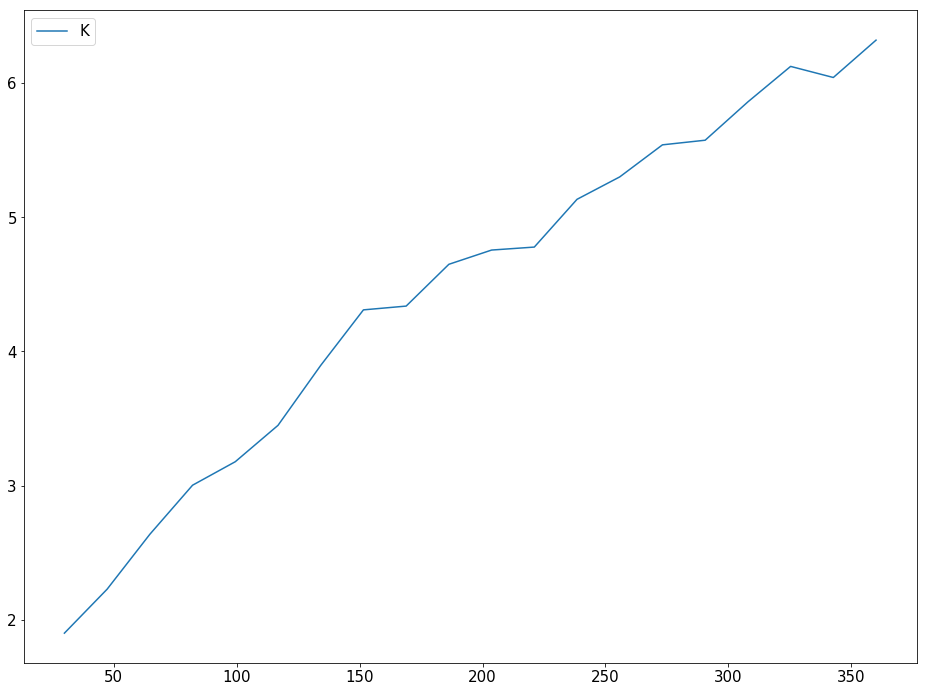

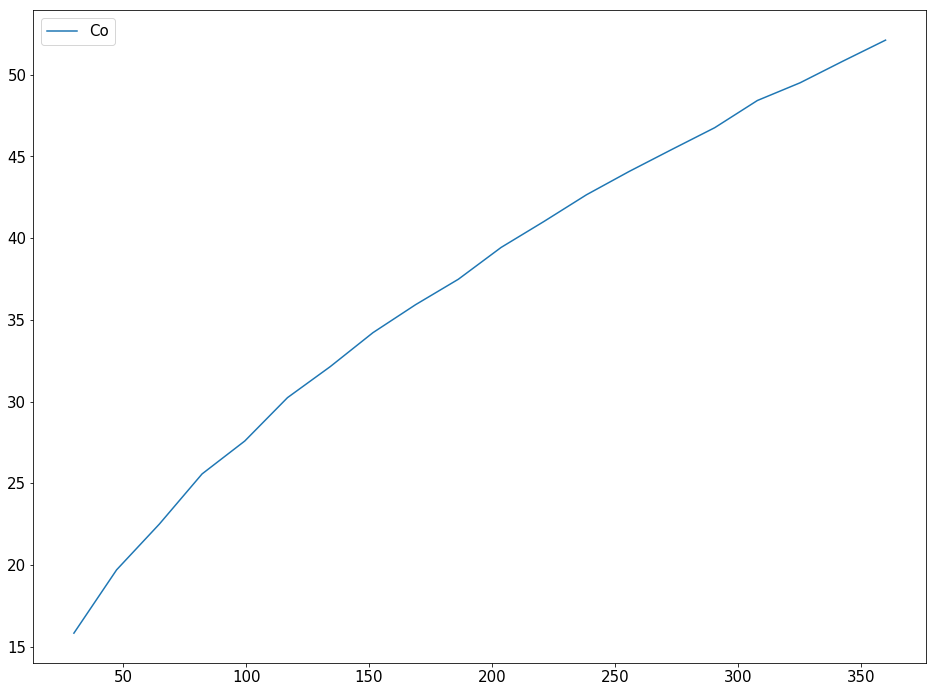

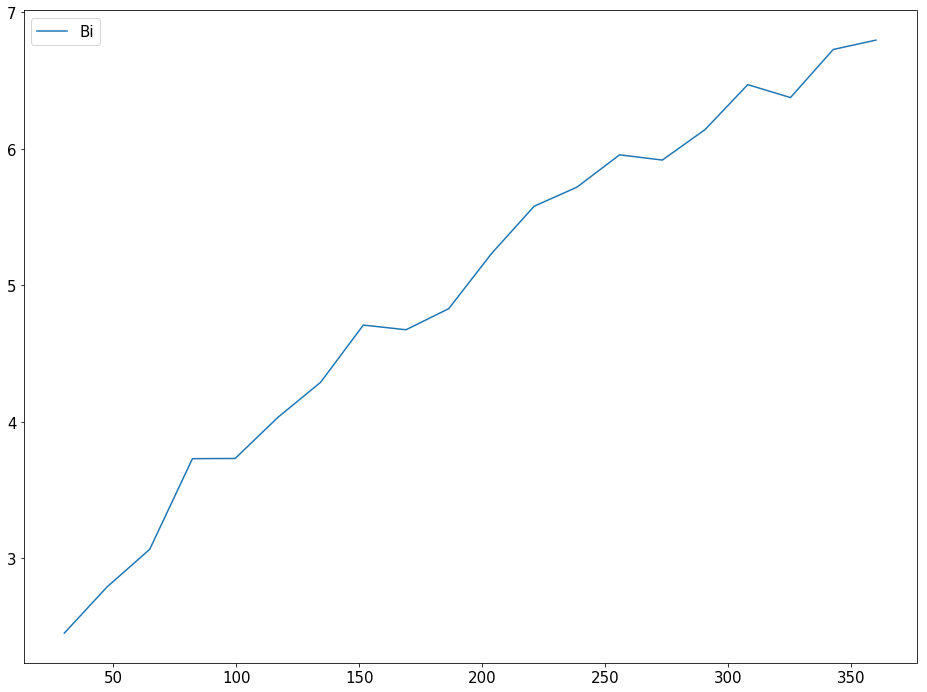

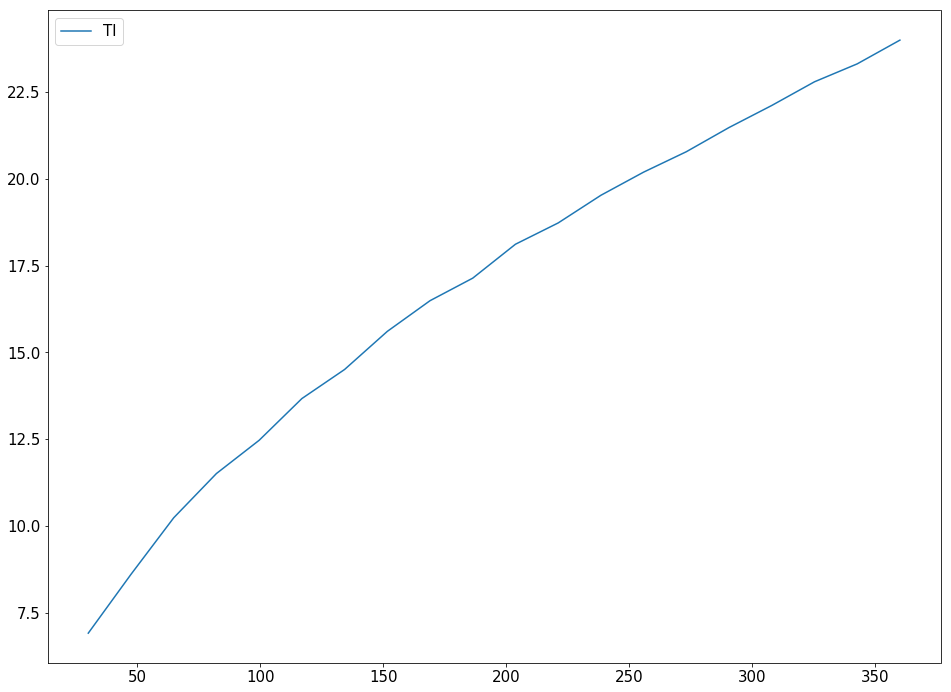

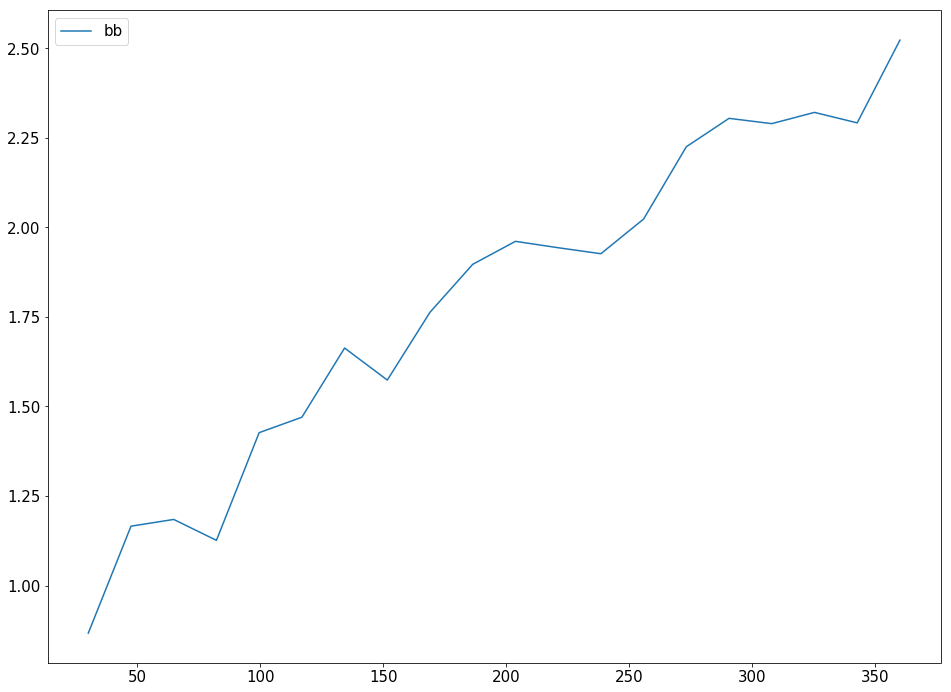

In [31]:
for i in aux_n.keys():
    n = np.array(aux_n[i])
    
    plt.figure()
    plt.plot(res_list.keys(), n,label=i)
    plt.title =i
    plt.legend()
    plt.show()